In [1]:
%matplotlib inline

from __future__ import print_function, division

from keras.datasets import fashion_mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.models import model_from_json

import matplotlib.pyplot as plt
import sys
import numpy as np
import os
import gzip

C:\Users\CX61\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
C:\Users\CX61\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\CX61\Anaconda3\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\CX61\Anaconda3\lib\site-packages\tensorflow\python\framework\dtyp

In [2]:
save_fig_dir = './images'

if not os.path.exists(save_fig_dir):
    os.mkdir(save_fig_dir)


In [3]:
def load_mnist(path, kind='train'):
    

    """Load MNIST data from `path`"""
    labels_path = os.path.join(path,
                               '%s-labels-idx1-ubyte.gz'
                               % kind)
    images_path = os.path.join(path,
                               '%s-images-idx3-ubyte.gz'
                               % kind)

    with gzip.open(labels_path, 'rb') as lbpath:
        labels = np.frombuffer(lbpath.read(), dtype=np.uint8,
                               offset=8)

    with gzip.open(images_path, 'rb') as imgpath:
        images = np.frombuffer(imgpath.read(), dtype=np.uint8,
                               offset=16).reshape(len(labels), 784)

    return images, labels

In [4]:
class GAN():
    def __init__(self):
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        #model.add(Dense(2048))
        #model.add(LeakyReLU(alpha=0.2))
        #model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh'))
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        #model.add(Dense(512))
        #model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid'))
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        #(X_train, _), (_, _) = fashion_mnist.load_data()
        X_train, y_train = load_mnist(os.getcwd() + '/dataset','train')
        X_train = X_train.reshape(len(X_train), 28, 28)

        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch=epoch, save_fig=True)

    def sample_images(self, epoch=1,r=5,c=5,save_fig=False):
        noise = np.random.normal(0, 1, (r * c, 100))
        gen_imgs = gan.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        if r > 1 and c > 1:
            for i in range(r):
                for j in range(c):
                    axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                    axs[i,j].axis('off')
                    cnt += 1
        else:
            for ax, img in zip(axs, gen_imgs):
                ax.imshow(img[ :,:,0], cmap='gray')
                ax.axis('off')
        if save_fig:
            fig.savefig(save_fig_dir + "/%d.png" % epoch)
        plt.show()
        plt.close()

In [5]:
gan = GAN()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten_1 (Flatten)          (None, 784)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 512)               401920    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 512)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
________________________________________________

C:\Users\CX61\Anaconda3\lib\site-packages\keras\engine\training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0 [D loss: 0.680798, acc.: 64.06%] [G loss: 0.601980]


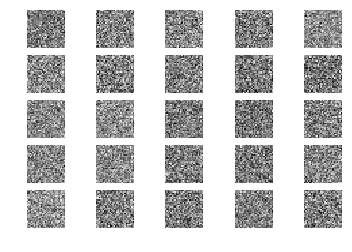

C:\Users\CX61\Anaconda3\lib\site-packages\keras\engine\training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


1 [D loss: 0.397705, acc.: 92.19%] [G loss: 0.616618]
2 [D loss: 0.362348, acc.: 82.81%] [G loss: 0.608054]
3 [D loss: 0.350826, acc.: 85.94%] [G loss: 0.647762]
4 [D loss: 0.335016, acc.: 84.38%] [G loss: 0.731438]
5 [D loss: 0.324308, acc.: 87.50%] [G loss: 0.894992]
6 [D loss: 0.278447, acc.: 95.31%] [G loss: 0.910605]
7 [D loss: 0.238282, acc.: 98.44%] [G loss: 1.141323]
8 [D loss: 0.212412, acc.: 100.00%] [G loss: 1.242945]
9 [D loss: 0.161375, acc.: 100.00%] [G loss: 1.440896]
10 [D loss: 0.167365, acc.: 100.00%] [G loss: 1.495738]
11 [D loss: 0.146393, acc.: 100.00%] [G loss: 1.728594]
12 [D loss: 0.144823, acc.: 98.44%] [G loss: 1.815210]
13 [D loss: 0.123998, acc.: 100.00%] [G loss: 1.888454]
14 [D loss: 0.101386, acc.: 100.00%] [G loss: 2.095240]
15 [D loss: 0.089187, acc.: 100.00%] [G loss: 2.160120]
16 [D loss: 0.092887, acc.: 100.00%] [G loss: 2.172256]
17 [D loss: 0.074410, acc.: 100.00%] [G loss: 2.360285]
18 [D loss: 0.077677, acc.: 100.00%] [G loss: 2.406732]
19 [D los

150 [D loss: 0.258059, acc.: 90.62%] [G loss: 3.673275]
151 [D loss: 0.168361, acc.: 93.75%] [G loss: 3.962201]
152 [D loss: 0.136349, acc.: 96.88%] [G loss: 3.649908]
153 [D loss: 0.225141, acc.: 95.31%] [G loss: 3.003436]
154 [D loss: 0.181137, acc.: 92.19%] [G loss: 4.361160]
155 [D loss: 0.324214, acc.: 90.62%] [G loss: 2.879842]
156 [D loss: 0.456826, acc.: 78.12%] [G loss: 4.257297]
157 [D loss: 0.478343, acc.: 71.88%] [G loss: 2.699317]
158 [D loss: 0.155750, acc.: 95.31%] [G loss: 3.238909]
159 [D loss: 0.155589, acc.: 95.31%] [G loss: 3.527056]
160 [D loss: 0.128607, acc.: 95.31%] [G loss: 3.945970]
161 [D loss: 0.117135, acc.: 96.88%] [G loss: 3.693490]
162 [D loss: 0.136479, acc.: 95.31%] [G loss: 4.106623]
163 [D loss: 0.096093, acc.: 100.00%] [G loss: 3.945911]
164 [D loss: 0.128472, acc.: 95.31%] [G loss: 3.652121]
165 [D loss: 0.155338, acc.: 96.88%] [G loss: 3.495370]
166 [D loss: 0.291977, acc.: 82.81%] [G loss: 2.856271]
167 [D loss: 0.198463, acc.: 93.75%] [G loss: 3

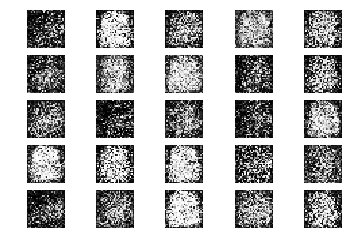

201 [D loss: 0.525426, acc.: 73.44%] [G loss: 5.025053]
202 [D loss: 0.735424, acc.: 75.00%] [G loss: 2.672519]
203 [D loss: 0.266137, acc.: 90.62%] [G loss: 3.293485]
204 [D loss: 0.116011, acc.: 96.88%] [G loss: 3.859775]
205 [D loss: 0.440432, acc.: 78.12%] [G loss: 3.432516]
206 [D loss: 1.445782, acc.: 35.94%] [G loss: 1.919924]
207 [D loss: 0.240967, acc.: 89.06%] [G loss: 3.774439]
208 [D loss: 0.320831, acc.: 90.62%] [G loss: 2.791450]
209 [D loss: 0.631221, acc.: 68.75%] [G loss: 2.866505]
210 [D loss: 0.457670, acc.: 85.94%] [G loss: 3.051237]
211 [D loss: 0.381052, acc.: 87.50%] [G loss: 2.736534]
212 [D loss: 0.356223, acc.: 82.81%] [G loss: 2.734694]
213 [D loss: 0.282768, acc.: 90.62%] [G loss: 2.855546]
214 [D loss: 0.653175, acc.: 68.75%] [G loss: 2.932567]
215 [D loss: 0.308665, acc.: 90.62%] [G loss: 2.769124]
216 [D loss: 0.341259, acc.: 89.06%] [G loss: 2.740092]
217 [D loss: 0.501600, acc.: 75.00%] [G loss: 3.046669]
218 [D loss: 0.929037, acc.: 57.81%] [G loss: 2.

348 [D loss: 0.572280, acc.: 71.88%] [G loss: 1.008773]
349 [D loss: 0.606340, acc.: 67.19%] [G loss: 1.007317]
350 [D loss: 0.636227, acc.: 62.50%] [G loss: 1.005300]
351 [D loss: 0.614760, acc.: 70.31%] [G loss: 1.125890]
352 [D loss: 0.544464, acc.: 76.56%] [G loss: 1.135638]
353 [D loss: 0.576576, acc.: 73.44%] [G loss: 1.097967]
354 [D loss: 0.640870, acc.: 60.94%] [G loss: 1.215228]
355 [D loss: 0.583543, acc.: 75.00%] [G loss: 1.095618]
356 [D loss: 0.606646, acc.: 67.19%] [G loss: 1.132286]
357 [D loss: 0.624065, acc.: 70.31%] [G loss: 1.035599]
358 [D loss: 0.592404, acc.: 71.88%] [G loss: 1.044725]
359 [D loss: 0.585338, acc.: 70.31%] [G loss: 1.172945]
360 [D loss: 0.579515, acc.: 75.00%] [G loss: 1.143306]
361 [D loss: 0.676212, acc.: 70.31%] [G loss: 1.134999]
362 [D loss: 0.642903, acc.: 64.06%] [G loss: 1.062755]
363 [D loss: 0.599014, acc.: 67.19%] [G loss: 1.018563]
364 [D loss: 0.607503, acc.: 64.06%] [G loss: 0.974786]
365 [D loss: 0.600761, acc.: 65.62%] [G loss: 1.

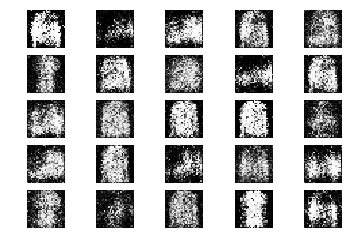

401 [D loss: 0.578559, acc.: 67.19%] [G loss: 1.124589]
402 [D loss: 0.711381, acc.: 56.25%] [G loss: 1.071274]
403 [D loss: 0.658232, acc.: 57.81%] [G loss: 0.973992]
404 [D loss: 0.689164, acc.: 57.81%] [G loss: 0.993563]
405 [D loss: 0.639352, acc.: 62.50%] [G loss: 0.977117]
406 [D loss: 0.578643, acc.: 76.56%] [G loss: 0.968565]
407 [D loss: 0.622249, acc.: 68.75%] [G loss: 1.017098]
408 [D loss: 0.581916, acc.: 76.56%] [G loss: 1.073738]
409 [D loss: 0.604500, acc.: 73.44%] [G loss: 0.941937]
410 [D loss: 0.670286, acc.: 59.38%] [G loss: 0.999743]
411 [D loss: 0.651476, acc.: 62.50%] [G loss: 0.929995]
412 [D loss: 0.628575, acc.: 70.31%] [G loss: 1.001776]
413 [D loss: 0.583546, acc.: 71.88%] [G loss: 1.071806]
414 [D loss: 0.536954, acc.: 79.69%] [G loss: 1.034955]
415 [D loss: 0.686866, acc.: 59.38%] [G loss: 1.094059]
416 [D loss: 0.751552, acc.: 46.88%] [G loss: 1.034938]
417 [D loss: 0.674429, acc.: 62.50%] [G loss: 0.907743]
418 [D loss: 0.586895, acc.: 75.00%] [G loss: 0.

549 [D loss: 0.630962, acc.: 59.38%] [G loss: 0.909806]
550 [D loss: 0.587264, acc.: 64.06%] [G loss: 0.882262]
551 [D loss: 0.621588, acc.: 68.75%] [G loss: 0.879721]
552 [D loss: 0.745999, acc.: 48.44%] [G loss: 0.900828]
553 [D loss: 0.580711, acc.: 75.00%] [G loss: 0.965243]
554 [D loss: 0.669337, acc.: 57.81%] [G loss: 1.037727]
555 [D loss: 0.669528, acc.: 57.81%] [G loss: 0.901058]
556 [D loss: 0.639266, acc.: 64.06%] [G loss: 0.901232]
557 [D loss: 0.635910, acc.: 65.62%] [G loss: 0.915165]
558 [D loss: 0.694455, acc.: 59.38%] [G loss: 0.941072]
559 [D loss: 0.650881, acc.: 57.81%] [G loss: 0.923454]
560 [D loss: 0.588117, acc.: 67.19%] [G loss: 0.903620]
561 [D loss: 0.668558, acc.: 53.12%] [G loss: 0.910797]
562 [D loss: 0.535054, acc.: 79.69%] [G loss: 1.025582]
563 [D loss: 0.533080, acc.: 75.00%] [G loss: 1.015969]
564 [D loss: 0.646670, acc.: 57.81%] [G loss: 0.908097]
565 [D loss: 0.601604, acc.: 64.06%] [G loss: 0.900451]
566 [D loss: 0.668201, acc.: 56.25%] [G loss: 0.

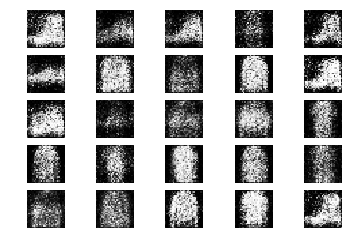

601 [D loss: 0.680065, acc.: 56.25%] [G loss: 0.833493]
602 [D loss: 0.644296, acc.: 64.06%] [G loss: 0.864932]
603 [D loss: 0.667622, acc.: 60.94%] [G loss: 0.905735]
604 [D loss: 0.685343, acc.: 54.69%] [G loss: 0.976443]
605 [D loss: 0.581596, acc.: 73.44%] [G loss: 0.919898]
606 [D loss: 0.677374, acc.: 59.38%] [G loss: 0.906898]
607 [D loss: 0.577645, acc.: 68.75%] [G loss: 0.915809]
608 [D loss: 0.644941, acc.: 62.50%] [G loss: 0.941944]
609 [D loss: 0.709451, acc.: 54.69%] [G loss: 0.877230]
610 [D loss: 0.612464, acc.: 70.31%] [G loss: 0.897855]
611 [D loss: 0.606063, acc.: 64.06%] [G loss: 0.874632]
612 [D loss: 0.603388, acc.: 70.31%] [G loss: 0.889010]
613 [D loss: 0.684965, acc.: 64.06%] [G loss: 0.939452]
614 [D loss: 0.606676, acc.: 70.31%] [G loss: 0.851794]
615 [D loss: 0.647409, acc.: 62.50%] [G loss: 0.936644]
616 [D loss: 0.664938, acc.: 60.94%] [G loss: 0.825878]
617 [D loss: 0.631974, acc.: 70.31%] [G loss: 0.950847]
618 [D loss: 0.606232, acc.: 70.31%] [G loss: 0.

748 [D loss: 0.687810, acc.: 53.12%] [G loss: 0.874217]
749 [D loss: 0.653332, acc.: 60.94%] [G loss: 0.792714]
750 [D loss: 0.640446, acc.: 60.94%] [G loss: 0.806835]
751 [D loss: 0.724259, acc.: 45.31%] [G loss: 0.788103]
752 [D loss: 0.666718, acc.: 60.94%] [G loss: 0.883861]
753 [D loss: 0.644751, acc.: 64.06%] [G loss: 0.810677]
754 [D loss: 0.670303, acc.: 57.81%] [G loss: 0.799523]
755 [D loss: 0.666256, acc.: 67.19%] [G loss: 0.744141]
756 [D loss: 0.664250, acc.: 62.50%] [G loss: 0.763174]
757 [D loss: 0.611656, acc.: 62.50%] [G loss: 0.854809]
758 [D loss: 0.617547, acc.: 75.00%] [G loss: 0.842310]
759 [D loss: 0.641058, acc.: 65.62%] [G loss: 0.874404]
760 [D loss: 0.620383, acc.: 67.19%] [G loss: 0.894358]
761 [D loss: 0.670134, acc.: 64.06%] [G loss: 0.825791]
762 [D loss: 0.600783, acc.: 67.19%] [G loss: 0.737707]
763 [D loss: 0.709172, acc.: 43.75%] [G loss: 0.832444]
764 [D loss: 0.619106, acc.: 68.75%] [G loss: 0.945117]
765 [D loss: 0.671822, acc.: 56.25%] [G loss: 0.

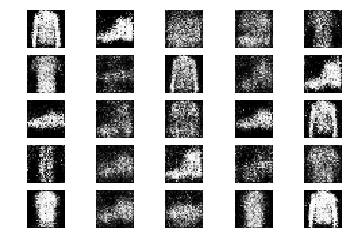

801 [D loss: 0.691270, acc.: 51.56%] [G loss: 0.865161]
802 [D loss: 0.624978, acc.: 62.50%] [G loss: 0.875674]
803 [D loss: 0.687204, acc.: 56.25%] [G loss: 0.787942]
804 [D loss: 0.620909, acc.: 60.94%] [G loss: 0.878036]
805 [D loss: 0.693853, acc.: 48.44%] [G loss: 0.895390]
806 [D loss: 0.666864, acc.: 54.69%] [G loss: 0.826532]
807 [D loss: 0.683334, acc.: 51.56%] [G loss: 0.815374]
808 [D loss: 0.652086, acc.: 60.94%] [G loss: 0.861562]
809 [D loss: 0.643665, acc.: 65.62%] [G loss: 0.783401]
810 [D loss: 0.638439, acc.: 57.81%] [G loss: 0.802092]
811 [D loss: 0.588721, acc.: 70.31%] [G loss: 0.793247]
812 [D loss: 0.713521, acc.: 53.12%] [G loss: 0.776258]
813 [D loss: 0.677496, acc.: 53.12%] [G loss: 0.783417]
814 [D loss: 0.630759, acc.: 60.94%] [G loss: 0.813934]
815 [D loss: 0.621616, acc.: 65.62%] [G loss: 0.818789]
816 [D loss: 0.669980, acc.: 59.38%] [G loss: 0.845833]
817 [D loss: 0.593845, acc.: 64.06%] [G loss: 0.900387]
818 [D loss: 0.654088, acc.: 70.31%] [G loss: 0.

950 [D loss: 0.596109, acc.: 68.75%] [G loss: 0.895560]
951 [D loss: 0.650625, acc.: 59.38%] [G loss: 0.861190]
952 [D loss: 0.614607, acc.: 73.44%] [G loss: 0.819506]
953 [D loss: 0.623950, acc.: 62.50%] [G loss: 0.821310]
954 [D loss: 0.645700, acc.: 60.94%] [G loss: 0.900212]
955 [D loss: 0.606091, acc.: 70.31%] [G loss: 0.858967]
956 [D loss: 0.650060, acc.: 65.62%] [G loss: 0.849697]
957 [D loss: 0.606226, acc.: 65.62%] [G loss: 0.889272]
958 [D loss: 0.636388, acc.: 64.06%] [G loss: 0.878267]
959 [D loss: 0.639149, acc.: 62.50%] [G loss: 0.886532]
960 [D loss: 0.594543, acc.: 76.56%] [G loss: 0.859014]
961 [D loss: 0.630383, acc.: 64.06%] [G loss: 0.913082]
962 [D loss: 0.626751, acc.: 59.38%] [G loss: 0.877423]
963 [D loss: 0.624170, acc.: 65.62%] [G loss: 0.806261]
964 [D loss: 0.734330, acc.: 57.81%] [G loss: 0.761366]
965 [D loss: 0.706677, acc.: 43.75%] [G loss: 0.808827]
966 [D loss: 0.702697, acc.: 62.50%] [G loss: 0.813651]
967 [D loss: 0.662374, acc.: 62.50%] [G loss: 0.

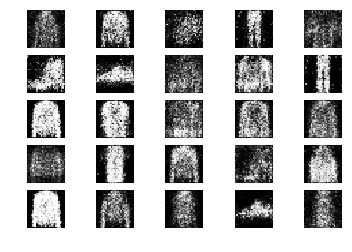

1001 [D loss: 0.620255, acc.: 68.75%] [G loss: 0.802730]
1002 [D loss: 0.649890, acc.: 57.81%] [G loss: 0.825612]
1003 [D loss: 0.637582, acc.: 62.50%] [G loss: 0.813228]
1004 [D loss: 0.687306, acc.: 56.25%] [G loss: 0.838421]
1005 [D loss: 0.637763, acc.: 65.62%] [G loss: 0.875982]
1006 [D loss: 0.685885, acc.: 53.12%] [G loss: 0.783195]
1007 [D loss: 0.675802, acc.: 56.25%] [G loss: 0.822223]
1008 [D loss: 0.670566, acc.: 56.25%] [G loss: 0.848302]
1009 [D loss: 0.667534, acc.: 50.00%] [G loss: 0.859234]
1010 [D loss: 0.616796, acc.: 76.56%] [G loss: 0.845680]
1011 [D loss: 0.644885, acc.: 65.62%] [G loss: 0.782265]
1012 [D loss: 0.619262, acc.: 73.44%] [G loss: 0.784858]
1013 [D loss: 0.634572, acc.: 65.62%] [G loss: 0.866875]
1014 [D loss: 0.653042, acc.: 65.62%] [G loss: 0.850472]
1015 [D loss: 0.681441, acc.: 54.69%] [G loss: 0.852334]
1016 [D loss: 0.634043, acc.: 64.06%] [G loss: 0.829692]
1017 [D loss: 0.657334, acc.: 65.62%] [G loss: 0.811512]
1018 [D loss: 0.627897, acc.: 7

1145 [D loss: 0.661143, acc.: 60.94%] [G loss: 0.836290]
1146 [D loss: 0.689866, acc.: 60.94%] [G loss: 0.822873]
1147 [D loss: 0.656914, acc.: 53.12%] [G loss: 0.882636]
1148 [D loss: 0.647497, acc.: 62.50%] [G loss: 0.933926]
1149 [D loss: 0.593908, acc.: 70.31%] [G loss: 0.893391]
1150 [D loss: 0.645300, acc.: 60.94%] [G loss: 0.941189]
1151 [D loss: 0.655132, acc.: 57.81%] [G loss: 0.898750]
1152 [D loss: 0.671194, acc.: 56.25%] [G loss: 0.827834]
1153 [D loss: 0.608210, acc.: 75.00%] [G loss: 0.861777]
1154 [D loss: 0.637513, acc.: 60.94%] [G loss: 0.840572]
1155 [D loss: 0.609529, acc.: 65.62%] [G loss: 0.878347]
1156 [D loss: 0.618413, acc.: 67.19%] [G loss: 0.831357]
1157 [D loss: 0.708522, acc.: 43.75%] [G loss: 0.769065]
1158 [D loss: 0.612094, acc.: 62.50%] [G loss: 0.816508]
1159 [D loss: 0.664796, acc.: 64.06%] [G loss: 0.740343]
1160 [D loss: 0.664444, acc.: 56.25%] [G loss: 0.822278]
1161 [D loss: 0.598545, acc.: 78.12%] [G loss: 0.888229]
1162 [D loss: 0.607520, acc.: 7

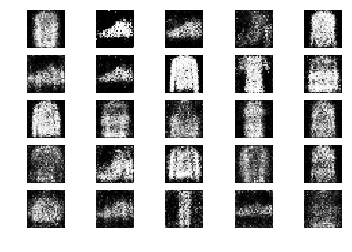

1201 [D loss: 0.670153, acc.: 57.81%] [G loss: 0.880790]
1202 [D loss: 0.646545, acc.: 64.06%] [G loss: 0.829568]
1203 [D loss: 0.603746, acc.: 67.19%] [G loss: 0.896634]
1204 [D loss: 0.635105, acc.: 68.75%] [G loss: 0.861954]
1205 [D loss: 0.651628, acc.: 67.19%] [G loss: 0.857881]
1206 [D loss: 0.620206, acc.: 68.75%] [G loss: 0.863473]
1207 [D loss: 0.621821, acc.: 68.75%] [G loss: 0.830318]
1208 [D loss: 0.700142, acc.: 57.81%] [G loss: 0.817380]
1209 [D loss: 0.655143, acc.: 57.81%] [G loss: 0.815509]
1210 [D loss: 0.659932, acc.: 60.94%] [G loss: 0.844546]
1211 [D loss: 0.625362, acc.: 65.62%] [G loss: 0.896546]
1212 [D loss: 0.652222, acc.: 62.50%] [G loss: 0.939777]
1213 [D loss: 0.677016, acc.: 51.56%] [G loss: 0.928841]
1214 [D loss: 0.589707, acc.: 73.44%] [G loss: 0.787021]
1215 [D loss: 0.632425, acc.: 57.81%] [G loss: 0.787852]
1216 [D loss: 0.661244, acc.: 71.88%] [G loss: 0.824132]
1217 [D loss: 0.656639, acc.: 60.94%] [G loss: 0.875138]
1218 [D loss: 0.670330, acc.: 6

1346 [D loss: 0.657566, acc.: 56.25%] [G loss: 0.858605]
1347 [D loss: 0.659690, acc.: 50.00%] [G loss: 0.907227]
1348 [D loss: 0.610841, acc.: 70.31%] [G loss: 0.882847]
1349 [D loss: 0.622860, acc.: 64.06%] [G loss: 0.924357]
1350 [D loss: 0.655373, acc.: 57.81%] [G loss: 0.850141]
1351 [D loss: 0.609221, acc.: 76.56%] [G loss: 0.881591]
1352 [D loss: 0.677691, acc.: 54.69%] [G loss: 0.837143]
1353 [D loss: 0.621663, acc.: 70.31%] [G loss: 0.808176]
1354 [D loss: 0.671888, acc.: 59.38%] [G loss: 0.897044]
1355 [D loss: 0.629960, acc.: 68.75%] [G loss: 0.869932]
1356 [D loss: 0.625225, acc.: 68.75%] [G loss: 0.806190]
1357 [D loss: 0.656517, acc.: 62.50%] [G loss: 0.775974]
1358 [D loss: 0.685401, acc.: 45.31%] [G loss: 0.787581]
1359 [D loss: 0.590586, acc.: 68.75%] [G loss: 0.837006]
1360 [D loss: 0.689290, acc.: 53.12%] [G loss: 0.857547]
1361 [D loss: 0.649487, acc.: 64.06%] [G loss: 0.859157]
1362 [D loss: 0.640330, acc.: 60.94%] [G loss: 0.850661]
1363 [D loss: 0.618299, acc.: 6

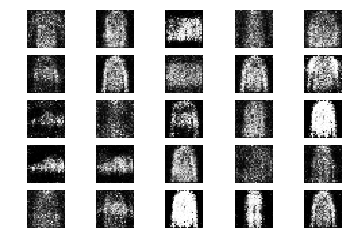

1401 [D loss: 0.642196, acc.: 60.94%] [G loss: 0.891140]
1402 [D loss: 0.626783, acc.: 62.50%] [G loss: 0.866701]
1403 [D loss: 0.687771, acc.: 57.81%] [G loss: 0.887265]
1404 [D loss: 0.640279, acc.: 57.81%] [G loss: 0.862465]
1405 [D loss: 0.650101, acc.: 57.81%] [G loss: 0.889690]
1406 [D loss: 0.609358, acc.: 73.44%] [G loss: 0.811658]
1407 [D loss: 0.698196, acc.: 50.00%] [G loss: 0.909468]
1408 [D loss: 0.643722, acc.: 64.06%] [G loss: 0.897866]
1409 [D loss: 0.632217, acc.: 68.75%] [G loss: 0.846124]
1410 [D loss: 0.664301, acc.: 53.12%] [G loss: 0.794657]
1411 [D loss: 0.649725, acc.: 65.62%] [G loss: 0.797835]
1412 [D loss: 0.589721, acc.: 70.31%] [G loss: 0.794592]
1413 [D loss: 0.699684, acc.: 57.81%] [G loss: 0.748446]
1414 [D loss: 0.688714, acc.: 57.81%] [G loss: 0.827799]
1415 [D loss: 0.625292, acc.: 65.62%] [G loss: 0.776801]
1416 [D loss: 0.631639, acc.: 65.62%] [G loss: 0.835731]
1417 [D loss: 0.628231, acc.: 65.62%] [G loss: 0.834823]
1418 [D loss: 0.665550, acc.: 5

1545 [D loss: 0.663314, acc.: 48.44%] [G loss: 0.879424]
1546 [D loss: 0.590422, acc.: 68.75%] [G loss: 0.897956]
1547 [D loss: 0.689716, acc.: 56.25%] [G loss: 0.879775]
1548 [D loss: 0.675184, acc.: 46.88%] [G loss: 0.841524]
1549 [D loss: 0.642438, acc.: 68.75%] [G loss: 0.943517]
1550 [D loss: 0.622809, acc.: 64.06%] [G loss: 0.825058]
1551 [D loss: 0.629732, acc.: 64.06%] [G loss: 0.864634]
1552 [D loss: 0.682449, acc.: 60.94%] [G loss: 0.777921]
1553 [D loss: 0.570634, acc.: 70.31%] [G loss: 0.860652]
1554 [D loss: 0.590470, acc.: 73.44%] [G loss: 0.910558]
1555 [D loss: 0.607887, acc.: 71.88%] [G loss: 0.829800]
1556 [D loss: 0.583724, acc.: 71.88%] [G loss: 0.839782]
1557 [D loss: 0.666691, acc.: 65.62%] [G loss: 0.918077]
1558 [D loss: 0.685447, acc.: 48.44%] [G loss: 0.888074]
1559 [D loss: 0.559302, acc.: 73.44%] [G loss: 0.884285]
1560 [D loss: 0.684223, acc.: 56.25%] [G loss: 0.815141]
1561 [D loss: 0.599840, acc.: 70.31%] [G loss: 0.852300]
1562 [D loss: 0.621901, acc.: 6

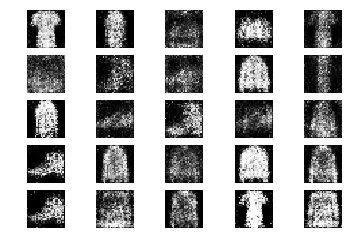

1601 [D loss: 0.673672, acc.: 59.38%] [G loss: 0.860014]
1602 [D loss: 0.640005, acc.: 64.06%] [G loss: 0.900818]
1603 [D loss: 0.631807, acc.: 70.31%] [G loss: 0.848633]
1604 [D loss: 0.622130, acc.: 71.88%] [G loss: 0.874101]
1605 [D loss: 0.622323, acc.: 64.06%] [G loss: 0.897884]
1606 [D loss: 0.645620, acc.: 60.94%] [G loss: 0.915042]
1607 [D loss: 0.622612, acc.: 65.62%] [G loss: 0.817446]
1608 [D loss: 0.646439, acc.: 60.94%] [G loss: 0.836434]
1609 [D loss: 0.634810, acc.: 70.31%] [G loss: 0.898679]
1610 [D loss: 0.614148, acc.: 60.94%] [G loss: 0.972733]
1611 [D loss: 0.681185, acc.: 54.69%] [G loss: 0.934428]
1612 [D loss: 0.701733, acc.: 64.06%] [G loss: 0.874339]
1613 [D loss: 0.632527, acc.: 64.06%] [G loss: 0.885155]
1614 [D loss: 0.666242, acc.: 56.25%] [G loss: 0.811698]
1615 [D loss: 0.594623, acc.: 75.00%] [G loss: 0.854590]
1616 [D loss: 0.634304, acc.: 59.38%] [G loss: 0.812766]
1617 [D loss: 0.596393, acc.: 59.38%] [G loss: 0.790153]
1618 [D loss: 0.589207, acc.: 7

1745 [D loss: 0.608723, acc.: 64.06%] [G loss: 0.901876]
1746 [D loss: 0.602205, acc.: 64.06%] [G loss: 0.873105]
1747 [D loss: 0.647199, acc.: 59.38%] [G loss: 0.930347]
1748 [D loss: 0.593101, acc.: 71.88%] [G loss: 0.867936]
1749 [D loss: 0.623070, acc.: 64.06%] [G loss: 0.838111]
1750 [D loss: 0.590963, acc.: 68.75%] [G loss: 0.778439]
1751 [D loss: 0.598940, acc.: 73.44%] [G loss: 0.866808]
1752 [D loss: 0.615434, acc.: 70.31%] [G loss: 0.879268]
1753 [D loss: 0.641293, acc.: 54.69%] [G loss: 0.860129]
1754 [D loss: 0.626925, acc.: 64.06%] [G loss: 0.862171]
1755 [D loss: 0.576621, acc.: 70.31%] [G loss: 0.776527]
1756 [D loss: 0.646748, acc.: 59.38%] [G loss: 0.921680]
1757 [D loss: 0.615947, acc.: 62.50%] [G loss: 0.881819]
1758 [D loss: 0.649015, acc.: 57.81%] [G loss: 0.912371]
1759 [D loss: 0.598054, acc.: 73.44%] [G loss: 0.909191]
1760 [D loss: 0.670077, acc.: 59.38%] [G loss: 0.851646]
1761 [D loss: 0.614214, acc.: 70.31%] [G loss: 0.840571]
1762 [D loss: 0.626984, acc.: 6

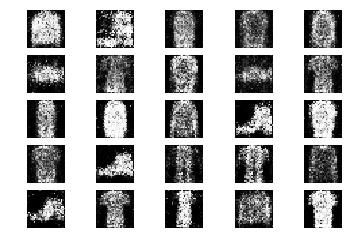

1801 [D loss: 0.657018, acc.: 64.06%] [G loss: 0.873317]
1802 [D loss: 0.622940, acc.: 67.19%] [G loss: 0.915300]
1803 [D loss: 0.651995, acc.: 60.94%] [G loss: 0.798059]
1804 [D loss: 0.634171, acc.: 64.06%] [G loss: 0.799611]
1805 [D loss: 0.691368, acc.: 62.50%] [G loss: 0.884090]
1806 [D loss: 0.605368, acc.: 71.88%] [G loss: 0.858778]
1807 [D loss: 0.588549, acc.: 76.56%] [G loss: 0.905898]
1808 [D loss: 0.623057, acc.: 62.50%] [G loss: 0.910267]
1809 [D loss: 0.686340, acc.: 60.94%] [G loss: 0.787978]
1810 [D loss: 0.633467, acc.: 68.75%] [G loss: 0.764288]
1811 [D loss: 0.588809, acc.: 71.88%] [G loss: 0.875764]
1812 [D loss: 0.580937, acc.: 67.19%] [G loss: 0.881884]
1813 [D loss: 0.663609, acc.: 57.81%] [G loss: 0.887947]
1814 [D loss: 0.678770, acc.: 56.25%] [G loss: 0.916399]
1815 [D loss: 0.633470, acc.: 65.62%] [G loss: 0.772802]
1816 [D loss: 0.628879, acc.: 59.38%] [G loss: 0.813820]
1817 [D loss: 0.621871, acc.: 67.19%] [G loss: 0.863967]
1818 [D loss: 0.562187, acc.: 7

1947 [D loss: 0.628907, acc.: 57.81%] [G loss: 0.936093]
1948 [D loss: 0.620410, acc.: 62.50%] [G loss: 0.951335]
1949 [D loss: 0.575283, acc.: 79.69%] [G loss: 0.889175]
1950 [D loss: 0.537255, acc.: 78.12%] [G loss: 0.906035]
1951 [D loss: 0.679889, acc.: 56.25%] [G loss: 0.973407]
1952 [D loss: 0.655994, acc.: 59.38%] [G loss: 0.890858]
1953 [D loss: 0.595651, acc.: 67.19%] [G loss: 0.996879]
1954 [D loss: 0.640908, acc.: 64.06%] [G loss: 0.906532]
1955 [D loss: 0.581760, acc.: 71.88%] [G loss: 1.002111]
1956 [D loss: 0.600605, acc.: 71.88%] [G loss: 0.963535]
1957 [D loss: 0.577972, acc.: 71.88%] [G loss: 0.875622]
1958 [D loss: 0.658519, acc.: 64.06%] [G loss: 0.864621]
1959 [D loss: 0.566015, acc.: 70.31%] [G loss: 0.928576]
1960 [D loss: 0.609949, acc.: 60.94%] [G loss: 0.928487]
1961 [D loss: 0.643799, acc.: 60.94%] [G loss: 0.914805]
1962 [D loss: 0.609727, acc.: 68.75%] [G loss: 0.983268]
1963 [D loss: 0.672658, acc.: 54.69%] [G loss: 0.922242]
1964 [D loss: 0.609358, acc.: 6

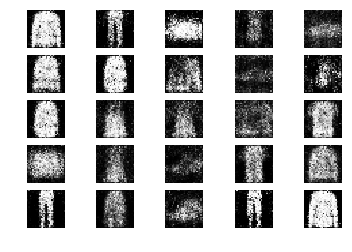

2001 [D loss: 0.560105, acc.: 75.00%] [G loss: 0.889925]
2002 [D loss: 0.678150, acc.: 62.50%] [G loss: 0.826072]
2003 [D loss: 0.596955, acc.: 65.62%] [G loss: 0.864840]
2004 [D loss: 0.609023, acc.: 67.19%] [G loss: 0.803820]
2005 [D loss: 0.634239, acc.: 60.94%] [G loss: 0.877973]
2006 [D loss: 0.573267, acc.: 68.75%] [G loss: 0.904595]
2007 [D loss: 0.681247, acc.: 64.06%] [G loss: 0.963772]
2008 [D loss: 0.636419, acc.: 67.19%] [G loss: 0.924652]
2009 [D loss: 0.687890, acc.: 56.25%] [G loss: 0.937460]
2010 [D loss: 0.627791, acc.: 62.50%] [G loss: 0.911903]
2011 [D loss: 0.709823, acc.: 54.69%] [G loss: 0.896587]
2012 [D loss: 0.616905, acc.: 64.06%] [G loss: 0.941889]
2013 [D loss: 0.577541, acc.: 70.31%] [G loss: 0.851656]
2014 [D loss: 0.620652, acc.: 71.88%] [G loss: 0.845042]
2015 [D loss: 0.582751, acc.: 70.31%] [G loss: 0.988755]
2016 [D loss: 0.623231, acc.: 71.88%] [G loss: 0.911426]
2017 [D loss: 0.570539, acc.: 73.44%] [G loss: 0.918103]
2018 [D loss: 0.616334, acc.: 6

2147 [D loss: 0.610842, acc.: 62.50%] [G loss: 0.972998]
2148 [D loss: 0.583266, acc.: 73.44%] [G loss: 0.914356]
2149 [D loss: 0.674906, acc.: 60.94%] [G loss: 0.855974]
2150 [D loss: 0.577688, acc.: 73.44%] [G loss: 0.947811]
2151 [D loss: 0.652877, acc.: 62.50%] [G loss: 0.933902]
2152 [D loss: 0.614276, acc.: 62.50%] [G loss: 0.989153]
2153 [D loss: 0.573648, acc.: 79.69%] [G loss: 0.897736]
2154 [D loss: 0.657380, acc.: 59.38%] [G loss: 0.928274]
2155 [D loss: 0.653110, acc.: 71.88%] [G loss: 0.957316]
2156 [D loss: 0.668571, acc.: 57.81%] [G loss: 1.035282]
2157 [D loss: 0.601292, acc.: 73.44%] [G loss: 0.948632]
2158 [D loss: 0.665818, acc.: 64.06%] [G loss: 0.903293]
2159 [D loss: 0.609631, acc.: 70.31%] [G loss: 0.887838]
2160 [D loss: 0.622434, acc.: 70.31%] [G loss: 0.885106]
2161 [D loss: 0.548874, acc.: 73.44%] [G loss: 0.981686]
2162 [D loss: 0.604388, acc.: 73.44%] [G loss: 0.891820]
2163 [D loss: 0.652423, acc.: 59.38%] [G loss: 0.950902]
2164 [D loss: 0.615918, acc.: 7

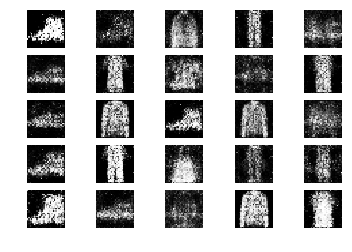

2201 [D loss: 0.613319, acc.: 64.06%] [G loss: 0.911738]
2202 [D loss: 0.565570, acc.: 70.31%] [G loss: 0.981187]
2203 [D loss: 0.546170, acc.: 71.88%] [G loss: 0.909870]
2204 [D loss: 0.663012, acc.: 56.25%] [G loss: 0.931050]
2205 [D loss: 0.579330, acc.: 73.44%] [G loss: 0.885030]
2206 [D loss: 0.669168, acc.: 48.44%] [G loss: 0.918095]
2207 [D loss: 0.669819, acc.: 60.94%] [G loss: 0.936367]
2208 [D loss: 0.626684, acc.: 59.38%] [G loss: 0.992327]
2209 [D loss: 0.518402, acc.: 78.12%] [G loss: 0.888057]
2210 [D loss: 0.664559, acc.: 64.06%] [G loss: 0.874856]
2211 [D loss: 0.670060, acc.: 50.00%] [G loss: 0.867414]
2212 [D loss: 0.655342, acc.: 60.94%] [G loss: 0.973113]
2213 [D loss: 0.615209, acc.: 62.50%] [G loss: 0.926439]
2214 [D loss: 0.654649, acc.: 65.62%] [G loss: 0.929247]
2215 [D loss: 0.652943, acc.: 67.19%] [G loss: 0.890211]
2216 [D loss: 0.667493, acc.: 60.94%] [G loss: 0.830803]
2217 [D loss: 0.560616, acc.: 73.44%] [G loss: 0.891169]
2218 [D loss: 0.620093, acc.: 6

2347 [D loss: 0.633684, acc.: 54.69%] [G loss: 0.927594]
2348 [D loss: 0.638904, acc.: 59.38%] [G loss: 0.812043]
2349 [D loss: 0.662304, acc.: 59.38%] [G loss: 0.818178]
2350 [D loss: 0.583917, acc.: 68.75%] [G loss: 0.932867]
2351 [D loss: 0.688754, acc.: 53.12%] [G loss: 0.883932]
2352 [D loss: 0.587815, acc.: 70.31%] [G loss: 0.912127]
2353 [D loss: 0.595786, acc.: 68.75%] [G loss: 0.864409]
2354 [D loss: 0.605087, acc.: 65.62%] [G loss: 0.969283]
2355 [D loss: 0.594735, acc.: 67.19%] [G loss: 0.941300]
2356 [D loss: 0.616342, acc.: 62.50%] [G loss: 0.979168]
2357 [D loss: 0.614542, acc.: 70.31%] [G loss: 0.932771]
2358 [D loss: 0.641784, acc.: 64.06%] [G loss: 0.948326]
2359 [D loss: 0.648290, acc.: 59.38%] [G loss: 0.958439]
2360 [D loss: 0.619682, acc.: 64.06%] [G loss: 0.956169]
2361 [D loss: 0.592941, acc.: 68.75%] [G loss: 0.907960]
2362 [D loss: 0.641454, acc.: 65.62%] [G loss: 0.888636]
2363 [D loss: 0.598104, acc.: 71.88%] [G loss: 1.010050]
2364 [D loss: 0.641323, acc.: 6

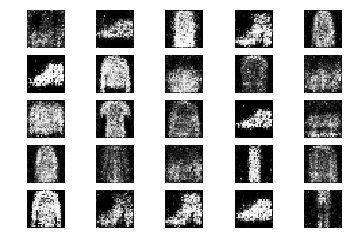

2401 [D loss: 0.632542, acc.: 60.94%] [G loss: 0.929783]
2402 [D loss: 0.654081, acc.: 65.62%] [G loss: 0.913188]
2403 [D loss: 0.550141, acc.: 71.88%] [G loss: 0.883295]
2404 [D loss: 0.687544, acc.: 54.69%] [G loss: 0.933086]
2405 [D loss: 0.598094, acc.: 75.00%] [G loss: 0.853228]
2406 [D loss: 0.687507, acc.: 51.56%] [G loss: 0.932839]
2407 [D loss: 0.568860, acc.: 79.69%] [G loss: 0.914313]
2408 [D loss: 0.560148, acc.: 73.44%] [G loss: 0.874194]
2409 [D loss: 0.599966, acc.: 65.62%] [G loss: 0.893905]
2410 [D loss: 0.680890, acc.: 59.38%] [G loss: 0.858397]
2411 [D loss: 0.723065, acc.: 54.69%] [G loss: 0.879003]
2412 [D loss: 0.672665, acc.: 54.69%] [G loss: 0.873430]
2413 [D loss: 0.639757, acc.: 65.62%] [G loss: 0.911020]
2414 [D loss: 0.599752, acc.: 71.88%] [G loss: 0.929746]
2415 [D loss: 0.655953, acc.: 62.50%] [G loss: 0.840597]
2416 [D loss: 0.578299, acc.: 73.44%] [G loss: 0.929343]
2417 [D loss: 0.695594, acc.: 53.12%] [G loss: 0.811477]
2418 [D loss: 0.628033, acc.: 6

2547 [D loss: 0.661840, acc.: 59.38%] [G loss: 0.892329]
2548 [D loss: 0.552968, acc.: 73.44%] [G loss: 0.929781]
2549 [D loss: 0.572295, acc.: 68.75%] [G loss: 0.970423]
2550 [D loss: 0.656630, acc.: 56.25%] [G loss: 0.868871]
2551 [D loss: 0.618073, acc.: 62.50%] [G loss: 0.940142]
2552 [D loss: 0.682602, acc.: 64.06%] [G loss: 0.973104]
2553 [D loss: 0.683731, acc.: 57.81%] [G loss: 1.034615]
2554 [D loss: 0.571116, acc.: 76.56%] [G loss: 0.945840]
2555 [D loss: 0.695026, acc.: 60.94%] [G loss: 0.919114]
2556 [D loss: 0.612757, acc.: 67.19%] [G loss: 0.867982]
2557 [D loss: 0.620228, acc.: 64.06%] [G loss: 0.886832]
2558 [D loss: 0.607967, acc.: 67.19%] [G loss: 0.884053]
2559 [D loss: 0.649314, acc.: 60.94%] [G loss: 0.854223]
2560 [D loss: 0.625406, acc.: 56.25%] [G loss: 0.935147]
2561 [D loss: 0.607347, acc.: 65.62%] [G loss: 0.880824]
2562 [D loss: 0.616742, acc.: 67.19%] [G loss: 0.948780]
2563 [D loss: 0.581005, acc.: 70.31%] [G loss: 0.962300]
2564 [D loss: 0.626875, acc.: 5

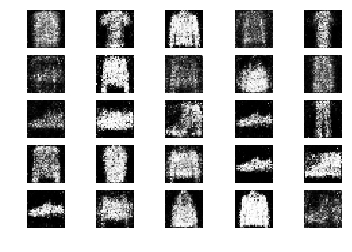

2601 [D loss: 0.706142, acc.: 53.12%] [G loss: 0.961395]
2602 [D loss: 0.668599, acc.: 59.38%] [G loss: 0.999370]
2603 [D loss: 0.633994, acc.: 62.50%] [G loss: 0.908418]
2604 [D loss: 0.628850, acc.: 65.62%] [G loss: 0.919648]
2605 [D loss: 0.667464, acc.: 62.50%] [G loss: 0.871670]
2606 [D loss: 0.627039, acc.: 53.12%] [G loss: 0.818389]
2607 [D loss: 0.596651, acc.: 71.88%] [G loss: 0.908092]
2608 [D loss: 0.594655, acc.: 67.19%] [G loss: 0.922950]
2609 [D loss: 0.628241, acc.: 65.62%] [G loss: 0.893051]
2610 [D loss: 0.649136, acc.: 56.25%] [G loss: 0.919186]
2611 [D loss: 0.667714, acc.: 54.69%] [G loss: 0.942654]
2612 [D loss: 0.640770, acc.: 57.81%] [G loss: 0.939783]
2613 [D loss: 0.615238, acc.: 68.75%] [G loss: 0.860223]
2614 [D loss: 0.681187, acc.: 56.25%] [G loss: 0.929831]
2615 [D loss: 0.671990, acc.: 54.69%] [G loss: 0.858654]
2616 [D loss: 0.645784, acc.: 64.06%] [G loss: 0.834476]
2617 [D loss: 0.659188, acc.: 56.25%] [G loss: 0.944298]
2618 [D loss: 0.649841, acc.: 6

2746 [D loss: 0.641773, acc.: 64.06%] [G loss: 0.899296]
2747 [D loss: 0.670591, acc.: 54.69%] [G loss: 0.876199]
2748 [D loss: 0.578073, acc.: 68.75%] [G loss: 0.996400]
2749 [D loss: 0.666508, acc.: 53.12%] [G loss: 0.928547]
2750 [D loss: 0.677489, acc.: 56.25%] [G loss: 0.879133]
2751 [D loss: 0.694665, acc.: 60.94%] [G loss: 0.870607]
2752 [D loss: 0.638594, acc.: 65.62%] [G loss: 0.920189]
2753 [D loss: 0.613993, acc.: 70.31%] [G loss: 0.956258]
2754 [D loss: 0.646895, acc.: 56.25%] [G loss: 0.883709]
2755 [D loss: 0.636080, acc.: 62.50%] [G loss: 0.821042]
2756 [D loss: 0.692952, acc.: 57.81%] [G loss: 0.917408]
2757 [D loss: 0.662210, acc.: 57.81%] [G loss: 0.914670]
2758 [D loss: 0.630568, acc.: 59.38%] [G loss: 0.862204]
2759 [D loss: 0.588903, acc.: 68.75%] [G loss: 0.879410]
2760 [D loss: 0.569362, acc.: 75.00%] [G loss: 0.918662]
2761 [D loss: 0.683967, acc.: 50.00%] [G loss: 0.879936]
2762 [D loss: 0.637442, acc.: 59.38%] [G loss: 0.935698]
2763 [D loss: 0.677830, acc.: 6

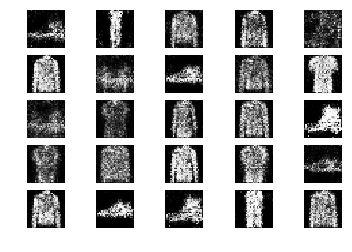

2801 [D loss: 0.637542, acc.: 60.94%] [G loss: 0.823563]
2802 [D loss: 0.641614, acc.: 57.81%] [G loss: 0.894454]
2803 [D loss: 0.631973, acc.: 62.50%] [G loss: 0.860792]
2804 [D loss: 0.716846, acc.: 51.56%] [G loss: 0.837439]
2805 [D loss: 0.574352, acc.: 76.56%] [G loss: 0.896523]
2806 [D loss: 0.682122, acc.: 54.69%] [G loss: 0.876101]
2807 [D loss: 0.613258, acc.: 65.62%] [G loss: 0.922370]
2808 [D loss: 0.702824, acc.: 51.56%] [G loss: 0.870598]
2809 [D loss: 0.650629, acc.: 54.69%] [G loss: 0.964658]
2810 [D loss: 0.564361, acc.: 75.00%] [G loss: 0.920998]
2811 [D loss: 0.604622, acc.: 65.62%] [G loss: 0.903729]
2812 [D loss: 0.617741, acc.: 68.75%] [G loss: 0.875551]
2813 [D loss: 0.637610, acc.: 67.19%] [G loss: 0.924994]
2814 [D loss: 0.701416, acc.: 48.44%] [G loss: 1.013447]
2815 [D loss: 0.568364, acc.: 71.88%] [G loss: 1.037956]
2816 [D loss: 0.633608, acc.: 65.62%] [G loss: 0.911923]
2817 [D loss: 0.698272, acc.: 48.44%] [G loss: 0.847536]
2818 [D loss: 0.698550, acc.: 5

2946 [D loss: 0.627249, acc.: 64.06%] [G loss: 0.899157]
2947 [D loss: 0.597140, acc.: 64.06%] [G loss: 0.884773]
2948 [D loss: 0.557404, acc.: 73.44%] [G loss: 0.892838]
2949 [D loss: 0.677736, acc.: 56.25%] [G loss: 0.954006]
2950 [D loss: 0.630385, acc.: 59.38%] [G loss: 0.907287]
2951 [D loss: 0.606042, acc.: 67.19%] [G loss: 0.952117]
2952 [D loss: 0.650620, acc.: 67.19%] [G loss: 0.859666]
2953 [D loss: 0.645782, acc.: 64.06%] [G loss: 0.860248]
2954 [D loss: 0.589743, acc.: 60.94%] [G loss: 0.991235]
2955 [D loss: 0.634432, acc.: 60.94%] [G loss: 0.923940]
2956 [D loss: 0.652963, acc.: 62.50%] [G loss: 0.944167]
2957 [D loss: 0.635560, acc.: 60.94%] [G loss: 1.014206]
2958 [D loss: 0.652907, acc.: 67.19%] [G loss: 0.913927]
2959 [D loss: 0.605441, acc.: 60.94%] [G loss: 0.964633]
2960 [D loss: 0.682348, acc.: 59.38%] [G loss: 0.958660]
2961 [D loss: 0.598448, acc.: 73.44%] [G loss: 0.912294]
2962 [D loss: 0.578668, acc.: 68.75%] [G loss: 0.908720]
2963 [D loss: 0.601398, acc.: 7

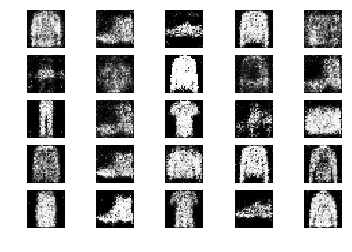

3001 [D loss: 0.629990, acc.: 67.19%] [G loss: 0.904816]
3002 [D loss: 0.629223, acc.: 64.06%] [G loss: 0.969959]
3003 [D loss: 0.760517, acc.: 50.00%] [G loss: 0.894689]
3004 [D loss: 0.704885, acc.: 56.25%] [G loss: 0.924047]
3005 [D loss: 0.600459, acc.: 71.88%] [G loss: 0.948968]
3006 [D loss: 0.601992, acc.: 65.62%] [G loss: 0.906700]
3007 [D loss: 0.596636, acc.: 60.94%] [G loss: 0.922866]
3008 [D loss: 0.682287, acc.: 57.81%] [G loss: 0.896366]
3009 [D loss: 0.583327, acc.: 71.88%] [G loss: 0.876760]
3010 [D loss: 0.588701, acc.: 70.31%] [G loss: 0.867191]
3011 [D loss: 0.665495, acc.: 62.50%] [G loss: 0.861111]
3012 [D loss: 0.603296, acc.: 70.31%] [G loss: 0.902990]
3013 [D loss: 0.606429, acc.: 67.19%] [G loss: 0.877888]
3014 [D loss: 0.685125, acc.: 56.25%] [G loss: 0.824998]
3015 [D loss: 0.635785, acc.: 64.06%] [G loss: 0.877789]
3016 [D loss: 0.703503, acc.: 57.81%] [G loss: 0.831715]
3017 [D loss: 0.657124, acc.: 62.50%] [G loss: 0.891802]
3018 [D loss: 0.572320, acc.: 7

3145 [D loss: 0.635071, acc.: 65.62%] [G loss: 0.923578]
3146 [D loss: 0.601468, acc.: 67.19%] [G loss: 0.888472]
3147 [D loss: 0.640941, acc.: 60.94%] [G loss: 0.927162]
3148 [D loss: 0.658389, acc.: 62.50%] [G loss: 0.901362]
3149 [D loss: 0.609981, acc.: 67.19%] [G loss: 0.923468]
3150 [D loss: 0.682471, acc.: 59.38%] [G loss: 0.841272]
3151 [D loss: 0.622100, acc.: 65.62%] [G loss: 0.873111]
3152 [D loss: 0.630956, acc.: 64.06%] [G loss: 0.915852]
3153 [D loss: 0.645097, acc.: 68.75%] [G loss: 0.876226]
3154 [D loss: 0.575890, acc.: 78.12%] [G loss: 0.877508]
3155 [D loss: 0.681743, acc.: 62.50%] [G loss: 0.848548]
3156 [D loss: 0.664224, acc.: 59.38%] [G loss: 0.847288]
3157 [D loss: 0.651439, acc.: 56.25%] [G loss: 0.870025]
3158 [D loss: 0.578738, acc.: 73.44%] [G loss: 0.873883]
3159 [D loss: 0.642359, acc.: 62.50%] [G loss: 0.938398]
3160 [D loss: 0.600713, acc.: 68.75%] [G loss: 0.941943]
3161 [D loss: 0.621568, acc.: 67.19%] [G loss: 0.927894]
3162 [D loss: 0.636229, acc.: 6

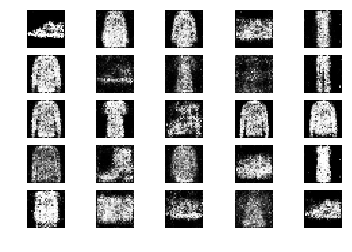

3201 [D loss: 0.585884, acc.: 73.44%] [G loss: 0.891575]
3202 [D loss: 0.657261, acc.: 62.50%] [G loss: 0.852008]
3203 [D loss: 0.614441, acc.: 64.06%] [G loss: 0.856643]
3204 [D loss: 0.714909, acc.: 54.69%] [G loss: 0.877025]
3205 [D loss: 0.620342, acc.: 59.38%] [G loss: 0.909363]
3206 [D loss: 0.578326, acc.: 65.62%] [G loss: 0.840002]
3207 [D loss: 0.756123, acc.: 60.94%] [G loss: 0.880723]
3208 [D loss: 0.629578, acc.: 73.44%] [G loss: 0.919045]
3209 [D loss: 0.600344, acc.: 73.44%] [G loss: 0.884400]
3210 [D loss: 0.642841, acc.: 64.06%] [G loss: 1.019557]
3211 [D loss: 0.587791, acc.: 62.50%] [G loss: 0.933728]
3212 [D loss: 0.616112, acc.: 65.62%] [G loss: 0.932507]
3213 [D loss: 0.623618, acc.: 59.38%] [G loss: 1.037523]
3214 [D loss: 0.682557, acc.: 62.50%] [G loss: 0.978480]
3215 [D loss: 0.641162, acc.: 60.94%] [G loss: 0.973750]
3216 [D loss: 0.659931, acc.: 54.69%] [G loss: 0.934950]
3217 [D loss: 0.604855, acc.: 67.19%] [G loss: 0.905095]
3218 [D loss: 0.649233, acc.: 6

3347 [D loss: 0.686312, acc.: 54.69%] [G loss: 0.908563]
3348 [D loss: 0.609232, acc.: 73.44%] [G loss: 1.011467]
3349 [D loss: 0.559716, acc.: 73.44%] [G loss: 0.977447]
3350 [D loss: 0.691403, acc.: 59.38%] [G loss: 0.884040]
3351 [D loss: 0.685600, acc.: 54.69%] [G loss: 0.958548]
3352 [D loss: 0.636212, acc.: 60.94%] [G loss: 0.865730]
3353 [D loss: 0.593023, acc.: 76.56%] [G loss: 0.929076]
3354 [D loss: 0.628627, acc.: 64.06%] [G loss: 0.817736]
3355 [D loss: 0.593409, acc.: 75.00%] [G loss: 0.846455]
3356 [D loss: 0.676303, acc.: 62.50%] [G loss: 0.930486]
3357 [D loss: 0.626894, acc.: 73.44%] [G loss: 0.904849]
3358 [D loss: 0.656963, acc.: 59.38%] [G loss: 0.891315]
3359 [D loss: 0.621970, acc.: 62.50%] [G loss: 0.912645]
3360 [D loss: 0.647816, acc.: 57.81%] [G loss: 0.901194]
3361 [D loss: 0.624741, acc.: 65.62%] [G loss: 0.912658]
3362 [D loss: 0.645806, acc.: 57.81%] [G loss: 0.917338]
3363 [D loss: 0.668855, acc.: 60.94%] [G loss: 0.950416]
3364 [D loss: 0.623294, acc.: 7

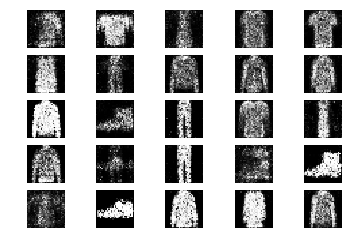

3401 [D loss: 0.696887, acc.: 51.56%] [G loss: 0.935723]
3402 [D loss: 0.683709, acc.: 53.12%] [G loss: 0.832141]
3403 [D loss: 0.658927, acc.: 54.69%] [G loss: 0.893190]
3404 [D loss: 0.598448, acc.: 70.31%] [G loss: 0.967005]
3405 [D loss: 0.604284, acc.: 68.75%] [G loss: 0.809505]
3406 [D loss: 0.656168, acc.: 56.25%] [G loss: 0.891829]
3407 [D loss: 0.631500, acc.: 68.75%] [G loss: 0.873380]
3408 [D loss: 0.631680, acc.: 67.19%] [G loss: 0.888240]
3409 [D loss: 0.635076, acc.: 64.06%] [G loss: 0.945585]
3410 [D loss: 0.732121, acc.: 59.38%] [G loss: 0.820441]
3411 [D loss: 0.609610, acc.: 67.19%] [G loss: 0.924759]
3412 [D loss: 0.694381, acc.: 56.25%] [G loss: 0.892185]
3413 [D loss: 0.607608, acc.: 71.88%] [G loss: 0.965799]
3414 [D loss: 0.660819, acc.: 60.94%] [G loss: 0.871025]
3415 [D loss: 0.627249, acc.: 65.62%] [G loss: 0.925436]
3416 [D loss: 0.629864, acc.: 68.75%] [G loss: 0.841284]
3417 [D loss: 0.652756, acc.: 57.81%] [G loss: 0.952394]
3418 [D loss: 0.651616, acc.: 6

3546 [D loss: 0.725038, acc.: 53.12%] [G loss: 0.896763]
3547 [D loss: 0.660929, acc.: 54.69%] [G loss: 0.901375]
3548 [D loss: 0.574727, acc.: 73.44%] [G loss: 0.904717]
3549 [D loss: 0.629586, acc.: 62.50%] [G loss: 0.834751]
3550 [D loss: 0.588860, acc.: 62.50%] [G loss: 0.832992]
3551 [D loss: 0.675758, acc.: 53.12%] [G loss: 0.848959]
3552 [D loss: 0.600653, acc.: 70.31%] [G loss: 0.924680]
3553 [D loss: 0.627060, acc.: 57.81%] [G loss: 0.812896]
3554 [D loss: 0.596671, acc.: 70.31%] [G loss: 0.932685]
3555 [D loss: 0.667023, acc.: 64.06%] [G loss: 0.876845]
3556 [D loss: 0.639960, acc.: 62.50%] [G loss: 0.861931]
3557 [D loss: 0.603207, acc.: 73.44%] [G loss: 0.906769]
3558 [D loss: 0.581330, acc.: 75.00%] [G loss: 0.857808]
3559 [D loss: 0.601264, acc.: 75.00%] [G loss: 0.991613]
3560 [D loss: 0.606157, acc.: 73.44%] [G loss: 0.910934]
3561 [D loss: 0.699678, acc.: 54.69%] [G loss: 0.975010]
3562 [D loss: 0.623937, acc.: 65.62%] [G loss: 0.933554]
3563 [D loss: 0.621634, acc.: 6

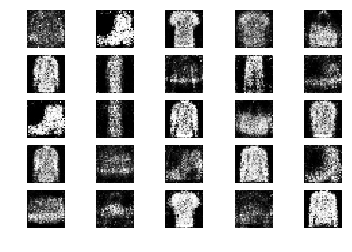

3601 [D loss: 0.725915, acc.: 48.44%] [G loss: 0.833232]
3602 [D loss: 0.645741, acc.: 62.50%] [G loss: 0.874754]
3603 [D loss: 0.628537, acc.: 64.06%] [G loss: 0.834614]
3604 [D loss: 0.599728, acc.: 68.75%] [G loss: 1.013638]
3605 [D loss: 0.699982, acc.: 53.12%] [G loss: 0.969686]
3606 [D loss: 0.622803, acc.: 70.31%] [G loss: 0.977822]
3607 [D loss: 0.649543, acc.: 65.62%] [G loss: 0.940545]
3608 [D loss: 0.632762, acc.: 57.81%] [G loss: 0.890691]
3609 [D loss: 0.684744, acc.: 50.00%] [G loss: 0.831186]
3610 [D loss: 0.668656, acc.: 54.69%] [G loss: 0.933635]
3611 [D loss: 0.597072, acc.: 67.19%] [G loss: 0.885518]
3612 [D loss: 0.641015, acc.: 57.81%] [G loss: 0.837943]
3613 [D loss: 0.623943, acc.: 60.94%] [G loss: 0.913647]
3614 [D loss: 0.619545, acc.: 62.50%] [G loss: 0.869394]
3615 [D loss: 0.603304, acc.: 65.62%] [G loss: 1.018071]
3616 [D loss: 0.668591, acc.: 56.25%] [G loss: 0.974674]
3617 [D loss: 0.656269, acc.: 65.62%] [G loss: 0.930797]
3618 [D loss: 0.667426, acc.: 5

3746 [D loss: 0.621077, acc.: 68.75%] [G loss: 0.895127]
3747 [D loss: 0.612736, acc.: 68.75%] [G loss: 0.974679]
3748 [D loss: 0.619671, acc.: 64.06%] [G loss: 0.864015]
3749 [D loss: 0.680220, acc.: 56.25%] [G loss: 1.019338]
3750 [D loss: 0.632796, acc.: 62.50%] [G loss: 0.921005]
3751 [D loss: 0.619928, acc.: 64.06%] [G loss: 0.912387]
3752 [D loss: 0.661168, acc.: 59.38%] [G loss: 0.882724]
3753 [D loss: 0.567815, acc.: 76.56%] [G loss: 0.945392]
3754 [D loss: 0.583960, acc.: 71.88%] [G loss: 0.898337]
3755 [D loss: 0.627983, acc.: 67.19%] [G loss: 0.893176]
3756 [D loss: 0.612561, acc.: 67.19%] [G loss: 0.967631]
3757 [D loss: 0.706945, acc.: 60.94%] [G loss: 0.898874]
3758 [D loss: 0.700975, acc.: 53.12%] [G loss: 0.941280]
3759 [D loss: 0.651170, acc.: 64.06%] [G loss: 0.929473]
3760 [D loss: 0.622887, acc.: 60.94%] [G loss: 0.944504]
3761 [D loss: 0.666043, acc.: 56.25%] [G loss: 0.896845]
3762 [D loss: 0.610954, acc.: 65.62%] [G loss: 0.985528]
3763 [D loss: 0.705996, acc.: 5

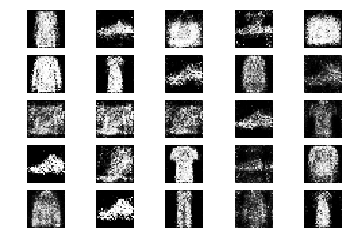

3801 [D loss: 0.646302, acc.: 64.06%] [G loss: 0.938224]
3802 [D loss: 0.665438, acc.: 64.06%] [G loss: 0.880560]
3803 [D loss: 0.638635, acc.: 62.50%] [G loss: 0.922237]
3804 [D loss: 0.614882, acc.: 65.62%] [G loss: 0.977157]
3805 [D loss: 0.655831, acc.: 64.06%] [G loss: 0.913355]
3806 [D loss: 0.625395, acc.: 65.62%] [G loss: 0.985450]
3807 [D loss: 0.711369, acc.: 51.56%] [G loss: 0.918366]
3808 [D loss: 0.606790, acc.: 62.50%] [G loss: 0.908790]
3809 [D loss: 0.619710, acc.: 65.62%] [G loss: 0.907270]
3810 [D loss: 0.635092, acc.: 64.06%] [G loss: 0.797087]
3811 [D loss: 0.670179, acc.: 50.00%] [G loss: 0.887461]
3812 [D loss: 0.598432, acc.: 70.31%] [G loss: 0.869770]
3813 [D loss: 0.635647, acc.: 59.38%] [G loss: 0.903809]
3814 [D loss: 0.689438, acc.: 62.50%] [G loss: 0.911883]
3815 [D loss: 0.585790, acc.: 71.88%] [G loss: 0.843984]
3816 [D loss: 0.676920, acc.: 59.38%] [G loss: 0.881572]
3817 [D loss: 0.626371, acc.: 62.50%] [G loss: 0.911498]
3818 [D loss: 0.715468, acc.: 5

3946 [D loss: 0.693175, acc.: 60.94%] [G loss: 0.906065]
3947 [D loss: 0.632742, acc.: 71.88%] [G loss: 0.929438]
3948 [D loss: 0.673766, acc.: 60.94%] [G loss: 0.965050]
3949 [D loss: 0.692986, acc.: 57.81%] [G loss: 0.956345]
3950 [D loss: 0.623474, acc.: 67.19%] [G loss: 0.911598]
3951 [D loss: 0.649644, acc.: 57.81%] [G loss: 0.947798]
3952 [D loss: 0.644969, acc.: 65.62%] [G loss: 0.960810]
3953 [D loss: 0.609135, acc.: 68.75%] [G loss: 0.918545]
3954 [D loss: 0.659155, acc.: 57.81%] [G loss: 0.889345]
3955 [D loss: 0.625479, acc.: 64.06%] [G loss: 0.832009]
3956 [D loss: 0.613029, acc.: 70.31%] [G loss: 0.877082]
3957 [D loss: 0.699526, acc.: 54.69%] [G loss: 0.818430]
3958 [D loss: 0.660995, acc.: 60.94%] [G loss: 0.899975]
3959 [D loss: 0.628110, acc.: 73.44%] [G loss: 0.862858]
3960 [D loss: 0.610646, acc.: 71.88%] [G loss: 0.904896]
3961 [D loss: 0.623886, acc.: 64.06%] [G loss: 0.803792]
3962 [D loss: 0.652782, acc.: 57.81%] [G loss: 0.893245]
3963 [D loss: 0.641984, acc.: 6

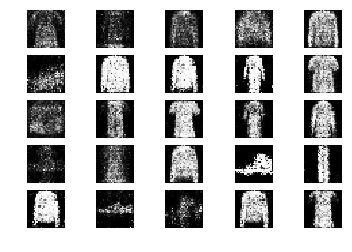

4001 [D loss: 0.685251, acc.: 57.81%] [G loss: 0.911915]
4002 [D loss: 0.707390, acc.: 50.00%] [G loss: 0.808746]
4003 [D loss: 0.675809, acc.: 62.50%] [G loss: 0.878300]
4004 [D loss: 0.638328, acc.: 70.31%] [G loss: 0.907606]
4005 [D loss: 0.634533, acc.: 65.62%] [G loss: 0.893203]
4006 [D loss: 0.621875, acc.: 60.94%] [G loss: 0.974221]
4007 [D loss: 0.674056, acc.: 60.94%] [G loss: 0.900313]
4008 [D loss: 0.655171, acc.: 56.25%] [G loss: 0.944721]
4009 [D loss: 0.673013, acc.: 59.38%] [G loss: 0.856221]
4010 [D loss: 0.661959, acc.: 60.94%] [G loss: 0.863036]
4011 [D loss: 0.624639, acc.: 70.31%] [G loss: 0.965222]
4012 [D loss: 0.625773, acc.: 62.50%] [G loss: 0.942425]
4013 [D loss: 0.647542, acc.: 64.06%] [G loss: 0.878872]
4014 [D loss: 0.615698, acc.: 68.75%] [G loss: 0.937424]
4015 [D loss: 0.664460, acc.: 53.12%] [G loss: 0.943131]
4016 [D loss: 0.625614, acc.: 70.31%] [G loss: 0.891904]
4017 [D loss: 0.649484, acc.: 60.94%] [G loss: 1.034858]
4018 [D loss: 0.636804, acc.: 6

4145 [D loss: 0.675028, acc.: 57.81%] [G loss: 0.857921]
4146 [D loss: 0.700297, acc.: 60.94%] [G loss: 0.892393]
4147 [D loss: 0.664786, acc.: 59.38%] [G loss: 0.905949]
4148 [D loss: 0.586709, acc.: 67.19%] [G loss: 1.002996]
4149 [D loss: 0.628293, acc.: 67.19%] [G loss: 0.895209]
4150 [D loss: 0.729500, acc.: 46.88%] [G loss: 0.865022]
4151 [D loss: 0.676511, acc.: 53.12%] [G loss: 0.903487]
4152 [D loss: 0.624397, acc.: 70.31%] [G loss: 0.893113]
4153 [D loss: 0.661018, acc.: 62.50%] [G loss: 0.859888]
4154 [D loss: 0.560706, acc.: 81.25%] [G loss: 0.907797]
4155 [D loss: 0.640358, acc.: 64.06%] [G loss: 0.908830]
4156 [D loss: 0.692090, acc.: 51.56%] [G loss: 0.891887]
4157 [D loss: 0.653006, acc.: 59.38%] [G loss: 0.918158]
4158 [D loss: 0.614244, acc.: 68.75%] [G loss: 0.949968]
4159 [D loss: 0.616416, acc.: 62.50%] [G loss: 0.903245]
4160 [D loss: 0.631942, acc.: 59.38%] [G loss: 0.988618]
4161 [D loss: 0.583604, acc.: 76.56%] [G loss: 0.882468]
4162 [D loss: 0.724735, acc.: 5

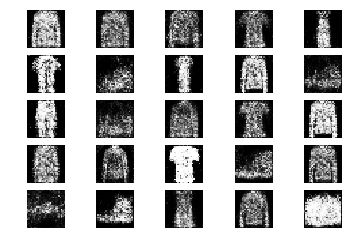

4201 [D loss: 0.671419, acc.: 59.38%] [G loss: 0.846088]
4202 [D loss: 0.643572, acc.: 67.19%] [G loss: 0.922605]
4203 [D loss: 0.633347, acc.: 68.75%] [G loss: 0.842347]
4204 [D loss: 0.661265, acc.: 64.06%] [G loss: 0.910698]
4205 [D loss: 0.669732, acc.: 54.69%] [G loss: 0.944964]
4206 [D loss: 0.651278, acc.: 64.06%] [G loss: 0.948263]
4207 [D loss: 0.555493, acc.: 84.38%] [G loss: 0.915060]
4208 [D loss: 0.640923, acc.: 62.50%] [G loss: 0.892309]
4209 [D loss: 0.601635, acc.: 67.19%] [G loss: 0.985449]
4210 [D loss: 0.668079, acc.: 64.06%] [G loss: 0.944418]
4211 [D loss: 0.605235, acc.: 79.69%] [G loss: 0.865536]
4212 [D loss: 0.617238, acc.: 64.06%] [G loss: 0.868173]
4213 [D loss: 0.642807, acc.: 53.12%] [G loss: 0.838537]
4214 [D loss: 0.671185, acc.: 59.38%] [G loss: 0.858182]
4215 [D loss: 0.550034, acc.: 73.44%] [G loss: 0.900311]
4216 [D loss: 0.606242, acc.: 67.19%] [G loss: 0.977147]
4217 [D loss: 0.680479, acc.: 59.38%] [G loss: 0.900621]
4218 [D loss: 0.654622, acc.: 6

4346 [D loss: 0.660655, acc.: 59.38%] [G loss: 0.911963]
4347 [D loss: 0.587401, acc.: 71.88%] [G loss: 0.870664]
4348 [D loss: 0.627371, acc.: 64.06%] [G loss: 0.909130]
4349 [D loss: 0.686057, acc.: 57.81%] [G loss: 0.881055]
4350 [D loss: 0.616747, acc.: 71.88%] [G loss: 0.914388]
4351 [D loss: 0.638214, acc.: 56.25%] [G loss: 0.897703]
4352 [D loss: 0.592901, acc.: 67.19%] [G loss: 0.842920]
4353 [D loss: 0.691289, acc.: 53.12%] [G loss: 0.911498]
4354 [D loss: 0.641775, acc.: 56.25%] [G loss: 0.883330]
4355 [D loss: 0.638519, acc.: 67.19%] [G loss: 0.874784]
4356 [D loss: 0.632203, acc.: 64.06%] [G loss: 0.851993]
4357 [D loss: 0.616567, acc.: 71.88%] [G loss: 0.874778]
4358 [D loss: 0.650772, acc.: 57.81%] [G loss: 0.894779]
4359 [D loss: 0.680995, acc.: 56.25%] [G loss: 0.826720]
4360 [D loss: 0.655568, acc.: 64.06%] [G loss: 0.893219]
4361 [D loss: 0.739762, acc.: 42.19%] [G loss: 0.891402]
4362 [D loss: 0.655412, acc.: 60.94%] [G loss: 1.069178]
4363 [D loss: 0.655555, acc.: 6

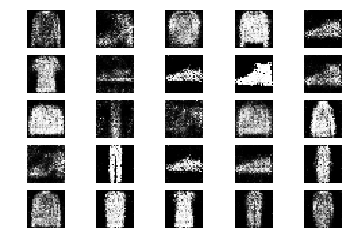

4401 [D loss: 0.671328, acc.: 56.25%] [G loss: 1.081200]
4402 [D loss: 0.683264, acc.: 51.56%] [G loss: 0.941459]
4403 [D loss: 0.735663, acc.: 48.44%] [G loss: 0.980204]
4404 [D loss: 0.590879, acc.: 73.44%] [G loss: 0.831798]
4405 [D loss: 0.629045, acc.: 67.19%] [G loss: 0.860011]
4406 [D loss: 0.600986, acc.: 65.62%] [G loss: 0.871747]
4407 [D loss: 0.660145, acc.: 56.25%] [G loss: 0.893730]
4408 [D loss: 0.632948, acc.: 56.25%] [G loss: 0.939269]
4409 [D loss: 0.642450, acc.: 68.75%] [G loss: 0.940618]
4410 [D loss: 0.641197, acc.: 67.19%] [G loss: 0.945436]
4411 [D loss: 0.634324, acc.: 62.50%] [G loss: 0.892669]
4412 [D loss: 0.574014, acc.: 67.19%] [G loss: 0.890782]
4413 [D loss: 0.589171, acc.: 62.50%] [G loss: 0.928297]
4414 [D loss: 0.699066, acc.: 60.94%] [G loss: 0.876451]
4415 [D loss: 0.614037, acc.: 67.19%] [G loss: 0.806698]
4416 [D loss: 0.643639, acc.: 65.62%] [G loss: 0.883683]
4417 [D loss: 0.580828, acc.: 76.56%] [G loss: 0.966064]
4418 [D loss: 0.601892, acc.: 7

4547 [D loss: 0.636001, acc.: 65.62%] [G loss: 0.911405]
4548 [D loss: 0.671598, acc.: 56.25%] [G loss: 0.905468]
4549 [D loss: 0.610757, acc.: 68.75%] [G loss: 0.916351]
4550 [D loss: 0.609132, acc.: 67.19%] [G loss: 0.895932]
4551 [D loss: 0.636108, acc.: 68.75%] [G loss: 0.937934]
4552 [D loss: 0.586469, acc.: 62.50%] [G loss: 0.930626]
4553 [D loss: 0.616158, acc.: 62.50%] [G loss: 0.988844]
4554 [D loss: 0.700138, acc.: 54.69%] [G loss: 0.943742]
4555 [D loss: 0.668117, acc.: 60.94%] [G loss: 0.868469]
4556 [D loss: 0.618325, acc.: 68.75%] [G loss: 0.921281]
4557 [D loss: 0.686654, acc.: 57.81%] [G loss: 0.885930]
4558 [D loss: 0.695269, acc.: 54.69%] [G loss: 0.939882]
4559 [D loss: 0.616911, acc.: 70.31%] [G loss: 0.945734]
4560 [D loss: 0.711124, acc.: 51.56%] [G loss: 0.868357]
4561 [D loss: 0.574211, acc.: 65.62%] [G loss: 0.951774]
4562 [D loss: 0.680420, acc.: 53.12%] [G loss: 0.920342]
4563 [D loss: 0.674475, acc.: 57.81%] [G loss: 0.859181]
4564 [D loss: 0.651337, acc.: 5

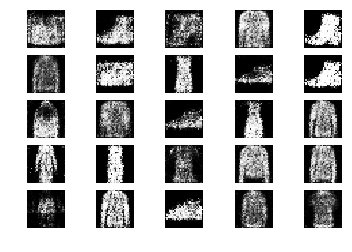

4601 [D loss: 0.685754, acc.: 54.69%] [G loss: 0.831023]
4602 [D loss: 0.597761, acc.: 75.00%] [G loss: 0.867811]
4603 [D loss: 0.652947, acc.: 65.62%] [G loss: 1.004893]
4604 [D loss: 0.633698, acc.: 64.06%] [G loss: 0.936129]
4605 [D loss: 0.645904, acc.: 57.81%] [G loss: 0.991294]
4606 [D loss: 0.704338, acc.: 53.12%] [G loss: 0.889297]
4607 [D loss: 0.663477, acc.: 51.56%] [G loss: 0.897549]
4608 [D loss: 0.588309, acc.: 68.75%] [G loss: 0.937084]
4609 [D loss: 0.630283, acc.: 68.75%] [G loss: 0.941810]
4610 [D loss: 0.640358, acc.: 67.19%] [G loss: 0.950157]
4611 [D loss: 0.699486, acc.: 56.25%] [G loss: 0.890743]
4612 [D loss: 0.657578, acc.: 64.06%] [G loss: 0.830119]
4613 [D loss: 0.653257, acc.: 60.94%] [G loss: 0.892058]
4614 [D loss: 0.620771, acc.: 68.75%] [G loss: 0.927672]
4615 [D loss: 0.648666, acc.: 59.38%] [G loss: 0.960437]
4616 [D loss: 0.628004, acc.: 65.62%] [G loss: 0.958964]
4617 [D loss: 0.691988, acc.: 51.56%] [G loss: 0.886700]
4618 [D loss: 0.645868, acc.: 6

4746 [D loss: 0.672067, acc.: 62.50%] [G loss: 0.948550]
4747 [D loss: 0.641793, acc.: 64.06%] [G loss: 0.952896]
4748 [D loss: 0.636063, acc.: 65.62%] [G loss: 0.852768]
4749 [D loss: 0.652390, acc.: 64.06%] [G loss: 0.893800]
4750 [D loss: 0.663986, acc.: 56.25%] [G loss: 0.860810]
4751 [D loss: 0.645291, acc.: 64.06%] [G loss: 0.980580]
4752 [D loss: 0.628098, acc.: 64.06%] [G loss: 0.925266]
4753 [D loss: 0.643030, acc.: 67.19%] [G loss: 0.918971]
4754 [D loss: 0.643108, acc.: 70.31%] [G loss: 0.854502]
4755 [D loss: 0.653213, acc.: 56.25%] [G loss: 0.913316]
4756 [D loss: 0.681015, acc.: 53.12%] [G loss: 0.901610]
4757 [D loss: 0.613516, acc.: 67.19%] [G loss: 0.994455]
4758 [D loss: 0.644482, acc.: 62.50%] [G loss: 0.955676]
4759 [D loss: 0.655538, acc.: 64.06%] [G loss: 0.975005]
4760 [D loss: 0.648282, acc.: 67.19%] [G loss: 0.881151]
4761 [D loss: 0.637098, acc.: 57.81%] [G loss: 0.879069]
4762 [D loss: 0.650751, acc.: 64.06%] [G loss: 0.935265]
4763 [D loss: 0.700662, acc.: 5

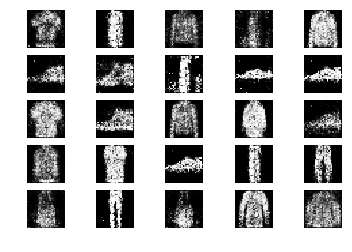

4801 [D loss: 0.624698, acc.: 64.06%] [G loss: 0.946329]
4802 [D loss: 0.626313, acc.: 64.06%] [G loss: 0.856154]
4803 [D loss: 0.644692, acc.: 64.06%] [G loss: 0.949199]
4804 [D loss: 0.642804, acc.: 68.75%] [G loss: 0.897923]
4805 [D loss: 0.628820, acc.: 65.62%] [G loss: 0.873182]
4806 [D loss: 0.699856, acc.: 56.25%] [G loss: 0.864790]
4807 [D loss: 0.669508, acc.: 59.38%] [G loss: 0.966340]
4808 [D loss: 0.637014, acc.: 62.50%] [G loss: 0.918383]
4809 [D loss: 0.593058, acc.: 65.62%] [G loss: 0.959258]
4810 [D loss: 0.718387, acc.: 54.69%] [G loss: 0.974090]
4811 [D loss: 0.650838, acc.: 60.94%] [G loss: 0.831612]
4812 [D loss: 0.637930, acc.: 64.06%] [G loss: 0.911775]
4813 [D loss: 0.677000, acc.: 59.38%] [G loss: 0.888947]
4814 [D loss: 0.639143, acc.: 68.75%] [G loss: 0.945248]
4815 [D loss: 0.646306, acc.: 60.94%] [G loss: 0.895186]
4816 [D loss: 0.589489, acc.: 71.88%] [G loss: 0.860661]
4817 [D loss: 0.632457, acc.: 60.94%] [G loss: 0.872980]
4818 [D loss: 0.697992, acc.: 5

4947 [D loss: 0.639854, acc.: 62.50%] [G loss: 0.828580]
4948 [D loss: 0.600246, acc.: 64.06%] [G loss: 0.874989]
4949 [D loss: 0.583306, acc.: 71.88%] [G loss: 0.928336]
4950 [D loss: 0.640739, acc.: 65.62%] [G loss: 0.968941]
4951 [D loss: 0.668795, acc.: 57.81%] [G loss: 0.880519]
4952 [D loss: 0.660424, acc.: 59.38%] [G loss: 0.894163]
4953 [D loss: 0.635081, acc.: 68.75%] [G loss: 0.949856]
4954 [D loss: 0.662609, acc.: 60.94%] [G loss: 0.923135]
4955 [D loss: 0.596827, acc.: 70.31%] [G loss: 1.023665]
4956 [D loss: 0.611822, acc.: 71.88%] [G loss: 0.952753]
4957 [D loss: 0.640941, acc.: 62.50%] [G loss: 0.925910]
4958 [D loss: 0.623949, acc.: 65.62%] [G loss: 0.888613]
4959 [D loss: 0.642401, acc.: 62.50%] [G loss: 0.881323]
4960 [D loss: 0.637470, acc.: 62.50%] [G loss: 0.793113]
4961 [D loss: 0.651525, acc.: 68.75%] [G loss: 0.887638]
4962 [D loss: 0.619388, acc.: 62.50%] [G loss: 0.875692]
4963 [D loss: 0.625249, acc.: 70.31%] [G loss: 0.836709]
4964 [D loss: 0.610399, acc.: 7

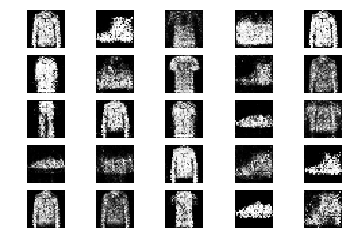

5001 [D loss: 0.630536, acc.: 59.38%] [G loss: 0.920708]
5002 [D loss: 0.645063, acc.: 60.94%] [G loss: 0.890581]
5003 [D loss: 0.646054, acc.: 68.75%] [G loss: 0.898476]
5004 [D loss: 0.638923, acc.: 62.50%] [G loss: 0.883311]
5005 [D loss: 0.619008, acc.: 70.31%] [G loss: 0.871142]
5006 [D loss: 0.589963, acc.: 62.50%] [G loss: 0.911528]
5007 [D loss: 0.631316, acc.: 64.06%] [G loss: 0.931661]
5008 [D loss: 0.656924, acc.: 62.50%] [G loss: 0.852518]
5009 [D loss: 0.672975, acc.: 60.94%] [G loss: 0.852616]
5010 [D loss: 0.605214, acc.: 67.19%] [G loss: 0.925513]
5011 [D loss: 0.630243, acc.: 59.38%] [G loss: 0.992766]
5012 [D loss: 0.635539, acc.: 59.38%] [G loss: 0.877755]
5013 [D loss: 0.638345, acc.: 67.19%] [G loss: 0.914713]
5014 [D loss: 0.657948, acc.: 56.25%] [G loss: 0.950624]
5015 [D loss: 0.651780, acc.: 59.38%] [G loss: 0.882525]
5016 [D loss: 0.684710, acc.: 57.81%] [G loss: 0.922620]
5017 [D loss: 0.622904, acc.: 57.81%] [G loss: 0.813433]
5018 [D loss: 0.650172, acc.: 6

5146 [D loss: 0.572193, acc.: 73.44%] [G loss: 0.890162]
5147 [D loss: 0.735803, acc.: 46.88%] [G loss: 0.839779]
5148 [D loss: 0.672764, acc.: 59.38%] [G loss: 0.902116]
5149 [D loss: 0.658596, acc.: 60.94%] [G loss: 0.931334]
5150 [D loss: 0.605488, acc.: 67.19%] [G loss: 0.920225]
5151 [D loss: 0.778382, acc.: 43.75%] [G loss: 0.828523]
5152 [D loss: 0.610266, acc.: 78.12%] [G loss: 0.973734]
5153 [D loss: 0.712223, acc.: 50.00%] [G loss: 0.893137]
5154 [D loss: 0.660204, acc.: 57.81%] [G loss: 0.895575]
5155 [D loss: 0.623940, acc.: 67.19%] [G loss: 0.871091]
5156 [D loss: 0.633824, acc.: 67.19%] [G loss: 0.925150]
5157 [D loss: 0.733244, acc.: 50.00%] [G loss: 0.966978]
5158 [D loss: 0.636320, acc.: 70.31%] [G loss: 0.978561]
5159 [D loss: 0.654000, acc.: 62.50%] [G loss: 0.934995]
5160 [D loss: 0.692154, acc.: 50.00%] [G loss: 0.972904]
5161 [D loss: 0.650392, acc.: 60.94%] [G loss: 0.834596]
5162 [D loss: 0.693351, acc.: 51.56%] [G loss: 0.974875]
5163 [D loss: 0.648487, acc.: 5

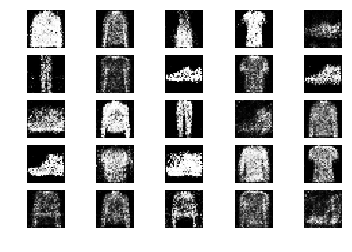

5201 [D loss: 0.685367, acc.: 56.25%] [G loss: 0.911318]
5202 [D loss: 0.597560, acc.: 75.00%] [G loss: 0.927374]
5203 [D loss: 0.626348, acc.: 65.62%] [G loss: 0.984527]
5204 [D loss: 0.625545, acc.: 68.75%] [G loss: 0.930707]
5205 [D loss: 0.570706, acc.: 73.44%] [G loss: 0.916984]
5206 [D loss: 0.651221, acc.: 60.94%] [G loss: 0.788924]
5207 [D loss: 0.642472, acc.: 57.81%] [G loss: 0.888609]
5208 [D loss: 0.641765, acc.: 59.38%] [G loss: 0.906210]
5209 [D loss: 0.587790, acc.: 68.75%] [G loss: 0.916067]
5210 [D loss: 0.601737, acc.: 68.75%] [G loss: 0.946276]
5211 [D loss: 0.611534, acc.: 67.19%] [G loss: 0.851731]
5212 [D loss: 0.611689, acc.: 62.50%] [G loss: 0.843331]
5213 [D loss: 0.566853, acc.: 75.00%] [G loss: 0.967480]
5214 [D loss: 0.626886, acc.: 60.94%] [G loss: 0.905297]
5215 [D loss: 0.635690, acc.: 56.25%] [G loss: 0.905638]
5216 [D loss: 0.617887, acc.: 60.94%] [G loss: 0.854500]
5217 [D loss: 0.624419, acc.: 60.94%] [G loss: 0.870539]
5218 [D loss: 0.595309, acc.: 6

5345 [D loss: 0.609426, acc.: 64.06%] [G loss: 0.951235]
5346 [D loss: 0.637381, acc.: 62.50%] [G loss: 1.033418]
5347 [D loss: 0.687277, acc.: 59.38%] [G loss: 0.905757]
5348 [D loss: 0.725600, acc.: 57.81%] [G loss: 0.830157]
5349 [D loss: 0.664549, acc.: 59.38%] [G loss: 0.927700]
5350 [D loss: 0.642435, acc.: 57.81%] [G loss: 0.910029]
5351 [D loss: 0.660111, acc.: 59.38%] [G loss: 0.903140]
5352 [D loss: 0.606332, acc.: 70.31%] [G loss: 0.870452]
5353 [D loss: 0.651523, acc.: 62.50%] [G loss: 0.892237]
5354 [D loss: 0.654127, acc.: 56.25%] [G loss: 0.948830]
5355 [D loss: 0.655022, acc.: 64.06%] [G loss: 0.921087]
5356 [D loss: 0.599793, acc.: 65.62%] [G loss: 0.932648]
5357 [D loss: 0.648029, acc.: 64.06%] [G loss: 0.890449]
5358 [D loss: 0.629898, acc.: 65.62%] [G loss: 0.884934]
5359 [D loss: 0.629277, acc.: 62.50%] [G loss: 0.918935]
5360 [D loss: 0.645068, acc.: 65.62%] [G loss: 0.914287]
5361 [D loss: 0.610954, acc.: 65.62%] [G loss: 0.917355]
5362 [D loss: 0.613862, acc.: 6

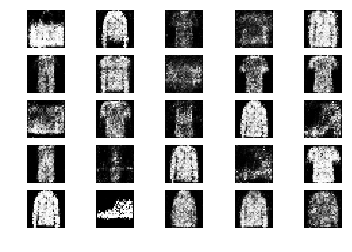

5401 [D loss: 0.663052, acc.: 60.94%] [G loss: 0.854559]
5402 [D loss: 0.660453, acc.: 65.62%] [G loss: 0.929027]
5403 [D loss: 0.646769, acc.: 59.38%] [G loss: 0.843128]
5404 [D loss: 0.646236, acc.: 56.25%] [G loss: 0.942280]
5405 [D loss: 0.734081, acc.: 51.56%] [G loss: 0.927669]
5406 [D loss: 0.665049, acc.: 56.25%] [G loss: 0.949117]
5407 [D loss: 0.654941, acc.: 57.81%] [G loss: 0.899620]
5408 [D loss: 0.639670, acc.: 60.94%] [G loss: 0.835340]
5409 [D loss: 0.653932, acc.: 60.94%] [G loss: 0.858688]
5410 [D loss: 0.651371, acc.: 62.50%] [G loss: 0.914366]
5411 [D loss: 0.597240, acc.: 68.75%] [G loss: 0.879313]
5412 [D loss: 0.598906, acc.: 73.44%] [G loss: 1.008771]
5413 [D loss: 0.683772, acc.: 64.06%] [G loss: 0.997896]
5414 [D loss: 0.629137, acc.: 68.75%] [G loss: 0.861754]
5415 [D loss: 0.654703, acc.: 60.94%] [G loss: 0.958196]
5416 [D loss: 0.659681, acc.: 65.62%] [G loss: 0.861855]
5417 [D loss: 0.656647, acc.: 62.50%] [G loss: 0.831853]
5418 [D loss: 0.671057, acc.: 6

5548 [D loss: 0.597056, acc.: 73.44%] [G loss: 0.830873]
5549 [D loss: 0.600765, acc.: 71.88%] [G loss: 0.903818]
5550 [D loss: 0.707388, acc.: 57.81%] [G loss: 0.865380]
5551 [D loss: 0.626171, acc.: 62.50%] [G loss: 0.883175]
5552 [D loss: 0.617787, acc.: 68.75%] [G loss: 0.821618]
5553 [D loss: 0.654119, acc.: 60.94%] [G loss: 0.908428]
5554 [D loss: 0.610863, acc.: 71.88%] [G loss: 0.915482]
5555 [D loss: 0.635660, acc.: 67.19%] [G loss: 0.850992]
5556 [D loss: 0.649477, acc.: 56.25%] [G loss: 0.805745]
5557 [D loss: 0.709401, acc.: 59.38%] [G loss: 0.896740]
5558 [D loss: 0.667534, acc.: 53.12%] [G loss: 0.805648]
5559 [D loss: 0.618515, acc.: 67.19%] [G loss: 0.892300]
5560 [D loss: 0.648407, acc.: 64.06%] [G loss: 0.808923]
5561 [D loss: 0.607153, acc.: 71.88%] [G loss: 0.950693]
5562 [D loss: 0.627176, acc.: 67.19%] [G loss: 0.846873]
5563 [D loss: 0.692898, acc.: 57.81%] [G loss: 0.914697]
5564 [D loss: 0.582528, acc.: 68.75%] [G loss: 0.959005]
5565 [D loss: 0.767115, acc.: 4

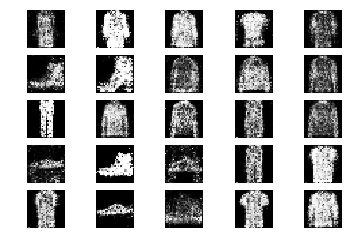

5601 [D loss: 0.632991, acc.: 71.88%] [G loss: 0.794882]
5602 [D loss: 0.646724, acc.: 64.06%] [G loss: 0.929126]
5603 [D loss: 0.676298, acc.: 60.94%] [G loss: 0.840283]
5604 [D loss: 0.603041, acc.: 65.62%] [G loss: 0.873238]
5605 [D loss: 0.718215, acc.: 54.69%] [G loss: 0.852952]
5606 [D loss: 0.643674, acc.: 67.19%] [G loss: 0.893587]
5607 [D loss: 0.647530, acc.: 59.38%] [G loss: 0.962296]
5608 [D loss: 0.687443, acc.: 59.38%] [G loss: 0.935190]
5609 [D loss: 0.632656, acc.: 67.19%] [G loss: 1.040356]
5610 [D loss: 0.705202, acc.: 54.69%] [G loss: 0.926674]
5611 [D loss: 0.665245, acc.: 62.50%] [G loss: 0.872997]
5612 [D loss: 0.601557, acc.: 65.62%] [G loss: 0.981059]
5613 [D loss: 0.656690, acc.: 57.81%] [G loss: 0.955460]
5614 [D loss: 0.635887, acc.: 67.19%] [G loss: 0.954745]
5615 [D loss: 0.622084, acc.: 67.19%] [G loss: 0.952568]
5616 [D loss: 0.628036, acc.: 67.19%] [G loss: 1.014235]
5617 [D loss: 0.642058, acc.: 60.94%] [G loss: 0.932689]
5618 [D loss: 0.611610, acc.: 6

5745 [D loss: 0.630850, acc.: 62.50%] [G loss: 0.902326]
5746 [D loss: 0.649326, acc.: 56.25%] [G loss: 0.940747]
5747 [D loss: 0.731706, acc.: 54.69%] [G loss: 0.996346]
5748 [D loss: 0.641210, acc.: 53.12%] [G loss: 0.949230]
5749 [D loss: 0.684630, acc.: 59.38%] [G loss: 0.927448]
5750 [D loss: 0.664517, acc.: 60.94%] [G loss: 0.866190]
5751 [D loss: 0.619008, acc.: 70.31%] [G loss: 0.912013]
5752 [D loss: 0.679785, acc.: 56.25%] [G loss: 0.860446]
5753 [D loss: 0.677179, acc.: 56.25%] [G loss: 0.960917]
5754 [D loss: 0.701337, acc.: 53.12%] [G loss: 0.960257]
5755 [D loss: 0.663671, acc.: 65.62%] [G loss: 0.882743]
5756 [D loss: 0.623832, acc.: 57.81%] [G loss: 0.955857]
5757 [D loss: 0.716371, acc.: 51.56%] [G loss: 0.879331]
5758 [D loss: 0.618879, acc.: 68.75%] [G loss: 0.803939]
5759 [D loss: 0.657319, acc.: 64.06%] [G loss: 0.829279]
5760 [D loss: 0.707545, acc.: 48.44%] [G loss: 0.820122]
5761 [D loss: 0.664532, acc.: 54.69%] [G loss: 0.806838]
5762 [D loss: 0.620054, acc.: 6

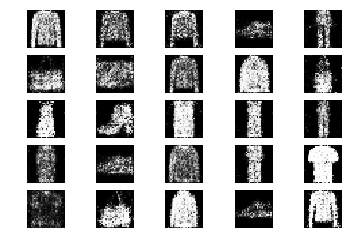

5801 [D loss: 0.642275, acc.: 65.62%] [G loss: 0.860263]
5802 [D loss: 0.651131, acc.: 59.38%] [G loss: 0.996291]
5803 [D loss: 0.649221, acc.: 67.19%] [G loss: 0.943590]
5804 [D loss: 0.609253, acc.: 65.62%] [G loss: 0.845648]
5805 [D loss: 0.677273, acc.: 56.25%] [G loss: 0.836686]
5806 [D loss: 0.665747, acc.: 64.06%] [G loss: 0.943148]
5807 [D loss: 0.656697, acc.: 62.50%] [G loss: 0.816204]
5808 [D loss: 0.634871, acc.: 64.06%] [G loss: 0.848903]
5809 [D loss: 0.643476, acc.: 64.06%] [G loss: 0.888411]
5810 [D loss: 0.620362, acc.: 68.75%] [G loss: 0.904684]
5811 [D loss: 0.625445, acc.: 64.06%] [G loss: 0.807374]
5812 [D loss: 0.663597, acc.: 54.69%] [G loss: 0.824653]
5813 [D loss: 0.652137, acc.: 67.19%] [G loss: 0.923687]
5814 [D loss: 0.581533, acc.: 70.31%] [G loss: 0.871029]
5815 [D loss: 0.627042, acc.: 60.94%] [G loss: 0.896757]
5816 [D loss: 0.675209, acc.: 53.12%] [G loss: 0.920426]
5817 [D loss: 0.713760, acc.: 48.44%] [G loss: 0.933656]
5818 [D loss: 0.629230, acc.: 6

5946 [D loss: 0.672101, acc.: 57.81%] [G loss: 0.996951]
5947 [D loss: 0.640954, acc.: 59.38%] [G loss: 0.877173]
5948 [D loss: 0.654181, acc.: 64.06%] [G loss: 0.872059]
5949 [D loss: 0.682977, acc.: 54.69%] [G loss: 0.787585]
5950 [D loss: 0.649286, acc.: 67.19%] [G loss: 0.848905]
5951 [D loss: 0.605396, acc.: 70.31%] [G loss: 0.847139]
5952 [D loss: 0.625492, acc.: 59.38%] [G loss: 0.954022]
5953 [D loss: 0.673107, acc.: 59.38%] [G loss: 0.943941]
5954 [D loss: 0.722755, acc.: 54.69%] [G loss: 0.873226]
5955 [D loss: 0.626456, acc.: 57.81%] [G loss: 0.924177]
5956 [D loss: 0.688793, acc.: 64.06%] [G loss: 0.942270]
5957 [D loss: 0.668399, acc.: 57.81%] [G loss: 1.031202]
5958 [D loss: 0.647509, acc.: 62.50%] [G loss: 0.991333]
5959 [D loss: 0.605026, acc.: 70.31%] [G loss: 0.945601]
5960 [D loss: 0.606272, acc.: 67.19%] [G loss: 0.912171]
5961 [D loss: 0.632838, acc.: 62.50%] [G loss: 0.909827]
5962 [D loss: 0.657551, acc.: 62.50%] [G loss: 0.787268]
5963 [D loss: 0.637040, acc.: 6

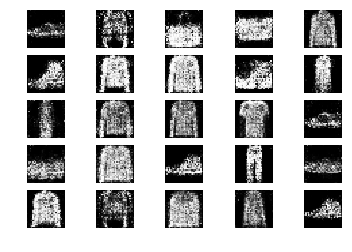

6001 [D loss: 0.679308, acc.: 57.81%] [G loss: 0.928002]
6002 [D loss: 0.634624, acc.: 60.94%] [G loss: 0.937040]
6003 [D loss: 0.737606, acc.: 48.44%] [G loss: 0.930861]
6004 [D loss: 0.689263, acc.: 53.12%] [G loss: 0.799052]
6005 [D loss: 0.628948, acc.: 60.94%] [G loss: 0.887019]
6006 [D loss: 0.637515, acc.: 56.25%] [G loss: 0.972904]
6007 [D loss: 0.617975, acc.: 67.19%] [G loss: 0.993131]
6008 [D loss: 0.632322, acc.: 68.75%] [G loss: 0.991356]
6009 [D loss: 0.656289, acc.: 59.38%] [G loss: 0.945132]
6010 [D loss: 0.606821, acc.: 68.75%] [G loss: 0.989246]
6011 [D loss: 0.623314, acc.: 68.75%] [G loss: 0.942741]
6012 [D loss: 0.681125, acc.: 68.75%] [G loss: 0.863405]
6013 [D loss: 0.700803, acc.: 48.44%] [G loss: 0.913844]
6014 [D loss: 0.652091, acc.: 56.25%] [G loss: 0.950689]
6015 [D loss: 0.635918, acc.: 68.75%] [G loss: 0.819627]
6016 [D loss: 0.657977, acc.: 60.94%] [G loss: 0.856158]
6017 [D loss: 0.649632, acc.: 62.50%] [G loss: 0.860817]
6018 [D loss: 0.640266, acc.: 6

6148 [D loss: 0.627526, acc.: 62.50%] [G loss: 0.913473]
6149 [D loss: 0.656216, acc.: 65.62%] [G loss: 0.962192]
6150 [D loss: 0.685318, acc.: 56.25%] [G loss: 0.957695]
6151 [D loss: 0.617023, acc.: 67.19%] [G loss: 0.891203]
6152 [D loss: 0.685892, acc.: 53.12%] [G loss: 0.907893]
6153 [D loss: 0.628914, acc.: 71.88%] [G loss: 0.977471]
6154 [D loss: 0.666961, acc.: 59.38%] [G loss: 0.894363]
6155 [D loss: 0.630139, acc.: 71.88%] [G loss: 0.885053]
6156 [D loss: 0.680824, acc.: 60.94%] [G loss: 0.879558]
6157 [D loss: 0.579445, acc.: 71.88%] [G loss: 0.839729]
6158 [D loss: 0.668025, acc.: 59.38%] [G loss: 0.875156]
6159 [D loss: 0.626461, acc.: 60.94%] [G loss: 0.827340]
6160 [D loss: 0.596404, acc.: 76.56%] [G loss: 0.916967]
6161 [D loss: 0.710402, acc.: 48.44%] [G loss: 0.942775]
6162 [D loss: 0.617961, acc.: 64.06%] [G loss: 0.910492]
6163 [D loss: 0.672108, acc.: 60.94%] [G loss: 0.884207]
6164 [D loss: 0.589981, acc.: 68.75%] [G loss: 0.859291]
6165 [D loss: 0.596942, acc.: 6

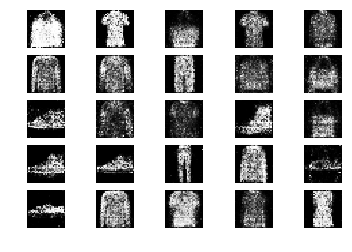

6201 [D loss: 0.665207, acc.: 57.81%] [G loss: 0.895551]
6202 [D loss: 0.718152, acc.: 51.56%] [G loss: 0.808974]
6203 [D loss: 0.667547, acc.: 53.12%] [G loss: 0.917463]
6204 [D loss: 0.661619, acc.: 60.94%] [G loss: 0.853556]
6205 [D loss: 0.702215, acc.: 54.69%] [G loss: 0.919139]
6206 [D loss: 0.645358, acc.: 67.19%] [G loss: 0.877089]
6207 [D loss: 0.631281, acc.: 57.81%] [G loss: 0.961647]
6208 [D loss: 0.644249, acc.: 56.25%] [G loss: 0.904355]
6209 [D loss: 0.682351, acc.: 57.81%] [G loss: 0.921763]
6210 [D loss: 0.650336, acc.: 60.94%] [G loss: 0.942567]
6211 [D loss: 0.684321, acc.: 57.81%] [G loss: 0.958224]
6212 [D loss: 0.656667, acc.: 59.38%] [G loss: 0.997578]
6213 [D loss: 0.720873, acc.: 48.44%] [G loss: 0.920623]
6214 [D loss: 0.597950, acc.: 67.19%] [G loss: 0.922067]
6215 [D loss: 0.635537, acc.: 64.06%] [G loss: 0.828919]
6216 [D loss: 0.663870, acc.: 57.81%] [G loss: 0.904309]
6217 [D loss: 0.672217, acc.: 48.44%] [G loss: 0.803761]
6218 [D loss: 0.654956, acc.: 6

6348 [D loss: 0.704893, acc.: 56.25%] [G loss: 0.956540]
6349 [D loss: 0.692276, acc.: 50.00%] [G loss: 0.857287]
6350 [D loss: 0.632665, acc.: 65.62%] [G loss: 0.872169]
6351 [D loss: 0.641576, acc.: 62.50%] [G loss: 0.868752]
6352 [D loss: 0.686377, acc.: 57.81%] [G loss: 0.853894]
6353 [D loss: 0.667091, acc.: 65.62%] [G loss: 0.850666]
6354 [D loss: 0.640111, acc.: 56.25%] [G loss: 0.934597]
6355 [D loss: 0.680480, acc.: 56.25%] [G loss: 0.833458]
6356 [D loss: 0.630618, acc.: 67.19%] [G loss: 0.859748]
6357 [D loss: 0.695463, acc.: 53.12%] [G loss: 0.881865]
6358 [D loss: 0.697285, acc.: 57.81%] [G loss: 0.844324]
6359 [D loss: 0.683938, acc.: 59.38%] [G loss: 0.781358]
6360 [D loss: 0.609219, acc.: 67.19%] [G loss: 0.850570]
6361 [D loss: 0.658110, acc.: 59.38%] [G loss: 0.800271]
6362 [D loss: 0.679252, acc.: 54.69%] [G loss: 0.803741]
6363 [D loss: 0.637614, acc.: 64.06%] [G loss: 0.805193]
6364 [D loss: 0.606849, acc.: 68.75%] [G loss: 0.900272]
6365 [D loss: 0.636698, acc.: 6

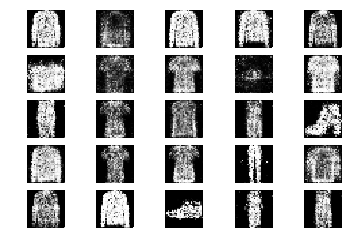

6401 [D loss: 0.631448, acc.: 67.19%] [G loss: 0.881789]
6402 [D loss: 0.599221, acc.: 65.62%] [G loss: 0.871576]
6403 [D loss: 0.651866, acc.: 64.06%] [G loss: 0.862507]
6404 [D loss: 0.619604, acc.: 60.94%] [G loss: 0.893063]
6405 [D loss: 0.644455, acc.: 64.06%] [G loss: 0.961853]
6406 [D loss: 0.575117, acc.: 81.25%] [G loss: 0.850901]
6407 [D loss: 0.651962, acc.: 62.50%] [G loss: 0.848480]
6408 [D loss: 0.609548, acc.: 64.06%] [G loss: 0.891168]
6409 [D loss: 0.658979, acc.: 53.12%] [G loss: 0.898584]
6410 [D loss: 0.709584, acc.: 53.12%] [G loss: 0.867166]
6411 [D loss: 0.689262, acc.: 57.81%] [G loss: 0.943493]
6412 [D loss: 0.650218, acc.: 70.31%] [G loss: 1.000189]
6413 [D loss: 0.598698, acc.: 70.31%] [G loss: 0.923029]
6414 [D loss: 0.629354, acc.: 59.38%] [G loss: 0.857800]
6415 [D loss: 0.662639, acc.: 62.50%] [G loss: 0.926921]
6416 [D loss: 0.693598, acc.: 48.44%] [G loss: 0.798628]
6417 [D loss: 0.604168, acc.: 68.75%] [G loss: 0.927909]
6418 [D loss: 0.634864, acc.: 6

6546 [D loss: 0.659189, acc.: 62.50%] [G loss: 0.981437]
6547 [D loss: 0.647017, acc.: 62.50%] [G loss: 0.969118]
6548 [D loss: 0.657321, acc.: 57.81%] [G loss: 0.952211]
6549 [D loss: 0.659117, acc.: 59.38%] [G loss: 0.960542]
6550 [D loss: 0.657624, acc.: 59.38%] [G loss: 0.926249]
6551 [D loss: 0.642015, acc.: 65.62%] [G loss: 0.849175]
6552 [D loss: 0.624143, acc.: 67.19%] [G loss: 0.872727]
6553 [D loss: 0.656562, acc.: 51.56%] [G loss: 0.865117]
6554 [D loss: 0.642257, acc.: 64.06%] [G loss: 0.929072]
6555 [D loss: 0.662729, acc.: 54.69%] [G loss: 0.874642]
6556 [D loss: 0.633856, acc.: 64.06%] [G loss: 0.836377]
6557 [D loss: 0.689874, acc.: 57.81%] [G loss: 0.920303]
6558 [D loss: 0.640802, acc.: 60.94%] [G loss: 0.745303]
6559 [D loss: 0.659646, acc.: 60.94%] [G loss: 0.867406]
6560 [D loss: 0.641827, acc.: 65.62%] [G loss: 1.000201]
6561 [D loss: 0.634220, acc.: 64.06%] [G loss: 0.903459]
6562 [D loss: 0.642372, acc.: 64.06%] [G loss: 0.874216]
6563 [D loss: 0.697734, acc.: 5

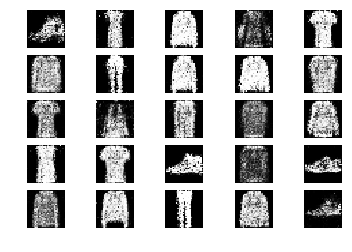

6601 [D loss: 0.598586, acc.: 75.00%] [G loss: 0.835251]
6602 [D loss: 0.628910, acc.: 64.06%] [G loss: 0.802939]
6603 [D loss: 0.610597, acc.: 68.75%] [G loss: 0.880142]
6604 [D loss: 0.684529, acc.: 53.12%] [G loss: 0.862259]
6605 [D loss: 0.668003, acc.: 62.50%] [G loss: 0.880444]
6606 [D loss: 0.638483, acc.: 62.50%] [G loss: 0.941678]
6607 [D loss: 0.705800, acc.: 51.56%] [G loss: 0.886908]
6608 [D loss: 0.669003, acc.: 57.81%] [G loss: 0.914723]
6609 [D loss: 0.611273, acc.: 73.44%] [G loss: 0.956421]
6610 [D loss: 0.653224, acc.: 62.50%] [G loss: 0.913520]
6611 [D loss: 0.619741, acc.: 68.75%] [G loss: 0.882492]
6612 [D loss: 0.697633, acc.: 51.56%] [G loss: 0.886480]
6613 [D loss: 0.675761, acc.: 57.81%] [G loss: 0.895662]
6614 [D loss: 0.690597, acc.: 59.38%] [G loss: 0.864527]
6615 [D loss: 0.703586, acc.: 53.12%] [G loss: 0.875189]
6616 [D loss: 0.671904, acc.: 54.69%] [G loss: 0.904235]
6617 [D loss: 0.600836, acc.: 68.75%] [G loss: 0.831877]
6618 [D loss: 0.613338, acc.: 6

6748 [D loss: 0.593347, acc.: 64.06%] [G loss: 0.910903]
6749 [D loss: 0.667048, acc.: 59.38%] [G loss: 0.938848]
6750 [D loss: 0.671225, acc.: 60.94%] [G loss: 0.958854]
6751 [D loss: 0.688410, acc.: 59.38%] [G loss: 0.921687]
6752 [D loss: 0.638176, acc.: 64.06%] [G loss: 0.931821]
6753 [D loss: 0.620731, acc.: 64.06%] [G loss: 0.872751]
6754 [D loss: 0.597756, acc.: 68.75%] [G loss: 0.908983]
6755 [D loss: 0.666349, acc.: 65.62%] [G loss: 0.939570]
6756 [D loss: 0.651566, acc.: 65.62%] [G loss: 0.890084]
6757 [D loss: 0.631441, acc.: 67.19%] [G loss: 0.934761]
6758 [D loss: 0.654150, acc.: 62.50%] [G loss: 0.900393]
6759 [D loss: 0.647814, acc.: 62.50%] [G loss: 0.977244]
6760 [D loss: 0.672346, acc.: 54.69%] [G loss: 1.008176]
6761 [D loss: 0.613855, acc.: 68.75%] [G loss: 0.997507]
6762 [D loss: 0.719211, acc.: 46.88%] [G loss: 0.921067]
6763 [D loss: 0.648741, acc.: 62.50%] [G loss: 0.831402]
6764 [D loss: 0.675768, acc.: 56.25%] [G loss: 0.931277]
6765 [D loss: 0.664391, acc.: 5

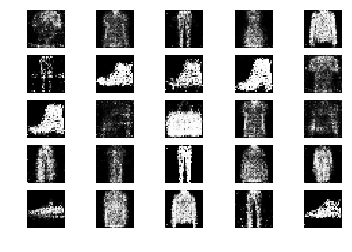

6801 [D loss: 0.621502, acc.: 68.75%] [G loss: 0.859595]
6802 [D loss: 0.679924, acc.: 56.25%] [G loss: 0.914638]
6803 [D loss: 0.676457, acc.: 62.50%] [G loss: 0.813568]
6804 [D loss: 0.621994, acc.: 65.62%] [G loss: 0.888964]
6805 [D loss: 0.699901, acc.: 51.56%] [G loss: 0.889591]
6806 [D loss: 0.664265, acc.: 53.12%] [G loss: 0.945596]
6807 [D loss: 0.628849, acc.: 67.19%] [G loss: 0.972821]
6808 [D loss: 0.674528, acc.: 67.19%] [G loss: 0.905304]
6809 [D loss: 0.662966, acc.: 59.38%] [G loss: 0.952323]
6810 [D loss: 0.654096, acc.: 57.81%] [G loss: 0.874674]
6811 [D loss: 0.663108, acc.: 60.94%] [G loss: 0.892603]
6812 [D loss: 0.722778, acc.: 51.56%] [G loss: 0.896229]
6813 [D loss: 0.668341, acc.: 59.38%] [G loss: 0.812464]
6814 [D loss: 0.648733, acc.: 60.94%] [G loss: 0.864972]
6815 [D loss: 0.646042, acc.: 60.94%] [G loss: 0.868215]
6816 [D loss: 0.602382, acc.: 65.62%] [G loss: 0.897597]
6817 [D loss: 0.589214, acc.: 70.31%] [G loss: 0.827749]
6818 [D loss: 0.637079, acc.: 6

6948 [D loss: 0.612000, acc.: 65.62%] [G loss: 0.865938]
6949 [D loss: 0.608515, acc.: 68.75%] [G loss: 0.886275]
6950 [D loss: 0.733742, acc.: 46.88%] [G loss: 0.867367]
6951 [D loss: 0.677821, acc.: 62.50%] [G loss: 0.896740]
6952 [D loss: 0.639858, acc.: 62.50%] [G loss: 0.951253]
6953 [D loss: 0.711451, acc.: 50.00%] [G loss: 0.922037]
6954 [D loss: 0.630978, acc.: 65.62%] [G loss: 0.901044]
6955 [D loss: 0.659298, acc.: 59.38%] [G loss: 0.923412]
6956 [D loss: 0.651927, acc.: 67.19%] [G loss: 0.892675]
6957 [D loss: 0.618369, acc.: 59.38%] [G loss: 0.877593]
6958 [D loss: 0.656681, acc.: 60.94%] [G loss: 0.868738]
6959 [D loss: 0.731940, acc.: 53.12%] [G loss: 0.806373]
6960 [D loss: 0.704410, acc.: 62.50%] [G loss: 0.788565]
6961 [D loss: 0.701544, acc.: 45.31%] [G loss: 0.966541]
6962 [D loss: 0.607105, acc.: 60.94%] [G loss: 0.903534]
6963 [D loss: 0.661562, acc.: 64.06%] [G loss: 0.898710]
6964 [D loss: 0.613037, acc.: 64.06%] [G loss: 0.958103]
6965 [D loss: 0.656461, acc.: 6

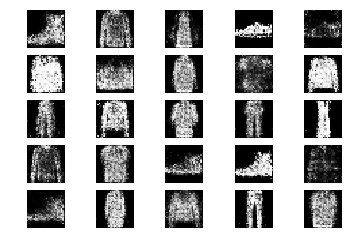

7001 [D loss: 0.622834, acc.: 64.06%] [G loss: 0.919212]
7002 [D loss: 0.630223, acc.: 59.38%] [G loss: 0.863291]
7003 [D loss: 0.634793, acc.: 59.38%] [G loss: 0.887255]
7004 [D loss: 0.662741, acc.: 57.81%] [G loss: 0.872458]
7005 [D loss: 0.638394, acc.: 60.94%] [G loss: 0.894581]
7006 [D loss: 0.725121, acc.: 45.31%] [G loss: 0.872013]
7007 [D loss: 0.723571, acc.: 54.69%] [G loss: 0.879497]
7008 [D loss: 0.669010, acc.: 59.38%] [G loss: 0.964750]
7009 [D loss: 0.617089, acc.: 65.62%] [G loss: 0.924583]
7010 [D loss: 0.686589, acc.: 48.44%] [G loss: 0.949756]
7011 [D loss: 0.653079, acc.: 59.38%] [G loss: 0.916691]
7012 [D loss: 0.673112, acc.: 56.25%] [G loss: 0.903221]
7013 [D loss: 0.595187, acc.: 68.75%] [G loss: 0.987646]
7014 [D loss: 0.666205, acc.: 60.94%] [G loss: 0.909789]
7015 [D loss: 0.572557, acc.: 71.88%] [G loss: 1.005289]
7016 [D loss: 0.674259, acc.: 60.94%] [G loss: 0.935087]
7017 [D loss: 0.662421, acc.: 56.25%] [G loss: 0.805400]
7018 [D loss: 0.727649, acc.: 5

7145 [D loss: 0.665236, acc.: 53.12%] [G loss: 0.911658]
7146 [D loss: 0.648854, acc.: 57.81%] [G loss: 0.930721]
7147 [D loss: 0.614847, acc.: 65.62%] [G loss: 0.955707]
7148 [D loss: 0.616483, acc.: 60.94%] [G loss: 0.920797]
7149 [D loss: 0.650233, acc.: 56.25%] [G loss: 0.988981]
7150 [D loss: 0.638986, acc.: 56.25%] [G loss: 0.866814]
7151 [D loss: 0.709818, acc.: 53.12%] [G loss: 0.963393]
7152 [D loss: 0.712614, acc.: 48.44%] [G loss: 0.901116]
7153 [D loss: 0.667919, acc.: 59.38%] [G loss: 0.940466]
7154 [D loss: 0.657800, acc.: 54.69%] [G loss: 0.908041]
7155 [D loss: 0.639912, acc.: 60.94%] [G loss: 0.943203]
7156 [D loss: 0.682729, acc.: 60.94%] [G loss: 0.902660]
7157 [D loss: 0.673565, acc.: 53.12%] [G loss: 0.948831]
7158 [D loss: 0.647141, acc.: 54.69%] [G loss: 0.899345]
7159 [D loss: 0.638781, acc.: 65.62%] [G loss: 0.911864]
7160 [D loss: 0.747222, acc.: 50.00%] [G loss: 0.992346]
7161 [D loss: 0.617567, acc.: 62.50%] [G loss: 0.893350]
7162 [D loss: 0.708857, acc.: 5

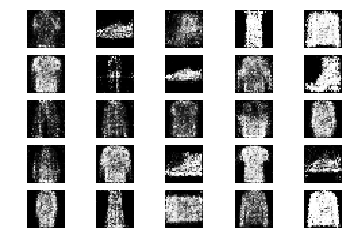

7201 [D loss: 0.657402, acc.: 64.06%] [G loss: 0.848732]
7202 [D loss: 0.631457, acc.: 62.50%] [G loss: 0.934285]
7203 [D loss: 0.683732, acc.: 59.38%] [G loss: 0.836619]
7204 [D loss: 0.588566, acc.: 73.44%] [G loss: 0.927701]
7205 [D loss: 0.662518, acc.: 64.06%] [G loss: 0.856694]
7206 [D loss: 0.627921, acc.: 67.19%] [G loss: 0.869201]
7207 [D loss: 0.709816, acc.: 59.38%] [G loss: 0.920926]
7208 [D loss: 0.563334, acc.: 76.56%] [G loss: 0.854414]
7209 [D loss: 0.693027, acc.: 59.38%] [G loss: 0.989516]
7210 [D loss: 0.638375, acc.: 54.69%] [G loss: 0.990718]
7211 [D loss: 0.713482, acc.: 50.00%] [G loss: 0.907228]
7212 [D loss: 0.733270, acc.: 54.69%] [G loss: 0.925230]
7213 [D loss: 0.607106, acc.: 62.50%] [G loss: 0.905556]
7214 [D loss: 0.752484, acc.: 45.31%] [G loss: 0.855995]
7215 [D loss: 0.645592, acc.: 57.81%] [G loss: 0.900918]
7216 [D loss: 0.629784, acc.: 64.06%] [G loss: 0.851831]
7217 [D loss: 0.614691, acc.: 68.75%] [G loss: 0.940325]
7218 [D loss: 0.664985, acc.: 5

7346 [D loss: 0.710397, acc.: 59.38%] [G loss: 0.813098]
7347 [D loss: 0.662982, acc.: 50.00%] [G loss: 0.835072]
7348 [D loss: 0.583108, acc.: 64.06%] [G loss: 0.865649]
7349 [D loss: 0.660039, acc.: 62.50%] [G loss: 0.887939]
7350 [D loss: 0.601366, acc.: 71.88%] [G loss: 0.862105]
7351 [D loss: 0.643024, acc.: 59.38%] [G loss: 0.876814]
7352 [D loss: 0.634605, acc.: 64.06%] [G loss: 0.887777]
7353 [D loss: 0.679086, acc.: 51.56%] [G loss: 0.863131]
7354 [D loss: 0.658574, acc.: 60.94%] [G loss: 0.904224]
7355 [D loss: 0.661840, acc.: 64.06%] [G loss: 0.884281]
7356 [D loss: 0.630777, acc.: 64.06%] [G loss: 0.795423]
7357 [D loss: 0.701579, acc.: 50.00%] [G loss: 0.948949]
7358 [D loss: 0.650040, acc.: 62.50%] [G loss: 0.815007]
7359 [D loss: 0.641585, acc.: 64.06%] [G loss: 0.963311]
7360 [D loss: 0.678720, acc.: 60.94%] [G loss: 0.871389]
7361 [D loss: 0.698235, acc.: 59.38%] [G loss: 0.906916]
7362 [D loss: 0.649596, acc.: 64.06%] [G loss: 0.880283]
7363 [D loss: 0.657381, acc.: 6

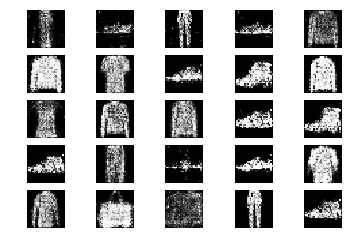

7401 [D loss: 0.643377, acc.: 70.31%] [G loss: 0.897367]
7402 [D loss: 0.751422, acc.: 53.12%] [G loss: 0.881979]
7403 [D loss: 0.665262, acc.: 65.62%] [G loss: 0.796923]
7404 [D loss: 0.657528, acc.: 67.19%] [G loss: 0.811955]
7405 [D loss: 0.703339, acc.: 60.94%] [G loss: 0.821554]
7406 [D loss: 0.662283, acc.: 57.81%] [G loss: 0.825367]
7407 [D loss: 0.658113, acc.: 56.25%] [G loss: 0.832302]
7408 [D loss: 0.685243, acc.: 56.25%] [G loss: 0.851584]
7409 [D loss: 0.663293, acc.: 57.81%] [G loss: 0.947388]
7410 [D loss: 0.737950, acc.: 46.88%] [G loss: 0.907224]
7411 [D loss: 0.701932, acc.: 53.12%] [G loss: 0.831611]
7412 [D loss: 0.717194, acc.: 46.88%] [G loss: 0.882557]
7413 [D loss: 0.686412, acc.: 53.12%] [G loss: 0.954713]
7414 [D loss: 0.684951, acc.: 53.12%] [G loss: 0.909330]
7415 [D loss: 0.644453, acc.: 65.62%] [G loss: 0.898400]
7416 [D loss: 0.652800, acc.: 57.81%] [G loss: 0.918422]
7417 [D loss: 0.614903, acc.: 62.50%] [G loss: 0.966009]
7418 [D loss: 0.682354, acc.: 5

7545 [D loss: 0.610484, acc.: 67.19%] [G loss: 0.966876]
7546 [D loss: 0.699788, acc.: 53.12%] [G loss: 0.863292]
7547 [D loss: 0.574409, acc.: 70.31%] [G loss: 0.899837]
7548 [D loss: 0.642684, acc.: 60.94%] [G loss: 0.897685]
7549 [D loss: 0.629291, acc.: 60.94%] [G loss: 0.878381]
7550 [D loss: 0.657071, acc.: 56.25%] [G loss: 0.840899]
7551 [D loss: 0.635827, acc.: 65.62%] [G loss: 0.824760]
7552 [D loss: 0.645756, acc.: 59.38%] [G loss: 0.877554]
7553 [D loss: 0.667800, acc.: 59.38%] [G loss: 0.855944]
7554 [D loss: 0.701285, acc.: 62.50%] [G loss: 0.832622]
7555 [D loss: 0.651435, acc.: 64.06%] [G loss: 0.899460]
7556 [D loss: 0.697169, acc.: 57.81%] [G loss: 0.897640]
7557 [D loss: 0.636246, acc.: 60.94%] [G loss: 0.846298]
7558 [D loss: 0.616705, acc.: 76.56%] [G loss: 0.918865]
7559 [D loss: 0.631227, acc.: 71.88%] [G loss: 0.935664]
7560 [D loss: 0.689777, acc.: 60.94%] [G loss: 0.917348]
7561 [D loss: 0.595094, acc.: 73.44%] [G loss: 0.828384]
7562 [D loss: 0.659562, acc.: 6

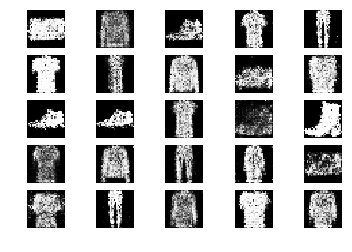

7601 [D loss: 0.680163, acc.: 53.12%] [G loss: 0.962440]
7602 [D loss: 0.696040, acc.: 57.81%] [G loss: 0.904528]
7603 [D loss: 0.679804, acc.: 57.81%] [G loss: 0.973769]
7604 [D loss: 0.566386, acc.: 76.56%] [G loss: 0.910581]
7605 [D loss: 0.664327, acc.: 59.38%] [G loss: 0.889251]
7606 [D loss: 0.640850, acc.: 67.19%] [G loss: 0.863943]
7607 [D loss: 0.638624, acc.: 67.19%] [G loss: 0.885794]
7608 [D loss: 0.619578, acc.: 64.06%] [G loss: 0.963001]
7609 [D loss: 0.655655, acc.: 60.94%] [G loss: 0.942672]
7610 [D loss: 0.645358, acc.: 62.50%] [G loss: 0.953397]
7611 [D loss: 0.702939, acc.: 57.81%] [G loss: 0.929978]
7612 [D loss: 0.691911, acc.: 54.69%] [G loss: 0.865219]
7613 [D loss: 0.637969, acc.: 71.88%] [G loss: 0.869611]
7614 [D loss: 0.595728, acc.: 75.00%] [G loss: 0.936768]
7615 [D loss: 0.661834, acc.: 62.50%] [G loss: 0.872631]
7616 [D loss: 0.606638, acc.: 64.06%] [G loss: 0.940659]
7617 [D loss: 0.653793, acc.: 59.38%] [G loss: 0.924430]
7618 [D loss: 0.642347, acc.: 7

7745 [D loss: 0.662685, acc.: 59.38%] [G loss: 0.848661]
7746 [D loss: 0.624482, acc.: 65.62%] [G loss: 0.925756]
7747 [D loss: 0.688760, acc.: 57.81%] [G loss: 0.900039]
7748 [D loss: 0.633486, acc.: 60.94%] [G loss: 0.932405]
7749 [D loss: 0.654496, acc.: 62.50%] [G loss: 0.821612]
7750 [D loss: 0.684048, acc.: 56.25%] [G loss: 0.837458]
7751 [D loss: 0.672117, acc.: 54.69%] [G loss: 0.864905]
7752 [D loss: 0.646123, acc.: 65.62%] [G loss: 0.860228]
7753 [D loss: 0.662559, acc.: 53.12%] [G loss: 0.864973]
7754 [D loss: 0.608903, acc.: 67.19%] [G loss: 0.853365]
7755 [D loss: 0.658474, acc.: 59.38%] [G loss: 0.885618]
7756 [D loss: 0.611612, acc.: 75.00%] [G loss: 0.826115]
7757 [D loss: 0.710169, acc.: 48.44%] [G loss: 0.816016]
7758 [D loss: 0.730627, acc.: 50.00%] [G loss: 0.932204]
7759 [D loss: 0.582199, acc.: 73.44%] [G loss: 0.923814]
7760 [D loss: 0.640399, acc.: 65.62%] [G loss: 0.925055]
7761 [D loss: 0.666083, acc.: 57.81%] [G loss: 0.887203]
7762 [D loss: 0.656688, acc.: 5

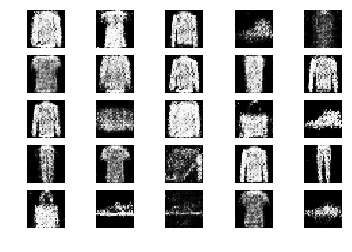

7801 [D loss: 0.643654, acc.: 54.69%] [G loss: 0.961961]
7802 [D loss: 0.651043, acc.: 60.94%] [G loss: 0.895064]
7803 [D loss: 0.679902, acc.: 51.56%] [G loss: 0.918005]
7804 [D loss: 0.632082, acc.: 65.62%] [G loss: 0.896124]
7805 [D loss: 0.630974, acc.: 62.50%] [G loss: 0.952920]
7806 [D loss: 0.639706, acc.: 59.38%] [G loss: 0.901996]
7807 [D loss: 0.607197, acc.: 68.75%] [G loss: 0.853329]
7808 [D loss: 0.635627, acc.: 70.31%] [G loss: 0.883330]
7809 [D loss: 0.613157, acc.: 75.00%] [G loss: 0.913310]
7810 [D loss: 0.654339, acc.: 59.38%] [G loss: 0.911746]
7811 [D loss: 0.646474, acc.: 59.38%] [G loss: 0.856630]
7812 [D loss: 0.708672, acc.: 53.12%] [G loss: 0.864736]
7813 [D loss: 0.600282, acc.: 71.88%] [G loss: 0.876708]
7814 [D loss: 0.680906, acc.: 53.12%] [G loss: 0.968971]
7815 [D loss: 0.665347, acc.: 56.25%] [G loss: 0.911365]
7816 [D loss: 0.734574, acc.: 42.19%] [G loss: 0.903912]
7817 [D loss: 0.686982, acc.: 59.38%] [G loss: 0.896537]
7818 [D loss: 0.628432, acc.: 6

7947 [D loss: 0.546982, acc.: 73.44%] [G loss: 0.879043]
7948 [D loss: 0.579558, acc.: 75.00%] [G loss: 0.883652]
7949 [D loss: 0.595524, acc.: 65.62%] [G loss: 0.932935]
7950 [D loss: 0.680948, acc.: 62.50%] [G loss: 0.914429]
7951 [D loss: 0.678122, acc.: 59.38%] [G loss: 0.844581]
7952 [D loss: 0.634255, acc.: 64.06%] [G loss: 0.879336]
7953 [D loss: 0.681838, acc.: 57.81%] [G loss: 0.924398]
7954 [D loss: 0.628533, acc.: 67.19%] [G loss: 0.830505]
7955 [D loss: 0.587797, acc.: 67.19%] [G loss: 0.875574]
7956 [D loss: 0.656166, acc.: 64.06%] [G loss: 0.814808]
7957 [D loss: 0.628014, acc.: 64.06%] [G loss: 0.867710]
7958 [D loss: 0.634235, acc.: 67.19%] [G loss: 0.998607]
7959 [D loss: 0.636991, acc.: 62.50%] [G loss: 0.833107]
7960 [D loss: 0.655499, acc.: 59.38%] [G loss: 0.952278]
7961 [D loss: 0.653167, acc.: 53.12%] [G loss: 0.917735]
7962 [D loss: 0.593216, acc.: 67.19%] [G loss: 0.863189]
7963 [D loss: 0.683405, acc.: 53.12%] [G loss: 0.961038]
7964 [D loss: 0.676941, acc.: 5

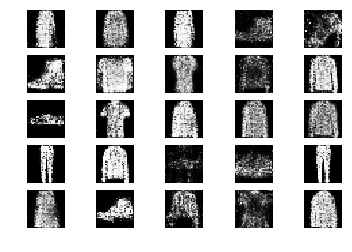

8001 [D loss: 0.586248, acc.: 67.19%] [G loss: 0.876508]
8002 [D loss: 0.655223, acc.: 57.81%] [G loss: 0.940412]
8003 [D loss: 0.630163, acc.: 62.50%] [G loss: 0.979621]
8004 [D loss: 0.682609, acc.: 59.38%] [G loss: 0.875123]
8005 [D loss: 0.747203, acc.: 54.69%] [G loss: 0.779253]
8006 [D loss: 0.571457, acc.: 71.88%] [G loss: 0.837065]
8007 [D loss: 0.708664, acc.: 53.12%] [G loss: 0.905707]
8008 [D loss: 0.729792, acc.: 56.25%] [G loss: 0.947990]
8009 [D loss: 0.692142, acc.: 50.00%] [G loss: 0.925372]
8010 [D loss: 0.648584, acc.: 57.81%] [G loss: 0.941382]
8011 [D loss: 0.708152, acc.: 57.81%] [G loss: 0.898561]
8012 [D loss: 0.640440, acc.: 59.38%] [G loss: 0.916174]
8013 [D loss: 0.687473, acc.: 51.56%] [G loss: 0.904029]
8014 [D loss: 0.668170, acc.: 59.38%] [G loss: 0.918096]
8015 [D loss: 0.619640, acc.: 62.50%] [G loss: 0.840063]
8016 [D loss: 0.674410, acc.: 64.06%] [G loss: 0.837441]
8017 [D loss: 0.637180, acc.: 70.31%] [G loss: 0.898241]
8018 [D loss: 0.655112, acc.: 6

8145 [D loss: 0.635615, acc.: 64.06%] [G loss: 0.918979]
8146 [D loss: 0.683537, acc.: 50.00%] [G loss: 0.955723]
8147 [D loss: 0.630418, acc.: 57.81%] [G loss: 0.955816]
8148 [D loss: 0.607446, acc.: 68.75%] [G loss: 0.942788]
8149 [D loss: 0.654515, acc.: 64.06%] [G loss: 0.893158]
8150 [D loss: 0.617884, acc.: 73.44%] [G loss: 0.979644]
8151 [D loss: 0.599456, acc.: 70.31%] [G loss: 0.959922]
8152 [D loss: 0.670462, acc.: 67.19%] [G loss: 0.864580]
8153 [D loss: 0.664887, acc.: 53.12%] [G loss: 0.921105]
8154 [D loss: 0.598173, acc.: 67.19%] [G loss: 0.924138]
8155 [D loss: 0.638019, acc.: 62.50%] [G loss: 0.922124]
8156 [D loss: 0.681496, acc.: 67.19%] [G loss: 0.882730]
8157 [D loss: 0.601523, acc.: 71.88%] [G loss: 0.892567]
8158 [D loss: 0.667872, acc.: 57.81%] [G loss: 1.006000]
8159 [D loss: 0.601671, acc.: 62.50%] [G loss: 0.941783]
8160 [D loss: 0.602107, acc.: 71.88%] [G loss: 0.980604]
8161 [D loss: 0.617962, acc.: 67.19%] [G loss: 0.870435]
8162 [D loss: 0.618701, acc.: 5

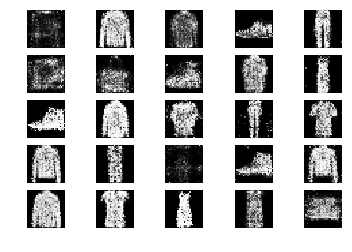

8201 [D loss: 0.663462, acc.: 64.06%] [G loss: 0.928416]
8202 [D loss: 0.639007, acc.: 60.94%] [G loss: 0.886920]
8203 [D loss: 0.660276, acc.: 64.06%] [G loss: 0.952158]
8204 [D loss: 0.671904, acc.: 57.81%] [G loss: 0.889712]
8205 [D loss: 0.743276, acc.: 50.00%] [G loss: 0.886773]
8206 [D loss: 0.611296, acc.: 70.31%] [G loss: 0.868228]
8207 [D loss: 0.636531, acc.: 65.62%] [G loss: 0.894075]
8208 [D loss: 0.679118, acc.: 60.94%] [G loss: 0.916425]
8209 [D loss: 0.618915, acc.: 65.62%] [G loss: 0.964856]
8210 [D loss: 0.640736, acc.: 68.75%] [G loss: 0.921127]
8211 [D loss: 0.657115, acc.: 56.25%] [G loss: 0.912783]
8212 [D loss: 0.699951, acc.: 56.25%] [G loss: 0.923869]
8213 [D loss: 0.603671, acc.: 68.75%] [G loss: 0.867740]
8214 [D loss: 0.638343, acc.: 64.06%] [G loss: 0.950260]
8215 [D loss: 0.674799, acc.: 51.56%] [G loss: 0.900767]
8216 [D loss: 0.573573, acc.: 79.69%] [G loss: 1.005524]
8217 [D loss: 0.632665, acc.: 62.50%] [G loss: 0.984814]
8218 [D loss: 0.564658, acc.: 6

8346 [D loss: 0.665941, acc.: 56.25%] [G loss: 0.812764]
8347 [D loss: 0.603212, acc.: 60.94%] [G loss: 0.911019]
8348 [D loss: 0.659651, acc.: 60.94%] [G loss: 0.977867]
8349 [D loss: 0.636642, acc.: 68.75%] [G loss: 1.004556]
8350 [D loss: 0.681342, acc.: 53.12%] [G loss: 0.866002]
8351 [D loss: 0.597248, acc.: 67.19%] [G loss: 0.952939]
8352 [D loss: 0.739597, acc.: 42.19%] [G loss: 0.915015]
8353 [D loss: 0.616508, acc.: 65.62%] [G loss: 0.959434]
8354 [D loss: 0.627736, acc.: 70.31%] [G loss: 0.906713]
8355 [D loss: 0.633323, acc.: 68.75%] [G loss: 0.919867]
8356 [D loss: 0.640694, acc.: 71.88%] [G loss: 0.959628]
8357 [D loss: 0.616086, acc.: 62.50%] [G loss: 0.881002]
8358 [D loss: 0.679229, acc.: 57.81%] [G loss: 0.878039]
8359 [D loss: 0.670804, acc.: 56.25%] [G loss: 0.853017]
8360 [D loss: 0.689759, acc.: 54.69%] [G loss: 0.889224]
8361 [D loss: 0.621472, acc.: 68.75%] [G loss: 0.818706]
8362 [D loss: 0.671704, acc.: 64.06%] [G loss: 0.842880]
8363 [D loss: 0.662754, acc.: 6

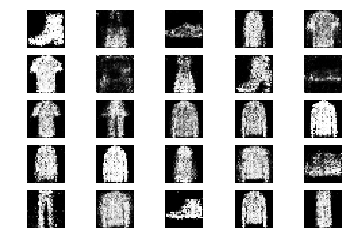

8401 [D loss: 0.704239, acc.: 50.00%] [G loss: 0.845615]
8402 [D loss: 0.727281, acc.: 46.88%] [G loss: 0.918362]
8403 [D loss: 0.667627, acc.: 60.94%] [G loss: 0.849948]
8404 [D loss: 0.657175, acc.: 62.50%] [G loss: 0.862542]
8405 [D loss: 0.607226, acc.: 70.31%] [G loss: 0.900057]
8406 [D loss: 0.690234, acc.: 60.94%] [G loss: 0.818581]
8407 [D loss: 0.652558, acc.: 57.81%] [G loss: 0.893501]
8408 [D loss: 0.667468, acc.: 57.81%] [G loss: 0.819257]
8409 [D loss: 0.699497, acc.: 51.56%] [G loss: 0.829932]
8410 [D loss: 0.638030, acc.: 65.62%] [G loss: 0.862064]
8411 [D loss: 0.631439, acc.: 57.81%] [G loss: 0.789115]
8412 [D loss: 0.707303, acc.: 50.00%] [G loss: 0.865618]
8413 [D loss: 0.644564, acc.: 67.19%] [G loss: 0.989338]
8414 [D loss: 0.671066, acc.: 64.06%] [G loss: 0.984460]
8415 [D loss: 0.606673, acc.: 71.88%] [G loss: 0.999123]
8416 [D loss: 0.667877, acc.: 59.38%] [G loss: 0.898954]
8417 [D loss: 0.648898, acc.: 64.06%] [G loss: 0.912722]
8418 [D loss: 0.673105, acc.: 6

8545 [D loss: 0.685996, acc.: 59.38%] [G loss: 0.913121]
8546 [D loss: 0.723761, acc.: 45.31%] [G loss: 0.926566]
8547 [D loss: 0.606292, acc.: 68.75%] [G loss: 1.132164]
8548 [D loss: 0.628867, acc.: 60.94%] [G loss: 1.026611]
8549 [D loss: 0.655744, acc.: 60.94%] [G loss: 0.866092]
8550 [D loss: 0.633602, acc.: 64.06%] [G loss: 0.890794]
8551 [D loss: 0.655028, acc.: 60.94%] [G loss: 0.910642]
8552 [D loss: 0.673855, acc.: 56.25%] [G loss: 0.900321]
8553 [D loss: 0.662580, acc.: 65.62%] [G loss: 0.903315]
8554 [D loss: 0.603500, acc.: 70.31%] [G loss: 0.855741]
8555 [D loss: 0.700314, acc.: 59.38%] [G loss: 0.861122]
8556 [D loss: 0.699919, acc.: 53.12%] [G loss: 0.950834]
8557 [D loss: 0.677061, acc.: 59.38%] [G loss: 0.832809]
8558 [D loss: 0.722454, acc.: 56.25%] [G loss: 0.957643]
8559 [D loss: 0.687945, acc.: 54.69%] [G loss: 0.911825]
8560 [D loss: 0.671192, acc.: 62.50%] [G loss: 0.881369]
8561 [D loss: 0.622082, acc.: 65.62%] [G loss: 0.889674]
8562 [D loss: 0.677486, acc.: 5

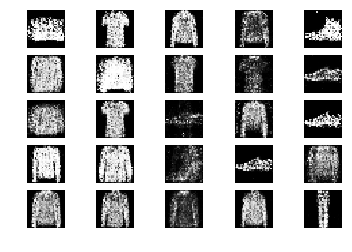

8601 [D loss: 0.653798, acc.: 62.50%] [G loss: 0.907315]
8602 [D loss: 0.607357, acc.: 73.44%] [G loss: 0.891299]
8603 [D loss: 0.683764, acc.: 56.25%] [G loss: 0.941137]
8604 [D loss: 0.668066, acc.: 62.50%] [G loss: 0.978005]
8605 [D loss: 0.662314, acc.: 62.50%] [G loss: 0.909622]
8606 [D loss: 0.664220, acc.: 65.62%] [G loss: 0.924953]
8607 [D loss: 0.670014, acc.: 57.81%] [G loss: 0.899668]
8608 [D loss: 0.659318, acc.: 64.06%] [G loss: 0.833995]
8609 [D loss: 0.700311, acc.: 42.19%] [G loss: 0.924796]
8610 [D loss: 0.705462, acc.: 57.81%] [G loss: 0.992669]
8611 [D loss: 0.661745, acc.: 64.06%] [G loss: 0.937086]
8612 [D loss: 0.633315, acc.: 70.31%] [G loss: 0.969795]
8613 [D loss: 0.630354, acc.: 68.75%] [G loss: 0.862472]
8614 [D loss: 0.660523, acc.: 56.25%] [G loss: 0.945419]
8615 [D loss: 0.701174, acc.: 57.81%] [G loss: 0.932457]
8616 [D loss: 0.675703, acc.: 57.81%] [G loss: 0.877953]
8617 [D loss: 0.575078, acc.: 76.56%] [G loss: 0.851389]
8618 [D loss: 0.715987, acc.: 5

8745 [D loss: 0.656547, acc.: 57.81%] [G loss: 0.870018]
8746 [D loss: 0.643242, acc.: 59.38%] [G loss: 0.894488]
8747 [D loss: 0.649687, acc.: 70.31%] [G loss: 0.866922]
8748 [D loss: 0.617369, acc.: 68.75%] [G loss: 0.878011]
8749 [D loss: 0.687579, acc.: 57.81%] [G loss: 0.924208]
8750 [D loss: 0.681308, acc.: 62.50%] [G loss: 0.937564]
8751 [D loss: 0.630095, acc.: 62.50%] [G loss: 0.960565]
8752 [D loss: 0.671882, acc.: 60.94%] [G loss: 0.919897]
8753 [D loss: 0.675742, acc.: 53.12%] [G loss: 0.941947]
8754 [D loss: 0.701560, acc.: 57.81%] [G loss: 0.922826]
8755 [D loss: 0.651807, acc.: 57.81%] [G loss: 0.959795]
8756 [D loss: 0.619612, acc.: 65.62%] [G loss: 0.925094]
8757 [D loss: 0.626856, acc.: 64.06%] [G loss: 0.947112]
8758 [D loss: 0.704747, acc.: 53.12%] [G loss: 0.975820]
8759 [D loss: 0.681593, acc.: 54.69%] [G loss: 0.878640]
8760 [D loss: 0.658660, acc.: 59.38%] [G loss: 0.965356]
8761 [D loss: 0.555497, acc.: 81.25%] [G loss: 0.948990]
8762 [D loss: 0.611014, acc.: 6

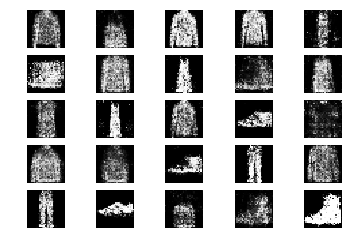

8801 [D loss: 0.654986, acc.: 59.38%] [G loss: 0.895276]
8802 [D loss: 0.599962, acc.: 71.88%] [G loss: 0.884162]
8803 [D loss: 0.649266, acc.: 64.06%] [G loss: 0.860933]
8804 [D loss: 0.616711, acc.: 64.06%] [G loss: 0.832107]
8805 [D loss: 0.596159, acc.: 75.00%] [G loss: 0.887137]
8806 [D loss: 0.611182, acc.: 70.31%] [G loss: 0.919964]
8807 [D loss: 0.670350, acc.: 56.25%] [G loss: 0.887225]
8808 [D loss: 0.669969, acc.: 56.25%] [G loss: 0.859956]
8809 [D loss: 0.627071, acc.: 68.75%] [G loss: 0.905492]
8810 [D loss: 0.603621, acc.: 71.88%] [G loss: 0.853707]
8811 [D loss: 0.654457, acc.: 62.50%] [G loss: 0.840966]
8812 [D loss: 0.647085, acc.: 60.94%] [G loss: 0.940337]
8813 [D loss: 0.689143, acc.: 60.94%] [G loss: 0.998169]
8814 [D loss: 0.688195, acc.: 56.25%] [G loss: 0.930547]
8815 [D loss: 0.668652, acc.: 59.38%] [G loss: 0.927995]
8816 [D loss: 0.594178, acc.: 70.31%] [G loss: 0.959519]
8817 [D loss: 0.647875, acc.: 64.06%] [G loss: 1.073421]
8818 [D loss: 0.677228, acc.: 6

8947 [D loss: 0.701331, acc.: 46.88%] [G loss: 0.974576]
8948 [D loss: 0.627646, acc.: 67.19%] [G loss: 0.893813]
8949 [D loss: 0.693065, acc.: 48.44%] [G loss: 0.803790]
8950 [D loss: 0.644277, acc.: 60.94%] [G loss: 0.872314]
8951 [D loss: 0.653052, acc.: 54.69%] [G loss: 0.768600]
8952 [D loss: 0.619148, acc.: 59.38%] [G loss: 0.924951]
8953 [D loss: 0.621102, acc.: 65.62%] [G loss: 0.944858]
8954 [D loss: 0.598633, acc.: 68.75%] [G loss: 0.941891]
8955 [D loss: 0.640551, acc.: 62.50%] [G loss: 0.853143]
8956 [D loss: 0.686869, acc.: 51.56%] [G loss: 0.929934]
8957 [D loss: 0.633455, acc.: 65.62%] [G loss: 0.928010]
8958 [D loss: 0.656230, acc.: 59.38%] [G loss: 0.862948]
8959 [D loss: 0.663295, acc.: 64.06%] [G loss: 0.864741]
8960 [D loss: 0.697479, acc.: 54.69%] [G loss: 0.855668]
8961 [D loss: 0.647669, acc.: 59.38%] [G loss: 0.828851]
8962 [D loss: 0.707778, acc.: 53.12%] [G loss: 0.890969]
8963 [D loss: 0.641703, acc.: 64.06%] [G loss: 0.963511]
8964 [D loss: 0.581238, acc.: 7

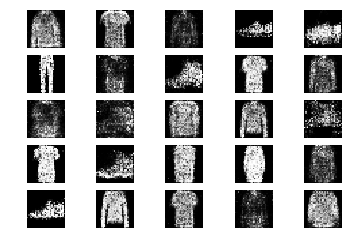

9001 [D loss: 0.639695, acc.: 67.19%] [G loss: 1.036933]
9002 [D loss: 0.671883, acc.: 59.38%] [G loss: 0.866732]
9003 [D loss: 0.608754, acc.: 68.75%] [G loss: 0.958428]
9004 [D loss: 0.675489, acc.: 62.50%] [G loss: 1.013189]
9005 [D loss: 0.703179, acc.: 51.56%] [G loss: 0.799369]
9006 [D loss: 0.647785, acc.: 64.06%] [G loss: 0.892118]
9007 [D loss: 0.650706, acc.: 64.06%] [G loss: 0.855241]
9008 [D loss: 0.668971, acc.: 53.12%] [G loss: 0.832327]
9009 [D loss: 0.683780, acc.: 60.94%] [G loss: 0.954341]
9010 [D loss: 0.631374, acc.: 59.38%] [G loss: 0.976020]
9011 [D loss: 0.675826, acc.: 67.19%] [G loss: 0.889058]
9012 [D loss: 0.572386, acc.: 75.00%] [G loss: 0.868092]
9013 [D loss: 0.671794, acc.: 46.88%] [G loss: 0.875424]
9014 [D loss: 0.657925, acc.: 59.38%] [G loss: 0.877571]
9015 [D loss: 0.634760, acc.: 54.69%] [G loss: 0.876270]
9016 [D loss: 0.656852, acc.: 56.25%] [G loss: 0.842652]
9017 [D loss: 0.664977, acc.: 64.06%] [G loss: 0.883711]
9018 [D loss: 0.697146, acc.: 5

9146 [D loss: 0.621665, acc.: 73.44%] [G loss: 0.949517]
9147 [D loss: 0.596952, acc.: 67.19%] [G loss: 0.963693]
9148 [D loss: 0.721741, acc.: 46.88%] [G loss: 0.924858]
9149 [D loss: 0.682336, acc.: 53.12%] [G loss: 0.978441]
9150 [D loss: 0.661595, acc.: 62.50%] [G loss: 0.919682]
9151 [D loss: 0.709017, acc.: 59.38%] [G loss: 0.840747]
9152 [D loss: 0.664598, acc.: 53.12%] [G loss: 0.873407]
9153 [D loss: 0.665133, acc.: 53.12%] [G loss: 0.884169]
9154 [D loss: 0.659327, acc.: 54.69%] [G loss: 0.864709]
9155 [D loss: 0.616595, acc.: 73.44%] [G loss: 0.909881]
9156 [D loss: 0.646995, acc.: 60.94%] [G loss: 0.951617]
9157 [D loss: 0.668452, acc.: 59.38%] [G loss: 1.025019]
9158 [D loss: 0.645572, acc.: 70.31%] [G loss: 0.921989]
9159 [D loss: 0.726813, acc.: 50.00%] [G loss: 0.869852]
9160 [D loss: 0.660955, acc.: 64.06%] [G loss: 0.929504]
9161 [D loss: 0.716706, acc.: 56.25%] [G loss: 0.897422]
9162 [D loss: 0.668719, acc.: 53.12%] [G loss: 0.923591]
9163 [D loss: 0.707057, acc.: 4

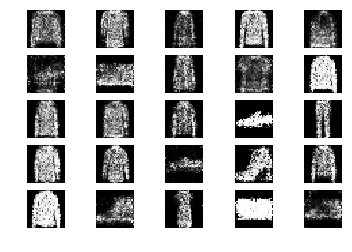

9201 [D loss: 0.660412, acc.: 56.25%] [G loss: 0.841313]
9202 [D loss: 0.614391, acc.: 64.06%] [G loss: 0.943425]
9203 [D loss: 0.688488, acc.: 46.88%] [G loss: 0.918596]
9204 [D loss: 0.644765, acc.: 60.94%] [G loss: 0.910596]
9205 [D loss: 0.635361, acc.: 62.50%] [G loss: 0.877414]
9206 [D loss: 0.671766, acc.: 59.38%] [G loss: 0.927434]
9207 [D loss: 0.718919, acc.: 50.00%] [G loss: 0.908154]
9208 [D loss: 0.591373, acc.: 68.75%] [G loss: 0.978669]
9209 [D loss: 0.661037, acc.: 60.94%] [G loss: 0.875360]
9210 [D loss: 0.614019, acc.: 60.94%] [G loss: 0.960634]
9211 [D loss: 0.727503, acc.: 51.56%] [G loss: 0.873397]
9212 [D loss: 0.669499, acc.: 54.69%] [G loss: 0.934975]
9213 [D loss: 0.674868, acc.: 59.38%] [G loss: 0.908485]
9214 [D loss: 0.712566, acc.: 45.31%] [G loss: 1.019360]
9215 [D loss: 0.647325, acc.: 65.62%] [G loss: 0.903959]
9216 [D loss: 0.665281, acc.: 51.56%] [G loss: 0.860990]
9217 [D loss: 0.689210, acc.: 57.81%] [G loss: 0.838030]
9218 [D loss: 0.621368, acc.: 6

9348 [D loss: 0.597293, acc.: 73.44%] [G loss: 0.945998]
9349 [D loss: 0.633144, acc.: 71.88%] [G loss: 0.930903]
9350 [D loss: 0.651485, acc.: 62.50%] [G loss: 0.916916]
9351 [D loss: 0.672986, acc.: 60.94%] [G loss: 0.951426]
9352 [D loss: 0.635234, acc.: 59.38%] [G loss: 0.990571]
9353 [D loss: 0.652239, acc.: 56.25%] [G loss: 0.946245]
9354 [D loss: 0.627296, acc.: 75.00%] [G loss: 0.956693]
9355 [D loss: 0.645065, acc.: 70.31%] [G loss: 0.910463]
9356 [D loss: 0.641915, acc.: 60.94%] [G loss: 0.964803]
9357 [D loss: 0.709820, acc.: 53.12%] [G loss: 0.956037]
9358 [D loss: 0.640977, acc.: 67.19%] [G loss: 0.951399]
9359 [D loss: 0.710088, acc.: 54.69%] [G loss: 0.925185]
9360 [D loss: 0.632370, acc.: 71.88%] [G loss: 0.942746]
9361 [D loss: 0.654076, acc.: 56.25%] [G loss: 0.943301]
9362 [D loss: 0.673770, acc.: 56.25%] [G loss: 0.876189]
9363 [D loss: 0.669033, acc.: 57.81%] [G loss: 0.861416]
9364 [D loss: 0.674175, acc.: 56.25%] [G loss: 0.934556]
9365 [D loss: 0.628331, acc.: 6

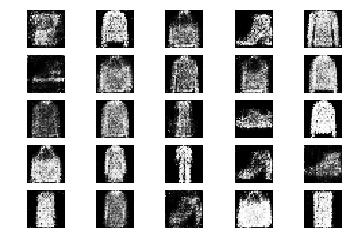

9401 [D loss: 0.630964, acc.: 59.38%] [G loss: 0.868996]
9402 [D loss: 0.674334, acc.: 59.38%] [G loss: 0.849808]
9403 [D loss: 0.696323, acc.: 59.38%] [G loss: 0.944047]
9404 [D loss: 0.600412, acc.: 71.88%] [G loss: 0.910629]
9405 [D loss: 0.676971, acc.: 56.25%] [G loss: 0.952076]
9406 [D loss: 0.661083, acc.: 57.81%] [G loss: 0.879212]
9407 [D loss: 0.668732, acc.: 60.94%] [G loss: 0.915578]
9408 [D loss: 0.609171, acc.: 62.50%] [G loss: 0.909452]
9409 [D loss: 0.657224, acc.: 57.81%] [G loss: 0.928710]
9410 [D loss: 0.653763, acc.: 65.62%] [G loss: 0.872581]
9411 [D loss: 0.646437, acc.: 53.12%] [G loss: 0.846953]
9412 [D loss: 0.684201, acc.: 56.25%] [G loss: 0.923052]
9413 [D loss: 0.668159, acc.: 59.38%] [G loss: 0.842708]
9414 [D loss: 0.627288, acc.: 64.06%] [G loss: 0.860411]
9415 [D loss: 0.706936, acc.: 51.56%] [G loss: 0.866454]
9416 [D loss: 0.642076, acc.: 59.38%] [G loss: 0.934154]
9417 [D loss: 0.574814, acc.: 73.44%] [G loss: 0.934251]
9418 [D loss: 0.751404, acc.: 5

9545 [D loss: 0.632261, acc.: 64.06%] [G loss: 0.923199]
9546 [D loss: 0.613376, acc.: 73.44%] [G loss: 0.868168]
9547 [D loss: 0.606594, acc.: 73.44%] [G loss: 0.879256]
9548 [D loss: 0.646920, acc.: 62.50%] [G loss: 0.902301]
9549 [D loss: 0.672319, acc.: 60.94%] [G loss: 0.945191]
9550 [D loss: 0.643204, acc.: 68.75%] [G loss: 0.926747]
9551 [D loss: 0.698161, acc.: 53.12%] [G loss: 0.937763]
9552 [D loss: 0.635677, acc.: 65.62%] [G loss: 0.984011]
9553 [D loss: 0.729761, acc.: 45.31%] [G loss: 0.875484]
9554 [D loss: 0.603147, acc.: 64.06%] [G loss: 0.863983]
9555 [D loss: 0.672535, acc.: 56.25%] [G loss: 0.930936]
9556 [D loss: 0.696891, acc.: 50.00%] [G loss: 0.850634]
9557 [D loss: 0.617575, acc.: 68.75%] [G loss: 0.886084]
9558 [D loss: 0.678625, acc.: 56.25%] [G loss: 0.843944]
9559 [D loss: 0.568057, acc.: 81.25%] [G loss: 0.836729]
9560 [D loss: 0.641057, acc.: 60.94%] [G loss: 0.804597]
9561 [D loss: 0.647443, acc.: 53.12%] [G loss: 0.873172]
9562 [D loss: 0.658263, acc.: 5

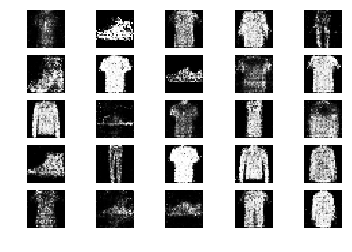

9601 [D loss: 0.654333, acc.: 57.81%] [G loss: 0.957195]
9602 [D loss: 0.679780, acc.: 56.25%] [G loss: 0.901496]
9603 [D loss: 0.633382, acc.: 62.50%] [G loss: 0.889361]
9604 [D loss: 0.653333, acc.: 59.38%] [G loss: 0.973081]
9605 [D loss: 0.671630, acc.: 65.62%] [G loss: 0.839682]
9606 [D loss: 0.689282, acc.: 57.81%] [G loss: 0.861211]
9607 [D loss: 0.644303, acc.: 65.62%] [G loss: 0.772989]
9608 [D loss: 0.630349, acc.: 65.62%] [G loss: 0.891343]
9609 [D loss: 0.630584, acc.: 60.94%] [G loss: 0.887807]
9610 [D loss: 0.614924, acc.: 67.19%] [G loss: 0.863555]
9611 [D loss: 0.633381, acc.: 60.94%] [G loss: 0.828734]
9612 [D loss: 0.625381, acc.: 62.50%] [G loss: 0.954548]
9613 [D loss: 0.665924, acc.: 62.50%] [G loss: 0.887614]
9614 [D loss: 0.651388, acc.: 59.38%] [G loss: 0.876117]
9615 [D loss: 0.637428, acc.: 60.94%] [G loss: 0.910879]
9616 [D loss: 0.659494, acc.: 60.94%] [G loss: 0.889918]
9617 [D loss: 0.627665, acc.: 68.75%] [G loss: 0.833940]
9618 [D loss: 0.596844, acc.: 7

9745 [D loss: 0.597835, acc.: 68.75%] [G loss: 0.945135]
9746 [D loss: 0.630233, acc.: 65.62%] [G loss: 0.900622]
9747 [D loss: 0.636548, acc.: 64.06%] [G loss: 0.898763]
9748 [D loss: 0.620414, acc.: 62.50%] [G loss: 0.885899]
9749 [D loss: 0.713720, acc.: 48.44%] [G loss: 0.906207]
9750 [D loss: 0.654821, acc.: 65.62%] [G loss: 0.797206]
9751 [D loss: 0.675277, acc.: 59.38%] [G loss: 0.972747]
9752 [D loss: 0.716453, acc.: 50.00%] [G loss: 0.872313]
9753 [D loss: 0.595061, acc.: 68.75%] [G loss: 0.782268]
9754 [D loss: 0.638703, acc.: 62.50%] [G loss: 0.838329]
9755 [D loss: 0.642401, acc.: 64.06%] [G loss: 0.942065]
9756 [D loss: 0.651976, acc.: 62.50%] [G loss: 0.918719]
9757 [D loss: 0.655666, acc.: 57.81%] [G loss: 0.879060]
9758 [D loss: 0.651402, acc.: 60.94%] [G loss: 0.953773]
9759 [D loss: 0.604877, acc.: 65.62%] [G loss: 0.890156]
9760 [D loss: 0.715874, acc.: 50.00%] [G loss: 0.873285]
9761 [D loss: 0.717580, acc.: 53.12%] [G loss: 0.919082]
9762 [D loss: 0.665890, acc.: 6

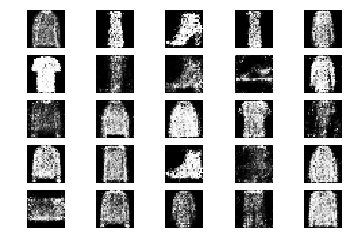

9801 [D loss: 0.587678, acc.: 71.88%] [G loss: 0.880420]
9802 [D loss: 0.648750, acc.: 59.38%] [G loss: 0.820254]
9803 [D loss: 0.655015, acc.: 59.38%] [G loss: 0.865886]
9804 [D loss: 0.726442, acc.: 46.88%] [G loss: 0.858015]
9805 [D loss: 0.652533, acc.: 64.06%] [G loss: 0.956353]
9806 [D loss: 0.686280, acc.: 57.81%] [G loss: 0.889887]
9807 [D loss: 0.633669, acc.: 67.19%] [G loss: 0.829895]
9808 [D loss: 0.655908, acc.: 59.38%] [G loss: 0.955474]
9809 [D loss: 0.717515, acc.: 48.44%] [G loss: 0.890995]
9810 [D loss: 0.649327, acc.: 60.94%] [G loss: 0.826306]
9811 [D loss: 0.609948, acc.: 68.75%] [G loss: 0.877480]
9812 [D loss: 0.615348, acc.: 65.62%] [G loss: 0.859946]
9813 [D loss: 0.634974, acc.: 60.94%] [G loss: 0.840463]
9814 [D loss: 0.632153, acc.: 65.62%] [G loss: 0.939125]
9815 [D loss: 0.726839, acc.: 50.00%] [G loss: 0.887353]
9816 [D loss: 0.625544, acc.: 67.19%] [G loss: 0.931831]
9817 [D loss: 0.583547, acc.: 71.88%] [G loss: 0.912619]
9818 [D loss: 0.694470, acc.: 5

9947 [D loss: 0.726298, acc.: 53.12%] [G loss: 0.820103]
9948 [D loss: 0.664382, acc.: 62.50%] [G loss: 0.840026]
9949 [D loss: 0.627104, acc.: 60.94%] [G loss: 0.919761]
9950 [D loss: 0.629386, acc.: 59.38%] [G loss: 0.904993]
9951 [D loss: 0.663564, acc.: 59.38%] [G loss: 0.896613]
9952 [D loss: 0.646025, acc.: 60.94%] [G loss: 0.950019]
9953 [D loss: 0.673023, acc.: 60.94%] [G loss: 0.839882]
9954 [D loss: 0.617389, acc.: 70.31%] [G loss: 0.880451]
9955 [D loss: 0.625525, acc.: 64.06%] [G loss: 0.840849]
9956 [D loss: 0.618086, acc.: 62.50%] [G loss: 0.886752]
9957 [D loss: 0.706979, acc.: 60.94%] [G loss: 0.971689]
9958 [D loss: 0.608284, acc.: 65.62%] [G loss: 0.897620]
9959 [D loss: 0.701288, acc.: 54.69%] [G loss: 0.972903]
9960 [D loss: 0.734104, acc.: 46.88%] [G loss: 0.912748]
9961 [D loss: 0.631557, acc.: 64.06%] [G loss: 1.003700]
9962 [D loss: 0.669831, acc.: 59.38%] [G loss: 0.995340]
9963 [D loss: 0.673653, acc.: 65.62%] [G loss: 0.990350]
9964 [D loss: 0.668759, acc.: 6

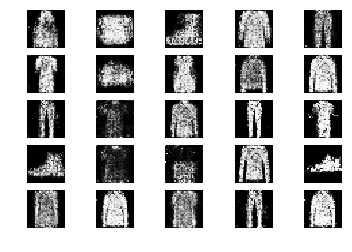

10001 [D loss: 0.614071, acc.: 70.31%] [G loss: 0.909752]
10002 [D loss: 0.615225, acc.: 64.06%] [G loss: 0.974862]
10003 [D loss: 0.659903, acc.: 62.50%] [G loss: 0.900924]
10004 [D loss: 0.725139, acc.: 51.56%] [G loss: 0.928511]
10005 [D loss: 0.589927, acc.: 65.62%] [G loss: 0.960386]
10006 [D loss: 0.604095, acc.: 67.19%] [G loss: 0.789597]
10007 [D loss: 0.614400, acc.: 71.88%] [G loss: 0.901538]
10008 [D loss: 0.688986, acc.: 57.81%] [G loss: 0.869969]
10009 [D loss: 0.623075, acc.: 60.94%] [G loss: 0.880203]
10010 [D loss: 0.633601, acc.: 67.19%] [G loss: 0.915075]
10011 [D loss: 0.622733, acc.: 62.50%] [G loss: 0.908866]
10012 [D loss: 0.696777, acc.: 57.81%] [G loss: 0.964528]
10013 [D loss: 0.618785, acc.: 67.19%] [G loss: 1.001108]
10014 [D loss: 0.667034, acc.: 59.38%] [G loss: 0.955831]
10015 [D loss: 0.640050, acc.: 68.75%] [G loss: 0.899980]
10016 [D loss: 0.713986, acc.: 54.69%] [G loss: 0.911327]
10017 [D loss: 0.597989, acc.: 70.31%] [G loss: 0.921611]
10018 [D loss:

10143 [D loss: 0.670863, acc.: 59.38%] [G loss: 0.868550]
10144 [D loss: 0.639293, acc.: 60.94%] [G loss: 0.856962]
10145 [D loss: 0.606262, acc.: 68.75%] [G loss: 0.864908]
10146 [D loss: 0.624052, acc.: 64.06%] [G loss: 0.960899]
10147 [D loss: 0.651878, acc.: 65.62%] [G loss: 0.937553]
10148 [D loss: 0.627999, acc.: 64.06%] [G loss: 0.895615]
10149 [D loss: 0.601539, acc.: 68.75%] [G loss: 0.902541]
10150 [D loss: 0.588626, acc.: 70.31%] [G loss: 0.883816]
10151 [D loss: 0.599954, acc.: 79.69%] [G loss: 0.951806]
10152 [D loss: 0.655956, acc.: 64.06%] [G loss: 0.939240]
10153 [D loss: 0.652390, acc.: 60.94%] [G loss: 0.872447]
10154 [D loss: 0.641887, acc.: 60.94%] [G loss: 0.905115]
10155 [D loss: 0.580511, acc.: 73.44%] [G loss: 1.042717]
10156 [D loss: 0.620700, acc.: 62.50%] [G loss: 0.903040]
10157 [D loss: 0.699388, acc.: 57.81%] [G loss: 0.879374]
10158 [D loss: 0.647618, acc.: 59.38%] [G loss: 0.895804]
10159 [D loss: 0.722702, acc.: 56.25%] [G loss: 0.988544]
10160 [D loss:

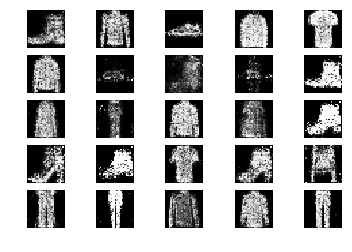

10201 [D loss: 0.701789, acc.: 59.38%] [G loss: 0.937220]
10202 [D loss: 0.618156, acc.: 64.06%] [G loss: 0.882090]
10203 [D loss: 0.664041, acc.: 54.69%] [G loss: 1.040440]
10204 [D loss: 0.637038, acc.: 64.06%] [G loss: 0.924664]
10205 [D loss: 0.672617, acc.: 62.50%] [G loss: 0.859194]
10206 [D loss: 0.686233, acc.: 53.12%] [G loss: 0.867928]
10207 [D loss: 0.669755, acc.: 62.50%] [G loss: 0.925618]
10208 [D loss: 0.693289, acc.: 56.25%] [G loss: 0.825070]
10209 [D loss: 0.718249, acc.: 51.56%] [G loss: 0.860404]
10210 [D loss: 0.629819, acc.: 65.62%] [G loss: 0.874426]
10211 [D loss: 0.716055, acc.: 54.69%] [G loss: 0.814570]
10212 [D loss: 0.612278, acc.: 70.31%] [G loss: 0.909247]
10213 [D loss: 0.668408, acc.: 54.69%] [G loss: 0.832199]
10214 [D loss: 0.675874, acc.: 64.06%] [G loss: 0.917899]
10215 [D loss: 0.736033, acc.: 50.00%] [G loss: 0.935684]
10216 [D loss: 0.654872, acc.: 64.06%] [G loss: 0.860845]
10217 [D loss: 0.655831, acc.: 62.50%] [G loss: 0.906362]
10218 [D loss:

10343 [D loss: 0.645004, acc.: 59.38%] [G loss: 0.967669]
10344 [D loss: 0.656655, acc.: 59.38%] [G loss: 0.985573]
10345 [D loss: 0.668142, acc.: 57.81%] [G loss: 0.890950]
10346 [D loss: 0.704327, acc.: 57.81%] [G loss: 0.861125]
10347 [D loss: 0.702871, acc.: 48.44%] [G loss: 0.927330]
10348 [D loss: 0.676709, acc.: 59.38%] [G loss: 0.892987]
10349 [D loss: 0.622677, acc.: 65.62%] [G loss: 0.929039]
10350 [D loss: 0.653390, acc.: 68.75%] [G loss: 0.925730]
10351 [D loss: 0.680042, acc.: 60.94%] [G loss: 0.910808]
10352 [D loss: 0.665875, acc.: 62.50%] [G loss: 0.840305]
10353 [D loss: 0.673736, acc.: 60.94%] [G loss: 0.854407]
10354 [D loss: 0.644755, acc.: 64.06%] [G loss: 0.914177]
10355 [D loss: 0.727404, acc.: 51.56%] [G loss: 0.862530]
10356 [D loss: 0.672689, acc.: 57.81%] [G loss: 0.880057]
10357 [D loss: 0.693052, acc.: 59.38%] [G loss: 0.894551]
10358 [D loss: 0.650104, acc.: 65.62%] [G loss: 0.903145]
10359 [D loss: 0.694185, acc.: 64.06%] [G loss: 0.935287]
10360 [D loss:

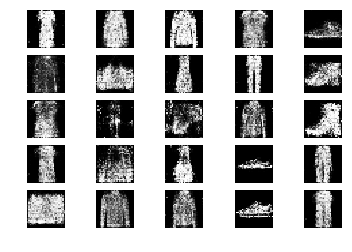

10401 [D loss: 0.717083, acc.: 56.25%] [G loss: 0.911397]
10402 [D loss: 0.710620, acc.: 48.44%] [G loss: 0.864823]
10403 [D loss: 0.677007, acc.: 54.69%] [G loss: 0.953860]
10404 [D loss: 0.709654, acc.: 54.69%] [G loss: 0.923924]
10405 [D loss: 0.672513, acc.: 56.25%] [G loss: 0.881087]
10406 [D loss: 0.640546, acc.: 62.50%] [G loss: 0.891418]
10407 [D loss: 0.716483, acc.: 57.81%] [G loss: 0.866399]
10408 [D loss: 0.679240, acc.: 59.38%] [G loss: 0.959185]
10409 [D loss: 0.665757, acc.: 54.69%] [G loss: 0.933223]
10410 [D loss: 0.614204, acc.: 59.38%] [G loss: 0.980725]
10411 [D loss: 0.641935, acc.: 62.50%] [G loss: 1.000260]
10412 [D loss: 0.622810, acc.: 67.19%] [G loss: 0.918869]
10413 [D loss: 0.650208, acc.: 68.75%] [G loss: 0.937208]
10414 [D loss: 0.656318, acc.: 60.94%] [G loss: 0.861944]
10415 [D loss: 0.676903, acc.: 59.38%] [G loss: 0.874011]
10416 [D loss: 0.640690, acc.: 59.38%] [G loss: 0.904273]
10417 [D loss: 0.649294, acc.: 65.62%] [G loss: 0.854552]
10418 [D loss:

10543 [D loss: 0.625133, acc.: 60.94%] [G loss: 0.832495]
10544 [D loss: 0.568050, acc.: 70.31%] [G loss: 0.851091]
10545 [D loss: 0.690564, acc.: 53.12%] [G loss: 0.829270]
10546 [D loss: 0.633936, acc.: 62.50%] [G loss: 0.889794]
10547 [D loss: 0.672331, acc.: 57.81%] [G loss: 0.807651]
10548 [D loss: 0.676908, acc.: 65.62%] [G loss: 0.843252]
10549 [D loss: 0.600293, acc.: 73.44%] [G loss: 0.825809]
10550 [D loss: 0.631123, acc.: 62.50%] [G loss: 0.796988]
10551 [D loss: 0.744090, acc.: 48.44%] [G loss: 0.860871]
10552 [D loss: 0.641335, acc.: 65.62%] [G loss: 0.871426]
10553 [D loss: 0.699091, acc.: 60.94%] [G loss: 0.892264]
10554 [D loss: 0.714496, acc.: 56.25%] [G loss: 1.008963]
10555 [D loss: 0.671240, acc.: 64.06%] [G loss: 1.014954]
10556 [D loss: 0.684655, acc.: 53.12%] [G loss: 0.932317]
10557 [D loss: 0.673694, acc.: 60.94%] [G loss: 0.924222]
10558 [D loss: 0.707933, acc.: 56.25%] [G loss: 0.912481]
10559 [D loss: 0.684617, acc.: 51.56%] [G loss: 0.872539]
10560 [D loss:

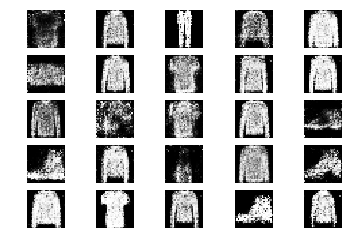

10601 [D loss: 0.701023, acc.: 56.25%] [G loss: 0.770975]
10602 [D loss: 0.626973, acc.: 65.62%] [G loss: 0.892341]
10603 [D loss: 0.659542, acc.: 64.06%] [G loss: 0.874849]
10604 [D loss: 0.679732, acc.: 56.25%] [G loss: 0.839533]
10605 [D loss: 0.609967, acc.: 62.50%] [G loss: 0.871105]
10606 [D loss: 0.661282, acc.: 57.81%] [G loss: 0.864338]
10607 [D loss: 0.624486, acc.: 65.62%] [G loss: 0.986193]
10608 [D loss: 0.674176, acc.: 53.12%] [G loss: 0.969736]
10609 [D loss: 0.711740, acc.: 53.12%] [G loss: 0.883952]
10610 [D loss: 0.700994, acc.: 51.56%] [G loss: 0.899862]
10611 [D loss: 0.613706, acc.: 79.69%] [G loss: 0.901542]
10612 [D loss: 0.660462, acc.: 68.75%] [G loss: 0.944710]
10613 [D loss: 0.640924, acc.: 57.81%] [G loss: 0.880178]
10614 [D loss: 0.644238, acc.: 65.62%] [G loss: 0.981223]
10615 [D loss: 0.658205, acc.: 57.81%] [G loss: 0.876050]
10616 [D loss: 0.615139, acc.: 73.44%] [G loss: 0.886009]
10617 [D loss: 0.648764, acc.: 62.50%] [G loss: 0.870251]
10618 [D loss:

10745 [D loss: 0.684085, acc.: 54.69%] [G loss: 0.853937]
10746 [D loss: 0.626242, acc.: 62.50%] [G loss: 0.796795]
10747 [D loss: 0.619305, acc.: 67.19%] [G loss: 0.848094]
10748 [D loss: 0.645952, acc.: 65.62%] [G loss: 0.878935]
10749 [D loss: 0.571038, acc.: 73.44%] [G loss: 0.862014]
10750 [D loss: 0.626512, acc.: 59.38%] [G loss: 0.907423]
10751 [D loss: 0.637471, acc.: 60.94%] [G loss: 0.886690]
10752 [D loss: 0.635885, acc.: 62.50%] [G loss: 0.864818]
10753 [D loss: 0.610170, acc.: 67.19%] [G loss: 0.855968]
10754 [D loss: 0.625985, acc.: 59.38%] [G loss: 0.904667]
10755 [D loss: 0.642078, acc.: 57.81%] [G loss: 0.883851]
10756 [D loss: 0.621543, acc.: 70.31%] [G loss: 0.906775]
10757 [D loss: 0.619518, acc.: 64.06%] [G loss: 0.901084]
10758 [D loss: 0.733648, acc.: 48.44%] [G loss: 0.942722]
10759 [D loss: 0.707966, acc.: 48.44%] [G loss: 0.870143]
10760 [D loss: 0.595136, acc.: 68.75%] [G loss: 0.953089]
10761 [D loss: 0.708739, acc.: 50.00%] [G loss: 0.903557]
10762 [D loss:

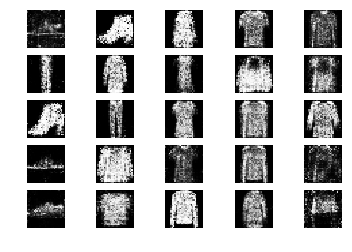

10801 [D loss: 0.586220, acc.: 65.62%] [G loss: 0.858715]
10802 [D loss: 0.607559, acc.: 64.06%] [G loss: 0.914262]
10803 [D loss: 0.676902, acc.: 53.12%] [G loss: 0.896871]
10804 [D loss: 0.626725, acc.: 60.94%] [G loss: 0.875628]
10805 [D loss: 0.659910, acc.: 59.38%] [G loss: 0.867644]
10806 [D loss: 0.653716, acc.: 64.06%] [G loss: 0.813704]
10807 [D loss: 0.694409, acc.: 57.81%] [G loss: 0.897290]
10808 [D loss: 0.656428, acc.: 70.31%] [G loss: 0.954580]
10809 [D loss: 0.677778, acc.: 56.25%] [G loss: 0.958648]
10810 [D loss: 0.690353, acc.: 50.00%] [G loss: 0.975309]
10811 [D loss: 0.684554, acc.: 59.38%] [G loss: 0.873174]
10812 [D loss: 0.672838, acc.: 53.12%] [G loss: 0.854264]
10813 [D loss: 0.649996, acc.: 64.06%] [G loss: 0.854347]
10814 [D loss: 0.708505, acc.: 48.44%] [G loss: 0.844486]
10815 [D loss: 0.689348, acc.: 54.69%] [G loss: 0.853596]
10816 [D loss: 0.648396, acc.: 64.06%] [G loss: 0.803590]
10817 [D loss: 0.646534, acc.: 65.62%] [G loss: 0.845683]
10818 [D loss:

10944 [D loss: 0.691504, acc.: 54.69%] [G loss: 0.851562]
10945 [D loss: 0.725427, acc.: 48.44%] [G loss: 0.885047]
10946 [D loss: 0.692947, acc.: 48.44%] [G loss: 0.907130]
10947 [D loss: 0.681028, acc.: 53.12%] [G loss: 0.944644]
10948 [D loss: 0.649457, acc.: 57.81%] [G loss: 0.939956]
10949 [D loss: 0.671112, acc.: 59.38%] [G loss: 0.777288]
10950 [D loss: 0.675748, acc.: 57.81%] [G loss: 0.897692]
10951 [D loss: 0.653721, acc.: 57.81%] [G loss: 0.854345]
10952 [D loss: 0.595088, acc.: 67.19%] [G loss: 0.966891]
10953 [D loss: 0.638661, acc.: 62.50%] [G loss: 0.930218]
10954 [D loss: 0.642991, acc.: 68.75%] [G loss: 0.925815]
10955 [D loss: 0.718077, acc.: 51.56%] [G loss: 0.859046]
10956 [D loss: 0.661982, acc.: 60.94%] [G loss: 0.905581]
10957 [D loss: 0.673504, acc.: 54.69%] [G loss: 0.937959]
10958 [D loss: 0.646059, acc.: 65.62%] [G loss: 0.884047]
10959 [D loss: 0.691743, acc.: 59.38%] [G loss: 0.875402]
10960 [D loss: 0.630479, acc.: 73.44%] [G loss: 0.934221]
10961 [D loss:

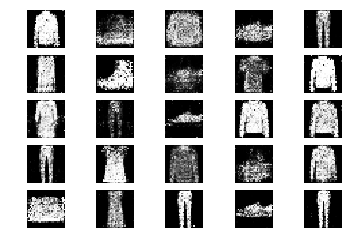

11001 [D loss: 0.658947, acc.: 65.62%] [G loss: 0.877519]
11002 [D loss: 0.650235, acc.: 62.50%] [G loss: 0.940499]
11003 [D loss: 0.626722, acc.: 65.62%] [G loss: 0.880938]
11004 [D loss: 0.687415, acc.: 59.38%] [G loss: 0.869777]
11005 [D loss: 0.710320, acc.: 48.44%] [G loss: 0.927211]
11006 [D loss: 0.637464, acc.: 68.75%] [G loss: 0.841738]
11007 [D loss: 0.608078, acc.: 67.19%] [G loss: 0.872454]
11008 [D loss: 0.655958, acc.: 67.19%] [G loss: 0.871946]
11009 [D loss: 0.705993, acc.: 57.81%] [G loss: 0.995730]
11010 [D loss: 0.633183, acc.: 68.75%] [G loss: 0.964708]
11011 [D loss: 0.620634, acc.: 70.31%] [G loss: 0.929195]
11012 [D loss: 0.656577, acc.: 60.94%] [G loss: 1.003138]
11013 [D loss: 0.654844, acc.: 62.50%] [G loss: 0.962101]
11014 [D loss: 0.670028, acc.: 65.62%] [G loss: 0.891694]
11015 [D loss: 0.650957, acc.: 60.94%] [G loss: 0.874132]
11016 [D loss: 0.661089, acc.: 59.38%] [G loss: 0.949129]
11017 [D loss: 0.679128, acc.: 56.25%] [G loss: 0.889610]
11018 [D loss:

11144 [D loss: 0.598708, acc.: 62.50%] [G loss: 0.950036]
11145 [D loss: 0.669609, acc.: 60.94%] [G loss: 0.919129]
11146 [D loss: 0.659513, acc.: 64.06%] [G loss: 0.888271]
11147 [D loss: 0.637629, acc.: 60.94%] [G loss: 0.908694]
11148 [D loss: 0.633723, acc.: 65.62%] [G loss: 0.869210]
11149 [D loss: 0.587937, acc.: 68.75%] [G loss: 0.903669]
11150 [D loss: 0.660363, acc.: 60.94%] [G loss: 0.888198]
11151 [D loss: 0.663795, acc.: 56.25%] [G loss: 0.961501]
11152 [D loss: 0.618022, acc.: 71.88%] [G loss: 0.858054]
11153 [D loss: 0.685564, acc.: 54.69%] [G loss: 0.859777]
11154 [D loss: 0.586000, acc.: 71.88%] [G loss: 0.853801]
11155 [D loss: 0.651967, acc.: 59.38%] [G loss: 0.907128]
11156 [D loss: 0.703737, acc.: 54.69%] [G loss: 0.913673]
11157 [D loss: 0.644631, acc.: 67.19%] [G loss: 0.868836]
11158 [D loss: 0.663225, acc.: 62.50%] [G loss: 0.914872]
11159 [D loss: 0.637050, acc.: 64.06%] [G loss: 0.883299]
11160 [D loss: 0.650788, acc.: 56.25%] [G loss: 0.854813]
11161 [D loss:

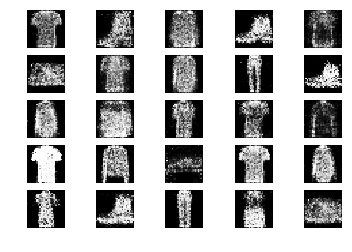

11201 [D loss: 0.679485, acc.: 60.94%] [G loss: 0.899606]
11202 [D loss: 0.646476, acc.: 67.19%] [G loss: 0.976428]
11203 [D loss: 0.621043, acc.: 62.50%] [G loss: 0.886820]
11204 [D loss: 0.624143, acc.: 70.31%] [G loss: 0.912737]
11205 [D loss: 0.632072, acc.: 65.62%] [G loss: 0.882633]
11206 [D loss: 0.697712, acc.: 50.00%] [G loss: 0.877904]
11207 [D loss: 0.652626, acc.: 62.50%] [G loss: 0.843501]
11208 [D loss: 0.652529, acc.: 64.06%] [G loss: 0.864228]
11209 [D loss: 0.640067, acc.: 65.62%] [G loss: 0.898071]
11210 [D loss: 0.689706, acc.: 56.25%] [G loss: 0.889849]
11211 [D loss: 0.632046, acc.: 64.06%] [G loss: 0.959480]
11212 [D loss: 0.712535, acc.: 57.81%] [G loss: 0.946405]
11213 [D loss: 0.650818, acc.: 64.06%] [G loss: 0.962230]
11214 [D loss: 0.694313, acc.: 56.25%] [G loss: 0.935381]
11215 [D loss: 0.634592, acc.: 67.19%] [G loss: 0.858866]
11216 [D loss: 0.665210, acc.: 59.38%] [G loss: 0.835847]
11217 [D loss: 0.699390, acc.: 56.25%] [G loss: 0.767535]
11218 [D loss:

11344 [D loss: 0.627871, acc.: 71.88%] [G loss: 0.877543]
11345 [D loss: 0.579427, acc.: 65.62%] [G loss: 0.889639]
11346 [D loss: 0.653308, acc.: 56.25%] [G loss: 0.965595]
11347 [D loss: 0.642570, acc.: 62.50%] [G loss: 0.876788]
11348 [D loss: 0.690631, acc.: 57.81%] [G loss: 0.899141]
11349 [D loss: 0.636847, acc.: 62.50%] [G loss: 0.810768]
11350 [D loss: 0.639246, acc.: 67.19%] [G loss: 0.917636]
11351 [D loss: 0.617590, acc.: 71.88%] [G loss: 0.842153]
11352 [D loss: 0.701257, acc.: 54.69%] [G loss: 0.863376]
11353 [D loss: 0.667858, acc.: 56.25%] [G loss: 0.735733]
11354 [D loss: 0.663527, acc.: 59.38%] [G loss: 0.816152]
11355 [D loss: 0.645247, acc.: 60.94%] [G loss: 0.824194]
11356 [D loss: 0.683450, acc.: 64.06%] [G loss: 0.851715]
11357 [D loss: 0.653327, acc.: 57.81%] [G loss: 0.774217]
11358 [D loss: 0.647822, acc.: 59.38%] [G loss: 0.808960]
11359 [D loss: 0.663611, acc.: 68.75%] [G loss: 0.884865]
11360 [D loss: 0.625691, acc.: 67.19%] [G loss: 0.921654]
11361 [D loss:

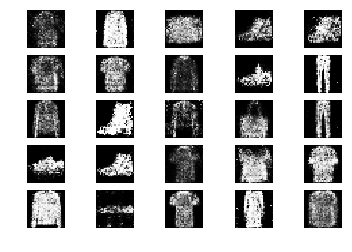

11401 [D loss: 0.598513, acc.: 71.88%] [G loss: 0.921441]
11402 [D loss: 0.638051, acc.: 65.62%] [G loss: 0.869741]
11403 [D loss: 0.711089, acc.: 54.69%] [G loss: 0.905643]
11404 [D loss: 0.651300, acc.: 62.50%] [G loss: 0.924308]
11405 [D loss: 0.659676, acc.: 62.50%] [G loss: 0.895406]
11406 [D loss: 0.573402, acc.: 78.12%] [G loss: 1.039087]
11407 [D loss: 0.644304, acc.: 59.38%] [G loss: 0.979553]
11408 [D loss: 0.664103, acc.: 53.12%] [G loss: 0.873986]
11409 [D loss: 0.667449, acc.: 53.12%] [G loss: 0.861535]
11410 [D loss: 0.746680, acc.: 50.00%] [G loss: 0.857480]
11411 [D loss: 0.642605, acc.: 65.62%] [G loss: 0.845298]
11412 [D loss: 0.652752, acc.: 56.25%] [G loss: 0.740108]
11413 [D loss: 0.661685, acc.: 57.81%] [G loss: 0.819491]
11414 [D loss: 0.674295, acc.: 56.25%] [G loss: 0.891588]
11415 [D loss: 0.659336, acc.: 60.94%] [G loss: 0.869020]
11416 [D loss: 0.688660, acc.: 51.56%] [G loss: 0.858826]
11417 [D loss: 0.633875, acc.: 62.50%] [G loss: 0.867806]
11418 [D loss:

11545 [D loss: 0.714967, acc.: 50.00%] [G loss: 0.799717]
11546 [D loss: 0.610364, acc.: 75.00%] [G loss: 0.883254]
11547 [D loss: 0.654470, acc.: 57.81%] [G loss: 0.837217]
11548 [D loss: 0.658065, acc.: 56.25%] [G loss: 0.933242]
11549 [D loss: 0.686228, acc.: 56.25%] [G loss: 0.951647]
11550 [D loss: 0.637817, acc.: 64.06%] [G loss: 0.911052]
11551 [D loss: 0.635871, acc.: 67.19%] [G loss: 0.831061]
11552 [D loss: 0.622660, acc.: 68.75%] [G loss: 0.898536]
11553 [D loss: 0.620250, acc.: 71.88%] [G loss: 0.888365]
11554 [D loss: 0.656369, acc.: 57.81%] [G loss: 0.877027]
11555 [D loss: 0.625569, acc.: 57.81%] [G loss: 0.813761]
11556 [D loss: 0.636360, acc.: 60.94%] [G loss: 0.848206]
11557 [D loss: 0.669380, acc.: 53.12%] [G loss: 0.905489]
11558 [D loss: 0.584905, acc.: 70.31%] [G loss: 0.873232]
11559 [D loss: 0.646060, acc.: 57.81%] [G loss: 0.866996]
11560 [D loss: 0.644094, acc.: 60.94%] [G loss: 0.916024]
11561 [D loss: 0.601737, acc.: 64.06%] [G loss: 0.970487]
11562 [D loss:

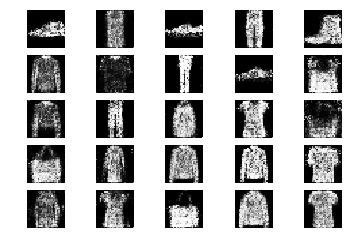

11601 [D loss: 0.615348, acc.: 57.81%] [G loss: 0.891648]
11602 [D loss: 0.653977, acc.: 59.38%] [G loss: 0.945176]
11603 [D loss: 0.668443, acc.: 57.81%] [G loss: 0.908340]
11604 [D loss: 0.630888, acc.: 67.19%] [G loss: 0.864286]
11605 [D loss: 0.645790, acc.: 67.19%] [G loss: 0.916298]
11606 [D loss: 0.693681, acc.: 56.25%] [G loss: 0.953220]
11607 [D loss: 0.646241, acc.: 64.06%] [G loss: 1.008695]
11608 [D loss: 0.664229, acc.: 62.50%] [G loss: 0.851298]
11609 [D loss: 0.685361, acc.: 59.38%] [G loss: 0.918558]
11610 [D loss: 0.600636, acc.: 68.75%] [G loss: 0.897810]
11611 [D loss: 0.697456, acc.: 56.25%] [G loss: 0.866928]
11612 [D loss: 0.644544, acc.: 60.94%] [G loss: 0.882866]
11613 [D loss: 0.595387, acc.: 70.31%] [G loss: 0.869405]
11614 [D loss: 0.590381, acc.: 67.19%] [G loss: 0.863661]
11615 [D loss: 0.703057, acc.: 50.00%] [G loss: 0.850023]
11616 [D loss: 0.566099, acc.: 76.56%] [G loss: 0.924308]
11617 [D loss: 0.662439, acc.: 60.94%] [G loss: 0.825807]
11618 [D loss:

11745 [D loss: 0.645043, acc.: 64.06%] [G loss: 0.884378]
11746 [D loss: 0.664240, acc.: 62.50%] [G loss: 0.886496]
11747 [D loss: 0.664578, acc.: 57.81%] [G loss: 0.935894]
11748 [D loss: 0.650608, acc.: 64.06%] [G loss: 0.810341]
11749 [D loss: 0.677116, acc.: 65.62%] [G loss: 0.925858]
11750 [D loss: 0.643152, acc.: 60.94%] [G loss: 0.876706]
11751 [D loss: 0.674526, acc.: 56.25%] [G loss: 0.890806]
11752 [D loss: 0.659831, acc.: 64.06%] [G loss: 0.872979]
11753 [D loss: 0.611625, acc.: 64.06%] [G loss: 0.990154]
11754 [D loss: 0.714921, acc.: 51.56%] [G loss: 0.990256]
11755 [D loss: 0.642619, acc.: 64.06%] [G loss: 0.876888]
11756 [D loss: 0.646052, acc.: 59.38%] [G loss: 0.901305]
11757 [D loss: 0.642983, acc.: 59.38%] [G loss: 0.859322]
11758 [D loss: 0.651047, acc.: 64.06%] [G loss: 0.815679]
11759 [D loss: 0.724122, acc.: 60.94%] [G loss: 0.856573]
11760 [D loss: 0.628063, acc.: 67.19%] [G loss: 0.848668]
11761 [D loss: 0.653128, acc.: 64.06%] [G loss: 0.879601]
11762 [D loss:

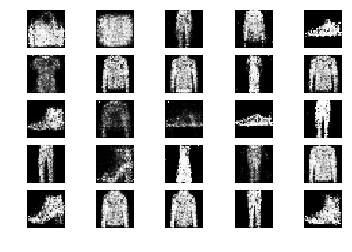

11801 [D loss: 0.711991, acc.: 51.56%] [G loss: 0.870774]
11802 [D loss: 0.710540, acc.: 50.00%] [G loss: 0.877328]
11803 [D loss: 0.677218, acc.: 56.25%] [G loss: 0.958531]
11804 [D loss: 0.629190, acc.: 65.62%] [G loss: 0.937331]
11805 [D loss: 0.682907, acc.: 60.94%] [G loss: 0.869680]
11806 [D loss: 0.642561, acc.: 65.62%] [G loss: 0.943014]
11807 [D loss: 0.656266, acc.: 54.69%] [G loss: 0.953758]
11808 [D loss: 0.692908, acc.: 57.81%] [G loss: 0.907005]
11809 [D loss: 0.630676, acc.: 62.50%] [G loss: 0.920579]
11810 [D loss: 0.656647, acc.: 65.62%] [G loss: 0.924143]
11811 [D loss: 0.640278, acc.: 60.94%] [G loss: 0.904156]
11812 [D loss: 0.648139, acc.: 64.06%] [G loss: 0.810147]
11813 [D loss: 0.685528, acc.: 64.06%] [G loss: 0.882290]
11814 [D loss: 0.650542, acc.: 56.25%] [G loss: 0.905667]
11815 [D loss: 0.656178, acc.: 57.81%] [G loss: 0.964680]
11816 [D loss: 0.618164, acc.: 65.62%] [G loss: 1.009194]
11817 [D loss: 0.659138, acc.: 62.50%] [G loss: 0.938005]
11818 [D loss:

11943 [D loss: 0.674852, acc.: 60.94%] [G loss: 0.787268]
11944 [D loss: 0.634349, acc.: 60.94%] [G loss: 0.819185]
11945 [D loss: 0.637870, acc.: 67.19%] [G loss: 0.849345]
11946 [D loss: 0.692436, acc.: 57.81%] [G loss: 0.848552]
11947 [D loss: 0.606739, acc.: 64.06%] [G loss: 0.829340]
11948 [D loss: 0.673677, acc.: 60.94%] [G loss: 0.786956]
11949 [D loss: 0.787292, acc.: 48.44%] [G loss: 0.831289]
11950 [D loss: 0.636569, acc.: 73.44%] [G loss: 0.924862]
11951 [D loss: 0.684567, acc.: 51.56%] [G loss: 0.926761]
11952 [D loss: 0.667014, acc.: 57.81%] [G loss: 0.954667]
11953 [D loss: 0.752482, acc.: 48.44%] [G loss: 0.882692]
11954 [D loss: 0.675112, acc.: 56.25%] [G loss: 0.820853]
11955 [D loss: 0.653863, acc.: 57.81%] [G loss: 0.912773]
11956 [D loss: 0.632039, acc.: 68.75%] [G loss: 0.860822]
11957 [D loss: 0.642081, acc.: 70.31%] [G loss: 0.940088]
11958 [D loss: 0.630630, acc.: 64.06%] [G loss: 0.945434]
11959 [D loss: 0.657838, acc.: 65.62%] [G loss: 0.944676]
11960 [D loss:

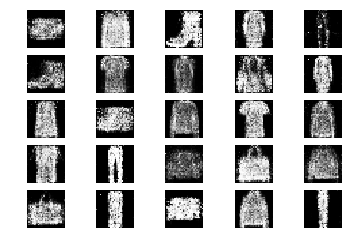

12001 [D loss: 0.658752, acc.: 59.38%] [G loss: 0.875888]
12002 [D loss: 0.694242, acc.: 59.38%] [G loss: 0.974843]
12003 [D loss: 0.579503, acc.: 75.00%] [G loss: 0.898120]
12004 [D loss: 0.694308, acc.: 54.69%] [G loss: 0.945563]
12005 [D loss: 0.653027, acc.: 56.25%] [G loss: 0.937544]
12006 [D loss: 0.599279, acc.: 75.00%] [G loss: 0.927668]
12007 [D loss: 0.674776, acc.: 48.44%] [G loss: 0.937426]
12008 [D loss: 0.684591, acc.: 60.94%] [G loss: 0.934091]
12009 [D loss: 0.668792, acc.: 60.94%] [G loss: 0.870212]
12010 [D loss: 0.673721, acc.: 59.38%] [G loss: 0.896101]
12011 [D loss: 0.661058, acc.: 62.50%] [G loss: 0.916117]
12012 [D loss: 0.635689, acc.: 67.19%] [G loss: 0.859150]
12013 [D loss: 0.646434, acc.: 64.06%] [G loss: 0.924540]
12014 [D loss: 0.613923, acc.: 73.44%] [G loss: 0.876093]
12015 [D loss: 0.655154, acc.: 62.50%] [G loss: 0.891467]
12016 [D loss: 0.636802, acc.: 59.38%] [G loss: 0.893293]
12017 [D loss: 0.656640, acc.: 64.06%] [G loss: 0.990223]
12018 [D loss:

12144 [D loss: 0.655682, acc.: 64.06%] [G loss: 1.016991]
12145 [D loss: 0.629066, acc.: 64.06%] [G loss: 0.902388]
12146 [D loss: 0.666934, acc.: 57.81%] [G loss: 0.892667]
12147 [D loss: 0.710819, acc.: 51.56%] [G loss: 0.916297]
12148 [D loss: 0.656271, acc.: 59.38%] [G loss: 0.952974]
12149 [D loss: 0.667989, acc.: 67.19%] [G loss: 0.888450]
12150 [D loss: 0.605015, acc.: 65.62%] [G loss: 0.861872]
12151 [D loss: 0.660804, acc.: 60.94%] [G loss: 0.879691]
12152 [D loss: 0.663036, acc.: 60.94%] [G loss: 0.983160]
12153 [D loss: 0.652817, acc.: 60.94%] [G loss: 0.983554]
12154 [D loss: 0.652949, acc.: 53.12%] [G loss: 0.996632]
12155 [D loss: 0.564389, acc.: 78.12%] [G loss: 0.895878]
12156 [D loss: 0.620060, acc.: 65.62%] [G loss: 0.982140]
12157 [D loss: 0.720995, acc.: 40.62%] [G loss: 0.926661]
12158 [D loss: 0.693565, acc.: 50.00%] [G loss: 0.958250]
12159 [D loss: 0.643226, acc.: 62.50%] [G loss: 0.908286]
12160 [D loss: 0.667793, acc.: 48.44%] [G loss: 0.893431]
12161 [D loss:

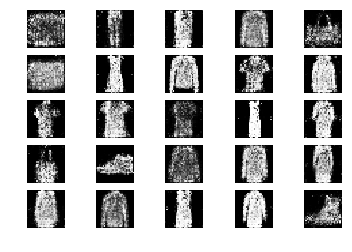

12201 [D loss: 0.655047, acc.: 57.81%] [G loss: 0.862772]
12202 [D loss: 0.666381, acc.: 64.06%] [G loss: 0.894324]
12203 [D loss: 0.658631, acc.: 62.50%] [G loss: 0.829687]
12204 [D loss: 0.739820, acc.: 45.31%] [G loss: 0.847243]
12205 [D loss: 0.680973, acc.: 56.25%] [G loss: 0.914008]
12206 [D loss: 0.649289, acc.: 62.50%] [G loss: 0.911437]
12207 [D loss: 0.607607, acc.: 70.31%] [G loss: 0.939993]
12208 [D loss: 0.668676, acc.: 62.50%] [G loss: 1.004736]
12209 [D loss: 0.683995, acc.: 59.38%] [G loss: 0.899818]
12210 [D loss: 0.685796, acc.: 50.00%] [G loss: 0.912631]
12211 [D loss: 0.681699, acc.: 59.38%] [G loss: 0.905527]
12212 [D loss: 0.685445, acc.: 59.38%] [G loss: 0.909856]
12213 [D loss: 0.636790, acc.: 65.62%] [G loss: 0.896940]
12214 [D loss: 0.682392, acc.: 60.94%] [G loss: 0.915273]
12215 [D loss: 0.692982, acc.: 57.81%] [G loss: 0.852377]
12216 [D loss: 0.638639, acc.: 65.62%] [G loss: 0.866236]
12217 [D loss: 0.662164, acc.: 59.38%] [G loss: 0.858212]
12218 [D loss:

12344 [D loss: 0.660774, acc.: 59.38%] [G loss: 0.905742]
12345 [D loss: 0.706050, acc.: 59.38%] [G loss: 0.896718]
12346 [D loss: 0.613191, acc.: 60.94%] [G loss: 0.962895]
12347 [D loss: 0.692765, acc.: 57.81%] [G loss: 0.889369]
12348 [D loss: 0.724379, acc.: 51.56%] [G loss: 0.862869]
12349 [D loss: 0.613427, acc.: 67.19%] [G loss: 0.915654]
12350 [D loss: 0.680372, acc.: 54.69%] [G loss: 0.911883]
12351 [D loss: 0.657971, acc.: 64.06%] [G loss: 0.852666]
12352 [D loss: 0.654573, acc.: 65.62%] [G loss: 0.914671]
12353 [D loss: 0.637906, acc.: 67.19%] [G loss: 0.875370]
12354 [D loss: 0.641210, acc.: 67.19%] [G loss: 0.857332]
12355 [D loss: 0.680763, acc.: 51.56%] [G loss: 0.884081]
12356 [D loss: 0.628294, acc.: 59.38%] [G loss: 0.852000]
12357 [D loss: 0.598552, acc.: 70.31%] [G loss: 0.948450]
12358 [D loss: 0.597385, acc.: 65.62%] [G loss: 0.909411]
12359 [D loss: 0.652539, acc.: 60.94%] [G loss: 0.958838]
12360 [D loss: 0.741593, acc.: 51.56%] [G loss: 0.955293]
12361 [D loss:

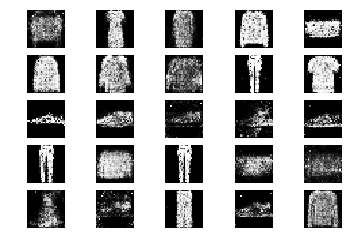

12401 [D loss: 0.653693, acc.: 56.25%] [G loss: 1.078095]
12402 [D loss: 0.688052, acc.: 57.81%] [G loss: 0.979097]
12403 [D loss: 0.745917, acc.: 53.12%] [G loss: 0.914242]
12404 [D loss: 0.613746, acc.: 75.00%] [G loss: 0.855792]
12405 [D loss: 0.670105, acc.: 54.69%] [G loss: 0.932448]
12406 [D loss: 0.598440, acc.: 71.88%] [G loss: 0.902249]
12407 [D loss: 0.648514, acc.: 67.19%] [G loss: 0.931657]
12408 [D loss: 0.611536, acc.: 70.31%] [G loss: 0.923951]
12409 [D loss: 0.583293, acc.: 75.00%] [G loss: 0.826476]
12410 [D loss: 0.635909, acc.: 57.81%] [G loss: 0.887535]
12411 [D loss: 0.640151, acc.: 71.88%] [G loss: 0.900680]
12412 [D loss: 0.639026, acc.: 62.50%] [G loss: 0.906608]
12413 [D loss: 0.619134, acc.: 65.62%] [G loss: 0.851672]
12414 [D loss: 0.600437, acc.: 68.75%] [G loss: 0.946131]
12415 [D loss: 0.655310, acc.: 59.38%] [G loss: 0.919677]
12416 [D loss: 0.661671, acc.: 62.50%] [G loss: 0.939966]
12417 [D loss: 0.709365, acc.: 54.69%] [G loss: 0.953904]
12418 [D loss:

12544 [D loss: 0.707735, acc.: 54.69%] [G loss: 0.928992]
12545 [D loss: 0.587591, acc.: 75.00%] [G loss: 0.952873]
12546 [D loss: 0.636017, acc.: 57.81%] [G loss: 0.941411]
12547 [D loss: 0.722595, acc.: 51.56%] [G loss: 0.892843]
12548 [D loss: 0.688945, acc.: 60.94%] [G loss: 0.870719]
12549 [D loss: 0.703586, acc.: 53.12%] [G loss: 0.920230]
12550 [D loss: 0.629318, acc.: 65.62%] [G loss: 0.915625]
12551 [D loss: 0.629342, acc.: 68.75%] [G loss: 0.904059]
12552 [D loss: 0.641069, acc.: 68.75%] [G loss: 0.858872]
12553 [D loss: 0.600325, acc.: 68.75%] [G loss: 0.843563]
12554 [D loss: 0.706640, acc.: 54.69%] [G loss: 0.832755]
12555 [D loss: 0.699908, acc.: 54.69%] [G loss: 0.902385]
12556 [D loss: 0.629201, acc.: 60.94%] [G loss: 0.959492]
12557 [D loss: 0.720805, acc.: 50.00%] [G loss: 0.940184]
12558 [D loss: 0.645541, acc.: 64.06%] [G loss: 0.976529]
12559 [D loss: 0.652919, acc.: 59.38%] [G loss: 0.944860]
12560 [D loss: 0.665967, acc.: 59.38%] [G loss: 0.879810]
12561 [D loss:

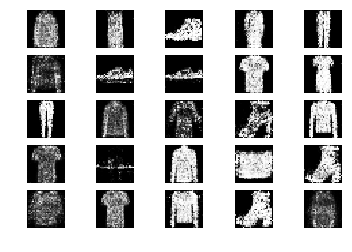

12601 [D loss: 0.682389, acc.: 56.25%] [G loss: 0.982766]
12602 [D loss: 0.608661, acc.: 67.19%] [G loss: 0.876128]
12603 [D loss: 0.604615, acc.: 65.62%] [G loss: 0.878753]
12604 [D loss: 0.691145, acc.: 56.25%] [G loss: 0.949086]
12605 [D loss: 0.646755, acc.: 59.38%] [G loss: 0.989586]
12606 [D loss: 0.685254, acc.: 56.25%] [G loss: 0.892280]
12607 [D loss: 0.617274, acc.: 59.38%] [G loss: 0.884430]
12608 [D loss: 0.616883, acc.: 64.06%] [G loss: 0.827494]
12609 [D loss: 0.706996, acc.: 51.56%] [G loss: 0.845583]
12610 [D loss: 0.639727, acc.: 57.81%] [G loss: 0.957118]
12611 [D loss: 0.691559, acc.: 64.06%] [G loss: 0.867504]
12612 [D loss: 0.720941, acc.: 50.00%] [G loss: 0.878294]
12613 [D loss: 0.617592, acc.: 62.50%] [G loss: 0.894967]
12614 [D loss: 0.657954, acc.: 62.50%] [G loss: 0.906288]
12615 [D loss: 0.647942, acc.: 60.94%] [G loss: 0.889567]
12616 [D loss: 0.695878, acc.: 50.00%] [G loss: 0.950123]
12617 [D loss: 0.670547, acc.: 59.38%] [G loss: 0.937830]
12618 [D loss:

12746 [D loss: 0.719730, acc.: 45.31%] [G loss: 0.893019]
12747 [D loss: 0.663388, acc.: 57.81%] [G loss: 0.862558]
12748 [D loss: 0.630832, acc.: 64.06%] [G loss: 0.841240]
12749 [D loss: 0.658520, acc.: 51.56%] [G loss: 0.752461]
12750 [D loss: 0.657212, acc.: 57.81%] [G loss: 0.814584]
12751 [D loss: 0.670438, acc.: 59.38%] [G loss: 0.849618]
12752 [D loss: 0.716607, acc.: 51.56%] [G loss: 0.787444]
12753 [D loss: 0.723116, acc.: 48.44%] [G loss: 0.931808]
12754 [D loss: 0.666945, acc.: 57.81%] [G loss: 0.938376]
12755 [D loss: 0.653082, acc.: 59.38%] [G loss: 0.854147]
12756 [D loss: 0.706803, acc.: 57.81%] [G loss: 0.856276]
12757 [D loss: 0.716824, acc.: 46.88%] [G loss: 0.942444]
12758 [D loss: 0.686368, acc.: 54.69%] [G loss: 0.896865]
12759 [D loss: 0.666079, acc.: 54.69%] [G loss: 0.947984]
12760 [D loss: 0.736174, acc.: 51.56%] [G loss: 0.909957]
12761 [D loss: 0.685030, acc.: 60.94%] [G loss: 0.941567]
12762 [D loss: 0.632039, acc.: 57.81%] [G loss: 0.864198]
12763 [D loss:

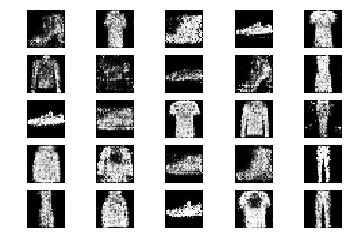

12801 [D loss: 0.669632, acc.: 57.81%] [G loss: 0.884181]
12802 [D loss: 0.670734, acc.: 54.69%] [G loss: 0.945009]
12803 [D loss: 0.690337, acc.: 57.81%] [G loss: 0.913705]
12804 [D loss: 0.655541, acc.: 57.81%] [G loss: 0.934526]
12805 [D loss: 0.652396, acc.: 56.25%] [G loss: 0.953610]
12806 [D loss: 0.569684, acc.: 78.12%] [G loss: 0.936231]
12807 [D loss: 0.729859, acc.: 56.25%] [G loss: 0.895364]
12808 [D loss: 0.629067, acc.: 67.19%] [G loss: 0.824107]
12809 [D loss: 0.713021, acc.: 57.81%] [G loss: 0.865918]
12810 [D loss: 0.661472, acc.: 59.38%] [G loss: 0.983594]
12811 [D loss: 0.645132, acc.: 67.19%] [G loss: 0.869744]
12812 [D loss: 0.629715, acc.: 60.94%] [G loss: 0.918118]
12813 [D loss: 0.668074, acc.: 56.25%] [G loss: 0.909236]
12814 [D loss: 0.622787, acc.: 60.94%] [G loss: 0.938759]
12815 [D loss: 0.600145, acc.: 65.62%] [G loss: 0.856133]
12816 [D loss: 0.688432, acc.: 53.12%] [G loss: 0.926283]
12817 [D loss: 0.705083, acc.: 56.25%] [G loss: 0.882232]
12818 [D loss:

12943 [D loss: 0.691190, acc.: 54.69%] [G loss: 0.839883]
12944 [D loss: 0.671289, acc.: 57.81%] [G loss: 0.911547]
12945 [D loss: 0.600641, acc.: 60.94%] [G loss: 0.923165]
12946 [D loss: 0.683928, acc.: 53.12%] [G loss: 1.008280]
12947 [D loss: 0.611166, acc.: 67.19%] [G loss: 0.931872]
12948 [D loss: 0.667724, acc.: 56.25%] [G loss: 0.990006]
12949 [D loss: 0.695661, acc.: 64.06%] [G loss: 0.936973]
12950 [D loss: 0.616768, acc.: 68.75%] [G loss: 0.919883]
12951 [D loss: 0.648627, acc.: 57.81%] [G loss: 0.901300]
12952 [D loss: 0.668168, acc.: 59.38%] [G loss: 0.948324]
12953 [D loss: 0.646325, acc.: 57.81%] [G loss: 1.036575]
12954 [D loss: 0.636128, acc.: 62.50%] [G loss: 0.982385]
12955 [D loss: 0.585600, acc.: 78.12%] [G loss: 0.968875]
12956 [D loss: 0.605866, acc.: 65.62%] [G loss: 0.988274]
12957 [D loss: 0.615611, acc.: 67.19%] [G loss: 0.973054]
12958 [D loss: 0.643175, acc.: 59.38%] [G loss: 0.897033]
12959 [D loss: 0.675890, acc.: 62.50%] [G loss: 0.936365]
12960 [D loss:

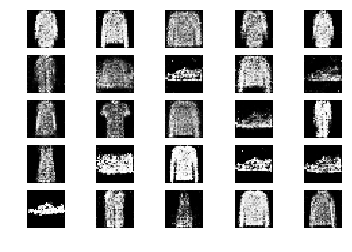

13001 [D loss: 0.662161, acc.: 60.94%] [G loss: 0.892941]
13002 [D loss: 0.662652, acc.: 59.38%] [G loss: 0.858597]
13003 [D loss: 0.653294, acc.: 56.25%] [G loss: 0.950021]
13004 [D loss: 0.640791, acc.: 62.50%] [G loss: 0.980807]
13005 [D loss: 0.714054, acc.: 56.25%] [G loss: 0.950021]
13006 [D loss: 0.610121, acc.: 70.31%] [G loss: 0.983797]
13007 [D loss: 0.645946, acc.: 60.94%] [G loss: 1.005697]
13008 [D loss: 0.627531, acc.: 67.19%] [G loss: 0.975942]
13009 [D loss: 0.686235, acc.: 64.06%] [G loss: 0.852863]
13010 [D loss: 0.657026, acc.: 65.62%] [G loss: 0.869629]
13011 [D loss: 0.661239, acc.: 60.94%] [G loss: 0.847797]
13012 [D loss: 0.625264, acc.: 68.75%] [G loss: 0.898944]
13013 [D loss: 0.707663, acc.: 59.38%] [G loss: 0.908568]
13014 [D loss: 0.650427, acc.: 59.38%] [G loss: 0.883362]
13015 [D loss: 0.637421, acc.: 70.31%] [G loss: 0.926196]
13016 [D loss: 0.604364, acc.: 68.75%] [G loss: 0.900674]
13017 [D loss: 0.669978, acc.: 67.19%] [G loss: 0.998720]
13018 [D loss:

13143 [D loss: 0.528691, acc.: 81.25%] [G loss: 0.912588]
13144 [D loss: 0.690836, acc.: 57.81%] [G loss: 0.963599]
13145 [D loss: 0.666552, acc.: 57.81%] [G loss: 0.906136]
13146 [D loss: 0.685781, acc.: 53.12%] [G loss: 0.891250]
13147 [D loss: 0.668941, acc.: 57.81%] [G loss: 0.901838]
13148 [D loss: 0.676045, acc.: 59.38%] [G loss: 0.883381]
13149 [D loss: 0.654712, acc.: 56.25%] [G loss: 0.872962]
13150 [D loss: 0.615410, acc.: 67.19%] [G loss: 0.887043]
13151 [D loss: 0.648782, acc.: 65.62%] [G loss: 0.951357]
13152 [D loss: 0.578770, acc.: 68.75%] [G loss: 0.943341]
13153 [D loss: 0.669587, acc.: 56.25%] [G loss: 0.905016]
13154 [D loss: 0.712792, acc.: 51.56%] [G loss: 0.800997]
13155 [D loss: 0.695694, acc.: 57.81%] [G loss: 0.854165]
13156 [D loss: 0.669809, acc.: 56.25%] [G loss: 0.815685]
13157 [D loss: 0.721702, acc.: 57.81%] [G loss: 0.858655]
13158 [D loss: 0.667495, acc.: 64.06%] [G loss: 0.865682]
13159 [D loss: 0.607574, acc.: 68.75%] [G loss: 0.871312]
13160 [D loss:

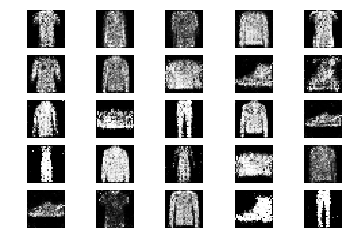

13201 [D loss: 0.652320, acc.: 64.06%] [G loss: 0.867508]
13202 [D loss: 0.700676, acc.: 54.69%] [G loss: 0.969091]
13203 [D loss: 0.625000, acc.: 67.19%] [G loss: 0.936589]
13204 [D loss: 0.697143, acc.: 54.69%] [G loss: 0.866702]
13205 [D loss: 0.620827, acc.: 65.62%] [G loss: 0.912958]
13206 [D loss: 0.626649, acc.: 64.06%] [G loss: 0.963442]
13207 [D loss: 0.672336, acc.: 45.31%] [G loss: 0.918351]
13208 [D loss: 0.618438, acc.: 60.94%] [G loss: 0.833210]
13209 [D loss: 0.688775, acc.: 56.25%] [G loss: 0.963863]
13210 [D loss: 0.675158, acc.: 64.06%] [G loss: 0.877781]
13211 [D loss: 0.666051, acc.: 64.06%] [G loss: 0.920004]
13212 [D loss: 0.680849, acc.: 60.94%] [G loss: 0.915076]
13213 [D loss: 0.680432, acc.: 53.12%] [G loss: 0.872032]
13214 [D loss: 0.678601, acc.: 51.56%] [G loss: 0.831328]
13215 [D loss: 0.697307, acc.: 50.00%] [G loss: 0.824500]
13216 [D loss: 0.634718, acc.: 67.19%] [G loss: 0.890482]
13217 [D loss: 0.657515, acc.: 64.06%] [G loss: 0.832754]
13218 [D loss:

13345 [D loss: 0.688799, acc.: 54.69%] [G loss: 0.808360]
13346 [D loss: 0.598890, acc.: 73.44%] [G loss: 0.878686]
13347 [D loss: 0.623373, acc.: 70.31%] [G loss: 0.870723]
13348 [D loss: 0.645891, acc.: 67.19%] [G loss: 0.890325]
13349 [D loss: 0.631466, acc.: 60.94%] [G loss: 0.955023]
13350 [D loss: 0.687812, acc.: 46.88%] [G loss: 0.878404]
13351 [D loss: 0.677593, acc.: 62.50%] [G loss: 0.707688]
13352 [D loss: 0.687633, acc.: 57.81%] [G loss: 0.836612]
13353 [D loss: 0.662613, acc.: 59.38%] [G loss: 0.909180]
13354 [D loss: 0.726781, acc.: 51.56%] [G loss: 0.990644]
13355 [D loss: 0.674526, acc.: 56.25%] [G loss: 0.884781]
13356 [D loss: 0.631699, acc.: 59.38%] [G loss: 0.944411]
13357 [D loss: 0.695062, acc.: 57.81%] [G loss: 0.858086]
13358 [D loss: 0.626875, acc.: 59.38%] [G loss: 0.943693]
13359 [D loss: 0.624977, acc.: 64.06%] [G loss: 0.877477]
13360 [D loss: 0.656172, acc.: 60.94%] [G loss: 0.931824]
13361 [D loss: 0.608950, acc.: 73.44%] [G loss: 0.855263]
13362 [D loss:

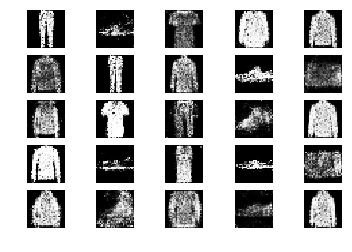

13401 [D loss: 0.634888, acc.: 64.06%] [G loss: 0.848181]
13402 [D loss: 0.645272, acc.: 59.38%] [G loss: 0.837539]
13403 [D loss: 0.689412, acc.: 54.69%] [G loss: 0.907737]
13404 [D loss: 0.663427, acc.: 60.94%] [G loss: 0.816761]
13405 [D loss: 0.689618, acc.: 59.38%] [G loss: 0.921124]
13406 [D loss: 0.584966, acc.: 73.44%] [G loss: 0.901264]
13407 [D loss: 0.718537, acc.: 43.75%] [G loss: 0.896573]
13408 [D loss: 0.699184, acc.: 53.12%] [G loss: 0.973012]
13409 [D loss: 0.622456, acc.: 62.50%] [G loss: 0.906817]
13410 [D loss: 0.639145, acc.: 64.06%] [G loss: 0.973042]
13411 [D loss: 0.636397, acc.: 64.06%] [G loss: 0.868086]
13412 [D loss: 0.663069, acc.: 62.50%] [G loss: 0.970197]
13413 [D loss: 0.617410, acc.: 62.50%] [G loss: 0.931053]
13414 [D loss: 0.707690, acc.: 60.94%] [G loss: 0.893386]
13415 [D loss: 0.672297, acc.: 54.69%] [G loss: 0.890568]
13416 [D loss: 0.670472, acc.: 59.38%] [G loss: 0.856266]
13417 [D loss: 0.678936, acc.: 53.12%] [G loss: 0.796690]
13418 [D loss:

13546 [D loss: 0.651205, acc.: 60.94%] [G loss: 0.965442]
13547 [D loss: 0.638248, acc.: 67.19%] [G loss: 0.862822]
13548 [D loss: 0.644893, acc.: 64.06%] [G loss: 0.874419]
13549 [D loss: 0.667120, acc.: 56.25%] [G loss: 0.828998]
13550 [D loss: 0.654648, acc.: 56.25%] [G loss: 0.948149]
13551 [D loss: 0.680054, acc.: 60.94%] [G loss: 0.894679]
13552 [D loss: 0.663501, acc.: 56.25%] [G loss: 0.944762]
13553 [D loss: 0.652677, acc.: 64.06%] [G loss: 0.889277]
13554 [D loss: 0.613497, acc.: 70.31%] [G loss: 0.930139]
13555 [D loss: 0.669610, acc.: 54.69%] [G loss: 0.900550]
13556 [D loss: 0.660889, acc.: 59.38%] [G loss: 0.825246]
13557 [D loss: 0.669390, acc.: 67.19%] [G loss: 0.869867]
13558 [D loss: 0.695966, acc.: 54.69%] [G loss: 0.884319]
13559 [D loss: 0.651171, acc.: 65.62%] [G loss: 0.961027]
13560 [D loss: 0.660311, acc.: 56.25%] [G loss: 0.928850]
13561 [D loss: 0.665516, acc.: 48.44%] [G loss: 0.828179]
13562 [D loss: 0.596001, acc.: 67.19%] [G loss: 0.838418]
13563 [D loss:

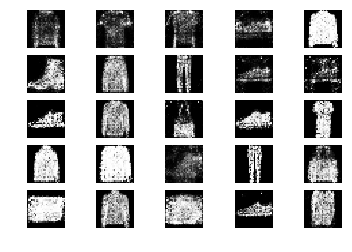

13601 [D loss: 0.671140, acc.: 54.69%] [G loss: 0.976865]
13602 [D loss: 0.685183, acc.: 50.00%] [G loss: 0.993537]
13603 [D loss: 0.690404, acc.: 59.38%] [G loss: 0.837109]
13604 [D loss: 0.625286, acc.: 60.94%] [G loss: 0.871971]
13605 [D loss: 0.666066, acc.: 51.56%] [G loss: 0.886007]
13606 [D loss: 0.687796, acc.: 60.94%] [G loss: 0.939571]
13607 [D loss: 0.644614, acc.: 64.06%] [G loss: 0.850698]
13608 [D loss: 0.656376, acc.: 57.81%] [G loss: 0.778028]
13609 [D loss: 0.671782, acc.: 57.81%] [G loss: 0.888440]
13610 [D loss: 0.635330, acc.: 65.62%] [G loss: 0.862576]
13611 [D loss: 0.635500, acc.: 62.50%] [G loss: 0.907860]
13612 [D loss: 0.689065, acc.: 53.12%] [G loss: 0.830283]
13613 [D loss: 0.580079, acc.: 71.88%] [G loss: 0.928445]
13614 [D loss: 0.659481, acc.: 57.81%] [G loss: 0.841402]
13615 [D loss: 0.678418, acc.: 59.38%] [G loss: 0.889480]
13616 [D loss: 0.652748, acc.: 60.94%] [G loss: 0.886891]
13617 [D loss: 0.671172, acc.: 54.69%] [G loss: 0.961092]
13618 [D loss:

13743 [D loss: 0.648142, acc.: 59.38%] [G loss: 0.897149]
13744 [D loss: 0.668918, acc.: 62.50%] [G loss: 0.833072]
13745 [D loss: 0.664695, acc.: 59.38%] [G loss: 0.879803]
13746 [D loss: 0.666153, acc.: 56.25%] [G loss: 0.896397]
13747 [D loss: 0.649952, acc.: 57.81%] [G loss: 0.867727]
13748 [D loss: 0.610747, acc.: 70.31%] [G loss: 0.804195]
13749 [D loss: 0.692404, acc.: 48.44%] [G loss: 0.914751]
13750 [D loss: 0.681898, acc.: 57.81%] [G loss: 0.883332]
13751 [D loss: 0.654594, acc.: 54.69%] [G loss: 0.901315]
13752 [D loss: 0.675116, acc.: 59.38%] [G loss: 0.929655]
13753 [D loss: 0.679583, acc.: 59.38%] [G loss: 0.861832]
13754 [D loss: 0.685364, acc.: 62.50%] [G loss: 0.918566]
13755 [D loss: 0.683893, acc.: 54.69%] [G loss: 0.922186]
13756 [D loss: 0.759628, acc.: 50.00%] [G loss: 0.872657]
13757 [D loss: 0.637912, acc.: 67.19%] [G loss: 0.872125]
13758 [D loss: 0.615244, acc.: 64.06%] [G loss: 0.913769]
13759 [D loss: 0.649199, acc.: 54.69%] [G loss: 0.927038]
13760 [D loss:

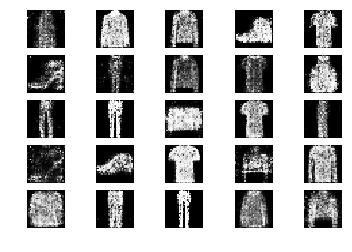

13801 [D loss: 0.565000, acc.: 73.44%] [G loss: 0.882739]
13802 [D loss: 0.627553, acc.: 70.31%] [G loss: 0.920844]
13803 [D loss: 0.659137, acc.: 64.06%] [G loss: 0.901472]
13804 [D loss: 0.609940, acc.: 73.44%] [G loss: 0.915405]
13805 [D loss: 0.669600, acc.: 53.12%] [G loss: 0.970178]
13806 [D loss: 0.709147, acc.: 54.69%] [G loss: 0.953675]
13807 [D loss: 0.686243, acc.: 54.69%] [G loss: 0.921257]
13808 [D loss: 0.666631, acc.: 59.38%] [G loss: 0.982029]
13809 [D loss: 0.627391, acc.: 60.94%] [G loss: 0.903054]
13810 [D loss: 0.661557, acc.: 60.94%] [G loss: 0.908257]
13811 [D loss: 0.617230, acc.: 65.62%] [G loss: 0.906329]
13812 [D loss: 0.649064, acc.: 65.62%] [G loss: 0.868643]
13813 [D loss: 0.659362, acc.: 60.94%] [G loss: 0.880992]
13814 [D loss: 0.649710, acc.: 56.25%] [G loss: 0.968377]
13815 [D loss: 0.678175, acc.: 54.69%] [G loss: 0.909045]
13816 [D loss: 0.588022, acc.: 73.44%] [G loss: 0.874481]
13817 [D loss: 0.678655, acc.: 59.38%] [G loss: 0.902448]
13818 [D loss:

13946 [D loss: 0.677630, acc.: 48.44%] [G loss: 0.957219]
13947 [D loss: 0.690599, acc.: 53.12%] [G loss: 0.882854]
13948 [D loss: 0.692310, acc.: 60.94%] [G loss: 0.889689]
13949 [D loss: 0.638951, acc.: 59.38%] [G loss: 0.851895]
13950 [D loss: 0.638959, acc.: 64.06%] [G loss: 0.944548]
13951 [D loss: 0.623655, acc.: 65.62%] [G loss: 0.942114]
13952 [D loss: 0.648692, acc.: 67.19%] [G loss: 0.933611]
13953 [D loss: 0.627625, acc.: 65.62%] [G loss: 1.020168]
13954 [D loss: 0.629203, acc.: 64.06%] [G loss: 0.947549]
13955 [D loss: 0.624761, acc.: 60.94%] [G loss: 0.904163]
13956 [D loss: 0.662603, acc.: 59.38%] [G loss: 0.843997]
13957 [D loss: 0.627946, acc.: 64.06%] [G loss: 0.972695]
13958 [D loss: 0.724951, acc.: 50.00%] [G loss: 0.884785]
13959 [D loss: 0.685942, acc.: 57.81%] [G loss: 0.741003]
13960 [D loss: 0.582406, acc.: 70.31%] [G loss: 1.061949]
13961 [D loss: 0.730623, acc.: 51.56%] [G loss: 0.904147]
13962 [D loss: 0.690542, acc.: 56.25%] [G loss: 0.924211]
13963 [D loss:

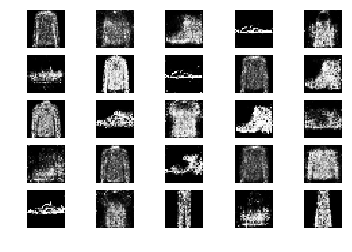

14001 [D loss: 0.651686, acc.: 53.12%] [G loss: 0.870024]
14002 [D loss: 0.675347, acc.: 59.38%] [G loss: 0.817084]
14003 [D loss: 0.640953, acc.: 67.19%] [G loss: 0.889495]
14004 [D loss: 0.615250, acc.: 67.19%] [G loss: 0.848503]
14005 [D loss: 0.634631, acc.: 56.25%] [G loss: 0.864491]
14006 [D loss: 0.645848, acc.: 59.38%] [G loss: 0.891393]
14007 [D loss: 0.635813, acc.: 65.62%] [G loss: 0.900864]
14008 [D loss: 0.634542, acc.: 65.62%] [G loss: 0.875311]
14009 [D loss: 0.698540, acc.: 51.56%] [G loss: 0.953826]
14010 [D loss: 0.683001, acc.: 51.56%] [G loss: 0.933746]
14011 [D loss: 0.642918, acc.: 64.06%] [G loss: 0.844515]
14012 [D loss: 0.663619, acc.: 59.38%] [G loss: 0.929046]
14013 [D loss: 0.652228, acc.: 56.25%] [G loss: 0.896028]
14014 [D loss: 0.719169, acc.: 50.00%] [G loss: 0.806763]
14015 [D loss: 0.689986, acc.: 54.69%] [G loss: 0.854096]
14016 [D loss: 0.641997, acc.: 62.50%] [G loss: 0.872537]
14017 [D loss: 0.623981, acc.: 65.62%] [G loss: 0.818657]
14018 [D loss:

14146 [D loss: 0.648581, acc.: 65.62%] [G loss: 0.945690]
14147 [D loss: 0.672864, acc.: 64.06%] [G loss: 0.865171]
14148 [D loss: 0.688238, acc.: 51.56%] [G loss: 0.855462]
14149 [D loss: 0.624567, acc.: 70.31%] [G loss: 0.881073]
14150 [D loss: 0.633505, acc.: 65.62%] [G loss: 0.976178]
14151 [D loss: 0.672434, acc.: 62.50%] [G loss: 0.927975]
14152 [D loss: 0.678267, acc.: 50.00%] [G loss: 0.892423]
14153 [D loss: 0.660496, acc.: 64.06%] [G loss: 0.905073]
14154 [D loss: 0.644541, acc.: 59.38%] [G loss: 0.885069]
14155 [D loss: 0.645761, acc.: 64.06%] [G loss: 0.907417]
14156 [D loss: 0.659634, acc.: 59.38%] [G loss: 0.890840]
14157 [D loss: 0.590441, acc.: 71.88%] [G loss: 0.852246]
14158 [D loss: 0.666391, acc.: 62.50%] [G loss: 0.911990]
14159 [D loss: 0.632028, acc.: 67.19%] [G loss: 0.853893]
14160 [D loss: 0.673109, acc.: 68.75%] [G loss: 0.877735]
14161 [D loss: 0.577301, acc.: 75.00%] [G loss: 0.979125]
14162 [D loss: 0.618976, acc.: 65.62%] [G loss: 0.986156]
14163 [D loss:

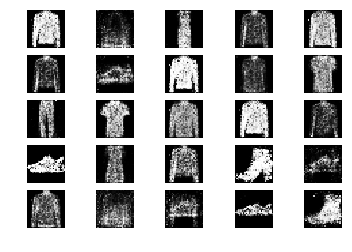

14201 [D loss: 0.639841, acc.: 71.88%] [G loss: 0.838874]
14202 [D loss: 0.701425, acc.: 53.12%] [G loss: 0.918588]
14203 [D loss: 0.614417, acc.: 67.19%] [G loss: 0.996013]
14204 [D loss: 0.611619, acc.: 70.31%] [G loss: 0.871140]
14205 [D loss: 0.634044, acc.: 67.19%] [G loss: 0.902117]
14206 [D loss: 0.715639, acc.: 57.81%] [G loss: 0.914071]
14207 [D loss: 0.620992, acc.: 68.75%] [G loss: 0.875166]
14208 [D loss: 0.679700, acc.: 53.12%] [G loss: 0.919720]
14209 [D loss: 0.631442, acc.: 60.94%] [G loss: 0.846925]
14210 [D loss: 0.626900, acc.: 70.31%] [G loss: 0.823709]
14211 [D loss: 0.683937, acc.: 59.38%] [G loss: 0.888581]
14212 [D loss: 0.665652, acc.: 56.25%] [G loss: 0.880074]
14213 [D loss: 0.643806, acc.: 62.50%] [G loss: 0.931669]
14214 [D loss: 0.648680, acc.: 62.50%] [G loss: 0.871938]
14215 [D loss: 0.625616, acc.: 64.06%] [G loss: 0.899430]
14216 [D loss: 0.638707, acc.: 65.62%] [G loss: 0.902011]
14217 [D loss: 0.613024, acc.: 70.31%] [G loss: 0.991421]
14218 [D loss:

14344 [D loss: 0.644320, acc.: 64.06%] [G loss: 0.874534]
14345 [D loss: 0.647560, acc.: 60.94%] [G loss: 0.895963]
14346 [D loss: 0.705128, acc.: 62.50%] [G loss: 0.853415]
14347 [D loss: 0.624915, acc.: 62.50%] [G loss: 0.882448]
14348 [D loss: 0.661836, acc.: 59.38%] [G loss: 0.914225]
14349 [D loss: 0.655068, acc.: 65.62%] [G loss: 0.869482]
14350 [D loss: 0.613990, acc.: 70.31%] [G loss: 0.909816]
14351 [D loss: 0.630994, acc.: 70.31%] [G loss: 0.968708]
14352 [D loss: 0.643884, acc.: 60.94%] [G loss: 0.915863]
14353 [D loss: 0.655353, acc.: 68.75%] [G loss: 0.854685]
14354 [D loss: 0.614991, acc.: 60.94%] [G loss: 0.853520]
14355 [D loss: 0.664379, acc.: 67.19%] [G loss: 0.906352]
14356 [D loss: 0.629628, acc.: 57.81%] [G loss: 0.946460]
14357 [D loss: 0.634531, acc.: 59.38%] [G loss: 0.953266]
14358 [D loss: 0.642960, acc.: 60.94%] [G loss: 0.905812]
14359 [D loss: 0.659414, acc.: 54.69%] [G loss: 0.920447]
14360 [D loss: 0.689850, acc.: 60.94%] [G loss: 0.801198]
14361 [D loss:

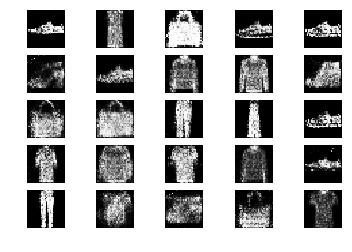

14401 [D loss: 0.683242, acc.: 54.69%] [G loss: 0.913070]
14402 [D loss: 0.641385, acc.: 57.81%] [G loss: 0.950740]
14403 [D loss: 0.664121, acc.: 60.94%] [G loss: 0.941727]
14404 [D loss: 0.647239, acc.: 71.88%] [G loss: 0.871665]
14405 [D loss: 0.659841, acc.: 64.06%] [G loss: 0.887934]
14406 [D loss: 0.578775, acc.: 71.88%] [G loss: 0.884668]
14407 [D loss: 0.684916, acc.: 56.25%] [G loss: 0.858301]
14408 [D loss: 0.705321, acc.: 51.56%] [G loss: 0.834161]
14409 [D loss: 0.639867, acc.: 60.94%] [G loss: 0.891944]
14410 [D loss: 0.642184, acc.: 60.94%] [G loss: 0.965625]
14411 [D loss: 0.553728, acc.: 75.00%] [G loss: 0.838210]
14412 [D loss: 0.665142, acc.: 60.94%] [G loss: 0.880577]
14413 [D loss: 0.664046, acc.: 64.06%] [G loss: 0.894775]
14414 [D loss: 0.643961, acc.: 62.50%] [G loss: 0.875660]
14415 [D loss: 0.615515, acc.: 68.75%] [G loss: 0.923018]
14416 [D loss: 0.704471, acc.: 57.81%] [G loss: 0.898121]
14417 [D loss: 0.633087, acc.: 65.62%] [G loss: 0.980236]
14418 [D loss:

14543 [D loss: 0.635880, acc.: 64.06%] [G loss: 0.963038]
14544 [D loss: 0.653684, acc.: 57.81%] [G loss: 0.892728]
14545 [D loss: 0.633531, acc.: 59.38%] [G loss: 0.883141]
14546 [D loss: 0.652862, acc.: 64.06%] [G loss: 0.841327]
14547 [D loss: 0.714537, acc.: 48.44%] [G loss: 0.846693]
14548 [D loss: 0.583858, acc.: 73.44%] [G loss: 0.813951]
14549 [D loss: 0.652491, acc.: 64.06%] [G loss: 0.957506]
14550 [D loss: 0.636302, acc.: 60.94%] [G loss: 0.824323]
14551 [D loss: 0.659451, acc.: 62.50%] [G loss: 0.857328]
14552 [D loss: 0.686005, acc.: 57.81%] [G loss: 0.916241]
14553 [D loss: 0.588258, acc.: 70.31%] [G loss: 0.842594]
14554 [D loss: 0.658407, acc.: 60.94%] [G loss: 0.946238]
14555 [D loss: 0.637481, acc.: 54.69%] [G loss: 0.865595]
14556 [D loss: 0.626691, acc.: 70.31%] [G loss: 0.894626]
14557 [D loss: 0.624206, acc.: 65.62%] [G loss: 0.834341]
14558 [D loss: 0.728339, acc.: 51.56%] [G loss: 0.794535]
14559 [D loss: 0.657436, acc.: 56.25%] [G loss: 0.905956]
14560 [D loss:

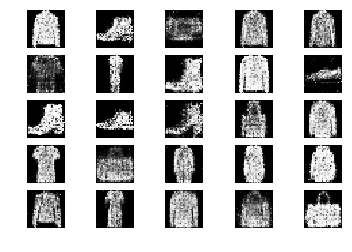

14601 [D loss: 0.665121, acc.: 59.38%] [G loss: 0.865170]
14602 [D loss: 0.638023, acc.: 64.06%] [G loss: 0.876152]
14603 [D loss: 0.652793, acc.: 59.38%] [G loss: 0.906307]
14604 [D loss: 0.657868, acc.: 59.38%] [G loss: 0.826787]
14605 [D loss: 0.654153, acc.: 60.94%] [G loss: 0.895021]
14606 [D loss: 0.668276, acc.: 56.25%] [G loss: 0.915244]
14607 [D loss: 0.632527, acc.: 67.19%] [G loss: 0.962761]
14608 [D loss: 0.639914, acc.: 65.62%] [G loss: 0.842634]
14609 [D loss: 0.652380, acc.: 64.06%] [G loss: 0.884689]
14610 [D loss: 0.692174, acc.: 64.06%] [G loss: 0.901347]
14611 [D loss: 0.620199, acc.: 60.94%] [G loss: 0.868533]
14612 [D loss: 0.647621, acc.: 57.81%] [G loss: 0.897381]
14613 [D loss: 0.616759, acc.: 68.75%] [G loss: 0.902826]
14614 [D loss: 0.656252, acc.: 62.50%] [G loss: 0.820529]
14615 [D loss: 0.708930, acc.: 54.69%] [G loss: 0.952266]
14616 [D loss: 0.627619, acc.: 67.19%] [G loss: 0.990888]
14617 [D loss: 0.645719, acc.: 64.06%] [G loss: 0.951076]
14618 [D loss:

14745 [D loss: 0.608663, acc.: 68.75%] [G loss: 0.834400]
14746 [D loss: 0.602632, acc.: 73.44%] [G loss: 0.897274]
14747 [D loss: 0.678691, acc.: 56.25%] [G loss: 0.910651]
14748 [D loss: 0.698825, acc.: 59.38%] [G loss: 0.895576]
14749 [D loss: 0.587992, acc.: 70.31%] [G loss: 0.937739]
14750 [D loss: 0.601870, acc.: 67.19%] [G loss: 0.896535]
14751 [D loss: 0.658469, acc.: 54.69%] [G loss: 0.948740]
14752 [D loss: 0.682181, acc.: 59.38%] [G loss: 0.863067]
14753 [D loss: 0.643851, acc.: 59.38%] [G loss: 0.906964]
14754 [D loss: 0.616973, acc.: 71.88%] [G loss: 0.909542]
14755 [D loss: 0.665735, acc.: 59.38%] [G loss: 0.948998]
14756 [D loss: 0.645981, acc.: 59.38%] [G loss: 0.968052]
14757 [D loss: 0.636117, acc.: 70.31%] [G loss: 1.078956]
14758 [D loss: 0.668741, acc.: 67.19%] [G loss: 0.961028]
14759 [D loss: 0.638652, acc.: 65.62%] [G loss: 0.951833]
14760 [D loss: 0.618973, acc.: 65.62%] [G loss: 0.919665]
14761 [D loss: 0.651630, acc.: 59.38%] [G loss: 0.918189]
14762 [D loss:

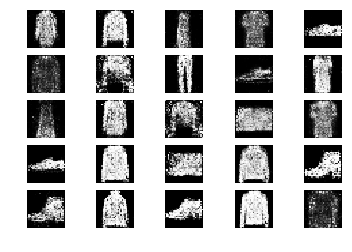

14801 [D loss: 0.647020, acc.: 59.38%] [G loss: 0.951901]
14802 [D loss: 0.666817, acc.: 62.50%] [G loss: 0.866093]
14803 [D loss: 0.652364, acc.: 57.81%] [G loss: 0.869796]
14804 [D loss: 0.659498, acc.: 64.06%] [G loss: 0.841236]
14805 [D loss: 0.679496, acc.: 57.81%] [G loss: 0.921965]
14806 [D loss: 0.656037, acc.: 62.50%] [G loss: 0.899893]
14807 [D loss: 0.656656, acc.: 65.62%] [G loss: 0.890765]
14808 [D loss: 0.643557, acc.: 60.94%] [G loss: 0.933716]
14809 [D loss: 0.591139, acc.: 70.31%] [G loss: 0.889910]
14810 [D loss: 0.585792, acc.: 70.31%] [G loss: 0.840052]
14811 [D loss: 0.631377, acc.: 60.94%] [G loss: 0.885049]
14812 [D loss: 0.711989, acc.: 51.56%] [G loss: 0.860527]
14813 [D loss: 0.603976, acc.: 73.44%] [G loss: 0.833148]
14814 [D loss: 0.676075, acc.: 56.25%] [G loss: 0.869509]
14815 [D loss: 0.665431, acc.: 56.25%] [G loss: 0.831046]
14816 [D loss: 0.664725, acc.: 60.94%] [G loss: 0.839282]
14817 [D loss: 0.679918, acc.: 56.25%] [G loss: 0.897248]
14818 [D loss:

14943 [D loss: 0.720743, acc.: 50.00%] [G loss: 0.977310]
14944 [D loss: 0.558611, acc.: 75.00%] [G loss: 0.948710]
14945 [D loss: 0.654906, acc.: 64.06%] [G loss: 0.972562]
14946 [D loss: 0.703714, acc.: 56.25%] [G loss: 0.887656]
14947 [D loss: 0.625572, acc.: 67.19%] [G loss: 0.916336]
14948 [D loss: 0.669208, acc.: 48.44%] [G loss: 0.954507]
14949 [D loss: 0.673792, acc.: 54.69%] [G loss: 0.978052]
14950 [D loss: 0.700138, acc.: 54.69%] [G loss: 0.925061]
14951 [D loss: 0.641464, acc.: 59.38%] [G loss: 1.045876]
14952 [D loss: 0.657079, acc.: 62.50%] [G loss: 1.023683]
14953 [D loss: 0.762112, acc.: 50.00%] [G loss: 1.005455]
14954 [D loss: 0.672142, acc.: 59.38%] [G loss: 0.964574]
14955 [D loss: 0.634616, acc.: 65.62%] [G loss: 0.987314]
14956 [D loss: 0.697797, acc.: 46.88%] [G loss: 0.968016]
14957 [D loss: 0.725910, acc.: 48.44%] [G loss: 0.928035]
14958 [D loss: 0.636672, acc.: 67.19%] [G loss: 0.861359]
14959 [D loss: 0.642378, acc.: 57.81%] [G loss: 0.938864]
14960 [D loss:

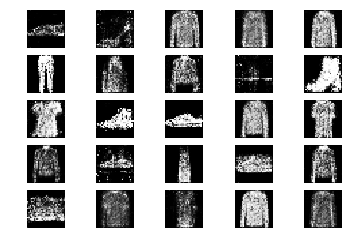

15001 [D loss: 0.686998, acc.: 53.12%] [G loss: 0.870857]
15002 [D loss: 0.738647, acc.: 50.00%] [G loss: 0.922512]
15003 [D loss: 0.665145, acc.: 64.06%] [G loss: 0.879956]
15004 [D loss: 0.607732, acc.: 62.50%] [G loss: 0.843845]
15005 [D loss: 0.631890, acc.: 60.94%] [G loss: 0.930531]
15006 [D loss: 0.685573, acc.: 54.69%] [G loss: 0.887696]
15007 [D loss: 0.731272, acc.: 46.88%] [G loss: 0.873066]
15008 [D loss: 0.622313, acc.: 57.81%] [G loss: 0.943075]
15009 [D loss: 0.682479, acc.: 64.06%] [G loss: 0.884232]
15010 [D loss: 0.620513, acc.: 65.62%] [G loss: 0.862196]
15011 [D loss: 0.633027, acc.: 70.31%] [G loss: 0.880736]
15012 [D loss: 0.661639, acc.: 60.94%] [G loss: 0.889007]
15013 [D loss: 0.650279, acc.: 65.62%] [G loss: 0.911330]
15014 [D loss: 0.657726, acc.: 62.50%] [G loss: 0.900709]
15015 [D loss: 0.609075, acc.: 67.19%] [G loss: 0.900603]
15016 [D loss: 0.625920, acc.: 67.19%] [G loss: 0.925342]
15017 [D loss: 0.696871, acc.: 53.12%] [G loss: 0.883806]
15018 [D loss:

15146 [D loss: 0.710667, acc.: 43.75%] [G loss: 0.911357]
15147 [D loss: 0.669060, acc.: 59.38%] [G loss: 0.924519]
15148 [D loss: 0.609837, acc.: 59.38%] [G loss: 0.849070]
15149 [D loss: 0.650085, acc.: 50.00%] [G loss: 0.902855]
15150 [D loss: 0.673537, acc.: 54.69%] [G loss: 0.907896]
15151 [D loss: 0.666358, acc.: 60.94%] [G loss: 0.895807]
15152 [D loss: 0.653091, acc.: 54.69%] [G loss: 0.929751]
15153 [D loss: 0.690959, acc.: 53.12%] [G loss: 0.946349]
15154 [D loss: 0.650485, acc.: 57.81%] [G loss: 0.959451]
15155 [D loss: 0.614740, acc.: 65.62%] [G loss: 0.954236]
15156 [D loss: 0.683064, acc.: 60.94%] [G loss: 0.912519]
15157 [D loss: 0.621451, acc.: 67.19%] [G loss: 0.921487]
15158 [D loss: 0.707637, acc.: 51.56%] [G loss: 1.006597]
15159 [D loss: 0.689166, acc.: 59.38%] [G loss: 0.892381]
15160 [D loss: 0.694691, acc.: 51.56%] [G loss: 0.976867]
15161 [D loss: 0.646408, acc.: 67.19%] [G loss: 0.984309]
15162 [D loss: 0.684748, acc.: 56.25%] [G loss: 0.865423]
15163 [D loss:

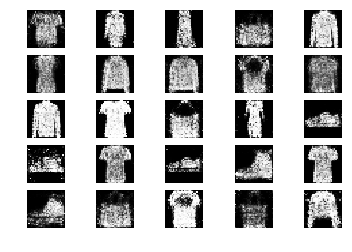

15201 [D loss: 0.679621, acc.: 62.50%] [G loss: 0.872291]
15202 [D loss: 0.665910, acc.: 57.81%] [G loss: 0.918922]
15203 [D loss: 0.618155, acc.: 64.06%] [G loss: 0.897652]
15204 [D loss: 0.663300, acc.: 62.50%] [G loss: 0.900844]
15205 [D loss: 0.634341, acc.: 68.75%] [G loss: 0.919875]
15206 [D loss: 0.677920, acc.: 56.25%] [G loss: 0.920302]
15207 [D loss: 0.658573, acc.: 59.38%] [G loss: 0.859068]
15208 [D loss: 0.689245, acc.: 65.62%] [G loss: 0.900321]
15209 [D loss: 0.637257, acc.: 60.94%] [G loss: 0.931129]
15210 [D loss: 0.665072, acc.: 64.06%] [G loss: 0.905713]
15211 [D loss: 0.599644, acc.: 73.44%] [G loss: 1.018765]
15212 [D loss: 0.675695, acc.: 57.81%] [G loss: 0.880774]
15213 [D loss: 0.627055, acc.: 71.88%] [G loss: 0.829634]
15214 [D loss: 0.601118, acc.: 67.19%] [G loss: 0.918204]
15215 [D loss: 0.635619, acc.: 62.50%] [G loss: 0.866241]
15216 [D loss: 0.680445, acc.: 53.12%] [G loss: 0.869873]
15217 [D loss: 0.687909, acc.: 62.50%] [G loss: 0.930296]
15218 [D loss:

15346 [D loss: 0.620206, acc.: 70.31%] [G loss: 0.959271]
15347 [D loss: 0.627616, acc.: 67.19%] [G loss: 0.933597]
15348 [D loss: 0.619197, acc.: 65.62%] [G loss: 0.980943]
15349 [D loss: 0.621761, acc.: 67.19%] [G loss: 0.933013]
15350 [D loss: 0.647810, acc.: 67.19%] [G loss: 0.876728]
15351 [D loss: 0.632865, acc.: 62.50%] [G loss: 0.889785]
15352 [D loss: 0.663000, acc.: 57.81%] [G loss: 0.849228]
15353 [D loss: 0.691453, acc.: 53.12%] [G loss: 0.858217]
15354 [D loss: 0.619846, acc.: 68.75%] [G loss: 0.912126]
15355 [D loss: 0.646987, acc.: 54.69%] [G loss: 0.935734]
15356 [D loss: 0.678466, acc.: 57.81%] [G loss: 0.870303]
15357 [D loss: 0.663958, acc.: 60.94%] [G loss: 0.899669]
15358 [D loss: 0.607779, acc.: 68.75%] [G loss: 0.931102]
15359 [D loss: 0.674592, acc.: 53.12%] [G loss: 0.867192]
15360 [D loss: 0.644553, acc.: 57.81%] [G loss: 0.781562]
15361 [D loss: 0.665803, acc.: 57.81%] [G loss: 0.815620]
15362 [D loss: 0.716247, acc.: 51.56%] [G loss: 0.919170]
15363 [D loss:

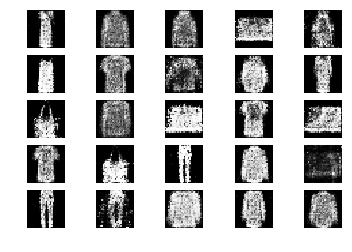

15401 [D loss: 0.637477, acc.: 65.62%] [G loss: 0.929700]
15402 [D loss: 0.713169, acc.: 56.25%] [G loss: 0.948916]
15403 [D loss: 0.644702, acc.: 67.19%] [G loss: 0.997878]
15404 [D loss: 0.668415, acc.: 54.69%] [G loss: 0.942599]
15405 [D loss: 0.637711, acc.: 65.62%] [G loss: 0.990395]
15406 [D loss: 0.670982, acc.: 59.38%] [G loss: 0.989900]
15407 [D loss: 0.711449, acc.: 53.12%] [G loss: 0.851195]
15408 [D loss: 0.658992, acc.: 65.62%] [G loss: 0.767306]
15409 [D loss: 0.625225, acc.: 62.50%] [G loss: 0.907326]
15410 [D loss: 0.755467, acc.: 46.88%] [G loss: 0.750765]
15411 [D loss: 0.697489, acc.: 60.94%] [G loss: 0.850282]
15412 [D loss: 0.653122, acc.: 64.06%] [G loss: 0.900326]
15413 [D loss: 0.660315, acc.: 62.50%] [G loss: 0.927424]
15414 [D loss: 0.650934, acc.: 59.38%] [G loss: 0.908874]
15415 [D loss: 0.725733, acc.: 50.00%] [G loss: 0.961953]
15416 [D loss: 0.660048, acc.: 62.50%] [G loss: 0.891395]
15417 [D loss: 0.617168, acc.: 70.31%] [G loss: 0.885368]
15418 [D loss:

15545 [D loss: 0.598522, acc.: 70.31%] [G loss: 0.987224]
15546 [D loss: 0.663785, acc.: 60.94%] [G loss: 0.866900]
15547 [D loss: 0.742770, acc.: 48.44%] [G loss: 0.947480]
15548 [D loss: 0.642685, acc.: 65.62%] [G loss: 0.972159]
15549 [D loss: 0.669044, acc.: 60.94%] [G loss: 0.930921]
15550 [D loss: 0.594842, acc.: 70.31%] [G loss: 0.895611]
15551 [D loss: 0.681564, acc.: 51.56%] [G loss: 0.910542]
15552 [D loss: 0.701010, acc.: 64.06%] [G loss: 0.864685]
15553 [D loss: 0.578320, acc.: 75.00%] [G loss: 0.862557]
15554 [D loss: 0.693324, acc.: 60.94%] [G loss: 0.870620]
15555 [D loss: 0.583499, acc.: 64.06%] [G loss: 0.873025]
15556 [D loss: 0.628570, acc.: 64.06%] [G loss: 0.914180]
15557 [D loss: 0.688152, acc.: 54.69%] [G loss: 0.886048]
15558 [D loss: 0.639423, acc.: 60.94%] [G loss: 0.930346]
15559 [D loss: 0.679914, acc.: 53.12%] [G loss: 0.946087]
15560 [D loss: 0.663098, acc.: 65.62%] [G loss: 0.908396]
15561 [D loss: 0.636794, acc.: 68.75%] [G loss: 0.971601]
15562 [D loss:

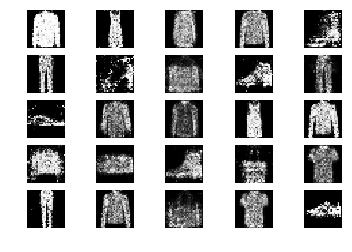

15601 [D loss: 0.605318, acc.: 68.75%] [G loss: 0.954427]
15602 [D loss: 0.699584, acc.: 56.25%] [G loss: 0.994234]
15603 [D loss: 0.684973, acc.: 57.81%] [G loss: 0.899818]
15604 [D loss: 0.684013, acc.: 56.25%] [G loss: 0.922634]
15605 [D loss: 0.679253, acc.: 60.94%] [G loss: 0.914428]
15606 [D loss: 0.546769, acc.: 76.56%] [G loss: 0.966277]
15607 [D loss: 0.678877, acc.: 57.81%] [G loss: 1.007410]
15608 [D loss: 0.639783, acc.: 59.38%] [G loss: 0.963596]
15609 [D loss: 0.621313, acc.: 70.31%] [G loss: 0.891591]
15610 [D loss: 0.676770, acc.: 54.69%] [G loss: 0.878090]
15611 [D loss: 0.682588, acc.: 56.25%] [G loss: 0.860266]
15612 [D loss: 0.691807, acc.: 53.12%] [G loss: 0.827011]
15613 [D loss: 0.642920, acc.: 60.94%] [G loss: 0.902283]
15614 [D loss: 0.626567, acc.: 64.06%] [G loss: 0.921808]
15615 [D loss: 0.676402, acc.: 62.50%] [G loss: 0.840880]
15616 [D loss: 0.663851, acc.: 54.69%] [G loss: 0.904510]
15617 [D loss: 0.646381, acc.: 62.50%] [G loss: 0.894008]
15618 [D loss:

15744 [D loss: 0.655541, acc.: 64.06%] [G loss: 0.983965]
15745 [D loss: 0.666022, acc.: 65.62%] [G loss: 0.933305]
15746 [D loss: 0.669220, acc.: 62.50%] [G loss: 1.000154]
15747 [D loss: 0.599553, acc.: 76.56%] [G loss: 0.909464]
15748 [D loss: 0.639574, acc.: 65.62%] [G loss: 0.948943]
15749 [D loss: 0.609980, acc.: 67.19%] [G loss: 0.935912]
15750 [D loss: 0.639810, acc.: 68.75%] [G loss: 0.909826]
15751 [D loss: 0.606581, acc.: 67.19%] [G loss: 0.843877]
15752 [D loss: 0.659564, acc.: 57.81%] [G loss: 0.895763]
15753 [D loss: 0.637298, acc.: 64.06%] [G loss: 0.895682]
15754 [D loss: 0.537059, acc.: 78.12%] [G loss: 1.060203]
15755 [D loss: 0.595904, acc.: 71.88%] [G loss: 0.918997]
15756 [D loss: 0.722100, acc.: 56.25%] [G loss: 0.993478]
15757 [D loss: 0.634170, acc.: 68.75%] [G loss: 0.918480]
15758 [D loss: 0.627467, acc.: 65.62%] [G loss: 0.950798]
15759 [D loss: 0.648004, acc.: 64.06%] [G loss: 0.886516]
15760 [D loss: 0.640705, acc.: 67.19%] [G loss: 0.923548]
15761 [D loss:

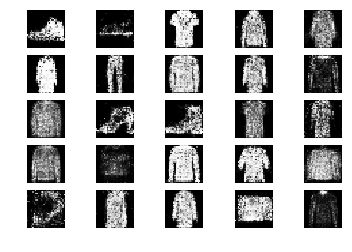

15801 [D loss: 0.606084, acc.: 68.75%] [G loss: 0.821059]
15802 [D loss: 0.645328, acc.: 56.25%] [G loss: 0.831519]
15803 [D loss: 0.678409, acc.: 53.12%] [G loss: 0.758426]
15804 [D loss: 0.595736, acc.: 70.31%] [G loss: 0.899789]
15805 [D loss: 0.650298, acc.: 59.38%] [G loss: 0.882835]
15806 [D loss: 0.567954, acc.: 71.88%] [G loss: 0.908376]
15807 [D loss: 0.703221, acc.: 53.12%] [G loss: 0.781668]
15808 [D loss: 0.617180, acc.: 67.19%] [G loss: 0.878334]
15809 [D loss: 0.655550, acc.: 54.69%] [G loss: 0.864988]
15810 [D loss: 0.719808, acc.: 51.56%] [G loss: 0.860482]
15811 [D loss: 0.612661, acc.: 70.31%] [G loss: 0.942504]
15812 [D loss: 0.607263, acc.: 70.31%] [G loss: 0.942053]
15813 [D loss: 0.648897, acc.: 57.81%] [G loss: 0.924527]
15814 [D loss: 0.628824, acc.: 64.06%] [G loss: 0.955043]
15815 [D loss: 0.645438, acc.: 67.19%] [G loss: 0.894297]
15816 [D loss: 0.666632, acc.: 64.06%] [G loss: 0.853767]
15817 [D loss: 0.645375, acc.: 60.94%] [G loss: 0.894964]
15818 [D loss:

15943 [D loss: 0.750252, acc.: 40.62%] [G loss: 0.899856]
15944 [D loss: 0.622906, acc.: 59.38%] [G loss: 0.931569]
15945 [D loss: 0.658058, acc.: 60.94%] [G loss: 0.982197]
15946 [D loss: 0.689933, acc.: 59.38%] [G loss: 0.913048]
15947 [D loss: 0.639826, acc.: 62.50%] [G loss: 0.851678]
15948 [D loss: 0.575894, acc.: 76.56%] [G loss: 0.900308]
15949 [D loss: 0.631847, acc.: 68.75%] [G loss: 0.913088]
15950 [D loss: 0.643707, acc.: 64.06%] [G loss: 0.876340]
15951 [D loss: 0.628066, acc.: 64.06%] [G loss: 0.902384]
15952 [D loss: 0.654041, acc.: 62.50%] [G loss: 0.861147]
15953 [D loss: 0.667196, acc.: 59.38%] [G loss: 0.786594]
15954 [D loss: 0.656177, acc.: 62.50%] [G loss: 0.971402]
15955 [D loss: 0.675645, acc.: 57.81%] [G loss: 0.975132]
15956 [D loss: 0.622708, acc.: 68.75%] [G loss: 0.953878]
15957 [D loss: 0.659644, acc.: 53.12%] [G loss: 0.870037]
15958 [D loss: 0.721649, acc.: 53.12%] [G loss: 0.945861]
15959 [D loss: 0.638807, acc.: 60.94%] [G loss: 0.916062]
15960 [D loss:

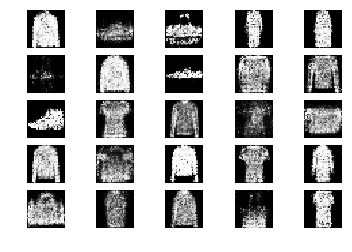

16001 [D loss: 0.639885, acc.: 62.50%] [G loss: 0.845301]
16002 [D loss: 0.640727, acc.: 60.94%] [G loss: 0.907397]
16003 [D loss: 0.726724, acc.: 46.88%] [G loss: 0.968901]
16004 [D loss: 0.723120, acc.: 53.12%] [G loss: 0.903343]
16005 [D loss: 0.648951, acc.: 64.06%] [G loss: 0.856992]
16006 [D loss: 0.665403, acc.: 60.94%] [G loss: 0.917921]
16007 [D loss: 0.642251, acc.: 67.19%] [G loss: 0.944616]
16008 [D loss: 0.614843, acc.: 67.19%] [G loss: 0.852523]
16009 [D loss: 0.645494, acc.: 64.06%] [G loss: 0.879809]
16010 [D loss: 0.642769, acc.: 62.50%] [G loss: 0.868429]
16011 [D loss: 0.638199, acc.: 59.38%] [G loss: 0.953263]
16012 [D loss: 0.652816, acc.: 62.50%] [G loss: 0.938432]
16013 [D loss: 0.676606, acc.: 54.69%] [G loss: 0.948998]
16014 [D loss: 0.672102, acc.: 51.56%] [G loss: 0.895505]
16015 [D loss: 0.612480, acc.: 71.88%] [G loss: 0.929422]
16016 [D loss: 0.646558, acc.: 64.06%] [G loss: 0.831205]
16017 [D loss: 0.663930, acc.: 57.81%] [G loss: 0.817475]
16018 [D loss:

16145 [D loss: 0.723620, acc.: 53.12%] [G loss: 0.890152]
16146 [D loss: 0.603641, acc.: 68.75%] [G loss: 0.882019]
16147 [D loss: 0.643690, acc.: 60.94%] [G loss: 0.872222]
16148 [D loss: 0.683689, acc.: 59.38%] [G loss: 0.867874]
16149 [D loss: 0.581704, acc.: 71.88%] [G loss: 0.850181]
16150 [D loss: 0.659016, acc.: 56.25%] [G loss: 0.920767]
16151 [D loss: 0.669362, acc.: 59.38%] [G loss: 0.971816]
16152 [D loss: 0.679257, acc.: 51.56%] [G loss: 0.918031]
16153 [D loss: 0.619551, acc.: 70.31%] [G loss: 0.879576]
16154 [D loss: 0.720981, acc.: 56.25%] [G loss: 0.965953]
16155 [D loss: 0.685225, acc.: 56.25%] [G loss: 0.935221]
16156 [D loss: 0.609834, acc.: 67.19%] [G loss: 0.904538]
16157 [D loss: 0.685962, acc.: 54.69%] [G loss: 0.885512]
16158 [D loss: 0.658925, acc.: 57.81%] [G loss: 0.910809]
16159 [D loss: 0.619719, acc.: 57.81%] [G loss: 0.874038]
16160 [D loss: 0.655748, acc.: 57.81%] [G loss: 0.869736]
16161 [D loss: 0.658739, acc.: 64.06%] [G loss: 0.895897]
16162 [D loss:

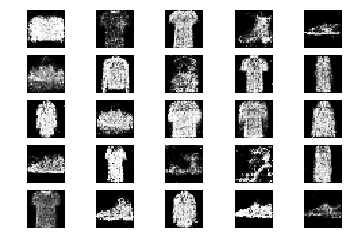

16201 [D loss: 0.650953, acc.: 65.62%] [G loss: 0.874727]
16202 [D loss: 0.666576, acc.: 65.62%] [G loss: 0.946988]
16203 [D loss: 0.644551, acc.: 64.06%] [G loss: 0.974713]
16204 [D loss: 0.637254, acc.: 60.94%] [G loss: 0.894734]
16205 [D loss: 0.649705, acc.: 62.50%] [G loss: 0.933306]
16206 [D loss: 0.646109, acc.: 54.69%] [G loss: 0.922065]
16207 [D loss: 0.640180, acc.: 64.06%] [G loss: 0.916698]
16208 [D loss: 0.660790, acc.: 59.38%] [G loss: 0.885272]
16209 [D loss: 0.665720, acc.: 56.25%] [G loss: 0.840904]
16210 [D loss: 0.683456, acc.: 60.94%] [G loss: 0.892695]
16211 [D loss: 0.617724, acc.: 67.19%] [G loss: 0.879763]
16212 [D loss: 0.637116, acc.: 62.50%] [G loss: 0.911285]
16213 [D loss: 0.678689, acc.: 50.00%] [G loss: 0.848178]
16214 [D loss: 0.676595, acc.: 57.81%] [G loss: 0.947352]
16215 [D loss: 0.617853, acc.: 67.19%] [G loss: 0.967404]
16216 [D loss: 0.629603, acc.: 68.75%] [G loss: 0.892653]
16217 [D loss: 0.718073, acc.: 51.56%] [G loss: 0.813325]
16218 [D loss:

16344 [D loss: 0.649322, acc.: 60.94%] [G loss: 0.957804]
16345 [D loss: 0.630722, acc.: 67.19%] [G loss: 0.849286]
16346 [D loss: 0.646855, acc.: 64.06%] [G loss: 0.884996]
16347 [D loss: 0.612674, acc.: 65.62%] [G loss: 0.867645]
16348 [D loss: 0.636893, acc.: 64.06%] [G loss: 1.005840]
16349 [D loss: 0.689048, acc.: 57.81%] [G loss: 0.913475]
16350 [D loss: 0.713696, acc.: 48.44%] [G loss: 0.899630]
16351 [D loss: 0.641990, acc.: 65.62%] [G loss: 0.894344]
16352 [D loss: 0.659435, acc.: 59.38%] [G loss: 0.925231]
16353 [D loss: 0.635316, acc.: 67.19%] [G loss: 0.936067]
16354 [D loss: 0.633432, acc.: 68.75%] [G loss: 0.934106]
16355 [D loss: 0.756267, acc.: 48.44%] [G loss: 0.848417]
16356 [D loss: 0.633155, acc.: 65.62%] [G loss: 0.938311]
16357 [D loss: 0.621848, acc.: 71.88%] [G loss: 0.894753]
16358 [D loss: 0.588219, acc.: 70.31%] [G loss: 0.961523]
16359 [D loss: 0.624277, acc.: 67.19%] [G loss: 0.933356]
16360 [D loss: 0.598953, acc.: 64.06%] [G loss: 0.900822]
16361 [D loss:

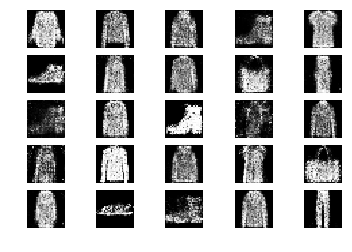

16401 [D loss: 0.675563, acc.: 65.62%] [G loss: 0.951254]
16402 [D loss: 0.642970, acc.: 59.38%] [G loss: 0.896227]
16403 [D loss: 0.588014, acc.: 67.19%] [G loss: 0.890330]
16404 [D loss: 0.703943, acc.: 56.25%] [G loss: 0.855161]
16405 [D loss: 0.619868, acc.: 59.38%] [G loss: 1.020807]
16406 [D loss: 0.698188, acc.: 50.00%] [G loss: 0.929641]
16407 [D loss: 0.704256, acc.: 51.56%] [G loss: 0.918163]
16408 [D loss: 0.665794, acc.: 57.81%] [G loss: 0.861104]
16409 [D loss: 0.634127, acc.: 62.50%] [G loss: 0.844525]
16410 [D loss: 0.640543, acc.: 62.50%] [G loss: 0.863252]
16411 [D loss: 0.659779, acc.: 57.81%] [G loss: 0.859002]
16412 [D loss: 0.655286, acc.: 60.94%] [G loss: 0.942078]
16413 [D loss: 0.635826, acc.: 62.50%] [G loss: 0.959947]
16414 [D loss: 0.673680, acc.: 60.94%] [G loss: 0.952773]
16415 [D loss: 0.747962, acc.: 48.44%] [G loss: 0.961540]
16416 [D loss: 0.689537, acc.: 53.12%] [G loss: 0.865553]
16417 [D loss: 0.607437, acc.: 64.06%] [G loss: 0.901264]
16418 [D loss:

16544 [D loss: 0.725963, acc.: 53.12%] [G loss: 0.959301]
16545 [D loss: 0.592866, acc.: 76.56%] [G loss: 0.973828]
16546 [D loss: 0.643659, acc.: 60.94%] [G loss: 0.913360]
16547 [D loss: 0.671867, acc.: 59.38%] [G loss: 0.885172]
16548 [D loss: 0.663030, acc.: 59.38%] [G loss: 0.956468]
16549 [D loss: 0.667982, acc.: 60.94%] [G loss: 0.854323]
16550 [D loss: 0.638030, acc.: 60.94%] [G loss: 0.871493]
16551 [D loss: 0.660338, acc.: 56.25%] [G loss: 0.884898]
16552 [D loss: 0.720391, acc.: 48.44%] [G loss: 0.826520]
16553 [D loss: 0.634063, acc.: 65.62%] [G loss: 0.939041]
16554 [D loss: 0.685269, acc.: 56.25%] [G loss: 0.925836]
16555 [D loss: 0.689271, acc.: 54.69%] [G loss: 0.934406]
16556 [D loss: 0.655591, acc.: 60.94%] [G loss: 0.956043]
16557 [D loss: 0.659949, acc.: 59.38%] [G loss: 0.910884]
16558 [D loss: 0.622648, acc.: 64.06%] [G loss: 0.977710]
16559 [D loss: 0.679796, acc.: 50.00%] [G loss: 0.894144]
16560 [D loss: 0.693968, acc.: 46.88%] [G loss: 0.834722]
16561 [D loss:

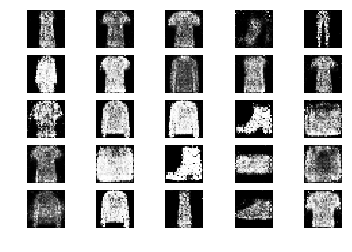

16601 [D loss: 0.642383, acc.: 56.25%] [G loss: 0.884990]
16602 [D loss: 0.642243, acc.: 64.06%] [G loss: 0.924867]
16603 [D loss: 0.620358, acc.: 62.50%] [G loss: 0.960812]
16604 [D loss: 0.688045, acc.: 56.25%] [G loss: 1.004868]
16605 [D loss: 0.656696, acc.: 65.62%] [G loss: 0.928299]
16606 [D loss: 0.618990, acc.: 57.81%] [G loss: 0.985766]
16607 [D loss: 0.712418, acc.: 60.94%] [G loss: 0.984768]
16608 [D loss: 0.638177, acc.: 60.94%] [G loss: 0.938862]
16609 [D loss: 0.684385, acc.: 50.00%] [G loss: 0.863526]
16610 [D loss: 0.695999, acc.: 53.12%] [G loss: 0.922836]
16611 [D loss: 0.673413, acc.: 53.12%] [G loss: 0.928767]
16612 [D loss: 0.682630, acc.: 64.06%] [G loss: 0.880078]
16613 [D loss: 0.581201, acc.: 68.75%] [G loss: 1.010615]
16614 [D loss: 0.709480, acc.: 53.12%] [G loss: 0.876913]
16615 [D loss: 0.644861, acc.: 57.81%] [G loss: 1.056582]
16616 [D loss: 0.627629, acc.: 68.75%] [G loss: 0.896096]
16617 [D loss: 0.631874, acc.: 65.62%] [G loss: 0.934061]
16618 [D loss:

16743 [D loss: 0.626906, acc.: 59.38%] [G loss: 0.862194]
16744 [D loss: 0.608147, acc.: 60.94%] [G loss: 0.906367]
16745 [D loss: 0.628849, acc.: 65.62%] [G loss: 0.958032]
16746 [D loss: 0.705646, acc.: 53.12%] [G loss: 0.947809]
16747 [D loss: 0.680694, acc.: 54.69%] [G loss: 0.920938]
16748 [D loss: 0.643617, acc.: 56.25%] [G loss: 0.902921]
16749 [D loss: 0.647633, acc.: 65.62%] [G loss: 0.891061]
16750 [D loss: 0.618102, acc.: 64.06%] [G loss: 0.951583]
16751 [D loss: 0.681384, acc.: 56.25%] [G loss: 0.896650]
16752 [D loss: 0.670095, acc.: 57.81%] [G loss: 0.870791]
16753 [D loss: 0.565523, acc.: 71.88%] [G loss: 0.899097]
16754 [D loss: 0.686703, acc.: 54.69%] [G loss: 0.945314]
16755 [D loss: 0.642064, acc.: 56.25%] [G loss: 0.899774]
16756 [D loss: 0.624393, acc.: 68.75%] [G loss: 0.947733]
16757 [D loss: 0.640661, acc.: 64.06%] [G loss: 0.914931]
16758 [D loss: 0.669443, acc.: 59.38%] [G loss: 0.930420]
16759 [D loss: 0.642049, acc.: 60.94%] [G loss: 0.904505]
16760 [D loss:

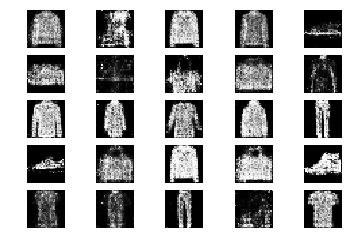

16801 [D loss: 0.598922, acc.: 70.31%] [G loss: 0.898468]
16802 [D loss: 0.702752, acc.: 59.38%] [G loss: 0.827464]
16803 [D loss: 0.610963, acc.: 71.88%] [G loss: 0.757302]
16804 [D loss: 0.708887, acc.: 46.88%] [G loss: 0.951242]
16805 [D loss: 0.645339, acc.: 62.50%] [G loss: 0.878066]
16806 [D loss: 0.619450, acc.: 65.62%] [G loss: 0.976252]
16807 [D loss: 0.667330, acc.: 60.94%] [G loss: 0.983268]
16808 [D loss: 0.662833, acc.: 59.38%] [G loss: 0.918116]
16809 [D loss: 0.655462, acc.: 54.69%] [G loss: 0.956370]
16810 [D loss: 0.623406, acc.: 70.31%] [G loss: 0.946807]
16811 [D loss: 0.622696, acc.: 70.31%] [G loss: 0.923777]
16812 [D loss: 0.629109, acc.: 64.06%] [G loss: 0.957473]
16813 [D loss: 0.583416, acc.: 70.31%] [G loss: 0.908291]
16814 [D loss: 0.726531, acc.: 48.44%] [G loss: 0.900952]
16815 [D loss: 0.643819, acc.: 62.50%] [G loss: 0.947855]
16816 [D loss: 0.646967, acc.: 56.25%] [G loss: 1.011243]
16817 [D loss: 0.663567, acc.: 56.25%] [G loss: 0.918123]
16818 [D loss:

16944 [D loss: 0.645949, acc.: 64.06%] [G loss: 0.930593]
16945 [D loss: 0.621016, acc.: 59.38%] [G loss: 1.056016]
16946 [D loss: 0.579913, acc.: 73.44%] [G loss: 0.980190]
16947 [D loss: 0.618705, acc.: 60.94%] [G loss: 0.951507]
16948 [D loss: 0.607893, acc.: 70.31%] [G loss: 0.887254]
16949 [D loss: 0.599387, acc.: 64.06%] [G loss: 0.958751]
16950 [D loss: 0.634698, acc.: 65.62%] [G loss: 1.012975]
16951 [D loss: 0.606399, acc.: 71.88%] [G loss: 0.844481]
16952 [D loss: 0.599619, acc.: 67.19%] [G loss: 0.919659]
16953 [D loss: 0.662426, acc.: 50.00%] [G loss: 0.932156]
16954 [D loss: 0.690937, acc.: 54.69%] [G loss: 0.890388]
16955 [D loss: 0.580362, acc.: 78.12%] [G loss: 0.920740]
16956 [D loss: 0.691105, acc.: 54.69%] [G loss: 0.904541]
16957 [D loss: 0.674223, acc.: 59.38%] [G loss: 0.961299]
16958 [D loss: 0.589038, acc.: 70.31%] [G loss: 0.935056]
16959 [D loss: 0.693634, acc.: 50.00%] [G loss: 0.898514]
16960 [D loss: 0.680895, acc.: 62.50%] [G loss: 0.949718]
16961 [D loss:

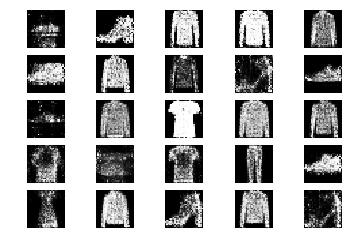

17001 [D loss: 0.654277, acc.: 59.38%] [G loss: 0.997931]
17002 [D loss: 0.651428, acc.: 62.50%] [G loss: 0.896573]
17003 [D loss: 0.658088, acc.: 57.81%] [G loss: 0.928347]
17004 [D loss: 0.602735, acc.: 71.88%] [G loss: 0.925093]
17005 [D loss: 0.630659, acc.: 64.06%] [G loss: 0.869246]
17006 [D loss: 0.675596, acc.: 54.69%] [G loss: 0.972223]
17007 [D loss: 0.591830, acc.: 65.62%] [G loss: 0.972388]
17008 [D loss: 0.752603, acc.: 48.44%] [G loss: 0.870975]
17009 [D loss: 0.638442, acc.: 62.50%] [G loss: 0.820719]
17010 [D loss: 0.670418, acc.: 54.69%] [G loss: 0.910474]
17011 [D loss: 0.630042, acc.: 75.00%] [G loss: 0.875682]
17012 [D loss: 0.669187, acc.: 59.38%] [G loss: 0.868191]
17013 [D loss: 0.683061, acc.: 59.38%] [G loss: 0.904105]
17014 [D loss: 0.671055, acc.: 56.25%] [G loss: 0.940386]
17015 [D loss: 0.653944, acc.: 51.56%] [G loss: 0.911747]
17016 [D loss: 0.645500, acc.: 67.19%] [G loss: 0.891866]
17017 [D loss: 0.652317, acc.: 67.19%] [G loss: 0.957717]
17018 [D loss:

17144 [D loss: 0.653847, acc.: 60.94%] [G loss: 0.933034]
17145 [D loss: 0.586922, acc.: 64.06%] [G loss: 0.815100]
17146 [D loss: 0.719793, acc.: 54.69%] [G loss: 0.943346]
17147 [D loss: 0.635942, acc.: 62.50%] [G loss: 0.949560]
17148 [D loss: 0.670900, acc.: 56.25%] [G loss: 1.023792]
17149 [D loss: 0.634218, acc.: 64.06%] [G loss: 0.929709]
17150 [D loss: 0.669183, acc.: 59.38%] [G loss: 0.861234]
17151 [D loss: 0.623419, acc.: 60.94%] [G loss: 0.937896]
17152 [D loss: 0.656087, acc.: 62.50%] [G loss: 0.963095]
17153 [D loss: 0.602957, acc.: 75.00%] [G loss: 0.966115]
17154 [D loss: 0.587146, acc.: 73.44%] [G loss: 1.007323]
17155 [D loss: 0.609884, acc.: 71.88%] [G loss: 0.929948]
17156 [D loss: 0.666100, acc.: 56.25%] [G loss: 0.930801]
17157 [D loss: 0.676193, acc.: 65.62%] [G loss: 0.914682]
17158 [D loss: 0.716333, acc.: 45.31%] [G loss: 0.925869]
17159 [D loss: 0.647030, acc.: 60.94%] [G loss: 1.012036]
17160 [D loss: 0.632540, acc.: 59.38%] [G loss: 0.961826]
17161 [D loss:

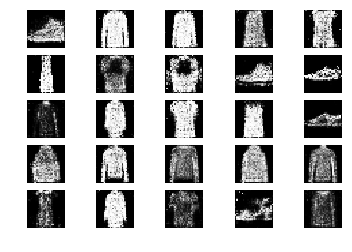

17201 [D loss: 0.674926, acc.: 57.81%] [G loss: 0.949982]
17202 [D loss: 0.646457, acc.: 62.50%] [G loss: 0.973385]
17203 [D loss: 0.645662, acc.: 62.50%] [G loss: 1.014704]
17204 [D loss: 0.736460, acc.: 53.12%] [G loss: 0.895314]
17205 [D loss: 0.636259, acc.: 64.06%] [G loss: 0.953493]
17206 [D loss: 0.662694, acc.: 53.12%] [G loss: 0.929861]
17207 [D loss: 0.605320, acc.: 70.31%] [G loss: 0.890091]
17208 [D loss: 0.644186, acc.: 64.06%] [G loss: 0.803106]
17209 [D loss: 0.718509, acc.: 51.56%] [G loss: 0.893281]
17210 [D loss: 0.661344, acc.: 60.94%] [G loss: 0.889070]
17211 [D loss: 0.662684, acc.: 59.38%] [G loss: 0.881105]
17212 [D loss: 0.661378, acc.: 59.38%] [G loss: 0.957099]
17213 [D loss: 0.718001, acc.: 48.44%] [G loss: 0.829398]
17214 [D loss: 0.655547, acc.: 56.25%] [G loss: 0.912680]
17215 [D loss: 0.714962, acc.: 51.56%] [G loss: 0.865657]
17216 [D loss: 0.636423, acc.: 60.94%] [G loss: 0.854222]
17217 [D loss: 0.691645, acc.: 62.50%] [G loss: 0.800140]
17218 [D loss:

17345 [D loss: 0.690671, acc.: 56.25%] [G loss: 0.874564]
17346 [D loss: 0.634917, acc.: 64.06%] [G loss: 0.874906]
17347 [D loss: 0.622981, acc.: 65.62%] [G loss: 1.012772]
17348 [D loss: 0.637965, acc.: 62.50%] [G loss: 0.899480]
17349 [D loss: 0.634748, acc.: 60.94%] [G loss: 0.907812]
17350 [D loss: 0.675935, acc.: 59.38%] [G loss: 0.856651]
17351 [D loss: 0.615550, acc.: 65.62%] [G loss: 0.864522]
17352 [D loss: 0.602919, acc.: 64.06%] [G loss: 0.834959]
17353 [D loss: 0.654990, acc.: 59.38%] [G loss: 0.904166]
17354 [D loss: 0.625638, acc.: 60.94%] [G loss: 0.969765]
17355 [D loss: 0.608890, acc.: 64.06%] [G loss: 0.976675]
17356 [D loss: 0.602399, acc.: 56.25%] [G loss: 0.873612]
17357 [D loss: 0.628692, acc.: 67.19%] [G loss: 0.861307]
17358 [D loss: 0.610419, acc.: 62.50%] [G loss: 0.908401]
17359 [D loss: 0.615305, acc.: 65.62%] [G loss: 0.817935]
17360 [D loss: 0.695084, acc.: 51.56%] [G loss: 0.834996]
17361 [D loss: 0.644877, acc.: 56.25%] [G loss: 0.916892]
17362 [D loss:

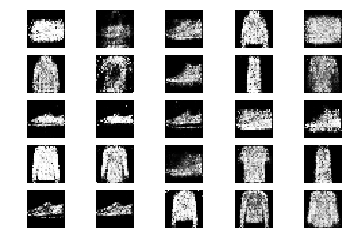

17401 [D loss: 0.618874, acc.: 68.75%] [G loss: 0.907432]
17402 [D loss: 0.566344, acc.: 75.00%] [G loss: 1.021462]
17403 [D loss: 0.682789, acc.: 65.62%] [G loss: 0.930494]
17404 [D loss: 0.676126, acc.: 54.69%] [G loss: 0.927424]
17405 [D loss: 0.630543, acc.: 62.50%] [G loss: 0.988441]
17406 [D loss: 0.623656, acc.: 64.06%] [G loss: 0.875830]
17407 [D loss: 0.669098, acc.: 56.25%] [G loss: 0.877217]
17408 [D loss: 0.613538, acc.: 71.88%] [G loss: 0.946783]
17409 [D loss: 0.650880, acc.: 70.31%] [G loss: 0.888282]
17410 [D loss: 0.697515, acc.: 56.25%] [G loss: 0.901889]
17411 [D loss: 0.635537, acc.: 62.50%] [G loss: 0.975612]
17412 [D loss: 0.648927, acc.: 54.69%] [G loss: 0.931221]
17413 [D loss: 0.679815, acc.: 51.56%] [G loss: 0.884616]
17414 [D loss: 0.677260, acc.: 59.38%] [G loss: 0.884499]
17415 [D loss: 0.649415, acc.: 64.06%] [G loss: 0.905943]
17416 [D loss: 0.631181, acc.: 53.12%] [G loss: 0.949154]
17417 [D loss: 0.748513, acc.: 39.06%] [G loss: 0.905477]
17418 [D loss:

17544 [D loss: 0.700525, acc.: 50.00%] [G loss: 0.877918]
17545 [D loss: 0.648651, acc.: 64.06%] [G loss: 0.864562]
17546 [D loss: 0.635617, acc.: 65.62%] [G loss: 0.915599]
17547 [D loss: 0.660450, acc.: 64.06%] [G loss: 0.891902]
17548 [D loss: 0.679416, acc.: 56.25%] [G loss: 0.916757]
17549 [D loss: 0.643061, acc.: 59.38%] [G loss: 0.967257]
17550 [D loss: 0.721190, acc.: 51.56%] [G loss: 0.882473]
17551 [D loss: 0.661235, acc.: 60.94%] [G loss: 0.860628]
17552 [D loss: 0.590444, acc.: 73.44%] [G loss: 0.922037]
17553 [D loss: 0.677177, acc.: 51.56%] [G loss: 1.010266]
17554 [D loss: 0.588917, acc.: 73.44%] [G loss: 0.961316]
17555 [D loss: 0.697080, acc.: 51.56%] [G loss: 0.902815]
17556 [D loss: 0.638355, acc.: 68.75%] [G loss: 0.889418]
17557 [D loss: 0.646038, acc.: 56.25%] [G loss: 0.897591]
17558 [D loss: 0.744566, acc.: 45.31%] [G loss: 0.944627]
17559 [D loss: 0.605633, acc.: 71.88%] [G loss: 0.897200]
17560 [D loss: 0.685614, acc.: 57.81%] [G loss: 0.982364]
17561 [D loss:

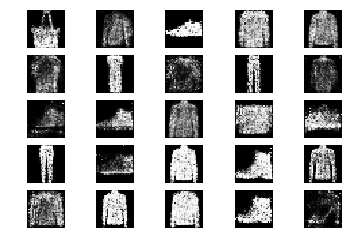

17601 [D loss: 0.623352, acc.: 62.50%] [G loss: 0.879244]
17602 [D loss: 0.608522, acc.: 67.19%] [G loss: 0.973569]
17603 [D loss: 0.639231, acc.: 59.38%] [G loss: 0.882707]
17604 [D loss: 0.669811, acc.: 57.81%] [G loss: 0.984873]
17605 [D loss: 0.705959, acc.: 51.56%] [G loss: 0.935127]
17606 [D loss: 0.598380, acc.: 65.62%] [G loss: 0.931492]
17607 [D loss: 0.626834, acc.: 65.62%] [G loss: 0.873441]
17608 [D loss: 0.715227, acc.: 54.69%] [G loss: 0.903926]
17609 [D loss: 0.679095, acc.: 56.25%] [G loss: 0.930351]
17610 [D loss: 0.690067, acc.: 59.38%] [G loss: 0.880583]
17611 [D loss: 0.614093, acc.: 70.31%] [G loss: 0.938083]
17612 [D loss: 0.630569, acc.: 65.62%] [G loss: 0.908901]
17613 [D loss: 0.633833, acc.: 57.81%] [G loss: 0.942051]
17614 [D loss: 0.646170, acc.: 57.81%] [G loss: 0.997521]
17615 [D loss: 0.644246, acc.: 59.38%] [G loss: 0.966731]
17616 [D loss: 0.647976, acc.: 60.94%] [G loss: 0.957610]
17617 [D loss: 0.654626, acc.: 65.62%] [G loss: 0.905079]
17618 [D loss:

17745 [D loss: 0.695028, acc.: 46.88%] [G loss: 0.898608]
17746 [D loss: 0.674978, acc.: 57.81%] [G loss: 0.932459]
17747 [D loss: 0.681114, acc.: 51.56%] [G loss: 0.869197]
17748 [D loss: 0.671233, acc.: 56.25%] [G loss: 0.863622]
17749 [D loss: 0.639301, acc.: 64.06%] [G loss: 0.922674]
17750 [D loss: 0.656683, acc.: 60.94%] [G loss: 0.883812]
17751 [D loss: 0.636371, acc.: 60.94%] [G loss: 0.979576]
17752 [D loss: 0.637626, acc.: 59.38%] [G loss: 0.920404]
17753 [D loss: 0.686655, acc.: 60.94%] [G loss: 0.921080]
17754 [D loss: 0.673967, acc.: 60.94%] [G loss: 0.882894]
17755 [D loss: 0.659181, acc.: 59.38%] [G loss: 0.947661]
17756 [D loss: 0.686562, acc.: 56.25%] [G loss: 0.897442]
17757 [D loss: 0.679348, acc.: 64.06%] [G loss: 0.895057]
17758 [D loss: 0.662180, acc.: 56.25%] [G loss: 0.919645]
17759 [D loss: 0.618835, acc.: 67.19%] [G loss: 0.888551]
17760 [D loss: 0.665910, acc.: 57.81%] [G loss: 0.863694]
17761 [D loss: 0.655663, acc.: 59.38%] [G loss: 0.915845]
17762 [D loss:

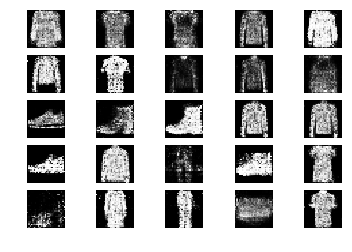

17801 [D loss: 0.617820, acc.: 68.75%] [G loss: 0.890714]
17802 [D loss: 0.725209, acc.: 48.44%] [G loss: 0.947693]
17803 [D loss: 0.661951, acc.: 62.50%] [G loss: 0.814873]
17804 [D loss: 0.651598, acc.: 54.69%] [G loss: 0.954322]
17805 [D loss: 0.577486, acc.: 79.69%] [G loss: 0.940133]
17806 [D loss: 0.657125, acc.: 53.12%] [G loss: 0.971710]
17807 [D loss: 0.600867, acc.: 70.31%] [G loss: 0.868470]
17808 [D loss: 0.662469, acc.: 60.94%] [G loss: 0.832303]
17809 [D loss: 0.636369, acc.: 64.06%] [G loss: 0.939544]
17810 [D loss: 0.701998, acc.: 53.12%] [G loss: 0.858025]
17811 [D loss: 0.632680, acc.: 62.50%] [G loss: 0.920956]
17812 [D loss: 0.619160, acc.: 62.50%] [G loss: 0.869839]
17813 [D loss: 0.624490, acc.: 60.94%] [G loss: 0.902405]
17814 [D loss: 0.601079, acc.: 64.06%] [G loss: 0.880942]
17815 [D loss: 0.634431, acc.: 60.94%] [G loss: 0.828101]
17816 [D loss: 0.575181, acc.: 73.44%] [G loss: 0.875555]
17817 [D loss: 0.640861, acc.: 64.06%] [G loss: 0.815782]
17818 [D loss:

17943 [D loss: 0.712442, acc.: 51.56%] [G loss: 0.950338]
17944 [D loss: 0.622509, acc.: 71.88%] [G loss: 1.012225]
17945 [D loss: 0.669471, acc.: 62.50%] [G loss: 0.931738]
17946 [D loss: 0.628688, acc.: 64.06%] [G loss: 1.024364]
17947 [D loss: 0.673559, acc.: 60.94%] [G loss: 1.005072]
17948 [D loss: 0.643711, acc.: 62.50%] [G loss: 0.928423]
17949 [D loss: 0.668737, acc.: 56.25%] [G loss: 0.931220]
17950 [D loss: 0.612761, acc.: 64.06%] [G loss: 0.989437]
17951 [D loss: 0.611746, acc.: 71.88%] [G loss: 0.871435]
17952 [D loss: 0.690625, acc.: 56.25%] [G loss: 0.914771]
17953 [D loss: 0.642141, acc.: 64.06%] [G loss: 0.908001]
17954 [D loss: 0.685922, acc.: 59.38%] [G loss: 0.880170]
17955 [D loss: 0.687169, acc.: 57.81%] [G loss: 0.921999]
17956 [D loss: 0.656897, acc.: 53.12%] [G loss: 0.906890]
17957 [D loss: 0.668673, acc.: 64.06%] [G loss: 0.902182]
17958 [D loss: 0.655195, acc.: 60.94%] [G loss: 0.932082]
17959 [D loss: 0.594915, acc.: 68.75%] [G loss: 0.993723]
17960 [D loss:

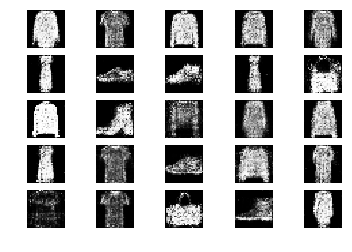

18001 [D loss: 0.653536, acc.: 59.38%] [G loss: 0.924894]
18002 [D loss: 0.576945, acc.: 78.12%] [G loss: 0.966680]
18003 [D loss: 0.709540, acc.: 56.25%] [G loss: 0.914613]
18004 [D loss: 0.642600, acc.: 65.62%] [G loss: 0.959998]
18005 [D loss: 0.625335, acc.: 65.62%] [G loss: 0.899167]
18006 [D loss: 0.653661, acc.: 62.50%] [G loss: 0.842684]
18007 [D loss: 0.605085, acc.: 68.75%] [G loss: 0.904062]
18008 [D loss: 0.672401, acc.: 57.81%] [G loss: 0.991812]
18009 [D loss: 0.575824, acc.: 70.31%] [G loss: 0.942309]
18010 [D loss: 0.662376, acc.: 62.50%] [G loss: 0.969536]
18011 [D loss: 0.675516, acc.: 51.56%] [G loss: 0.957974]
18012 [D loss: 0.653143, acc.: 60.94%] [G loss: 1.007607]
18013 [D loss: 0.652378, acc.: 64.06%] [G loss: 0.926600]
18014 [D loss: 0.738085, acc.: 51.56%] [G loss: 0.954358]
18015 [D loss: 0.646031, acc.: 56.25%] [G loss: 0.901196]
18016 [D loss: 0.626438, acc.: 64.06%] [G loss: 0.928861]
18017 [D loss: 0.609025, acc.: 71.88%] [G loss: 0.912912]
18018 [D loss:

18146 [D loss: 0.708969, acc.: 56.25%] [G loss: 0.882549]
18147 [D loss: 0.663791, acc.: 62.50%] [G loss: 0.790577]
18148 [D loss: 0.605095, acc.: 64.06%] [G loss: 0.921514]
18149 [D loss: 0.697618, acc.: 57.81%] [G loss: 0.941787]
18150 [D loss: 0.674735, acc.: 57.81%] [G loss: 1.006944]
18151 [D loss: 0.599740, acc.: 67.19%] [G loss: 0.925096]
18152 [D loss: 0.617107, acc.: 65.62%] [G loss: 0.933604]
18153 [D loss: 0.623578, acc.: 70.31%] [G loss: 0.900033]
18154 [D loss: 0.643481, acc.: 62.50%] [G loss: 0.840264]
18155 [D loss: 0.612860, acc.: 68.75%] [G loss: 0.938938]
18156 [D loss: 0.654598, acc.: 51.56%] [G loss: 0.913834]
18157 [D loss: 0.684269, acc.: 53.12%] [G loss: 0.977204]
18158 [D loss: 0.575969, acc.: 70.31%] [G loss: 0.952980]
18159 [D loss: 0.660873, acc.: 56.25%] [G loss: 0.963213]
18160 [D loss: 0.613329, acc.: 65.62%] [G loss: 0.971049]
18161 [D loss: 0.646949, acc.: 65.62%] [G loss: 0.990031]
18162 [D loss: 0.660840, acc.: 57.81%] [G loss: 0.866507]
18163 [D loss:

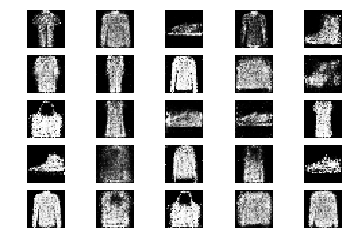

18201 [D loss: 0.614857, acc.: 67.19%] [G loss: 0.856502]
18202 [D loss: 0.658349, acc.: 59.38%] [G loss: 0.790489]
18203 [D loss: 0.732281, acc.: 57.81%] [G loss: 0.973747]
18204 [D loss: 0.706843, acc.: 56.25%] [G loss: 0.895687]
18205 [D loss: 0.654384, acc.: 60.94%] [G loss: 0.880306]
18206 [D loss: 0.693710, acc.: 51.56%] [G loss: 0.832049]
18207 [D loss: 0.668037, acc.: 48.44%] [G loss: 0.922394]
18208 [D loss: 0.646337, acc.: 59.38%] [G loss: 0.940391]
18209 [D loss: 0.717202, acc.: 48.44%] [G loss: 0.964334]
18210 [D loss: 0.632814, acc.: 65.62%] [G loss: 0.944488]
18211 [D loss: 0.650431, acc.: 67.19%] [G loss: 0.958914]
18212 [D loss: 0.691619, acc.: 51.56%] [G loss: 0.901907]
18213 [D loss: 0.657495, acc.: 56.25%] [G loss: 0.957818]
18214 [D loss: 0.648174, acc.: 57.81%] [G loss: 1.013440]
18215 [D loss: 0.652725, acc.: 60.94%] [G loss: 0.886280]
18216 [D loss: 0.634295, acc.: 57.81%] [G loss: 0.980523]
18217 [D loss: 0.598458, acc.: 64.06%] [G loss: 0.859738]
18218 [D loss:

18344 [D loss: 0.629521, acc.: 60.94%] [G loss: 0.961234]
18345 [D loss: 0.557064, acc.: 78.12%] [G loss: 0.949119]
18346 [D loss: 0.662727, acc.: 60.94%] [G loss: 0.955523]
18347 [D loss: 0.695050, acc.: 62.50%] [G loss: 0.876945]
18348 [D loss: 0.663891, acc.: 62.50%] [G loss: 0.945060]
18349 [D loss: 0.694062, acc.: 57.81%] [G loss: 0.969604]
18350 [D loss: 0.660264, acc.: 57.81%] [G loss: 0.910735]
18351 [D loss: 0.681930, acc.: 56.25%] [G loss: 0.849555]
18352 [D loss: 0.646002, acc.: 59.38%] [G loss: 0.897562]
18353 [D loss: 0.662622, acc.: 56.25%] [G loss: 0.891689]
18354 [D loss: 0.701029, acc.: 53.12%] [G loss: 0.888892]
18355 [D loss: 0.624688, acc.: 65.62%] [G loss: 0.888758]
18356 [D loss: 0.679901, acc.: 65.62%] [G loss: 0.888184]
18357 [D loss: 0.678549, acc.: 57.81%] [G loss: 0.940046]
18358 [D loss: 0.671066, acc.: 56.25%] [G loss: 0.896688]
18359 [D loss: 0.616943, acc.: 67.19%] [G loss: 0.887982]
18360 [D loss: 0.591244, acc.: 68.75%] [G loss: 0.815509]
18361 [D loss:

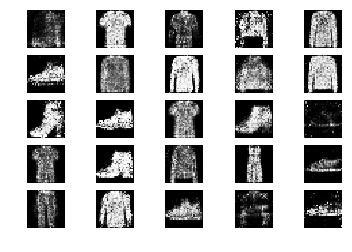

18401 [D loss: 0.651975, acc.: 64.06%] [G loss: 0.976328]
18402 [D loss: 0.604638, acc.: 62.50%] [G loss: 0.959770]
18403 [D loss: 0.634965, acc.: 60.94%] [G loss: 0.995054]
18404 [D loss: 0.716982, acc.: 54.69%] [G loss: 0.923260]
18405 [D loss: 0.654757, acc.: 62.50%] [G loss: 0.825054]
18406 [D loss: 0.728167, acc.: 57.81%] [G loss: 0.867655]
18407 [D loss: 0.649389, acc.: 67.19%] [G loss: 0.889405]
18408 [D loss: 0.660139, acc.: 57.81%] [G loss: 1.020768]
18409 [D loss: 0.680895, acc.: 59.38%] [G loss: 0.930212]
18410 [D loss: 0.658682, acc.: 54.69%] [G loss: 0.804049]
18411 [D loss: 0.627265, acc.: 62.50%] [G loss: 0.983577]
18412 [D loss: 0.630044, acc.: 68.75%] [G loss: 0.873737]
18413 [D loss: 0.676358, acc.: 57.81%] [G loss: 0.915143]
18414 [D loss: 0.652417, acc.: 70.31%] [G loss: 0.891535]
18415 [D loss: 0.682038, acc.: 57.81%] [G loss: 0.944414]
18416 [D loss: 0.639416, acc.: 65.62%] [G loss: 0.919322]
18417 [D loss: 0.661718, acc.: 56.25%] [G loss: 0.956237]
18418 [D loss:

18544 [D loss: 0.728771, acc.: 60.94%] [G loss: 0.916986]
18545 [D loss: 0.689047, acc.: 56.25%] [G loss: 0.900719]
18546 [D loss: 0.698366, acc.: 50.00%] [G loss: 0.914608]
18547 [D loss: 0.620547, acc.: 70.31%] [G loss: 0.914406]
18548 [D loss: 0.636129, acc.: 65.62%] [G loss: 0.931646]
18549 [D loss: 0.702696, acc.: 54.69%] [G loss: 0.915940]
18550 [D loss: 0.651105, acc.: 64.06%] [G loss: 0.909203]
18551 [D loss: 0.596068, acc.: 70.31%] [G loss: 0.944861]
18552 [D loss: 0.709966, acc.: 53.12%] [G loss: 0.963741]
18553 [D loss: 0.591972, acc.: 68.75%] [G loss: 0.968761]
18554 [D loss: 0.661582, acc.: 57.81%] [G loss: 0.864362]
18555 [D loss: 0.609025, acc.: 75.00%] [G loss: 0.950054]
18556 [D loss: 0.666090, acc.: 57.81%] [G loss: 0.946967]
18557 [D loss: 0.670650, acc.: 57.81%] [G loss: 0.976970]
18558 [D loss: 0.589324, acc.: 67.19%] [G loss: 0.961650]
18559 [D loss: 0.641044, acc.: 60.94%] [G loss: 0.987165]
18560 [D loss: 0.713715, acc.: 59.38%] [G loss: 0.989303]
18561 [D loss:

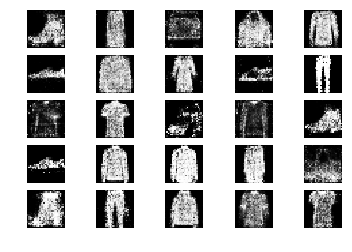

18601 [D loss: 0.642892, acc.: 68.75%] [G loss: 0.986957]
18602 [D loss: 0.668052, acc.: 57.81%] [G loss: 0.911767]
18603 [D loss: 0.636715, acc.: 60.94%] [G loss: 0.934855]
18604 [D loss: 0.631430, acc.: 59.38%] [G loss: 0.957320]
18605 [D loss: 0.670630, acc.: 56.25%] [G loss: 0.979018]
18606 [D loss: 0.653514, acc.: 54.69%] [G loss: 0.816188]
18607 [D loss: 0.672809, acc.: 62.50%] [G loss: 0.885107]
18608 [D loss: 0.603902, acc.: 70.31%] [G loss: 0.956976]
18609 [D loss: 0.652464, acc.: 57.81%] [G loss: 0.959938]
18610 [D loss: 0.716369, acc.: 59.38%] [G loss: 0.972894]
18611 [D loss: 0.704327, acc.: 46.88%] [G loss: 0.939756]
18612 [D loss: 0.679250, acc.: 57.81%] [G loss: 0.920653]
18613 [D loss: 0.609034, acc.: 71.88%] [G loss: 1.017560]
18614 [D loss: 0.735520, acc.: 50.00%] [G loss: 0.954700]
18615 [D loss: 0.668715, acc.: 60.94%] [G loss: 0.884124]
18616 [D loss: 0.611202, acc.: 64.06%] [G loss: 0.988067]
18617 [D loss: 0.638275, acc.: 59.38%] [G loss: 0.918237]
18618 [D loss:

18745 [D loss: 0.612796, acc.: 65.62%] [G loss: 0.967622]
18746 [D loss: 0.627337, acc.: 60.94%] [G loss: 0.858989]
18747 [D loss: 0.594713, acc.: 65.62%] [G loss: 0.930093]
18748 [D loss: 0.637939, acc.: 59.38%] [G loss: 1.017311]
18749 [D loss: 0.644901, acc.: 64.06%] [G loss: 0.849136]
18750 [D loss: 0.644573, acc.: 64.06%] [G loss: 0.914643]
18751 [D loss: 0.666337, acc.: 56.25%] [G loss: 0.865904]
18752 [D loss: 0.644916, acc.: 68.75%] [G loss: 0.917264]
18753 [D loss: 0.632289, acc.: 60.94%] [G loss: 0.932843]
18754 [D loss: 0.638370, acc.: 62.50%] [G loss: 0.910140]
18755 [D loss: 0.671833, acc.: 59.38%] [G loss: 0.904853]
18756 [D loss: 0.613256, acc.: 68.75%] [G loss: 0.918089]
18757 [D loss: 0.574696, acc.: 68.75%] [G loss: 0.875419]
18758 [D loss: 0.610413, acc.: 67.19%] [G loss: 0.944479]
18759 [D loss: 0.664754, acc.: 62.50%] [G loss: 0.842545]
18760 [D loss: 0.655868, acc.: 57.81%] [G loss: 0.940640]
18761 [D loss: 0.649937, acc.: 62.50%] [G loss: 0.886264]
18762 [D loss:

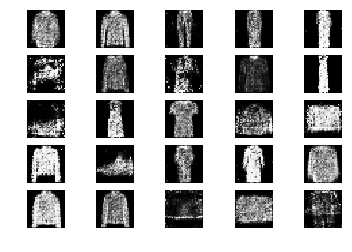

18801 [D loss: 0.644139, acc.: 67.19%] [G loss: 0.963760]
18802 [D loss: 0.570104, acc.: 76.56%] [G loss: 0.921549]
18803 [D loss: 0.604043, acc.: 67.19%] [G loss: 0.913230]
18804 [D loss: 0.673211, acc.: 56.25%] [G loss: 0.924005]
18805 [D loss: 0.681507, acc.: 60.94%] [G loss: 0.884410]
18806 [D loss: 0.648911, acc.: 65.62%] [G loss: 0.882251]
18807 [D loss: 0.678689, acc.: 60.94%] [G loss: 0.867769]
18808 [D loss: 0.622578, acc.: 65.62%] [G loss: 0.796602]
18809 [D loss: 0.652260, acc.: 54.69%] [G loss: 0.901229]
18810 [D loss: 0.710557, acc.: 54.69%] [G loss: 0.892870]
18811 [D loss: 0.675891, acc.: 59.38%] [G loss: 0.940546]
18812 [D loss: 0.652730, acc.: 64.06%] [G loss: 0.944919]
18813 [D loss: 0.700931, acc.: 57.81%] [G loss: 1.015332]
18814 [D loss: 0.604076, acc.: 67.19%] [G loss: 0.910121]
18815 [D loss: 0.657391, acc.: 54.69%] [G loss: 0.906217]
18816 [D loss: 0.668562, acc.: 64.06%] [G loss: 0.826019]
18817 [D loss: 0.655078, acc.: 60.94%] [G loss: 0.929229]
18818 [D loss:

18946 [D loss: 0.643438, acc.: 67.19%] [G loss: 0.834163]
18947 [D loss: 0.684035, acc.: 62.50%] [G loss: 0.903753]
18948 [D loss: 0.715876, acc.: 48.44%] [G loss: 1.002496]
18949 [D loss: 0.673037, acc.: 59.38%] [G loss: 0.994782]
18950 [D loss: 0.665127, acc.: 59.38%] [G loss: 0.909606]
18951 [D loss: 0.641187, acc.: 70.31%] [G loss: 0.896846]
18952 [D loss: 0.645431, acc.: 64.06%] [G loss: 1.031503]
18953 [D loss: 0.617588, acc.: 68.75%] [G loss: 0.966562]
18954 [D loss: 0.679127, acc.: 53.12%] [G loss: 0.848403]
18955 [D loss: 0.666634, acc.: 62.50%] [G loss: 0.907857]
18956 [D loss: 0.610232, acc.: 71.88%] [G loss: 0.921376]
18957 [D loss: 0.677377, acc.: 57.81%] [G loss: 0.852040]
18958 [D loss: 0.622192, acc.: 65.62%] [G loss: 0.941246]
18959 [D loss: 0.622551, acc.: 67.19%] [G loss: 0.980561]
18960 [D loss: 0.713158, acc.: 56.25%] [G loss: 0.931496]
18961 [D loss: 0.594503, acc.: 65.62%] [G loss: 0.926343]
18962 [D loss: 0.719436, acc.: 48.44%] [G loss: 1.051770]
18963 [D loss:

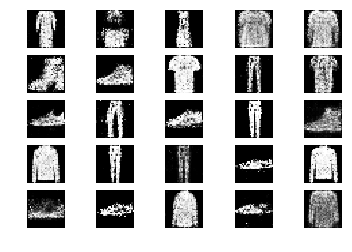

19001 [D loss: 0.651671, acc.: 56.25%] [G loss: 0.918722]
19002 [D loss: 0.609954, acc.: 67.19%] [G loss: 1.041461]
19003 [D loss: 0.658418, acc.: 54.69%] [G loss: 1.084573]
19004 [D loss: 0.684597, acc.: 57.81%] [G loss: 0.959864]
19005 [D loss: 0.658664, acc.: 57.81%] [G loss: 0.967836]
19006 [D loss: 0.695981, acc.: 60.94%] [G loss: 0.977326]
19007 [D loss: 0.630046, acc.: 70.31%] [G loss: 0.867593]
19008 [D loss: 0.622057, acc.: 67.19%] [G loss: 0.907860]
19009 [D loss: 0.649844, acc.: 59.38%] [G loss: 0.956252]
19010 [D loss: 0.653603, acc.: 64.06%] [G loss: 0.913214]
19011 [D loss: 0.623797, acc.: 60.94%] [G loss: 0.918374]
19012 [D loss: 0.639666, acc.: 64.06%] [G loss: 0.983567]
19013 [D loss: 0.676050, acc.: 62.50%] [G loss: 1.010138]
19014 [D loss: 0.671224, acc.: 62.50%] [G loss: 0.982188]
19015 [D loss: 0.687486, acc.: 56.25%] [G loss: 0.952452]
19016 [D loss: 0.660369, acc.: 64.06%] [G loss: 0.865139]
19017 [D loss: 0.667137, acc.: 64.06%] [G loss: 0.819616]
19018 [D loss:

19144 [D loss: 0.616178, acc.: 68.75%] [G loss: 0.959390]
19145 [D loss: 0.637641, acc.: 64.06%] [G loss: 0.858554]
19146 [D loss: 0.700013, acc.: 54.69%] [G loss: 0.962780]
19147 [D loss: 0.699105, acc.: 46.88%] [G loss: 0.966995]
19148 [D loss: 0.649331, acc.: 65.62%] [G loss: 0.987127]
19149 [D loss: 0.654515, acc.: 57.81%] [G loss: 0.977903]
19150 [D loss: 0.669179, acc.: 57.81%] [G loss: 0.919986]
19151 [D loss: 0.666804, acc.: 57.81%] [G loss: 0.945742]
19152 [D loss: 0.654806, acc.: 53.12%] [G loss: 0.895424]
19153 [D loss: 0.678894, acc.: 60.94%] [G loss: 0.863550]
19154 [D loss: 0.632491, acc.: 65.62%] [G loss: 0.881995]
19155 [D loss: 0.607120, acc.: 68.75%] [G loss: 0.911279]
19156 [D loss: 0.720881, acc.: 53.12%] [G loss: 0.904123]
19157 [D loss: 0.607982, acc.: 71.88%] [G loss: 0.935431]
19158 [D loss: 0.639543, acc.: 65.62%] [G loss: 1.001772]
19159 [D loss: 0.630870, acc.: 59.38%] [G loss: 1.004474]
19160 [D loss: 0.654348, acc.: 64.06%] [G loss: 1.012351]
19161 [D loss:

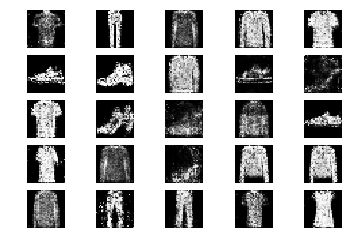

19201 [D loss: 0.627470, acc.: 64.06%] [G loss: 0.970780]
19202 [D loss: 0.660751, acc.: 62.50%] [G loss: 0.896517]
19203 [D loss: 0.674865, acc.: 51.56%] [G loss: 0.911889]
19204 [D loss: 0.604563, acc.: 67.19%] [G loss: 0.905075]
19205 [D loss: 0.614111, acc.: 65.62%] [G loss: 0.924205]
19206 [D loss: 0.689983, acc.: 56.25%] [G loss: 0.904199]
19207 [D loss: 0.629705, acc.: 64.06%] [G loss: 0.891775]
19208 [D loss: 0.673524, acc.: 56.25%] [G loss: 0.834007]
19209 [D loss: 0.710100, acc.: 54.69%] [G loss: 0.918566]
19210 [D loss: 0.650375, acc.: 56.25%] [G loss: 0.926266]
19211 [D loss: 0.646741, acc.: 65.62%] [G loss: 1.084344]
19212 [D loss: 0.610671, acc.: 70.31%] [G loss: 0.958237]
19213 [D loss: 0.678765, acc.: 60.94%] [G loss: 0.967396]
19214 [D loss: 0.664836, acc.: 59.38%] [G loss: 0.911988]
19215 [D loss: 0.637656, acc.: 53.12%] [G loss: 0.916444]
19216 [D loss: 0.633066, acc.: 65.62%] [G loss: 1.032622]
19217 [D loss: 0.720462, acc.: 59.38%] [G loss: 0.906802]
19218 [D loss:

19343 [D loss: 0.587130, acc.: 67.19%] [G loss: 0.877816]
19344 [D loss: 0.617810, acc.: 65.62%] [G loss: 0.912093]
19345 [D loss: 0.693623, acc.: 53.12%] [G loss: 0.911297]
19346 [D loss: 0.651277, acc.: 60.94%] [G loss: 0.883375]
19347 [D loss: 0.619717, acc.: 67.19%] [G loss: 0.996014]
19348 [D loss: 0.567364, acc.: 70.31%] [G loss: 0.970975]
19349 [D loss: 0.598278, acc.: 65.62%] [G loss: 0.858899]
19350 [D loss: 0.707595, acc.: 54.69%] [G loss: 0.880103]
19351 [D loss: 0.613255, acc.: 64.06%] [G loss: 0.945902]
19352 [D loss: 0.647924, acc.: 64.06%] [G loss: 0.915551]
19353 [D loss: 0.806459, acc.: 43.75%] [G loss: 0.849087]
19354 [D loss: 0.636073, acc.: 59.38%] [G loss: 1.031413]
19355 [D loss: 0.676381, acc.: 62.50%] [G loss: 0.981135]
19356 [D loss: 0.635355, acc.: 70.31%] [G loss: 0.918502]
19357 [D loss: 0.679998, acc.: 59.38%] [G loss: 0.948205]
19358 [D loss: 0.585759, acc.: 65.62%] [G loss: 0.972741]
19359 [D loss: 0.620397, acc.: 64.06%] [G loss: 0.995017]
19360 [D loss:

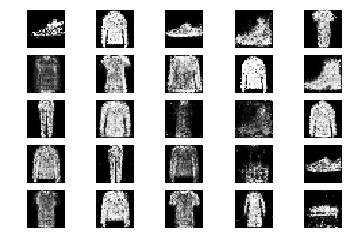

19401 [D loss: 0.633285, acc.: 68.75%] [G loss: 0.964331]
19402 [D loss: 0.644468, acc.: 60.94%] [G loss: 0.904374]
19403 [D loss: 0.655080, acc.: 53.12%] [G loss: 0.986651]
19404 [D loss: 0.681309, acc.: 56.25%] [G loss: 0.865359]
19405 [D loss: 0.675453, acc.: 53.12%] [G loss: 0.906918]
19406 [D loss: 0.579786, acc.: 73.44%] [G loss: 0.880909]
19407 [D loss: 0.686062, acc.: 54.69%] [G loss: 0.831963]
19408 [D loss: 0.625796, acc.: 68.75%] [G loss: 0.838047]
19409 [D loss: 0.746845, acc.: 43.75%] [G loss: 0.887074]
19410 [D loss: 0.636412, acc.: 64.06%] [G loss: 0.959234]
19411 [D loss: 0.617778, acc.: 67.19%] [G loss: 0.958158]
19412 [D loss: 0.730074, acc.: 53.12%] [G loss: 0.949857]
19413 [D loss: 0.731022, acc.: 51.56%] [G loss: 0.911646]
19414 [D loss: 0.603409, acc.: 75.00%] [G loss: 0.947831]
19415 [D loss: 0.657001, acc.: 53.12%] [G loss: 0.943063]
19416 [D loss: 0.641711, acc.: 62.50%] [G loss: 0.931479]
19417 [D loss: 0.683701, acc.: 56.25%] [G loss: 0.890575]
19418 [D loss:

19544 [D loss: 0.611567, acc.: 62.50%] [G loss: 0.900420]
19545 [D loss: 0.664934, acc.: 60.94%] [G loss: 0.711892]
19546 [D loss: 0.614207, acc.: 71.88%] [G loss: 0.844414]
19547 [D loss: 0.698961, acc.: 57.81%] [G loss: 0.923276]
19548 [D loss: 0.537300, acc.: 79.69%] [G loss: 0.965575]
19549 [D loss: 0.715911, acc.: 60.94%] [G loss: 0.888183]
19550 [D loss: 0.705335, acc.: 51.56%] [G loss: 0.921355]
19551 [D loss: 0.666712, acc.: 53.12%] [G loss: 0.976889]
19552 [D loss: 0.590475, acc.: 75.00%] [G loss: 0.925235]
19553 [D loss: 0.574057, acc.: 71.88%] [G loss: 0.962806]
19554 [D loss: 0.672117, acc.: 59.38%] [G loss: 1.022688]
19555 [D loss: 0.585833, acc.: 70.31%] [G loss: 1.040849]
19556 [D loss: 0.679775, acc.: 57.81%] [G loss: 1.003746]
19557 [D loss: 0.617286, acc.: 64.06%] [G loss: 0.938344]
19558 [D loss: 0.632484, acc.: 68.75%] [G loss: 0.814511]
19559 [D loss: 0.678322, acc.: 67.19%] [G loss: 0.943043]
19560 [D loss: 0.639538, acc.: 68.75%] [G loss: 0.930780]
19561 [D loss:

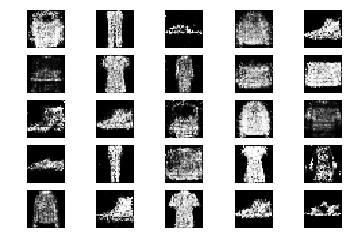

19601 [D loss: 0.630787, acc.: 64.06%] [G loss: 0.898361]
19602 [D loss: 0.572850, acc.: 70.31%] [G loss: 0.971849]
19603 [D loss: 0.686311, acc.: 59.38%] [G loss: 0.935981]
19604 [D loss: 0.639645, acc.: 60.94%] [G loss: 0.963317]
19605 [D loss: 0.650868, acc.: 57.81%] [G loss: 1.046496]
19606 [D loss: 0.636298, acc.: 64.06%] [G loss: 0.964031]
19607 [D loss: 0.690943, acc.: 60.94%] [G loss: 0.918002]
19608 [D loss: 0.729513, acc.: 51.56%] [G loss: 0.966512]
19609 [D loss: 0.629835, acc.: 60.94%] [G loss: 0.923315]
19610 [D loss: 0.662893, acc.: 57.81%] [G loss: 1.038543]
19611 [D loss: 0.660664, acc.: 53.12%] [G loss: 1.072974]
19612 [D loss: 0.577747, acc.: 70.31%] [G loss: 0.918440]
19613 [D loss: 0.665297, acc.: 65.62%] [G loss: 0.930182]
19614 [D loss: 0.617694, acc.: 67.19%] [G loss: 0.904837]
19615 [D loss: 0.716648, acc.: 53.12%] [G loss: 0.919250]
19616 [D loss: 0.610133, acc.: 70.31%] [G loss: 0.883545]
19617 [D loss: 0.637174, acc.: 68.75%] [G loss: 0.927181]
19618 [D loss:

19745 [D loss: 0.681831, acc.: 59.38%] [G loss: 0.923912]
19746 [D loss: 0.650183, acc.: 62.50%] [G loss: 0.868725]
19747 [D loss: 0.670106, acc.: 56.25%] [G loss: 0.893831]
19748 [D loss: 0.586943, acc.: 71.88%] [G loss: 0.970397]
19749 [D loss: 0.694179, acc.: 62.50%] [G loss: 1.025884]
19750 [D loss: 0.592880, acc.: 71.88%] [G loss: 1.012410]
19751 [D loss: 0.700548, acc.: 54.69%] [G loss: 0.908534]
19752 [D loss: 0.645173, acc.: 60.94%] [G loss: 0.877251]
19753 [D loss: 0.743703, acc.: 56.25%] [G loss: 0.935342]
19754 [D loss: 0.689451, acc.: 56.25%] [G loss: 0.890112]
19755 [D loss: 0.672150, acc.: 56.25%] [G loss: 0.911866]
19756 [D loss: 0.613953, acc.: 71.88%] [G loss: 0.905954]
19757 [D loss: 0.695752, acc.: 51.56%] [G loss: 0.941743]
19758 [D loss: 0.671938, acc.: 57.81%] [G loss: 0.847768]
19759 [D loss: 0.689806, acc.: 57.81%] [G loss: 0.969655]
19760 [D loss: 0.610470, acc.: 68.75%] [G loss: 0.967815]
19761 [D loss: 0.600738, acc.: 71.88%] [G loss: 1.052473]
19762 [D loss:

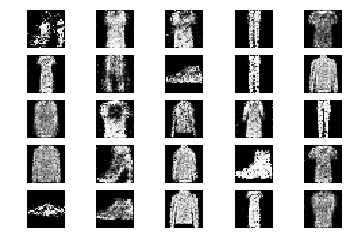

19801 [D loss: 0.660943, acc.: 56.25%] [G loss: 0.865148]
19802 [D loss: 0.624580, acc.: 65.62%] [G loss: 0.923332]
19803 [D loss: 0.631169, acc.: 62.50%] [G loss: 0.895735]
19804 [D loss: 0.703573, acc.: 53.12%] [G loss: 0.934663]
19805 [D loss: 0.591152, acc.: 68.75%] [G loss: 0.905608]
19806 [D loss: 0.684178, acc.: 56.25%] [G loss: 0.896589]
19807 [D loss: 0.710416, acc.: 53.12%] [G loss: 0.951601]
19808 [D loss: 0.635906, acc.: 67.19%] [G loss: 0.891547]
19809 [D loss: 0.676592, acc.: 50.00%] [G loss: 1.011751]
19810 [D loss: 0.574174, acc.: 71.88%] [G loss: 0.973293]
19811 [D loss: 0.659752, acc.: 56.25%] [G loss: 0.898887]
19812 [D loss: 0.638689, acc.: 70.31%] [G loss: 0.978720]
19813 [D loss: 0.595207, acc.: 67.19%] [G loss: 0.936269]
19814 [D loss: 0.657402, acc.: 60.94%] [G loss: 0.879907]
19815 [D loss: 0.637462, acc.: 62.50%] [G loss: 0.898129]
19816 [D loss: 0.627189, acc.: 67.19%] [G loss: 0.901570]
19817 [D loss: 0.634079, acc.: 59.38%] [G loss: 0.864801]
19818 [D loss:

19943 [D loss: 0.664067, acc.: 57.81%] [G loss: 0.947231]
19944 [D loss: 0.649093, acc.: 59.38%] [G loss: 0.946114]
19945 [D loss: 0.710307, acc.: 50.00%] [G loss: 0.899472]
19946 [D loss: 0.685863, acc.: 56.25%] [G loss: 0.927344]
19947 [D loss: 0.663803, acc.: 60.94%] [G loss: 0.931603]
19948 [D loss: 0.685137, acc.: 57.81%] [G loss: 0.864508]
19949 [D loss: 0.668101, acc.: 62.50%] [G loss: 0.899248]
19950 [D loss: 0.673789, acc.: 56.25%] [G loss: 0.935589]
19951 [D loss: 0.653691, acc.: 62.50%] [G loss: 0.797003]
19952 [D loss: 0.618109, acc.: 71.88%] [G loss: 0.982544]
19953 [D loss: 0.636983, acc.: 68.75%] [G loss: 0.989290]
19954 [D loss: 0.684447, acc.: 60.94%] [G loss: 0.936976]
19955 [D loss: 0.599213, acc.: 75.00%] [G loss: 0.933147]
19956 [D loss: 0.664458, acc.: 57.81%] [G loss: 0.990431]
19957 [D loss: 0.609507, acc.: 67.19%] [G loss: 0.998842]
19958 [D loss: 0.614211, acc.: 62.50%] [G loss: 0.949997]
19959 [D loss: 0.665799, acc.: 60.94%] [G loss: 0.982066]
19960 [D loss:

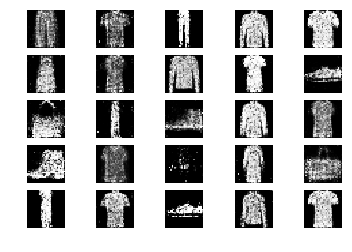

20001 [D loss: 0.701330, acc.: 57.81%] [G loss: 0.953764]
20002 [D loss: 0.615050, acc.: 71.88%] [G loss: 1.019881]
20003 [D loss: 0.593317, acc.: 75.00%] [G loss: 1.011621]
20004 [D loss: 0.764044, acc.: 48.44%] [G loss: 0.911408]
20005 [D loss: 0.583310, acc.: 71.88%] [G loss: 0.883133]
20006 [D loss: 0.682802, acc.: 59.38%] [G loss: 0.891944]
20007 [D loss: 0.684855, acc.: 57.81%] [G loss: 0.907452]
20008 [D loss: 0.643366, acc.: 65.62%] [G loss: 0.922957]
20009 [D loss: 0.676746, acc.: 50.00%] [G loss: 0.870438]
20010 [D loss: 0.635923, acc.: 60.94%] [G loss: 0.925015]
20011 [D loss: 0.679404, acc.: 64.06%] [G loss: 0.843778]
20012 [D loss: 0.688693, acc.: 54.69%] [G loss: 0.936294]
20013 [D loss: 0.681993, acc.: 54.69%] [G loss: 0.915044]
20014 [D loss: 0.655704, acc.: 59.38%] [G loss: 0.989824]
20015 [D loss: 0.656160, acc.: 65.62%] [G loss: 0.856542]
20016 [D loss: 0.620604, acc.: 67.19%] [G loss: 0.914866]
20017 [D loss: 0.664334, acc.: 60.94%] [G loss: 0.910872]
20018 [D loss:

20144 [D loss: 0.644717, acc.: 62.50%] [G loss: 0.900537]
20145 [D loss: 0.665648, acc.: 54.69%] [G loss: 0.893231]
20146 [D loss: 0.666272, acc.: 60.94%] [G loss: 0.880682]
20147 [D loss: 0.648914, acc.: 67.19%] [G loss: 0.850435]
20148 [D loss: 0.637905, acc.: 67.19%] [G loss: 0.950870]
20149 [D loss: 0.636068, acc.: 67.19%] [G loss: 0.850175]
20150 [D loss: 0.681161, acc.: 53.12%] [G loss: 0.832752]
20151 [D loss: 0.597998, acc.: 70.31%] [G loss: 0.976027]
20152 [D loss: 0.638135, acc.: 56.25%] [G loss: 0.991081]
20153 [D loss: 0.690500, acc.: 56.25%] [G loss: 0.876133]
20154 [D loss: 0.645485, acc.: 64.06%] [G loss: 0.912535]
20155 [D loss: 0.700490, acc.: 54.69%] [G loss: 0.876397]
20156 [D loss: 0.628756, acc.: 64.06%] [G loss: 0.873607]
20157 [D loss: 0.580627, acc.: 71.88%] [G loss: 0.927535]
20158 [D loss: 0.641695, acc.: 65.62%] [G loss: 0.914288]
20159 [D loss: 0.645296, acc.: 65.62%] [G loss: 0.938590]
20160 [D loss: 0.702822, acc.: 50.00%] [G loss: 0.960531]
20161 [D loss:

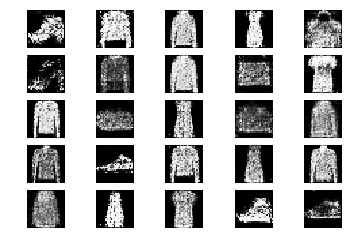

20201 [D loss: 0.679662, acc.: 54.69%] [G loss: 0.920488]
20202 [D loss: 0.605076, acc.: 73.44%] [G loss: 0.942722]
20203 [D loss: 0.649598, acc.: 62.50%] [G loss: 0.951795]
20204 [D loss: 0.687337, acc.: 51.56%] [G loss: 0.961867]
20205 [D loss: 0.671898, acc.: 57.81%] [G loss: 0.942377]
20206 [D loss: 0.617761, acc.: 62.50%] [G loss: 1.008800]
20207 [D loss: 0.610020, acc.: 65.62%] [G loss: 1.014407]
20208 [D loss: 0.657960, acc.: 59.38%] [G loss: 0.879562]
20209 [D loss: 0.625367, acc.: 67.19%] [G loss: 1.000573]
20210 [D loss: 0.648707, acc.: 65.62%] [G loss: 0.933235]
20211 [D loss: 0.569110, acc.: 64.06%] [G loss: 0.883123]
20212 [D loss: 0.594857, acc.: 76.56%] [G loss: 0.962658]
20213 [D loss: 0.628514, acc.: 62.50%] [G loss: 0.922488]
20214 [D loss: 0.658007, acc.: 57.81%] [G loss: 0.960847]
20215 [D loss: 0.605987, acc.: 70.31%] [G loss: 0.933596]
20216 [D loss: 0.669102, acc.: 59.38%] [G loss: 0.917478]
20217 [D loss: 0.670343, acc.: 56.25%] [G loss: 0.984562]
20218 [D loss:

20343 [D loss: 0.708412, acc.: 54.69%] [G loss: 0.876981]
20344 [D loss: 0.571189, acc.: 75.00%] [G loss: 0.903408]
20345 [D loss: 0.680351, acc.: 62.50%] [G loss: 1.042060]
20346 [D loss: 0.635954, acc.: 68.75%] [G loss: 0.912358]
20347 [D loss: 0.612537, acc.: 65.62%] [G loss: 0.877818]
20348 [D loss: 0.672702, acc.: 53.12%] [G loss: 0.948393]
20349 [D loss: 0.679649, acc.: 56.25%] [G loss: 0.890401]
20350 [D loss: 0.619363, acc.: 71.88%] [G loss: 0.895430]
20351 [D loss: 0.675440, acc.: 60.94%] [G loss: 0.929604]
20352 [D loss: 0.661664, acc.: 56.25%] [G loss: 0.986944]
20353 [D loss: 0.673243, acc.: 53.12%] [G loss: 1.003401]
20354 [D loss: 0.723332, acc.: 50.00%] [G loss: 0.960689]
20355 [D loss: 0.710605, acc.: 50.00%] [G loss: 0.907567]
20356 [D loss: 0.647426, acc.: 59.38%] [G loss: 0.884206]
20357 [D loss: 0.668153, acc.: 60.94%] [G loss: 0.955483]
20358 [D loss: 0.595322, acc.: 64.06%] [G loss: 0.949896]
20359 [D loss: 0.639833, acc.: 62.50%] [G loss: 0.945219]
20360 [D loss:

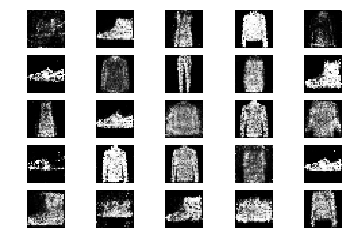

20401 [D loss: 0.609770, acc.: 60.94%] [G loss: 0.985537]
20402 [D loss: 0.633236, acc.: 64.06%] [G loss: 0.959357]
20403 [D loss: 0.633239, acc.: 64.06%] [G loss: 0.884296]
20404 [D loss: 0.618459, acc.: 65.62%] [G loss: 0.953471]
20405 [D loss: 0.646644, acc.: 60.94%] [G loss: 0.965916]
20406 [D loss: 0.660059, acc.: 59.38%] [G loss: 0.955613]
20407 [D loss: 0.602211, acc.: 62.50%] [G loss: 0.903823]
20408 [D loss: 0.634698, acc.: 60.94%] [G loss: 0.897996]
20409 [D loss: 0.654832, acc.: 64.06%] [G loss: 0.922574]
20410 [D loss: 0.657954, acc.: 53.12%] [G loss: 0.904139]
20411 [D loss: 0.696040, acc.: 57.81%] [G loss: 0.879731]
20412 [D loss: 0.617895, acc.: 64.06%] [G loss: 0.883574]
20413 [D loss: 0.691553, acc.: 57.81%] [G loss: 0.858246]
20414 [D loss: 0.609646, acc.: 67.19%] [G loss: 0.864064]
20415 [D loss: 0.530948, acc.: 75.00%] [G loss: 0.968062]
20416 [D loss: 0.749526, acc.: 51.56%] [G loss: 0.916167]
20417 [D loss: 0.597509, acc.: 67.19%] [G loss: 0.950806]
20418 [D loss:

20543 [D loss: 0.612306, acc.: 60.94%] [G loss: 0.873058]
20544 [D loss: 0.686276, acc.: 60.94%] [G loss: 0.911131]
20545 [D loss: 0.696710, acc.: 51.56%] [G loss: 0.995555]
20546 [D loss: 0.744142, acc.: 50.00%] [G loss: 0.983251]
20547 [D loss: 0.685357, acc.: 57.81%] [G loss: 0.910994]
20548 [D loss: 0.593540, acc.: 68.75%] [G loss: 0.975735]
20549 [D loss: 0.671029, acc.: 54.69%] [G loss: 0.981816]
20550 [D loss: 0.622855, acc.: 67.19%] [G loss: 0.943154]
20551 [D loss: 0.717734, acc.: 53.12%] [G loss: 1.011018]
20552 [D loss: 0.628431, acc.: 71.88%] [G loss: 0.951608]
20553 [D loss: 0.631345, acc.: 64.06%] [G loss: 0.854745]
20554 [D loss: 0.617650, acc.: 75.00%] [G loss: 0.873697]
20555 [D loss: 0.603340, acc.: 73.44%] [G loss: 0.960501]
20556 [D loss: 0.635446, acc.: 64.06%] [G loss: 0.914595]
20557 [D loss: 0.670063, acc.: 59.38%] [G loss: 0.895435]
20558 [D loss: 0.574394, acc.: 68.75%] [G loss: 0.934222]
20559 [D loss: 0.637251, acc.: 64.06%] [G loss: 0.955148]
20560 [D loss:

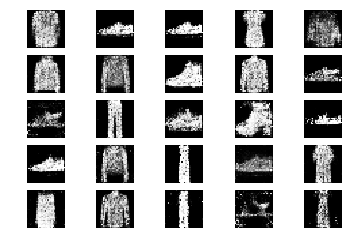

20601 [D loss: 0.692468, acc.: 54.69%] [G loss: 1.018558]
20602 [D loss: 0.697996, acc.: 59.38%] [G loss: 0.812570]
20603 [D loss: 0.626363, acc.: 65.62%] [G loss: 0.838974]
20604 [D loss: 0.641790, acc.: 65.62%] [G loss: 0.955552]
20605 [D loss: 0.636621, acc.: 65.62%] [G loss: 1.016239]
20606 [D loss: 0.615789, acc.: 59.38%] [G loss: 0.951538]
20607 [D loss: 0.606669, acc.: 64.06%] [G loss: 0.959031]
20608 [D loss: 0.681779, acc.: 65.62%] [G loss: 0.881500]
20609 [D loss: 0.642115, acc.: 68.75%] [G loss: 0.956132]
20610 [D loss: 0.657970, acc.: 57.81%] [G loss: 0.984826]
20611 [D loss: 0.646721, acc.: 64.06%] [G loss: 0.945175]
20612 [D loss: 0.669898, acc.: 59.38%] [G loss: 0.957551]
20613 [D loss: 0.638723, acc.: 64.06%] [G loss: 0.938832]
20614 [D loss: 0.657076, acc.: 56.25%] [G loss: 0.867962]
20615 [D loss: 0.565266, acc.: 67.19%] [G loss: 0.924206]
20616 [D loss: 0.684076, acc.: 46.88%] [G loss: 0.909481]
20617 [D loss: 0.618414, acc.: 67.19%] [G loss: 0.889583]
20618 [D loss:

20743 [D loss: 0.604597, acc.: 73.44%] [G loss: 0.931280]
20744 [D loss: 0.650186, acc.: 56.25%] [G loss: 0.948998]
20745 [D loss: 0.722400, acc.: 53.12%] [G loss: 0.888614]
20746 [D loss: 0.651685, acc.: 59.38%] [G loss: 0.956669]
20747 [D loss: 0.744737, acc.: 48.44%] [G loss: 0.946128]
20748 [D loss: 0.613266, acc.: 71.88%] [G loss: 0.914136]
20749 [D loss: 0.632866, acc.: 62.50%] [G loss: 1.006902]
20750 [D loss: 0.623061, acc.: 65.62%] [G loss: 0.972098]
20751 [D loss: 0.601139, acc.: 71.88%] [G loss: 1.055921]
20752 [D loss: 0.715326, acc.: 42.19%] [G loss: 0.955914]
20753 [D loss: 0.681562, acc.: 54.69%] [G loss: 0.894132]
20754 [D loss: 0.672477, acc.: 51.56%] [G loss: 0.950180]
20755 [D loss: 0.642781, acc.: 64.06%] [G loss: 0.931499]
20756 [D loss: 0.656142, acc.: 62.50%] [G loss: 0.917978]
20757 [D loss: 0.723178, acc.: 45.31%] [G loss: 0.912087]
20758 [D loss: 0.672950, acc.: 53.12%] [G loss: 1.021096]
20759 [D loss: 0.672740, acc.: 64.06%] [G loss: 0.970960]
20760 [D loss:

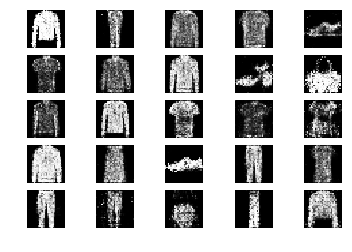

20801 [D loss: 0.667347, acc.: 60.94%] [G loss: 0.979903]
20802 [D loss: 0.574333, acc.: 68.75%] [G loss: 0.924499]
20803 [D loss: 0.574640, acc.: 70.31%] [G loss: 0.987512]
20804 [D loss: 0.574885, acc.: 70.31%] [G loss: 0.942287]
20805 [D loss: 0.574915, acc.: 68.75%] [G loss: 0.797340]
20806 [D loss: 0.672638, acc.: 57.81%] [G loss: 0.927179]
20807 [D loss: 0.654784, acc.: 64.06%] [G loss: 0.979022]
20808 [D loss: 0.682231, acc.: 57.81%] [G loss: 1.039058]
20809 [D loss: 0.657911, acc.: 56.25%] [G loss: 0.979516]
20810 [D loss: 0.621820, acc.: 64.06%] [G loss: 0.985976]
20811 [D loss: 0.600967, acc.: 65.62%] [G loss: 1.037190]
20812 [D loss: 0.730129, acc.: 53.12%] [G loss: 0.869222]
20813 [D loss: 0.638302, acc.: 65.62%] [G loss: 0.908379]
20814 [D loss: 0.646002, acc.: 62.50%] [G loss: 0.884279]
20815 [D loss: 0.743640, acc.: 48.44%] [G loss: 0.893970]
20816 [D loss: 0.602903, acc.: 65.62%] [G loss: 0.859103]
20817 [D loss: 0.659952, acc.: 57.81%] [G loss: 0.906484]
20818 [D loss:

20945 [D loss: 0.621850, acc.: 67.19%] [G loss: 0.946398]
20946 [D loss: 0.650617, acc.: 64.06%] [G loss: 0.955654]
20947 [D loss: 0.686808, acc.: 56.25%] [G loss: 0.966885]
20948 [D loss: 0.744090, acc.: 50.00%] [G loss: 0.898246]
20949 [D loss: 0.676833, acc.: 54.69%] [G loss: 0.882978]
20950 [D loss: 0.626387, acc.: 67.19%] [G loss: 0.930394]
20951 [D loss: 0.621307, acc.: 67.19%] [G loss: 0.965244]
20952 [D loss: 0.637379, acc.: 60.94%] [G loss: 1.025569]
20953 [D loss: 0.707056, acc.: 54.69%] [G loss: 0.929798]
20954 [D loss: 0.597343, acc.: 68.75%] [G loss: 0.943209]
20955 [D loss: 0.627824, acc.: 64.06%] [G loss: 0.941549]
20956 [D loss: 0.644802, acc.: 67.19%] [G loss: 0.928918]
20957 [D loss: 0.672002, acc.: 56.25%] [G loss: 0.964880]
20958 [D loss: 0.594935, acc.: 65.62%] [G loss: 0.841285]
20959 [D loss: 0.596418, acc.: 67.19%] [G loss: 0.947372]
20960 [D loss: 0.637923, acc.: 64.06%] [G loss: 0.873058]
20961 [D loss: 0.570892, acc.: 71.88%] [G loss: 0.836556]
20962 [D loss:

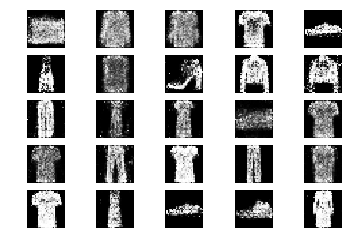

21001 [D loss: 0.629235, acc.: 67.19%] [G loss: 0.921773]
21002 [D loss: 0.689945, acc.: 62.50%] [G loss: 0.999034]
21003 [D loss: 0.618332, acc.: 70.31%] [G loss: 1.065605]
21004 [D loss: 0.546686, acc.: 71.88%] [G loss: 1.110827]
21005 [D loss: 0.731252, acc.: 51.56%] [G loss: 0.894124]
21006 [D loss: 0.628369, acc.: 64.06%] [G loss: 0.958278]
21007 [D loss: 0.606292, acc.: 71.88%] [G loss: 0.939943]
21008 [D loss: 0.582111, acc.: 68.75%] [G loss: 0.913089]
21009 [D loss: 0.651917, acc.: 64.06%] [G loss: 0.951766]
21010 [D loss: 0.638607, acc.: 68.75%] [G loss: 0.905773]
21011 [D loss: 0.609656, acc.: 67.19%] [G loss: 1.028957]
21012 [D loss: 0.636593, acc.: 65.62%] [G loss: 1.003878]
21013 [D loss: 0.682796, acc.: 60.94%] [G loss: 0.939559]
21014 [D loss: 0.649024, acc.: 62.50%] [G loss: 0.892620]
21015 [D loss: 0.665100, acc.: 57.81%] [G loss: 0.852499]
21016 [D loss: 0.665896, acc.: 60.94%] [G loss: 0.951888]
21017 [D loss: 0.648143, acc.: 67.19%] [G loss: 0.937369]
21018 [D loss:

21144 [D loss: 0.604492, acc.: 65.62%] [G loss: 0.897078]
21145 [D loss: 0.642998, acc.: 64.06%] [G loss: 0.899053]
21146 [D loss: 0.675455, acc.: 62.50%] [G loss: 0.909511]
21147 [D loss: 0.683403, acc.: 51.56%] [G loss: 0.920168]
21148 [D loss: 0.639852, acc.: 59.38%] [G loss: 1.007148]
21149 [D loss: 0.651763, acc.: 64.06%] [G loss: 0.953385]
21150 [D loss: 0.723738, acc.: 56.25%] [G loss: 0.967242]
21151 [D loss: 0.710928, acc.: 51.56%] [G loss: 0.846058]
21152 [D loss: 0.671983, acc.: 51.56%] [G loss: 0.778913]
21153 [D loss: 0.642778, acc.: 60.94%] [G loss: 0.876107]
21154 [D loss: 0.609913, acc.: 68.75%] [G loss: 0.945774]
21155 [D loss: 0.606791, acc.: 78.12%] [G loss: 0.918384]
21156 [D loss: 0.620257, acc.: 65.62%] [G loss: 0.881611]
21157 [D loss: 0.644643, acc.: 56.25%] [G loss: 0.891726]
21158 [D loss: 0.645979, acc.: 57.81%] [G loss: 0.951953]
21159 [D loss: 0.673667, acc.: 62.50%] [G loss: 0.943576]
21160 [D loss: 0.627887, acc.: 68.75%] [G loss: 0.942806]
21161 [D loss:

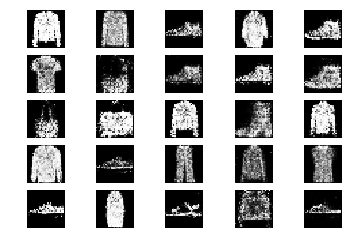

21201 [D loss: 0.613874, acc.: 67.19%] [G loss: 0.845294]
21202 [D loss: 0.691518, acc.: 53.12%] [G loss: 0.881767]
21203 [D loss: 0.751120, acc.: 43.75%] [G loss: 0.915260]
21204 [D loss: 0.656977, acc.: 59.38%] [G loss: 0.874324]
21205 [D loss: 0.670978, acc.: 56.25%] [G loss: 0.931440]
21206 [D loss: 0.643412, acc.: 68.75%] [G loss: 0.953451]
21207 [D loss: 0.648642, acc.: 60.94%] [G loss: 0.921538]
21208 [D loss: 0.693006, acc.: 51.56%] [G loss: 0.863978]
21209 [D loss: 0.589531, acc.: 71.88%] [G loss: 0.967271]
21210 [D loss: 0.655465, acc.: 56.25%] [G loss: 0.938676]
21211 [D loss: 0.677968, acc.: 56.25%] [G loss: 0.929399]
21212 [D loss: 0.608602, acc.: 62.50%] [G loss: 0.854260]
21213 [D loss: 0.628175, acc.: 70.31%] [G loss: 0.893344]
21214 [D loss: 0.624631, acc.: 59.38%] [G loss: 1.031265]
21215 [D loss: 0.627633, acc.: 59.38%] [G loss: 0.949187]
21216 [D loss: 0.607659, acc.: 62.50%] [G loss: 0.883626]
21217 [D loss: 0.639761, acc.: 64.06%] [G loss: 0.917456]
21218 [D loss:

21344 [D loss: 0.634071, acc.: 65.62%] [G loss: 0.869900]
21345 [D loss: 0.695347, acc.: 57.81%] [G loss: 0.833008]
21346 [D loss: 0.657829, acc.: 64.06%] [G loss: 0.933330]
21347 [D loss: 0.614665, acc.: 64.06%] [G loss: 0.842153]
21348 [D loss: 0.684865, acc.: 51.56%] [G loss: 0.915894]
21349 [D loss: 0.632703, acc.: 57.81%] [G loss: 0.884280]
21350 [D loss: 0.582181, acc.: 68.75%] [G loss: 0.940305]
21351 [D loss: 0.580689, acc.: 76.56%] [G loss: 0.915348]
21352 [D loss: 0.701521, acc.: 60.94%] [G loss: 0.936499]
21353 [D loss: 0.658530, acc.: 57.81%] [G loss: 0.943170]
21354 [D loss: 0.618311, acc.: 71.88%] [G loss: 1.014452]
21355 [D loss: 0.705739, acc.: 59.38%] [G loss: 0.979106]
21356 [D loss: 0.626095, acc.: 67.19%] [G loss: 0.961615]
21357 [D loss: 0.676872, acc.: 54.69%] [G loss: 0.886906]
21358 [D loss: 0.634750, acc.: 60.94%] [G loss: 1.023841]
21359 [D loss: 0.653645, acc.: 68.75%] [G loss: 1.008539]
21360 [D loss: 0.606295, acc.: 71.88%] [G loss: 0.864191]
21361 [D loss:

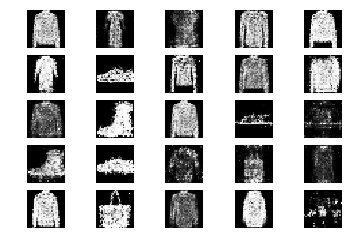

21401 [D loss: 0.702049, acc.: 53.12%] [G loss: 0.982353]
21402 [D loss: 0.663852, acc.: 54.69%] [G loss: 1.005372]
21403 [D loss: 0.717661, acc.: 54.69%] [G loss: 0.980001]
21404 [D loss: 0.620107, acc.: 62.50%] [G loss: 0.896076]
21405 [D loss: 0.634012, acc.: 57.81%] [G loss: 0.922804]
21406 [D loss: 0.676894, acc.: 65.62%] [G loss: 0.953515]
21407 [D loss: 0.681034, acc.: 48.44%] [G loss: 1.038360]
21408 [D loss: 0.664094, acc.: 56.25%] [G loss: 0.877666]
21409 [D loss: 0.689318, acc.: 56.25%] [G loss: 0.895393]
21410 [D loss: 0.616206, acc.: 67.19%] [G loss: 0.848859]
21411 [D loss: 0.654744, acc.: 65.62%] [G loss: 0.938565]
21412 [D loss: 0.656167, acc.: 56.25%] [G loss: 0.911855]
21413 [D loss: 0.634154, acc.: 53.12%] [G loss: 0.865211]
21414 [D loss: 0.573895, acc.: 68.75%] [G loss: 0.879636]
21415 [D loss: 0.700982, acc.: 54.69%] [G loss: 0.924598]
21416 [D loss: 0.629501, acc.: 65.62%] [G loss: 0.844438]
21417 [D loss: 0.653855, acc.: 59.38%] [G loss: 0.901794]
21418 [D loss:

21544 [D loss: 0.625104, acc.: 67.19%] [G loss: 0.867679]
21545 [D loss: 0.605171, acc.: 68.75%] [G loss: 0.888027]
21546 [D loss: 0.756494, acc.: 53.12%] [G loss: 0.939325]
21547 [D loss: 0.601637, acc.: 67.19%] [G loss: 0.934489]
21548 [D loss: 0.655569, acc.: 59.38%] [G loss: 1.032841]
21549 [D loss: 0.693602, acc.: 60.94%] [G loss: 0.922525]
21550 [D loss: 0.622905, acc.: 57.81%] [G loss: 0.883998]
21551 [D loss: 0.612451, acc.: 68.75%] [G loss: 0.967313]
21552 [D loss: 0.605649, acc.: 68.75%] [G loss: 1.024616]
21553 [D loss: 0.555168, acc.: 73.44%] [G loss: 0.950492]
21554 [D loss: 0.574432, acc.: 76.56%] [G loss: 0.989089]
21555 [D loss: 0.718744, acc.: 57.81%] [G loss: 0.890134]
21556 [D loss: 0.721831, acc.: 48.44%] [G loss: 0.960633]
21557 [D loss: 0.659944, acc.: 57.81%] [G loss: 1.030425]
21558 [D loss: 0.684781, acc.: 54.69%] [G loss: 0.984477]
21559 [D loss: 0.668999, acc.: 64.06%] [G loss: 0.928697]
21560 [D loss: 0.606993, acc.: 71.88%] [G loss: 0.963051]
21561 [D loss:

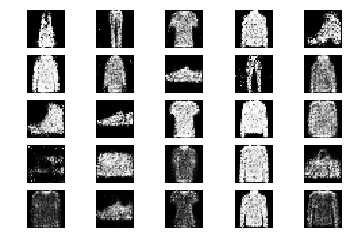

21601 [D loss: 0.657013, acc.: 59.38%] [G loss: 0.970410]
21602 [D loss: 0.601595, acc.: 68.75%] [G loss: 0.901998]
21603 [D loss: 0.554909, acc.: 76.56%] [G loss: 1.015090]
21604 [D loss: 0.625909, acc.: 67.19%] [G loss: 0.951633]
21605 [D loss: 0.720870, acc.: 46.88%] [G loss: 0.833466]
21606 [D loss: 0.619266, acc.: 64.06%] [G loss: 0.928718]
21607 [D loss: 0.684591, acc.: 60.94%] [G loss: 0.950261]
21608 [D loss: 0.685147, acc.: 50.00%] [G loss: 1.051597]
21609 [D loss: 0.672497, acc.: 54.69%] [G loss: 0.965598]
21610 [D loss: 0.658334, acc.: 56.25%] [G loss: 1.062949]
21611 [D loss: 0.650530, acc.: 56.25%] [G loss: 0.935715]
21612 [D loss: 0.635470, acc.: 68.75%] [G loss: 0.996704]
21613 [D loss: 0.626779, acc.: 64.06%] [G loss: 0.921415]
21614 [D loss: 0.622380, acc.: 64.06%] [G loss: 0.951313]
21615 [D loss: 0.623518, acc.: 70.31%] [G loss: 1.006934]
21616 [D loss: 0.707252, acc.: 51.56%] [G loss: 0.934499]
21617 [D loss: 0.572999, acc.: 73.44%] [G loss: 0.952708]
21618 [D loss:

21743 [D loss: 0.606394, acc.: 62.50%] [G loss: 0.917445]
21744 [D loss: 0.673354, acc.: 60.94%] [G loss: 0.983180]
21745 [D loss: 0.647368, acc.: 62.50%] [G loss: 1.034095]
21746 [D loss: 0.641476, acc.: 70.31%] [G loss: 0.854703]
21747 [D loss: 0.650404, acc.: 59.38%] [G loss: 0.891637]
21748 [D loss: 0.628562, acc.: 54.69%] [G loss: 0.853485]
21749 [D loss: 0.632293, acc.: 65.62%] [G loss: 0.873697]
21750 [D loss: 0.527849, acc.: 81.25%] [G loss: 1.016027]
21751 [D loss: 0.660997, acc.: 65.62%] [G loss: 0.944433]
21752 [D loss: 0.667013, acc.: 60.94%] [G loss: 0.984029]
21753 [D loss: 0.625925, acc.: 64.06%] [G loss: 0.926516]
21754 [D loss: 0.631567, acc.: 59.38%] [G loss: 0.993123]
21755 [D loss: 0.699191, acc.: 56.25%] [G loss: 0.864342]
21756 [D loss: 0.618698, acc.: 67.19%] [G loss: 1.048890]
21757 [D loss: 0.588221, acc.: 70.31%] [G loss: 1.048052]
21758 [D loss: 0.647578, acc.: 60.94%] [G loss: 0.943693]
21759 [D loss: 0.657147, acc.: 56.25%] [G loss: 0.908270]
21760 [D loss:

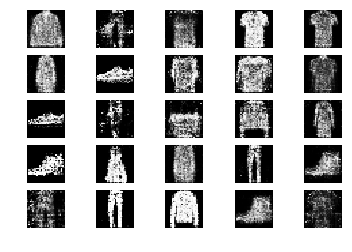

21801 [D loss: 0.609691, acc.: 64.06%] [G loss: 0.759605]
21802 [D loss: 0.683856, acc.: 57.81%] [G loss: 0.865307]
21803 [D loss: 0.602335, acc.: 68.75%] [G loss: 0.926173]
21804 [D loss: 0.659550, acc.: 57.81%] [G loss: 0.875822]
21805 [D loss: 0.673561, acc.: 67.19%] [G loss: 0.846959]
21806 [D loss: 0.694847, acc.: 53.12%] [G loss: 0.842498]
21807 [D loss: 0.656651, acc.: 51.56%] [G loss: 0.914746]
21808 [D loss: 0.605092, acc.: 70.31%] [G loss: 0.890477]
21809 [D loss: 0.643046, acc.: 60.94%] [G loss: 0.827858]
21810 [D loss: 0.609985, acc.: 67.19%] [G loss: 0.887411]
21811 [D loss: 0.680803, acc.: 59.38%] [G loss: 0.941151]
21812 [D loss: 0.708402, acc.: 54.69%] [G loss: 0.853395]
21813 [D loss: 0.620844, acc.: 60.94%] [G loss: 0.924214]
21814 [D loss: 0.668066, acc.: 62.50%] [G loss: 0.876478]
21815 [D loss: 0.584370, acc.: 67.19%] [G loss: 0.876885]
21816 [D loss: 0.701228, acc.: 60.94%] [G loss: 1.013083]
21817 [D loss: 0.682544, acc.: 59.38%] [G loss: 0.939635]
21818 [D loss:

21944 [D loss: 0.589051, acc.: 75.00%] [G loss: 1.021494]
21945 [D loss: 0.549723, acc.: 82.81%] [G loss: 1.050786]
21946 [D loss: 0.638305, acc.: 60.94%] [G loss: 0.936734]
21947 [D loss: 0.666384, acc.: 57.81%] [G loss: 0.989132]
21948 [D loss: 0.641889, acc.: 57.81%] [G loss: 0.878708]
21949 [D loss: 0.642761, acc.: 57.81%] [G loss: 0.935777]
21950 [D loss: 0.661263, acc.: 60.94%] [G loss: 0.943569]
21951 [D loss: 0.647145, acc.: 62.50%] [G loss: 0.913196]
21952 [D loss: 0.654958, acc.: 65.62%] [G loss: 0.930396]
21953 [D loss: 0.631634, acc.: 71.88%] [G loss: 0.941184]
21954 [D loss: 0.613756, acc.: 67.19%] [G loss: 1.021989]
21955 [D loss: 0.684304, acc.: 57.81%] [G loss: 0.913994]
21956 [D loss: 0.615196, acc.: 65.62%] [G loss: 1.010930]
21957 [D loss: 0.671874, acc.: 59.38%] [G loss: 0.954794]
21958 [D loss: 0.619378, acc.: 65.62%] [G loss: 0.975324]
21959 [D loss: 0.687681, acc.: 59.38%] [G loss: 0.991319]
21960 [D loss: 0.640765, acc.: 64.06%] [G loss: 0.940054]
21961 [D loss:

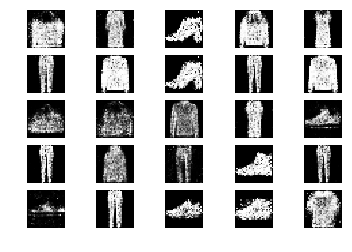

22001 [D loss: 0.596585, acc.: 65.62%] [G loss: 0.959487]
22002 [D loss: 0.573848, acc.: 65.62%] [G loss: 0.916989]
22003 [D loss: 0.679477, acc.: 53.12%] [G loss: 0.911524]
22004 [D loss: 0.642250, acc.: 64.06%] [G loss: 0.909890]
22005 [D loss: 0.639945, acc.: 59.38%] [G loss: 0.957469]
22006 [D loss: 0.613997, acc.: 70.31%] [G loss: 0.933297]
22007 [D loss: 0.635521, acc.: 67.19%] [G loss: 0.883071]
22008 [D loss: 0.687254, acc.: 57.81%] [G loss: 1.007499]
22009 [D loss: 0.650319, acc.: 53.12%] [G loss: 0.814117]
22010 [D loss: 0.621899, acc.: 70.31%] [G loss: 0.906412]
22011 [D loss: 0.658563, acc.: 59.38%] [G loss: 0.848725]
22012 [D loss: 0.650747, acc.: 64.06%] [G loss: 0.914063]
22013 [D loss: 0.642345, acc.: 60.94%] [G loss: 0.934469]
22014 [D loss: 0.709714, acc.: 54.69%] [G loss: 0.947476]
22015 [D loss: 0.671093, acc.: 57.81%] [G loss: 0.945052]
22016 [D loss: 0.667338, acc.: 59.38%] [G loss: 0.905603]
22017 [D loss: 0.622172, acc.: 67.19%] [G loss: 1.058876]
22018 [D loss:

22145 [D loss: 0.698452, acc.: 56.25%] [G loss: 0.933123]
22146 [D loss: 0.637986, acc.: 60.94%] [G loss: 0.908946]
22147 [D loss: 0.621833, acc.: 65.62%] [G loss: 0.940013]
22148 [D loss: 0.659579, acc.: 54.69%] [G loss: 0.960289]
22149 [D loss: 0.599350, acc.: 70.31%] [G loss: 1.074516]
22150 [D loss: 0.604014, acc.: 68.75%] [G loss: 0.983768]
22151 [D loss: 0.639313, acc.: 59.38%] [G loss: 0.912470]
22152 [D loss: 0.641712, acc.: 64.06%] [G loss: 0.917289]
22153 [D loss: 0.684920, acc.: 54.69%] [G loss: 0.855104]
22154 [D loss: 0.646067, acc.: 65.62%] [G loss: 0.883727]
22155 [D loss: 0.666166, acc.: 54.69%] [G loss: 0.931818]
22156 [D loss: 0.630857, acc.: 64.06%] [G loss: 0.932819]
22157 [D loss: 0.701603, acc.: 50.00%] [G loss: 0.991434]
22158 [D loss: 0.648062, acc.: 68.75%] [G loss: 0.877965]
22159 [D loss: 0.670981, acc.: 56.25%] [G loss: 0.972118]
22160 [D loss: 0.671393, acc.: 51.56%] [G loss: 0.870225]
22161 [D loss: 0.587500, acc.: 68.75%] [G loss: 0.941225]
22162 [D loss:

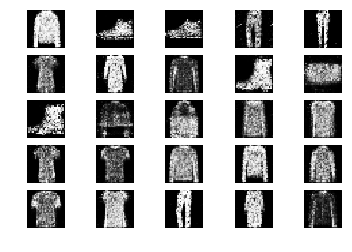

22201 [D loss: 0.660803, acc.: 53.12%] [G loss: 0.923721]
22202 [D loss: 0.640158, acc.: 62.50%] [G loss: 0.888253]
22203 [D loss: 0.694469, acc.: 51.56%] [G loss: 0.886066]
22204 [D loss: 0.617809, acc.: 68.75%] [G loss: 0.944271]
22205 [D loss: 0.615090, acc.: 60.94%] [G loss: 0.869842]
22206 [D loss: 0.646356, acc.: 62.50%] [G loss: 0.988504]
22207 [D loss: 0.587775, acc.: 67.19%] [G loss: 1.051309]
22208 [D loss: 0.660376, acc.: 59.38%] [G loss: 0.996723]
22209 [D loss: 0.659982, acc.: 64.06%] [G loss: 0.946344]
22210 [D loss: 0.605796, acc.: 71.88%] [G loss: 1.036008]
22211 [D loss: 0.659824, acc.: 56.25%] [G loss: 0.935464]
22212 [D loss: 0.684735, acc.: 54.69%] [G loss: 0.884103]
22213 [D loss: 0.632405, acc.: 65.62%] [G loss: 0.915132]
22214 [D loss: 0.674888, acc.: 50.00%] [G loss: 0.836960]
22215 [D loss: 0.622576, acc.: 60.94%] [G loss: 0.895099]
22216 [D loss: 0.720676, acc.: 59.38%] [G loss: 0.943801]
22217 [D loss: 0.690204, acc.: 56.25%] [G loss: 0.925002]
22218 [D loss:

22345 [D loss: 0.688992, acc.: 54.69%] [G loss: 0.945599]
22346 [D loss: 0.672149, acc.: 57.81%] [G loss: 1.000920]
22347 [D loss: 0.618843, acc.: 68.75%] [G loss: 0.928123]
22348 [D loss: 0.688520, acc.: 59.38%] [G loss: 0.897035]
22349 [D loss: 0.626349, acc.: 65.62%] [G loss: 0.930737]
22350 [D loss: 0.684294, acc.: 59.38%] [G loss: 1.077404]
22351 [D loss: 0.607709, acc.: 67.19%] [G loss: 1.040821]
22352 [D loss: 0.741691, acc.: 43.75%] [G loss: 0.986495]
22353 [D loss: 0.622584, acc.: 67.19%] [G loss: 0.947240]
22354 [D loss: 0.685747, acc.: 56.25%] [G loss: 0.848698]
22355 [D loss: 0.574683, acc.: 68.75%] [G loss: 0.942739]
22356 [D loss: 0.583378, acc.: 65.62%] [G loss: 1.081733]
22357 [D loss: 0.682606, acc.: 53.12%] [G loss: 1.030435]
22358 [D loss: 0.647477, acc.: 62.50%] [G loss: 0.981137]
22359 [D loss: 0.648235, acc.: 62.50%] [G loss: 0.958707]
22360 [D loss: 0.673426, acc.: 70.31%] [G loss: 0.851183]
22361 [D loss: 0.622088, acc.: 59.38%] [G loss: 0.945355]
22362 [D loss:

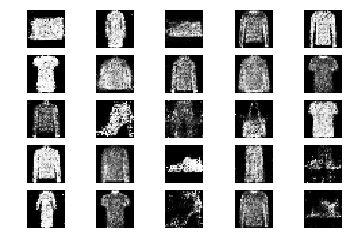

22401 [D loss: 0.700727, acc.: 53.12%] [G loss: 0.999022]
22402 [D loss: 0.663871, acc.: 64.06%] [G loss: 0.907252]
22403 [D loss: 0.709184, acc.: 53.12%] [G loss: 0.884325]
22404 [D loss: 0.583826, acc.: 71.88%] [G loss: 0.831596]
22405 [D loss: 0.584896, acc.: 78.12%] [G loss: 0.869165]
22406 [D loss: 0.689231, acc.: 57.81%] [G loss: 0.879081]
22407 [D loss: 0.621656, acc.: 64.06%] [G loss: 0.818397]
22408 [D loss: 0.696330, acc.: 56.25%] [G loss: 0.808342]
22409 [D loss: 0.718172, acc.: 51.56%] [G loss: 0.875742]
22410 [D loss: 0.606367, acc.: 73.44%] [G loss: 0.885390]
22411 [D loss: 0.563043, acc.: 75.00%] [G loss: 0.892280]
22412 [D loss: 0.672933, acc.: 57.81%] [G loss: 0.927528]
22413 [D loss: 0.608008, acc.: 67.19%] [G loss: 0.954615]
22414 [D loss: 0.714382, acc.: 57.81%] [G loss: 0.985561]
22415 [D loss: 0.676147, acc.: 54.69%] [G loss: 0.937149]
22416 [D loss: 0.591001, acc.: 70.31%] [G loss: 0.956830]
22417 [D loss: 0.651798, acc.: 65.62%] [G loss: 1.018620]
22418 [D loss:

22545 [D loss: 0.716096, acc.: 48.44%] [G loss: 0.959453]
22546 [D loss: 0.676532, acc.: 65.62%] [G loss: 0.923722]
22547 [D loss: 0.642069, acc.: 62.50%] [G loss: 1.016352]
22548 [D loss: 0.652141, acc.: 59.38%] [G loss: 0.984797]
22549 [D loss: 0.646497, acc.: 56.25%] [G loss: 0.938818]
22550 [D loss: 0.624979, acc.: 62.50%] [G loss: 0.863979]
22551 [D loss: 0.611784, acc.: 70.31%] [G loss: 0.957537]
22552 [D loss: 0.741738, acc.: 50.00%] [G loss: 0.912898]
22553 [D loss: 0.570286, acc.: 76.56%] [G loss: 0.807366]
22554 [D loss: 0.694668, acc.: 51.56%] [G loss: 0.787216]
22555 [D loss: 0.631070, acc.: 64.06%] [G loss: 0.941911]
22556 [D loss: 0.620252, acc.: 64.06%] [G loss: 0.918529]
22557 [D loss: 0.674924, acc.: 59.38%] [G loss: 0.887254]
22558 [D loss: 0.646288, acc.: 60.94%] [G loss: 0.941195]
22559 [D loss: 0.683937, acc.: 60.94%] [G loss: 0.850194]
22560 [D loss: 0.627653, acc.: 60.94%] [G loss: 0.948481]
22561 [D loss: 0.637967, acc.: 67.19%] [G loss: 0.920583]
22562 [D loss:

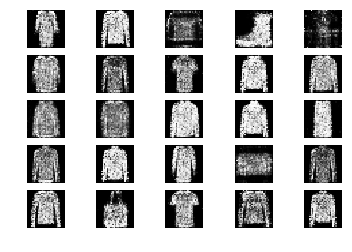

22601 [D loss: 0.685777, acc.: 60.94%] [G loss: 0.945330]
22602 [D loss: 0.674387, acc.: 53.12%] [G loss: 0.907582]
22603 [D loss: 0.624320, acc.: 57.81%] [G loss: 0.978644]
22604 [D loss: 0.689378, acc.: 54.69%] [G loss: 0.935039]
22605 [D loss: 0.648310, acc.: 62.50%] [G loss: 0.903281]
22606 [D loss: 0.647523, acc.: 57.81%] [G loss: 0.864829]
22607 [D loss: 0.693918, acc.: 46.88%] [G loss: 0.941638]
22608 [D loss: 0.592708, acc.: 67.19%] [G loss: 0.912149]
22609 [D loss: 0.629999, acc.: 67.19%] [G loss: 0.946814]
22610 [D loss: 0.690192, acc.: 53.12%] [G loss: 0.843567]
22611 [D loss: 0.693292, acc.: 53.12%] [G loss: 0.883162]
22612 [D loss: 0.682732, acc.: 60.94%] [G loss: 0.916634]
22613 [D loss: 0.631328, acc.: 62.50%] [G loss: 1.027418]
22614 [D loss: 0.616253, acc.: 68.75%] [G loss: 1.131306]
22615 [D loss: 0.729048, acc.: 46.88%] [G loss: 0.867614]
22616 [D loss: 0.652156, acc.: 59.38%] [G loss: 1.060580]
22617 [D loss: 0.637435, acc.: 64.06%] [G loss: 0.986514]
22618 [D loss:

22745 [D loss: 0.597652, acc.: 67.19%] [G loss: 1.011312]
22746 [D loss: 0.699301, acc.: 51.56%] [G loss: 1.098440]
22747 [D loss: 0.639524, acc.: 57.81%] [G loss: 0.997321]
22748 [D loss: 0.636568, acc.: 62.50%] [G loss: 0.924525]
22749 [D loss: 0.657109, acc.: 65.62%] [G loss: 0.874201]
22750 [D loss: 0.651831, acc.: 62.50%] [G loss: 0.929355]
22751 [D loss: 0.657402, acc.: 67.19%] [G loss: 1.011738]
22752 [D loss: 0.615412, acc.: 67.19%] [G loss: 0.949798]
22753 [D loss: 0.606986, acc.: 71.88%] [G loss: 0.915610]
22754 [D loss: 0.597503, acc.: 68.75%] [G loss: 0.967613]
22755 [D loss: 0.667046, acc.: 54.69%] [G loss: 0.924078]
22756 [D loss: 0.604331, acc.: 70.31%] [G loss: 0.974810]
22757 [D loss: 0.716910, acc.: 48.44%] [G loss: 0.866726]
22758 [D loss: 0.675429, acc.: 57.81%] [G loss: 0.964048]
22759 [D loss: 0.677204, acc.: 64.06%] [G loss: 0.938359]
22760 [D loss: 0.620532, acc.: 70.31%] [G loss: 1.052733]
22761 [D loss: 0.567868, acc.: 73.44%] [G loss: 0.957454]
22762 [D loss:

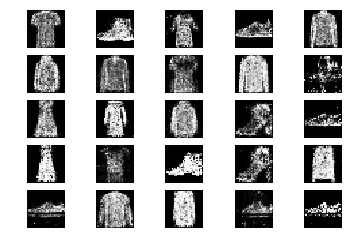

22801 [D loss: 0.626403, acc.: 68.75%] [G loss: 0.950100]
22802 [D loss: 0.640252, acc.: 65.62%] [G loss: 0.915717]
22803 [D loss: 0.623647, acc.: 62.50%] [G loss: 0.930867]
22804 [D loss: 0.591128, acc.: 67.19%] [G loss: 0.935213]
22805 [D loss: 0.615439, acc.: 64.06%] [G loss: 0.974702]
22806 [D loss: 0.728014, acc.: 50.00%] [G loss: 0.914572]
22807 [D loss: 0.629266, acc.: 59.38%] [G loss: 0.859162]
22808 [D loss: 0.624707, acc.: 68.75%] [G loss: 0.878041]
22809 [D loss: 0.617294, acc.: 57.81%] [G loss: 0.846170]
22810 [D loss: 0.684858, acc.: 56.25%] [G loss: 0.859223]
22811 [D loss: 0.725954, acc.: 51.56%] [G loss: 0.901851]
22812 [D loss: 0.627828, acc.: 62.50%] [G loss: 0.900911]
22813 [D loss: 0.649244, acc.: 56.25%] [G loss: 0.980532]
22814 [D loss: 0.685878, acc.: 59.38%] [G loss: 0.900788]
22815 [D loss: 0.705392, acc.: 48.44%] [G loss: 0.949976]
22816 [D loss: 0.668836, acc.: 60.94%] [G loss: 0.903848]
22817 [D loss: 0.683728, acc.: 56.25%] [G loss: 0.876125]
22818 [D loss:

22944 [D loss: 0.663166, acc.: 64.06%] [G loss: 0.935993]
22945 [D loss: 0.551481, acc.: 78.12%] [G loss: 0.939788]
22946 [D loss: 0.620240, acc.: 62.50%] [G loss: 0.929593]
22947 [D loss: 0.734730, acc.: 53.12%] [G loss: 0.946134]
22948 [D loss: 0.599894, acc.: 59.38%] [G loss: 1.009349]
22949 [D loss: 0.717247, acc.: 53.12%] [G loss: 0.984488]
22950 [D loss: 0.642093, acc.: 64.06%] [G loss: 0.950100]
22951 [D loss: 0.634535, acc.: 68.75%] [G loss: 0.943422]
22952 [D loss: 0.638373, acc.: 68.75%] [G loss: 1.078630]
22953 [D loss: 0.630950, acc.: 65.62%] [G loss: 1.030474]
22954 [D loss: 0.579173, acc.: 70.31%] [G loss: 1.053224]
22955 [D loss: 0.587163, acc.: 68.75%] [G loss: 1.018915]
22956 [D loss: 0.559981, acc.: 70.31%] [G loss: 1.078657]
22957 [D loss: 0.726069, acc.: 56.25%] [G loss: 1.075754]
22958 [D loss: 0.748550, acc.: 50.00%] [G loss: 0.877633]
22959 [D loss: 0.639637, acc.: 67.19%] [G loss: 0.939214]
22960 [D loss: 0.650720, acc.: 59.38%] [G loss: 1.030979]
22961 [D loss:

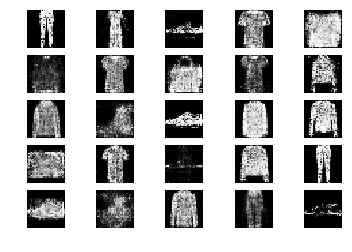

23001 [D loss: 0.737620, acc.: 48.44%] [G loss: 0.932267]
23002 [D loss: 0.631087, acc.: 64.06%] [G loss: 0.929452]
23003 [D loss: 0.593762, acc.: 65.62%] [G loss: 0.890175]
23004 [D loss: 0.690257, acc.: 54.69%] [G loss: 0.916976]
23005 [D loss: 0.636088, acc.: 53.12%] [G loss: 0.980991]
23006 [D loss: 0.617335, acc.: 64.06%] [G loss: 0.986449]
23007 [D loss: 0.566344, acc.: 73.44%] [G loss: 0.945117]
23008 [D loss: 0.609582, acc.: 67.19%] [G loss: 0.982016]
23009 [D loss: 0.603446, acc.: 67.19%] [G loss: 1.097688]
23010 [D loss: 0.649358, acc.: 60.94%] [G loss: 0.919171]
23011 [D loss: 0.635197, acc.: 56.25%] [G loss: 0.932056]
23012 [D loss: 0.651689, acc.: 62.50%] [G loss: 0.994637]
23013 [D loss: 0.640301, acc.: 65.62%] [G loss: 1.001745]
23014 [D loss: 0.715883, acc.: 59.38%] [G loss: 0.905422]
23015 [D loss: 0.629124, acc.: 65.62%] [G loss: 0.948125]
23016 [D loss: 0.654605, acc.: 62.50%] [G loss: 0.948287]
23017 [D loss: 0.661141, acc.: 56.25%] [G loss: 0.961162]
23018 [D loss:

23144 [D loss: 0.559708, acc.: 75.00%] [G loss: 0.875225]
23145 [D loss: 0.579189, acc.: 70.31%] [G loss: 0.907607]
23146 [D loss: 0.620567, acc.: 67.19%] [G loss: 0.879713]
23147 [D loss: 0.605041, acc.: 65.62%] [G loss: 0.932382]
23148 [D loss: 0.659305, acc.: 67.19%] [G loss: 0.996058]
23149 [D loss: 0.615439, acc.: 62.50%] [G loss: 0.961533]
23150 [D loss: 0.629742, acc.: 64.06%] [G loss: 0.874110]
23151 [D loss: 0.638069, acc.: 65.62%] [G loss: 0.916936]
23152 [D loss: 0.674021, acc.: 59.38%] [G loss: 1.018029]
23153 [D loss: 0.669079, acc.: 57.81%] [G loss: 0.983104]
23154 [D loss: 0.661325, acc.: 59.38%] [G loss: 0.962482]
23155 [D loss: 0.666977, acc.: 62.50%] [G loss: 0.976574]
23156 [D loss: 0.657354, acc.: 64.06%] [G loss: 0.949128]
23157 [D loss: 0.700584, acc.: 50.00%] [G loss: 0.927446]
23158 [D loss: 0.689934, acc.: 59.38%] [G loss: 0.934641]
23159 [D loss: 0.631759, acc.: 67.19%] [G loss: 0.967374]
23160 [D loss: 0.708169, acc.: 48.44%] [G loss: 0.882754]
23161 [D loss:

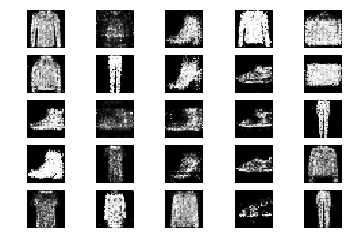

23201 [D loss: 0.651448, acc.: 59.38%] [G loss: 0.971939]
23202 [D loss: 0.666521, acc.: 62.50%] [G loss: 0.917969]
23203 [D loss: 0.569302, acc.: 70.31%] [G loss: 0.886163]
23204 [D loss: 0.625567, acc.: 68.75%] [G loss: 0.917816]
23205 [D loss: 0.677625, acc.: 60.94%] [G loss: 0.918938]
23206 [D loss: 0.636000, acc.: 62.50%] [G loss: 0.919893]
23207 [D loss: 0.602095, acc.: 79.69%] [G loss: 0.955095]
23208 [D loss: 0.587387, acc.: 68.75%] [G loss: 0.912135]
23209 [D loss: 0.658107, acc.: 59.38%] [G loss: 1.017924]
23210 [D loss: 0.600723, acc.: 67.19%] [G loss: 0.999207]
23211 [D loss: 0.566875, acc.: 76.56%] [G loss: 1.021203]
23212 [D loss: 0.753360, acc.: 50.00%] [G loss: 0.866938]
23213 [D loss: 0.699261, acc.: 51.56%] [G loss: 1.000038]
23214 [D loss: 0.607329, acc.: 64.06%] [G loss: 0.903474]
23215 [D loss: 0.551987, acc.: 78.12%] [G loss: 1.061784]
23216 [D loss: 0.665694, acc.: 64.06%] [G loss: 0.933781]
23217 [D loss: 0.671238, acc.: 56.25%] [G loss: 0.832155]
23218 [D loss:

23343 [D loss: 0.633512, acc.: 64.06%] [G loss: 0.929850]
23344 [D loss: 0.697993, acc.: 51.56%] [G loss: 0.946668]
23345 [D loss: 0.648278, acc.: 62.50%] [G loss: 1.049229]
23346 [D loss: 0.644181, acc.: 68.75%] [G loss: 0.945078]
23347 [D loss: 0.627685, acc.: 67.19%] [G loss: 0.907658]
23348 [D loss: 0.600472, acc.: 68.75%] [G loss: 0.907432]
23349 [D loss: 0.580661, acc.: 71.88%] [G loss: 0.856333]
23350 [D loss: 0.611306, acc.: 64.06%] [G loss: 0.874981]
23351 [D loss: 0.607205, acc.: 65.62%] [G loss: 0.902796]
23352 [D loss: 0.628741, acc.: 67.19%] [G loss: 0.824208]
23353 [D loss: 0.657952, acc.: 60.94%] [G loss: 0.890405]
23354 [D loss: 0.635698, acc.: 64.06%] [G loss: 0.959025]
23355 [D loss: 0.608782, acc.: 60.94%] [G loss: 0.937587]
23356 [D loss: 0.630850, acc.: 64.06%] [G loss: 1.006489]
23357 [D loss: 0.612172, acc.: 65.62%] [G loss: 0.989564]
23358 [D loss: 0.572100, acc.: 67.19%] [G loss: 1.037987]
23359 [D loss: 0.657793, acc.: 59.38%] [G loss: 0.989313]
23360 [D loss:

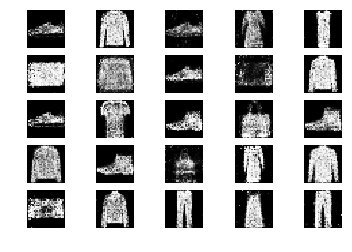

23401 [D loss: 0.616395, acc.: 64.06%] [G loss: 0.964213]
23402 [D loss: 0.690635, acc.: 57.81%] [G loss: 0.911729]
23403 [D loss: 0.677387, acc.: 51.56%] [G loss: 0.876292]
23404 [D loss: 0.710070, acc.: 59.38%] [G loss: 0.886238]
23405 [D loss: 0.606995, acc.: 68.75%] [G loss: 0.987957]
23406 [D loss: 0.651468, acc.: 64.06%] [G loss: 0.955489]
23407 [D loss: 0.694293, acc.: 57.81%] [G loss: 0.931880]
23408 [D loss: 0.625807, acc.: 60.94%] [G loss: 0.936343]
23409 [D loss: 0.606084, acc.: 68.75%] [G loss: 0.886367]
23410 [D loss: 0.710184, acc.: 53.12%] [G loss: 0.912343]
23411 [D loss: 0.594256, acc.: 68.75%] [G loss: 0.904183]
23412 [D loss: 0.619323, acc.: 64.06%] [G loss: 0.861975]
23413 [D loss: 0.669125, acc.: 54.69%] [G loss: 0.947542]
23414 [D loss: 0.663635, acc.: 60.94%] [G loss: 0.862209]
23415 [D loss: 0.619001, acc.: 68.75%] [G loss: 0.872739]
23416 [D loss: 0.708004, acc.: 51.56%] [G loss: 1.001057]
23417 [D loss: 0.592896, acc.: 68.75%] [G loss: 1.026414]
23418 [D loss:

23543 [D loss: 0.619863, acc.: 70.31%] [G loss: 0.917603]
23544 [D loss: 0.651971, acc.: 65.62%] [G loss: 0.987620]
23545 [D loss: 0.708580, acc.: 51.56%] [G loss: 0.840464]
23546 [D loss: 0.613508, acc.: 70.31%] [G loss: 0.844023]
23547 [D loss: 0.623612, acc.: 57.81%] [G loss: 0.885772]
23548 [D loss: 0.625873, acc.: 65.62%] [G loss: 0.959168]
23549 [D loss: 0.691201, acc.: 57.81%] [G loss: 0.898956]
23550 [D loss: 0.646290, acc.: 60.94%] [G loss: 0.976159]
23551 [D loss: 0.702648, acc.: 51.56%] [G loss: 0.975916]
23552 [D loss: 0.652121, acc.: 59.38%] [G loss: 0.993868]
23553 [D loss: 0.675027, acc.: 60.94%] [G loss: 0.948172]
23554 [D loss: 0.636415, acc.: 67.19%] [G loss: 0.936504]
23555 [D loss: 0.631923, acc.: 68.75%] [G loss: 0.895349]
23556 [D loss: 0.675362, acc.: 62.50%] [G loss: 0.877610]
23557 [D loss: 0.697577, acc.: 46.88%] [G loss: 0.911544]
23558 [D loss: 0.656956, acc.: 60.94%] [G loss: 0.883664]
23559 [D loss: 0.632071, acc.: 64.06%] [G loss: 0.937256]
23560 [D loss:

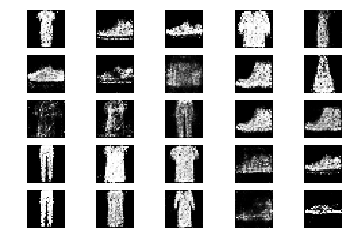

23601 [D loss: 0.650118, acc.: 57.81%] [G loss: 0.842067]
23602 [D loss: 0.697457, acc.: 56.25%] [G loss: 0.897769]
23603 [D loss: 0.674097, acc.: 62.50%] [G loss: 0.933195]
23604 [D loss: 0.652133, acc.: 67.19%] [G loss: 0.921404]
23605 [D loss: 0.648995, acc.: 62.50%] [G loss: 0.946321]
23606 [D loss: 0.535984, acc.: 82.81%] [G loss: 0.956451]
23607 [D loss: 0.704948, acc.: 54.69%] [G loss: 0.963180]
23608 [D loss: 0.665797, acc.: 54.69%] [G loss: 1.026592]
23609 [D loss: 0.540457, acc.: 76.56%] [G loss: 0.916412]
23610 [D loss: 0.610870, acc.: 64.06%] [G loss: 0.982877]
23611 [D loss: 0.617005, acc.: 62.50%] [G loss: 0.945499]
23612 [D loss: 0.640865, acc.: 57.81%] [G loss: 1.005354]
23613 [D loss: 0.638585, acc.: 65.62%] [G loss: 1.010087]
23614 [D loss: 0.631005, acc.: 65.62%] [G loss: 0.962556]
23615 [D loss: 0.702422, acc.: 50.00%] [G loss: 0.945472]
23616 [D loss: 0.591124, acc.: 71.88%] [G loss: 0.905478]
23617 [D loss: 0.616846, acc.: 67.19%] [G loss: 0.895747]
23618 [D loss:

23744 [D loss: 0.648574, acc.: 64.06%] [G loss: 0.967577]
23745 [D loss: 0.601964, acc.: 68.75%] [G loss: 0.885522]
23746 [D loss: 0.660952, acc.: 57.81%] [G loss: 0.893482]
23747 [D loss: 0.587897, acc.: 73.44%] [G loss: 0.973309]
23748 [D loss: 0.729579, acc.: 54.69%] [G loss: 0.909421]
23749 [D loss: 0.592628, acc.: 73.44%] [G loss: 0.867997]
23750 [D loss: 0.643773, acc.: 56.25%] [G loss: 0.866847]
23751 [D loss: 0.694073, acc.: 51.56%] [G loss: 0.922724]
23752 [D loss: 0.645623, acc.: 59.38%] [G loss: 0.916371]
23753 [D loss: 0.682369, acc.: 60.94%] [G loss: 0.906473]
23754 [D loss: 0.647127, acc.: 64.06%] [G loss: 0.941895]
23755 [D loss: 0.572438, acc.: 70.31%] [G loss: 0.911228]
23756 [D loss: 0.692245, acc.: 54.69%] [G loss: 0.966283]
23757 [D loss: 0.574952, acc.: 71.88%] [G loss: 0.942094]
23758 [D loss: 0.650958, acc.: 57.81%] [G loss: 0.961377]
23759 [D loss: 0.591294, acc.: 70.31%] [G loss: 0.953089]
23760 [D loss: 0.591484, acc.: 68.75%] [G loss: 0.945448]
23761 [D loss:

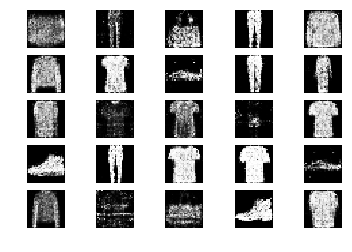

23801 [D loss: 0.679802, acc.: 50.00%] [G loss: 0.935525]
23802 [D loss: 0.651434, acc.: 68.75%] [G loss: 0.983272]
23803 [D loss: 0.650509, acc.: 60.94%] [G loss: 1.023073]
23804 [D loss: 0.652791, acc.: 60.94%] [G loss: 0.971530]
23805 [D loss: 0.672758, acc.: 59.38%] [G loss: 0.972736]
23806 [D loss: 0.696522, acc.: 56.25%] [G loss: 0.914003]
23807 [D loss: 0.699719, acc.: 51.56%] [G loss: 0.877138]
23808 [D loss: 0.688137, acc.: 54.69%] [G loss: 0.823308]
23809 [D loss: 0.660935, acc.: 48.44%] [G loss: 0.899985]
23810 [D loss: 0.603402, acc.: 73.44%] [G loss: 0.855691]
23811 [D loss: 0.663924, acc.: 57.81%] [G loss: 0.888321]
23812 [D loss: 0.669339, acc.: 62.50%] [G loss: 0.875472]
23813 [D loss: 0.665948, acc.: 59.38%] [G loss: 0.897106]
23814 [D loss: 0.709068, acc.: 60.94%] [G loss: 0.915763]
23815 [D loss: 0.622733, acc.: 64.06%] [G loss: 0.991928]
23816 [D loss: 0.655263, acc.: 64.06%] [G loss: 0.954360]
23817 [D loss: 0.637177, acc.: 64.06%] [G loss: 0.961646]
23818 [D loss:

23943 [D loss: 0.672163, acc.: 62.50%] [G loss: 0.960948]
23944 [D loss: 0.660073, acc.: 60.94%] [G loss: 0.930959]
23945 [D loss: 0.665430, acc.: 56.25%] [G loss: 0.920952]
23946 [D loss: 0.687782, acc.: 54.69%] [G loss: 0.806971]
23947 [D loss: 0.595836, acc.: 73.44%] [G loss: 0.883573]
23948 [D loss: 0.691932, acc.: 50.00%] [G loss: 0.896443]
23949 [D loss: 0.679487, acc.: 59.38%] [G loss: 0.910240]
23950 [D loss: 0.672262, acc.: 60.94%] [G loss: 0.940062]
23951 [D loss: 0.597789, acc.: 71.88%] [G loss: 1.040753]
23952 [D loss: 0.634915, acc.: 57.81%] [G loss: 1.044209]
23953 [D loss: 0.593571, acc.: 65.62%] [G loss: 1.032129]
23954 [D loss: 0.577944, acc.: 65.62%] [G loss: 1.040388]
23955 [D loss: 0.659930, acc.: 59.38%] [G loss: 0.952053]
23956 [D loss: 0.621110, acc.: 68.75%] [G loss: 0.922595]
23957 [D loss: 0.607799, acc.: 70.31%] [G loss: 0.936794]
23958 [D loss: 0.618546, acc.: 71.88%] [G loss: 0.976470]
23959 [D loss: 0.634166, acc.: 65.62%] [G loss: 0.886338]
23960 [D loss:

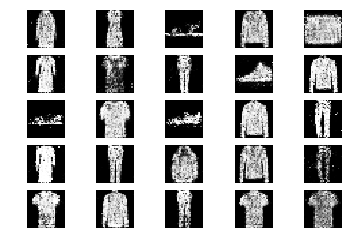

24001 [D loss: 0.641348, acc.: 67.19%] [G loss: 0.940023]
24002 [D loss: 0.593885, acc.: 62.50%] [G loss: 0.987638]
24003 [D loss: 0.733115, acc.: 42.19%] [G loss: 0.940817]
24004 [D loss: 0.599488, acc.: 65.62%] [G loss: 0.977630]
24005 [D loss: 0.614752, acc.: 64.06%] [G loss: 1.044132]
24006 [D loss: 0.658144, acc.: 68.75%] [G loss: 0.963308]
24007 [D loss: 0.638574, acc.: 62.50%] [G loss: 0.930658]
24008 [D loss: 0.591292, acc.: 70.31%] [G loss: 0.948597]
24009 [D loss: 0.649297, acc.: 59.38%] [G loss: 0.789753]
24010 [D loss: 0.665341, acc.: 67.19%] [G loss: 0.917273]
24011 [D loss: 0.607866, acc.: 67.19%] [G loss: 0.916663]
24012 [D loss: 0.650547, acc.: 62.50%] [G loss: 0.834894]
24013 [D loss: 0.644507, acc.: 65.62%] [G loss: 0.883358]
24014 [D loss: 0.722981, acc.: 56.25%] [G loss: 0.886217]
24015 [D loss: 0.629198, acc.: 59.38%] [G loss: 0.905479]
24016 [D loss: 0.646149, acc.: 59.38%] [G loss: 0.944260]
24017 [D loss: 0.621728, acc.: 64.06%] [G loss: 0.869129]
24018 [D loss:

24143 [D loss: 0.622792, acc.: 64.06%] [G loss: 0.959529]
24144 [D loss: 0.667155, acc.: 64.06%] [G loss: 0.941582]
24145 [D loss: 0.641800, acc.: 62.50%] [G loss: 0.919029]
24146 [D loss: 0.660998, acc.: 54.69%] [G loss: 0.897184]
24147 [D loss: 0.756396, acc.: 48.44%] [G loss: 0.919746]
24148 [D loss: 0.639802, acc.: 62.50%] [G loss: 0.857937]
24149 [D loss: 0.647847, acc.: 59.38%] [G loss: 0.945995]
24150 [D loss: 0.675064, acc.: 60.94%] [G loss: 0.870060]
24151 [D loss: 0.609765, acc.: 64.06%] [G loss: 0.904839]
24152 [D loss: 0.628107, acc.: 57.81%] [G loss: 0.885781]
24153 [D loss: 0.689096, acc.: 57.81%] [G loss: 0.989583]
24154 [D loss: 0.614910, acc.: 70.31%] [G loss: 0.976526]
24155 [D loss: 0.648572, acc.: 57.81%] [G loss: 0.848356]
24156 [D loss: 0.603432, acc.: 65.62%] [G loss: 0.852515]
24157 [D loss: 0.658601, acc.: 60.94%] [G loss: 0.852910]
24158 [D loss: 0.636705, acc.: 60.94%] [G loss: 0.960794]
24159 [D loss: 0.625107, acc.: 64.06%] [G loss: 1.010139]
24160 [D loss:

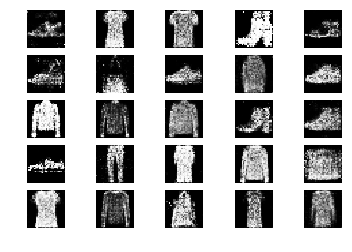

24201 [D loss: 0.596299, acc.: 68.75%] [G loss: 0.930059]
24202 [D loss: 0.616197, acc.: 65.62%] [G loss: 0.969562]
24203 [D loss: 0.705242, acc.: 57.81%] [G loss: 0.861159]
24204 [D loss: 0.639808, acc.: 64.06%] [G loss: 0.958676]
24205 [D loss: 0.634933, acc.: 56.25%] [G loss: 0.956340]
24206 [D loss: 0.576202, acc.: 70.31%] [G loss: 1.012227]
24207 [D loss: 0.615282, acc.: 67.19%] [G loss: 1.024326]
24208 [D loss: 0.676610, acc.: 51.56%] [G loss: 0.989468]
24209 [D loss: 0.661520, acc.: 71.88%] [G loss: 0.970095]
24210 [D loss: 0.654381, acc.: 59.38%] [G loss: 0.963234]
24211 [D loss: 0.606478, acc.: 67.19%] [G loss: 0.882254]
24212 [D loss: 0.716564, acc.: 54.69%] [G loss: 0.915777]
24213 [D loss: 0.654619, acc.: 62.50%] [G loss: 0.976373]
24214 [D loss: 0.605651, acc.: 70.31%] [G loss: 0.870221]
24215 [D loss: 0.667134, acc.: 57.81%] [G loss: 0.901167]
24216 [D loss: 0.630500, acc.: 65.62%] [G loss: 0.969682]
24217 [D loss: 0.649996, acc.: 59.38%] [G loss: 0.969578]
24218 [D loss:

24345 [D loss: 0.654709, acc.: 60.94%] [G loss: 0.959186]
24346 [D loss: 0.635359, acc.: 62.50%] [G loss: 0.941457]
24347 [D loss: 0.606454, acc.: 67.19%] [G loss: 1.031617]
24348 [D loss: 0.714531, acc.: 54.69%] [G loss: 0.899214]
24349 [D loss: 0.655787, acc.: 59.38%] [G loss: 1.006189]
24350 [D loss: 0.614460, acc.: 65.62%] [G loss: 0.936657]
24351 [D loss: 0.679127, acc.: 56.25%] [G loss: 0.983516]
24352 [D loss: 0.660197, acc.: 56.25%] [G loss: 0.942921]
24353 [D loss: 0.684574, acc.: 68.75%] [G loss: 1.022594]
24354 [D loss: 0.755310, acc.: 51.56%] [G loss: 1.086944]
24355 [D loss: 0.675609, acc.: 56.25%] [G loss: 1.049561]
24356 [D loss: 0.598288, acc.: 68.75%] [G loss: 1.005202]
24357 [D loss: 0.628665, acc.: 64.06%] [G loss: 0.954338]
24358 [D loss: 0.671690, acc.: 57.81%] [G loss: 0.939532]
24359 [D loss: 0.659559, acc.: 62.50%] [G loss: 0.979300]
24360 [D loss: 0.611164, acc.: 67.19%] [G loss: 0.887006]
24361 [D loss: 0.629925, acc.: 64.06%] [G loss: 0.950200]
24362 [D loss:

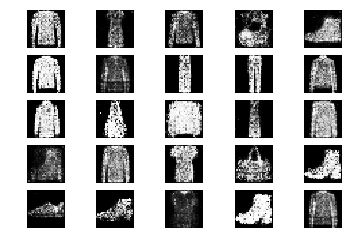

24401 [D loss: 0.685495, acc.: 62.50%] [G loss: 0.981563]
24402 [D loss: 0.617661, acc.: 64.06%] [G loss: 0.925259]
24403 [D loss: 0.543613, acc.: 75.00%] [G loss: 0.871028]
24404 [D loss: 0.581407, acc.: 64.06%] [G loss: 0.964193]
24405 [D loss: 0.680605, acc.: 53.12%] [G loss: 0.960468]
24406 [D loss: 0.587408, acc.: 67.19%] [G loss: 0.912381]
24407 [D loss: 0.614625, acc.: 73.44%] [G loss: 0.871703]
24408 [D loss: 0.614013, acc.: 67.19%] [G loss: 0.992229]
24409 [D loss: 0.658760, acc.: 54.69%] [G loss: 0.954145]
24410 [D loss: 0.704964, acc.: 53.12%] [G loss: 0.958380]
24411 [D loss: 0.545751, acc.: 75.00%] [G loss: 0.969349]
24412 [D loss: 0.732397, acc.: 48.44%] [G loss: 0.920982]
24413 [D loss: 0.625319, acc.: 65.62%] [G loss: 0.878256]
24414 [D loss: 0.634661, acc.: 62.50%] [G loss: 1.064932]
24415 [D loss: 0.652888, acc.: 60.94%] [G loss: 0.927633]
24416 [D loss: 0.608871, acc.: 71.88%] [G loss: 0.931134]
24417 [D loss: 0.640610, acc.: 67.19%] [G loss: 0.920631]
24418 [D loss:

24543 [D loss: 0.665821, acc.: 64.06%] [G loss: 0.939184]
24544 [D loss: 0.632542, acc.: 65.62%] [G loss: 0.987419]
24545 [D loss: 0.593227, acc.: 73.44%] [G loss: 0.904562]
24546 [D loss: 0.640524, acc.: 65.62%] [G loss: 0.860382]
24547 [D loss: 0.663413, acc.: 62.50%] [G loss: 0.845383]
24548 [D loss: 0.662081, acc.: 57.81%] [G loss: 0.873163]
24549 [D loss: 0.568594, acc.: 76.56%] [G loss: 0.969486]
24550 [D loss: 0.642062, acc.: 67.19%] [G loss: 0.887992]
24551 [D loss: 0.727794, acc.: 48.44%] [G loss: 0.951048]
24552 [D loss: 0.714856, acc.: 57.81%] [G loss: 0.972867]
24553 [D loss: 0.611054, acc.: 59.38%] [G loss: 0.893978]
24554 [D loss: 0.645384, acc.: 64.06%] [G loss: 0.915364]
24555 [D loss: 0.645758, acc.: 64.06%] [G loss: 0.954451]
24556 [D loss: 0.644053, acc.: 67.19%] [G loss: 1.085198]
24557 [D loss: 0.648559, acc.: 70.31%] [G loss: 0.852068]
24558 [D loss: 0.594360, acc.: 62.50%] [G loss: 0.970328]
24559 [D loss: 0.599189, acc.: 73.44%] [G loss: 0.960471]
24560 [D loss:

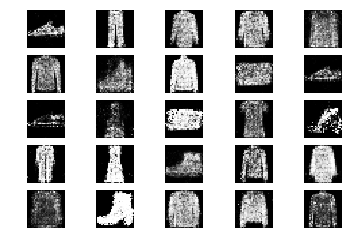

24601 [D loss: 0.703795, acc.: 51.56%] [G loss: 0.986898]
24602 [D loss: 0.633780, acc.: 60.94%] [G loss: 0.983154]
24603 [D loss: 0.606684, acc.: 75.00%] [G loss: 0.996411]
24604 [D loss: 0.579357, acc.: 68.75%] [G loss: 1.131469]
24605 [D loss: 0.671724, acc.: 64.06%] [G loss: 1.034710]
24606 [D loss: 0.667372, acc.: 65.62%] [G loss: 1.039197]
24607 [D loss: 0.606482, acc.: 75.00%] [G loss: 1.015899]
24608 [D loss: 0.596635, acc.: 68.75%] [G loss: 0.975755]
24609 [D loss: 0.569858, acc.: 71.88%] [G loss: 1.046076]
24610 [D loss: 0.608077, acc.: 68.75%] [G loss: 0.976395]
24611 [D loss: 0.570001, acc.: 68.75%] [G loss: 0.987197]
24612 [D loss: 0.659224, acc.: 62.50%] [G loss: 1.028192]
24613 [D loss: 0.705411, acc.: 53.12%] [G loss: 0.996676]
24614 [D loss: 0.645114, acc.: 59.38%] [G loss: 0.941127]
24615 [D loss: 0.627297, acc.: 57.81%] [G loss: 1.061311]
24616 [D loss: 0.664196, acc.: 60.94%] [G loss: 0.946076]
24617 [D loss: 0.662263, acc.: 59.38%] [G loss: 0.934084]
24618 [D loss:

24744 [D loss: 0.661279, acc.: 62.50%] [G loss: 0.965063]
24745 [D loss: 0.650984, acc.: 59.38%] [G loss: 0.885358]
24746 [D loss: 0.636194, acc.: 59.38%] [G loss: 0.834083]
24747 [D loss: 0.673475, acc.: 57.81%] [G loss: 0.938833]
24748 [D loss: 0.593081, acc.: 71.88%] [G loss: 0.903623]
24749 [D loss: 0.652623, acc.: 60.94%] [G loss: 0.869330]
24750 [D loss: 0.629635, acc.: 64.06%] [G loss: 0.913262]
24751 [D loss: 0.549896, acc.: 71.88%] [G loss: 0.929454]
24752 [D loss: 0.648846, acc.: 60.94%] [G loss: 0.914374]
24753 [D loss: 0.636334, acc.: 57.81%] [G loss: 0.956261]
24754 [D loss: 0.614116, acc.: 67.19%] [G loss: 0.991926]
24755 [D loss: 0.593918, acc.: 73.44%] [G loss: 1.068051]
24756 [D loss: 0.652664, acc.: 67.19%] [G loss: 0.955759]
24757 [D loss: 0.673193, acc.: 62.50%] [G loss: 0.926410]
24758 [D loss: 0.669375, acc.: 60.94%] [G loss: 0.937254]
24759 [D loss: 0.634490, acc.: 64.06%] [G loss: 0.941515]
24760 [D loss: 0.646173, acc.: 62.50%] [G loss: 0.956119]
24761 [D loss:

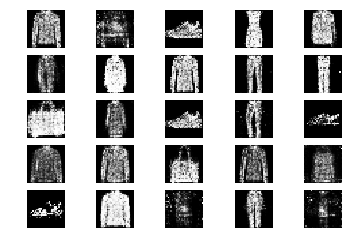

24801 [D loss: 0.656967, acc.: 60.94%] [G loss: 0.921391]
24802 [D loss: 0.670035, acc.: 59.38%] [G loss: 0.882016]
24803 [D loss: 0.657765, acc.: 60.94%] [G loss: 1.015969]
24804 [D loss: 0.584838, acc.: 68.75%] [G loss: 0.977326]
24805 [D loss: 0.713379, acc.: 54.69%] [G loss: 0.944205]
24806 [D loss: 0.652022, acc.: 64.06%] [G loss: 0.957235]
24807 [D loss: 0.648132, acc.: 67.19%] [G loss: 0.966316]
24808 [D loss: 0.701062, acc.: 60.94%] [G loss: 1.073743]
24809 [D loss: 0.702976, acc.: 59.38%] [G loss: 0.931615]
24810 [D loss: 0.587915, acc.: 71.88%] [G loss: 1.031293]
24811 [D loss: 0.619628, acc.: 65.62%] [G loss: 0.943230]
24812 [D loss: 0.648297, acc.: 57.81%] [G loss: 0.945918]
24813 [D loss: 0.654710, acc.: 67.19%] [G loss: 0.949093]
24814 [D loss: 0.635593, acc.: 70.31%] [G loss: 0.957973]
24815 [D loss: 0.602067, acc.: 68.75%] [G loss: 0.935020]
24816 [D loss: 0.672226, acc.: 48.44%] [G loss: 0.845824]
24817 [D loss: 0.639132, acc.: 70.31%] [G loss: 0.949105]
24818 [D loss:

24945 [D loss: 0.599681, acc.: 67.19%] [G loss: 0.958848]
24946 [D loss: 0.687501, acc.: 51.56%] [G loss: 0.953839]
24947 [D loss: 0.561816, acc.: 70.31%] [G loss: 0.999065]
24948 [D loss: 0.718470, acc.: 53.12%] [G loss: 1.031604]
24949 [D loss: 0.642396, acc.: 60.94%] [G loss: 0.923130]
24950 [D loss: 0.658359, acc.: 54.69%] [G loss: 0.955553]
24951 [D loss: 0.657341, acc.: 59.38%] [G loss: 0.918183]
24952 [D loss: 0.611633, acc.: 70.31%] [G loss: 0.907094]
24953 [D loss: 0.694849, acc.: 53.12%] [G loss: 0.942171]
24954 [D loss: 0.627284, acc.: 65.62%] [G loss: 0.828422]
24955 [D loss: 0.574014, acc.: 65.62%] [G loss: 0.933357]
24956 [D loss: 0.616389, acc.: 64.06%] [G loss: 0.924165]
24957 [D loss: 0.630316, acc.: 70.31%] [G loss: 0.972815]
24958 [D loss: 0.704723, acc.: 56.25%] [G loss: 0.928940]
24959 [D loss: 0.641249, acc.: 64.06%] [G loss: 0.985076]
24960 [D loss: 0.656321, acc.: 60.94%] [G loss: 0.945334]
24961 [D loss: 0.610110, acc.: 68.75%] [G loss: 0.959016]
24962 [D loss:

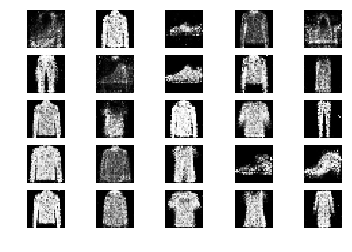

25001 [D loss: 0.620467, acc.: 68.75%] [G loss: 0.953881]
25002 [D loss: 0.610083, acc.: 70.31%] [G loss: 1.073754]
25003 [D loss: 0.633044, acc.: 60.94%] [G loss: 0.958637]
25004 [D loss: 0.592399, acc.: 64.06%] [G loss: 0.817354]
25005 [D loss: 0.709632, acc.: 62.50%] [G loss: 0.958058]
25006 [D loss: 0.590782, acc.: 75.00%] [G loss: 0.958116]
25007 [D loss: 0.594700, acc.: 62.50%] [G loss: 0.855936]
25008 [D loss: 0.629864, acc.: 59.38%] [G loss: 0.908969]
25009 [D loss: 0.675386, acc.: 54.69%] [G loss: 1.008796]
25010 [D loss: 0.663828, acc.: 59.38%] [G loss: 1.050318]
25011 [D loss: 0.693364, acc.: 57.81%] [G loss: 1.073980]
25012 [D loss: 0.664648, acc.: 60.94%] [G loss: 0.920899]
25013 [D loss: 0.573895, acc.: 71.88%] [G loss: 0.921399]
25014 [D loss: 0.623033, acc.: 62.50%] [G loss: 0.901359]
25015 [D loss: 0.676657, acc.: 51.56%] [G loss: 0.933731]
25016 [D loss: 0.615438, acc.: 62.50%] [G loss: 1.030271]
25017 [D loss: 0.618574, acc.: 67.19%] [G loss: 0.931359]
25018 [D loss:

25144 [D loss: 0.660050, acc.: 56.25%] [G loss: 0.979707]
25145 [D loss: 0.649371, acc.: 59.38%] [G loss: 0.960231]
25146 [D loss: 0.567304, acc.: 65.62%] [G loss: 0.993997]
25147 [D loss: 0.644735, acc.: 64.06%] [G loss: 0.876758]
25148 [D loss: 0.601701, acc.: 64.06%] [G loss: 0.977859]
25149 [D loss: 0.715250, acc.: 48.44%] [G loss: 0.887578]
25150 [D loss: 0.669981, acc.: 64.06%] [G loss: 0.948826]
25151 [D loss: 0.654159, acc.: 51.56%] [G loss: 0.973895]
25152 [D loss: 0.654180, acc.: 56.25%] [G loss: 0.920888]
25153 [D loss: 0.697697, acc.: 57.81%] [G loss: 0.938196]
25154 [D loss: 0.599271, acc.: 64.06%] [G loss: 0.957756]
25155 [D loss: 0.630817, acc.: 67.19%] [G loss: 0.978429]
25156 [D loss: 0.631910, acc.: 67.19%] [G loss: 1.066571]
25157 [D loss: 0.603648, acc.: 70.31%] [G loss: 0.970210]
25158 [D loss: 0.647309, acc.: 64.06%] [G loss: 0.996597]
25159 [D loss: 0.675573, acc.: 57.81%] [G loss: 0.944729]
25160 [D loss: 0.578690, acc.: 70.31%] [G loss: 0.882497]
25161 [D loss:

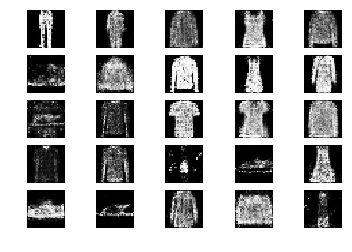

25201 [D loss: 0.655546, acc.: 62.50%] [G loss: 1.018596]
25202 [D loss: 0.665891, acc.: 57.81%] [G loss: 0.982234]
25203 [D loss: 0.611441, acc.: 71.88%] [G loss: 0.964066]
25204 [D loss: 0.643291, acc.: 53.12%] [G loss: 0.948190]
25205 [D loss: 0.630813, acc.: 60.94%] [G loss: 1.063208]
25206 [D loss: 0.651731, acc.: 62.50%] [G loss: 0.975620]
25207 [D loss: 0.702305, acc.: 54.69%] [G loss: 0.927102]
25208 [D loss: 0.631703, acc.: 67.19%] [G loss: 0.969032]
25209 [D loss: 0.713345, acc.: 53.12%] [G loss: 0.892979]
25210 [D loss: 0.682289, acc.: 53.12%] [G loss: 0.956061]
25211 [D loss: 0.651567, acc.: 59.38%] [G loss: 0.857080]
25212 [D loss: 0.662685, acc.: 54.69%] [G loss: 0.991700]
25213 [D loss: 0.692467, acc.: 50.00%] [G loss: 0.948236]
25214 [D loss: 0.640482, acc.: 60.94%] [G loss: 0.977139]
25215 [D loss: 0.717800, acc.: 51.56%] [G loss: 0.956342]
25216 [D loss: 0.694400, acc.: 51.56%] [G loss: 0.907350]
25217 [D loss: 0.632548, acc.: 64.06%] [G loss: 0.955061]
25218 [D loss:

25343 [D loss: 0.634932, acc.: 70.31%] [G loss: 0.994594]
25344 [D loss: 0.696073, acc.: 62.50%] [G loss: 0.931679]
25345 [D loss: 0.668581, acc.: 54.69%] [G loss: 0.981214]
25346 [D loss: 0.600020, acc.: 73.44%] [G loss: 0.993606]
25347 [D loss: 0.668297, acc.: 54.69%] [G loss: 0.937454]
25348 [D loss: 0.564431, acc.: 73.44%] [G loss: 0.920908]
25349 [D loss: 0.642239, acc.: 65.62%] [G loss: 0.951377]
25350 [D loss: 0.704606, acc.: 60.94%] [G loss: 0.888086]
25351 [D loss: 0.627371, acc.: 68.75%] [G loss: 0.812774]
25352 [D loss: 0.667568, acc.: 64.06%] [G loss: 0.853789]
25353 [D loss: 0.659005, acc.: 67.19%] [G loss: 0.943180]
25354 [D loss: 0.640238, acc.: 64.06%] [G loss: 0.839540]
25355 [D loss: 0.687096, acc.: 68.75%] [G loss: 0.984770]
25356 [D loss: 0.573444, acc.: 70.31%] [G loss: 0.905843]
25357 [D loss: 0.639295, acc.: 59.38%] [G loss: 0.931301]
25358 [D loss: 0.632594, acc.: 68.75%] [G loss: 0.979701]
25359 [D loss: 0.624326, acc.: 64.06%] [G loss: 0.879005]
25360 [D loss:

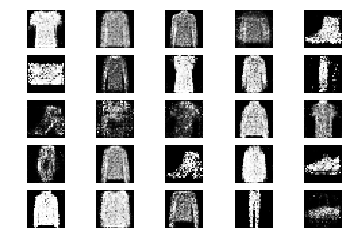

25401 [D loss: 0.671141, acc.: 65.62%] [G loss: 0.958972]
25402 [D loss: 0.774315, acc.: 46.88%] [G loss: 0.930519]
25403 [D loss: 0.640993, acc.: 59.38%] [G loss: 0.985548]
25404 [D loss: 0.560943, acc.: 71.88%] [G loss: 1.103630]
25405 [D loss: 0.708223, acc.: 54.69%] [G loss: 1.018096]
25406 [D loss: 0.673189, acc.: 56.25%] [G loss: 0.862006]
25407 [D loss: 0.642876, acc.: 64.06%] [G loss: 1.010381]
25408 [D loss: 0.644667, acc.: 57.81%] [G loss: 0.858064]
25409 [D loss: 0.662733, acc.: 67.19%] [G loss: 0.997247]
25410 [D loss: 0.618505, acc.: 67.19%] [G loss: 0.910628]
25411 [D loss: 0.713920, acc.: 56.25%] [G loss: 0.882525]
25412 [D loss: 0.639973, acc.: 64.06%] [G loss: 0.989481]
25413 [D loss: 0.647947, acc.: 62.50%] [G loss: 0.970451]
25414 [D loss: 0.556567, acc.: 76.56%] [G loss: 0.997765]
25415 [D loss: 0.658657, acc.: 57.81%] [G loss: 0.946488]
25416 [D loss: 0.652443, acc.: 64.06%] [G loss: 0.954310]
25417 [D loss: 0.621317, acc.: 71.88%] [G loss: 0.820444]
25418 [D loss:

25546 [D loss: 0.695058, acc.: 56.25%] [G loss: 0.865686]
25547 [D loss: 0.628971, acc.: 65.62%] [G loss: 0.915464]
25548 [D loss: 0.644161, acc.: 62.50%] [G loss: 0.879537]
25549 [D loss: 0.655340, acc.: 60.94%] [G loss: 0.951394]
25550 [D loss: 0.659653, acc.: 51.56%] [G loss: 0.933915]
25551 [D loss: 0.727624, acc.: 54.69%] [G loss: 0.970533]
25552 [D loss: 0.621670, acc.: 67.19%] [G loss: 0.863426]
25553 [D loss: 0.687625, acc.: 50.00%] [G loss: 0.836165]
25554 [D loss: 0.656527, acc.: 68.75%] [G loss: 0.861706]
25555 [D loss: 0.679811, acc.: 56.25%] [G loss: 0.892119]
25556 [D loss: 0.602308, acc.: 71.88%] [G loss: 0.882335]
25557 [D loss: 0.582996, acc.: 75.00%] [G loss: 0.938606]
25558 [D loss: 0.615559, acc.: 65.62%] [G loss: 0.975382]
25559 [D loss: 0.628334, acc.: 67.19%] [G loss: 1.004351]
25560 [D loss: 0.629530, acc.: 65.62%] [G loss: 0.898979]
25561 [D loss: 0.627571, acc.: 62.50%] [G loss: 0.987085]
25562 [D loss: 0.644420, acc.: 60.94%] [G loss: 0.859793]
25563 [D loss:

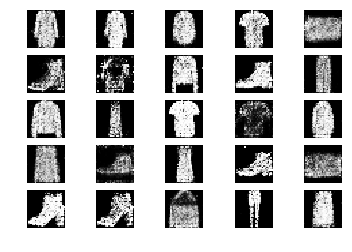

25601 [D loss: 0.672052, acc.: 54.69%] [G loss: 0.877263]
25602 [D loss: 0.617401, acc.: 68.75%] [G loss: 0.909011]
25603 [D loss: 0.634347, acc.: 68.75%] [G loss: 0.955533]
25604 [D loss: 0.656400, acc.: 56.25%] [G loss: 1.001606]
25605 [D loss: 0.614830, acc.: 68.75%] [G loss: 0.943768]
25606 [D loss: 0.639866, acc.: 64.06%] [G loss: 0.831767]
25607 [D loss: 0.653237, acc.: 60.94%] [G loss: 0.896894]
25608 [D loss: 0.619101, acc.: 70.31%] [G loss: 1.045706]
25609 [D loss: 0.601801, acc.: 71.88%] [G loss: 0.904924]
25610 [D loss: 0.706101, acc.: 51.56%] [G loss: 0.910119]
25611 [D loss: 0.596986, acc.: 64.06%] [G loss: 0.902986]
25612 [D loss: 0.585203, acc.: 67.19%] [G loss: 0.863733]
25613 [D loss: 0.612264, acc.: 65.62%] [G loss: 0.929257]
25614 [D loss: 0.693157, acc.: 48.44%] [G loss: 0.812817]
25615 [D loss: 0.650809, acc.: 60.94%] [G loss: 0.955989]
25616 [D loss: 0.597143, acc.: 67.19%] [G loss: 0.848428]
25617 [D loss: 0.673004, acc.: 56.25%] [G loss: 0.960812]
25618 [D loss:

25745 [D loss: 0.643048, acc.: 57.81%] [G loss: 0.993516]
25746 [D loss: 0.697863, acc.: 56.25%] [G loss: 0.922202]
25747 [D loss: 0.601346, acc.: 68.75%] [G loss: 0.992166]
25748 [D loss: 0.638628, acc.: 62.50%] [G loss: 0.870418]
25749 [D loss: 0.621305, acc.: 65.62%] [G loss: 0.841393]
25750 [D loss: 0.612838, acc.: 64.06%] [G loss: 0.947178]
25751 [D loss: 0.633113, acc.: 64.06%] [G loss: 0.856427]
25752 [D loss: 0.620842, acc.: 65.62%] [G loss: 0.903569]
25753 [D loss: 0.644140, acc.: 65.62%] [G loss: 0.889201]
25754 [D loss: 0.627143, acc.: 65.62%] [G loss: 0.786666]
25755 [D loss: 0.642994, acc.: 65.62%] [G loss: 0.916397]
25756 [D loss: 0.700893, acc.: 59.38%] [G loss: 0.916701]
25757 [D loss: 0.642867, acc.: 64.06%] [G loss: 0.864557]
25758 [D loss: 0.637844, acc.: 65.62%] [G loss: 0.855907]
25759 [D loss: 0.604103, acc.: 64.06%] [G loss: 0.950537]
25760 [D loss: 0.639765, acc.: 60.94%] [G loss: 0.931965]
25761 [D loss: 0.654525, acc.: 57.81%] [G loss: 1.013457]
25762 [D loss:

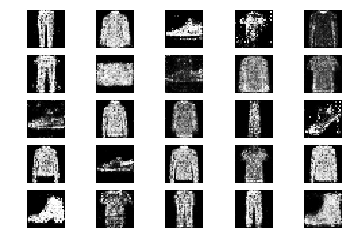

25801 [D loss: 0.654843, acc.: 65.62%] [G loss: 0.903845]
25802 [D loss: 0.600083, acc.: 68.75%] [G loss: 0.977383]
25803 [D loss: 0.568658, acc.: 71.88%] [G loss: 0.916715]
25804 [D loss: 0.658565, acc.: 62.50%] [G loss: 0.974899]
25805 [D loss: 0.586326, acc.: 65.62%] [G loss: 0.907930]
25806 [D loss: 0.616783, acc.: 64.06%] [G loss: 1.068588]
25807 [D loss: 0.645305, acc.: 64.06%] [G loss: 0.938938]
25808 [D loss: 0.602003, acc.: 67.19%] [G loss: 0.948560]
25809 [D loss: 0.674112, acc.: 50.00%] [G loss: 0.906359]
25810 [D loss: 0.668108, acc.: 57.81%] [G loss: 0.858370]
25811 [D loss: 0.677600, acc.: 48.44%] [G loss: 0.990555]
25812 [D loss: 0.620089, acc.: 67.19%] [G loss: 0.983021]
25813 [D loss: 0.653642, acc.: 64.06%] [G loss: 0.945688]
25814 [D loss: 0.580087, acc.: 73.44%] [G loss: 0.977560]
25815 [D loss: 0.696268, acc.: 62.50%] [G loss: 1.008221]
25816 [D loss: 0.714387, acc.: 51.56%] [G loss: 0.912670]
25817 [D loss: 0.634005, acc.: 62.50%] [G loss: 0.940084]
25818 [D loss:

25946 [D loss: 0.577654, acc.: 73.44%] [G loss: 0.889377]
25947 [D loss: 0.616981, acc.: 68.75%] [G loss: 0.999428]
25948 [D loss: 0.615088, acc.: 71.88%] [G loss: 0.847296]
25949 [D loss: 0.698246, acc.: 56.25%] [G loss: 0.946499]
25950 [D loss: 0.630802, acc.: 65.62%] [G loss: 0.880302]
25951 [D loss: 0.667722, acc.: 56.25%] [G loss: 0.955746]
25952 [D loss: 0.637945, acc.: 62.50%] [G loss: 0.931394]
25953 [D loss: 0.591897, acc.: 68.75%] [G loss: 0.907349]
25954 [D loss: 0.629550, acc.: 64.06%] [G loss: 0.899041]
25955 [D loss: 0.751710, acc.: 43.75%] [G loss: 0.842607]
25956 [D loss: 0.657047, acc.: 59.38%] [G loss: 0.871745]
25957 [D loss: 0.615311, acc.: 65.62%] [G loss: 0.948111]
25958 [D loss: 0.618549, acc.: 65.62%] [G loss: 0.893932]
25959 [D loss: 0.619882, acc.: 64.06%] [G loss: 0.942138]
25960 [D loss: 0.614995, acc.: 65.62%] [G loss: 0.916545]
25961 [D loss: 0.625006, acc.: 65.62%] [G loss: 0.906826]
25962 [D loss: 0.720866, acc.: 50.00%] [G loss: 0.888677]
25963 [D loss:

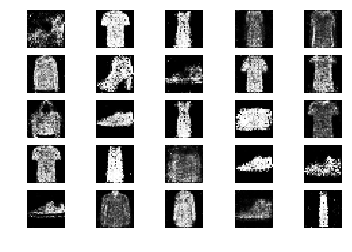

26001 [D loss: 0.707151, acc.: 56.25%] [G loss: 0.889564]
26002 [D loss: 0.679516, acc.: 59.38%] [G loss: 0.845185]
26003 [D loss: 0.709253, acc.: 51.56%] [G loss: 0.962335]
26004 [D loss: 0.603984, acc.: 68.75%] [G loss: 0.969371]
26005 [D loss: 0.765635, acc.: 43.75%] [G loss: 0.924666]
26006 [D loss: 0.631713, acc.: 65.62%] [G loss: 0.826047]
26007 [D loss: 0.700517, acc.: 57.81%] [G loss: 0.884401]
26008 [D loss: 0.682144, acc.: 56.25%] [G loss: 0.973510]
26009 [D loss: 0.661227, acc.: 60.94%] [G loss: 0.984680]
26010 [D loss: 0.596427, acc.: 65.62%] [G loss: 1.090595]
26011 [D loss: 0.621909, acc.: 67.19%] [G loss: 1.051684]
26012 [D loss: 0.661134, acc.: 64.06%] [G loss: 0.898500]
26013 [D loss: 0.715654, acc.: 51.56%] [G loss: 0.890925]
26014 [D loss: 0.661444, acc.: 68.75%] [G loss: 0.924281]
26015 [D loss: 0.635463, acc.: 60.94%] [G loss: 0.897786]
26016 [D loss: 0.671675, acc.: 56.25%] [G loss: 0.845375]
26017 [D loss: 0.652763, acc.: 60.94%] [G loss: 0.982040]
26018 [D loss:

26144 [D loss: 0.567705, acc.: 70.31%] [G loss: 0.882465]
26145 [D loss: 0.608785, acc.: 70.31%] [G loss: 0.999353]
26146 [D loss: 0.629149, acc.: 70.31%] [G loss: 0.908188]
26147 [D loss: 0.567724, acc.: 73.44%] [G loss: 0.892381]
26148 [D loss: 0.662694, acc.: 64.06%] [G loss: 0.947582]
26149 [D loss: 0.680144, acc.: 54.69%] [G loss: 0.928036]
26150 [D loss: 0.666333, acc.: 64.06%] [G loss: 0.991323]
26151 [D loss: 0.589945, acc.: 70.31%] [G loss: 0.978440]
26152 [D loss: 0.713669, acc.: 48.44%] [G loss: 0.953861]
26153 [D loss: 0.626043, acc.: 65.62%] [G loss: 1.003803]
26154 [D loss: 0.671256, acc.: 60.94%] [G loss: 0.932740]
26155 [D loss: 0.679983, acc.: 64.06%] [G loss: 0.870757]
26156 [D loss: 0.583546, acc.: 70.31%] [G loss: 0.949269]
26157 [D loss: 0.649275, acc.: 60.94%] [G loss: 1.035677]
26158 [D loss: 0.617019, acc.: 70.31%] [G loss: 0.984544]
26159 [D loss: 0.636736, acc.: 64.06%] [G loss: 0.892944]
26160 [D loss: 0.675216, acc.: 56.25%] [G loss: 0.868934]
26161 [D loss:

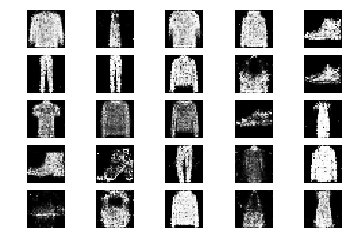

26201 [D loss: 0.568008, acc.: 67.19%] [G loss: 1.040238]
26202 [D loss: 0.598221, acc.: 67.19%] [G loss: 0.987866]
26203 [D loss: 0.620346, acc.: 67.19%] [G loss: 0.993200]
26204 [D loss: 0.603409, acc.: 64.06%] [G loss: 0.936218]
26205 [D loss: 0.603919, acc.: 70.31%] [G loss: 1.043094]
26206 [D loss: 0.578870, acc.: 71.88%] [G loss: 0.945063]
26207 [D loss: 0.596473, acc.: 68.75%] [G loss: 1.019916]
26208 [D loss: 0.629529, acc.: 62.50%] [G loss: 1.089022]
26209 [D loss: 0.648896, acc.: 60.94%] [G loss: 1.014174]
26210 [D loss: 0.694234, acc.: 53.12%] [G loss: 0.862418]
26211 [D loss: 0.697705, acc.: 51.56%] [G loss: 0.895225]
26212 [D loss: 0.606555, acc.: 67.19%] [G loss: 0.899286]
26213 [D loss: 0.695629, acc.: 60.94%] [G loss: 0.948938]
26214 [D loss: 0.693896, acc.: 51.56%] [G loss: 0.883314]
26215 [D loss: 0.579061, acc.: 64.06%] [G loss: 0.900915]
26216 [D loss: 0.682208, acc.: 56.25%] [G loss: 0.887335]
26217 [D loss: 0.658916, acc.: 57.81%] [G loss: 0.927476]
26218 [D loss:

26344 [D loss: 0.687211, acc.: 59.38%] [G loss: 0.997847]
26345 [D loss: 0.624444, acc.: 59.38%] [G loss: 0.962500]
26346 [D loss: 0.631872, acc.: 65.62%] [G loss: 0.868909]
26347 [D loss: 0.620742, acc.: 64.06%] [G loss: 1.005900]
26348 [D loss: 0.659107, acc.: 65.62%] [G loss: 0.964722]
26349 [D loss: 0.646781, acc.: 60.94%] [G loss: 0.939457]
26350 [D loss: 0.626898, acc.: 60.94%] [G loss: 0.804817]
26351 [D loss: 0.647607, acc.: 54.69%] [G loss: 0.978248]
26352 [D loss: 0.576058, acc.: 70.31%] [G loss: 0.877258]
26353 [D loss: 0.680658, acc.: 62.50%] [G loss: 0.947557]
26354 [D loss: 0.589502, acc.: 68.75%] [G loss: 0.957197]
26355 [D loss: 0.626511, acc.: 59.38%] [G loss: 0.937446]
26356 [D loss: 0.606212, acc.: 67.19%] [G loss: 0.993176]
26357 [D loss: 0.711136, acc.: 50.00%] [G loss: 0.987011]
26358 [D loss: 0.603693, acc.: 68.75%] [G loss: 1.026466]
26359 [D loss: 0.579724, acc.: 67.19%] [G loss: 0.923224]
26360 [D loss: 0.678218, acc.: 53.12%] [G loss: 0.934691]
26361 [D loss:

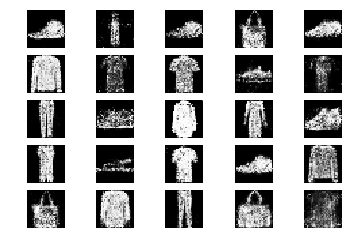

26401 [D loss: 0.598512, acc.: 68.75%] [G loss: 0.977020]
26402 [D loss: 0.623528, acc.: 60.94%] [G loss: 0.975797]
26403 [D loss: 0.635171, acc.: 64.06%] [G loss: 0.891920]
26404 [D loss: 0.654002, acc.: 56.25%] [G loss: 0.879382]
26405 [D loss: 0.658768, acc.: 60.94%] [G loss: 0.893100]
26406 [D loss: 0.608823, acc.: 68.75%] [G loss: 0.987752]
26407 [D loss: 0.641610, acc.: 59.38%] [G loss: 0.885713]
26408 [D loss: 0.642389, acc.: 56.25%] [G loss: 1.079824]
26409 [D loss: 0.694612, acc.: 57.81%] [G loss: 0.959518]
26410 [D loss: 0.619468, acc.: 62.50%] [G loss: 0.992780]
26411 [D loss: 0.610107, acc.: 68.75%] [G loss: 1.002502]
26412 [D loss: 0.633906, acc.: 70.31%] [G loss: 0.931345]
26413 [D loss: 0.580115, acc.: 71.88%] [G loss: 0.966050]
26414 [D loss: 0.620915, acc.: 67.19%] [G loss: 0.949481]
26415 [D loss: 0.651299, acc.: 62.50%] [G loss: 0.966886]
26416 [D loss: 0.593025, acc.: 62.50%] [G loss: 0.996994]
26417 [D loss: 0.615624, acc.: 65.62%] [G loss: 0.800476]
26418 [D loss:

26545 [D loss: 0.683835, acc.: 54.69%] [G loss: 0.942991]
26546 [D loss: 0.616082, acc.: 68.75%] [G loss: 0.927484]
26547 [D loss: 0.657423, acc.: 67.19%] [G loss: 0.979249]
26548 [D loss: 0.714372, acc.: 46.88%] [G loss: 0.976152]
26549 [D loss: 0.591193, acc.: 73.44%] [G loss: 0.989640]
26550 [D loss: 0.630918, acc.: 67.19%] [G loss: 0.972576]
26551 [D loss: 0.640685, acc.: 65.62%] [G loss: 0.934157]
26552 [D loss: 0.636362, acc.: 67.19%] [G loss: 1.035110]
26553 [D loss: 0.591806, acc.: 62.50%] [G loss: 1.059291]
26554 [D loss: 0.641925, acc.: 64.06%] [G loss: 1.001826]
26555 [D loss: 0.646630, acc.: 56.25%] [G loss: 0.949678]
26556 [D loss: 0.655960, acc.: 62.50%] [G loss: 0.896224]
26557 [D loss: 0.573457, acc.: 70.31%] [G loss: 1.001650]
26558 [D loss: 0.582312, acc.: 75.00%] [G loss: 0.936544]
26559 [D loss: 0.601240, acc.: 70.31%] [G loss: 0.977360]
26560 [D loss: 0.655251, acc.: 65.62%] [G loss: 0.942949]
26561 [D loss: 0.603874, acc.: 65.62%] [G loss: 0.974251]
26562 [D loss:

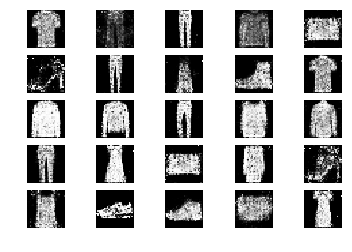

26601 [D loss: 0.637393, acc.: 65.62%] [G loss: 0.937245]
26602 [D loss: 0.647946, acc.: 64.06%] [G loss: 0.879019]
26603 [D loss: 0.629961, acc.: 59.38%] [G loss: 0.900072]
26604 [D loss: 0.687694, acc.: 56.25%] [G loss: 0.919640]
26605 [D loss: 0.598530, acc.: 62.50%] [G loss: 1.068762]
26606 [D loss: 0.650617, acc.: 59.38%] [G loss: 1.015970]
26607 [D loss: 0.612276, acc.: 65.62%] [G loss: 1.055840]
26608 [D loss: 0.682782, acc.: 53.12%] [G loss: 1.029687]
26609 [D loss: 0.633019, acc.: 71.88%] [G loss: 1.051738]
26610 [D loss: 0.616242, acc.: 65.62%] [G loss: 0.905324]
26611 [D loss: 0.598253, acc.: 68.75%] [G loss: 0.975700]
26612 [D loss: 0.625020, acc.: 64.06%] [G loss: 0.863185]
26613 [D loss: 0.629863, acc.: 62.50%] [G loss: 0.943024]
26614 [D loss: 0.655037, acc.: 57.81%] [G loss: 0.952142]
26615 [D loss: 0.647325, acc.: 59.38%] [G loss: 0.983915]
26616 [D loss: 0.647477, acc.: 67.19%] [G loss: 0.886615]
26617 [D loss: 0.720283, acc.: 54.69%] [G loss: 1.150474]
26618 [D loss:

26742 [D loss: 0.654649, acc.: 57.81%] [G loss: 0.895670]
26743 [D loss: 0.623479, acc.: 70.31%] [G loss: 0.935290]
26744 [D loss: 0.629133, acc.: 67.19%] [G loss: 0.952492]
26745 [D loss: 0.691515, acc.: 54.69%] [G loss: 0.842394]
26746 [D loss: 0.586266, acc.: 65.62%] [G loss: 0.972340]
26747 [D loss: 0.621032, acc.: 68.75%] [G loss: 0.916589]
26748 [D loss: 0.571793, acc.: 73.44%] [G loss: 1.027665]
26749 [D loss: 0.637597, acc.: 64.06%] [G loss: 0.979059]
26750 [D loss: 0.680425, acc.: 59.38%] [G loss: 0.955709]
26751 [D loss: 0.627160, acc.: 70.31%] [G loss: 0.969105]
26752 [D loss: 0.589653, acc.: 68.75%] [G loss: 1.023584]
26753 [D loss: 0.688917, acc.: 57.81%] [G loss: 0.980211]
26754 [D loss: 0.646273, acc.: 68.75%] [G loss: 1.043433]
26755 [D loss: 0.700424, acc.: 60.94%] [G loss: 0.937821]
26756 [D loss: 0.680897, acc.: 59.38%] [G loss: 0.971819]
26757 [D loss: 0.637708, acc.: 64.06%] [G loss: 1.019219]
26758 [D loss: 0.567941, acc.: 70.31%] [G loss: 1.008138]
26759 [D loss:

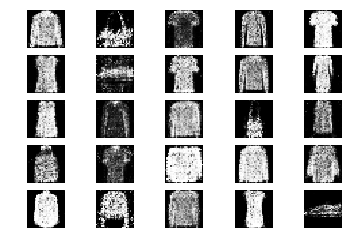

26801 [D loss: 0.608868, acc.: 65.62%] [G loss: 0.903356]
26802 [D loss: 0.629548, acc.: 67.19%] [G loss: 0.967335]
26803 [D loss: 0.694901, acc.: 53.12%] [G loss: 0.983893]
26804 [D loss: 0.636713, acc.: 62.50%] [G loss: 1.025937]
26805 [D loss: 0.607488, acc.: 60.94%] [G loss: 0.957887]
26806 [D loss: 0.688000, acc.: 54.69%] [G loss: 0.853206]
26807 [D loss: 0.641833, acc.: 59.38%] [G loss: 0.943631]
26808 [D loss: 0.582934, acc.: 65.62%] [G loss: 0.954223]
26809 [D loss: 0.691803, acc.: 53.12%] [G loss: 0.882249]
26810 [D loss: 0.636427, acc.: 60.94%] [G loss: 0.932650]
26811 [D loss: 0.610120, acc.: 59.38%] [G loss: 0.947499]
26812 [D loss: 0.657349, acc.: 59.38%] [G loss: 0.991171]
26813 [D loss: 0.599337, acc.: 67.19%] [G loss: 0.971844]
26814 [D loss: 0.757722, acc.: 43.75%] [G loss: 1.016766]
26815 [D loss: 0.653233, acc.: 65.62%] [G loss: 0.966800]
26816 [D loss: 0.675410, acc.: 59.38%] [G loss: 0.918824]
26817 [D loss: 0.671069, acc.: 59.38%] [G loss: 0.992818]
26818 [D loss:

26946 [D loss: 0.572695, acc.: 68.75%] [G loss: 0.908548]
26947 [D loss: 0.645247, acc.: 62.50%] [G loss: 0.928762]
26948 [D loss: 0.718487, acc.: 50.00%] [G loss: 0.904908]
26949 [D loss: 0.639514, acc.: 64.06%] [G loss: 0.987286]
26950 [D loss: 0.676840, acc.: 53.12%] [G loss: 0.895745]
26951 [D loss: 0.626371, acc.: 64.06%] [G loss: 0.873879]
26952 [D loss: 0.606996, acc.: 70.31%] [G loss: 0.953237]
26953 [D loss: 0.596412, acc.: 65.62%] [G loss: 0.981717]
26954 [D loss: 0.658877, acc.: 53.12%] [G loss: 1.024948]
26955 [D loss: 0.565064, acc.: 78.12%] [G loss: 0.944885]
26956 [D loss: 0.636955, acc.: 53.12%] [G loss: 0.979015]
26957 [D loss: 0.644967, acc.: 57.81%] [G loss: 0.975080]
26958 [D loss: 0.716374, acc.: 56.25%] [G loss: 0.920188]
26959 [D loss: 0.647187, acc.: 64.06%] [G loss: 0.839245]
26960 [D loss: 0.579685, acc.: 64.06%] [G loss: 0.829042]
26961 [D loss: 0.591000, acc.: 73.44%] [G loss: 0.770890]
26962 [D loss: 0.619350, acc.: 57.81%] [G loss: 0.954208]
26963 [D loss:

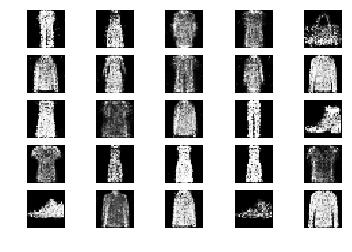

27001 [D loss: 0.653446, acc.: 65.62%] [G loss: 0.902539]
27002 [D loss: 0.588031, acc.: 68.75%] [G loss: 1.018020]
27003 [D loss: 0.602945, acc.: 68.75%] [G loss: 0.929337]
27004 [D loss: 0.622987, acc.: 68.75%] [G loss: 1.086209]
27005 [D loss: 0.675288, acc.: 57.81%] [G loss: 0.957625]
27006 [D loss: 0.657004, acc.: 59.38%] [G loss: 1.002067]
27007 [D loss: 0.574932, acc.: 70.31%] [G loss: 0.872026]
27008 [D loss: 0.600174, acc.: 67.19%] [G loss: 0.892192]
27009 [D loss: 0.678099, acc.: 53.12%] [G loss: 0.914990]
27010 [D loss: 0.652915, acc.: 59.38%] [G loss: 0.896196]
27011 [D loss: 0.639063, acc.: 56.25%] [G loss: 1.007267]
27012 [D loss: 0.657057, acc.: 59.38%] [G loss: 0.971960]
27013 [D loss: 0.562953, acc.: 71.88%] [G loss: 0.999016]
27014 [D loss: 0.672493, acc.: 53.12%] [G loss: 1.013129]
27015 [D loss: 0.704588, acc.: 56.25%] [G loss: 0.947619]
27016 [D loss: 0.688505, acc.: 50.00%] [G loss: 0.969720]
27017 [D loss: 0.636373, acc.: 59.38%] [G loss: 0.971254]
27018 [D loss:

27143 [D loss: 0.685802, acc.: 54.69%] [G loss: 0.895361]
27144 [D loss: 0.616195, acc.: 64.06%] [G loss: 0.937103]
27145 [D loss: 0.616787, acc.: 67.19%] [G loss: 0.977440]
27146 [D loss: 0.569808, acc.: 71.88%] [G loss: 0.869867]
27147 [D loss: 0.589977, acc.: 64.06%] [G loss: 0.957859]
27148 [D loss: 0.631820, acc.: 62.50%] [G loss: 0.898308]
27149 [D loss: 0.702612, acc.: 53.12%] [G loss: 0.987675]
27150 [D loss: 0.565449, acc.: 75.00%] [G loss: 1.064038]
27151 [D loss: 0.591279, acc.: 68.75%] [G loss: 0.976650]
27152 [D loss: 0.599390, acc.: 67.19%] [G loss: 0.970221]
27153 [D loss: 0.630601, acc.: 65.62%] [G loss: 0.987116]
27154 [D loss: 0.565158, acc.: 73.44%] [G loss: 1.002239]
27155 [D loss: 0.692921, acc.: 56.25%] [G loss: 0.872596]
27156 [D loss: 0.641957, acc.: 67.19%] [G loss: 0.946099]
27157 [D loss: 0.640844, acc.: 59.38%] [G loss: 0.924668]
27158 [D loss: 0.665915, acc.: 60.94%] [G loss: 0.944593]
27159 [D loss: 0.637651, acc.: 57.81%] [G loss: 1.008403]
27160 [D loss:

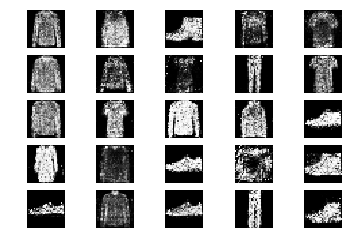

27201 [D loss: 0.700444, acc.: 56.25%] [G loss: 1.003330]
27202 [D loss: 0.627461, acc.: 62.50%] [G loss: 0.961240]
27203 [D loss: 0.679137, acc.: 62.50%] [G loss: 0.869808]
27204 [D loss: 0.702238, acc.: 50.00%] [G loss: 0.944641]
27205 [D loss: 0.604890, acc.: 65.62%] [G loss: 0.966860]
27206 [D loss: 0.598748, acc.: 65.62%] [G loss: 1.029772]
27207 [D loss: 0.675137, acc.: 56.25%] [G loss: 0.985393]
27208 [D loss: 0.590956, acc.: 68.75%] [G loss: 1.013523]
27209 [D loss: 0.610214, acc.: 68.75%] [G loss: 0.975579]
27210 [D loss: 0.669582, acc.: 67.19%] [G loss: 0.856403]
27211 [D loss: 0.611406, acc.: 64.06%] [G loss: 0.988920]
27212 [D loss: 0.646156, acc.: 62.50%] [G loss: 1.034028]
27213 [D loss: 0.594908, acc.: 71.88%] [G loss: 0.995747]
27214 [D loss: 0.674952, acc.: 60.94%] [G loss: 0.834310]
27215 [D loss: 0.603988, acc.: 64.06%] [G loss: 0.988550]
27216 [D loss: 0.617448, acc.: 71.88%] [G loss: 0.963922]
27217 [D loss: 0.640265, acc.: 67.19%] [G loss: 0.976336]
27218 [D loss:

27344 [D loss: 0.692535, acc.: 67.19%] [G loss: 0.943265]
27345 [D loss: 0.651892, acc.: 64.06%] [G loss: 0.978170]
27346 [D loss: 0.593495, acc.: 70.31%] [G loss: 0.947698]
27347 [D loss: 0.626667, acc.: 67.19%] [G loss: 0.955411]
27348 [D loss: 0.639104, acc.: 56.25%] [G loss: 0.892846]
27349 [D loss: 0.651680, acc.: 65.62%] [G loss: 0.872779]
27350 [D loss: 0.662940, acc.: 60.94%] [G loss: 0.860423]
27351 [D loss: 0.693094, acc.: 60.94%] [G loss: 0.986345]
27352 [D loss: 0.646793, acc.: 57.81%] [G loss: 0.916799]
27353 [D loss: 0.583131, acc.: 68.75%] [G loss: 1.092316]
27354 [D loss: 0.564590, acc.: 70.31%] [G loss: 1.021924]
27355 [D loss: 0.559023, acc.: 70.31%] [G loss: 1.060385]
27356 [D loss: 0.748954, acc.: 57.81%] [G loss: 0.974087]
27357 [D loss: 0.621274, acc.: 60.94%] [G loss: 0.994301]
27358 [D loss: 0.635929, acc.: 67.19%] [G loss: 1.005235]
27359 [D loss: 0.657047, acc.: 59.38%] [G loss: 0.952427]
27360 [D loss: 0.636787, acc.: 65.62%] [G loss: 0.949367]
27361 [D loss:

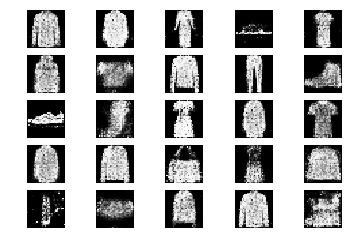

27401 [D loss: 0.572728, acc.: 73.44%] [G loss: 0.970127]
27402 [D loss: 0.610405, acc.: 65.62%] [G loss: 0.967430]
27403 [D loss: 0.686995, acc.: 59.38%] [G loss: 0.944559]
27404 [D loss: 0.643229, acc.: 62.50%] [G loss: 1.073637]
27405 [D loss: 0.676959, acc.: 60.94%] [G loss: 0.951373]
27406 [D loss: 0.686727, acc.: 50.00%] [G loss: 0.958293]
27407 [D loss: 0.720618, acc.: 53.12%] [G loss: 0.915004]
27408 [D loss: 0.654470, acc.: 51.56%] [G loss: 0.956074]
27409 [D loss: 0.711141, acc.: 48.44%] [G loss: 0.955380]
27410 [D loss: 0.596398, acc.: 67.19%] [G loss: 0.966139]
27411 [D loss: 0.653167, acc.: 62.50%] [G loss: 0.843786]
27412 [D loss: 0.637161, acc.: 60.94%] [G loss: 0.969570]
27413 [D loss: 0.645671, acc.: 60.94%] [G loss: 0.940069]
27414 [D loss: 0.615616, acc.: 60.94%] [G loss: 0.921541]
27415 [D loss: 0.727944, acc.: 51.56%] [G loss: 0.900535]
27416 [D loss: 0.622586, acc.: 59.38%] [G loss: 0.894783]
27417 [D loss: 0.611513, acc.: 65.62%] [G loss: 0.900064]
27418 [D loss:

27544 [D loss: 0.592174, acc.: 68.75%] [G loss: 1.078132]
27545 [D loss: 0.642881, acc.: 62.50%] [G loss: 0.984355]
27546 [D loss: 0.595158, acc.: 64.06%] [G loss: 0.955176]
27547 [D loss: 0.710784, acc.: 53.12%] [G loss: 0.924875]
27548 [D loss: 0.597597, acc.: 67.19%] [G loss: 0.939935]
27549 [D loss: 0.596372, acc.: 65.62%] [G loss: 0.896985]
27550 [D loss: 0.631579, acc.: 57.81%] [G loss: 0.963270]
27551 [D loss: 0.607035, acc.: 60.94%] [G loss: 0.933891]
27552 [D loss: 0.718381, acc.: 54.69%] [G loss: 0.820667]
27553 [D loss: 0.628849, acc.: 70.31%] [G loss: 0.940198]
27554 [D loss: 0.578044, acc.: 75.00%] [G loss: 1.012256]
27555 [D loss: 0.627452, acc.: 62.50%] [G loss: 0.911460]
27556 [D loss: 0.586479, acc.: 68.75%] [G loss: 0.998536]
27557 [D loss: 0.585320, acc.: 71.88%] [G loss: 1.095756]
27558 [D loss: 0.676683, acc.: 59.38%] [G loss: 0.890586]
27559 [D loss: 0.574434, acc.: 71.88%] [G loss: 0.980409]
27560 [D loss: 0.565496, acc.: 70.31%] [G loss: 0.894817]
27561 [D loss:

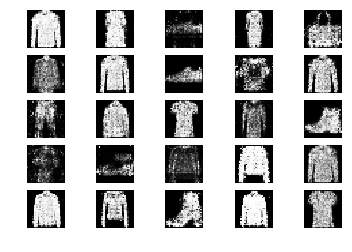

27601 [D loss: 0.656284, acc.: 57.81%] [G loss: 0.983256]
27602 [D loss: 0.708805, acc.: 57.81%] [G loss: 0.927990]
27603 [D loss: 0.573997, acc.: 75.00%] [G loss: 1.017731]
27604 [D loss: 0.601202, acc.: 65.62%] [G loss: 0.941583]
27605 [D loss: 0.739958, acc.: 59.38%] [G loss: 0.956286]
27606 [D loss: 0.631444, acc.: 56.25%] [G loss: 1.005811]
27607 [D loss: 0.625419, acc.: 67.19%] [G loss: 1.005663]
27608 [D loss: 0.707780, acc.: 59.38%] [G loss: 0.948080]
27609 [D loss: 0.614641, acc.: 64.06%] [G loss: 1.028934]
27610 [D loss: 0.673218, acc.: 65.62%] [G loss: 0.928507]
27611 [D loss: 0.608982, acc.: 64.06%] [G loss: 0.954216]
27612 [D loss: 0.584154, acc.: 68.75%] [G loss: 0.908930]
27613 [D loss: 0.655874, acc.: 67.19%] [G loss: 1.019658]
27614 [D loss: 0.693241, acc.: 65.62%] [G loss: 0.918750]
27615 [D loss: 0.700868, acc.: 56.25%] [G loss: 0.922002]
27616 [D loss: 0.635545, acc.: 64.06%] [G loss: 0.955309]
27617 [D loss: 0.654173, acc.: 54.69%] [G loss: 1.015208]
27618 [D loss:

27745 [D loss: 0.690185, acc.: 56.25%] [G loss: 1.089343]
27746 [D loss: 0.607294, acc.: 64.06%] [G loss: 0.892197]
27747 [D loss: 0.600538, acc.: 68.75%] [G loss: 0.930895]
27748 [D loss: 0.651212, acc.: 62.50%] [G loss: 0.964302]
27749 [D loss: 0.623186, acc.: 67.19%] [G loss: 0.846947]
27750 [D loss: 0.688444, acc.: 62.50%] [G loss: 0.929099]
27751 [D loss: 0.626135, acc.: 59.38%] [G loss: 1.020230]
27752 [D loss: 0.723432, acc.: 50.00%] [G loss: 0.923440]
27753 [D loss: 0.677709, acc.: 54.69%] [G loss: 0.941206]
27754 [D loss: 0.748069, acc.: 51.56%] [G loss: 0.926379]
27755 [D loss: 0.680904, acc.: 60.94%] [G loss: 0.970533]
27756 [D loss: 0.652737, acc.: 64.06%] [G loss: 0.927590]
27757 [D loss: 0.640032, acc.: 60.94%] [G loss: 0.878980]
27758 [D loss: 0.657271, acc.: 65.62%] [G loss: 0.944236]
27759 [D loss: 0.596503, acc.: 70.31%] [G loss: 1.014156]
27760 [D loss: 0.624370, acc.: 64.06%] [G loss: 1.020151]
27761 [D loss: 0.620007, acc.: 65.62%] [G loss: 0.862759]
27762 [D loss:

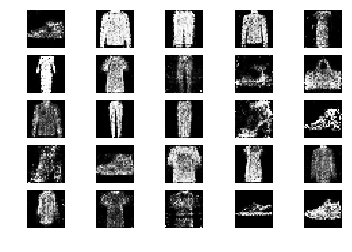

27801 [D loss: 0.598877, acc.: 71.88%] [G loss: 0.982837]
27802 [D loss: 0.569922, acc.: 68.75%] [G loss: 0.903369]
27803 [D loss: 0.649309, acc.: 60.94%] [G loss: 0.922881]
27804 [D loss: 0.653711, acc.: 56.25%] [G loss: 0.901462]
27805 [D loss: 0.644590, acc.: 57.81%] [G loss: 0.952515]
27806 [D loss: 0.586142, acc.: 70.31%] [G loss: 0.872001]
27807 [D loss: 0.634856, acc.: 65.62%] [G loss: 0.911096]
27808 [D loss: 0.621339, acc.: 73.44%] [G loss: 1.023963]
27809 [D loss: 0.589359, acc.: 65.62%] [G loss: 0.974235]
27810 [D loss: 0.661501, acc.: 60.94%] [G loss: 0.965162]
27811 [D loss: 0.698762, acc.: 62.50%] [G loss: 0.989570]
27812 [D loss: 0.677463, acc.: 65.62%] [G loss: 1.047720]
27813 [D loss: 0.596532, acc.: 67.19%] [G loss: 0.953528]
27814 [D loss: 0.602484, acc.: 67.19%] [G loss: 0.909750]
27815 [D loss: 0.587738, acc.: 71.88%] [G loss: 0.925911]
27816 [D loss: 0.575796, acc.: 76.56%] [G loss: 0.950563]
27817 [D loss: 0.575951, acc.: 67.19%] [G loss: 0.965778]
27818 [D loss:

27943 [D loss: 0.637953, acc.: 59.38%] [G loss: 0.918514]
27944 [D loss: 0.642879, acc.: 59.38%] [G loss: 1.006007]
27945 [D loss: 0.633377, acc.: 68.75%] [G loss: 1.024768]
27946 [D loss: 0.750084, acc.: 39.06%] [G loss: 0.961833]
27947 [D loss: 0.649894, acc.: 57.81%] [G loss: 0.954681]
27948 [D loss: 0.669328, acc.: 65.62%] [G loss: 0.975716]
27949 [D loss: 0.598967, acc.: 67.19%] [G loss: 1.031127]
27950 [D loss: 0.574167, acc.: 70.31%] [G loss: 0.874328]
27951 [D loss: 0.600152, acc.: 68.75%] [G loss: 0.992636]
27952 [D loss: 0.585932, acc.: 67.19%] [G loss: 0.880943]
27953 [D loss: 0.621254, acc.: 68.75%] [G loss: 0.956857]
27954 [D loss: 0.614082, acc.: 68.75%] [G loss: 1.071423]
27955 [D loss: 0.690970, acc.: 50.00%] [G loss: 1.050249]
27956 [D loss: 0.600785, acc.: 67.19%] [G loss: 0.938464]
27957 [D loss: 0.651608, acc.: 62.50%] [G loss: 0.942069]
27958 [D loss: 0.622602, acc.: 65.62%] [G loss: 0.917485]
27959 [D loss: 0.637216, acc.: 65.62%] [G loss: 1.007923]
27960 [D loss:

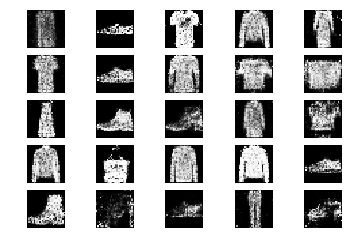

28001 [D loss: 0.740560, acc.: 53.12%] [G loss: 0.998431]
28002 [D loss: 0.640218, acc.: 64.06%] [G loss: 0.987197]
28003 [D loss: 0.604600, acc.: 65.62%] [G loss: 1.026929]
28004 [D loss: 0.711410, acc.: 60.94%] [G loss: 0.923092]
28005 [D loss: 0.644228, acc.: 59.38%] [G loss: 0.913774]
28006 [D loss: 0.582375, acc.: 70.31%] [G loss: 0.962525]
28007 [D loss: 0.672645, acc.: 56.25%] [G loss: 0.994046]
28008 [D loss: 0.676115, acc.: 60.94%] [G loss: 1.036214]
28009 [D loss: 0.654966, acc.: 56.25%] [G loss: 0.958962]
28010 [D loss: 0.652189, acc.: 62.50%] [G loss: 0.943644]
28011 [D loss: 0.608801, acc.: 68.75%] [G loss: 1.003511]
28012 [D loss: 0.646915, acc.: 70.31%] [G loss: 0.956207]
28013 [D loss: 0.605549, acc.: 67.19%] [G loss: 1.006154]
28014 [D loss: 0.644097, acc.: 64.06%] [G loss: 0.943111]
28015 [D loss: 0.623078, acc.: 65.62%] [G loss: 0.994341]
28016 [D loss: 0.641850, acc.: 65.62%] [G loss: 0.876364]
28017 [D loss: 0.567621, acc.: 68.75%] [G loss: 0.924169]
28018 [D loss:

28143 [D loss: 0.659463, acc.: 57.81%] [G loss: 0.930219]
28144 [D loss: 0.614481, acc.: 62.50%] [G loss: 0.947654]
28145 [D loss: 0.624018, acc.: 62.50%] [G loss: 1.002821]
28146 [D loss: 0.673843, acc.: 62.50%] [G loss: 0.937986]
28147 [D loss: 0.587005, acc.: 65.62%] [G loss: 1.030009]
28148 [D loss: 0.585540, acc.: 64.06%] [G loss: 0.900919]
28149 [D loss: 0.630880, acc.: 65.62%] [G loss: 0.941079]
28150 [D loss: 0.618975, acc.: 70.31%] [G loss: 0.917310]
28151 [D loss: 0.629935, acc.: 62.50%] [G loss: 0.884926]
28152 [D loss: 0.633007, acc.: 60.94%] [G loss: 0.901391]
28153 [D loss: 0.660967, acc.: 43.75%] [G loss: 0.880696]
28154 [D loss: 0.693936, acc.: 59.38%] [G loss: 0.999995]
28155 [D loss: 0.585022, acc.: 71.88%] [G loss: 0.950334]
28156 [D loss: 0.756342, acc.: 54.69%] [G loss: 0.984051]
28157 [D loss: 0.590677, acc.: 73.44%] [G loss: 0.960729]
28158 [D loss: 0.557729, acc.: 76.56%] [G loss: 0.986283]
28159 [D loss: 0.740564, acc.: 46.88%] [G loss: 0.896533]
28160 [D loss:

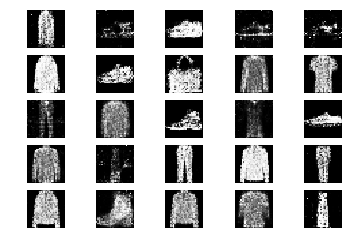

28201 [D loss: 0.652308, acc.: 59.38%] [G loss: 0.941952]
28202 [D loss: 0.642338, acc.: 65.62%] [G loss: 0.983520]
28203 [D loss: 0.673157, acc.: 64.06%] [G loss: 0.896043]
28204 [D loss: 0.700808, acc.: 57.81%] [G loss: 0.915796]
28205 [D loss: 0.666890, acc.: 68.75%] [G loss: 0.910173]
28206 [D loss: 0.710151, acc.: 51.56%] [G loss: 0.833288]
28207 [D loss: 0.664411, acc.: 54.69%] [G loss: 0.972465]
28208 [D loss: 0.616595, acc.: 67.19%] [G loss: 0.971358]
28209 [D loss: 0.610913, acc.: 59.38%] [G loss: 0.930448]
28210 [D loss: 0.604353, acc.: 68.75%] [G loss: 1.016647]
28211 [D loss: 0.633666, acc.: 64.06%] [G loss: 0.915204]
28212 [D loss: 0.606857, acc.: 70.31%] [G loss: 0.922972]
28213 [D loss: 0.650136, acc.: 59.38%] [G loss: 0.817248]
28214 [D loss: 0.738910, acc.: 62.50%] [G loss: 0.945158]
28215 [D loss: 0.612396, acc.: 67.19%] [G loss: 0.979531]
28216 [D loss: 0.602981, acc.: 67.19%] [G loss: 0.886447]
28217 [D loss: 0.672800, acc.: 64.06%] [G loss: 0.948721]
28218 [D loss:

28344 [D loss: 0.623492, acc.: 67.19%] [G loss: 0.853308]
28345 [D loss: 0.602106, acc.: 67.19%] [G loss: 0.900254]
28346 [D loss: 0.658202, acc.: 56.25%] [G loss: 0.892112]
28347 [D loss: 0.584631, acc.: 75.00%] [G loss: 0.963993]
28348 [D loss: 0.623801, acc.: 62.50%] [G loss: 0.896827]
28349 [D loss: 0.599580, acc.: 70.31%] [G loss: 0.885483]
28350 [D loss: 0.635992, acc.: 57.81%] [G loss: 0.924143]
28351 [D loss: 0.647549, acc.: 62.50%] [G loss: 0.871201]
28352 [D loss: 0.658002, acc.: 64.06%] [G loss: 0.884850]
28353 [D loss: 0.708168, acc.: 48.44%] [G loss: 0.996108]
28354 [D loss: 0.630473, acc.: 64.06%] [G loss: 0.955214]
28355 [D loss: 0.700416, acc.: 53.12%] [G loss: 0.982311]
28356 [D loss: 0.687524, acc.: 57.81%] [G loss: 0.926713]
28357 [D loss: 0.713621, acc.: 48.44%] [G loss: 1.014572]
28358 [D loss: 0.716279, acc.: 53.12%] [G loss: 0.968520]
28359 [D loss: 0.644813, acc.: 56.25%] [G loss: 0.902836]
28360 [D loss: 0.706066, acc.: 56.25%] [G loss: 0.949133]
28361 [D loss:

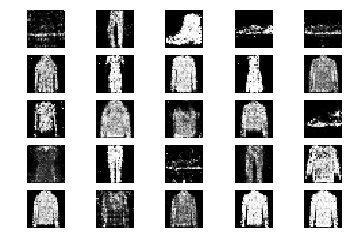

28401 [D loss: 0.677054, acc.: 57.81%] [G loss: 0.929700]
28402 [D loss: 0.608550, acc.: 67.19%] [G loss: 0.978351]
28403 [D loss: 0.679638, acc.: 60.94%] [G loss: 1.031454]
28404 [D loss: 0.642309, acc.: 62.50%] [G loss: 0.924325]
28405 [D loss: 0.700266, acc.: 64.06%] [G loss: 0.884755]
28406 [D loss: 0.661716, acc.: 62.50%] [G loss: 0.874954]
28407 [D loss: 0.552777, acc.: 76.56%] [G loss: 0.958501]
28408 [D loss: 0.654402, acc.: 60.94%] [G loss: 0.961299]
28409 [D loss: 0.637461, acc.: 64.06%] [G loss: 0.879324]
28410 [D loss: 0.638329, acc.: 68.75%] [G loss: 0.998672]
28411 [D loss: 0.560800, acc.: 79.69%] [G loss: 0.976496]
28412 [D loss: 0.651036, acc.: 64.06%] [G loss: 0.925421]
28413 [D loss: 0.607374, acc.: 64.06%] [G loss: 1.001253]
28414 [D loss: 0.697910, acc.: 46.88%] [G loss: 0.861962]
28415 [D loss: 0.635571, acc.: 64.06%] [G loss: 0.870769]
28416 [D loss: 0.616092, acc.: 67.19%] [G loss: 0.881147]
28417 [D loss: 0.658261, acc.: 67.19%] [G loss: 0.891896]
28418 [D loss:

28544 [D loss: 0.758339, acc.: 46.88%] [G loss: 0.816697]
28545 [D loss: 0.675227, acc.: 54.69%] [G loss: 0.914641]
28546 [D loss: 0.572565, acc.: 71.88%] [G loss: 0.963255]
28547 [D loss: 0.648514, acc.: 62.50%] [G loss: 0.914214]
28548 [D loss: 0.565890, acc.: 76.56%] [G loss: 1.032565]
28549 [D loss: 0.607415, acc.: 67.19%] [G loss: 1.034014]
28550 [D loss: 0.670249, acc.: 53.12%] [G loss: 0.976352]
28551 [D loss: 0.654755, acc.: 60.94%] [G loss: 1.011485]
28552 [D loss: 0.597944, acc.: 67.19%] [G loss: 1.000331]
28553 [D loss: 0.711016, acc.: 51.56%] [G loss: 0.948904]
28554 [D loss: 0.644209, acc.: 62.50%] [G loss: 0.932400]
28555 [D loss: 0.646604, acc.: 56.25%] [G loss: 0.998298]
28556 [D loss: 0.615763, acc.: 57.81%] [G loss: 1.034682]
28557 [D loss: 0.705795, acc.: 56.25%] [G loss: 0.928396]
28558 [D loss: 0.645253, acc.: 62.50%] [G loss: 0.956396]
28559 [D loss: 0.608597, acc.: 73.44%] [G loss: 0.931011]
28560 [D loss: 0.623976, acc.: 65.62%] [G loss: 1.103936]
28561 [D loss:

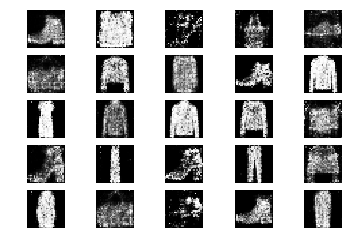

28601 [D loss: 0.623627, acc.: 62.50%] [G loss: 0.847903]
28602 [D loss: 0.686815, acc.: 62.50%] [G loss: 0.919892]
28603 [D loss: 0.658751, acc.: 64.06%] [G loss: 0.912410]
28604 [D loss: 0.673159, acc.: 53.12%] [G loss: 0.958068]
28605 [D loss: 0.682008, acc.: 60.94%] [G loss: 0.939370]
28606 [D loss: 0.635686, acc.: 59.38%] [G loss: 0.902261]
28607 [D loss: 0.680795, acc.: 60.94%] [G loss: 0.978485]
28608 [D loss: 0.601165, acc.: 75.00%] [G loss: 0.864126]
28609 [D loss: 0.652870, acc.: 59.38%] [G loss: 0.927214]
28610 [D loss: 0.677658, acc.: 57.81%] [G loss: 0.948065]
28611 [D loss: 0.599463, acc.: 65.62%] [G loss: 0.999063]
28612 [D loss: 0.688396, acc.: 56.25%] [G loss: 0.988605]
28613 [D loss: 0.672184, acc.: 56.25%] [G loss: 0.909251]
28614 [D loss: 0.677613, acc.: 62.50%] [G loss: 0.995082]
28615 [D loss: 0.598479, acc.: 68.75%] [G loss: 0.892672]
28616 [D loss: 0.630365, acc.: 59.38%] [G loss: 0.880955]
28617 [D loss: 0.568836, acc.: 73.44%] [G loss: 0.912041]
28618 [D loss:

28744 [D loss: 0.612908, acc.: 64.06%] [G loss: 0.955799]
28745 [D loss: 0.682165, acc.: 53.12%] [G loss: 0.908249]
28746 [D loss: 0.640048, acc.: 64.06%] [G loss: 0.997579]
28747 [D loss: 0.625080, acc.: 68.75%] [G loss: 0.967671]
28748 [D loss: 0.653763, acc.: 60.94%] [G loss: 0.943699]
28749 [D loss: 0.700075, acc.: 56.25%] [G loss: 0.985953]
28750 [D loss: 0.610715, acc.: 67.19%] [G loss: 0.997532]
28751 [D loss: 0.635083, acc.: 64.06%] [G loss: 0.942946]
28752 [D loss: 0.676507, acc.: 57.81%] [G loss: 0.988334]
28753 [D loss: 0.651519, acc.: 62.50%] [G loss: 0.893781]
28754 [D loss: 0.580387, acc.: 73.44%] [G loss: 0.868186]
28755 [D loss: 0.642128, acc.: 57.81%] [G loss: 1.000603]
28756 [D loss: 0.563151, acc.: 67.19%] [G loss: 0.970615]
28757 [D loss: 0.551716, acc.: 71.88%] [G loss: 0.862888]
28758 [D loss: 0.718031, acc.: 45.31%] [G loss: 0.944349]
28759 [D loss: 0.686504, acc.: 62.50%] [G loss: 0.843687]
28760 [D loss: 0.598808, acc.: 59.38%] [G loss: 0.987305]
28761 [D loss:

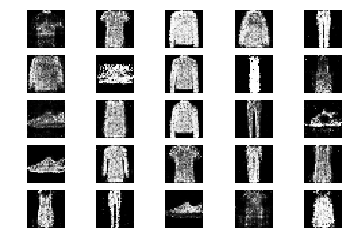

28801 [D loss: 0.648572, acc.: 57.81%] [G loss: 0.933745]
28802 [D loss: 0.612199, acc.: 64.06%] [G loss: 1.083876]
28803 [D loss: 0.690336, acc.: 54.69%] [G loss: 0.917283]
28804 [D loss: 0.635008, acc.: 60.94%] [G loss: 1.031904]
28805 [D loss: 0.650069, acc.: 59.38%] [G loss: 0.973161]
28806 [D loss: 0.691684, acc.: 56.25%] [G loss: 0.930530]
28807 [D loss: 0.678090, acc.: 59.38%] [G loss: 0.935801]
28808 [D loss: 0.599132, acc.: 64.06%] [G loss: 0.946845]
28809 [D loss: 0.687263, acc.: 53.12%] [G loss: 0.940182]
28810 [D loss: 0.661683, acc.: 65.62%] [G loss: 0.926074]
28811 [D loss: 0.702110, acc.: 51.56%] [G loss: 0.934742]
28812 [D loss: 0.626499, acc.: 59.38%] [G loss: 0.954719]
28813 [D loss: 0.624314, acc.: 62.50%] [G loss: 0.990164]
28814 [D loss: 0.577520, acc.: 65.62%] [G loss: 1.022250]
28815 [D loss: 0.687324, acc.: 54.69%] [G loss: 0.811174]
28816 [D loss: 0.697365, acc.: 54.69%] [G loss: 1.046153]
28817 [D loss: 0.590797, acc.: 67.19%] [G loss: 0.925473]
28818 [D loss:

28943 [D loss: 0.699449, acc.: 54.69%] [G loss: 0.911243]
28944 [D loss: 0.611478, acc.: 67.19%] [G loss: 1.010106]
28945 [D loss: 0.576851, acc.: 68.75%] [G loss: 0.844728]
28946 [D loss: 0.622602, acc.: 64.06%] [G loss: 0.952305]
28947 [D loss: 0.639755, acc.: 62.50%] [G loss: 0.874720]
28948 [D loss: 0.682629, acc.: 60.94%] [G loss: 0.860288]
28949 [D loss: 0.579725, acc.: 65.62%] [G loss: 0.809991]
28950 [D loss: 0.678727, acc.: 53.12%] [G loss: 0.953768]
28951 [D loss: 0.596115, acc.: 75.00%] [G loss: 0.982911]
28952 [D loss: 0.672756, acc.: 60.94%] [G loss: 1.007908]
28953 [D loss: 0.644801, acc.: 57.81%] [G loss: 1.005562]
28954 [D loss: 0.699656, acc.: 59.38%] [G loss: 0.973173]
28955 [D loss: 0.580714, acc.: 73.44%] [G loss: 0.974179]
28956 [D loss: 0.639613, acc.: 59.38%] [G loss: 0.872455]
28957 [D loss: 0.632429, acc.: 60.94%] [G loss: 0.986964]
28958 [D loss: 0.662252, acc.: 59.38%] [G loss: 0.895125]
28959 [D loss: 0.658891, acc.: 64.06%] [G loss: 0.875386]
28960 [D loss:

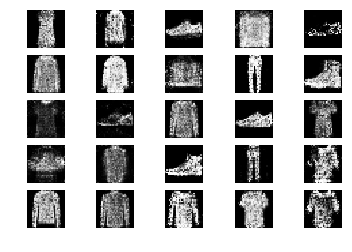

29001 [D loss: 0.632815, acc.: 60.94%] [G loss: 0.956502]
29002 [D loss: 0.621881, acc.: 59.38%] [G loss: 0.909230]
29003 [D loss: 0.654131, acc.: 64.06%] [G loss: 1.044764]
29004 [D loss: 0.547814, acc.: 78.12%] [G loss: 1.026467]
29005 [D loss: 0.621911, acc.: 59.38%] [G loss: 0.988406]
29006 [D loss: 0.705611, acc.: 53.12%] [G loss: 0.978115]
29007 [D loss: 0.589686, acc.: 60.94%] [G loss: 0.869244]
29008 [D loss: 0.626969, acc.: 68.75%] [G loss: 1.021372]
29009 [D loss: 0.628164, acc.: 64.06%] [G loss: 0.940134]
29010 [D loss: 0.655195, acc.: 64.06%] [G loss: 1.022385]
29011 [D loss: 0.658151, acc.: 64.06%] [G loss: 0.937640]
29012 [D loss: 0.664687, acc.: 59.38%] [G loss: 0.825349]
29013 [D loss: 0.618716, acc.: 64.06%] [G loss: 0.951662]
29014 [D loss: 0.665521, acc.: 64.06%] [G loss: 0.941881]
29015 [D loss: 0.662818, acc.: 64.06%] [G loss: 1.018800]
29016 [D loss: 0.609988, acc.: 70.31%] [G loss: 0.981855]
29017 [D loss: 0.647006, acc.: 57.81%] [G loss: 0.985116]
29018 [D loss:

29143 [D loss: 0.671656, acc.: 56.25%] [G loss: 0.977647]
29144 [D loss: 0.664894, acc.: 62.50%] [G loss: 0.934118]
29145 [D loss: 0.657785, acc.: 53.12%] [G loss: 0.924151]
29146 [D loss: 0.601380, acc.: 71.88%] [G loss: 0.914344]
29147 [D loss: 0.677156, acc.: 54.69%] [G loss: 0.925761]
29148 [D loss: 0.680858, acc.: 60.94%] [G loss: 0.976879]
29149 [D loss: 0.621589, acc.: 64.06%] [G loss: 0.931352]
29150 [D loss: 0.675887, acc.: 60.94%] [G loss: 0.881392]
29151 [D loss: 0.643556, acc.: 60.94%] [G loss: 0.963719]
29152 [D loss: 0.571257, acc.: 73.44%] [G loss: 0.837295]
29153 [D loss: 0.679358, acc.: 56.25%] [G loss: 0.922372]
29154 [D loss: 0.691739, acc.: 48.44%] [G loss: 0.891680]
29155 [D loss: 0.665897, acc.: 59.38%] [G loss: 0.932717]
29156 [D loss: 0.623167, acc.: 65.62%] [G loss: 0.970424]
29157 [D loss: 0.708158, acc.: 57.81%] [G loss: 0.971411]
29158 [D loss: 0.634311, acc.: 64.06%] [G loss: 0.918166]
29159 [D loss: 0.651210, acc.: 60.94%] [G loss: 0.926440]
29160 [D loss:

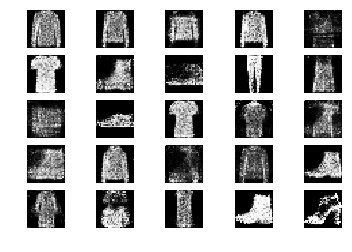

29201 [D loss: 0.603546, acc.: 65.62%] [G loss: 0.931388]
29202 [D loss: 0.590921, acc.: 71.88%] [G loss: 0.929357]
29203 [D loss: 0.650371, acc.: 60.94%] [G loss: 0.916509]
29204 [D loss: 0.608645, acc.: 65.62%] [G loss: 0.874082]
29205 [D loss: 0.657460, acc.: 60.94%] [G loss: 0.977739]
29206 [D loss: 0.674587, acc.: 53.12%] [G loss: 0.920636]
29207 [D loss: 0.612467, acc.: 62.50%] [G loss: 0.953641]
29208 [D loss: 0.684083, acc.: 59.38%] [G loss: 0.886459]
29209 [D loss: 0.645008, acc.: 59.38%] [G loss: 0.933211]
29210 [D loss: 0.644977, acc.: 62.50%] [G loss: 0.904283]
29211 [D loss: 0.663113, acc.: 59.38%] [G loss: 1.005295]
29212 [D loss: 0.664119, acc.: 59.38%] [G loss: 0.959376]
29213 [D loss: 0.707071, acc.: 48.44%] [G loss: 0.954936]
29214 [D loss: 0.651944, acc.: 60.94%] [G loss: 0.968144]
29215 [D loss: 0.583006, acc.: 71.88%] [G loss: 1.018466]
29216 [D loss: 0.750690, acc.: 51.56%] [G loss: 0.935089]
29217 [D loss: 0.653646, acc.: 68.75%] [G loss: 0.897113]
29218 [D loss:

29344 [D loss: 0.556901, acc.: 71.88%] [G loss: 0.982209]
29345 [D loss: 0.575903, acc.: 73.44%] [G loss: 0.905092]
29346 [D loss: 0.705789, acc.: 62.50%] [G loss: 1.016437]
29347 [D loss: 0.579116, acc.: 73.44%] [G loss: 0.840845]
29348 [D loss: 0.711532, acc.: 48.44%] [G loss: 0.954909]
29349 [D loss: 0.661680, acc.: 64.06%] [G loss: 0.984288]
29350 [D loss: 0.657050, acc.: 60.94%] [G loss: 1.000114]
29351 [D loss: 0.668073, acc.: 62.50%] [G loss: 0.950148]
29352 [D loss: 0.562073, acc.: 68.75%] [G loss: 0.928532]
29353 [D loss: 0.610655, acc.: 70.31%] [G loss: 0.865278]
29354 [D loss: 0.591489, acc.: 64.06%] [G loss: 0.970223]
29355 [D loss: 0.679719, acc.: 53.12%] [G loss: 0.913578]
29356 [D loss: 0.609878, acc.: 65.62%] [G loss: 0.953828]
29357 [D loss: 0.710759, acc.: 57.81%] [G loss: 0.940574]
29358 [D loss: 0.647246, acc.: 67.19%] [G loss: 0.947239]
29359 [D loss: 0.633103, acc.: 62.50%] [G loss: 1.072757]
29360 [D loss: 0.664190, acc.: 60.94%] [G loss: 1.067953]
29361 [D loss:

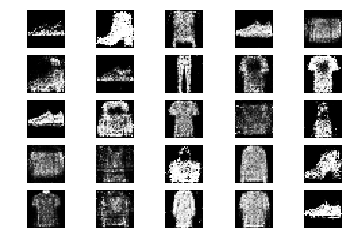

29401 [D loss: 0.634484, acc.: 62.50%] [G loss: 1.044164]
29402 [D loss: 0.654149, acc.: 70.31%] [G loss: 0.995344]
29403 [D loss: 0.633509, acc.: 65.62%] [G loss: 1.006712]
29404 [D loss: 0.679504, acc.: 57.81%] [G loss: 0.935863]
29405 [D loss: 0.645815, acc.: 57.81%] [G loss: 1.030978]
29406 [D loss: 0.595144, acc.: 68.75%] [G loss: 0.878480]
29407 [D loss: 0.567912, acc.: 67.19%] [G loss: 0.926634]
29408 [D loss: 0.553793, acc.: 65.62%] [G loss: 0.996277]
29409 [D loss: 0.588853, acc.: 71.88%] [G loss: 0.872118]
29410 [D loss: 0.606871, acc.: 70.31%] [G loss: 0.954668]
29411 [D loss: 0.634273, acc.: 65.62%] [G loss: 1.012975]
29412 [D loss: 0.669259, acc.: 62.50%] [G loss: 1.021368]
29413 [D loss: 0.720372, acc.: 54.69%] [G loss: 1.015889]
29414 [D loss: 0.710653, acc.: 60.94%] [G loss: 0.961703]
29415 [D loss: 0.630956, acc.: 60.94%] [G loss: 0.994409]
29416 [D loss: 0.627517, acc.: 64.06%] [G loss: 1.071643]
29417 [D loss: 0.660145, acc.: 59.38%] [G loss: 0.978434]
29418 [D loss:

29545 [D loss: 0.566569, acc.: 70.31%] [G loss: 0.929312]
29546 [D loss: 0.693110, acc.: 53.12%] [G loss: 0.950273]
29547 [D loss: 0.595707, acc.: 67.19%] [G loss: 0.989051]
29548 [D loss: 0.594816, acc.: 68.75%] [G loss: 0.917210]
29549 [D loss: 0.658920, acc.: 64.06%] [G loss: 0.989470]
29550 [D loss: 0.626138, acc.: 67.19%] [G loss: 0.974756]
29551 [D loss: 0.672202, acc.: 54.69%] [G loss: 0.959423]
29552 [D loss: 0.589015, acc.: 65.62%] [G loss: 0.993654]
29553 [D loss: 0.633258, acc.: 64.06%] [G loss: 0.953413]
29554 [D loss: 0.666646, acc.: 70.31%] [G loss: 0.910566]
29555 [D loss: 0.642472, acc.: 62.50%] [G loss: 0.992604]
29556 [D loss: 0.587813, acc.: 70.31%] [G loss: 0.895583]
29557 [D loss: 0.643309, acc.: 60.94%] [G loss: 0.913154]
29558 [D loss: 0.577977, acc.: 68.75%] [G loss: 0.958542]
29559 [D loss: 0.652458, acc.: 59.38%] [G loss: 0.979382]
29560 [D loss: 0.647778, acc.: 57.81%] [G loss: 0.890253]
29561 [D loss: 0.643183, acc.: 65.62%] [G loss: 0.915953]
29562 [D loss:

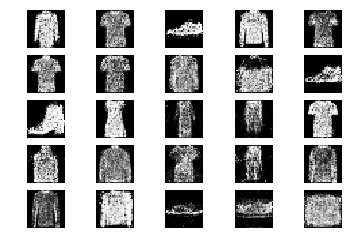

29601 [D loss: 0.678263, acc.: 53.12%] [G loss: 0.997696]
29602 [D loss: 0.679361, acc.: 59.38%] [G loss: 1.008495]
29603 [D loss: 0.644663, acc.: 60.94%] [G loss: 0.911834]
29604 [D loss: 0.751939, acc.: 51.56%] [G loss: 0.967203]
29605 [D loss: 0.576031, acc.: 67.19%] [G loss: 0.899833]
29606 [D loss: 0.624137, acc.: 70.31%] [G loss: 0.953863]
29607 [D loss: 0.641524, acc.: 64.06%] [G loss: 1.037460]
29608 [D loss: 0.829309, acc.: 43.75%] [G loss: 0.916853]
29609 [D loss: 0.665782, acc.: 62.50%] [G loss: 0.931876]
29610 [D loss: 0.586937, acc.: 68.75%] [G loss: 0.842223]
29611 [D loss: 0.714101, acc.: 59.38%] [G loss: 0.888139]
29612 [D loss: 0.582336, acc.: 75.00%] [G loss: 0.888882]
29613 [D loss: 0.672192, acc.: 59.38%] [G loss: 0.924871]
29614 [D loss: 0.678177, acc.: 64.06%] [G loss: 0.964967]
29615 [D loss: 0.638133, acc.: 65.62%] [G loss: 0.909149]
29616 [D loss: 0.583458, acc.: 76.56%] [G loss: 0.895650]
29617 [D loss: 0.614765, acc.: 68.75%] [G loss: 0.884624]
29618 [D loss:

29743 [D loss: 0.630470, acc.: 59.38%] [G loss: 0.946324]
29744 [D loss: 0.631543, acc.: 60.94%] [G loss: 0.953440]
29745 [D loss: 0.666293, acc.: 45.31%] [G loss: 1.134567]
29746 [D loss: 0.634966, acc.: 57.81%] [G loss: 0.913263]
29747 [D loss: 0.644593, acc.: 62.50%] [G loss: 0.938814]
29748 [D loss: 0.614785, acc.: 65.62%] [G loss: 1.036710]
29749 [D loss: 0.631104, acc.: 62.50%] [G loss: 0.921130]
29750 [D loss: 0.640077, acc.: 68.75%] [G loss: 1.060854]
29751 [D loss: 0.642427, acc.: 60.94%] [G loss: 0.954052]
29752 [D loss: 0.614760, acc.: 70.31%] [G loss: 1.052493]
29753 [D loss: 0.663271, acc.: 48.44%] [G loss: 0.996432]
29754 [D loss: 0.676123, acc.: 56.25%] [G loss: 0.975613]
29755 [D loss: 0.663283, acc.: 60.94%] [G loss: 1.017665]
29756 [D loss: 0.651972, acc.: 60.94%] [G loss: 1.018862]
29757 [D loss: 0.686254, acc.: 62.50%] [G loss: 0.967992]
29758 [D loss: 0.656578, acc.: 60.94%] [G loss: 0.970710]
29759 [D loss: 0.663620, acc.: 57.81%] [G loss: 0.911272]
29760 [D loss:

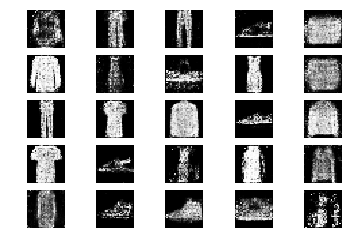

29801 [D loss: 0.623486, acc.: 62.50%] [G loss: 0.935498]
29802 [D loss: 0.580998, acc.: 73.44%] [G loss: 0.887271]
29803 [D loss: 0.644444, acc.: 59.38%] [G loss: 1.090920]
29804 [D loss: 0.677134, acc.: 62.50%] [G loss: 0.937534]
29805 [D loss: 0.646350, acc.: 62.50%] [G loss: 0.893649]
29806 [D loss: 0.570089, acc.: 73.44%] [G loss: 0.935526]
29807 [D loss: 0.720674, acc.: 51.56%] [G loss: 0.957432]
29808 [D loss: 0.730247, acc.: 59.38%] [G loss: 0.968154]
29809 [D loss: 0.594506, acc.: 67.19%] [G loss: 1.007243]
29810 [D loss: 0.638324, acc.: 62.50%] [G loss: 0.885387]
29811 [D loss: 0.607647, acc.: 62.50%] [G loss: 0.906844]
29812 [D loss: 0.663004, acc.: 59.38%] [G loss: 0.915944]
29813 [D loss: 0.667451, acc.: 53.12%] [G loss: 0.994470]
29814 [D loss: 0.654788, acc.: 62.50%] [G loss: 1.006342]
29815 [D loss: 0.685465, acc.: 56.25%] [G loss: 1.036584]
29816 [D loss: 0.645026, acc.: 70.31%] [G loss: 0.975768]
29817 [D loss: 0.702929, acc.: 68.75%] [G loss: 0.915494]
29818 [D loss:

29945 [D loss: 0.661607, acc.: 59.38%] [G loss: 0.864776]
29946 [D loss: 0.617670, acc.: 64.06%] [G loss: 0.946277]
29947 [D loss: 0.634981, acc.: 68.75%] [G loss: 0.977287]
29948 [D loss: 0.657170, acc.: 50.00%] [G loss: 0.967838]
29949 [D loss: 0.673476, acc.: 60.94%] [G loss: 1.007647]
29950 [D loss: 0.633462, acc.: 62.50%] [G loss: 0.879683]
29951 [D loss: 0.586970, acc.: 68.75%] [G loss: 0.991672]
29952 [D loss: 0.661102, acc.: 60.94%] [G loss: 0.980568]
29953 [D loss: 0.669872, acc.: 53.12%] [G loss: 1.130108]
29954 [D loss: 0.747721, acc.: 45.31%] [G loss: 1.018083]
29955 [D loss: 0.547447, acc.: 71.88%] [G loss: 1.029517]
29956 [D loss: 0.611691, acc.: 70.31%] [G loss: 0.963190]
29957 [D loss: 0.642269, acc.: 56.25%] [G loss: 0.964431]
29958 [D loss: 0.623849, acc.: 71.88%] [G loss: 0.979144]
29959 [D loss: 0.506250, acc.: 75.00%] [G loss: 0.915457]
29960 [D loss: 0.642158, acc.: 62.50%] [G loss: 0.951774]
29961 [D loss: 0.588300, acc.: 67.19%] [G loss: 0.958349]
29962 [D loss:

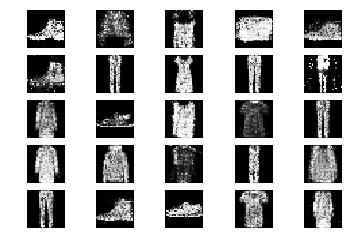

30001 [D loss: 0.630544, acc.: 67.19%] [G loss: 1.035675]
30002 [D loss: 0.587191, acc.: 75.00%] [G loss: 0.919488]
30003 [D loss: 0.616492, acc.: 64.06%] [G loss: 0.977555]
30004 [D loss: 0.660341, acc.: 64.06%] [G loss: 1.062261]
30005 [D loss: 0.657898, acc.: 54.69%] [G loss: 1.095962]
30006 [D loss: 0.601509, acc.: 67.19%] [G loss: 1.073926]
30007 [D loss: 0.675400, acc.: 65.62%] [G loss: 0.941821]
30008 [D loss: 0.619274, acc.: 60.94%] [G loss: 0.913530]
30009 [D loss: 0.649480, acc.: 62.50%] [G loss: 0.795311]
30010 [D loss: 0.687151, acc.: 56.25%] [G loss: 0.870165]
30011 [D loss: 0.680898, acc.: 56.25%] [G loss: 0.901046]
30012 [D loss: 0.667687, acc.: 59.38%] [G loss: 0.956224]
30013 [D loss: 0.735681, acc.: 48.44%] [G loss: 0.933514]
30014 [D loss: 0.609041, acc.: 71.88%] [G loss: 0.870188]
30015 [D loss: 0.667983, acc.: 57.81%] [G loss: 0.910911]
30016 [D loss: 0.618717, acc.: 70.31%] [G loss: 0.982764]
30017 [D loss: 0.608734, acc.: 60.94%] [G loss: 0.940194]
30018 [D loss:

30144 [D loss: 0.675416, acc.: 56.25%] [G loss: 0.885958]
30145 [D loss: 0.637304, acc.: 60.94%] [G loss: 0.982669]
30146 [D loss: 0.542542, acc.: 75.00%] [G loss: 0.865245]
30147 [D loss: 0.633701, acc.: 68.75%] [G loss: 0.931334]
30148 [D loss: 0.630054, acc.: 59.38%] [G loss: 0.974266]
30149 [D loss: 0.655873, acc.: 56.25%] [G loss: 0.884402]
30150 [D loss: 0.675789, acc.: 57.81%] [G loss: 1.026258]
30151 [D loss: 0.598946, acc.: 67.19%] [G loss: 0.947538]
30152 [D loss: 0.673607, acc.: 57.81%] [G loss: 0.925588]
30153 [D loss: 0.717764, acc.: 54.69%] [G loss: 0.961906]
30154 [D loss: 0.708771, acc.: 48.44%] [G loss: 1.010726]
30155 [D loss: 0.634592, acc.: 60.94%] [G loss: 0.950805]
30156 [D loss: 0.633937, acc.: 65.62%] [G loss: 0.997683]
30157 [D loss: 0.700122, acc.: 54.69%] [G loss: 0.939278]
30158 [D loss: 0.634778, acc.: 67.19%] [G loss: 0.977200]
30159 [D loss: 0.679368, acc.: 56.25%] [G loss: 0.907479]
30160 [D loss: 0.595247, acc.: 68.75%] [G loss: 0.974014]
30161 [D loss:

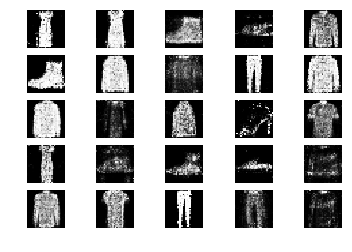

30201 [D loss: 0.593911, acc.: 70.31%] [G loss: 0.900939]
30202 [D loss: 0.662787, acc.: 62.50%] [G loss: 0.960319]
30203 [D loss: 0.589966, acc.: 67.19%] [G loss: 0.935761]
30204 [D loss: 0.673444, acc.: 57.81%] [G loss: 0.994218]
30205 [D loss: 0.580408, acc.: 71.88%] [G loss: 1.096473]
30206 [D loss: 0.655605, acc.: 65.62%] [G loss: 1.102351]
30207 [D loss: 0.645554, acc.: 60.94%] [G loss: 1.072616]
30208 [D loss: 0.668622, acc.: 64.06%] [G loss: 0.876425]
30209 [D loss: 0.622180, acc.: 60.94%] [G loss: 1.032625]
30210 [D loss: 0.653104, acc.: 56.25%] [G loss: 1.065639]
30211 [D loss: 0.678308, acc.: 56.25%] [G loss: 0.964393]
30212 [D loss: 0.659963, acc.: 60.94%] [G loss: 1.008607]
30213 [D loss: 0.643161, acc.: 60.94%] [G loss: 0.918796]
30214 [D loss: 0.565520, acc.: 68.75%] [G loss: 1.000623]
30215 [D loss: 0.729422, acc.: 56.25%] [G loss: 0.942907]
30216 [D loss: 0.593154, acc.: 73.44%] [G loss: 0.933459]
30217 [D loss: 0.648721, acc.: 60.94%] [G loss: 0.824168]
30218 [D loss:

30345 [D loss: 0.661023, acc.: 53.12%] [G loss: 1.001257]
30346 [D loss: 0.665021, acc.: 59.38%] [G loss: 0.984637]
30347 [D loss: 0.644531, acc.: 64.06%] [G loss: 0.925261]
30348 [D loss: 0.663021, acc.: 60.94%] [G loss: 0.960303]
30349 [D loss: 0.615007, acc.: 65.62%] [G loss: 1.012084]
30350 [D loss: 0.644631, acc.: 60.94%] [G loss: 0.959236]
30351 [D loss: 0.608814, acc.: 67.19%] [G loss: 0.945319]
30352 [D loss: 0.653992, acc.: 64.06%] [G loss: 0.915501]
30353 [D loss: 0.629239, acc.: 62.50%] [G loss: 0.955176]
30354 [D loss: 0.667723, acc.: 59.38%] [G loss: 0.934879]
30355 [D loss: 0.676173, acc.: 64.06%] [G loss: 0.952820]
30356 [D loss: 0.671938, acc.: 62.50%] [G loss: 1.036531]
30357 [D loss: 0.589419, acc.: 70.31%] [G loss: 0.982231]
30358 [D loss: 0.631063, acc.: 67.19%] [G loss: 0.990463]
30359 [D loss: 0.650711, acc.: 65.62%] [G loss: 0.912309]
30360 [D loss: 0.582987, acc.: 68.75%] [G loss: 1.027187]
30361 [D loss: 0.680027, acc.: 53.12%] [G loss: 0.894281]
30362 [D loss:

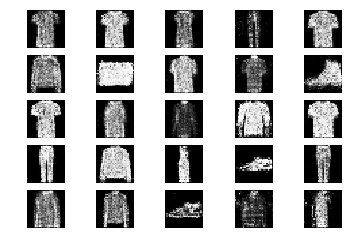

30401 [D loss: 0.678595, acc.: 53.12%] [G loss: 1.027305]
30402 [D loss: 0.687711, acc.: 62.50%] [G loss: 1.029671]
30403 [D loss: 0.694925, acc.: 54.69%] [G loss: 0.935598]
30404 [D loss: 0.631969, acc.: 59.38%] [G loss: 0.961540]
30405 [D loss: 0.640143, acc.: 65.62%] [G loss: 1.060962]
30406 [D loss: 0.617228, acc.: 60.94%] [G loss: 0.841159]
30407 [D loss: 0.584125, acc.: 71.88%] [G loss: 0.896091]
30408 [D loss: 0.739410, acc.: 53.12%] [G loss: 0.879541]
30409 [D loss: 0.670391, acc.: 57.81%] [G loss: 0.856482]
30410 [D loss: 0.588513, acc.: 70.31%] [G loss: 0.914687]
30411 [D loss: 0.561801, acc.: 70.31%] [G loss: 0.989801]
30412 [D loss: 0.594077, acc.: 67.19%] [G loss: 1.038525]
30413 [D loss: 0.649438, acc.: 57.81%] [G loss: 0.990276]
30414 [D loss: 0.595864, acc.: 65.62%] [G loss: 0.948565]
30415 [D loss: 0.654104, acc.: 60.94%] [G loss: 0.884105]
30416 [D loss: 0.635955, acc.: 68.75%] [G loss: 0.953940]
30417 [D loss: 0.639241, acc.: 57.81%] [G loss: 0.978752]
30418 [D loss:

30545 [D loss: 0.628139, acc.: 65.62%] [G loss: 1.031019]
30546 [D loss: 0.602939, acc.: 65.62%] [G loss: 0.905241]
30547 [D loss: 0.573244, acc.: 71.88%] [G loss: 1.020711]
30548 [D loss: 0.735392, acc.: 51.56%] [G loss: 0.945444]
30549 [D loss: 0.596405, acc.: 64.06%] [G loss: 0.932459]
30550 [D loss: 0.645899, acc.: 65.62%] [G loss: 0.873949]
30551 [D loss: 0.634630, acc.: 67.19%] [G loss: 0.936358]
30552 [D loss: 0.548613, acc.: 75.00%] [G loss: 0.992225]
30553 [D loss: 0.698602, acc.: 62.50%] [G loss: 0.859467]
30554 [D loss: 0.614816, acc.: 68.75%] [G loss: 0.899954]
30555 [D loss: 0.619470, acc.: 60.94%] [G loss: 0.924276]
30556 [D loss: 0.635903, acc.: 62.50%] [G loss: 0.913632]
30557 [D loss: 0.606495, acc.: 67.19%] [G loss: 0.935040]
30558 [D loss: 0.651750, acc.: 65.62%] [G loss: 1.042872]
30559 [D loss: 0.611864, acc.: 64.06%] [G loss: 0.900515]
30560 [D loss: 0.667974, acc.: 64.06%] [G loss: 1.047135]
30561 [D loss: 0.705684, acc.: 53.12%] [G loss: 0.903038]
30562 [D loss:

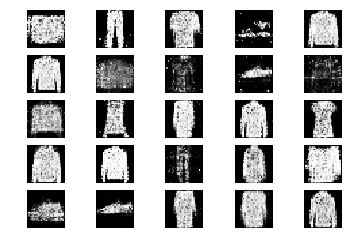

30601 [D loss: 0.616916, acc.: 62.50%] [G loss: 1.014457]
30602 [D loss: 0.651643, acc.: 60.94%] [G loss: 1.003867]
30603 [D loss: 0.685107, acc.: 56.25%] [G loss: 1.027310]
30604 [D loss: 0.589988, acc.: 76.56%] [G loss: 0.974071]
30605 [D loss: 0.642445, acc.: 60.94%] [G loss: 0.975702]
30606 [D loss: 0.632378, acc.: 64.06%] [G loss: 1.055270]
30607 [D loss: 0.611772, acc.: 71.88%] [G loss: 0.944663]
30608 [D loss: 0.679236, acc.: 46.88%] [G loss: 0.966491]
30609 [D loss: 0.585372, acc.: 73.44%] [G loss: 1.034286]
30610 [D loss: 0.648402, acc.: 67.19%] [G loss: 0.991502]
30611 [D loss: 0.565284, acc.: 75.00%] [G loss: 0.889452]
30612 [D loss: 0.650419, acc.: 56.25%] [G loss: 0.890739]
30613 [D loss: 0.608113, acc.: 64.06%] [G loss: 0.919898]
30614 [D loss: 0.586330, acc.: 68.75%] [G loss: 0.983241]
30615 [D loss: 0.641674, acc.: 67.19%] [G loss: 0.977542]
30616 [D loss: 0.580648, acc.: 70.31%] [G loss: 1.044809]
30617 [D loss: 0.634772, acc.: 60.94%] [G loss: 0.959517]
30618 [D loss:

30743 [D loss: 0.624122, acc.: 68.75%] [G loss: 0.967414]
30744 [D loss: 0.635232, acc.: 62.50%] [G loss: 0.993313]
30745 [D loss: 0.630572, acc.: 62.50%] [G loss: 1.060654]
30746 [D loss: 0.612542, acc.: 67.19%] [G loss: 0.899660]
30747 [D loss: 0.663757, acc.: 62.50%] [G loss: 1.010940]
30748 [D loss: 0.676431, acc.: 60.94%] [G loss: 0.958187]
30749 [D loss: 0.616650, acc.: 65.62%] [G loss: 0.891223]
30750 [D loss: 0.602902, acc.: 68.75%] [G loss: 0.989009]
30751 [D loss: 0.624170, acc.: 62.50%] [G loss: 0.933770]
30752 [D loss: 0.618715, acc.: 65.62%] [G loss: 0.913214]
30753 [D loss: 0.598099, acc.: 68.75%] [G loss: 0.903627]
30754 [D loss: 0.582363, acc.: 67.19%] [G loss: 0.925346]
30755 [D loss: 0.672743, acc.: 62.50%] [G loss: 0.845687]
30756 [D loss: 0.709548, acc.: 53.12%] [G loss: 0.898049]
30757 [D loss: 0.640116, acc.: 62.50%] [G loss: 0.899298]
30758 [D loss: 0.627948, acc.: 64.06%] [G loss: 1.014821]
30759 [D loss: 0.714614, acc.: 59.38%] [G loss: 0.990911]
30760 [D loss:

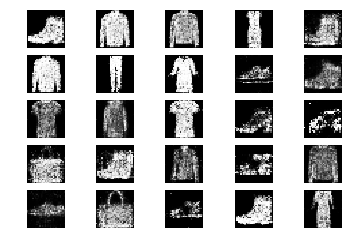

30801 [D loss: 0.591430, acc.: 60.94%] [G loss: 1.068920]
30802 [D loss: 0.643808, acc.: 57.81%] [G loss: 0.907489]
30803 [D loss: 0.683931, acc.: 62.50%] [G loss: 1.003597]
30804 [D loss: 0.614162, acc.: 60.94%] [G loss: 0.995154]
30805 [D loss: 0.640268, acc.: 60.94%] [G loss: 0.907861]
30806 [D loss: 0.597894, acc.: 70.31%] [G loss: 0.854371]
30807 [D loss: 0.667923, acc.: 59.38%] [G loss: 0.912206]
30808 [D loss: 0.691624, acc.: 57.81%] [G loss: 0.888005]
30809 [D loss: 0.638857, acc.: 62.50%] [G loss: 0.960582]
30810 [D loss: 0.591657, acc.: 67.19%] [G loss: 0.946641]
30811 [D loss: 0.561909, acc.: 71.88%] [G loss: 1.002531]
30812 [D loss: 0.622550, acc.: 65.62%] [G loss: 0.997572]
30813 [D loss: 0.619360, acc.: 62.50%] [G loss: 0.906328]
30814 [D loss: 0.744653, acc.: 48.44%] [G loss: 0.970942]
30815 [D loss: 0.649173, acc.: 64.06%] [G loss: 1.063948]
30816 [D loss: 0.648040, acc.: 62.50%] [G loss: 1.022057]
30817 [D loss: 0.636366, acc.: 67.19%] [G loss: 1.122013]
30818 [D loss:

30944 [D loss: 0.634534, acc.: 62.50%] [G loss: 0.954690]
30945 [D loss: 0.623754, acc.: 68.75%] [G loss: 0.981007]
30946 [D loss: 0.616593, acc.: 71.88%] [G loss: 1.009350]
30947 [D loss: 0.611628, acc.: 57.81%] [G loss: 1.024930]
30948 [D loss: 0.667832, acc.: 54.69%] [G loss: 0.834267]
30949 [D loss: 0.648771, acc.: 59.38%] [G loss: 0.991811]
30950 [D loss: 0.605512, acc.: 67.19%] [G loss: 0.968493]
30951 [D loss: 0.601710, acc.: 62.50%] [G loss: 0.974267]
30952 [D loss: 0.617632, acc.: 65.62%] [G loss: 1.013610]
30953 [D loss: 0.608866, acc.: 65.62%] [G loss: 0.949499]
30954 [D loss: 0.593823, acc.: 71.88%] [G loss: 1.066334]
30955 [D loss: 0.579795, acc.: 68.75%] [G loss: 1.009796]
30956 [D loss: 0.581948, acc.: 70.31%] [G loss: 1.030394]
30957 [D loss: 0.588344, acc.: 67.19%] [G loss: 0.989886]
30958 [D loss: 0.579197, acc.: 73.44%] [G loss: 1.125492]
30959 [D loss: 0.605158, acc.: 67.19%] [G loss: 1.091703]
30960 [D loss: 0.625056, acc.: 64.06%] [G loss: 1.066518]
30961 [D loss:

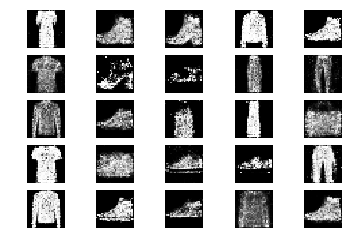

31001 [D loss: 0.635716, acc.: 59.38%] [G loss: 0.910103]
31002 [D loss: 0.720603, acc.: 45.31%] [G loss: 0.954183]
31003 [D loss: 0.631763, acc.: 67.19%] [G loss: 1.028303]
31004 [D loss: 0.651511, acc.: 62.50%] [G loss: 0.900023]
31005 [D loss: 0.573519, acc.: 68.75%] [G loss: 1.104020]
31006 [D loss: 0.635522, acc.: 65.62%] [G loss: 0.946362]
31007 [D loss: 0.683892, acc.: 62.50%] [G loss: 0.970911]
31008 [D loss: 0.584698, acc.: 73.44%] [G loss: 0.951944]
31009 [D loss: 0.666172, acc.: 54.69%] [G loss: 0.981983]
31010 [D loss: 0.605360, acc.: 64.06%] [G loss: 0.951769]
31011 [D loss: 0.635268, acc.: 57.81%] [G loss: 1.002459]
31012 [D loss: 0.634411, acc.: 65.62%] [G loss: 0.969413]
31013 [D loss: 0.629014, acc.: 62.50%] [G loss: 0.931792]
31014 [D loss: 0.599040, acc.: 67.19%] [G loss: 0.925522]
31015 [D loss: 0.550439, acc.: 81.25%] [G loss: 0.943257]
31016 [D loss: 0.577707, acc.: 73.44%] [G loss: 0.934164]
31017 [D loss: 0.593767, acc.: 62.50%] [G loss: 0.926635]
31018 [D loss:

31145 [D loss: 0.640907, acc.: 57.81%] [G loss: 1.035566]
31146 [D loss: 0.678145, acc.: 64.06%] [G loss: 0.936784]
31147 [D loss: 0.554555, acc.: 73.44%] [G loss: 0.871220]
31148 [D loss: 0.719438, acc.: 50.00%] [G loss: 0.922918]
31149 [D loss: 0.625138, acc.: 54.69%] [G loss: 0.842057]
31150 [D loss: 0.593127, acc.: 70.31%] [G loss: 1.011621]
31151 [D loss: 0.647345, acc.: 60.94%] [G loss: 0.974647]
31152 [D loss: 0.750971, acc.: 46.88%] [G loss: 0.881456]
31153 [D loss: 0.668565, acc.: 59.38%] [G loss: 1.023080]
31154 [D loss: 0.602653, acc.: 67.19%] [G loss: 1.078469]
31155 [D loss: 0.618378, acc.: 67.19%] [G loss: 0.954290]
31156 [D loss: 0.639578, acc.: 60.94%] [G loss: 0.979076]
31157 [D loss: 0.633286, acc.: 71.88%] [G loss: 0.982788]
31158 [D loss: 0.550660, acc.: 81.25%] [G loss: 0.961250]
31159 [D loss: 0.649874, acc.: 54.69%] [G loss: 0.976058]
31160 [D loss: 0.632081, acc.: 65.62%] [G loss: 0.947931]
31161 [D loss: 0.661215, acc.: 67.19%] [G loss: 0.968861]
31162 [D loss:

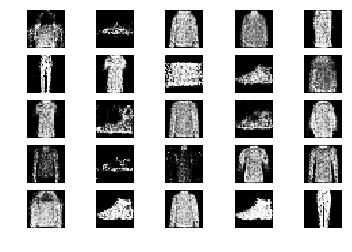

31201 [D loss: 0.761086, acc.: 57.81%] [G loss: 0.875611]
31202 [D loss: 0.619194, acc.: 62.50%] [G loss: 1.074634]
31203 [D loss: 0.710765, acc.: 53.12%] [G loss: 1.007107]
31204 [D loss: 0.590325, acc.: 75.00%] [G loss: 1.103282]
31205 [D loss: 0.641966, acc.: 56.25%] [G loss: 1.079897]
31206 [D loss: 0.618765, acc.: 59.38%] [G loss: 1.021413]
31207 [D loss: 0.723188, acc.: 50.00%] [G loss: 0.976361]
31208 [D loss: 0.686578, acc.: 59.38%] [G loss: 1.001601]
31209 [D loss: 0.661074, acc.: 56.25%] [G loss: 0.951162]
31210 [D loss: 0.619358, acc.: 70.31%] [G loss: 0.894286]
31211 [D loss: 0.650594, acc.: 70.31%] [G loss: 0.989621]
31212 [D loss: 0.663931, acc.: 64.06%] [G loss: 0.854887]
31213 [D loss: 0.585676, acc.: 68.75%] [G loss: 0.880062]
31214 [D loss: 0.734403, acc.: 45.31%] [G loss: 0.980064]
31215 [D loss: 0.646023, acc.: 68.75%] [G loss: 0.986526]
31216 [D loss: 0.647097, acc.: 59.38%] [G loss: 1.018770]
31217 [D loss: 0.653892, acc.: 60.94%] [G loss: 0.959146]
31218 [D loss:

31344 [D loss: 0.644994, acc.: 64.06%] [G loss: 0.911814]
31345 [D loss: 0.592109, acc.: 65.62%] [G loss: 0.862814]
31346 [D loss: 0.676700, acc.: 54.69%] [G loss: 1.019331]
31347 [D loss: 0.641062, acc.: 59.38%] [G loss: 0.954261]
31348 [D loss: 0.588855, acc.: 70.31%] [G loss: 1.009782]
31349 [D loss: 0.652126, acc.: 59.38%] [G loss: 1.062322]
31350 [D loss: 0.630573, acc.: 60.94%] [G loss: 0.976413]
31351 [D loss: 0.672174, acc.: 57.81%] [G loss: 1.004747]
31352 [D loss: 0.625509, acc.: 67.19%] [G loss: 0.993839]
31353 [D loss: 0.688612, acc.: 64.06%] [G loss: 0.975479]
31354 [D loss: 0.556362, acc.: 76.56%] [G loss: 0.996325]
31355 [D loss: 0.694009, acc.: 51.56%] [G loss: 1.047671]
31356 [D loss: 0.696143, acc.: 50.00%] [G loss: 0.972426]
31357 [D loss: 0.598695, acc.: 68.75%] [G loss: 0.969811]
31358 [D loss: 0.642833, acc.: 62.50%] [G loss: 0.908604]
31359 [D loss: 0.648254, acc.: 59.38%] [G loss: 0.969866]
31360 [D loss: 0.673148, acc.: 60.94%] [G loss: 0.967620]
31361 [D loss:

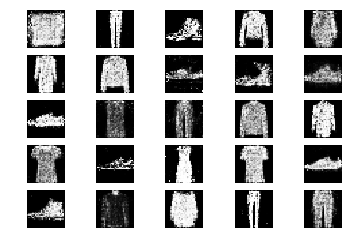

31401 [D loss: 0.568030, acc.: 65.62%] [G loss: 0.995311]
31402 [D loss: 0.672194, acc.: 54.69%] [G loss: 0.915612]
31403 [D loss: 0.619274, acc.: 67.19%] [G loss: 0.892637]
31404 [D loss: 0.548429, acc.: 71.88%] [G loss: 1.109002]
31405 [D loss: 0.649528, acc.: 62.50%] [G loss: 0.966333]
31406 [D loss: 0.625272, acc.: 68.75%] [G loss: 0.914773]
31407 [D loss: 0.583953, acc.: 64.06%] [G loss: 1.015702]
31408 [D loss: 0.657854, acc.: 62.50%] [G loss: 0.877989]
31409 [D loss: 0.567234, acc.: 67.19%] [G loss: 0.966633]
31410 [D loss: 0.620842, acc.: 64.06%] [G loss: 0.992443]
31411 [D loss: 0.737678, acc.: 59.38%] [G loss: 1.064504]
31412 [D loss: 0.630066, acc.: 64.06%] [G loss: 1.070491]
31413 [D loss: 0.603788, acc.: 65.62%] [G loss: 1.112401]
31414 [D loss: 0.784127, acc.: 35.94%] [G loss: 1.025795]
31415 [D loss: 0.624748, acc.: 60.94%] [G loss: 0.982912]
31416 [D loss: 0.687800, acc.: 59.38%] [G loss: 0.927126]
31417 [D loss: 0.634324, acc.: 65.62%] [G loss: 0.952513]
31418 [D loss:

31543 [D loss: 0.635315, acc.: 62.50%] [G loss: 1.026928]
31544 [D loss: 0.607039, acc.: 70.31%] [G loss: 0.994145]
31545 [D loss: 0.649231, acc.: 60.94%] [G loss: 0.968682]
31546 [D loss: 0.676918, acc.: 57.81%] [G loss: 0.911365]
31547 [D loss: 0.671602, acc.: 53.12%] [G loss: 0.876891]
31548 [D loss: 0.628158, acc.: 62.50%] [G loss: 0.960126]
31549 [D loss: 0.632733, acc.: 59.38%] [G loss: 0.849444]
31550 [D loss: 0.694333, acc.: 53.12%] [G loss: 0.880057]
31551 [D loss: 0.616858, acc.: 62.50%] [G loss: 0.820221]
31552 [D loss: 0.656969, acc.: 64.06%] [G loss: 0.962686]
31553 [D loss: 0.618626, acc.: 67.19%] [G loss: 0.965659]
31554 [D loss: 0.596489, acc.: 67.19%] [G loss: 0.946983]
31555 [D loss: 0.623584, acc.: 59.38%] [G loss: 1.021271]
31556 [D loss: 0.615615, acc.: 68.75%] [G loss: 0.893685]
31557 [D loss: 0.689029, acc.: 59.38%] [G loss: 1.014473]
31558 [D loss: 0.658390, acc.: 56.25%] [G loss: 0.924705]
31559 [D loss: 0.652070, acc.: 65.62%] [G loss: 0.883159]
31560 [D loss:

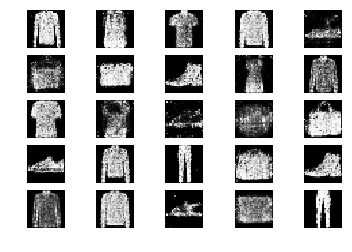

31601 [D loss: 0.665006, acc.: 64.06%] [G loss: 0.987004]
31602 [D loss: 0.655393, acc.: 60.94%] [G loss: 0.901402]
31603 [D loss: 0.610406, acc.: 65.62%] [G loss: 0.856324]
31604 [D loss: 0.676569, acc.: 60.94%] [G loss: 1.022686]
31605 [D loss: 0.627738, acc.: 68.75%] [G loss: 1.028921]
31606 [D loss: 0.695894, acc.: 46.88%] [G loss: 0.946937]
31607 [D loss: 0.677604, acc.: 54.69%] [G loss: 0.916246]
31608 [D loss: 0.672187, acc.: 59.38%] [G loss: 0.902687]
31609 [D loss: 0.687808, acc.: 56.25%] [G loss: 0.887818]
31610 [D loss: 0.587220, acc.: 68.75%] [G loss: 0.921483]
31611 [D loss: 0.726561, acc.: 50.00%] [G loss: 0.994059]
31612 [D loss: 0.628591, acc.: 62.50%] [G loss: 1.022123]
31613 [D loss: 0.594625, acc.: 68.75%] [G loss: 0.916680]
31614 [D loss: 0.545110, acc.: 78.12%] [G loss: 0.959195]
31615 [D loss: 0.726381, acc.: 53.12%] [G loss: 0.913560]
31616 [D loss: 0.635500, acc.: 62.50%] [G loss: 0.932084]
31617 [D loss: 0.608128, acc.: 64.06%] [G loss: 0.950057]
31618 [D loss:

31743 [D loss: 0.559439, acc.: 76.56%] [G loss: 0.995990]
31744 [D loss: 0.641939, acc.: 59.38%] [G loss: 0.879897]
31745 [D loss: 0.648196, acc.: 60.94%] [G loss: 0.921620]
31746 [D loss: 0.628105, acc.: 64.06%] [G loss: 0.933323]
31747 [D loss: 0.650115, acc.: 56.25%] [G loss: 1.011965]
31748 [D loss: 0.633183, acc.: 64.06%] [G loss: 0.937820]
31749 [D loss: 0.635612, acc.: 57.81%] [G loss: 1.014227]
31750 [D loss: 0.623079, acc.: 65.62%] [G loss: 0.991662]
31751 [D loss: 0.623414, acc.: 59.38%] [G loss: 1.109654]
31752 [D loss: 0.653543, acc.: 57.81%] [G loss: 1.118024]
31753 [D loss: 0.654436, acc.: 65.62%] [G loss: 0.949031]
31754 [D loss: 0.639200, acc.: 67.19%] [G loss: 0.940311]
31755 [D loss: 0.637821, acc.: 65.62%] [G loss: 0.931633]
31756 [D loss: 0.623610, acc.: 59.38%] [G loss: 0.868786]
31757 [D loss: 0.640361, acc.: 57.81%] [G loss: 1.009326]
31758 [D loss: 0.624228, acc.: 62.50%] [G loss: 0.936778]
31759 [D loss: 0.633152, acc.: 70.31%] [G loss: 0.889712]
31760 [D loss:

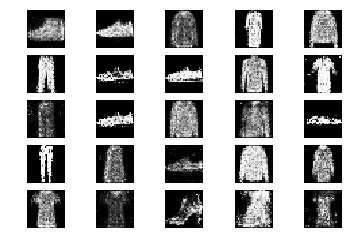

31801 [D loss: 0.668365, acc.: 68.75%] [G loss: 1.029662]
31802 [D loss: 0.644001, acc.: 60.94%] [G loss: 1.046219]
31803 [D loss: 0.647458, acc.: 60.94%] [G loss: 0.924374]
31804 [D loss: 0.658210, acc.: 60.94%] [G loss: 0.993775]
31805 [D loss: 0.516096, acc.: 81.25%] [G loss: 1.065171]
31806 [D loss: 0.682503, acc.: 57.81%] [G loss: 0.991196]
31807 [D loss: 0.611585, acc.: 67.19%] [G loss: 0.938967]
31808 [D loss: 0.580281, acc.: 73.44%] [G loss: 1.032871]
31809 [D loss: 0.616816, acc.: 71.88%] [G loss: 1.040988]
31810 [D loss: 0.630362, acc.: 60.94%] [G loss: 1.019615]
31811 [D loss: 0.646326, acc.: 62.50%] [G loss: 1.036975]
31812 [D loss: 0.649182, acc.: 71.88%] [G loss: 0.977387]
31813 [D loss: 0.630028, acc.: 65.62%] [G loss: 0.926080]
31814 [D loss: 0.723447, acc.: 46.88%] [G loss: 0.921223]
31815 [D loss: 0.700266, acc.: 56.25%] [G loss: 0.874371]
31816 [D loss: 0.648744, acc.: 64.06%] [G loss: 0.904960]
31817 [D loss: 0.662298, acc.: 56.25%] [G loss: 0.957647]
31818 [D loss:

31944 [D loss: 0.613176, acc.: 67.19%] [G loss: 1.174581]
31945 [D loss: 0.651099, acc.: 60.94%] [G loss: 0.976821]
31946 [D loss: 0.656596, acc.: 54.69%] [G loss: 1.006056]
31947 [D loss: 0.627191, acc.: 62.50%] [G loss: 0.917686]
31948 [D loss: 0.611429, acc.: 65.62%] [G loss: 0.980524]
31949 [D loss: 0.565308, acc.: 75.00%] [G loss: 0.912639]
31950 [D loss: 0.645595, acc.: 70.31%] [G loss: 1.040708]
31951 [D loss: 0.655123, acc.: 57.81%] [G loss: 1.066570]
31952 [D loss: 0.652468, acc.: 57.81%] [G loss: 0.954647]
31953 [D loss: 0.605131, acc.: 64.06%] [G loss: 0.957751]
31954 [D loss: 0.626391, acc.: 60.94%] [G loss: 0.919133]
31955 [D loss: 0.605591, acc.: 62.50%] [G loss: 0.876175]
31956 [D loss: 0.669169, acc.: 59.38%] [G loss: 0.958756]
31957 [D loss: 0.614951, acc.: 67.19%] [G loss: 0.878419]
31958 [D loss: 0.678711, acc.: 54.69%] [G loss: 0.928782]
31959 [D loss: 0.707900, acc.: 51.56%] [G loss: 0.863813]
31960 [D loss: 0.591065, acc.: 68.75%] [G loss: 0.977935]
31961 [D loss:

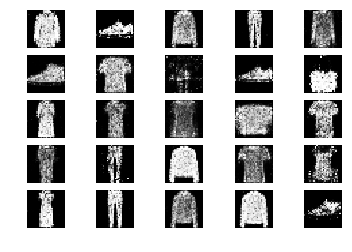

32001 [D loss: 0.600131, acc.: 67.19%] [G loss: 0.989566]
32002 [D loss: 0.543395, acc.: 73.44%] [G loss: 0.990068]
32003 [D loss: 0.602093, acc.: 70.31%] [G loss: 0.867652]
32004 [D loss: 0.554157, acc.: 76.56%] [G loss: 0.952436]
32005 [D loss: 0.625529, acc.: 64.06%] [G loss: 0.963527]
32006 [D loss: 0.593805, acc.: 67.19%] [G loss: 1.069521]
32007 [D loss: 0.634925, acc.: 70.31%] [G loss: 1.012579]
32008 [D loss: 0.678405, acc.: 53.12%] [G loss: 0.885714]
32009 [D loss: 0.620902, acc.: 73.44%] [G loss: 0.967118]
32010 [D loss: 0.651198, acc.: 64.06%] [G loss: 1.058990]
32011 [D loss: 0.592876, acc.: 73.44%] [G loss: 0.982211]
32012 [D loss: 0.618983, acc.: 60.94%] [G loss: 0.896417]
32013 [D loss: 0.584512, acc.: 65.62%] [G loss: 0.872925]
32014 [D loss: 0.684715, acc.: 56.25%] [G loss: 0.943854]
32015 [D loss: 0.659512, acc.: 64.06%] [G loss: 0.958997]
32016 [D loss: 0.607956, acc.: 67.19%] [G loss: 0.969623]
32017 [D loss: 0.606150, acc.: 65.62%] [G loss: 0.991735]
32018 [D loss:

32145 [D loss: 0.660846, acc.: 60.94%] [G loss: 0.967478]
32146 [D loss: 0.637893, acc.: 67.19%] [G loss: 0.870749]
32147 [D loss: 0.601582, acc.: 64.06%] [G loss: 0.960950]
32148 [D loss: 0.619935, acc.: 65.62%] [G loss: 1.002953]
32149 [D loss: 0.568807, acc.: 75.00%] [G loss: 0.949814]
32150 [D loss: 0.661476, acc.: 62.50%] [G loss: 0.964371]
32151 [D loss: 0.656925, acc.: 64.06%] [G loss: 0.917072]
32152 [D loss: 0.677729, acc.: 64.06%] [G loss: 0.949828]
32153 [D loss: 0.645978, acc.: 62.50%] [G loss: 0.909656]
32154 [D loss: 0.648814, acc.: 68.75%] [G loss: 0.911969]
32155 [D loss: 0.631423, acc.: 60.94%] [G loss: 1.029502]
32156 [D loss: 0.635820, acc.: 64.06%] [G loss: 1.064186]
32157 [D loss: 0.647711, acc.: 60.94%] [G loss: 0.975357]
32158 [D loss: 0.647204, acc.: 62.50%] [G loss: 0.949620]
32159 [D loss: 0.599653, acc.: 64.06%] [G loss: 1.029676]
32160 [D loss: 0.621771, acc.: 73.44%] [G loss: 0.932923]
32161 [D loss: 0.663272, acc.: 56.25%] [G loss: 0.976742]
32162 [D loss:

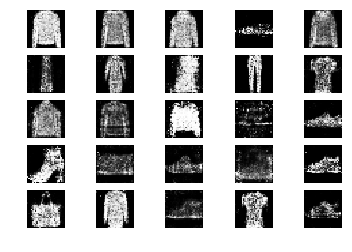

32201 [D loss: 0.610484, acc.: 60.94%] [G loss: 0.974417]
32202 [D loss: 0.581244, acc.: 75.00%] [G loss: 1.006269]
32203 [D loss: 0.617644, acc.: 70.31%] [G loss: 0.897280]
32204 [D loss: 0.614002, acc.: 65.62%] [G loss: 0.933052]
32205 [D loss: 0.651997, acc.: 62.50%] [G loss: 1.001752]
32206 [D loss: 0.623548, acc.: 59.38%] [G loss: 1.077138]
32207 [D loss: 0.550774, acc.: 70.31%] [G loss: 1.151540]
32208 [D loss: 0.649644, acc.: 64.06%] [G loss: 1.047174]
32209 [D loss: 0.659957, acc.: 59.38%] [G loss: 0.918760]
32210 [D loss: 0.607993, acc.: 64.06%] [G loss: 1.026927]
32211 [D loss: 0.534961, acc.: 78.12%] [G loss: 0.956390]
32212 [D loss: 0.723724, acc.: 48.44%] [G loss: 0.955997]
32213 [D loss: 0.589458, acc.: 62.50%] [G loss: 1.003600]
32214 [D loss: 0.514412, acc.: 78.12%] [G loss: 0.993403]
32215 [D loss: 0.615476, acc.: 64.06%] [G loss: 0.948672]
32216 [D loss: 0.648498, acc.: 65.62%] [G loss: 0.924555]
32217 [D loss: 0.701484, acc.: 54.69%] [G loss: 1.005272]
32218 [D loss:

32345 [D loss: 0.604136, acc.: 71.88%] [G loss: 0.986530]
32346 [D loss: 0.676540, acc.: 60.94%] [G loss: 1.026545]
32347 [D loss: 0.664634, acc.: 60.94%] [G loss: 0.873633]
32348 [D loss: 0.619572, acc.: 65.62%] [G loss: 0.885721]
32349 [D loss: 0.620921, acc.: 67.19%] [G loss: 0.927361]
32350 [D loss: 0.640199, acc.: 62.50%] [G loss: 0.932594]
32351 [D loss: 0.683418, acc.: 60.94%] [G loss: 0.946011]
32352 [D loss: 0.632185, acc.: 62.50%] [G loss: 1.075607]
32353 [D loss: 0.671003, acc.: 57.81%] [G loss: 0.929273]
32354 [D loss: 0.623404, acc.: 65.62%] [G loss: 1.018589]
32355 [D loss: 0.613518, acc.: 62.50%] [G loss: 1.053646]
32356 [D loss: 0.672760, acc.: 54.69%] [G loss: 1.078304]
32357 [D loss: 0.662394, acc.: 62.50%] [G loss: 0.893171]
32358 [D loss: 0.628631, acc.: 65.62%] [G loss: 0.949632]
32359 [D loss: 0.630515, acc.: 60.94%] [G loss: 0.930390]
32360 [D loss: 0.633350, acc.: 64.06%] [G loss: 0.999010]
32361 [D loss: 0.650453, acc.: 59.38%] [G loss: 0.991690]
32362 [D loss:

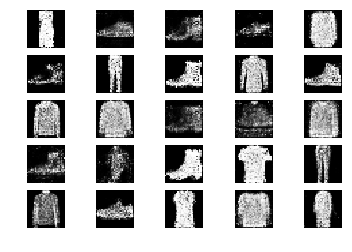

32401 [D loss: 0.654345, acc.: 64.06%] [G loss: 1.031209]
32402 [D loss: 0.635094, acc.: 57.81%] [G loss: 1.007299]
32403 [D loss: 0.626337, acc.: 57.81%] [G loss: 0.987102]
32404 [D loss: 0.647479, acc.: 64.06%] [G loss: 0.971916]
32405 [D loss: 0.642128, acc.: 59.38%] [G loss: 0.994242]
32406 [D loss: 0.748931, acc.: 42.19%] [G loss: 0.987950]
32407 [D loss: 0.640755, acc.: 65.62%] [G loss: 0.901236]
32408 [D loss: 0.647079, acc.: 54.69%] [G loss: 0.996761]
32409 [D loss: 0.689512, acc.: 59.38%] [G loss: 0.945083]
32410 [D loss: 0.619476, acc.: 62.50%] [G loss: 0.906059]
32411 [D loss: 0.645507, acc.: 62.50%] [G loss: 0.921543]
32412 [D loss: 0.569271, acc.: 70.31%] [G loss: 0.971860]
32413 [D loss: 0.647734, acc.: 64.06%] [G loss: 0.850574]
32414 [D loss: 0.573758, acc.: 76.56%] [G loss: 1.022994]
32415 [D loss: 0.600228, acc.: 64.06%] [G loss: 0.985653]
32416 [D loss: 0.635557, acc.: 67.19%] [G loss: 0.915827]
32417 [D loss: 0.637542, acc.: 59.38%] [G loss: 0.910810]
32418 [D loss:

32544 [D loss: 0.675924, acc.: 60.94%] [G loss: 1.001072]
32545 [D loss: 0.660009, acc.: 59.38%] [G loss: 1.050070]
32546 [D loss: 0.621471, acc.: 64.06%] [G loss: 0.980134]
32547 [D loss: 0.668010, acc.: 60.94%] [G loss: 0.929727]
32548 [D loss: 0.654900, acc.: 54.69%] [G loss: 1.026325]
32549 [D loss: 0.580444, acc.: 71.88%] [G loss: 0.911396]
32550 [D loss: 0.620320, acc.: 68.75%] [G loss: 0.940600]
32551 [D loss: 0.693550, acc.: 59.38%] [G loss: 0.916597]
32552 [D loss: 0.695386, acc.: 53.12%] [G loss: 0.915902]
32553 [D loss: 0.702899, acc.: 56.25%] [G loss: 0.909738]
32554 [D loss: 0.615552, acc.: 62.50%] [G loss: 0.896784]
32555 [D loss: 0.694388, acc.: 54.69%] [G loss: 1.021540]
32556 [D loss: 0.677477, acc.: 60.94%] [G loss: 1.070083]
32557 [D loss: 0.623733, acc.: 56.25%] [G loss: 0.988553]
32558 [D loss: 0.622651, acc.: 60.94%] [G loss: 1.072562]
32559 [D loss: 0.662279, acc.: 59.38%] [G loss: 1.051829]
32560 [D loss: 0.658498, acc.: 64.06%] [G loss: 1.017684]
32561 [D loss:

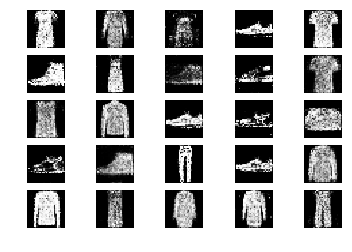

32601 [D loss: 0.674317, acc.: 53.12%] [G loss: 0.913986]
32602 [D loss: 0.639282, acc.: 59.38%] [G loss: 0.967899]
32603 [D loss: 0.586134, acc.: 68.75%] [G loss: 0.970317]
32604 [D loss: 0.591913, acc.: 70.31%] [G loss: 1.008295]
32605 [D loss: 0.710210, acc.: 42.19%] [G loss: 0.973515]
32606 [D loss: 0.632512, acc.: 60.94%] [G loss: 0.908709]
32607 [D loss: 0.579399, acc.: 65.62%] [G loss: 0.988570]
32608 [D loss: 0.586801, acc.: 70.31%] [G loss: 1.040079]
32609 [D loss: 0.717230, acc.: 60.94%] [G loss: 0.800734]
32610 [D loss: 0.621879, acc.: 65.62%] [G loss: 0.902260]
32611 [D loss: 0.657940, acc.: 60.94%] [G loss: 0.950263]
32612 [D loss: 0.630053, acc.: 64.06%] [G loss: 0.949522]
32613 [D loss: 0.650580, acc.: 60.94%] [G loss: 0.950157]
32614 [D loss: 0.640694, acc.: 62.50%] [G loss: 1.000230]
32615 [D loss: 0.630435, acc.: 62.50%] [G loss: 0.971159]
32616 [D loss: 0.608283, acc.: 64.06%] [G loss: 1.011716]
32617 [D loss: 0.668978, acc.: 59.38%] [G loss: 0.983703]
32618 [D loss:

32746 [D loss: 0.664504, acc.: 56.25%] [G loss: 0.989388]
32747 [D loss: 0.594215, acc.: 70.31%] [G loss: 0.931992]
32748 [D loss: 0.704162, acc.: 53.12%] [G loss: 0.991279]
32749 [D loss: 0.646194, acc.: 67.19%] [G loss: 0.844883]
32750 [D loss: 0.657970, acc.: 57.81%] [G loss: 0.876077]
32751 [D loss: 0.627162, acc.: 67.19%] [G loss: 0.939565]
32752 [D loss: 0.654075, acc.: 59.38%] [G loss: 0.848745]
32753 [D loss: 0.626810, acc.: 64.06%] [G loss: 0.937331]
32754 [D loss: 0.657579, acc.: 62.50%] [G loss: 1.011410]
32755 [D loss: 0.596414, acc.: 70.31%] [G loss: 0.955739]
32756 [D loss: 0.662449, acc.: 60.94%] [G loss: 0.919122]
32757 [D loss: 0.618160, acc.: 59.38%] [G loss: 0.926347]
32758 [D loss: 0.648883, acc.: 59.38%] [G loss: 0.973903]
32759 [D loss: 0.686222, acc.: 53.12%] [G loss: 0.991418]
32760 [D loss: 0.656576, acc.: 65.62%] [G loss: 0.958790]
32761 [D loss: 0.673331, acc.: 60.94%] [G loss: 0.967495]
32762 [D loss: 0.668273, acc.: 60.94%] [G loss: 0.854634]
32763 [D loss:

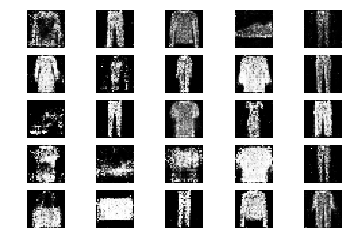

32801 [D loss: 0.628974, acc.: 62.50%] [G loss: 1.036868]
32802 [D loss: 0.593895, acc.: 70.31%] [G loss: 0.972156]
32803 [D loss: 0.653803, acc.: 60.94%] [G loss: 1.007382]
32804 [D loss: 0.601492, acc.: 70.31%] [G loss: 0.969126]
32805 [D loss: 0.685631, acc.: 60.94%] [G loss: 0.940093]
32806 [D loss: 0.626732, acc.: 64.06%] [G loss: 0.952415]
32807 [D loss: 0.646546, acc.: 60.94%] [G loss: 0.909799]
32808 [D loss: 0.668304, acc.: 60.94%] [G loss: 0.943721]
32809 [D loss: 0.648857, acc.: 64.06%] [G loss: 1.024987]
32810 [D loss: 0.587094, acc.: 65.62%] [G loss: 1.048830]
32811 [D loss: 0.663831, acc.: 57.81%] [G loss: 1.001012]
32812 [D loss: 0.652667, acc.: 60.94%] [G loss: 1.136729]
32813 [D loss: 0.592484, acc.: 68.75%] [G loss: 1.178256]
32814 [D loss: 0.665771, acc.: 64.06%] [G loss: 1.122791]
32815 [D loss: 0.676187, acc.: 62.50%] [G loss: 1.045421]
32816 [D loss: 0.709829, acc.: 56.25%] [G loss: 0.920272]
32817 [D loss: 0.757367, acc.: 46.88%] [G loss: 0.933793]
32818 [D loss:

32944 [D loss: 0.598510, acc.: 60.94%] [G loss: 1.027663]
32945 [D loss: 0.671005, acc.: 56.25%] [G loss: 0.987363]
32946 [D loss: 0.648598, acc.: 59.38%] [G loss: 1.041326]
32947 [D loss: 0.710779, acc.: 53.12%] [G loss: 0.955511]
32948 [D loss: 0.624119, acc.: 64.06%] [G loss: 0.944453]
32949 [D loss: 0.655194, acc.: 65.62%] [G loss: 0.951955]
32950 [D loss: 0.707549, acc.: 51.56%] [G loss: 0.892470]
32951 [D loss: 0.680623, acc.: 54.69%] [G loss: 0.900310]
32952 [D loss: 0.640159, acc.: 62.50%] [G loss: 1.017010]
32953 [D loss: 0.658914, acc.: 56.25%] [G loss: 0.946923]
32954 [D loss: 0.576361, acc.: 73.44%] [G loss: 0.945746]
32955 [D loss: 0.627479, acc.: 68.75%] [G loss: 0.878664]
32956 [D loss: 0.686228, acc.: 56.25%] [G loss: 1.051233]
32957 [D loss: 0.668529, acc.: 56.25%] [G loss: 1.005757]
32958 [D loss: 0.630419, acc.: 54.69%] [G loss: 1.105866]
32959 [D loss: 0.597387, acc.: 68.75%] [G loss: 1.003445]
32960 [D loss: 0.707963, acc.: 59.38%] [G loss: 1.089305]
32961 [D loss:

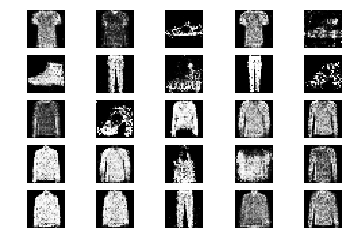

33001 [D loss: 0.621354, acc.: 68.75%] [G loss: 0.950228]
33002 [D loss: 0.625876, acc.: 62.50%] [G loss: 0.975140]
33003 [D loss: 0.637198, acc.: 64.06%] [G loss: 1.051904]
33004 [D loss: 0.581288, acc.: 68.75%] [G loss: 1.023860]
33005 [D loss: 0.603915, acc.: 68.75%] [G loss: 1.071283]
33006 [D loss: 0.621143, acc.: 64.06%] [G loss: 0.977673]
33007 [D loss: 0.600897, acc.: 65.62%] [G loss: 0.923142]
33008 [D loss: 0.610059, acc.: 65.62%] [G loss: 0.938829]
33009 [D loss: 0.610756, acc.: 71.88%] [G loss: 0.976147]
33010 [D loss: 0.639184, acc.: 68.75%] [G loss: 0.998774]
33011 [D loss: 0.630515, acc.: 60.94%] [G loss: 0.903963]
33012 [D loss: 0.615343, acc.: 64.06%] [G loss: 0.910728]
33013 [D loss: 0.691989, acc.: 46.88%] [G loss: 0.968058]
33014 [D loss: 0.599981, acc.: 65.62%] [G loss: 0.960901]
33015 [D loss: 0.559601, acc.: 73.44%] [G loss: 0.902808]
33016 [D loss: 0.646071, acc.: 65.62%] [G loss: 0.977278]
33017 [D loss: 0.641575, acc.: 67.19%] [G loss: 0.984442]
33018 [D loss:

33144 [D loss: 0.577176, acc.: 67.19%] [G loss: 0.971485]
33145 [D loss: 0.684454, acc.: 57.81%] [G loss: 0.987613]
33146 [D loss: 0.539004, acc.: 75.00%] [G loss: 1.069197]
33147 [D loss: 0.614476, acc.: 64.06%] [G loss: 0.876102]
33148 [D loss: 0.704754, acc.: 54.69%] [G loss: 1.060833]
33149 [D loss: 0.657530, acc.: 60.94%] [G loss: 0.966709]
33150 [D loss: 0.608163, acc.: 65.62%] [G loss: 1.013321]
33151 [D loss: 0.566379, acc.: 73.44%] [G loss: 1.049561]
33152 [D loss: 0.593024, acc.: 70.31%] [G loss: 1.061603]
33153 [D loss: 0.630091, acc.: 70.31%] [G loss: 0.929130]
33154 [D loss: 0.615693, acc.: 65.62%] [G loss: 0.961375]
33155 [D loss: 0.643643, acc.: 65.62%] [G loss: 0.969947]
33156 [D loss: 0.575877, acc.: 64.06%] [G loss: 0.839446]
33157 [D loss: 0.613036, acc.: 70.31%] [G loss: 1.077641]
33158 [D loss: 0.683240, acc.: 53.12%] [G loss: 0.949191]
33159 [D loss: 0.638793, acc.: 51.56%] [G loss: 0.935205]
33160 [D loss: 0.620145, acc.: 62.50%] [G loss: 0.926120]
33161 [D loss:

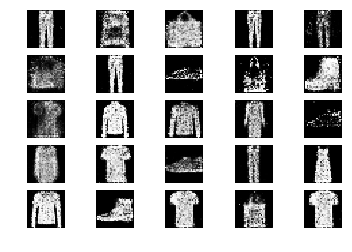

33201 [D loss: 0.664722, acc.: 62.50%] [G loss: 0.994002]
33202 [D loss: 0.591106, acc.: 68.75%] [G loss: 1.056546]
33203 [D loss: 0.659831, acc.: 59.38%] [G loss: 0.861037]
33204 [D loss: 0.552796, acc.: 70.31%] [G loss: 1.043730]
33205 [D loss: 0.620954, acc.: 67.19%] [G loss: 1.094502]
33206 [D loss: 0.671030, acc.: 57.81%] [G loss: 0.904335]
33207 [D loss: 0.621949, acc.: 65.62%] [G loss: 0.967175]
33208 [D loss: 0.646742, acc.: 64.06%] [G loss: 1.017424]
33209 [D loss: 0.579266, acc.: 65.62%] [G loss: 1.025885]
33210 [D loss: 0.662792, acc.: 59.38%] [G loss: 0.992351]
33211 [D loss: 0.736038, acc.: 56.25%] [G loss: 0.934668]
33212 [D loss: 0.613715, acc.: 65.62%] [G loss: 0.910560]
33213 [D loss: 0.646883, acc.: 65.62%] [G loss: 0.987436]
33214 [D loss: 0.575952, acc.: 71.88%] [G loss: 0.917490]
33215 [D loss: 0.605567, acc.: 67.19%] [G loss: 0.988550]
33216 [D loss: 0.547869, acc.: 73.44%] [G loss: 0.934465]
33217 [D loss: 0.546347, acc.: 73.44%] [G loss: 1.004804]
33218 [D loss:

33345 [D loss: 0.679026, acc.: 51.56%] [G loss: 0.871308]
33346 [D loss: 0.561391, acc.: 67.19%] [G loss: 0.888519]
33347 [D loss: 0.642836, acc.: 59.38%] [G loss: 0.950678]
33348 [D loss: 0.643142, acc.: 60.94%] [G loss: 0.927707]
33349 [D loss: 0.662395, acc.: 60.94%] [G loss: 1.032392]
33350 [D loss: 0.646420, acc.: 62.50%] [G loss: 0.949667]
33351 [D loss: 0.672958, acc.: 59.38%] [G loss: 0.977681]
33352 [D loss: 0.614796, acc.: 62.50%] [G loss: 1.053764]
33353 [D loss: 0.630174, acc.: 73.44%] [G loss: 1.003671]
33354 [D loss: 0.691031, acc.: 53.12%] [G loss: 0.929033]
33355 [D loss: 0.680557, acc.: 56.25%] [G loss: 1.037885]
33356 [D loss: 0.653649, acc.: 53.12%] [G loss: 1.115606]
33357 [D loss: 0.626500, acc.: 65.62%] [G loss: 1.004623]
33358 [D loss: 0.650647, acc.: 60.94%] [G loss: 1.072133]
33359 [D loss: 0.587440, acc.: 68.75%] [G loss: 0.949136]
33360 [D loss: 0.653348, acc.: 57.81%] [G loss: 1.067124]
33361 [D loss: 0.595428, acc.: 75.00%] [G loss: 0.970841]
33362 [D loss:

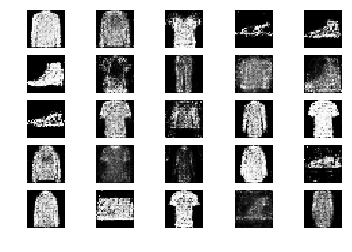

33401 [D loss: 0.584305, acc.: 73.44%] [G loss: 1.033983]
33402 [D loss: 0.633995, acc.: 65.62%] [G loss: 0.954114]
33403 [D loss: 0.618751, acc.: 68.75%] [G loss: 0.911110]
33404 [D loss: 0.679538, acc.: 59.38%] [G loss: 0.825443]
33405 [D loss: 0.639309, acc.: 65.62%] [G loss: 0.946182]
33406 [D loss: 0.622426, acc.: 70.31%] [G loss: 0.967986]
33407 [D loss: 0.669956, acc.: 56.25%] [G loss: 0.969409]
33408 [D loss: 0.686524, acc.: 54.69%] [G loss: 0.893001]
33409 [D loss: 0.646745, acc.: 59.38%] [G loss: 1.067037]
33410 [D loss: 0.641003, acc.: 62.50%] [G loss: 0.910189]
33411 [D loss: 0.671183, acc.: 60.94%] [G loss: 0.890939]
33412 [D loss: 0.710776, acc.: 50.00%] [G loss: 0.879424]
33413 [D loss: 0.663518, acc.: 59.38%] [G loss: 0.992801]
33414 [D loss: 0.654086, acc.: 54.69%] [G loss: 1.059714]
33415 [D loss: 0.650257, acc.: 56.25%] [G loss: 1.139771]
33416 [D loss: 0.653047, acc.: 65.62%] [G loss: 0.949954]
33417 [D loss: 0.621345, acc.: 60.94%] [G loss: 0.929728]
33418 [D loss:

33543 [D loss: 0.661067, acc.: 57.81%] [G loss: 1.003381]
33544 [D loss: 0.643042, acc.: 59.38%] [G loss: 1.133393]
33545 [D loss: 0.569225, acc.: 71.88%] [G loss: 0.996754]
33546 [D loss: 0.676394, acc.: 59.38%] [G loss: 0.856402]
33547 [D loss: 0.713544, acc.: 48.44%] [G loss: 0.929186]
33548 [D loss: 0.656971, acc.: 59.38%] [G loss: 0.978073]
33549 [D loss: 0.566747, acc.: 78.12%] [G loss: 0.868006]
33550 [D loss: 0.667542, acc.: 54.69%] [G loss: 0.992249]
33551 [D loss: 0.618739, acc.: 59.38%] [G loss: 0.940868]
33552 [D loss: 0.610246, acc.: 65.62%] [G loss: 0.931317]
33553 [D loss: 0.660619, acc.: 54.69%] [G loss: 0.862808]
33554 [D loss: 0.722694, acc.: 51.56%] [G loss: 0.984939]
33555 [D loss: 0.629602, acc.: 62.50%] [G loss: 0.916931]
33556 [D loss: 0.622494, acc.: 64.06%] [G loss: 0.943778]
33557 [D loss: 0.681277, acc.: 56.25%] [G loss: 0.947967]
33558 [D loss: 0.591123, acc.: 70.31%] [G loss: 0.997736]
33559 [D loss: 0.606646, acc.: 71.88%] [G loss: 0.926392]
33560 [D loss:

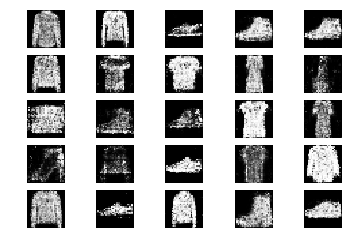

33601 [D loss: 0.646085, acc.: 62.50%] [G loss: 0.913904]
33602 [D loss: 0.562449, acc.: 71.88%] [G loss: 1.044672]
33603 [D loss: 0.656129, acc.: 53.12%] [G loss: 0.921841]
33604 [D loss: 0.624063, acc.: 64.06%] [G loss: 0.902446]
33605 [D loss: 0.693077, acc.: 57.81%] [G loss: 0.839431]
33606 [D loss: 0.614834, acc.: 67.19%] [G loss: 0.960988]
33607 [D loss: 0.682285, acc.: 54.69%] [G loss: 0.985144]
33608 [D loss: 0.690381, acc.: 53.12%] [G loss: 0.862557]
33609 [D loss: 0.733576, acc.: 50.00%] [G loss: 0.883106]
33610 [D loss: 0.632754, acc.: 57.81%] [G loss: 0.915283]
33611 [D loss: 0.601323, acc.: 64.06%] [G loss: 0.998302]
33612 [D loss: 0.635852, acc.: 57.81%] [G loss: 0.946804]
33613 [D loss: 0.614678, acc.: 67.19%] [G loss: 1.034661]
33614 [D loss: 0.666953, acc.: 53.12%] [G loss: 1.016611]
33615 [D loss: 0.669691, acc.: 57.81%] [G loss: 1.102862]
33616 [D loss: 0.668418, acc.: 59.38%] [G loss: 1.048652]
33617 [D loss: 0.683271, acc.: 54.69%] [G loss: 1.000347]
33618 [D loss:

33743 [D loss: 0.670174, acc.: 59.38%] [G loss: 1.058117]
33744 [D loss: 0.615480, acc.: 68.75%] [G loss: 0.924344]
33745 [D loss: 0.646996, acc.: 57.81%] [G loss: 1.016369]
33746 [D loss: 0.590043, acc.: 71.88%] [G loss: 0.978623]
33747 [D loss: 0.656140, acc.: 64.06%] [G loss: 0.974619]
33748 [D loss: 0.643124, acc.: 65.62%] [G loss: 0.971475]
33749 [D loss: 0.681788, acc.: 64.06%] [G loss: 0.990043]
33750 [D loss: 0.637395, acc.: 62.50%] [G loss: 0.941710]
33751 [D loss: 0.623091, acc.: 65.62%] [G loss: 0.935423]
33752 [D loss: 0.644112, acc.: 56.25%] [G loss: 1.028033]
33753 [D loss: 0.581635, acc.: 68.75%] [G loss: 0.885908]
33754 [D loss: 0.585918, acc.: 65.62%] [G loss: 0.917650]
33755 [D loss: 0.627091, acc.: 60.94%] [G loss: 0.979854]
33756 [D loss: 0.636587, acc.: 54.69%] [G loss: 1.013753]
33757 [D loss: 0.591540, acc.: 68.75%] [G loss: 0.968870]
33758 [D loss: 0.636114, acc.: 67.19%] [G loss: 0.933684]
33759 [D loss: 0.646742, acc.: 65.62%] [G loss: 0.948144]
33760 [D loss:

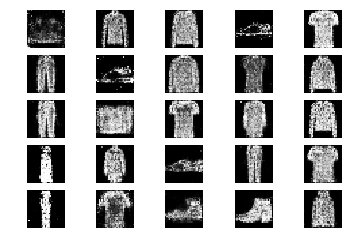

33801 [D loss: 0.623733, acc.: 65.62%] [G loss: 0.946486]
33802 [D loss: 0.594223, acc.: 75.00%] [G loss: 0.884351]
33803 [D loss: 0.683182, acc.: 64.06%] [G loss: 1.039001]
33804 [D loss: 0.528418, acc.: 78.12%] [G loss: 1.057734]
33805 [D loss: 0.590912, acc.: 68.75%] [G loss: 1.052547]
33806 [D loss: 0.645157, acc.: 62.50%] [G loss: 1.005991]
33807 [D loss: 0.627367, acc.: 54.69%] [G loss: 0.942837]
33808 [D loss: 0.565513, acc.: 71.88%] [G loss: 1.050887]
33809 [D loss: 0.607937, acc.: 73.44%] [G loss: 0.991282]
33810 [D loss: 0.628837, acc.: 62.50%] [G loss: 0.939368]
33811 [D loss: 0.643514, acc.: 60.94%] [G loss: 0.961219]
33812 [D loss: 0.680376, acc.: 56.25%] [G loss: 1.129436]
33813 [D loss: 0.732586, acc.: 50.00%] [G loss: 0.950626]
33814 [D loss: 0.678788, acc.: 60.94%] [G loss: 1.043267]
33815 [D loss: 0.656420, acc.: 64.06%] [G loss: 0.968276]
33816 [D loss: 0.739686, acc.: 46.88%] [G loss: 0.995415]
33817 [D loss: 0.592363, acc.: 65.62%] [G loss: 0.902747]
33818 [D loss:

33944 [D loss: 0.680830, acc.: 57.81%] [G loss: 0.936904]
33945 [D loss: 0.675678, acc.: 56.25%] [G loss: 0.952212]
33946 [D loss: 0.651825, acc.: 59.38%] [G loss: 0.968347]
33947 [D loss: 0.595373, acc.: 71.88%] [G loss: 1.001210]
33948 [D loss: 0.641149, acc.: 62.50%] [G loss: 0.945203]
33949 [D loss: 0.633899, acc.: 70.31%] [G loss: 0.944052]
33950 [D loss: 0.655540, acc.: 60.94%] [G loss: 0.908336]
33951 [D loss: 0.693176, acc.: 57.81%] [G loss: 0.979879]
33952 [D loss: 0.622852, acc.: 62.50%] [G loss: 0.867559]
33953 [D loss: 0.652872, acc.: 60.94%] [G loss: 0.947925]
33954 [D loss: 0.621337, acc.: 64.06%] [G loss: 0.962470]
33955 [D loss: 0.625408, acc.: 67.19%] [G loss: 0.953822]
33956 [D loss: 0.654532, acc.: 62.50%] [G loss: 0.935832]
33957 [D loss: 0.603454, acc.: 65.62%] [G loss: 1.046741]
33958 [D loss: 0.624963, acc.: 60.94%] [G loss: 0.994330]
33959 [D loss: 0.614558, acc.: 60.94%] [G loss: 0.971395]
33960 [D loss: 0.605916, acc.: 68.75%] [G loss: 1.006705]
33961 [D loss:

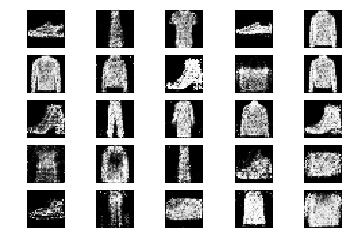

34001 [D loss: 0.675505, acc.: 59.38%] [G loss: 0.990221]
34002 [D loss: 0.671197, acc.: 56.25%] [G loss: 0.993906]
34003 [D loss: 0.678893, acc.: 59.38%] [G loss: 0.869340]
34004 [D loss: 0.621138, acc.: 57.81%] [G loss: 0.962737]
34005 [D loss: 0.702225, acc.: 59.38%] [G loss: 0.928831]
34006 [D loss: 0.716361, acc.: 48.44%] [G loss: 0.937048]
34007 [D loss: 0.657293, acc.: 59.38%] [G loss: 0.971449]
34008 [D loss: 0.647531, acc.: 67.19%] [G loss: 1.009134]
34009 [D loss: 0.599392, acc.: 65.62%] [G loss: 1.017709]
34010 [D loss: 0.663177, acc.: 57.81%] [G loss: 1.002544]
34011 [D loss: 0.629780, acc.: 59.38%] [G loss: 0.976606]
34012 [D loss: 0.562596, acc.: 78.12%] [G loss: 0.955257]
34013 [D loss: 0.599345, acc.: 65.62%] [G loss: 0.984034]
34014 [D loss: 0.658373, acc.: 62.50%] [G loss: 0.980146]
34015 [D loss: 0.628452, acc.: 60.94%] [G loss: 0.888357]
34016 [D loss: 0.567441, acc.: 70.31%] [G loss: 1.022431]
34017 [D loss: 0.667998, acc.: 62.50%] [G loss: 0.898721]
34018 [D loss:

34144 [D loss: 0.570924, acc.: 67.19%] [G loss: 0.932489]
34145 [D loss: 0.627109, acc.: 71.88%] [G loss: 0.991276]
34146 [D loss: 0.601453, acc.: 64.06%] [G loss: 0.910962]
34147 [D loss: 0.604184, acc.: 67.19%] [G loss: 1.041347]
34148 [D loss: 0.695095, acc.: 56.25%] [G loss: 0.968194]
34149 [D loss: 0.602512, acc.: 67.19%] [G loss: 0.920864]
34150 [D loss: 0.672790, acc.: 53.12%] [G loss: 1.029862]
34151 [D loss: 0.607288, acc.: 70.31%] [G loss: 0.902551]
34152 [D loss: 0.664968, acc.: 56.25%] [G loss: 0.912482]
34153 [D loss: 0.708677, acc.: 51.56%] [G loss: 0.980405]
34154 [D loss: 0.667760, acc.: 64.06%] [G loss: 1.069104]
34155 [D loss: 0.632846, acc.: 56.25%] [G loss: 1.021276]
34156 [D loss: 0.662193, acc.: 59.38%] [G loss: 1.016294]
34157 [D loss: 0.672550, acc.: 59.38%] [G loss: 0.973157]
34158 [D loss: 0.693220, acc.: 54.69%] [G loss: 0.926052]
34159 [D loss: 0.611240, acc.: 65.62%] [G loss: 0.893658]
34160 [D loss: 0.664946, acc.: 53.12%] [G loss: 0.939137]
34161 [D loss:

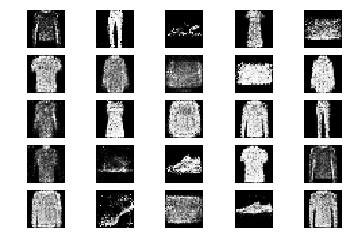

34201 [D loss: 0.581440, acc.: 64.06%] [G loss: 1.030766]
34202 [D loss: 0.615558, acc.: 64.06%] [G loss: 0.980991]
34203 [D loss: 0.661979, acc.: 62.50%] [G loss: 0.907440]
34204 [D loss: 0.694455, acc.: 62.50%] [G loss: 0.908029]
34205 [D loss: 0.622565, acc.: 71.88%] [G loss: 0.920872]
34206 [D loss: 0.674336, acc.: 59.38%] [G loss: 1.074781]
34207 [D loss: 0.604073, acc.: 70.31%] [G loss: 1.013675]
34208 [D loss: 0.618696, acc.: 68.75%] [G loss: 0.887375]
34209 [D loss: 0.638080, acc.: 62.50%] [G loss: 0.936948]
34210 [D loss: 0.607448, acc.: 65.62%] [G loss: 0.948209]
34211 [D loss: 0.603953, acc.: 65.62%] [G loss: 0.990034]
34212 [D loss: 0.632957, acc.: 64.06%] [G loss: 0.923224]
34213 [D loss: 0.577891, acc.: 70.31%] [G loss: 1.006069]
34214 [D loss: 0.599117, acc.: 71.88%] [G loss: 0.934296]
34215 [D loss: 0.627382, acc.: 60.94%] [G loss: 1.006758]
34216 [D loss: 0.619980, acc.: 64.06%] [G loss: 0.980684]
34217 [D loss: 0.653362, acc.: 64.06%] [G loss: 0.960208]
34218 [D loss:

34343 [D loss: 0.660030, acc.: 59.38%] [G loss: 1.022887]
34344 [D loss: 0.675660, acc.: 64.06%] [G loss: 0.962170]
34345 [D loss: 0.627373, acc.: 64.06%] [G loss: 0.980157]
34346 [D loss: 0.655744, acc.: 64.06%] [G loss: 0.979123]
34347 [D loss: 0.644378, acc.: 59.38%] [G loss: 0.991311]
34348 [D loss: 0.625641, acc.: 65.62%] [G loss: 1.031600]
34349 [D loss: 0.566914, acc.: 73.44%] [G loss: 1.039811]
34350 [D loss: 0.709217, acc.: 51.56%] [G loss: 1.019796]
34351 [D loss: 0.610463, acc.: 71.88%] [G loss: 0.971973]
34352 [D loss: 0.690810, acc.: 59.38%] [G loss: 0.858334]
34353 [D loss: 0.685492, acc.: 57.81%] [G loss: 0.933996]
34354 [D loss: 0.626703, acc.: 68.75%] [G loss: 0.944448]
34355 [D loss: 0.592833, acc.: 68.75%] [G loss: 0.898446]
34356 [D loss: 0.648743, acc.: 59.38%] [G loss: 1.034778]
34357 [D loss: 0.636932, acc.: 62.50%] [G loss: 1.087160]
34358 [D loss: 0.636345, acc.: 64.06%] [G loss: 1.105668]
34359 [D loss: 0.595534, acc.: 67.19%] [G loss: 1.024623]
34360 [D loss:

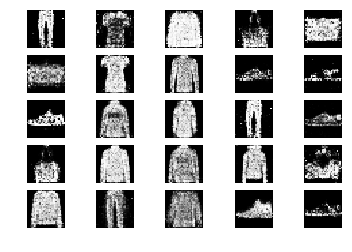

34401 [D loss: 0.657423, acc.: 64.06%] [G loss: 0.937865]
34402 [D loss: 0.590133, acc.: 71.88%] [G loss: 0.983982]
34403 [D loss: 0.626085, acc.: 67.19%] [G loss: 1.068933]
34404 [D loss: 0.563883, acc.: 70.31%] [G loss: 1.066123]
34405 [D loss: 0.639572, acc.: 70.31%] [G loss: 0.959380]
34406 [D loss: 0.631622, acc.: 64.06%] [G loss: 0.879865]
34407 [D loss: 0.608478, acc.: 71.88%] [G loss: 0.925229]
34408 [D loss: 0.720790, acc.: 60.94%] [G loss: 1.044892]
34409 [D loss: 0.631900, acc.: 57.81%] [G loss: 1.006481]
34410 [D loss: 0.597730, acc.: 73.44%] [G loss: 0.980955]
34411 [D loss: 0.618926, acc.: 64.06%] [G loss: 0.878919]
34412 [D loss: 0.669821, acc.: 59.38%] [G loss: 0.859913]
34413 [D loss: 0.600892, acc.: 65.62%] [G loss: 0.944775]
34414 [D loss: 0.593588, acc.: 73.44%] [G loss: 0.988234]
34415 [D loss: 0.680039, acc.: 56.25%] [G loss: 0.957314]
34416 [D loss: 0.670681, acc.: 53.12%] [G loss: 0.962096]
34417 [D loss: 0.669974, acc.: 62.50%] [G loss: 0.963667]
34418 [D loss:

34543 [D loss: 0.667727, acc.: 59.38%] [G loss: 0.906765]
34544 [D loss: 0.707595, acc.: 48.44%] [G loss: 0.960996]
34545 [D loss: 0.656612, acc.: 54.69%] [G loss: 1.045007]
34546 [D loss: 0.636677, acc.: 64.06%] [G loss: 1.018381]
34547 [D loss: 0.692000, acc.: 57.81%] [G loss: 0.932368]
34548 [D loss: 0.610950, acc.: 65.62%] [G loss: 0.961340]
34549 [D loss: 0.583575, acc.: 68.75%] [G loss: 1.115811]
34550 [D loss: 0.661204, acc.: 59.38%] [G loss: 0.957565]
34551 [D loss: 0.601645, acc.: 62.50%] [G loss: 0.923653]
34552 [D loss: 0.678451, acc.: 67.19%] [G loss: 1.030689]
34553 [D loss: 0.666508, acc.: 59.38%] [G loss: 0.956080]
34554 [D loss: 0.592854, acc.: 71.88%] [G loss: 0.973149]
34555 [D loss: 0.623891, acc.: 73.44%] [G loss: 0.993982]
34556 [D loss: 0.705056, acc.: 62.50%] [G loss: 0.950029]
34557 [D loss: 0.664750, acc.: 62.50%] [G loss: 0.902287]
34558 [D loss: 0.634853, acc.: 65.62%] [G loss: 0.877599]
34559 [D loss: 0.661584, acc.: 60.94%] [G loss: 0.973331]
34560 [D loss:

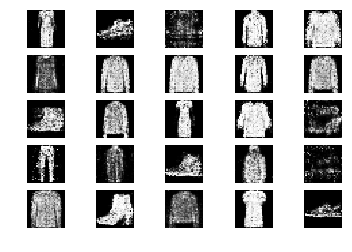

34601 [D loss: 0.601250, acc.: 75.00%] [G loss: 0.968211]
34602 [D loss: 0.558284, acc.: 65.62%] [G loss: 1.011710]
34603 [D loss: 0.641156, acc.: 62.50%] [G loss: 1.025853]
34604 [D loss: 0.700900, acc.: 45.31%] [G loss: 0.906814]
34605 [D loss: 0.708933, acc.: 54.69%] [G loss: 0.863336]
34606 [D loss: 0.571897, acc.: 70.31%] [G loss: 0.941464]
34607 [D loss: 0.644926, acc.: 60.94%] [G loss: 0.983611]
34608 [D loss: 0.661295, acc.: 67.19%] [G loss: 0.948343]
34609 [D loss: 0.706357, acc.: 53.12%] [G loss: 0.963614]
34610 [D loss: 0.674638, acc.: 64.06%] [G loss: 1.021565]
34611 [D loss: 0.608472, acc.: 62.50%] [G loss: 1.003917]
34612 [D loss: 0.635216, acc.: 62.50%] [G loss: 1.044659]
34613 [D loss: 0.615558, acc.: 67.19%] [G loss: 0.911421]
34614 [D loss: 0.613291, acc.: 65.62%] [G loss: 1.013695]
34615 [D loss: 0.619366, acc.: 65.62%] [G loss: 0.923679]
34616 [D loss: 0.683966, acc.: 56.25%] [G loss: 0.911186]
34617 [D loss: 0.723621, acc.: 54.69%] [G loss: 0.986345]
34618 [D loss:

34743 [D loss: 0.593046, acc.: 68.75%] [G loss: 1.009269]
34744 [D loss: 0.587122, acc.: 70.31%] [G loss: 1.068623]
34745 [D loss: 0.636642, acc.: 59.38%] [G loss: 0.900285]
34746 [D loss: 0.609768, acc.: 71.88%] [G loss: 1.060709]
34747 [D loss: 0.643352, acc.: 59.38%] [G loss: 0.910500]
34748 [D loss: 0.579856, acc.: 65.62%] [G loss: 0.938151]
34749 [D loss: 0.614660, acc.: 62.50%] [G loss: 0.894268]
34750 [D loss: 0.619108, acc.: 65.62%] [G loss: 0.998004]
34751 [D loss: 0.695550, acc.: 54.69%] [G loss: 0.946410]
34752 [D loss: 0.740284, acc.: 51.56%] [G loss: 0.932756]
34753 [D loss: 0.614407, acc.: 60.94%] [G loss: 0.935250]
34754 [D loss: 0.665434, acc.: 56.25%] [G loss: 0.940283]
34755 [D loss: 0.646524, acc.: 62.50%] [G loss: 0.910880]
34756 [D loss: 0.630863, acc.: 64.06%] [G loss: 0.999849]
34757 [D loss: 0.607494, acc.: 68.75%] [G loss: 0.867752]
34758 [D loss: 0.616041, acc.: 62.50%] [G loss: 0.993900]
34759 [D loss: 0.664511, acc.: 59.38%] [G loss: 0.993013]
34760 [D loss:

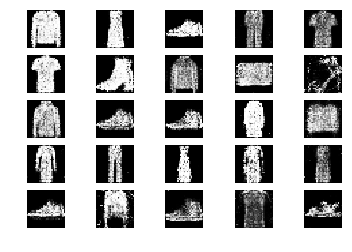

34801 [D loss: 0.618894, acc.: 64.06%] [G loss: 1.019294]
34802 [D loss: 0.610811, acc.: 62.50%] [G loss: 0.895881]
34803 [D loss: 0.658119, acc.: 60.94%] [G loss: 0.947479]
34804 [D loss: 0.611191, acc.: 70.31%] [G loss: 1.050548]
34805 [D loss: 0.610467, acc.: 67.19%] [G loss: 0.969941]
34806 [D loss: 0.566066, acc.: 68.75%] [G loss: 0.957247]
34807 [D loss: 0.629084, acc.: 60.94%] [G loss: 0.860259]
34808 [D loss: 0.640181, acc.: 64.06%] [G loss: 0.944002]
34809 [D loss: 0.623882, acc.: 64.06%] [G loss: 0.911651]
34810 [D loss: 0.676567, acc.: 54.69%] [G loss: 0.985198]
34811 [D loss: 0.683211, acc.: 62.50%] [G loss: 0.949960]
34812 [D loss: 0.613067, acc.: 67.19%] [G loss: 1.045400]
34813 [D loss: 0.601619, acc.: 76.56%] [G loss: 0.962105]
34814 [D loss: 0.684214, acc.: 59.38%] [G loss: 0.871035]
34815 [D loss: 0.623501, acc.: 62.50%] [G loss: 1.036120]
34816 [D loss: 0.620306, acc.: 59.38%] [G loss: 1.037913]
34817 [D loss: 0.491611, acc.: 81.25%] [G loss: 1.013049]
34818 [D loss:

34943 [D loss: 0.667041, acc.: 62.50%] [G loss: 1.001978]
34944 [D loss: 0.660591, acc.: 60.94%] [G loss: 1.041536]
34945 [D loss: 0.584906, acc.: 70.31%] [G loss: 0.893946]
34946 [D loss: 0.721499, acc.: 56.25%] [G loss: 0.947292]
34947 [D loss: 0.605964, acc.: 60.94%] [G loss: 0.828547]
34948 [D loss: 0.645872, acc.: 56.25%] [G loss: 1.028276]
34949 [D loss: 0.623611, acc.: 67.19%] [G loss: 0.837456]
34950 [D loss: 0.646834, acc.: 67.19%] [G loss: 0.988618]
34951 [D loss: 0.653734, acc.: 60.94%] [G loss: 0.933296]
34952 [D loss: 0.705428, acc.: 60.94%] [G loss: 1.019084]
34953 [D loss: 0.626796, acc.: 62.50%] [G loss: 0.924814]
34954 [D loss: 0.665932, acc.: 50.00%] [G loss: 0.967110]
34955 [D loss: 0.720170, acc.: 46.88%] [G loss: 0.839253]
34956 [D loss: 0.647187, acc.: 57.81%] [G loss: 0.929668]
34957 [D loss: 0.716593, acc.: 48.44%] [G loss: 0.847301]
34958 [D loss: 0.656992, acc.: 59.38%] [G loss: 0.890868]
34959 [D loss: 0.681358, acc.: 59.38%] [G loss: 0.933193]
34960 [D loss:

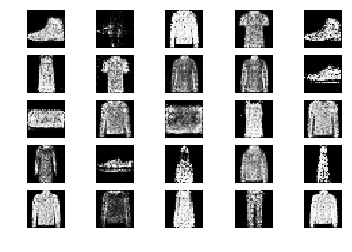

35001 [D loss: 0.609659, acc.: 70.31%] [G loss: 0.928000]
35002 [D loss: 0.595561, acc.: 64.06%] [G loss: 1.023506]
35003 [D loss: 0.658840, acc.: 56.25%] [G loss: 0.943903]
35004 [D loss: 0.584085, acc.: 68.75%] [G loss: 0.877318]
35005 [D loss: 0.651588, acc.: 68.75%] [G loss: 0.937529]
35006 [D loss: 0.634295, acc.: 60.94%] [G loss: 0.996594]
35007 [D loss: 0.599752, acc.: 68.75%] [G loss: 0.931880]
35008 [D loss: 0.585939, acc.: 73.44%] [G loss: 0.985149]
35009 [D loss: 0.636410, acc.: 65.62%] [G loss: 0.937583]
35010 [D loss: 0.665340, acc.: 59.38%] [G loss: 0.837462]
35011 [D loss: 0.673515, acc.: 59.38%] [G loss: 0.928290]
35012 [D loss: 0.609583, acc.: 62.50%] [G loss: 1.011851]
35013 [D loss: 0.589062, acc.: 65.62%] [G loss: 0.981468]
35014 [D loss: 0.645871, acc.: 56.25%] [G loss: 1.038091]
35015 [D loss: 0.581800, acc.: 71.88%] [G loss: 1.038583]
35016 [D loss: 0.579892, acc.: 70.31%] [G loss: 1.067698]
35017 [D loss: 0.688207, acc.: 57.81%] [G loss: 0.965092]
35018 [D loss:

35144 [D loss: 0.710512, acc.: 48.44%] [G loss: 0.916918]
35145 [D loss: 0.601487, acc.: 67.19%] [G loss: 0.909064]
35146 [D loss: 0.619874, acc.: 64.06%] [G loss: 0.918103]
35147 [D loss: 0.619573, acc.: 64.06%] [G loss: 0.938484]
35148 [D loss: 0.598168, acc.: 67.19%] [G loss: 1.052370]
35149 [D loss: 0.589716, acc.: 79.69%] [G loss: 0.870676]
35150 [D loss: 0.670878, acc.: 56.25%] [G loss: 0.909353]
35151 [D loss: 0.587370, acc.: 70.31%] [G loss: 0.975141]
35152 [D loss: 0.574590, acc.: 73.44%] [G loss: 1.080206]
35153 [D loss: 0.640618, acc.: 64.06%] [G loss: 1.098727]
35154 [D loss: 0.589638, acc.: 73.44%] [G loss: 0.911402]
35155 [D loss: 0.620388, acc.: 67.19%] [G loss: 1.012710]
35156 [D loss: 0.645307, acc.: 57.81%] [G loss: 0.822858]
35157 [D loss: 0.605760, acc.: 65.62%] [G loss: 1.027136]
35158 [D loss: 0.639096, acc.: 64.06%] [G loss: 0.935373]
35159 [D loss: 0.618795, acc.: 73.44%] [G loss: 1.117980]
35160 [D loss: 0.635327, acc.: 59.38%] [G loss: 1.008492]
35161 [D loss:

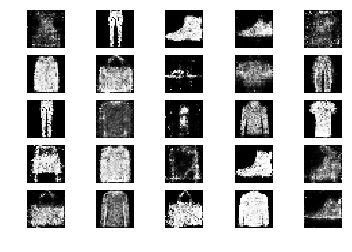

35201 [D loss: 0.595370, acc.: 67.19%] [G loss: 1.136554]
35202 [D loss: 0.626727, acc.: 65.62%] [G loss: 0.951360]
35203 [D loss: 0.636696, acc.: 64.06%] [G loss: 0.979863]
35204 [D loss: 0.687506, acc.: 53.12%] [G loss: 0.975799]
35205 [D loss: 0.654465, acc.: 62.50%] [G loss: 0.891198]
35206 [D loss: 0.700480, acc.: 56.25%] [G loss: 1.041425]
35207 [D loss: 0.633783, acc.: 62.50%] [G loss: 0.939977]
35208 [D loss: 0.664818, acc.: 67.19%] [G loss: 1.085628]
35209 [D loss: 0.662264, acc.: 65.62%] [G loss: 0.967720]
35210 [D loss: 0.694625, acc.: 51.56%] [G loss: 1.061284]
35211 [D loss: 0.626808, acc.: 60.94%] [G loss: 0.968976]
35212 [D loss: 0.719750, acc.: 57.81%] [G loss: 0.997521]
35213 [D loss: 0.594641, acc.: 75.00%] [G loss: 1.082848]
35214 [D loss: 0.622187, acc.: 68.75%] [G loss: 0.980834]
35215 [D loss: 0.616068, acc.: 64.06%] [G loss: 1.094604]
35216 [D loss: 0.698700, acc.: 48.44%] [G loss: 1.029209]
35217 [D loss: 0.656049, acc.: 65.62%] [G loss: 0.960385]
35218 [D loss:

35345 [D loss: 0.624625, acc.: 62.50%] [G loss: 1.033601]
35346 [D loss: 0.648024, acc.: 67.19%] [G loss: 0.908711]
35347 [D loss: 0.600058, acc.: 73.44%] [G loss: 1.005524]
35348 [D loss: 0.644293, acc.: 60.94%] [G loss: 0.994289]
35349 [D loss: 0.604835, acc.: 65.62%] [G loss: 0.998613]
35350 [D loss: 0.629081, acc.: 67.19%] [G loss: 1.101175]
35351 [D loss: 0.637615, acc.: 59.38%] [G loss: 1.038514]
35352 [D loss: 0.623045, acc.: 62.50%] [G loss: 0.905295]
35353 [D loss: 0.670401, acc.: 56.25%] [G loss: 1.044207]
35354 [D loss: 0.606989, acc.: 71.88%] [G loss: 1.030021]
35355 [D loss: 0.652071, acc.: 57.81%] [G loss: 0.931939]
35356 [D loss: 0.663410, acc.: 64.06%] [G loss: 0.931003]
35357 [D loss: 0.660116, acc.: 59.38%] [G loss: 1.017657]
35358 [D loss: 0.635629, acc.: 65.62%] [G loss: 1.030576]
35359 [D loss: 0.599484, acc.: 60.94%] [G loss: 1.064465]
35360 [D loss: 0.631308, acc.: 62.50%] [G loss: 1.132673]
35361 [D loss: 0.655860, acc.: 62.50%] [G loss: 0.923228]
35362 [D loss:

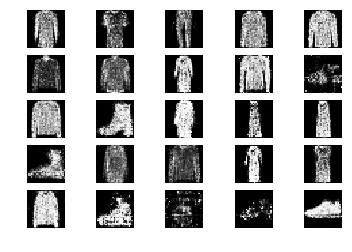

35401 [D loss: 0.557589, acc.: 73.44%] [G loss: 1.031580]
35402 [D loss: 0.696338, acc.: 70.31%] [G loss: 1.137252]
35403 [D loss: 0.621473, acc.: 60.94%] [G loss: 0.988273]
35404 [D loss: 0.656659, acc.: 62.50%] [G loss: 0.985478]
35405 [D loss: 0.609598, acc.: 67.19%] [G loss: 0.925449]
35406 [D loss: 0.701186, acc.: 60.94%] [G loss: 0.934682]
35407 [D loss: 0.660423, acc.: 62.50%] [G loss: 0.960483]
35408 [D loss: 0.669764, acc.: 60.94%] [G loss: 1.022389]
35409 [D loss: 0.700665, acc.: 50.00%] [G loss: 1.005549]
35410 [D loss: 0.647344, acc.: 57.81%] [G loss: 1.012845]
35411 [D loss: 0.641526, acc.: 62.50%] [G loss: 0.914763]
35412 [D loss: 0.646999, acc.: 62.50%] [G loss: 0.939123]
35413 [D loss: 0.688502, acc.: 59.38%] [G loss: 0.903668]
35414 [D loss: 0.716374, acc.: 56.25%] [G loss: 0.975351]
35415 [D loss: 0.615660, acc.: 71.88%] [G loss: 0.947385]
35416 [D loss: 0.591242, acc.: 64.06%] [G loss: 0.953604]
35417 [D loss: 0.543781, acc.: 71.88%] [G loss: 0.957194]
35418 [D loss:

35543 [D loss: 0.648871, acc.: 60.94%] [G loss: 0.778916]
35544 [D loss: 0.631634, acc.: 60.94%] [G loss: 0.992782]
35545 [D loss: 0.698178, acc.: 57.81%] [G loss: 0.944732]
35546 [D loss: 0.638808, acc.: 60.94%] [G loss: 0.959112]
35547 [D loss: 0.606822, acc.: 70.31%] [G loss: 0.978379]
35548 [D loss: 0.656967, acc.: 56.25%] [G loss: 0.934051]
35549 [D loss: 0.561619, acc.: 71.88%] [G loss: 1.035992]
35550 [D loss: 0.597858, acc.: 64.06%] [G loss: 0.935885]
35551 [D loss: 0.584115, acc.: 65.62%] [G loss: 0.896707]
35552 [D loss: 0.642401, acc.: 73.44%] [G loss: 0.991160]
35553 [D loss: 0.592480, acc.: 71.88%] [G loss: 0.888617]
35554 [D loss: 0.693003, acc.: 54.69%] [G loss: 0.881409]
35555 [D loss: 0.625916, acc.: 65.62%] [G loss: 0.950960]
35556 [D loss: 0.634773, acc.: 65.62%] [G loss: 0.984028]
35557 [D loss: 0.587103, acc.: 71.88%] [G loss: 0.943325]
35558 [D loss: 0.643578, acc.: 62.50%] [G loss: 0.953239]
35559 [D loss: 0.591112, acc.: 62.50%] [G loss: 1.027936]
35560 [D loss:

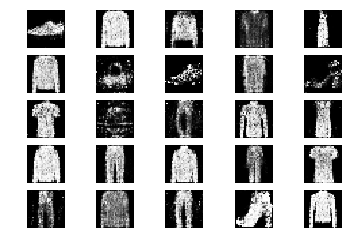

35601 [D loss: 0.602368, acc.: 68.75%] [G loss: 0.988894]
35602 [D loss: 0.665369, acc.: 60.94%] [G loss: 1.043679]
35603 [D loss: 0.636608, acc.: 64.06%] [G loss: 1.001065]
35604 [D loss: 0.699188, acc.: 64.06%] [G loss: 0.984750]
35605 [D loss: 0.556682, acc.: 71.88%] [G loss: 1.044458]
35606 [D loss: 0.635103, acc.: 67.19%] [G loss: 0.913727]
35607 [D loss: 0.652396, acc.: 64.06%] [G loss: 0.982953]
35608 [D loss: 0.678654, acc.: 59.38%] [G loss: 0.944370]
35609 [D loss: 0.658848, acc.: 62.50%] [G loss: 0.940889]
35610 [D loss: 0.596608, acc.: 71.88%] [G loss: 1.021608]
35611 [D loss: 0.584228, acc.: 68.75%] [G loss: 1.033251]
35612 [D loss: 0.563986, acc.: 71.88%] [G loss: 1.010105]
35613 [D loss: 0.590911, acc.: 71.88%] [G loss: 1.047515]
35614 [D loss: 0.603524, acc.: 67.19%] [G loss: 1.043866]
35615 [D loss: 0.595904, acc.: 59.38%] [G loss: 0.954891]
35616 [D loss: 0.588174, acc.: 70.31%] [G loss: 0.998423]
35617 [D loss: 0.637464, acc.: 62.50%] [G loss: 1.012259]
35618 [D loss:

35743 [D loss: 0.640057, acc.: 64.06%] [G loss: 1.008573]
35744 [D loss: 0.630055, acc.: 62.50%] [G loss: 0.996487]
35745 [D loss: 0.665116, acc.: 54.69%] [G loss: 0.960680]
35746 [D loss: 0.655336, acc.: 57.81%] [G loss: 0.922577]
35747 [D loss: 0.630299, acc.: 57.81%] [G loss: 1.115018]
35748 [D loss: 0.575991, acc.: 73.44%] [G loss: 1.040543]
35749 [D loss: 0.603513, acc.: 67.19%] [G loss: 0.982488]
35750 [D loss: 0.594125, acc.: 67.19%] [G loss: 0.942520]
35751 [D loss: 0.569528, acc.: 67.19%] [G loss: 1.007612]
35752 [D loss: 0.650422, acc.: 68.75%] [G loss: 0.984492]
35753 [D loss: 0.629366, acc.: 64.06%] [G loss: 0.926456]
35754 [D loss: 0.658880, acc.: 60.94%] [G loss: 1.030463]
35755 [D loss: 0.633303, acc.: 60.94%] [G loss: 1.008100]
35756 [D loss: 0.610632, acc.: 59.38%] [G loss: 1.029141]
35757 [D loss: 0.580764, acc.: 76.56%] [G loss: 0.980476]
35758 [D loss: 0.590782, acc.: 76.56%] [G loss: 0.932764]
35759 [D loss: 0.655113, acc.: 65.62%] [G loss: 1.037130]
35760 [D loss:

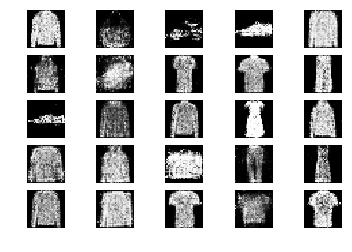

35801 [D loss: 0.606970, acc.: 62.50%] [G loss: 0.933055]
35802 [D loss: 0.606098, acc.: 65.62%] [G loss: 0.896691]
35803 [D loss: 0.609970, acc.: 71.88%] [G loss: 0.983593]
35804 [D loss: 0.593571, acc.: 73.44%] [G loss: 0.904077]
35805 [D loss: 0.621053, acc.: 64.06%] [G loss: 0.929521]
35806 [D loss: 0.698512, acc.: 59.38%] [G loss: 1.061319]
35807 [D loss: 0.627128, acc.: 67.19%] [G loss: 0.994695]
35808 [D loss: 0.614214, acc.: 65.62%] [G loss: 1.070654]
35809 [D loss: 0.749220, acc.: 56.25%] [G loss: 0.940790]
35810 [D loss: 0.690960, acc.: 54.69%] [G loss: 0.937481]
35811 [D loss: 0.674076, acc.: 57.81%] [G loss: 1.006664]
35812 [D loss: 0.614637, acc.: 68.75%] [G loss: 0.962642]
35813 [D loss: 0.622970, acc.: 68.75%] [G loss: 0.918464]
35814 [D loss: 0.625088, acc.: 62.50%] [G loss: 1.015910]
35815 [D loss: 0.619144, acc.: 64.06%] [G loss: 0.989939]
35816 [D loss: 0.626864, acc.: 65.62%] [G loss: 1.065872]
35817 [D loss: 0.574253, acc.: 67.19%] [G loss: 0.904182]
35818 [D loss:

35944 [D loss: 0.658180, acc.: 57.81%] [G loss: 0.903659]
35945 [D loss: 0.675977, acc.: 59.38%] [G loss: 0.976900]
35946 [D loss: 0.663361, acc.: 67.19%] [G loss: 0.910306]
35947 [D loss: 0.637268, acc.: 57.81%] [G loss: 0.947135]
35948 [D loss: 0.610674, acc.: 67.19%] [G loss: 0.947780]
35949 [D loss: 0.652958, acc.: 64.06%] [G loss: 0.931364]
35950 [D loss: 0.659596, acc.: 64.06%] [G loss: 0.981309]
35951 [D loss: 0.654548, acc.: 57.81%] [G loss: 1.015500]
35952 [D loss: 0.581758, acc.: 73.44%] [G loss: 1.046458]
35953 [D loss: 0.545596, acc.: 76.56%] [G loss: 1.079782]
35954 [D loss: 0.585280, acc.: 67.19%] [G loss: 1.032135]
35955 [D loss: 0.728911, acc.: 56.25%] [G loss: 0.996663]
35956 [D loss: 0.644397, acc.: 68.75%] [G loss: 0.985377]
35957 [D loss: 0.630892, acc.: 60.94%] [G loss: 0.927948]
35958 [D loss: 0.677241, acc.: 53.12%] [G loss: 0.864503]
35959 [D loss: 0.587015, acc.: 70.31%] [G loss: 0.994504]
35960 [D loss: 0.684733, acc.: 56.25%] [G loss: 1.003258]
35961 [D loss:

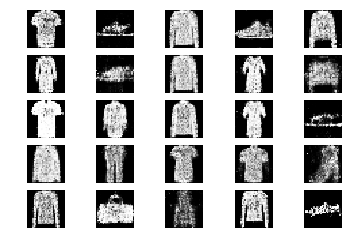

36001 [D loss: 0.699552, acc.: 54.69%] [G loss: 1.002836]
36002 [D loss: 0.698189, acc.: 60.94%] [G loss: 1.079772]
36003 [D loss: 0.644521, acc.: 57.81%] [G loss: 1.087380]
36004 [D loss: 0.669679, acc.: 62.50%] [G loss: 1.121667]
36005 [D loss: 0.672771, acc.: 59.38%] [G loss: 1.015932]
36006 [D loss: 0.692430, acc.: 62.50%] [G loss: 0.950059]
36007 [D loss: 0.778334, acc.: 46.88%] [G loss: 0.888639]
36008 [D loss: 0.596858, acc.: 64.06%] [G loss: 0.936989]
36009 [D loss: 0.656417, acc.: 53.12%] [G loss: 1.032044]
36010 [D loss: 0.628390, acc.: 57.81%] [G loss: 1.023920]
36011 [D loss: 0.666723, acc.: 59.38%] [G loss: 0.972958]
36012 [D loss: 0.668058, acc.: 67.19%] [G loss: 0.996161]
36013 [D loss: 0.606822, acc.: 65.62%] [G loss: 0.954614]
36014 [D loss: 0.620213, acc.: 60.94%] [G loss: 0.969374]
36015 [D loss: 0.638621, acc.: 62.50%] [G loss: 0.972637]
36016 [D loss: 0.564094, acc.: 73.44%] [G loss: 0.940201]
36017 [D loss: 0.686851, acc.: 59.38%] [G loss: 0.916085]
36018 [D loss:

36144 [D loss: 0.662095, acc.: 60.94%] [G loss: 0.966402]
36145 [D loss: 0.629404, acc.: 62.50%] [G loss: 1.030272]
36146 [D loss: 0.672533, acc.: 59.38%] [G loss: 0.869148]
36147 [D loss: 0.637235, acc.: 56.25%] [G loss: 0.966980]
36148 [D loss: 0.608414, acc.: 62.50%] [G loss: 0.946523]
36149 [D loss: 0.610858, acc.: 65.62%] [G loss: 0.954613]
36150 [D loss: 0.559763, acc.: 76.56%] [G loss: 1.057375]
36151 [D loss: 0.641455, acc.: 68.75%] [G loss: 1.059278]
36152 [D loss: 0.660031, acc.: 67.19%] [G loss: 1.017019]
36153 [D loss: 0.666493, acc.: 70.31%] [G loss: 0.947935]
36154 [D loss: 0.682937, acc.: 57.81%] [G loss: 0.893730]
36155 [D loss: 0.613497, acc.: 59.38%] [G loss: 0.971731]
36156 [D loss: 0.644280, acc.: 59.38%] [G loss: 0.931448]
36157 [D loss: 0.601384, acc.: 68.75%] [G loss: 0.990481]
36158 [D loss: 0.625751, acc.: 65.62%] [G loss: 1.030548]
36159 [D loss: 0.588449, acc.: 67.19%] [G loss: 1.020693]
36160 [D loss: 0.634042, acc.: 60.94%] [G loss: 0.965198]
36161 [D loss:

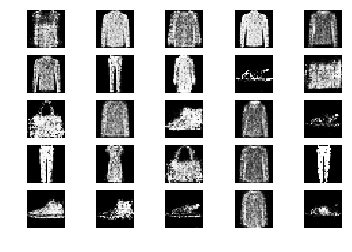

36201 [D loss: 0.655277, acc.: 54.69%] [G loss: 1.043570]
36202 [D loss: 0.632929, acc.: 62.50%] [G loss: 1.080716]
36203 [D loss: 0.716196, acc.: 59.38%] [G loss: 0.978786]
36204 [D loss: 0.630046, acc.: 60.94%] [G loss: 1.008279]
36205 [D loss: 0.609781, acc.: 62.50%] [G loss: 0.885885]
36206 [D loss: 0.617863, acc.: 65.62%] [G loss: 0.961493]
36207 [D loss: 0.668181, acc.: 60.94%] [G loss: 0.989426]
36208 [D loss: 0.618087, acc.: 65.62%] [G loss: 1.003248]
36209 [D loss: 0.689077, acc.: 51.56%] [G loss: 1.000542]
36210 [D loss: 0.589242, acc.: 64.06%] [G loss: 1.033571]
36211 [D loss: 0.662593, acc.: 57.81%] [G loss: 0.916724]
36212 [D loss: 0.674907, acc.: 64.06%] [G loss: 1.031830]
36213 [D loss: 0.697543, acc.: 53.12%] [G loss: 1.064204]
36214 [D loss: 0.630588, acc.: 67.19%] [G loss: 1.064572]
36215 [D loss: 0.609203, acc.: 70.31%] [G loss: 1.053659]
36216 [D loss: 0.627266, acc.: 64.06%] [G loss: 0.890502]
36217 [D loss: 0.698456, acc.: 64.06%] [G loss: 1.165793]
36218 [D loss:

36345 [D loss: 0.582943, acc.: 64.06%] [G loss: 0.941042]
36346 [D loss: 0.546418, acc.: 76.56%] [G loss: 1.104376]
36347 [D loss: 0.603276, acc.: 64.06%] [G loss: 0.948163]
36348 [D loss: 0.614072, acc.: 65.62%] [G loss: 0.901093]
36349 [D loss: 0.669921, acc.: 60.94%] [G loss: 1.020368]
36350 [D loss: 0.569063, acc.: 76.56%] [G loss: 1.057731]
36351 [D loss: 0.696951, acc.: 62.50%] [G loss: 1.004649]
36352 [D loss: 0.594665, acc.: 65.62%] [G loss: 1.038126]
36353 [D loss: 0.694534, acc.: 46.88%] [G loss: 1.003642]
36354 [D loss: 0.664079, acc.: 62.50%] [G loss: 0.996080]
36355 [D loss: 0.639144, acc.: 65.62%] [G loss: 1.016722]
36356 [D loss: 0.567337, acc.: 70.31%] [G loss: 0.996716]
36357 [D loss: 0.662390, acc.: 57.81%] [G loss: 0.966194]
36358 [D loss: 0.613771, acc.: 65.62%] [G loss: 0.946217]
36359 [D loss: 0.702216, acc.: 56.25%] [G loss: 0.945581]
36360 [D loss: 0.657055, acc.: 57.81%] [G loss: 0.839041]
36361 [D loss: 0.633859, acc.: 65.62%] [G loss: 0.888396]
36362 [D loss:

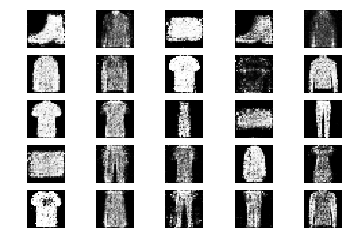

36401 [D loss: 0.682197, acc.: 56.25%] [G loss: 0.951149]
36402 [D loss: 0.601123, acc.: 60.94%] [G loss: 0.834510]
36403 [D loss: 0.609439, acc.: 67.19%] [G loss: 1.004566]
36404 [D loss: 0.661338, acc.: 59.38%] [G loss: 1.053072]
36405 [D loss: 0.558711, acc.: 75.00%] [G loss: 0.970968]
36406 [D loss: 0.660873, acc.: 67.19%] [G loss: 0.938924]
36407 [D loss: 0.633113, acc.: 65.62%] [G loss: 1.139782]
36408 [D loss: 0.550704, acc.: 75.00%] [G loss: 1.022848]
36409 [D loss: 0.616546, acc.: 65.62%] [G loss: 0.971047]
36410 [D loss: 0.600434, acc.: 73.44%] [G loss: 0.987402]
36411 [D loss: 0.628687, acc.: 65.62%] [G loss: 1.012151]
36412 [D loss: 0.658081, acc.: 59.38%] [G loss: 0.929875]
36413 [D loss: 0.648071, acc.: 65.62%] [G loss: 0.892936]
36414 [D loss: 0.732746, acc.: 53.12%] [G loss: 0.903428]
36415 [D loss: 0.615830, acc.: 65.62%] [G loss: 1.000058]
36416 [D loss: 0.552458, acc.: 79.69%] [G loss: 0.998628]
36417 [D loss: 0.689952, acc.: 56.25%] [G loss: 1.036281]
36418 [D loss:

36545 [D loss: 0.633840, acc.: 59.38%] [G loss: 0.889182]
36546 [D loss: 0.682405, acc.: 56.25%] [G loss: 0.897647]
36547 [D loss: 0.655599, acc.: 65.62%] [G loss: 0.986499]
36548 [D loss: 0.635268, acc.: 54.69%] [G loss: 1.022194]
36549 [D loss: 0.620814, acc.: 64.06%] [G loss: 1.056383]
36550 [D loss: 0.689412, acc.: 57.81%] [G loss: 0.989515]
36551 [D loss: 0.615091, acc.: 68.75%] [G loss: 0.928439]
36552 [D loss: 0.671105, acc.: 54.69%] [G loss: 0.913148]
36553 [D loss: 0.651533, acc.: 64.06%] [G loss: 0.967507]
36554 [D loss: 0.615685, acc.: 64.06%] [G loss: 1.008749]
36555 [D loss: 0.635993, acc.: 68.75%] [G loss: 0.982912]
36556 [D loss: 0.584432, acc.: 73.44%] [G loss: 1.071327]
36557 [D loss: 0.643528, acc.: 62.50%] [G loss: 0.903436]
36558 [D loss: 0.684704, acc.: 56.25%] [G loss: 1.102131]
36559 [D loss: 0.619129, acc.: 65.62%] [G loss: 0.980332]
36560 [D loss: 0.595061, acc.: 76.56%] [G loss: 1.013355]
36561 [D loss: 0.615399, acc.: 64.06%] [G loss: 0.935517]
36562 [D loss:

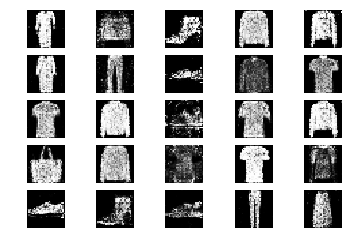

36601 [D loss: 0.592779, acc.: 65.62%] [G loss: 0.913280]
36602 [D loss: 0.600605, acc.: 68.75%] [G loss: 1.039493]
36603 [D loss: 0.612298, acc.: 67.19%] [G loss: 1.002960]
36604 [D loss: 0.640276, acc.: 62.50%] [G loss: 0.986073]
36605 [D loss: 0.702247, acc.: 56.25%] [G loss: 0.999985]
36606 [D loss: 0.578441, acc.: 75.00%] [G loss: 0.971499]
36607 [D loss: 0.667567, acc.: 60.94%] [G loss: 0.973639]
36608 [D loss: 0.649001, acc.: 54.69%] [G loss: 0.907248]
36609 [D loss: 0.600959, acc.: 65.62%] [G loss: 0.954888]
36610 [D loss: 0.652245, acc.: 67.19%] [G loss: 1.059238]
36611 [D loss: 0.617514, acc.: 62.50%] [G loss: 0.921211]
36612 [D loss: 0.633352, acc.: 59.38%] [G loss: 0.883328]
36613 [D loss: 0.603920, acc.: 65.62%] [G loss: 0.924022]
36614 [D loss: 0.611766, acc.: 67.19%] [G loss: 0.954450]
36615 [D loss: 0.721248, acc.: 53.12%] [G loss: 0.893904]
36616 [D loss: 0.709037, acc.: 60.94%] [G loss: 0.997268]
36617 [D loss: 0.614328, acc.: 68.75%] [G loss: 0.934335]
36618 [D loss:

36744 [D loss: 0.686925, acc.: 59.38%] [G loss: 1.102307]
36745 [D loss: 0.646765, acc.: 67.19%] [G loss: 1.069227]
36746 [D loss: 0.611273, acc.: 67.19%] [G loss: 1.049039]
36747 [D loss: 0.585970, acc.: 73.44%] [G loss: 0.965208]
36748 [D loss: 0.766484, acc.: 43.75%] [G loss: 1.035149]
36749 [D loss: 0.624850, acc.: 68.75%] [G loss: 1.019128]
36750 [D loss: 0.562928, acc.: 71.88%] [G loss: 0.939040]
36751 [D loss: 0.685104, acc.: 54.69%] [G loss: 0.920590]
36752 [D loss: 0.651519, acc.: 65.62%] [G loss: 0.995665]
36753 [D loss: 0.675171, acc.: 56.25%] [G loss: 1.025275]
36754 [D loss: 0.625334, acc.: 60.94%] [G loss: 1.057124]
36755 [D loss: 0.617757, acc.: 65.62%] [G loss: 1.096604]
36756 [D loss: 0.646693, acc.: 54.69%] [G loss: 1.036163]
36757 [D loss: 0.642105, acc.: 67.19%] [G loss: 1.036588]
36758 [D loss: 0.672472, acc.: 56.25%] [G loss: 1.035005]
36759 [D loss: 0.636479, acc.: 64.06%] [G loss: 0.953907]
36760 [D loss: 0.630064, acc.: 64.06%] [G loss: 0.933541]
36761 [D loss:

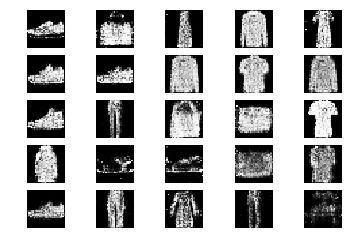

36801 [D loss: 0.619209, acc.: 65.62%] [G loss: 1.093557]
36802 [D loss: 0.624573, acc.: 65.62%] [G loss: 0.976286]
36803 [D loss: 0.686713, acc.: 51.56%] [G loss: 0.915867]
36804 [D loss: 0.640786, acc.: 59.38%] [G loss: 0.918864]
36805 [D loss: 0.619365, acc.: 64.06%] [G loss: 0.915874]
36806 [D loss: 0.671475, acc.: 56.25%] [G loss: 0.974669]
36807 [D loss: 0.711224, acc.: 45.31%] [G loss: 0.991556]
36808 [D loss: 0.602282, acc.: 68.75%] [G loss: 0.927642]
36809 [D loss: 0.661828, acc.: 56.25%] [G loss: 1.011417]
36810 [D loss: 0.674657, acc.: 59.38%] [G loss: 0.946923]
36811 [D loss: 0.660753, acc.: 59.38%] [G loss: 0.941967]
36812 [D loss: 0.673951, acc.: 53.12%] [G loss: 1.014447]
36813 [D loss: 0.602483, acc.: 70.31%] [G loss: 0.963658]
36814 [D loss: 0.644553, acc.: 62.50%] [G loss: 0.999501]
36815 [D loss: 0.608117, acc.: 71.88%] [G loss: 1.052291]
36816 [D loss: 0.693434, acc.: 60.94%] [G loss: 0.962629]
36817 [D loss: 0.698825, acc.: 53.12%] [G loss: 0.943382]
36818 [D loss:

36946 [D loss: 0.648719, acc.: 64.06%] [G loss: 1.077322]
36947 [D loss: 0.654058, acc.: 57.81%] [G loss: 0.980063]
36948 [D loss: 0.616923, acc.: 62.50%] [G loss: 1.080375]
36949 [D loss: 0.630551, acc.: 65.62%] [G loss: 0.982838]
36950 [D loss: 0.568327, acc.: 75.00%] [G loss: 1.011617]
36951 [D loss: 0.579112, acc.: 75.00%] [G loss: 1.043433]
36952 [D loss: 0.608023, acc.: 67.19%] [G loss: 0.990989]
36953 [D loss: 0.595057, acc.: 64.06%] [G loss: 0.831660]
36954 [D loss: 0.699734, acc.: 50.00%] [G loss: 1.020212]
36955 [D loss: 0.643761, acc.: 60.94%] [G loss: 0.978949]
36956 [D loss: 0.577754, acc.: 67.19%] [G loss: 0.877498]
36957 [D loss: 0.611199, acc.: 67.19%] [G loss: 0.955613]
36958 [D loss: 0.654989, acc.: 65.62%] [G loss: 0.912449]
36959 [D loss: 0.661867, acc.: 64.06%] [G loss: 1.039794]
36960 [D loss: 0.629015, acc.: 64.06%] [G loss: 0.923678]
36961 [D loss: 0.607202, acc.: 71.88%] [G loss: 0.921143]
36962 [D loss: 0.569824, acc.: 71.88%] [G loss: 0.927579]
36963 [D loss:

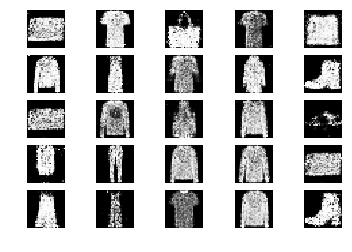

37001 [D loss: 0.603589, acc.: 73.44%] [G loss: 0.930883]
37002 [D loss: 0.511428, acc.: 81.25%] [G loss: 0.971389]
37003 [D loss: 0.599890, acc.: 67.19%] [G loss: 0.902413]
37004 [D loss: 0.566744, acc.: 70.31%] [G loss: 0.916059]
37005 [D loss: 0.664105, acc.: 59.38%] [G loss: 1.073963]
37006 [D loss: 0.644326, acc.: 64.06%] [G loss: 0.938820]
37007 [D loss: 0.598338, acc.: 68.75%] [G loss: 0.938838]
37008 [D loss: 0.619918, acc.: 67.19%] [G loss: 0.976653]
37009 [D loss: 0.634430, acc.: 56.25%] [G loss: 0.975658]
37010 [D loss: 0.584985, acc.: 71.88%] [G loss: 0.835575]
37011 [D loss: 0.648223, acc.: 64.06%] [G loss: 0.917357]
37012 [D loss: 0.643590, acc.: 62.50%] [G loss: 0.973252]
37013 [D loss: 0.696781, acc.: 54.69%] [G loss: 0.894081]
37014 [D loss: 0.641036, acc.: 60.94%] [G loss: 0.874705]
37015 [D loss: 0.703274, acc.: 54.69%] [G loss: 0.855083]
37016 [D loss: 0.606029, acc.: 64.06%] [G loss: 1.069760]
37017 [D loss: 0.611953, acc.: 62.50%] [G loss: 0.912790]
37018 [D loss:

37144 [D loss: 0.637863, acc.: 64.06%] [G loss: 0.940973]
37145 [D loss: 0.603906, acc.: 71.88%] [G loss: 0.996638]
37146 [D loss: 0.609187, acc.: 68.75%] [G loss: 0.865713]
37147 [D loss: 0.710563, acc.: 60.94%] [G loss: 0.893527]
37148 [D loss: 0.621602, acc.: 67.19%] [G loss: 0.952882]
37149 [D loss: 0.574661, acc.: 65.62%] [G loss: 1.053182]
37150 [D loss: 0.673569, acc.: 60.94%] [G loss: 0.972811]
37151 [D loss: 0.699086, acc.: 59.38%] [G loss: 1.056219]
37152 [D loss: 0.642486, acc.: 64.06%] [G loss: 0.876456]
37153 [D loss: 0.604072, acc.: 75.00%] [G loss: 0.959700]
37154 [D loss: 0.553636, acc.: 78.12%] [G loss: 0.962627]
37155 [D loss: 0.671250, acc.: 64.06%] [G loss: 0.873327]
37156 [D loss: 0.648515, acc.: 62.50%] [G loss: 1.025543]
37157 [D loss: 0.594964, acc.: 65.62%] [G loss: 1.007980]
37158 [D loss: 0.575197, acc.: 76.56%] [G loss: 0.930234]
37159 [D loss: 0.569198, acc.: 67.19%] [G loss: 0.940366]
37160 [D loss: 0.555040, acc.: 78.12%] [G loss: 1.042190]
37161 [D loss:

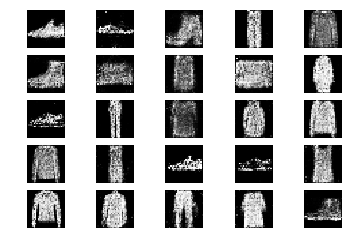

37201 [D loss: 0.607907, acc.: 64.06%] [G loss: 0.953995]
37202 [D loss: 0.640776, acc.: 62.50%] [G loss: 0.905398]
37203 [D loss: 0.549687, acc.: 75.00%] [G loss: 0.968056]
37204 [D loss: 0.699752, acc.: 56.25%] [G loss: 0.827398]
37205 [D loss: 0.626831, acc.: 57.81%] [G loss: 0.942093]
37206 [D loss: 0.703580, acc.: 57.81%] [G loss: 0.918004]
37207 [D loss: 0.667238, acc.: 64.06%] [G loss: 0.993782]
37208 [D loss: 0.639439, acc.: 67.19%] [G loss: 1.005836]
37209 [D loss: 0.625596, acc.: 64.06%] [G loss: 0.884664]
37210 [D loss: 0.695103, acc.: 50.00%] [G loss: 1.004143]
37211 [D loss: 0.675880, acc.: 56.25%] [G loss: 0.870070]
37212 [D loss: 0.558156, acc.: 71.88%] [G loss: 0.971599]
37213 [D loss: 0.680423, acc.: 56.25%] [G loss: 0.831795]
37214 [D loss: 0.633980, acc.: 56.25%] [G loss: 0.956475]
37215 [D loss: 0.646068, acc.: 57.81%] [G loss: 0.968113]
37216 [D loss: 0.753693, acc.: 53.12%] [G loss: 0.983946]
37217 [D loss: 0.584735, acc.: 68.75%] [G loss: 1.038038]
37218 [D loss:

37344 [D loss: 0.581680, acc.: 75.00%] [G loss: 1.038036]
37345 [D loss: 0.709276, acc.: 59.38%] [G loss: 1.033104]
37346 [D loss: 0.590116, acc.: 70.31%] [G loss: 0.920405]
37347 [D loss: 0.619687, acc.: 65.62%] [G loss: 0.977618]
37348 [D loss: 0.663391, acc.: 57.81%] [G loss: 0.998337]
37349 [D loss: 0.600537, acc.: 70.31%] [G loss: 0.924777]
37350 [D loss: 0.550206, acc.: 68.75%] [G loss: 1.014404]
37351 [D loss: 0.581886, acc.: 67.19%] [G loss: 0.987237]
37352 [D loss: 0.609220, acc.: 65.62%] [G loss: 0.998700]
37353 [D loss: 0.599880, acc.: 76.56%] [G loss: 0.994120]
37354 [D loss: 0.627055, acc.: 67.19%] [G loss: 0.915966]
37355 [D loss: 0.696549, acc.: 59.38%] [G loss: 0.931076]
37356 [D loss: 0.711777, acc.: 48.44%] [G loss: 0.926979]
37357 [D loss: 0.611852, acc.: 68.75%] [G loss: 0.989941]
37358 [D loss: 0.607090, acc.: 62.50%] [G loss: 0.959296]
37359 [D loss: 0.702466, acc.: 48.44%] [G loss: 0.987997]
37360 [D loss: 0.632492, acc.: 67.19%] [G loss: 0.973288]
37361 [D loss:

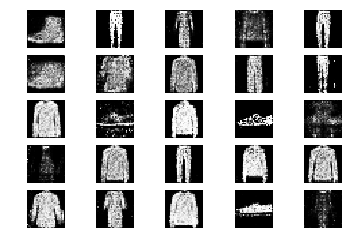

37401 [D loss: 0.700891, acc.: 57.81%] [G loss: 1.123809]
37402 [D loss: 0.576528, acc.: 78.12%] [G loss: 0.831399]
37403 [D loss: 0.654459, acc.: 68.75%] [G loss: 0.969318]
37404 [D loss: 0.576016, acc.: 70.31%] [G loss: 1.030918]
37405 [D loss: 0.617650, acc.: 65.62%] [G loss: 1.050173]
37406 [D loss: 0.623299, acc.: 59.38%] [G loss: 0.902731]
37407 [D loss: 0.655698, acc.: 68.75%] [G loss: 1.147719]
37408 [D loss: 0.657406, acc.: 56.25%] [G loss: 1.038031]
37409 [D loss: 0.574148, acc.: 70.31%] [G loss: 1.025908]
37410 [D loss: 0.724225, acc.: 54.69%] [G loss: 1.048707]
37411 [D loss: 0.631368, acc.: 65.62%] [G loss: 0.868204]
37412 [D loss: 0.560000, acc.: 68.75%] [G loss: 0.868026]
37413 [D loss: 0.609667, acc.: 62.50%] [G loss: 0.935496]
37414 [D loss: 0.655033, acc.: 62.50%] [G loss: 0.920066]
37415 [D loss: 0.594410, acc.: 68.75%] [G loss: 0.980702]
37416 [D loss: 0.640648, acc.: 60.94%] [G loss: 1.109507]
37417 [D loss: 0.593627, acc.: 70.31%] [G loss: 0.896453]
37418 [D loss:

37545 [D loss: 0.668941, acc.: 59.38%] [G loss: 0.937767]
37546 [D loss: 0.634331, acc.: 65.62%] [G loss: 0.920761]
37547 [D loss: 0.585268, acc.: 67.19%] [G loss: 0.989919]
37548 [D loss: 0.569368, acc.: 71.88%] [G loss: 0.984134]
37549 [D loss: 0.688522, acc.: 50.00%] [G loss: 0.974110]
37550 [D loss: 0.670604, acc.: 62.50%] [G loss: 0.964444]
37551 [D loss: 0.656291, acc.: 56.25%] [G loss: 1.034741]
37552 [D loss: 0.663745, acc.: 59.38%] [G loss: 0.937128]
37553 [D loss: 0.572170, acc.: 65.62%] [G loss: 0.869280]
37554 [D loss: 0.680347, acc.: 60.94%] [G loss: 0.960645]
37555 [D loss: 0.589116, acc.: 65.62%] [G loss: 1.028558]
37556 [D loss: 0.581422, acc.: 65.62%] [G loss: 1.033801]
37557 [D loss: 0.598710, acc.: 62.50%] [G loss: 0.954859]
37558 [D loss: 0.674537, acc.: 50.00%] [G loss: 0.909835]
37559 [D loss: 0.623963, acc.: 62.50%] [G loss: 1.017995]
37560 [D loss: 0.678774, acc.: 54.69%] [G loss: 0.895014]
37561 [D loss: 0.648663, acc.: 59.38%] [G loss: 0.946487]
37562 [D loss:

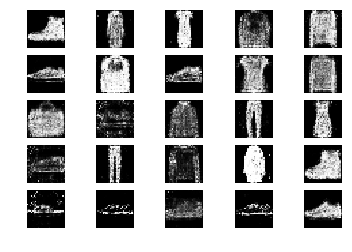

37601 [D loss: 0.601300, acc.: 68.75%] [G loss: 0.968133]
37602 [D loss: 0.619314, acc.: 60.94%] [G loss: 0.983821]
37603 [D loss: 0.701399, acc.: 64.06%] [G loss: 0.970253]
37604 [D loss: 0.633846, acc.: 67.19%] [G loss: 0.970872]
37605 [D loss: 0.681383, acc.: 54.69%] [G loss: 0.961421]
37606 [D loss: 0.623417, acc.: 62.50%] [G loss: 0.993731]
37607 [D loss: 0.610966, acc.: 67.19%] [G loss: 0.994183]
37608 [D loss: 0.648398, acc.: 59.38%] [G loss: 0.977924]
37609 [D loss: 0.626835, acc.: 64.06%] [G loss: 1.009058]
37610 [D loss: 0.682312, acc.: 51.56%] [G loss: 0.975379]
37611 [D loss: 0.601357, acc.: 70.31%] [G loss: 0.830956]
37612 [D loss: 0.522020, acc.: 78.12%] [G loss: 0.912430]
37613 [D loss: 0.647132, acc.: 64.06%] [G loss: 1.033429]
37614 [D loss: 0.572748, acc.: 75.00%] [G loss: 0.974651]
37615 [D loss: 0.742201, acc.: 50.00%] [G loss: 1.060869]
37616 [D loss: 0.569145, acc.: 73.44%] [G loss: 0.952997]
37617 [D loss: 0.708825, acc.: 50.00%] [G loss: 0.887504]
37618 [D loss:

37745 [D loss: 0.616737, acc.: 71.88%] [G loss: 0.819251]
37746 [D loss: 0.633071, acc.: 62.50%] [G loss: 1.002952]
37747 [D loss: 0.577683, acc.: 75.00%] [G loss: 0.996546]
37748 [D loss: 0.590895, acc.: 67.19%] [G loss: 0.991412]
37749 [D loss: 0.639867, acc.: 64.06%] [G loss: 1.023649]
37750 [D loss: 0.646522, acc.: 67.19%] [G loss: 0.974142]
37751 [D loss: 0.617624, acc.: 60.94%] [G loss: 0.993710]
37752 [D loss: 0.592072, acc.: 75.00%] [G loss: 1.003371]
37753 [D loss: 0.665291, acc.: 64.06%] [G loss: 0.958426]
37754 [D loss: 0.634588, acc.: 65.62%] [G loss: 1.001663]
37755 [D loss: 0.628840, acc.: 60.94%] [G loss: 1.080611]
37756 [D loss: 0.579419, acc.: 78.12%] [G loss: 0.921122]
37757 [D loss: 0.660265, acc.: 59.38%] [G loss: 0.890035]
37758 [D loss: 0.646928, acc.: 64.06%] [G loss: 0.953434]
37759 [D loss: 0.685166, acc.: 57.81%] [G loss: 1.021133]
37760 [D loss: 0.585741, acc.: 78.12%] [G loss: 0.957755]
37761 [D loss: 0.575569, acc.: 71.88%] [G loss: 0.960763]
37762 [D loss:

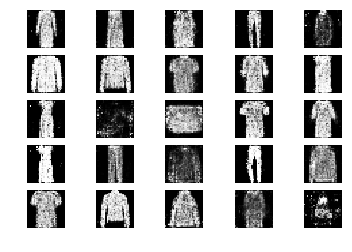

37801 [D loss: 0.578610, acc.: 71.88%] [G loss: 1.063070]
37802 [D loss: 0.580679, acc.: 70.31%] [G loss: 0.990121]
37803 [D loss: 0.597909, acc.: 73.44%] [G loss: 1.035336]
37804 [D loss: 0.661065, acc.: 62.50%] [G loss: 0.948794]
37805 [D loss: 0.605258, acc.: 67.19%] [G loss: 1.025313]
37806 [D loss: 0.679827, acc.: 51.56%] [G loss: 0.981254]
37807 [D loss: 0.634483, acc.: 62.50%] [G loss: 0.992213]
37808 [D loss: 0.579208, acc.: 62.50%] [G loss: 1.082289]
37809 [D loss: 0.569492, acc.: 68.75%] [G loss: 1.093036]
37810 [D loss: 0.564249, acc.: 65.62%] [G loss: 1.076336]
37811 [D loss: 0.641349, acc.: 62.50%] [G loss: 1.063540]
37812 [D loss: 0.649090, acc.: 60.94%] [G loss: 0.872311]
37813 [D loss: 0.561147, acc.: 70.31%] [G loss: 1.018328]
37814 [D loss: 0.597615, acc.: 64.06%] [G loss: 0.963736]
37815 [D loss: 0.653372, acc.: 57.81%] [G loss: 0.914473]
37816 [D loss: 0.623618, acc.: 60.94%] [G loss: 1.005065]
37817 [D loss: 0.653553, acc.: 65.62%] [G loss: 0.963801]
37818 [D loss:

37944 [D loss: 0.673263, acc.: 59.38%] [G loss: 0.903064]
37945 [D loss: 0.579168, acc.: 70.31%] [G loss: 0.975654]
37946 [D loss: 0.661474, acc.: 64.06%] [G loss: 0.909590]
37947 [D loss: 0.652622, acc.: 65.62%] [G loss: 0.895857]
37948 [D loss: 0.642850, acc.: 57.81%] [G loss: 0.900575]
37949 [D loss: 0.630859, acc.: 64.06%] [G loss: 0.886017]
37950 [D loss: 0.701664, acc.: 60.94%] [G loss: 0.885429]
37951 [D loss: 0.655057, acc.: 57.81%] [G loss: 0.920704]
37952 [D loss: 0.708703, acc.: 54.69%] [G loss: 0.983782]
37953 [D loss: 0.597337, acc.: 65.62%] [G loss: 1.016774]
37954 [D loss: 0.597782, acc.: 67.19%] [G loss: 0.982283]
37955 [D loss: 0.623114, acc.: 64.06%] [G loss: 0.966509]
37956 [D loss: 0.629930, acc.: 65.62%] [G loss: 0.947336]
37957 [D loss: 0.689626, acc.: 59.38%] [G loss: 0.995804]
37958 [D loss: 0.629299, acc.: 64.06%] [G loss: 0.980967]
37959 [D loss: 0.685363, acc.: 50.00%] [G loss: 0.993258]
37960 [D loss: 0.637887, acc.: 62.50%] [G loss: 0.979375]
37961 [D loss:

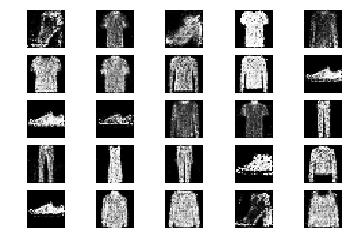

38001 [D loss: 0.625912, acc.: 65.62%] [G loss: 1.046931]
38002 [D loss: 0.586428, acc.: 65.62%] [G loss: 0.991280]
38003 [D loss: 0.610057, acc.: 64.06%] [G loss: 1.032966]
38004 [D loss: 0.649348, acc.: 56.25%] [G loss: 0.951048]
38005 [D loss: 0.644718, acc.: 60.94%] [G loss: 1.012861]
38006 [D loss: 0.624343, acc.: 67.19%] [G loss: 0.946867]
38007 [D loss: 0.633773, acc.: 59.38%] [G loss: 0.867074]
38008 [D loss: 0.584605, acc.: 68.75%] [G loss: 0.974499]
38009 [D loss: 0.622864, acc.: 64.06%] [G loss: 0.938160]
38010 [D loss: 0.637511, acc.: 57.81%] [G loss: 0.967361]
38011 [D loss: 0.675961, acc.: 56.25%] [G loss: 0.930642]
38012 [D loss: 0.677986, acc.: 57.81%] [G loss: 0.945438]
38013 [D loss: 0.618771, acc.: 68.75%] [G loss: 1.019590]
38014 [D loss: 0.645711, acc.: 64.06%] [G loss: 1.137671]
38015 [D loss: 0.589323, acc.: 68.75%] [G loss: 1.001409]
38016 [D loss: 0.687701, acc.: 54.69%] [G loss: 0.994127]
38017 [D loss: 0.626405, acc.: 64.06%] [G loss: 1.163779]
38018 [D loss:

38144 [D loss: 0.628119, acc.: 67.19%] [G loss: 0.966575]
38145 [D loss: 0.710416, acc.: 51.56%] [G loss: 1.008154]
38146 [D loss: 0.667007, acc.: 51.56%] [G loss: 1.035469]
38147 [D loss: 0.598517, acc.: 70.31%] [G loss: 0.961847]
38148 [D loss: 0.581223, acc.: 73.44%] [G loss: 1.100437]
38149 [D loss: 0.499379, acc.: 76.56%] [G loss: 0.956180]
38150 [D loss: 0.673434, acc.: 62.50%] [G loss: 0.954114]
38151 [D loss: 0.682242, acc.: 53.12%] [G loss: 1.029889]
38152 [D loss: 0.649534, acc.: 56.25%] [G loss: 0.958238]
38153 [D loss: 0.636133, acc.: 62.50%] [G loss: 0.913683]
38154 [D loss: 0.668076, acc.: 59.38%] [G loss: 0.942013]
38155 [D loss: 0.675560, acc.: 56.25%] [G loss: 1.055883]
38156 [D loss: 0.662886, acc.: 62.50%] [G loss: 1.029070]
38157 [D loss: 0.675996, acc.: 56.25%] [G loss: 0.916405]
38158 [D loss: 0.599532, acc.: 68.75%] [G loss: 1.039522]
38159 [D loss: 0.647261, acc.: 60.94%] [G loss: 0.921387]
38160 [D loss: 0.578120, acc.: 64.06%] [G loss: 1.014744]
38161 [D loss:

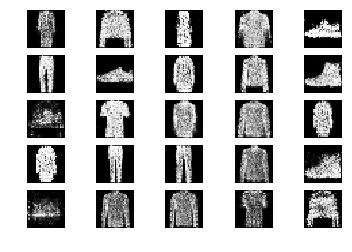

38201 [D loss: 0.712105, acc.: 53.12%] [G loss: 0.937193]
38202 [D loss: 0.609336, acc.: 67.19%] [G loss: 0.893721]
38203 [D loss: 0.653789, acc.: 65.62%] [G loss: 0.941088]
38204 [D loss: 0.637571, acc.: 60.94%] [G loss: 1.001822]
38205 [D loss: 0.643504, acc.: 60.94%] [G loss: 1.021261]
38206 [D loss: 0.682074, acc.: 59.38%] [G loss: 0.910283]
38207 [D loss: 0.656196, acc.: 64.06%] [G loss: 0.929835]
38208 [D loss: 0.605928, acc.: 64.06%] [G loss: 0.936853]
38209 [D loss: 0.613003, acc.: 64.06%] [G loss: 0.984847]
38210 [D loss: 0.643959, acc.: 64.06%] [G loss: 0.920839]
38211 [D loss: 0.634684, acc.: 64.06%] [G loss: 0.907306]
38212 [D loss: 0.662319, acc.: 68.75%] [G loss: 0.976711]
38213 [D loss: 0.622413, acc.: 65.62%] [G loss: 0.958759]
38214 [D loss: 0.658921, acc.: 57.81%] [G loss: 0.940593]
38215 [D loss: 0.677949, acc.: 57.81%] [G loss: 0.976289]
38216 [D loss: 0.609505, acc.: 68.75%] [G loss: 0.973305]
38217 [D loss: 0.598314, acc.: 70.31%] [G loss: 0.964290]
38218 [D loss:

38346 [D loss: 0.615803, acc.: 68.75%] [G loss: 1.031563]
38347 [D loss: 0.630021, acc.: 68.75%] [G loss: 0.944976]
38348 [D loss: 0.604942, acc.: 68.75%] [G loss: 0.985000]
38349 [D loss: 0.563791, acc.: 76.56%] [G loss: 1.084593]
38350 [D loss: 0.658661, acc.: 64.06%] [G loss: 0.931378]
38351 [D loss: 0.646628, acc.: 64.06%] [G loss: 1.012658]
38352 [D loss: 0.683991, acc.: 59.38%] [G loss: 0.889625]
38353 [D loss: 0.639858, acc.: 65.62%] [G loss: 0.955834]
38354 [D loss: 0.608022, acc.: 67.19%] [G loss: 0.969727]
38355 [D loss: 0.609458, acc.: 67.19%] [G loss: 1.094151]
38356 [D loss: 0.620847, acc.: 65.62%] [G loss: 1.050602]
38357 [D loss: 0.582740, acc.: 68.75%] [G loss: 1.008645]
38358 [D loss: 0.696476, acc.: 50.00%] [G loss: 0.975586]
38359 [D loss: 0.717857, acc.: 48.44%] [G loss: 0.959546]
38360 [D loss: 0.657955, acc.: 57.81%] [G loss: 0.951581]
38361 [D loss: 0.606850, acc.: 62.50%] [G loss: 0.841694]
38362 [D loss: 0.663472, acc.: 57.81%] [G loss: 0.833808]
38363 [D loss:

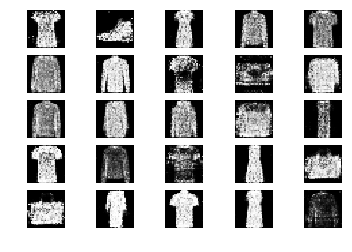

38401 [D loss: 0.592972, acc.: 64.06%] [G loss: 0.928548]
38402 [D loss: 0.600066, acc.: 64.06%] [G loss: 0.994764]
38403 [D loss: 0.612657, acc.: 62.50%] [G loss: 0.913774]
38404 [D loss: 0.637275, acc.: 62.50%] [G loss: 0.846374]
38405 [D loss: 0.562844, acc.: 70.31%] [G loss: 0.948703]
38406 [D loss: 0.584135, acc.: 78.12%] [G loss: 0.955362]
38407 [D loss: 0.642154, acc.: 56.25%] [G loss: 0.985358]
38408 [D loss: 0.701873, acc.: 57.81%] [G loss: 0.991918]
38409 [D loss: 0.618222, acc.: 64.06%] [G loss: 0.992551]
38410 [D loss: 0.599636, acc.: 70.31%] [G loss: 1.136405]
38411 [D loss: 0.610716, acc.: 62.50%] [G loss: 0.958444]
38412 [D loss: 0.722059, acc.: 53.12%] [G loss: 1.083940]
38413 [D loss: 0.682744, acc.: 56.25%] [G loss: 0.923737]
38414 [D loss: 0.606518, acc.: 71.88%] [G loss: 0.916380]
38415 [D loss: 0.689412, acc.: 51.56%] [G loss: 0.907486]
38416 [D loss: 0.645060, acc.: 62.50%] [G loss: 0.969013]
38417 [D loss: 0.650806, acc.: 60.94%] [G loss: 0.966434]
38418 [D loss:

38545 [D loss: 0.579077, acc.: 79.69%] [G loss: 1.017903]
38546 [D loss: 0.678783, acc.: 64.06%] [G loss: 0.959132]
38547 [D loss: 0.557204, acc.: 70.31%] [G loss: 0.973852]
38548 [D loss: 0.612899, acc.: 64.06%] [G loss: 1.038832]
38549 [D loss: 0.650769, acc.: 64.06%] [G loss: 0.967411]
38550 [D loss: 0.656409, acc.: 68.75%] [G loss: 0.923944]
38551 [D loss: 0.646317, acc.: 54.69%] [G loss: 1.021988]
38552 [D loss: 0.686690, acc.: 56.25%] [G loss: 1.050056]
38553 [D loss: 0.654947, acc.: 57.81%] [G loss: 1.043222]
38554 [D loss: 0.597179, acc.: 65.62%] [G loss: 0.954030]
38555 [D loss: 0.616562, acc.: 60.94%] [G loss: 1.019017]
38556 [D loss: 0.748806, acc.: 56.25%] [G loss: 0.967596]
38557 [D loss: 0.647638, acc.: 67.19%] [G loss: 0.975017]
38558 [D loss: 0.524047, acc.: 76.56%] [G loss: 1.095451]
38559 [D loss: 0.641367, acc.: 56.25%] [G loss: 1.050079]
38560 [D loss: 0.618190, acc.: 68.75%] [G loss: 0.971969]
38561 [D loss: 0.624032, acc.: 65.62%] [G loss: 0.999043]
38562 [D loss:

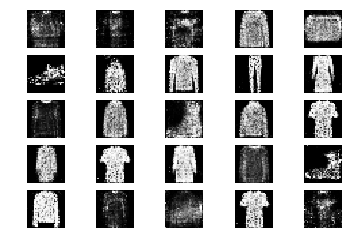

38601 [D loss: 0.560764, acc.: 67.19%] [G loss: 1.033791]
38602 [D loss: 0.634254, acc.: 65.62%] [G loss: 0.916457]
38603 [D loss: 0.601967, acc.: 62.50%] [G loss: 0.972723]
38604 [D loss: 0.632001, acc.: 60.94%] [G loss: 0.983536]
38605 [D loss: 0.714279, acc.: 48.44%] [G loss: 0.987286]
38606 [D loss: 0.629391, acc.: 64.06%] [G loss: 1.046059]
38607 [D loss: 0.611608, acc.: 71.88%] [G loss: 1.043032]
38608 [D loss: 0.627323, acc.: 60.94%] [G loss: 1.077829]
38609 [D loss: 0.602110, acc.: 68.75%] [G loss: 0.991388]
38610 [D loss: 0.573327, acc.: 73.44%] [G loss: 0.898060]
38611 [D loss: 0.591604, acc.: 70.31%] [G loss: 0.988397]
38612 [D loss: 0.595418, acc.: 70.31%] [G loss: 1.040937]
38613 [D loss: 0.647488, acc.: 62.50%] [G loss: 1.009407]
38614 [D loss: 0.623243, acc.: 65.62%] [G loss: 0.951320]
38615 [D loss: 0.650679, acc.: 64.06%] [G loss: 0.910587]
38616 [D loss: 0.592066, acc.: 70.31%] [G loss: 0.943856]
38617 [D loss: 0.613142, acc.: 64.06%] [G loss: 1.036910]
38618 [D loss:

38743 [D loss: 0.713537, acc.: 65.62%] [G loss: 1.022103]
38744 [D loss: 0.634766, acc.: 64.06%] [G loss: 0.995296]
38745 [D loss: 0.606707, acc.: 68.75%] [G loss: 0.996956]
38746 [D loss: 0.639795, acc.: 62.50%] [G loss: 1.012713]
38747 [D loss: 0.609177, acc.: 70.31%] [G loss: 1.022135]
38748 [D loss: 0.615641, acc.: 68.75%] [G loss: 1.042089]
38749 [D loss: 0.565289, acc.: 78.12%] [G loss: 1.029958]
38750 [D loss: 0.700806, acc.: 59.38%] [G loss: 0.898102]
38751 [D loss: 0.674956, acc.: 59.38%] [G loss: 0.841923]
38752 [D loss: 0.587412, acc.: 67.19%] [G loss: 1.021410]
38753 [D loss: 0.567340, acc.: 73.44%] [G loss: 0.908577]
38754 [D loss: 0.614870, acc.: 62.50%] [G loss: 1.010353]
38755 [D loss: 0.623296, acc.: 67.19%] [G loss: 0.959720]
38756 [D loss: 0.629372, acc.: 67.19%] [G loss: 0.984045]
38757 [D loss: 0.633243, acc.: 68.75%] [G loss: 0.847988]
38758 [D loss: 0.630827, acc.: 64.06%] [G loss: 0.903457]
38759 [D loss: 0.652872, acc.: 54.69%] [G loss: 0.984057]
38760 [D loss:

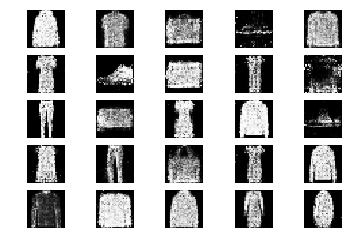

38801 [D loss: 0.618772, acc.: 64.06%] [G loss: 0.931509]
38802 [D loss: 0.631047, acc.: 62.50%] [G loss: 0.937923]
38803 [D loss: 0.608696, acc.: 68.75%] [G loss: 0.953899]
38804 [D loss: 0.699617, acc.: 56.25%] [G loss: 0.905125]
38805 [D loss: 0.665050, acc.: 51.56%] [G loss: 1.061016]
38806 [D loss: 0.608687, acc.: 57.81%] [G loss: 0.888770]
38807 [D loss: 0.615520, acc.: 62.50%] [G loss: 0.985843]
38808 [D loss: 0.629749, acc.: 60.94%] [G loss: 1.041125]
38809 [D loss: 0.652864, acc.: 54.69%] [G loss: 0.968504]
38810 [D loss: 0.616200, acc.: 67.19%] [G loss: 1.132926]
38811 [D loss: 0.653317, acc.: 57.81%] [G loss: 0.940392]
38812 [D loss: 0.628869, acc.: 68.75%] [G loss: 1.011749]
38813 [D loss: 0.579994, acc.: 73.44%] [G loss: 1.018917]
38814 [D loss: 0.608117, acc.: 65.62%] [G loss: 0.977803]
38815 [D loss: 0.664295, acc.: 57.81%] [G loss: 1.042168]
38816 [D loss: 0.593983, acc.: 73.44%] [G loss: 0.968855]
38817 [D loss: 0.505647, acc.: 76.56%] [G loss: 0.926734]
38818 [D loss:

38943 [D loss: 0.695541, acc.: 56.25%] [G loss: 0.942435]
38944 [D loss: 0.588371, acc.: 70.31%] [G loss: 0.899428]
38945 [D loss: 0.676067, acc.: 56.25%] [G loss: 0.958209]
38946 [D loss: 0.747164, acc.: 50.00%] [G loss: 1.050987]
38947 [D loss: 0.591184, acc.: 68.75%] [G loss: 1.000877]
38948 [D loss: 0.604030, acc.: 64.06%] [G loss: 0.938262]
38949 [D loss: 0.692400, acc.: 53.12%] [G loss: 0.888610]
38950 [D loss: 0.662967, acc.: 64.06%] [G loss: 0.887972]
38951 [D loss: 0.654253, acc.: 68.75%] [G loss: 0.985834]
38952 [D loss: 0.660049, acc.: 56.25%] [G loss: 1.004378]
38953 [D loss: 0.714377, acc.: 56.25%] [G loss: 0.877026]
38954 [D loss: 0.637867, acc.: 64.06%] [G loss: 0.940500]
38955 [D loss: 0.601688, acc.: 68.75%] [G loss: 0.997259]
38956 [D loss: 0.656481, acc.: 60.94%] [G loss: 1.067040]
38957 [D loss: 0.679992, acc.: 59.38%] [G loss: 0.938566]
38958 [D loss: 0.659702, acc.: 59.38%] [G loss: 0.892200]
38959 [D loss: 0.601142, acc.: 67.19%] [G loss: 0.979724]
38960 [D loss:

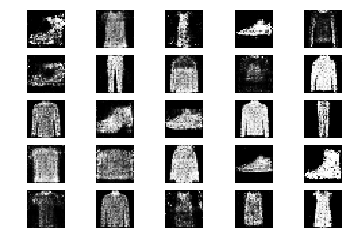

39001 [D loss: 0.568742, acc.: 71.88%] [G loss: 1.016961]
39002 [D loss: 0.667898, acc.: 73.44%] [G loss: 0.906347]
39003 [D loss: 0.677915, acc.: 64.06%] [G loss: 0.998826]
39004 [D loss: 0.573642, acc.: 68.75%] [G loss: 0.942521]
39005 [D loss: 0.626377, acc.: 67.19%] [G loss: 0.949526]
39006 [D loss: 0.654715, acc.: 64.06%] [G loss: 0.875246]
39007 [D loss: 0.561124, acc.: 76.56%] [G loss: 1.038113]
39008 [D loss: 0.724705, acc.: 53.12%] [G loss: 0.935239]
39009 [D loss: 0.708683, acc.: 51.56%] [G loss: 0.915150]
39010 [D loss: 0.640584, acc.: 56.25%] [G loss: 0.967858]
39011 [D loss: 0.576989, acc.: 67.19%] [G loss: 1.043085]
39012 [D loss: 0.564182, acc.: 70.31%] [G loss: 1.028110]
39013 [D loss: 0.553932, acc.: 73.44%] [G loss: 1.061705]
39014 [D loss: 0.628968, acc.: 56.25%] [G loss: 0.978874]
39015 [D loss: 0.629270, acc.: 64.06%] [G loss: 0.871764]
39016 [D loss: 0.663931, acc.: 60.94%] [G loss: 0.921363]
39017 [D loss: 0.674093, acc.: 64.06%] [G loss: 0.911895]
39018 [D loss:

39146 [D loss: 0.609601, acc.: 62.50%] [G loss: 0.986365]
39147 [D loss: 0.643499, acc.: 65.62%] [G loss: 0.931638]
39148 [D loss: 0.665748, acc.: 64.06%] [G loss: 0.928051]
39149 [D loss: 0.659364, acc.: 68.75%] [G loss: 0.954641]
39150 [D loss: 0.584014, acc.: 71.88%] [G loss: 0.887562]
39151 [D loss: 0.648135, acc.: 62.50%] [G loss: 1.059458]
39152 [D loss: 0.676335, acc.: 57.81%] [G loss: 0.930339]
39153 [D loss: 0.570964, acc.: 68.75%] [G loss: 1.045852]
39154 [D loss: 0.605074, acc.: 65.62%] [G loss: 0.959081]
39155 [D loss: 0.637147, acc.: 59.38%] [G loss: 0.886131]
39156 [D loss: 0.609233, acc.: 65.62%] [G loss: 1.030764]
39157 [D loss: 0.681644, acc.: 54.69%] [G loss: 0.965050]
39158 [D loss: 0.636463, acc.: 65.62%] [G loss: 0.821288]
39159 [D loss: 0.636801, acc.: 65.62%] [G loss: 1.016401]
39160 [D loss: 0.560173, acc.: 68.75%] [G loss: 0.959850]
39161 [D loss: 0.580725, acc.: 65.62%] [G loss: 0.984298]
39162 [D loss: 0.635966, acc.: 60.94%] [G loss: 0.862052]
39163 [D loss:

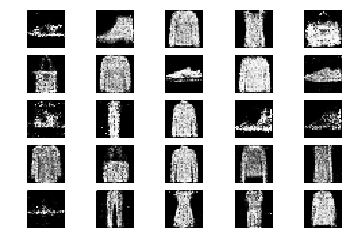

39201 [D loss: 0.621373, acc.: 71.88%] [G loss: 1.058769]
39202 [D loss: 0.604121, acc.: 70.31%] [G loss: 1.039070]
39203 [D loss: 0.645044, acc.: 57.81%] [G loss: 1.037155]
39204 [D loss: 0.629037, acc.: 64.06%] [G loss: 0.931766]
39205 [D loss: 0.618050, acc.: 67.19%] [G loss: 1.036702]
39206 [D loss: 0.642565, acc.: 59.38%] [G loss: 0.992592]
39207 [D loss: 0.712295, acc.: 57.81%] [G loss: 1.023428]
39208 [D loss: 0.631612, acc.: 56.25%] [G loss: 0.990731]
39209 [D loss: 0.581024, acc.: 76.56%] [G loss: 0.927097]
39210 [D loss: 0.681830, acc.: 54.69%] [G loss: 0.910982]
39211 [D loss: 0.645307, acc.: 59.38%] [G loss: 0.832692]
39212 [D loss: 0.622669, acc.: 64.06%] [G loss: 0.989157]
39213 [D loss: 0.666670, acc.: 60.94%] [G loss: 1.081524]
39214 [D loss: 0.654123, acc.: 57.81%] [G loss: 0.951591]
39215 [D loss: 0.657692, acc.: 60.94%] [G loss: 0.997538]
39216 [D loss: 0.594372, acc.: 64.06%] [G loss: 1.073391]
39217 [D loss: 0.642918, acc.: 64.06%] [G loss: 0.968970]
39218 [D loss:

39344 [D loss: 0.697115, acc.: 46.88%] [G loss: 0.965050]
39345 [D loss: 0.697609, acc.: 62.50%] [G loss: 0.868974]
39346 [D loss: 0.625010, acc.: 70.31%] [G loss: 0.866217]
39347 [D loss: 0.639745, acc.: 67.19%] [G loss: 0.853168]
39348 [D loss: 0.604945, acc.: 65.62%] [G loss: 0.954065]
39349 [D loss: 0.654628, acc.: 65.62%] [G loss: 0.904543]
39350 [D loss: 0.678315, acc.: 60.94%] [G loss: 0.883109]
39351 [D loss: 0.618084, acc.: 62.50%] [G loss: 0.914159]
39352 [D loss: 0.585363, acc.: 70.31%] [G loss: 0.977814]
39353 [D loss: 0.617494, acc.: 65.62%] [G loss: 1.037969]
39354 [D loss: 0.590584, acc.: 65.62%] [G loss: 0.961048]
39355 [D loss: 0.622516, acc.: 59.38%] [G loss: 1.037324]
39356 [D loss: 0.650639, acc.: 64.06%] [G loss: 1.049670]
39357 [D loss: 0.590425, acc.: 70.31%] [G loss: 0.952800]
39358 [D loss: 0.614355, acc.: 70.31%] [G loss: 0.951357]
39359 [D loss: 0.674878, acc.: 54.69%] [G loss: 0.978391]
39360 [D loss: 0.588857, acc.: 64.06%] [G loss: 1.131439]
39361 [D loss:

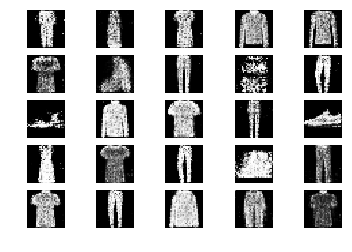

39401 [D loss: 0.660691, acc.: 64.06%] [G loss: 0.962855]
39402 [D loss: 0.621830, acc.: 67.19%] [G loss: 0.967123]
39403 [D loss: 0.597010, acc.: 71.88%] [G loss: 0.883182]
39404 [D loss: 0.653564, acc.: 60.94%] [G loss: 1.071196]
39405 [D loss: 0.653333, acc.: 51.56%] [G loss: 0.931882]
39406 [D loss: 0.637639, acc.: 60.94%] [G loss: 1.021276]
39407 [D loss: 0.604185, acc.: 64.06%] [G loss: 0.977174]
39408 [D loss: 0.629427, acc.: 68.75%] [G loss: 1.053040]
39409 [D loss: 0.566346, acc.: 71.88%] [G loss: 0.931616]
39410 [D loss: 0.648446, acc.: 64.06%] [G loss: 1.024471]
39411 [D loss: 0.577051, acc.: 68.75%] [G loss: 0.973022]
39412 [D loss: 0.685589, acc.: 59.38%] [G loss: 1.031648]
39413 [D loss: 0.616001, acc.: 65.62%] [G loss: 0.977197]
39414 [D loss: 0.632028, acc.: 67.19%] [G loss: 1.021711]
39415 [D loss: 0.526503, acc.: 76.56%] [G loss: 0.980176]
39416 [D loss: 0.647665, acc.: 62.50%] [G loss: 0.985275]
39417 [D loss: 0.569324, acc.: 68.75%] [G loss: 0.993435]
39418 [D loss:

39545 [D loss: 0.611015, acc.: 71.88%] [G loss: 1.061720]
39546 [D loss: 0.608817, acc.: 65.62%] [G loss: 1.094120]
39547 [D loss: 0.606342, acc.: 68.75%] [G loss: 1.038369]
39548 [D loss: 0.668121, acc.: 62.50%] [G loss: 0.978526]
39549 [D loss: 0.554304, acc.: 78.12%] [G loss: 0.987539]
39550 [D loss: 0.627457, acc.: 57.81%] [G loss: 0.982624]
39551 [D loss: 0.692201, acc.: 54.69%] [G loss: 1.005245]
39552 [D loss: 0.661436, acc.: 64.06%] [G loss: 0.868083]
39553 [D loss: 0.746753, acc.: 56.25%] [G loss: 1.016714]
39554 [D loss: 0.718393, acc.: 53.12%] [G loss: 0.923380]
39555 [D loss: 0.576249, acc.: 68.75%] [G loss: 0.919700]
39556 [D loss: 0.622085, acc.: 67.19%] [G loss: 1.011680]
39557 [D loss: 0.696291, acc.: 56.25%] [G loss: 0.857577]
39558 [D loss: 0.645175, acc.: 57.81%] [G loss: 0.946388]
39559 [D loss: 0.660841, acc.: 59.38%] [G loss: 0.941772]
39560 [D loss: 0.718481, acc.: 56.25%] [G loss: 1.118026]
39561 [D loss: 0.628045, acc.: 59.38%] [G loss: 1.017814]
39562 [D loss:

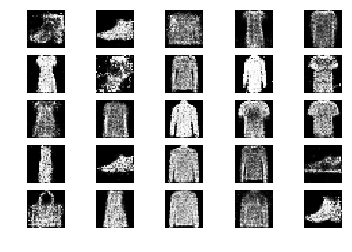

39601 [D loss: 0.607518, acc.: 57.81%] [G loss: 0.924024]
39602 [D loss: 0.644946, acc.: 68.75%] [G loss: 0.954536]
39603 [D loss: 0.698450, acc.: 53.12%] [G loss: 1.151341]
39604 [D loss: 0.620414, acc.: 59.38%] [G loss: 1.039039]
39605 [D loss: 0.577536, acc.: 65.62%] [G loss: 1.024117]
39606 [D loss: 0.600883, acc.: 64.06%] [G loss: 1.002087]
39607 [D loss: 0.656702, acc.: 59.38%] [G loss: 0.955246]
39608 [D loss: 0.581055, acc.: 67.19%] [G loss: 0.911193]
39609 [D loss: 0.584593, acc.: 64.06%] [G loss: 0.937803]
39610 [D loss: 0.563649, acc.: 75.00%] [G loss: 1.006526]
39611 [D loss: 0.626581, acc.: 64.06%] [G loss: 1.003994]
39612 [D loss: 0.556102, acc.: 71.88%] [G loss: 0.942409]
39613 [D loss: 0.615906, acc.: 67.19%] [G loss: 1.012259]
39614 [D loss: 0.576690, acc.: 64.06%] [G loss: 1.038476]
39615 [D loss: 0.649496, acc.: 59.38%] [G loss: 1.087046]
39616 [D loss: 0.631339, acc.: 59.38%] [G loss: 1.012597]
39617 [D loss: 0.589332, acc.: 65.62%] [G loss: 0.998758]
39618 [D loss:

39743 [D loss: 0.578637, acc.: 64.06%] [G loss: 1.041913]
39744 [D loss: 0.601109, acc.: 68.75%] [G loss: 0.977377]
39745 [D loss: 0.687944, acc.: 54.69%] [G loss: 0.911880]
39746 [D loss: 0.655381, acc.: 62.50%] [G loss: 0.924343]
39747 [D loss: 0.674954, acc.: 53.12%] [G loss: 1.046205]
39748 [D loss: 0.693779, acc.: 53.12%] [G loss: 0.995688]
39749 [D loss: 0.638452, acc.: 64.06%] [G loss: 0.961911]
39750 [D loss: 0.600402, acc.: 62.50%] [G loss: 1.052961]
39751 [D loss: 0.687689, acc.: 60.94%] [G loss: 1.075069]
39752 [D loss: 0.696774, acc.: 53.12%] [G loss: 0.922574]
39753 [D loss: 0.636837, acc.: 71.88%] [G loss: 0.958858]
39754 [D loss: 0.635978, acc.: 65.62%] [G loss: 0.970510]
39755 [D loss: 0.687202, acc.: 64.06%] [G loss: 1.013586]
39756 [D loss: 0.569449, acc.: 70.31%] [G loss: 0.962693]
39757 [D loss: 0.678618, acc.: 59.38%] [G loss: 1.042776]
39758 [D loss: 0.611025, acc.: 65.62%] [G loss: 1.116226]
39759 [D loss: 0.593377, acc.: 71.88%] [G loss: 1.083844]
39760 [D loss:

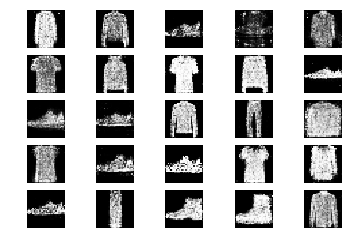

39801 [D loss: 0.583645, acc.: 71.88%] [G loss: 1.037350]
39802 [D loss: 0.694604, acc.: 53.12%] [G loss: 0.967686]
39803 [D loss: 0.538172, acc.: 73.44%] [G loss: 0.995111]
39804 [D loss: 0.645511, acc.: 70.31%] [G loss: 0.918574]
39805 [D loss: 0.751485, acc.: 46.88%] [G loss: 1.055756]
39806 [D loss: 0.718343, acc.: 62.50%] [G loss: 0.944329]
39807 [D loss: 0.641881, acc.: 62.50%] [G loss: 0.924593]
39808 [D loss: 0.689080, acc.: 59.38%] [G loss: 0.921771]
39809 [D loss: 0.586789, acc.: 67.19%] [G loss: 0.976770]
39810 [D loss: 0.606416, acc.: 62.50%] [G loss: 0.925276]
39811 [D loss: 0.675351, acc.: 64.06%] [G loss: 0.967563]
39812 [D loss: 0.645225, acc.: 65.62%] [G loss: 0.802362]
39813 [D loss: 0.585413, acc.: 65.62%] [G loss: 0.958705]
39814 [D loss: 0.719285, acc.: 45.31%] [G loss: 0.891319]
39815 [D loss: 0.666266, acc.: 56.25%] [G loss: 0.907680]
39816 [D loss: 0.577779, acc.: 75.00%] [G loss: 0.882979]
39817 [D loss: 0.673247, acc.: 59.38%] [G loss: 1.050631]
39818 [D loss:

39946 [D loss: 0.664303, acc.: 64.06%] [G loss: 0.953326]
39947 [D loss: 0.610795, acc.: 71.88%] [G loss: 1.004900]
39948 [D loss: 0.643290, acc.: 59.38%] [G loss: 1.030346]
39949 [D loss: 0.581299, acc.: 64.06%] [G loss: 0.915278]
39950 [D loss: 0.614015, acc.: 70.31%] [G loss: 0.967722]
39951 [D loss: 0.596264, acc.: 62.50%] [G loss: 0.950069]
39952 [D loss: 0.704826, acc.: 56.25%] [G loss: 1.066373]
39953 [D loss: 0.581014, acc.: 62.50%] [G loss: 1.035706]
39954 [D loss: 0.601508, acc.: 64.06%] [G loss: 1.019898]
39955 [D loss: 0.653344, acc.: 67.19%] [G loss: 0.991329]
39956 [D loss: 0.642381, acc.: 60.94%] [G loss: 1.110261]
39957 [D loss: 0.636901, acc.: 62.50%] [G loss: 1.063637]
39958 [D loss: 0.616449, acc.: 57.81%] [G loss: 1.018426]
39959 [D loss: 0.631770, acc.: 64.06%] [G loss: 1.006933]
39960 [D loss: 0.615628, acc.: 70.31%] [G loss: 0.937636]
39961 [D loss: 0.592288, acc.: 70.31%] [G loss: 0.987024]
39962 [D loss: 0.637741, acc.: 59.38%] [G loss: 1.040002]
39963 [D loss:

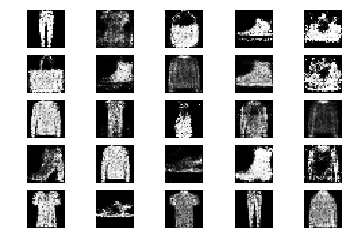

40001 [D loss: 0.635764, acc.: 65.62%] [G loss: 1.013878]
40002 [D loss: 0.685201, acc.: 56.25%] [G loss: 0.945817]
40003 [D loss: 0.674912, acc.: 65.62%] [G loss: 1.066503]
40004 [D loss: 0.649486, acc.: 57.81%] [G loss: 1.067335]
40005 [D loss: 0.617486, acc.: 64.06%] [G loss: 1.048995]
40006 [D loss: 0.683932, acc.: 62.50%] [G loss: 1.038974]
40007 [D loss: 0.577708, acc.: 75.00%] [G loss: 1.016213]
40008 [D loss: 0.656554, acc.: 57.81%] [G loss: 1.025277]
40009 [D loss: 0.669660, acc.: 57.81%] [G loss: 0.968617]
40010 [D loss: 0.660678, acc.: 56.25%] [G loss: 1.045261]
40011 [D loss: 0.663458, acc.: 62.50%] [G loss: 1.084937]
40012 [D loss: 0.570983, acc.: 70.31%] [G loss: 1.045552]
40013 [D loss: 0.667971, acc.: 64.06%] [G loss: 0.964053]
40014 [D loss: 0.555337, acc.: 71.88%] [G loss: 1.033632]
40015 [D loss: 0.693285, acc.: 59.38%] [G loss: 0.924181]
40016 [D loss: 0.587198, acc.: 71.88%] [G loss: 1.043640]
40017 [D loss: 0.631690, acc.: 68.75%] [G loss: 0.952090]
40018 [D loss:

40144 [D loss: 0.644192, acc.: 65.62%] [G loss: 1.015549]
40145 [D loss: 0.597926, acc.: 67.19%] [G loss: 1.039363]
40146 [D loss: 0.632415, acc.: 59.38%] [G loss: 1.138406]
40147 [D loss: 0.646469, acc.: 64.06%] [G loss: 0.987888]
40148 [D loss: 0.600671, acc.: 60.94%] [G loss: 0.920522]
40149 [D loss: 0.581912, acc.: 70.31%] [G loss: 1.010022]
40150 [D loss: 0.631140, acc.: 56.25%] [G loss: 0.953834]
40151 [D loss: 0.633233, acc.: 62.50%] [G loss: 1.038272]
40152 [D loss: 0.649307, acc.: 54.69%] [G loss: 1.070256]
40153 [D loss: 0.610230, acc.: 59.38%] [G loss: 1.090932]
40154 [D loss: 0.594214, acc.: 67.19%] [G loss: 1.140559]
40155 [D loss: 0.759290, acc.: 51.56%] [G loss: 0.986592]
40156 [D loss: 0.585225, acc.: 68.75%] [G loss: 0.951505]
40157 [D loss: 0.597506, acc.: 65.62%] [G loss: 1.069588]
40158 [D loss: 0.654502, acc.: 62.50%] [G loss: 0.996318]
40159 [D loss: 0.631061, acc.: 65.62%] [G loss: 1.009670]
40160 [D loss: 0.648081, acc.: 59.38%] [G loss: 0.978230]
40161 [D loss:

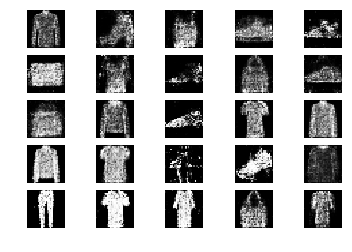

40201 [D loss: 0.644678, acc.: 56.25%] [G loss: 1.041377]
40202 [D loss: 0.627972, acc.: 62.50%] [G loss: 1.024628]
40203 [D loss: 0.620213, acc.: 59.38%] [G loss: 1.047873]
40204 [D loss: 0.649629, acc.: 65.62%] [G loss: 0.990575]
40205 [D loss: 0.635463, acc.: 56.25%] [G loss: 0.925430]
40206 [D loss: 0.643575, acc.: 70.31%] [G loss: 0.918287]
40207 [D loss: 0.623844, acc.: 65.62%] [G loss: 0.911689]
40208 [D loss: 0.695560, acc.: 60.94%] [G loss: 0.887900]
40209 [D loss: 0.661485, acc.: 62.50%] [G loss: 0.956691]
40210 [D loss: 0.717531, acc.: 56.25%] [G loss: 0.903418]
40211 [D loss: 0.684783, acc.: 53.12%] [G loss: 0.890656]
40212 [D loss: 0.636283, acc.: 59.38%] [G loss: 1.047915]
40213 [D loss: 0.639296, acc.: 59.38%] [G loss: 0.919154]
40214 [D loss: 0.637740, acc.: 56.25%] [G loss: 0.968248]
40215 [D loss: 0.566271, acc.: 68.75%] [G loss: 0.904070]
40216 [D loss: 0.580626, acc.: 68.75%] [G loss: 0.933735]
40217 [D loss: 0.658420, acc.: 57.81%] [G loss: 1.087074]
40218 [D loss:

40345 [D loss: 0.572939, acc.: 67.19%] [G loss: 0.878877]
40346 [D loss: 0.692494, acc.: 59.38%] [G loss: 0.906610]
40347 [D loss: 0.647290, acc.: 59.38%] [G loss: 0.896367]
40348 [D loss: 0.600278, acc.: 68.75%] [G loss: 0.982641]
40349 [D loss: 0.604072, acc.: 64.06%] [G loss: 0.921463]
40350 [D loss: 0.612772, acc.: 68.75%] [G loss: 1.045432]
40351 [D loss: 0.632486, acc.: 65.62%] [G loss: 0.933059]
40352 [D loss: 0.632183, acc.: 59.38%] [G loss: 0.956448]
40353 [D loss: 0.619983, acc.: 70.31%] [G loss: 1.018912]
40354 [D loss: 0.625180, acc.: 64.06%] [G loss: 0.946758]
40355 [D loss: 0.683201, acc.: 51.56%] [G loss: 1.052576]
40356 [D loss: 0.573541, acc.: 73.44%] [G loss: 1.023310]
40357 [D loss: 0.641194, acc.: 64.06%] [G loss: 0.890220]
40358 [D loss: 0.613133, acc.: 65.62%] [G loss: 0.912695]
40359 [D loss: 0.716984, acc.: 54.69%] [G loss: 0.890506]
40360 [D loss: 0.651668, acc.: 54.69%] [G loss: 1.028401]
40361 [D loss: 0.615791, acc.: 65.62%] [G loss: 0.918825]
40362 [D loss:

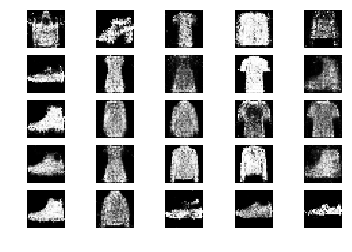

40401 [D loss: 0.654250, acc.: 56.25%] [G loss: 1.071926]
40402 [D loss: 0.624537, acc.: 68.75%] [G loss: 1.051673]
40403 [D loss: 0.603052, acc.: 71.88%] [G loss: 1.035440]
40404 [D loss: 0.641437, acc.: 60.94%] [G loss: 1.047346]
40405 [D loss: 0.669763, acc.: 62.50%] [G loss: 0.926102]
40406 [D loss: 0.656274, acc.: 62.50%] [G loss: 0.965097]
40407 [D loss: 0.645713, acc.: 57.81%] [G loss: 1.005709]
40408 [D loss: 0.608326, acc.: 68.75%] [G loss: 0.982820]
40409 [D loss: 0.686875, acc.: 54.69%] [G loss: 0.914608]
40410 [D loss: 0.637882, acc.: 60.94%] [G loss: 1.008962]
40411 [D loss: 0.616179, acc.: 65.62%] [G loss: 0.982184]
40412 [D loss: 0.661525, acc.: 56.25%] [G loss: 0.988620]
40413 [D loss: 0.661307, acc.: 57.81%] [G loss: 0.982206]
40414 [D loss: 0.636651, acc.: 57.81%] [G loss: 0.988667]
40415 [D loss: 0.550048, acc.: 73.44%] [G loss: 1.020948]
40416 [D loss: 0.567014, acc.: 75.00%] [G loss: 1.069685]
40417 [D loss: 0.602045, acc.: 65.62%] [G loss: 1.085636]
40418 [D loss:

40546 [D loss: 0.673645, acc.: 62.50%] [G loss: 1.049531]
40547 [D loss: 0.602895, acc.: 62.50%] [G loss: 1.096968]
40548 [D loss: 0.642185, acc.: 67.19%] [G loss: 0.953603]
40549 [D loss: 0.573683, acc.: 68.75%] [G loss: 1.021077]
40550 [D loss: 0.650310, acc.: 67.19%] [G loss: 0.978619]
40551 [D loss: 0.595879, acc.: 70.31%] [G loss: 0.920822]
40552 [D loss: 0.533857, acc.: 73.44%] [G loss: 0.917283]
40553 [D loss: 0.565358, acc.: 73.44%] [G loss: 0.946667]
40554 [D loss: 0.604795, acc.: 67.19%] [G loss: 0.909757]
40555 [D loss: 0.569457, acc.: 71.88%] [G loss: 1.012545]
40556 [D loss: 0.603038, acc.: 68.75%] [G loss: 1.125558]
40557 [D loss: 0.676174, acc.: 57.81%] [G loss: 1.073264]
40558 [D loss: 0.629495, acc.: 64.06%] [G loss: 0.996250]
40559 [D loss: 0.636486, acc.: 57.81%] [G loss: 1.054082]
40560 [D loss: 0.644179, acc.: 64.06%] [G loss: 0.938100]
40561 [D loss: 0.605465, acc.: 62.50%] [G loss: 0.964578]
40562 [D loss: 0.533467, acc.: 73.44%] [G loss: 1.176773]
40563 [D loss:

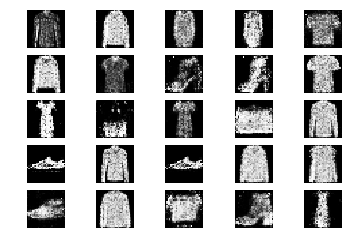

40601 [D loss: 0.605583, acc.: 68.75%] [G loss: 0.999423]
40602 [D loss: 0.636761, acc.: 62.50%] [G loss: 0.906752]
40603 [D loss: 0.638480, acc.: 65.62%] [G loss: 1.005453]
40604 [D loss: 0.628369, acc.: 65.62%] [G loss: 0.967096]
40605 [D loss: 0.636827, acc.: 54.69%] [G loss: 0.975270]
40606 [D loss: 0.672608, acc.: 70.31%] [G loss: 1.020525]
40607 [D loss: 0.624421, acc.: 65.62%] [G loss: 1.136868]
40608 [D loss: 0.688170, acc.: 56.25%] [G loss: 1.037582]
40609 [D loss: 0.653558, acc.: 62.50%] [G loss: 0.988708]
40610 [D loss: 0.653435, acc.: 64.06%] [G loss: 1.010506]
40611 [D loss: 0.671776, acc.: 54.69%] [G loss: 0.988069]
40612 [D loss: 0.648904, acc.: 59.38%] [G loss: 1.014177]
40613 [D loss: 0.694344, acc.: 56.25%] [G loss: 0.904033]
40614 [D loss: 0.577729, acc.: 75.00%] [G loss: 0.870826]
40615 [D loss: 0.644428, acc.: 65.62%] [G loss: 0.985263]
40616 [D loss: 0.550439, acc.: 76.56%] [G loss: 1.036659]
40617 [D loss: 0.651825, acc.: 59.38%] [G loss: 1.010902]
40618 [D loss:

40746 [D loss: 0.571462, acc.: 70.31%] [G loss: 1.043104]
40747 [D loss: 0.681208, acc.: 62.50%] [G loss: 1.017153]
40748 [D loss: 0.591214, acc.: 73.44%] [G loss: 0.990706]
40749 [D loss: 0.637161, acc.: 62.50%] [G loss: 0.994788]
40750 [D loss: 0.596783, acc.: 64.06%] [G loss: 1.077100]
40751 [D loss: 0.630048, acc.: 60.94%] [G loss: 1.018130]
40752 [D loss: 0.713862, acc.: 50.00%] [G loss: 0.980307]
40753 [D loss: 0.624015, acc.: 65.62%] [G loss: 0.908705]
40754 [D loss: 0.623905, acc.: 60.94%] [G loss: 0.965583]
40755 [D loss: 0.610894, acc.: 65.62%] [G loss: 1.034920]
40756 [D loss: 0.667278, acc.: 57.81%] [G loss: 0.983448]
40757 [D loss: 0.611532, acc.: 65.62%] [G loss: 0.898290]
40758 [D loss: 0.651130, acc.: 60.94%] [G loss: 0.897963]
40759 [D loss: 0.628613, acc.: 64.06%] [G loss: 1.034430]
40760 [D loss: 0.584891, acc.: 67.19%] [G loss: 0.964809]
40761 [D loss: 0.650136, acc.: 59.38%] [G loss: 1.043331]
40762 [D loss: 0.645812, acc.: 65.62%] [G loss: 0.974589]
40763 [D loss:

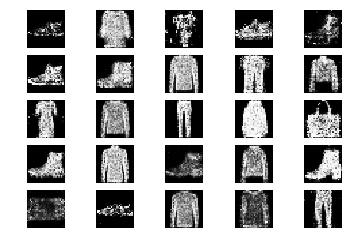

40801 [D loss: 0.626111, acc.: 64.06%] [G loss: 0.956381]
40802 [D loss: 0.675656, acc.: 56.25%] [G loss: 0.933656]
40803 [D loss: 0.735245, acc.: 45.31%] [G loss: 0.986447]
40804 [D loss: 0.636452, acc.: 65.62%] [G loss: 0.956456]
40805 [D loss: 0.662442, acc.: 64.06%] [G loss: 1.111653]
40806 [D loss: 0.666804, acc.: 62.50%] [G loss: 1.017900]
40807 [D loss: 0.642040, acc.: 64.06%] [G loss: 1.033689]
40808 [D loss: 0.576489, acc.: 70.31%] [G loss: 1.116068]
40809 [D loss: 0.543728, acc.: 76.56%] [G loss: 1.044657]
40810 [D loss: 0.660401, acc.: 62.50%] [G loss: 1.044479]
40811 [D loss: 0.582395, acc.: 73.44%] [G loss: 1.009615]
40812 [D loss: 0.639363, acc.: 59.38%] [G loss: 0.978284]
40813 [D loss: 0.600710, acc.: 70.31%] [G loss: 0.970829]
40814 [D loss: 0.615840, acc.: 64.06%] [G loss: 1.012944]
40815 [D loss: 0.677827, acc.: 59.38%] [G loss: 0.894803]
40816 [D loss: 0.607330, acc.: 67.19%] [G loss: 0.882722]
40817 [D loss: 0.558211, acc.: 78.12%] [G loss: 0.937461]
40818 [D loss:

40945 [D loss: 0.608158, acc.: 62.50%] [G loss: 0.928100]
40946 [D loss: 0.632435, acc.: 68.75%] [G loss: 0.882075]
40947 [D loss: 0.692955, acc.: 56.25%] [G loss: 0.954430]
40948 [D loss: 0.656877, acc.: 62.50%] [G loss: 0.962615]
40949 [D loss: 0.643780, acc.: 59.38%] [G loss: 1.020472]
40950 [D loss: 0.734808, acc.: 53.12%] [G loss: 0.954731]
40951 [D loss: 0.632164, acc.: 57.81%] [G loss: 0.990468]
40952 [D loss: 0.653420, acc.: 62.50%] [G loss: 1.059766]
40953 [D loss: 0.610517, acc.: 65.62%] [G loss: 1.034299]
40954 [D loss: 0.645467, acc.: 59.38%] [G loss: 0.949157]
40955 [D loss: 0.523346, acc.: 78.12%] [G loss: 1.028954]
40956 [D loss: 0.630532, acc.: 73.44%] [G loss: 1.024208]
40957 [D loss: 0.619915, acc.: 62.50%] [G loss: 0.970367]
40958 [D loss: 0.556546, acc.: 73.44%] [G loss: 1.117476]
40959 [D loss: 0.707461, acc.: 56.25%] [G loss: 1.045220]
40960 [D loss: 0.708665, acc.: 60.94%] [G loss: 1.139774]
40961 [D loss: 0.533592, acc.: 68.75%] [G loss: 1.064263]
40962 [D loss:

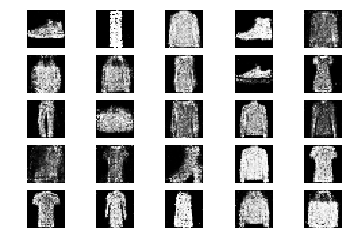

41001 [D loss: 0.653069, acc.: 54.69%] [G loss: 1.066147]
41002 [D loss: 0.626551, acc.: 65.62%] [G loss: 1.133917]
41003 [D loss: 0.604049, acc.: 68.75%] [G loss: 0.942324]
41004 [D loss: 0.627110, acc.: 62.50%] [G loss: 0.931730]
41005 [D loss: 0.553843, acc.: 68.75%] [G loss: 0.881405]
41006 [D loss: 0.653923, acc.: 57.81%] [G loss: 1.033282]
41007 [D loss: 0.665298, acc.: 59.38%] [G loss: 0.954932]
41008 [D loss: 0.643649, acc.: 64.06%] [G loss: 1.048159]
41009 [D loss: 0.637903, acc.: 67.19%] [G loss: 1.028138]
41010 [D loss: 0.651499, acc.: 60.94%] [G loss: 1.127169]
41011 [D loss: 0.649065, acc.: 60.94%] [G loss: 1.017851]
41012 [D loss: 0.670581, acc.: 57.81%] [G loss: 1.027510]
41013 [D loss: 0.647107, acc.: 64.06%] [G loss: 0.992842]
41014 [D loss: 0.660335, acc.: 60.94%] [G loss: 0.902314]
41015 [D loss: 0.591588, acc.: 67.19%] [G loss: 0.960376]
41016 [D loss: 0.595102, acc.: 65.62%] [G loss: 1.039757]
41017 [D loss: 0.588806, acc.: 60.94%] [G loss: 0.957517]
41018 [D loss:

41145 [D loss: 0.653309, acc.: 57.81%] [G loss: 1.068423]
41146 [D loss: 0.638685, acc.: 53.12%] [G loss: 0.938105]
41147 [D loss: 0.560646, acc.: 68.75%] [G loss: 0.869759]
41148 [D loss: 0.612339, acc.: 62.50%] [G loss: 0.980088]
41149 [D loss: 0.607747, acc.: 67.19%] [G loss: 0.957958]
41150 [D loss: 0.691182, acc.: 64.06%] [G loss: 1.061934]
41151 [D loss: 0.633021, acc.: 67.19%] [G loss: 1.116626]
41152 [D loss: 0.710350, acc.: 56.25%] [G loss: 0.937002]
41153 [D loss: 0.670043, acc.: 65.62%] [G loss: 0.982540]
41154 [D loss: 0.742854, acc.: 53.12%] [G loss: 1.086828]
41155 [D loss: 0.622743, acc.: 64.06%] [G loss: 0.991991]
41156 [D loss: 0.535813, acc.: 76.56%] [G loss: 0.879778]
41157 [D loss: 0.652882, acc.: 64.06%] [G loss: 0.937125]
41158 [D loss: 0.633169, acc.: 71.88%] [G loss: 1.173116]
41159 [D loss: 0.644152, acc.: 62.50%] [G loss: 1.075220]
41160 [D loss: 0.623359, acc.: 64.06%] [G loss: 0.987337]
41161 [D loss: 0.668294, acc.: 59.38%] [G loss: 0.995465]
41162 [D loss:

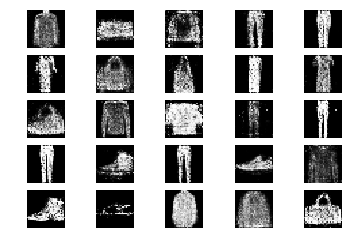

41201 [D loss: 0.569665, acc.: 65.62%] [G loss: 0.959614]
41202 [D loss: 0.638658, acc.: 62.50%] [G loss: 1.060221]
41203 [D loss: 0.688833, acc.: 48.44%] [G loss: 1.008222]
41204 [D loss: 0.732147, acc.: 51.56%] [G loss: 0.945160]
41205 [D loss: 0.650231, acc.: 65.62%] [G loss: 0.993601]
41206 [D loss: 0.643246, acc.: 60.94%] [G loss: 0.984984]
41207 [D loss: 0.561670, acc.: 76.56%] [G loss: 0.920783]
41208 [D loss: 0.567356, acc.: 75.00%] [G loss: 0.958434]
41209 [D loss: 0.674984, acc.: 65.62%] [G loss: 1.071532]
41210 [D loss: 0.650670, acc.: 57.81%] [G loss: 0.970700]
41211 [D loss: 0.633825, acc.: 64.06%] [G loss: 0.975626]
41212 [D loss: 0.601521, acc.: 64.06%] [G loss: 0.966097]
41213 [D loss: 0.614466, acc.: 68.75%] [G loss: 1.000546]
41214 [D loss: 0.632710, acc.: 70.31%] [G loss: 1.006226]
41215 [D loss: 0.606919, acc.: 70.31%] [G loss: 0.998685]
41216 [D loss: 0.621094, acc.: 64.06%] [G loss: 1.038521]
41217 [D loss: 0.607915, acc.: 68.75%] [G loss: 1.019696]
41218 [D loss:

41344 [D loss: 0.621541, acc.: 67.19%] [G loss: 0.991982]
41345 [D loss: 0.640853, acc.: 65.62%] [G loss: 1.064593]
41346 [D loss: 0.620063, acc.: 70.31%] [G loss: 0.934272]
41347 [D loss: 0.603536, acc.: 64.06%] [G loss: 1.012720]
41348 [D loss: 0.621688, acc.: 60.94%] [G loss: 1.109924]
41349 [D loss: 0.546013, acc.: 75.00%] [G loss: 0.937832]
41350 [D loss: 0.661602, acc.: 56.25%] [G loss: 1.007773]
41351 [D loss: 0.620054, acc.: 62.50%] [G loss: 1.037141]
41352 [D loss: 0.610349, acc.: 71.88%] [G loss: 0.966597]
41353 [D loss: 0.722063, acc.: 53.12%] [G loss: 1.007668]
41354 [D loss: 0.579495, acc.: 71.88%] [G loss: 1.017868]
41355 [D loss: 0.622316, acc.: 65.62%] [G loss: 0.998847]
41356 [D loss: 0.616802, acc.: 65.62%] [G loss: 1.082857]
41357 [D loss: 0.594889, acc.: 68.75%] [G loss: 0.880529]
41358 [D loss: 0.603750, acc.: 65.62%] [G loss: 0.904401]
41359 [D loss: 0.665035, acc.: 59.38%] [G loss: 0.961648]
41360 [D loss: 0.581856, acc.: 70.31%] [G loss: 0.979179]
41361 [D loss:

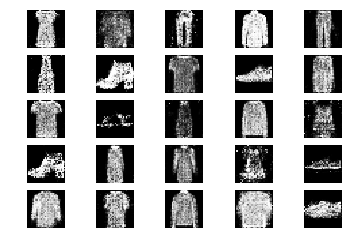

41401 [D loss: 0.655683, acc.: 59.38%] [G loss: 0.931043]
41402 [D loss: 0.667025, acc.: 62.50%] [G loss: 0.895621]
41403 [D loss: 0.565813, acc.: 68.75%] [G loss: 1.023622]
41404 [D loss: 0.711907, acc.: 57.81%] [G loss: 1.038038]
41405 [D loss: 0.637100, acc.: 64.06%] [G loss: 0.980035]
41406 [D loss: 0.642094, acc.: 62.50%] [G loss: 0.986048]
41407 [D loss: 0.569223, acc.: 73.44%] [G loss: 1.029026]
41408 [D loss: 0.628607, acc.: 59.38%] [G loss: 1.030573]
41409 [D loss: 0.613133, acc.: 65.62%] [G loss: 1.098830]
41410 [D loss: 0.696537, acc.: 54.69%] [G loss: 1.066100]
41411 [D loss: 0.760365, acc.: 51.56%] [G loss: 1.033180]
41412 [D loss: 0.671109, acc.: 60.94%] [G loss: 1.015178]
41413 [D loss: 0.613885, acc.: 65.62%] [G loss: 0.973066]
41414 [D loss: 0.593796, acc.: 70.31%] [G loss: 0.840975]
41415 [D loss: 0.610905, acc.: 60.94%] [G loss: 0.842025]
41416 [D loss: 0.621059, acc.: 68.75%] [G loss: 1.051907]
41417 [D loss: 0.578835, acc.: 71.88%] [G loss: 1.004556]
41418 [D loss:

41545 [D loss: 0.623041, acc.: 60.94%] [G loss: 1.065003]
41546 [D loss: 0.534108, acc.: 76.56%] [G loss: 1.180488]
41547 [D loss: 0.685186, acc.: 64.06%] [G loss: 1.102324]
41548 [D loss: 0.716183, acc.: 46.88%] [G loss: 1.077303]
41549 [D loss: 0.572056, acc.: 65.62%] [G loss: 1.093764]
41550 [D loss: 0.550474, acc.: 78.12%] [G loss: 1.126215]
41551 [D loss: 0.638791, acc.: 57.81%] [G loss: 1.054962]
41552 [D loss: 0.627285, acc.: 68.75%] [G loss: 1.009420]
41553 [D loss: 0.718892, acc.: 51.56%] [G loss: 1.051347]
41554 [D loss: 0.559475, acc.: 76.56%] [G loss: 1.069882]
41555 [D loss: 0.627743, acc.: 62.50%] [G loss: 1.130948]
41556 [D loss: 0.613443, acc.: 65.62%] [G loss: 1.088406]
41557 [D loss: 0.642063, acc.: 67.19%] [G loss: 1.117360]
41558 [D loss: 0.683743, acc.: 56.25%] [G loss: 1.025850]
41559 [D loss: 0.593371, acc.: 67.19%] [G loss: 1.086522]
41560 [D loss: 0.655601, acc.: 59.38%] [G loss: 1.111293]
41561 [D loss: 0.683429, acc.: 54.69%] [G loss: 1.130352]
41562 [D loss:

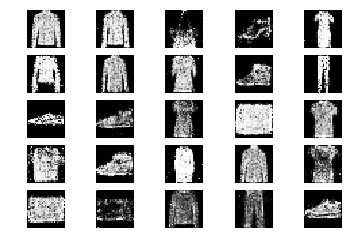

41601 [D loss: 0.595180, acc.: 62.50%] [G loss: 0.979776]
41602 [D loss: 0.612481, acc.: 62.50%] [G loss: 0.921205]
41603 [D loss: 0.616636, acc.: 64.06%] [G loss: 1.061033]
41604 [D loss: 0.665550, acc.: 59.38%] [G loss: 1.017906]
41605 [D loss: 0.638177, acc.: 62.50%] [G loss: 1.047213]
41606 [D loss: 0.621071, acc.: 64.06%] [G loss: 0.942133]
41607 [D loss: 0.577567, acc.: 73.44%] [G loss: 0.880331]
41608 [D loss: 0.688053, acc.: 59.38%] [G loss: 0.922143]
41609 [D loss: 0.626411, acc.: 67.19%] [G loss: 0.933801]
41610 [D loss: 0.599411, acc.: 73.44%] [G loss: 0.912793]
41611 [D loss: 0.652170, acc.: 68.75%] [G loss: 1.039088]
41612 [D loss: 0.559491, acc.: 70.31%] [G loss: 1.133358]
41613 [D loss: 0.620033, acc.: 62.50%] [G loss: 1.080578]
41614 [D loss: 0.679196, acc.: 57.81%] [G loss: 1.053651]
41615 [D loss: 0.622643, acc.: 62.50%] [G loss: 0.902006]
41616 [D loss: 0.624314, acc.: 68.75%] [G loss: 1.060618]
41617 [D loss: 0.616349, acc.: 68.75%] [G loss: 1.103810]
41618 [D loss:

41743 [D loss: 0.618414, acc.: 62.50%] [G loss: 1.049871]
41744 [D loss: 0.657570, acc.: 59.38%] [G loss: 0.972131]
41745 [D loss: 0.638635, acc.: 65.62%] [G loss: 0.909885]
41746 [D loss: 0.569488, acc.: 70.31%] [G loss: 1.003747]
41747 [D loss: 0.732784, acc.: 53.12%] [G loss: 0.885926]
41748 [D loss: 0.632280, acc.: 59.38%] [G loss: 1.035603]
41749 [D loss: 0.645565, acc.: 65.62%] [G loss: 1.010875]
41750 [D loss: 0.616055, acc.: 64.06%] [G loss: 1.041418]
41751 [D loss: 0.595128, acc.: 62.50%] [G loss: 0.975688]
41752 [D loss: 0.599243, acc.: 64.06%] [G loss: 1.003660]
41753 [D loss: 0.629128, acc.: 62.50%] [G loss: 0.974177]
41754 [D loss: 0.689810, acc.: 50.00%] [G loss: 0.919404]
41755 [D loss: 0.572069, acc.: 70.31%] [G loss: 0.932714]
41756 [D loss: 0.613621, acc.: 65.62%] [G loss: 0.988810]
41757 [D loss: 0.666320, acc.: 62.50%] [G loss: 0.975599]
41758 [D loss: 0.701145, acc.: 51.56%] [G loss: 1.137937]
41759 [D loss: 0.615195, acc.: 67.19%] [G loss: 1.048010]
41760 [D loss:

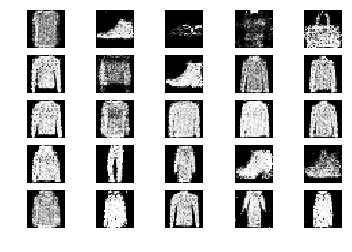

41801 [D loss: 0.616320, acc.: 62.50%] [G loss: 1.120232]
41802 [D loss: 0.647851, acc.: 56.25%] [G loss: 1.074121]
41803 [D loss: 0.600244, acc.: 67.19%] [G loss: 1.024294]
41804 [D loss: 0.598998, acc.: 67.19%] [G loss: 1.007433]
41805 [D loss: 0.687682, acc.: 59.38%] [G loss: 1.064980]
41806 [D loss: 0.607262, acc.: 67.19%] [G loss: 1.016150]
41807 [D loss: 0.654569, acc.: 60.94%] [G loss: 0.934040]
41808 [D loss: 0.630862, acc.: 67.19%] [G loss: 0.993399]
41809 [D loss: 0.700127, acc.: 51.56%] [G loss: 0.840425]
41810 [D loss: 0.632204, acc.: 59.38%] [G loss: 0.929220]
41811 [D loss: 0.617671, acc.: 67.19%] [G loss: 0.959412]
41812 [D loss: 0.584677, acc.: 73.44%] [G loss: 0.993842]
41813 [D loss: 0.609908, acc.: 65.62%] [G loss: 0.900027]
41814 [D loss: 0.610431, acc.: 64.06%] [G loss: 0.985442]
41815 [D loss: 0.677994, acc.: 57.81%] [G loss: 1.002399]
41816 [D loss: 0.665928, acc.: 64.06%] [G loss: 1.037018]
41817 [D loss: 0.674011, acc.: 67.19%] [G loss: 0.991109]
41818 [D loss:

41944 [D loss: 0.592239, acc.: 64.06%] [G loss: 1.042560]
41945 [D loss: 0.697384, acc.: 48.44%] [G loss: 1.015377]
41946 [D loss: 0.538479, acc.: 73.44%] [G loss: 1.100803]
41947 [D loss: 0.644915, acc.: 65.62%] [G loss: 1.094167]
41948 [D loss: 0.579470, acc.: 73.44%] [G loss: 0.976427]
41949 [D loss: 0.656640, acc.: 59.38%] [G loss: 0.990268]
41950 [D loss: 0.584011, acc.: 65.62%] [G loss: 0.872552]
41951 [D loss: 0.626514, acc.: 64.06%] [G loss: 0.955116]
41952 [D loss: 0.645325, acc.: 56.25%] [G loss: 0.967017]
41953 [D loss: 0.706830, acc.: 56.25%] [G loss: 0.951304]
41954 [D loss: 0.648053, acc.: 57.81%] [G loss: 0.960274]
41955 [D loss: 0.651520, acc.: 64.06%] [G loss: 0.867794]
41956 [D loss: 0.648753, acc.: 57.81%] [G loss: 0.920183]
41957 [D loss: 0.637733, acc.: 60.94%] [G loss: 1.028935]
41958 [D loss: 0.669387, acc.: 57.81%] [G loss: 1.030248]
41959 [D loss: 0.532018, acc.: 73.44%] [G loss: 1.028229]
41960 [D loss: 0.644489, acc.: 67.19%] [G loss: 0.949382]
41961 [D loss:

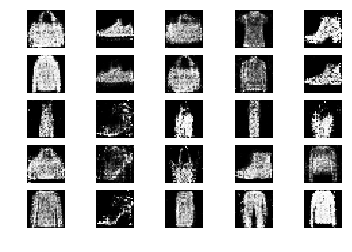

42001 [D loss: 0.693604, acc.: 67.19%] [G loss: 0.833894]
42002 [D loss: 0.601694, acc.: 70.31%] [G loss: 0.991103]
42003 [D loss: 0.594102, acc.: 67.19%] [G loss: 0.973218]
42004 [D loss: 0.628184, acc.: 60.94%] [G loss: 1.009092]
42005 [D loss: 0.610707, acc.: 67.19%] [G loss: 0.977561]
42006 [D loss: 0.676181, acc.: 62.50%] [G loss: 1.088960]
42007 [D loss: 0.625700, acc.: 68.75%] [G loss: 1.114111]
42008 [D loss: 0.672643, acc.: 59.38%] [G loss: 0.977798]
42009 [D loss: 0.727161, acc.: 50.00%] [G loss: 0.932804]
42010 [D loss: 0.601503, acc.: 64.06%] [G loss: 1.003766]
42011 [D loss: 0.665253, acc.: 56.25%] [G loss: 1.005560]
42012 [D loss: 0.564622, acc.: 75.00%] [G loss: 1.076955]
42013 [D loss: 0.608114, acc.: 64.06%] [G loss: 1.116472]
42014 [D loss: 0.538638, acc.: 76.56%] [G loss: 1.006683]
42015 [D loss: 0.602984, acc.: 65.62%] [G loss: 0.988510]
42016 [D loss: 0.638114, acc.: 59.38%] [G loss: 1.014634]
42017 [D loss: 0.645080, acc.: 57.81%] [G loss: 0.903473]
42018 [D loss:

42145 [D loss: 0.667431, acc.: 56.25%] [G loss: 0.959691]
42146 [D loss: 0.714818, acc.: 54.69%] [G loss: 1.083685]
42147 [D loss: 0.517265, acc.: 76.56%] [G loss: 0.956352]
42148 [D loss: 0.690160, acc.: 59.38%] [G loss: 0.999557]
42149 [D loss: 0.586727, acc.: 62.50%] [G loss: 1.009668]
42150 [D loss: 0.550864, acc.: 76.56%] [G loss: 0.961221]
42151 [D loss: 0.644382, acc.: 62.50%] [G loss: 0.928003]
42152 [D loss: 0.686634, acc.: 54.69%] [G loss: 1.182920]
42153 [D loss: 0.610443, acc.: 67.19%] [G loss: 1.104336]
42154 [D loss: 0.659495, acc.: 59.38%] [G loss: 0.991225]
42155 [D loss: 0.590938, acc.: 65.62%] [G loss: 0.915334]
42156 [D loss: 0.616564, acc.: 65.62%] [G loss: 1.007300]
42157 [D loss: 0.639815, acc.: 60.94%] [G loss: 0.903280]
42158 [D loss: 0.680007, acc.: 59.38%] [G loss: 1.044753]
42159 [D loss: 0.585888, acc.: 68.75%] [G loss: 0.990705]
42160 [D loss: 0.573547, acc.: 65.62%] [G loss: 0.987565]
42161 [D loss: 0.586615, acc.: 67.19%] [G loss: 0.984662]
42162 [D loss:

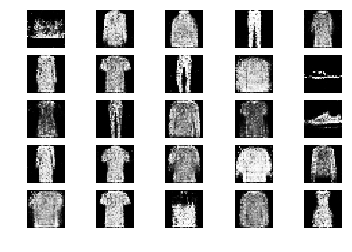

42201 [D loss: 0.597082, acc.: 71.88%] [G loss: 1.081354]
42202 [D loss: 0.622270, acc.: 62.50%] [G loss: 0.988028]
42203 [D loss: 0.643530, acc.: 64.06%] [G loss: 1.018532]
42204 [D loss: 0.617617, acc.: 71.88%] [G loss: 0.923131]
42205 [D loss: 0.650636, acc.: 59.38%] [G loss: 0.931338]
42206 [D loss: 0.635906, acc.: 56.25%] [G loss: 0.966187]
42207 [D loss: 0.612356, acc.: 67.19%] [G loss: 0.990517]
42208 [D loss: 0.695473, acc.: 60.94%] [G loss: 0.973924]
42209 [D loss: 0.650970, acc.: 54.69%] [G loss: 0.946761]
42210 [D loss: 0.660878, acc.: 56.25%] [G loss: 1.048410]
42211 [D loss: 0.643738, acc.: 57.81%] [G loss: 1.043339]
42212 [D loss: 0.638626, acc.: 57.81%] [G loss: 1.012448]
42213 [D loss: 0.634597, acc.: 67.19%] [G loss: 1.030910]
42214 [D loss: 0.622955, acc.: 64.06%] [G loss: 0.958078]
42215 [D loss: 0.666588, acc.: 56.25%] [G loss: 0.922021]
42216 [D loss: 0.609449, acc.: 67.19%] [G loss: 1.022661]
42217 [D loss: 0.718201, acc.: 54.69%] [G loss: 1.057481]
42218 [D loss:

42343 [D loss: 0.618920, acc.: 67.19%] [G loss: 0.957064]
42344 [D loss: 0.604289, acc.: 70.31%] [G loss: 1.062875]
42345 [D loss: 0.658799, acc.: 56.25%] [G loss: 0.970300]
42346 [D loss: 0.613764, acc.: 65.62%] [G loss: 0.941639]
42347 [D loss: 0.662377, acc.: 60.94%] [G loss: 1.054203]
42348 [D loss: 0.608114, acc.: 71.88%] [G loss: 0.938797]
42349 [D loss: 0.669574, acc.: 62.50%] [G loss: 0.924142]
42350 [D loss: 0.644804, acc.: 67.19%] [G loss: 0.976828]
42351 [D loss: 0.660454, acc.: 60.94%] [G loss: 0.911278]
42352 [D loss: 0.624705, acc.: 67.19%] [G loss: 1.030747]
42353 [D loss: 0.651006, acc.: 62.50%] [G loss: 1.095800]
42354 [D loss: 0.676396, acc.: 53.12%] [G loss: 1.156159]
42355 [D loss: 0.617592, acc.: 67.19%] [G loss: 1.002571]
42356 [D loss: 0.593953, acc.: 73.44%] [G loss: 0.845130]
42357 [D loss: 0.609267, acc.: 68.75%] [G loss: 0.891718]
42358 [D loss: 0.588845, acc.: 68.75%] [G loss: 0.885792]
42359 [D loss: 0.580974, acc.: 68.75%] [G loss: 0.858352]
42360 [D loss:

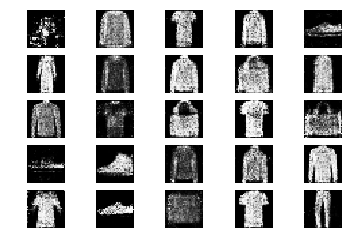

42401 [D loss: 0.572081, acc.: 71.88%] [G loss: 1.042396]
42402 [D loss: 0.592781, acc.: 64.06%] [G loss: 0.918563]
42403 [D loss: 0.672527, acc.: 59.38%] [G loss: 0.872991]
42404 [D loss: 0.528906, acc.: 68.75%] [G loss: 0.967207]
42405 [D loss: 0.590270, acc.: 65.62%] [G loss: 1.006998]
42406 [D loss: 0.589553, acc.: 70.31%] [G loss: 0.925770]
42407 [D loss: 0.586555, acc.: 71.88%] [G loss: 1.035501]
42408 [D loss: 0.570925, acc.: 70.31%] [G loss: 0.976262]
42409 [D loss: 0.595244, acc.: 65.62%] [G loss: 1.062038]
42410 [D loss: 0.678452, acc.: 62.50%] [G loss: 1.018383]
42411 [D loss: 0.688771, acc.: 54.69%] [G loss: 0.960676]
42412 [D loss: 0.608177, acc.: 67.19%] [G loss: 0.999202]
42413 [D loss: 0.629029, acc.: 57.81%] [G loss: 0.957167]
42414 [D loss: 0.590404, acc.: 64.06%] [G loss: 1.026095]
42415 [D loss: 0.674917, acc.: 60.94%] [G loss: 1.060424]
42416 [D loss: 0.606380, acc.: 68.75%] [G loss: 1.001894]
42417 [D loss: 0.676095, acc.: 48.44%] [G loss: 0.890608]
42418 [D loss:

42544 [D loss: 0.617312, acc.: 68.75%] [G loss: 1.045210]
42545 [D loss: 0.661808, acc.: 51.56%] [G loss: 1.077065]
42546 [D loss: 0.570123, acc.: 81.25%] [G loss: 1.013711]
42547 [D loss: 0.596196, acc.: 75.00%] [G loss: 0.946469]
42548 [D loss: 0.526343, acc.: 79.69%] [G loss: 0.994332]
42549 [D loss: 0.612105, acc.: 67.19%] [G loss: 0.946367]
42550 [D loss: 0.570532, acc.: 70.31%] [G loss: 0.880069]
42551 [D loss: 0.622868, acc.: 67.19%] [G loss: 1.035084]
42552 [D loss: 0.661753, acc.: 64.06%] [G loss: 0.952549]
42553 [D loss: 0.691045, acc.: 48.44%] [G loss: 0.939738]
42554 [D loss: 0.658356, acc.: 56.25%] [G loss: 1.088007]
42555 [D loss: 0.602015, acc.: 65.62%] [G loss: 1.015075]
42556 [D loss: 0.633986, acc.: 60.94%] [G loss: 0.956048]
42557 [D loss: 0.598365, acc.: 67.19%] [G loss: 1.124637]
42558 [D loss: 0.584772, acc.: 68.75%] [G loss: 1.086189]
42559 [D loss: 0.584714, acc.: 73.44%] [G loss: 1.053398]
42560 [D loss: 0.633508, acc.: 62.50%] [G loss: 1.011824]
42561 [D loss:

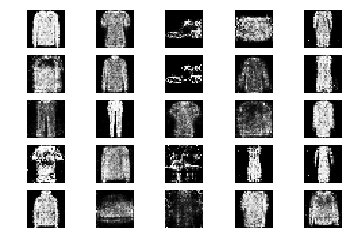

42601 [D loss: 0.589102, acc.: 70.31%] [G loss: 1.014527]
42602 [D loss: 0.663636, acc.: 60.94%] [G loss: 1.124034]
42603 [D loss: 0.581319, acc.: 64.06%] [G loss: 0.974310]
42604 [D loss: 0.647994, acc.: 68.75%] [G loss: 1.056244]
42605 [D loss: 0.668084, acc.: 54.69%] [G loss: 0.890390]
42606 [D loss: 0.558728, acc.: 71.88%] [G loss: 0.987764]
42607 [D loss: 0.657838, acc.: 60.94%] [G loss: 1.015903]
42608 [D loss: 0.652638, acc.: 64.06%] [G loss: 1.087493]
42609 [D loss: 0.721001, acc.: 50.00%] [G loss: 0.933851]
42610 [D loss: 0.613618, acc.: 59.38%] [G loss: 1.063305]
42611 [D loss: 0.590062, acc.: 67.19%] [G loss: 0.940303]
42612 [D loss: 0.600684, acc.: 62.50%] [G loss: 0.892236]
42613 [D loss: 0.652057, acc.: 59.38%] [G loss: 0.927647]
42614 [D loss: 0.648626, acc.: 59.38%] [G loss: 1.030644]
42615 [D loss: 0.591831, acc.: 65.62%] [G loss: 1.035663]
42616 [D loss: 0.630359, acc.: 59.38%] [G loss: 1.118680]
42617 [D loss: 0.619325, acc.: 62.50%] [G loss: 1.016364]
42618 [D loss:

42745 [D loss: 0.691353, acc.: 53.12%] [G loss: 0.874627]
42746 [D loss: 0.629904, acc.: 68.75%] [G loss: 0.966882]
42747 [D loss: 0.590091, acc.: 64.06%] [G loss: 1.016394]
42748 [D loss: 0.639806, acc.: 60.94%] [G loss: 1.142089]
42749 [D loss: 0.717394, acc.: 59.38%] [G loss: 1.011744]
42750 [D loss: 0.666211, acc.: 65.62%] [G loss: 0.933296]
42751 [D loss: 0.614653, acc.: 65.62%] [G loss: 1.004028]
42752 [D loss: 0.666294, acc.: 53.12%] [G loss: 1.006614]
42753 [D loss: 0.705866, acc.: 56.25%] [G loss: 1.060223]
42754 [D loss: 0.595130, acc.: 68.75%] [G loss: 0.996618]
42755 [D loss: 0.621668, acc.: 62.50%] [G loss: 1.009182]
42756 [D loss: 0.501303, acc.: 75.00%] [G loss: 0.946438]
42757 [D loss: 0.603372, acc.: 78.12%] [G loss: 1.043466]
42758 [D loss: 0.542888, acc.: 76.56%] [G loss: 1.018378]
42759 [D loss: 0.686480, acc.: 60.94%] [G loss: 0.990115]
42760 [D loss: 0.587803, acc.: 68.75%] [G loss: 1.091207]
42761 [D loss: 0.596379, acc.: 68.75%] [G loss: 1.063924]
42762 [D loss:

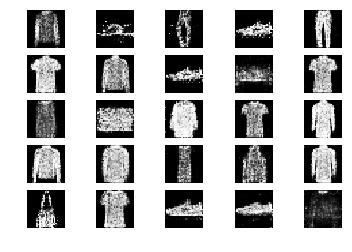

42801 [D loss: 0.632584, acc.: 60.94%] [G loss: 0.975979]
42802 [D loss: 0.613332, acc.: 71.88%] [G loss: 0.888904]
42803 [D loss: 0.676340, acc.: 57.81%] [G loss: 0.981091]
42804 [D loss: 0.558297, acc.: 73.44%] [G loss: 1.047227]
42805 [D loss: 0.618861, acc.: 67.19%] [G loss: 0.862921]
42806 [D loss: 0.656871, acc.: 59.38%] [G loss: 1.015183]
42807 [D loss: 0.623247, acc.: 64.06%] [G loss: 1.076801]
42808 [D loss: 0.662124, acc.: 60.94%] [G loss: 1.182105]
42809 [D loss: 0.598824, acc.: 68.75%] [G loss: 0.967992]
42810 [D loss: 0.656924, acc.: 59.38%] [G loss: 1.126053]
42811 [D loss: 0.652558, acc.: 56.25%] [G loss: 0.969281]
42812 [D loss: 0.654621, acc.: 57.81%] [G loss: 0.980319]
42813 [D loss: 0.624106, acc.: 65.62%] [G loss: 1.080491]
42814 [D loss: 0.665988, acc.: 56.25%] [G loss: 1.048561]
42815 [D loss: 0.640024, acc.: 59.38%] [G loss: 0.947827]
42816 [D loss: 0.670755, acc.: 60.94%] [G loss: 0.853532]
42817 [D loss: 0.573563, acc.: 67.19%] [G loss: 1.049522]
42818 [D loss:

42945 [D loss: 0.607049, acc.: 62.50%] [G loss: 1.043289]
42946 [D loss: 0.627823, acc.: 65.62%] [G loss: 1.094143]
42947 [D loss: 0.644687, acc.: 59.38%] [G loss: 1.027908]
42948 [D loss: 0.648368, acc.: 62.50%] [G loss: 1.162706]
42949 [D loss: 0.635800, acc.: 60.94%] [G loss: 1.052518]
42950 [D loss: 0.683938, acc.: 50.00%] [G loss: 1.054995]
42951 [D loss: 0.661261, acc.: 56.25%] [G loss: 1.028949]
42952 [D loss: 0.626262, acc.: 62.50%] [G loss: 0.998643]
42953 [D loss: 0.616708, acc.: 75.00%] [G loss: 0.951217]
42954 [D loss: 0.688518, acc.: 53.12%] [G loss: 0.966927]
42955 [D loss: 0.595772, acc.: 65.62%] [G loss: 0.956661]
42956 [D loss: 0.671951, acc.: 59.38%] [G loss: 0.932050]
42957 [D loss: 0.610962, acc.: 65.62%] [G loss: 1.043599]
42958 [D loss: 0.621517, acc.: 64.06%] [G loss: 1.150797]
42959 [D loss: 0.631801, acc.: 60.94%] [G loss: 1.068412]
42960 [D loss: 0.615805, acc.: 70.31%] [G loss: 0.992453]
42961 [D loss: 0.632600, acc.: 67.19%] [G loss: 1.013064]
42962 [D loss:

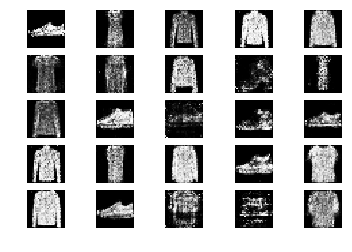

43001 [D loss: 0.580161, acc.: 64.06%] [G loss: 0.909957]
43002 [D loss: 0.532225, acc.: 75.00%] [G loss: 1.038157]
43003 [D loss: 0.622511, acc.: 62.50%] [G loss: 0.947069]
43004 [D loss: 0.636030, acc.: 65.62%] [G loss: 1.107061]
43005 [D loss: 0.627971, acc.: 60.94%] [G loss: 1.076192]
43006 [D loss: 0.628393, acc.: 65.62%] [G loss: 0.892298]
43007 [D loss: 0.517952, acc.: 78.12%] [G loss: 0.806303]
43008 [D loss: 0.732549, acc.: 54.69%] [G loss: 0.953509]
43009 [D loss: 0.571570, acc.: 65.62%] [G loss: 0.985209]
43010 [D loss: 0.566093, acc.: 71.88%] [G loss: 0.931882]
43011 [D loss: 0.645121, acc.: 64.06%] [G loss: 0.968314]
43012 [D loss: 0.558905, acc.: 70.31%] [G loss: 0.974571]
43013 [D loss: 0.605345, acc.: 65.62%] [G loss: 0.922581]
43014 [D loss: 0.597301, acc.: 68.75%] [G loss: 1.063273]
43015 [D loss: 0.699302, acc.: 62.50%] [G loss: 0.984333]
43016 [D loss: 0.619020, acc.: 65.62%] [G loss: 1.201488]
43017 [D loss: 0.636181, acc.: 62.50%] [G loss: 1.024347]
43018 [D loss:

43146 [D loss: 0.568628, acc.: 73.44%] [G loss: 1.062682]
43147 [D loss: 0.643637, acc.: 62.50%] [G loss: 0.971504]
43148 [D loss: 0.625629, acc.: 68.75%] [G loss: 0.966476]
43149 [D loss: 0.678188, acc.: 60.94%] [G loss: 0.878052]
43150 [D loss: 0.717825, acc.: 48.44%] [G loss: 1.031465]
43151 [D loss: 0.626882, acc.: 67.19%] [G loss: 0.861348]
43152 [D loss: 0.628854, acc.: 68.75%] [G loss: 1.034545]
43153 [D loss: 0.627397, acc.: 64.06%] [G loss: 1.024320]
43154 [D loss: 0.566052, acc.: 70.31%] [G loss: 0.958761]
43155 [D loss: 0.619059, acc.: 65.62%] [G loss: 0.940689]
43156 [D loss: 0.607258, acc.: 68.75%] [G loss: 1.105127]
43157 [D loss: 0.621304, acc.: 71.88%] [G loss: 0.943039]
43158 [D loss: 0.703964, acc.: 57.81%] [G loss: 0.995635]
43159 [D loss: 0.561252, acc.: 67.19%] [G loss: 0.963103]
43160 [D loss: 0.627312, acc.: 67.19%] [G loss: 1.005414]
43161 [D loss: 0.744121, acc.: 48.44%] [G loss: 1.068542]
43162 [D loss: 0.681528, acc.: 53.12%] [G loss: 0.995672]
43163 [D loss:

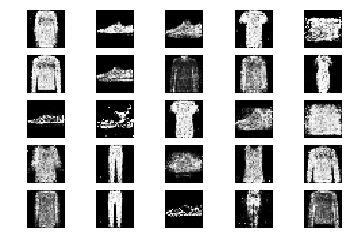

43201 [D loss: 0.680135, acc.: 62.50%] [G loss: 1.008727]
43202 [D loss: 0.639923, acc.: 60.94%] [G loss: 1.181026]
43203 [D loss: 0.549199, acc.: 81.25%] [G loss: 1.073153]
43204 [D loss: 0.584699, acc.: 73.44%] [G loss: 0.994743]
43205 [D loss: 0.615193, acc.: 60.94%] [G loss: 1.030003]
43206 [D loss: 0.587472, acc.: 67.19%] [G loss: 1.028238]
43207 [D loss: 0.607962, acc.: 67.19%] [G loss: 1.065590]
43208 [D loss: 0.584948, acc.: 70.31%] [G loss: 1.010752]
43209 [D loss: 0.598634, acc.: 67.19%] [G loss: 1.052741]
43210 [D loss: 0.557073, acc.: 75.00%] [G loss: 1.148074]
43211 [D loss: 0.608844, acc.: 64.06%] [G loss: 0.998286]
43212 [D loss: 0.586955, acc.: 73.44%] [G loss: 0.943308]
43213 [D loss: 0.645555, acc.: 59.38%] [G loss: 0.912969]
43214 [D loss: 0.647814, acc.: 64.06%] [G loss: 1.118597]
43215 [D loss: 0.584669, acc.: 78.12%] [G loss: 1.100078]
43216 [D loss: 0.569027, acc.: 70.31%] [G loss: 1.126950]
43217 [D loss: 0.584547, acc.: 67.19%] [G loss: 1.082718]
43218 [D loss:

43344 [D loss: 0.546644, acc.: 76.56%] [G loss: 1.014213]
43345 [D loss: 0.620140, acc.: 62.50%] [G loss: 0.957977]
43346 [D loss: 0.531604, acc.: 75.00%] [G loss: 1.049118]
43347 [D loss: 0.622523, acc.: 65.62%] [G loss: 0.937876]
43348 [D loss: 0.641166, acc.: 65.62%] [G loss: 0.957983]
43349 [D loss: 0.683274, acc.: 62.50%] [G loss: 1.053082]
43350 [D loss: 0.645072, acc.: 60.94%] [G loss: 0.954171]
43351 [D loss: 0.622200, acc.: 56.25%] [G loss: 0.975866]
43352 [D loss: 0.569521, acc.: 73.44%] [G loss: 0.933199]
43353 [D loss: 0.643356, acc.: 65.62%] [G loss: 0.835910]
43354 [D loss: 0.661091, acc.: 65.62%] [G loss: 0.891787]
43355 [D loss: 0.591834, acc.: 59.38%] [G loss: 0.970915]
43356 [D loss: 0.554630, acc.: 68.75%] [G loss: 0.938865]
43357 [D loss: 0.606216, acc.: 62.50%] [G loss: 0.970456]
43358 [D loss: 0.614284, acc.: 70.31%] [G loss: 0.967435]
43359 [D loss: 0.548729, acc.: 73.44%] [G loss: 1.100591]
43360 [D loss: 0.725683, acc.: 48.44%] [G loss: 0.966366]
43361 [D loss:

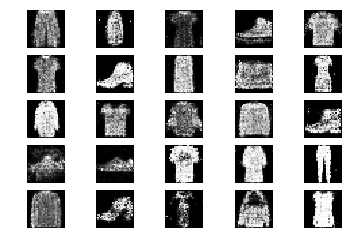

43401 [D loss: 0.705891, acc.: 59.38%] [G loss: 0.916678]
43402 [D loss: 0.686481, acc.: 54.69%] [G loss: 0.989195]
43403 [D loss: 0.713958, acc.: 53.12%] [G loss: 0.996030]
43404 [D loss: 0.623166, acc.: 60.94%] [G loss: 0.877944]
43405 [D loss: 0.567369, acc.: 68.75%] [G loss: 1.014408]
43406 [D loss: 0.668066, acc.: 59.38%] [G loss: 1.020140]
43407 [D loss: 0.649684, acc.: 57.81%] [G loss: 0.966231]
43408 [D loss: 0.552844, acc.: 68.75%] [G loss: 1.003788]
43409 [D loss: 0.605416, acc.: 76.56%] [G loss: 0.943759]
43410 [D loss: 0.645999, acc.: 62.50%] [G loss: 1.008234]
43411 [D loss: 0.698245, acc.: 59.38%] [G loss: 0.972188]
43412 [D loss: 0.610978, acc.: 70.31%] [G loss: 0.952019]
43413 [D loss: 0.597946, acc.: 71.88%] [G loss: 1.117226]
43414 [D loss: 0.673427, acc.: 64.06%] [G loss: 1.033184]
43415 [D loss: 0.601742, acc.: 68.75%] [G loss: 1.019172]
43416 [D loss: 0.646311, acc.: 56.25%] [G loss: 1.033545]
43417 [D loss: 0.587345, acc.: 64.06%] [G loss: 0.844302]
43418 [D loss:

43545 [D loss: 0.726383, acc.: 51.56%] [G loss: 0.992036]
43546 [D loss: 0.627079, acc.: 68.75%] [G loss: 1.023400]
43547 [D loss: 0.669542, acc.: 65.62%] [G loss: 0.956309]
43548 [D loss: 0.577099, acc.: 62.50%] [G loss: 1.080699]
43549 [D loss: 0.674269, acc.: 56.25%] [G loss: 1.126490]
43550 [D loss: 0.652042, acc.: 62.50%] [G loss: 1.115954]
43551 [D loss: 0.615027, acc.: 67.19%] [G loss: 1.182129]
43552 [D loss: 0.705129, acc.: 50.00%] [G loss: 1.046498]
43553 [D loss: 0.572636, acc.: 70.31%] [G loss: 1.133659]
43554 [D loss: 0.604014, acc.: 75.00%] [G loss: 0.966795]
43555 [D loss: 0.648245, acc.: 60.94%] [G loss: 0.976690]
43556 [D loss: 0.611697, acc.: 68.75%] [G loss: 0.978339]
43557 [D loss: 0.604442, acc.: 65.62%] [G loss: 0.942854]
43558 [D loss: 0.661596, acc.: 60.94%] [G loss: 0.965752]
43559 [D loss: 0.678197, acc.: 56.25%] [G loss: 0.962358]
43560 [D loss: 0.637566, acc.: 57.81%] [G loss: 0.918967]
43561 [D loss: 0.591678, acc.: 64.06%] [G loss: 1.009617]
43562 [D loss:

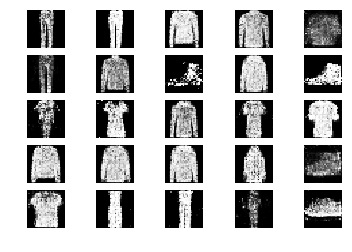

43601 [D loss: 0.592037, acc.: 62.50%] [G loss: 0.937745]
43602 [D loss: 0.613132, acc.: 64.06%] [G loss: 1.015294]
43603 [D loss: 0.756594, acc.: 50.00%] [G loss: 1.009267]
43604 [D loss: 0.584824, acc.: 62.50%] [G loss: 1.049516]
43605 [D loss: 0.534585, acc.: 79.69%] [G loss: 0.925466]
43606 [D loss: 0.592482, acc.: 67.19%] [G loss: 1.065862]
43607 [D loss: 0.709807, acc.: 46.88%] [G loss: 1.052934]
43608 [D loss: 0.638058, acc.: 60.94%] [G loss: 1.021649]
43609 [D loss: 0.705144, acc.: 59.38%] [G loss: 0.891442]
43610 [D loss: 0.670435, acc.: 57.81%] [G loss: 1.002285]
43611 [D loss: 0.626663, acc.: 67.19%] [G loss: 0.986617]
43612 [D loss: 0.664348, acc.: 60.94%] [G loss: 1.080950]
43613 [D loss: 0.629512, acc.: 68.75%] [G loss: 1.016766]
43614 [D loss: 0.612800, acc.: 65.62%] [G loss: 1.004954]
43615 [D loss: 0.635852, acc.: 59.38%] [G loss: 1.072519]
43616 [D loss: 0.657255, acc.: 60.94%] [G loss: 0.889090]
43617 [D loss: 0.716931, acc.: 53.12%] [G loss: 0.995806]
43618 [D loss:

43744 [D loss: 0.701603, acc.: 56.25%] [G loss: 1.020261]
43745 [D loss: 0.605104, acc.: 65.62%] [G loss: 1.019915]
43746 [D loss: 0.718246, acc.: 54.69%] [G loss: 1.038136]
43747 [D loss: 0.653744, acc.: 56.25%] [G loss: 0.996517]
43748 [D loss: 0.652778, acc.: 60.94%] [G loss: 1.021458]
43749 [D loss: 0.598249, acc.: 73.44%] [G loss: 0.987723]
43750 [D loss: 0.675642, acc.: 62.50%] [G loss: 1.054342]
43751 [D loss: 0.647395, acc.: 60.94%] [G loss: 1.007741]
43752 [D loss: 0.586160, acc.: 70.31%] [G loss: 1.004673]
43753 [D loss: 0.663702, acc.: 53.12%] [G loss: 0.953636]
43754 [D loss: 0.656986, acc.: 62.50%] [G loss: 1.112086]
43755 [D loss: 0.671494, acc.: 56.25%] [G loss: 1.016458]
43756 [D loss: 0.653566, acc.: 65.62%] [G loss: 0.950942]
43757 [D loss: 0.688468, acc.: 59.38%] [G loss: 1.021346]
43758 [D loss: 0.588655, acc.: 64.06%] [G loss: 0.994699]
43759 [D loss: 0.687706, acc.: 54.69%] [G loss: 0.990286]
43760 [D loss: 0.560218, acc.: 73.44%] [G loss: 1.049397]
43761 [D loss:

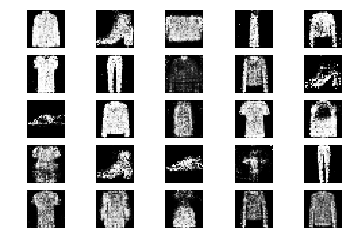

43801 [D loss: 0.655240, acc.: 60.94%] [G loss: 0.971385]
43802 [D loss: 0.656624, acc.: 60.94%] [G loss: 0.958657]
43803 [D loss: 0.651370, acc.: 62.50%] [G loss: 0.985130]
43804 [D loss: 0.606762, acc.: 65.62%] [G loss: 1.047353]
43805 [D loss: 0.633757, acc.: 67.19%] [G loss: 0.901730]
43806 [D loss: 0.614309, acc.: 64.06%] [G loss: 1.012707]
43807 [D loss: 0.664246, acc.: 59.38%] [G loss: 1.052418]
43808 [D loss: 0.606354, acc.: 60.94%] [G loss: 0.955892]
43809 [D loss: 0.668339, acc.: 62.50%] [G loss: 0.943190]
43810 [D loss: 0.639174, acc.: 54.69%] [G loss: 1.043547]
43811 [D loss: 0.674210, acc.: 54.69%] [G loss: 0.956377]
43812 [D loss: 0.635256, acc.: 62.50%] [G loss: 0.954063]
43813 [D loss: 0.652146, acc.: 62.50%] [G loss: 1.074653]
43814 [D loss: 0.688566, acc.: 65.62%] [G loss: 1.052269]
43815 [D loss: 0.610244, acc.: 68.75%] [G loss: 1.051876]
43816 [D loss: 0.648767, acc.: 53.12%] [G loss: 0.976031]
43817 [D loss: 0.654159, acc.: 59.38%] [G loss: 1.049265]
43818 [D loss:

43944 [D loss: 0.612169, acc.: 70.31%] [G loss: 1.044434]
43945 [D loss: 0.607584, acc.: 62.50%] [G loss: 1.054545]
43946 [D loss: 0.689866, acc.: 53.12%] [G loss: 0.999602]
43947 [D loss: 0.558091, acc.: 75.00%] [G loss: 1.063350]
43948 [D loss: 0.660566, acc.: 57.81%] [G loss: 0.903189]
43949 [D loss: 0.620197, acc.: 64.06%] [G loss: 0.961757]
43950 [D loss: 0.616949, acc.: 54.69%] [G loss: 0.997102]
43951 [D loss: 0.592271, acc.: 68.75%] [G loss: 0.982030]
43952 [D loss: 0.607015, acc.: 71.88%] [G loss: 1.083983]
43953 [D loss: 0.723658, acc.: 45.31%] [G loss: 1.042597]
43954 [D loss: 0.609421, acc.: 62.50%] [G loss: 1.029119]
43955 [D loss: 0.696234, acc.: 50.00%] [G loss: 0.981132]
43956 [D loss: 0.629758, acc.: 65.62%] [G loss: 1.016635]
43957 [D loss: 0.669356, acc.: 64.06%] [G loss: 0.983571]
43958 [D loss: 0.579563, acc.: 65.62%] [G loss: 0.974551]
43959 [D loss: 0.605764, acc.: 68.75%] [G loss: 0.997901]
43960 [D loss: 0.586378, acc.: 71.88%] [G loss: 1.050554]
43961 [D loss:

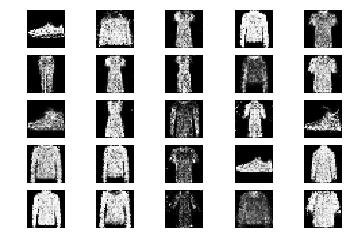

44001 [D loss: 0.687553, acc.: 59.38%] [G loss: 0.966679]
44002 [D loss: 0.636414, acc.: 56.25%] [G loss: 0.942192]
44003 [D loss: 0.633209, acc.: 59.38%] [G loss: 1.012518]
44004 [D loss: 0.645267, acc.: 60.94%] [G loss: 0.991393]
44005 [D loss: 0.654563, acc.: 60.94%] [G loss: 0.954890]
44006 [D loss: 0.655878, acc.: 60.94%] [G loss: 0.899905]
44007 [D loss: 0.606028, acc.: 67.19%] [G loss: 0.905909]
44008 [D loss: 0.681648, acc.: 56.25%] [G loss: 0.873620]
44009 [D loss: 0.664334, acc.: 53.12%] [G loss: 0.852209]
44010 [D loss: 0.625689, acc.: 65.62%] [G loss: 0.939430]
44011 [D loss: 0.667213, acc.: 62.50%] [G loss: 1.059786]
44012 [D loss: 0.635529, acc.: 70.31%] [G loss: 0.994422]
44013 [D loss: 0.624228, acc.: 56.25%] [G loss: 1.158875]
44014 [D loss: 0.618526, acc.: 68.75%] [G loss: 0.998768]
44015 [D loss: 0.609357, acc.: 67.19%] [G loss: 0.978383]
44016 [D loss: 0.561389, acc.: 78.12%] [G loss: 1.035814]
44017 [D loss: 0.583934, acc.: 65.62%] [G loss: 0.968321]
44018 [D loss:

44143 [D loss: 0.601033, acc.: 65.62%] [G loss: 0.946550]
44144 [D loss: 0.707599, acc.: 53.12%] [G loss: 0.983106]
44145 [D loss: 0.644861, acc.: 60.94%] [G loss: 0.946669]
44146 [D loss: 0.642511, acc.: 62.50%] [G loss: 0.951846]
44147 [D loss: 0.598711, acc.: 73.44%] [G loss: 1.012559]
44148 [D loss: 0.633320, acc.: 68.75%] [G loss: 1.047517]
44149 [D loss: 0.631104, acc.: 64.06%] [G loss: 0.927165]
44150 [D loss: 0.665733, acc.: 57.81%] [G loss: 1.081522]
44151 [D loss: 0.648587, acc.: 67.19%] [G loss: 1.021691]
44152 [D loss: 0.623687, acc.: 64.06%] [G loss: 0.961842]
44153 [D loss: 0.650581, acc.: 65.62%] [G loss: 0.985338]
44154 [D loss: 0.631471, acc.: 62.50%] [G loss: 0.901366]
44155 [D loss: 0.632715, acc.: 59.38%] [G loss: 0.951596]
44156 [D loss: 0.630080, acc.: 59.38%] [G loss: 1.013336]
44157 [D loss: 0.610484, acc.: 62.50%] [G loss: 0.944726]
44158 [D loss: 0.639514, acc.: 65.62%] [G loss: 1.024469]
44159 [D loss: 0.652409, acc.: 60.94%] [G loss: 0.940497]
44160 [D loss:

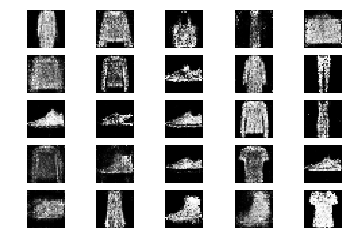

44201 [D loss: 0.578471, acc.: 73.44%] [G loss: 1.032410]
44202 [D loss: 0.595047, acc.: 70.31%] [G loss: 1.085687]
44203 [D loss: 0.661462, acc.: 62.50%] [G loss: 0.946436]
44204 [D loss: 0.667309, acc.: 56.25%] [G loss: 0.792564]
44205 [D loss: 0.588782, acc.: 67.19%] [G loss: 0.927543]
44206 [D loss: 0.733195, acc.: 56.25%] [G loss: 1.026221]
44207 [D loss: 0.647053, acc.: 60.94%] [G loss: 0.946223]
44208 [D loss: 0.605758, acc.: 59.38%] [G loss: 1.030225]
44209 [D loss: 0.694885, acc.: 50.00%] [G loss: 0.934666]
44210 [D loss: 0.672558, acc.: 57.81%] [G loss: 0.962091]
44211 [D loss: 0.658535, acc.: 65.62%] [G loss: 0.927061]
44212 [D loss: 0.619049, acc.: 65.62%] [G loss: 0.994998]
44213 [D loss: 0.614687, acc.: 64.06%] [G loss: 0.930023]
44214 [D loss: 0.592232, acc.: 65.62%] [G loss: 0.951545]
44215 [D loss: 0.616717, acc.: 68.75%] [G loss: 1.057425]
44216 [D loss: 0.557430, acc.: 75.00%] [G loss: 1.077897]
44217 [D loss: 0.692240, acc.: 53.12%] [G loss: 0.976013]
44218 [D loss:

44345 [D loss: 0.624229, acc.: 62.50%] [G loss: 0.928439]
44346 [D loss: 0.691202, acc.: 59.38%] [G loss: 0.995431]
44347 [D loss: 0.667369, acc.: 64.06%] [G loss: 1.004643]
44348 [D loss: 0.663359, acc.: 59.38%] [G loss: 1.060177]
44349 [D loss: 0.562553, acc.: 71.88%] [G loss: 0.956561]
44350 [D loss: 0.557714, acc.: 65.62%] [G loss: 0.947336]
44351 [D loss: 0.599571, acc.: 65.62%] [G loss: 0.917162]
44352 [D loss: 0.592940, acc.: 70.31%] [G loss: 1.019913]
44353 [D loss: 0.620398, acc.: 71.88%] [G loss: 0.991662]
44354 [D loss: 0.644409, acc.: 60.94%] [G loss: 1.101919]
44355 [D loss: 0.656070, acc.: 65.62%] [G loss: 1.009036]
44356 [D loss: 0.655367, acc.: 57.81%] [G loss: 0.998308]
44357 [D loss: 0.572014, acc.: 73.44%] [G loss: 0.970432]
44358 [D loss: 0.615465, acc.: 65.62%] [G loss: 1.053963]
44359 [D loss: 0.686470, acc.: 51.56%] [G loss: 1.092567]
44360 [D loss: 0.617243, acc.: 59.38%] [G loss: 0.949584]
44361 [D loss: 0.622971, acc.: 60.94%] [G loss: 0.949274]
44362 [D loss:

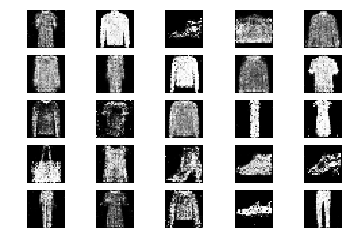

44401 [D loss: 0.563577, acc.: 65.62%] [G loss: 1.059523]
44402 [D loss: 0.674015, acc.: 57.81%] [G loss: 1.060925]
44403 [D loss: 0.613431, acc.: 71.88%] [G loss: 1.064621]
44404 [D loss: 0.566500, acc.: 71.88%] [G loss: 1.053170]
44405 [D loss: 0.640135, acc.: 67.19%] [G loss: 1.021978]
44406 [D loss: 0.712670, acc.: 59.38%] [G loss: 0.941418]
44407 [D loss: 0.587275, acc.: 67.19%] [G loss: 1.007434]
44408 [D loss: 0.635108, acc.: 60.94%] [G loss: 0.984548]
44409 [D loss: 0.600745, acc.: 67.19%] [G loss: 0.975025]
44410 [D loss: 0.636733, acc.: 64.06%] [G loss: 1.083861]
44411 [D loss: 0.625062, acc.: 65.62%] [G loss: 0.956492]
44412 [D loss: 0.609485, acc.: 65.62%] [G loss: 0.882368]
44413 [D loss: 0.617248, acc.: 59.38%] [G loss: 0.942880]
44414 [D loss: 0.649582, acc.: 60.94%] [G loss: 1.027580]
44415 [D loss: 0.678590, acc.: 56.25%] [G loss: 0.949528]
44416 [D loss: 0.656802, acc.: 70.31%] [G loss: 0.986739]
44417 [D loss: 0.665364, acc.: 53.12%] [G loss: 0.960882]
44418 [D loss:

44543 [D loss: 0.619034, acc.: 67.19%] [G loss: 0.938893]
44544 [D loss: 0.642759, acc.: 57.81%] [G loss: 0.963311]
44545 [D loss: 0.653523, acc.: 64.06%] [G loss: 1.090398]
44546 [D loss: 0.591397, acc.: 68.75%] [G loss: 1.018915]
44547 [D loss: 0.643879, acc.: 57.81%] [G loss: 0.946738]
44548 [D loss: 0.619645, acc.: 60.94%] [G loss: 1.027033]
44549 [D loss: 0.560805, acc.: 71.88%] [G loss: 1.015658]
44550 [D loss: 0.653938, acc.: 67.19%] [G loss: 1.035193]
44551 [D loss: 0.608522, acc.: 68.75%] [G loss: 1.069966]
44552 [D loss: 0.689727, acc.: 65.62%] [G loss: 1.087125]
44553 [D loss: 0.606448, acc.: 70.31%] [G loss: 1.069918]
44554 [D loss: 0.623627, acc.: 68.75%] [G loss: 1.153717]
44555 [D loss: 0.648166, acc.: 56.25%] [G loss: 1.014798]
44556 [D loss: 0.671931, acc.: 64.06%] [G loss: 0.961343]
44557 [D loss: 0.661894, acc.: 62.50%] [G loss: 0.923548]
44558 [D loss: 0.648522, acc.: 59.38%] [G loss: 0.894029]
44559 [D loss: 0.587083, acc.: 68.75%] [G loss: 0.931212]
44560 [D loss:

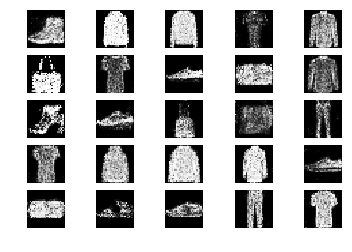

44601 [D loss: 0.673079, acc.: 59.38%] [G loss: 1.028886]
44602 [D loss: 0.630777, acc.: 64.06%] [G loss: 1.003902]
44603 [D loss: 0.614211, acc.: 64.06%] [G loss: 0.796967]
44604 [D loss: 0.621671, acc.: 57.81%] [G loss: 1.003979]
44605 [D loss: 0.668469, acc.: 57.81%] [G loss: 0.968307]
44606 [D loss: 0.601943, acc.: 67.19%] [G loss: 1.001683]
44607 [D loss: 0.635854, acc.: 59.38%] [G loss: 0.995743]
44608 [D loss: 0.537764, acc.: 78.12%] [G loss: 1.131025]
44609 [D loss: 0.623896, acc.: 67.19%] [G loss: 1.089203]
44610 [D loss: 0.579153, acc.: 67.19%] [G loss: 0.998918]
44611 [D loss: 0.559036, acc.: 68.75%] [G loss: 0.953608]
44612 [D loss: 0.626269, acc.: 64.06%] [G loss: 0.987366]
44613 [D loss: 0.666315, acc.: 64.06%] [G loss: 0.991393]
44614 [D loss: 0.570420, acc.: 76.56%] [G loss: 1.035942]
44615 [D loss: 0.658635, acc.: 57.81%] [G loss: 0.958567]
44616 [D loss: 0.617527, acc.: 65.62%] [G loss: 1.027582]
44617 [D loss: 0.626314, acc.: 60.94%] [G loss: 0.948749]
44618 [D loss:

44743 [D loss: 0.631788, acc.: 65.62%] [G loss: 0.983199]
44744 [D loss: 0.607884, acc.: 65.62%] [G loss: 1.012166]
44745 [D loss: 0.623996, acc.: 59.38%] [G loss: 0.906079]
44746 [D loss: 0.697013, acc.: 50.00%] [G loss: 1.111502]
44747 [D loss: 0.691782, acc.: 53.12%] [G loss: 0.982607]
44748 [D loss: 0.592752, acc.: 68.75%] [G loss: 0.980619]
44749 [D loss: 0.607986, acc.: 64.06%] [G loss: 1.012136]
44750 [D loss: 0.665418, acc.: 67.19%] [G loss: 0.909884]
44751 [D loss: 0.643539, acc.: 65.62%] [G loss: 1.013315]
44752 [D loss: 0.555772, acc.: 71.88%] [G loss: 0.903445]
44753 [D loss: 0.560412, acc.: 71.88%] [G loss: 1.059509]
44754 [D loss: 0.551016, acc.: 73.44%] [G loss: 1.037888]
44755 [D loss: 0.700775, acc.: 51.56%] [G loss: 0.944633]
44756 [D loss: 0.642645, acc.: 56.25%] [G loss: 1.099661]
44757 [D loss: 0.655946, acc.: 65.62%] [G loss: 1.030464]
44758 [D loss: 0.721987, acc.: 50.00%] [G loss: 0.882708]
44759 [D loss: 0.711403, acc.: 54.69%] [G loss: 0.997735]
44760 [D loss:

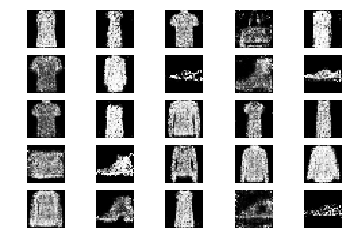

44801 [D loss: 0.582915, acc.: 68.75%] [G loss: 1.102575]
44802 [D loss: 0.618936, acc.: 65.62%] [G loss: 1.028308]
44803 [D loss: 0.619063, acc.: 65.62%] [G loss: 1.113305]
44804 [D loss: 0.624698, acc.: 62.50%] [G loss: 1.072186]
44805 [D loss: 0.635531, acc.: 60.94%] [G loss: 1.065104]
44806 [D loss: 0.617208, acc.: 71.88%] [G loss: 0.906207]
44807 [D loss: 0.614722, acc.: 65.62%] [G loss: 0.989427]
44808 [D loss: 0.667949, acc.: 68.75%] [G loss: 0.931917]
44809 [D loss: 0.629856, acc.: 62.50%] [G loss: 0.942610]
44810 [D loss: 0.626391, acc.: 65.62%] [G loss: 0.986174]
44811 [D loss: 0.644828, acc.: 62.50%] [G loss: 1.064567]
44812 [D loss: 0.621278, acc.: 64.06%] [G loss: 1.037368]
44813 [D loss: 0.705595, acc.: 56.25%] [G loss: 0.993739]
44814 [D loss: 0.624045, acc.: 64.06%] [G loss: 1.108034]
44815 [D loss: 0.620978, acc.: 68.75%] [G loss: 0.885902]
44816 [D loss: 0.645637, acc.: 57.81%] [G loss: 0.856668]
44817 [D loss: 0.636970, acc.: 68.75%] [G loss: 0.899311]
44818 [D loss:

44943 [D loss: 0.550308, acc.: 73.44%] [G loss: 1.001811]
44944 [D loss: 0.704467, acc.: 57.81%] [G loss: 1.026477]
44945 [D loss: 0.647856, acc.: 60.94%] [G loss: 1.035443]
44946 [D loss: 0.570039, acc.: 67.19%] [G loss: 0.957620]
44947 [D loss: 0.669460, acc.: 64.06%] [G loss: 1.087433]
44948 [D loss: 0.625196, acc.: 64.06%] [G loss: 1.111141]
44949 [D loss: 0.693399, acc.: 54.69%] [G loss: 0.881810]
44950 [D loss: 0.600225, acc.: 67.19%] [G loss: 0.960985]
44951 [D loss: 0.579791, acc.: 75.00%] [G loss: 0.999488]
44952 [D loss: 0.654106, acc.: 76.56%] [G loss: 0.866708]
44953 [D loss: 0.615756, acc.: 65.62%] [G loss: 0.989580]
44954 [D loss: 0.623401, acc.: 65.62%] [G loss: 1.013822]
44955 [D loss: 0.597873, acc.: 65.62%] [G loss: 1.114985]
44956 [D loss: 0.661359, acc.: 62.50%] [G loss: 1.055875]
44957 [D loss: 0.763074, acc.: 56.25%] [G loss: 1.086581]
44958 [D loss: 0.634815, acc.: 62.50%] [G loss: 1.085365]
44959 [D loss: 0.672634, acc.: 62.50%] [G loss: 1.027028]
44960 [D loss:

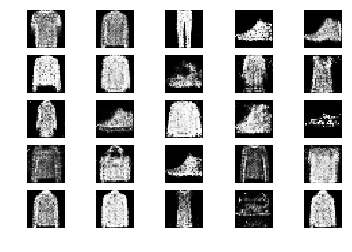

45001 [D loss: 0.666728, acc.: 59.38%] [G loss: 0.950429]
45002 [D loss: 0.592056, acc.: 76.56%] [G loss: 0.965369]
45003 [D loss: 0.543979, acc.: 75.00%] [G loss: 0.886571]
45004 [D loss: 0.515454, acc.: 70.31%] [G loss: 0.988752]
45005 [D loss: 0.569868, acc.: 68.75%] [G loss: 1.060931]
45006 [D loss: 0.581918, acc.: 70.31%] [G loss: 1.076282]
45007 [D loss: 0.592472, acc.: 65.62%] [G loss: 0.968652]
45008 [D loss: 0.632797, acc.: 62.50%] [G loss: 0.998429]
45009 [D loss: 0.530196, acc.: 82.81%] [G loss: 1.063338]
45010 [D loss: 0.590640, acc.: 68.75%] [G loss: 1.053082]
45011 [D loss: 0.578955, acc.: 68.75%] [G loss: 1.066528]
45012 [D loss: 0.647288, acc.: 60.94%] [G loss: 1.017944]
45013 [D loss: 0.685944, acc.: 56.25%] [G loss: 1.018778]
45014 [D loss: 0.650080, acc.: 59.38%] [G loss: 1.062190]
45015 [D loss: 0.593048, acc.: 70.31%] [G loss: 1.057244]
45016 [D loss: 0.611375, acc.: 67.19%] [G loss: 1.122766]
45017 [D loss: 0.582623, acc.: 71.88%] [G loss: 0.878373]
45018 [D loss:

45145 [D loss: 0.696493, acc.: 56.25%] [G loss: 1.045803]
45146 [D loss: 0.584027, acc.: 62.50%] [G loss: 0.985210]
45147 [D loss: 0.579586, acc.: 67.19%] [G loss: 1.042916]
45148 [D loss: 0.648377, acc.: 65.62%] [G loss: 1.068411]
45149 [D loss: 0.660917, acc.: 59.38%] [G loss: 1.005840]
45150 [D loss: 0.640135, acc.: 64.06%] [G loss: 0.938273]
45151 [D loss: 0.625183, acc.: 59.38%] [G loss: 0.895613]
45152 [D loss: 0.651614, acc.: 60.94%] [G loss: 0.891428]
45153 [D loss: 0.646056, acc.: 64.06%] [G loss: 1.002375]
45154 [D loss: 0.613940, acc.: 70.31%] [G loss: 1.056296]
45155 [D loss: 0.717100, acc.: 54.69%] [G loss: 0.998580]
45156 [D loss: 0.630948, acc.: 65.62%] [G loss: 0.920962]
45157 [D loss: 0.623400, acc.: 62.50%] [G loss: 1.115746]
45158 [D loss: 0.629664, acc.: 60.94%] [G loss: 1.024939]
45159 [D loss: 0.612389, acc.: 67.19%] [G loss: 1.015707]
45160 [D loss: 0.606844, acc.: 64.06%] [G loss: 1.001608]
45161 [D loss: 0.625703, acc.: 62.50%] [G loss: 1.045898]
45162 [D loss:

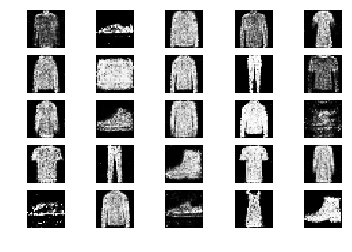

45201 [D loss: 0.658783, acc.: 65.62%] [G loss: 1.042332]
45202 [D loss: 0.545867, acc.: 81.25%] [G loss: 1.019938]
45203 [D loss: 0.617645, acc.: 60.94%] [G loss: 1.173229]
45204 [D loss: 0.640894, acc.: 59.38%] [G loss: 0.996337]
45205 [D loss: 0.662773, acc.: 60.94%] [G loss: 1.058586]
45206 [D loss: 0.612910, acc.: 68.75%] [G loss: 1.039390]
45207 [D loss: 0.622612, acc.: 70.31%] [G loss: 1.018846]
45208 [D loss: 0.589441, acc.: 70.31%] [G loss: 1.011497]
45209 [D loss: 0.605288, acc.: 68.75%] [G loss: 0.966299]
45210 [D loss: 0.662205, acc.: 57.81%] [G loss: 1.016518]
45211 [D loss: 0.537760, acc.: 73.44%] [G loss: 1.017493]
45212 [D loss: 0.578699, acc.: 71.88%] [G loss: 0.940916]
45213 [D loss: 0.587304, acc.: 67.19%] [G loss: 0.954565]
45214 [D loss: 0.648271, acc.: 60.94%] [G loss: 1.014584]
45215 [D loss: 0.604545, acc.: 65.62%] [G loss: 1.003648]
45216 [D loss: 0.675337, acc.: 59.38%] [G loss: 0.911469]
45217 [D loss: 0.621248, acc.: 60.94%] [G loss: 0.859832]
45218 [D loss:

45344 [D loss: 0.599109, acc.: 67.19%] [G loss: 1.028200]
45345 [D loss: 0.651713, acc.: 62.50%] [G loss: 1.008090]
45346 [D loss: 0.662302, acc.: 60.94%] [G loss: 0.963987]
45347 [D loss: 0.645759, acc.: 59.38%] [G loss: 0.967664]
45348 [D loss: 0.641506, acc.: 59.38%] [G loss: 0.936098]
45349 [D loss: 0.625734, acc.: 59.38%] [G loss: 0.858337]
45350 [D loss: 0.633388, acc.: 59.38%] [G loss: 1.011893]
45351 [D loss: 0.635824, acc.: 62.50%] [G loss: 0.972470]
45352 [D loss: 0.654199, acc.: 64.06%] [G loss: 0.957791]
45353 [D loss: 0.623192, acc.: 60.94%] [G loss: 0.942174]
45354 [D loss: 0.655050, acc.: 64.06%] [G loss: 0.950171]
45355 [D loss: 0.606145, acc.: 68.75%] [G loss: 0.985695]
45356 [D loss: 0.680620, acc.: 54.69%] [G loss: 0.920736]
45357 [D loss: 0.633582, acc.: 57.81%] [G loss: 0.971489]
45358 [D loss: 0.595273, acc.: 68.75%] [G loss: 1.092739]
45359 [D loss: 0.678733, acc.: 59.38%] [G loss: 1.024790]
45360 [D loss: 0.616773, acc.: 57.81%] [G loss: 1.032034]
45361 [D loss:

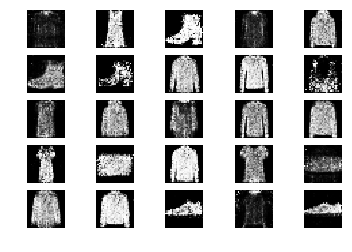

45401 [D loss: 0.642565, acc.: 60.94%] [G loss: 0.897637]
45402 [D loss: 0.671331, acc.: 54.69%] [G loss: 0.944755]
45403 [D loss: 0.597042, acc.: 62.50%] [G loss: 1.131187]
45404 [D loss: 0.622800, acc.: 67.19%] [G loss: 1.058440]
45405 [D loss: 0.571351, acc.: 70.31%] [G loss: 0.972268]
45406 [D loss: 0.643583, acc.: 59.38%] [G loss: 1.087985]
45407 [D loss: 0.635785, acc.: 67.19%] [G loss: 0.936279]
45408 [D loss: 0.607926, acc.: 65.62%] [G loss: 1.019794]
45409 [D loss: 0.614404, acc.: 65.62%] [G loss: 1.077226]
45410 [D loss: 0.588556, acc.: 62.50%] [G loss: 0.978915]
45411 [D loss: 0.621867, acc.: 64.06%] [G loss: 1.008131]
45412 [D loss: 0.604004, acc.: 67.19%] [G loss: 0.875377]
45413 [D loss: 0.672969, acc.: 57.81%] [G loss: 0.966408]
45414 [D loss: 0.648337, acc.: 68.75%] [G loss: 0.960602]
45415 [D loss: 0.618332, acc.: 70.31%] [G loss: 1.031648]
45416 [D loss: 0.718587, acc.: 53.12%] [G loss: 1.015743]
45417 [D loss: 0.654725, acc.: 54.69%] [G loss: 1.014135]
45418 [D loss:

45545 [D loss: 0.556770, acc.: 73.44%] [G loss: 1.133918]
45546 [D loss: 0.615012, acc.: 60.94%] [G loss: 1.132368]
45547 [D loss: 0.580942, acc.: 75.00%] [G loss: 0.952867]
45548 [D loss: 0.587471, acc.: 70.31%] [G loss: 1.129915]
45549 [D loss: 0.665288, acc.: 62.50%] [G loss: 1.090366]
45550 [D loss: 0.597731, acc.: 71.88%] [G loss: 1.044070]
45551 [D loss: 0.636932, acc.: 60.94%] [G loss: 1.001247]
45552 [D loss: 0.614684, acc.: 64.06%] [G loss: 1.061964]
45553 [D loss: 0.564206, acc.: 75.00%] [G loss: 0.928651]
45554 [D loss: 0.588787, acc.: 71.88%] [G loss: 0.962017]
45555 [D loss: 0.674994, acc.: 60.94%] [G loss: 0.994447]
45556 [D loss: 0.566111, acc.: 68.75%] [G loss: 1.025971]
45557 [D loss: 0.662120, acc.: 60.94%] [G loss: 1.038136]
45558 [D loss: 0.714417, acc.: 57.81%] [G loss: 0.981272]
45559 [D loss: 0.620395, acc.: 68.75%] [G loss: 0.995518]
45560 [D loss: 0.626111, acc.: 60.94%] [G loss: 1.022087]
45561 [D loss: 0.574752, acc.: 68.75%] [G loss: 1.020936]
45562 [D loss:

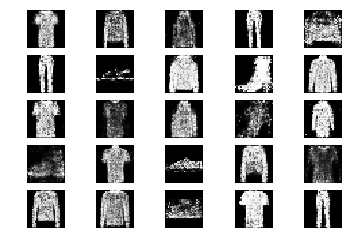

45601 [D loss: 0.675051, acc.: 59.38%] [G loss: 1.099712]
45602 [D loss: 0.590269, acc.: 64.06%] [G loss: 0.965165]
45603 [D loss: 0.608282, acc.: 62.50%] [G loss: 1.047507]
45604 [D loss: 0.681012, acc.: 54.69%] [G loss: 1.079519]
45605 [D loss: 0.551175, acc.: 70.31%] [G loss: 1.142757]
45606 [D loss: 0.557405, acc.: 76.56%] [G loss: 1.084527]
45607 [D loss: 0.708153, acc.: 60.94%] [G loss: 1.043319]
45608 [D loss: 0.572317, acc.: 68.75%] [G loss: 1.050659]
45609 [D loss: 0.668006, acc.: 56.25%] [G loss: 1.003166]
45610 [D loss: 0.614344, acc.: 60.94%] [G loss: 1.079625]
45611 [D loss: 0.669210, acc.: 59.38%] [G loss: 0.970543]
45612 [D loss: 0.646492, acc.: 57.81%] [G loss: 0.957259]
45613 [D loss: 0.697489, acc.: 60.94%] [G loss: 0.982963]
45614 [D loss: 0.655070, acc.: 59.38%] [G loss: 0.981947]
45615 [D loss: 0.638317, acc.: 65.62%] [G loss: 0.909281]
45616 [D loss: 0.679611, acc.: 56.25%] [G loss: 0.926972]
45617 [D loss: 0.628305, acc.: 67.19%] [G loss: 0.957877]
45618 [D loss:

45744 [D loss: 0.645551, acc.: 54.69%] [G loss: 1.081432]
45745 [D loss: 0.586749, acc.: 76.56%] [G loss: 1.128145]
45746 [D loss: 0.774285, acc.: 43.75%] [G loss: 1.035450]
45747 [D loss: 0.596171, acc.: 68.75%] [G loss: 1.011420]
45748 [D loss: 0.676081, acc.: 57.81%] [G loss: 0.970694]
45749 [D loss: 0.604609, acc.: 70.31%] [G loss: 1.000032]
45750 [D loss: 0.587200, acc.: 64.06%] [G loss: 0.963996]
45751 [D loss: 0.629182, acc.: 64.06%] [G loss: 1.006446]
45752 [D loss: 0.601052, acc.: 65.62%] [G loss: 1.034246]
45753 [D loss: 0.650479, acc.: 57.81%] [G loss: 1.031666]
45754 [D loss: 0.827070, acc.: 53.12%] [G loss: 0.965235]
45755 [D loss: 0.662145, acc.: 59.38%] [G loss: 1.064594]
45756 [D loss: 0.621700, acc.: 62.50%] [G loss: 0.996718]
45757 [D loss: 0.627489, acc.: 60.94%] [G loss: 0.965678]
45758 [D loss: 0.722402, acc.: 51.56%] [G loss: 1.040330]
45759 [D loss: 0.642515, acc.: 60.94%] [G loss: 0.982198]
45760 [D loss: 0.654448, acc.: 62.50%] [G loss: 0.902776]
45761 [D loss:

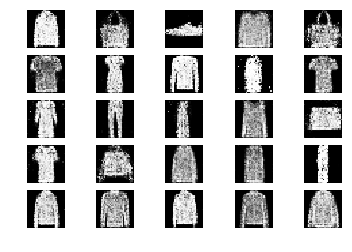

45801 [D loss: 0.668766, acc.: 57.81%] [G loss: 0.955030]
45802 [D loss: 0.639557, acc.: 57.81%] [G loss: 0.997348]
45803 [D loss: 0.658673, acc.: 59.38%] [G loss: 1.002610]
45804 [D loss: 0.700859, acc.: 51.56%] [G loss: 1.001578]
45805 [D loss: 0.639071, acc.: 65.62%] [G loss: 0.893545]
45806 [D loss: 0.624137, acc.: 62.50%] [G loss: 0.950322]
45807 [D loss: 0.606652, acc.: 70.31%] [G loss: 0.986204]
45808 [D loss: 0.646291, acc.: 62.50%] [G loss: 0.978242]
45809 [D loss: 0.675374, acc.: 60.94%] [G loss: 0.950457]
45810 [D loss: 0.737704, acc.: 48.44%] [G loss: 0.915674]
45811 [D loss: 0.639748, acc.: 57.81%] [G loss: 0.973918]
45812 [D loss: 0.626328, acc.: 68.75%] [G loss: 0.935830]
45813 [D loss: 0.641663, acc.: 62.50%] [G loss: 0.970683]
45814 [D loss: 0.602923, acc.: 68.75%] [G loss: 0.952295]
45815 [D loss: 0.653729, acc.: 57.81%] [G loss: 0.949719]
45816 [D loss: 0.633007, acc.: 62.50%] [G loss: 1.075649]
45817 [D loss: 0.572862, acc.: 67.19%] [G loss: 1.149018]
45818 [D loss:

45943 [D loss: 0.634602, acc.: 67.19%] [G loss: 1.010492]
45944 [D loss: 0.630383, acc.: 59.38%] [G loss: 0.986035]
45945 [D loss: 0.614535, acc.: 59.38%] [G loss: 1.029853]
45946 [D loss: 0.672348, acc.: 59.38%] [G loss: 1.016364]
45947 [D loss: 0.602155, acc.: 68.75%] [G loss: 1.019056]
45948 [D loss: 0.626029, acc.: 65.62%] [G loss: 0.993997]
45949 [D loss: 0.584376, acc.: 62.50%] [G loss: 1.155777]
45950 [D loss: 0.602365, acc.: 68.75%] [G loss: 1.052644]
45951 [D loss: 0.577644, acc.: 64.06%] [G loss: 1.050948]
45952 [D loss: 0.652260, acc.: 62.50%] [G loss: 1.006526]
45953 [D loss: 0.666367, acc.: 57.81%] [G loss: 1.064785]
45954 [D loss: 0.657238, acc.: 57.81%] [G loss: 1.059931]
45955 [D loss: 0.587994, acc.: 65.62%] [G loss: 1.160312]
45956 [D loss: 0.576423, acc.: 75.00%] [G loss: 1.032621]
45957 [D loss: 0.620153, acc.: 64.06%] [G loss: 0.960362]
45958 [D loss: 0.637040, acc.: 62.50%] [G loss: 0.952806]
45959 [D loss: 0.658940, acc.: 65.62%] [G loss: 0.999490]
45960 [D loss:

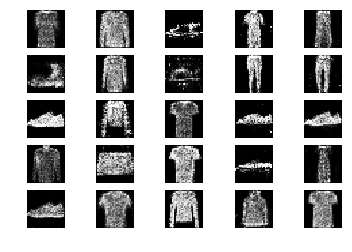

46001 [D loss: 0.803162, acc.: 40.62%] [G loss: 0.954438]
46002 [D loss: 0.612889, acc.: 67.19%] [G loss: 0.991088]
46003 [D loss: 0.654116, acc.: 60.94%] [G loss: 0.957431]
46004 [D loss: 0.604865, acc.: 64.06%] [G loss: 0.924271]
46005 [D loss: 0.560063, acc.: 70.31%] [G loss: 0.899617]
46006 [D loss: 0.670909, acc.: 48.44%] [G loss: 1.036021]
46007 [D loss: 0.578328, acc.: 68.75%] [G loss: 0.908460]
46008 [D loss: 0.666900, acc.: 56.25%] [G loss: 0.957262]
46009 [D loss: 0.686050, acc.: 53.12%] [G loss: 0.981767]
46010 [D loss: 0.553629, acc.: 75.00%] [G loss: 0.990082]
46011 [D loss: 0.633798, acc.: 64.06%] [G loss: 0.984974]
46012 [D loss: 0.594715, acc.: 67.19%] [G loss: 0.941104]
46013 [D loss: 0.607194, acc.: 65.62%] [G loss: 1.044090]
46014 [D loss: 0.664388, acc.: 56.25%] [G loss: 1.021332]
46015 [D loss: 0.670754, acc.: 57.81%] [G loss: 1.047313]
46016 [D loss: 0.600846, acc.: 70.31%] [G loss: 1.031376]
46017 [D loss: 0.629552, acc.: 65.62%] [G loss: 1.005371]
46018 [D loss:

46144 [D loss: 0.632747, acc.: 70.31%] [G loss: 1.011581]
46145 [D loss: 0.603529, acc.: 67.19%] [G loss: 0.927376]
46146 [D loss: 0.676745, acc.: 59.38%] [G loss: 0.966277]
46147 [D loss: 0.619658, acc.: 59.38%] [G loss: 0.991010]
46148 [D loss: 0.648159, acc.: 62.50%] [G loss: 1.001428]
46149 [D loss: 0.611957, acc.: 68.75%] [G loss: 0.995855]
46150 [D loss: 0.622473, acc.: 60.94%] [G loss: 0.974053]
46151 [D loss: 0.680395, acc.: 53.12%] [G loss: 1.071919]
46152 [D loss: 0.631167, acc.: 60.94%] [G loss: 1.080590]
46153 [D loss: 0.597736, acc.: 64.06%] [G loss: 1.028500]
46154 [D loss: 0.597059, acc.: 68.75%] [G loss: 0.981687]
46155 [D loss: 0.649622, acc.: 56.25%] [G loss: 0.993733]
46156 [D loss: 0.601350, acc.: 71.88%] [G loss: 1.084816]
46157 [D loss: 0.566762, acc.: 70.31%] [G loss: 0.999569]
46158 [D loss: 0.585123, acc.: 73.44%] [G loss: 1.075379]
46159 [D loss: 0.546006, acc.: 62.50%] [G loss: 1.098278]
46160 [D loss: 0.535181, acc.: 76.56%] [G loss: 1.006746]
46161 [D loss:

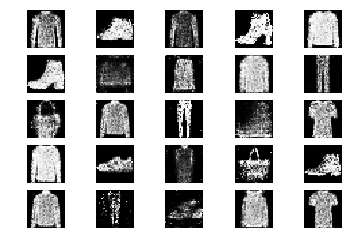

46201 [D loss: 0.602466, acc.: 67.19%] [G loss: 1.021333]
46202 [D loss: 0.528885, acc.: 73.44%] [G loss: 0.992569]
46203 [D loss: 0.669946, acc.: 65.62%] [G loss: 1.054428]
46204 [D loss: 0.618646, acc.: 64.06%] [G loss: 1.024662]
46205 [D loss: 0.572935, acc.: 70.31%] [G loss: 1.016396]
46206 [D loss: 0.636293, acc.: 71.88%] [G loss: 1.025706]
46207 [D loss: 0.603396, acc.: 68.75%] [G loss: 0.956312]
46208 [D loss: 0.620990, acc.: 67.19%] [G loss: 1.117293]
46209 [D loss: 0.591406, acc.: 68.75%] [G loss: 1.159817]
46210 [D loss: 0.659976, acc.: 56.25%] [G loss: 1.097413]
46211 [D loss: 0.625540, acc.: 59.38%] [G loss: 1.005551]
46212 [D loss: 0.622024, acc.: 62.50%] [G loss: 1.040178]
46213 [D loss: 0.645309, acc.: 65.62%] [G loss: 0.992265]
46214 [D loss: 0.648115, acc.: 60.94%] [G loss: 0.979556]
46215 [D loss: 0.587575, acc.: 68.75%] [G loss: 0.958025]
46216 [D loss: 0.591549, acc.: 71.88%] [G loss: 1.031771]
46217 [D loss: 0.628548, acc.: 64.06%] [G loss: 0.975228]
46218 [D loss:

46344 [D loss: 0.528297, acc.: 71.88%] [G loss: 0.910333]
46345 [D loss: 0.621630, acc.: 60.94%] [G loss: 0.949801]
46346 [D loss: 0.681947, acc.: 54.69%] [G loss: 0.994535]
46347 [D loss: 0.619408, acc.: 60.94%] [G loss: 1.040217]
46348 [D loss: 0.667869, acc.: 59.38%] [G loss: 1.071382]
46349 [D loss: 0.693047, acc.: 59.38%] [G loss: 1.038295]
46350 [D loss: 0.681987, acc.: 53.12%] [G loss: 1.023147]
46351 [D loss: 0.626846, acc.: 65.62%] [G loss: 1.074117]
46352 [D loss: 0.618704, acc.: 62.50%] [G loss: 1.128666]
46353 [D loss: 0.604082, acc.: 62.50%] [G loss: 1.083675]
46354 [D loss: 0.649072, acc.: 60.94%] [G loss: 1.062046]
46355 [D loss: 0.635824, acc.: 64.06%] [G loss: 1.081390]
46356 [D loss: 0.582534, acc.: 71.88%] [G loss: 0.968707]
46357 [D loss: 0.707999, acc.: 53.12%] [G loss: 1.104879]
46358 [D loss: 0.612874, acc.: 68.75%] [G loss: 1.063697]
46359 [D loss: 0.619075, acc.: 68.75%] [G loss: 0.937326]
46360 [D loss: 0.554368, acc.: 73.44%] [G loss: 0.947557]
46361 [D loss:

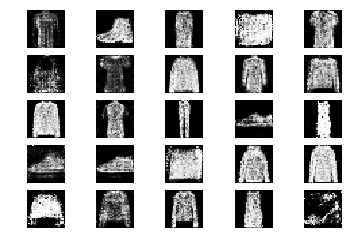

46401 [D loss: 0.675325, acc.: 64.06%] [G loss: 1.167081]
46402 [D loss: 0.625785, acc.: 68.75%] [G loss: 0.983661]
46403 [D loss: 0.682068, acc.: 59.38%] [G loss: 1.047385]
46404 [D loss: 0.633607, acc.: 64.06%] [G loss: 1.003441]
46405 [D loss: 0.636568, acc.: 70.31%] [G loss: 1.013966]
46406 [D loss: 0.630235, acc.: 67.19%] [G loss: 1.032729]
46407 [D loss: 0.620347, acc.: 62.50%] [G loss: 0.922099]
46408 [D loss: 0.621557, acc.: 57.81%] [G loss: 0.961765]
46409 [D loss: 0.661783, acc.: 56.25%] [G loss: 1.040852]
46410 [D loss: 0.682676, acc.: 59.38%] [G loss: 1.069061]
46411 [D loss: 0.576814, acc.: 73.44%] [G loss: 1.046673]
46412 [D loss: 0.699253, acc.: 62.50%] [G loss: 0.886865]
46413 [D loss: 0.646909, acc.: 60.94%] [G loss: 0.988232]
46414 [D loss: 0.524177, acc.: 70.31%] [G loss: 0.992231]
46415 [D loss: 0.601171, acc.: 73.44%] [G loss: 0.969215]
46416 [D loss: 0.589172, acc.: 60.94%] [G loss: 0.913000]
46417 [D loss: 0.561659, acc.: 71.88%] [G loss: 1.052454]
46418 [D loss:

46544 [D loss: 0.545917, acc.: 71.88%] [G loss: 1.073022]
46545 [D loss: 0.633687, acc.: 64.06%] [G loss: 1.057394]
46546 [D loss: 0.667003, acc.: 62.50%] [G loss: 1.148082]
46547 [D loss: 0.691696, acc.: 59.38%] [G loss: 1.160330]
46548 [D loss: 0.591244, acc.: 70.31%] [G loss: 0.995476]
46549 [D loss: 0.579441, acc.: 68.75%] [G loss: 0.962451]
46550 [D loss: 0.622390, acc.: 59.38%] [G loss: 1.008479]
46551 [D loss: 0.558502, acc.: 73.44%] [G loss: 1.070837]
46552 [D loss: 0.653325, acc.: 54.69%] [G loss: 0.983828]
46553 [D loss: 0.590595, acc.: 62.50%] [G loss: 0.915283]
46554 [D loss: 0.615651, acc.: 67.19%] [G loss: 1.068890]
46555 [D loss: 0.566799, acc.: 67.19%] [G loss: 1.091292]
46556 [D loss: 0.624862, acc.: 60.94%] [G loss: 1.073698]
46557 [D loss: 0.626275, acc.: 70.31%] [G loss: 0.977050]
46558 [D loss: 0.609203, acc.: 64.06%] [G loss: 0.879419]
46559 [D loss: 0.655601, acc.: 53.12%] [G loss: 1.000293]
46560 [D loss: 0.679208, acc.: 64.06%] [G loss: 0.907819]
46561 [D loss:

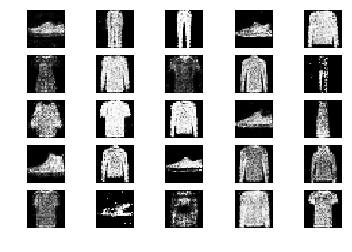

46601 [D loss: 0.574784, acc.: 71.88%] [G loss: 1.123360]
46602 [D loss: 0.619730, acc.: 67.19%] [G loss: 1.020594]
46603 [D loss: 0.610083, acc.: 70.31%] [G loss: 0.978476]
46604 [D loss: 0.591121, acc.: 67.19%] [G loss: 1.028644]
46605 [D loss: 0.607236, acc.: 64.06%] [G loss: 0.965857]
46606 [D loss: 0.658646, acc.: 67.19%] [G loss: 1.008110]
46607 [D loss: 0.570454, acc.: 67.19%] [G loss: 1.053216]
46608 [D loss: 0.712060, acc.: 60.94%] [G loss: 1.088665]
46609 [D loss: 0.611315, acc.: 65.62%] [G loss: 1.030682]
46610 [D loss: 0.606651, acc.: 67.19%] [G loss: 1.163647]
46611 [D loss: 0.557071, acc.: 71.88%] [G loss: 1.025150]
46612 [D loss: 0.709401, acc.: 50.00%] [G loss: 1.064584]
46613 [D loss: 0.644609, acc.: 65.62%] [G loss: 0.962924]
46614 [D loss: 0.674554, acc.: 56.25%] [G loss: 0.903583]
46615 [D loss: 0.672476, acc.: 57.81%] [G loss: 0.921346]
46616 [D loss: 0.636174, acc.: 57.81%] [G loss: 1.007954]
46617 [D loss: 0.584544, acc.: 73.44%] [G loss: 0.958875]
46618 [D loss:

46746 [D loss: 0.595902, acc.: 67.19%] [G loss: 1.051811]
46747 [D loss: 0.563239, acc.: 67.19%] [G loss: 1.076364]
46748 [D loss: 0.636377, acc.: 62.50%] [G loss: 1.066027]
46749 [D loss: 0.658285, acc.: 60.94%] [G loss: 0.893154]
46750 [D loss: 0.678107, acc.: 65.62%] [G loss: 1.041998]
46751 [D loss: 0.589838, acc.: 65.62%] [G loss: 1.009533]
46752 [D loss: 0.592613, acc.: 70.31%] [G loss: 1.110343]
46753 [D loss: 0.611706, acc.: 70.31%] [G loss: 0.947287]
46754 [D loss: 0.644628, acc.: 67.19%] [G loss: 0.949341]
46755 [D loss: 0.644753, acc.: 62.50%] [G loss: 0.953638]
46756 [D loss: 0.601943, acc.: 62.50%] [G loss: 1.192443]
46757 [D loss: 0.687960, acc.: 59.38%] [G loss: 0.914015]
46758 [D loss: 0.607377, acc.: 68.75%] [G loss: 0.934117]
46759 [D loss: 0.643757, acc.: 57.81%] [G loss: 0.904159]
46760 [D loss: 0.645403, acc.: 56.25%] [G loss: 0.970445]
46761 [D loss: 0.604999, acc.: 67.19%] [G loss: 0.959855]
46762 [D loss: 0.579516, acc.: 68.75%] [G loss: 1.074627]
46763 [D loss:

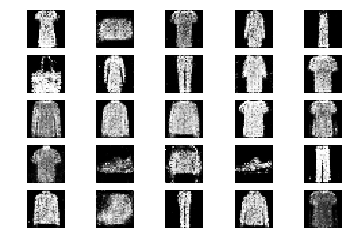

46801 [D loss: 0.666684, acc.: 57.81%] [G loss: 0.987377]
46802 [D loss: 0.568724, acc.: 75.00%] [G loss: 0.964137]
46803 [D loss: 0.675615, acc.: 56.25%] [G loss: 1.041685]
46804 [D loss: 0.572024, acc.: 75.00%] [G loss: 0.847781]
46805 [D loss: 0.574427, acc.: 71.88%] [G loss: 0.992868]
46806 [D loss: 0.633205, acc.: 59.38%] [G loss: 1.045621]
46807 [D loss: 0.573962, acc.: 70.31%] [G loss: 1.017857]
46808 [D loss: 0.608963, acc.: 62.50%] [G loss: 1.045981]
46809 [D loss: 0.629046, acc.: 62.50%] [G loss: 1.044156]
46810 [D loss: 0.743572, acc.: 53.12%] [G loss: 1.073948]
46811 [D loss: 0.608387, acc.: 64.06%] [G loss: 1.068042]
46812 [D loss: 0.552449, acc.: 70.31%] [G loss: 1.023004]
46813 [D loss: 0.574583, acc.: 70.31%] [G loss: 1.009672]
46814 [D loss: 0.597079, acc.: 65.62%] [G loss: 1.014771]
46815 [D loss: 0.629704, acc.: 64.06%] [G loss: 0.869094]
46816 [D loss: 0.785775, acc.: 54.69%] [G loss: 1.015655]
46817 [D loss: 0.640423, acc.: 65.62%] [G loss: 0.965410]
46818 [D loss:

46945 [D loss: 0.615989, acc.: 62.50%] [G loss: 1.016841]
46946 [D loss: 0.633003, acc.: 60.94%] [G loss: 1.155836]
46947 [D loss: 0.586486, acc.: 70.31%] [G loss: 0.994268]
46948 [D loss: 0.594029, acc.: 67.19%] [G loss: 0.924608]
46949 [D loss: 0.640030, acc.: 62.50%] [G loss: 1.041354]
46950 [D loss: 0.614600, acc.: 59.38%] [G loss: 1.078269]
46951 [D loss: 0.619672, acc.: 62.50%] [G loss: 0.994891]
46952 [D loss: 0.592983, acc.: 64.06%] [G loss: 0.984787]
46953 [D loss: 0.657789, acc.: 57.81%] [G loss: 0.903479]
46954 [D loss: 0.612930, acc.: 71.88%] [G loss: 1.069356]
46955 [D loss: 0.547900, acc.: 76.56%] [G loss: 1.230440]
46956 [D loss: 0.623867, acc.: 65.62%] [G loss: 1.140359]
46957 [D loss: 0.660594, acc.: 57.81%] [G loss: 1.146689]
46958 [D loss: 0.551644, acc.: 68.75%] [G loss: 0.929887]
46959 [D loss: 0.572083, acc.: 70.31%] [G loss: 0.987516]
46960 [D loss: 0.597780, acc.: 71.88%] [G loss: 1.063717]
46961 [D loss: 0.649368, acc.: 62.50%] [G loss: 1.133015]
46962 [D loss:

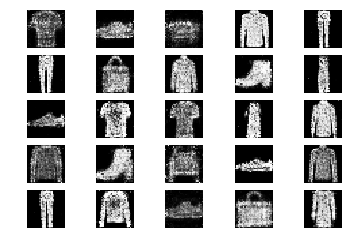

47001 [D loss: 0.618912, acc.: 64.06%] [G loss: 1.087153]
47002 [D loss: 0.611193, acc.: 65.62%] [G loss: 0.919199]
47003 [D loss: 0.565263, acc.: 71.88%] [G loss: 1.036139]
47004 [D loss: 0.596005, acc.: 64.06%] [G loss: 1.120578]
47005 [D loss: 0.634927, acc.: 64.06%] [G loss: 1.029499]
47006 [D loss: 0.712440, acc.: 59.38%] [G loss: 0.963891]
47007 [D loss: 0.635860, acc.: 62.50%] [G loss: 1.052117]
47008 [D loss: 0.596937, acc.: 65.62%] [G loss: 0.958491]
47009 [D loss: 0.654262, acc.: 62.50%] [G loss: 1.015662]
47010 [D loss: 0.699824, acc.: 54.69%] [G loss: 1.044719]
47011 [D loss: 0.620362, acc.: 70.31%] [G loss: 0.905295]
47012 [D loss: 0.639747, acc.: 67.19%] [G loss: 0.935391]
47013 [D loss: 0.532822, acc.: 78.12%] [G loss: 0.911810]
47014 [D loss: 0.578303, acc.: 68.75%] [G loss: 0.923026]
47015 [D loss: 0.553338, acc.: 78.12%] [G loss: 1.133640]
47016 [D loss: 0.595648, acc.: 67.19%] [G loss: 0.999456]
47017 [D loss: 0.682503, acc.: 48.44%] [G loss: 1.047218]
47018 [D loss:

47145 [D loss: 0.698913, acc.: 51.56%] [G loss: 0.927982]
47146 [D loss: 0.653145, acc.: 60.94%] [G loss: 1.028003]
47147 [D loss: 0.664694, acc.: 56.25%] [G loss: 1.032276]
47148 [D loss: 0.589501, acc.: 73.44%] [G loss: 1.098457]
47149 [D loss: 0.680586, acc.: 56.25%] [G loss: 0.965335]
47150 [D loss: 0.674458, acc.: 59.38%] [G loss: 1.001135]
47151 [D loss: 0.628151, acc.: 67.19%] [G loss: 0.926596]
47152 [D loss: 0.581083, acc.: 71.88%] [G loss: 0.984855]
47153 [D loss: 0.622622, acc.: 62.50%] [G loss: 0.952758]
47154 [D loss: 0.594286, acc.: 68.75%] [G loss: 0.968987]
47155 [D loss: 0.572552, acc.: 73.44%] [G loss: 0.907360]
47156 [D loss: 0.638329, acc.: 67.19%] [G loss: 0.982945]
47157 [D loss: 0.578692, acc.: 70.31%] [G loss: 1.006385]
47158 [D loss: 0.643114, acc.: 62.50%] [G loss: 0.985568]
47159 [D loss: 0.581699, acc.: 65.62%] [G loss: 0.970251]
47160 [D loss: 0.630140, acc.: 65.62%] [G loss: 1.173360]
47161 [D loss: 0.599221, acc.: 73.44%] [G loss: 0.996542]
47162 [D loss:

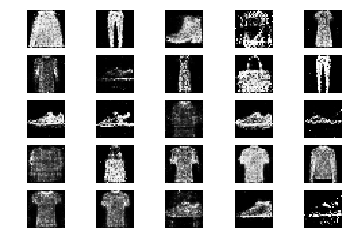

47201 [D loss: 0.628241, acc.: 70.31%] [G loss: 0.972312]
47202 [D loss: 0.687742, acc.: 65.62%] [G loss: 1.049316]
47203 [D loss: 0.588679, acc.: 62.50%] [G loss: 0.972875]
47204 [D loss: 0.668907, acc.: 67.19%] [G loss: 0.962329]
47205 [D loss: 0.631715, acc.: 64.06%] [G loss: 0.960037]
47206 [D loss: 0.596157, acc.: 68.75%] [G loss: 0.885334]
47207 [D loss: 0.583447, acc.: 75.00%] [G loss: 0.904571]
47208 [D loss: 0.637004, acc.: 70.31%] [G loss: 0.961721]
47209 [D loss: 0.612416, acc.: 62.50%] [G loss: 0.994042]
47210 [D loss: 0.549630, acc.: 67.19%] [G loss: 1.024731]
47211 [D loss: 0.652903, acc.: 57.81%] [G loss: 0.968953]
47212 [D loss: 0.612404, acc.: 67.19%] [G loss: 1.143931]
47213 [D loss: 0.582881, acc.: 75.00%] [G loss: 1.005911]
47214 [D loss: 0.620093, acc.: 67.19%] [G loss: 1.016952]
47215 [D loss: 0.705174, acc.: 57.81%] [G loss: 1.002020]
47216 [D loss: 0.655627, acc.: 64.06%] [G loss: 1.064334]
47217 [D loss: 0.675875, acc.: 60.94%] [G loss: 0.990969]
47218 [D loss:

47343 [D loss: 0.580247, acc.: 70.31%] [G loss: 1.011365]
47344 [D loss: 0.581175, acc.: 67.19%] [G loss: 0.905778]
47345 [D loss: 0.634256, acc.: 60.94%] [G loss: 1.006236]
47346 [D loss: 0.619289, acc.: 65.62%] [G loss: 0.981503]
47347 [D loss: 0.577276, acc.: 68.75%] [G loss: 1.003101]
47348 [D loss: 0.566191, acc.: 70.31%] [G loss: 1.098268]
47349 [D loss: 0.570350, acc.: 68.75%] [G loss: 0.933961]
47350 [D loss: 0.566047, acc.: 73.44%] [G loss: 1.002659]
47351 [D loss: 0.572239, acc.: 68.75%] [G loss: 0.981901]
47352 [D loss: 0.666068, acc.: 64.06%] [G loss: 1.047267]
47353 [D loss: 0.602276, acc.: 64.06%] [G loss: 0.993447]
47354 [D loss: 0.686633, acc.: 59.38%] [G loss: 1.019188]
47355 [D loss: 0.625534, acc.: 67.19%] [G loss: 1.047487]
47356 [D loss: 0.693503, acc.: 54.69%] [G loss: 1.012313]
47357 [D loss: 0.675616, acc.: 60.94%] [G loss: 1.038782]
47358 [D loss: 0.597445, acc.: 68.75%] [G loss: 0.984018]
47359 [D loss: 0.613859, acc.: 64.06%] [G loss: 0.992591]
47360 [D loss:

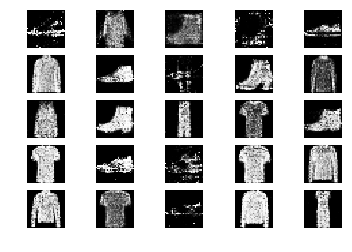

47401 [D loss: 0.626856, acc.: 59.38%] [G loss: 1.019208]
47402 [D loss: 0.623686, acc.: 68.75%] [G loss: 1.093782]
47403 [D loss: 0.597375, acc.: 65.62%] [G loss: 1.051384]
47404 [D loss: 0.675702, acc.: 57.81%] [G loss: 1.040528]
47405 [D loss: 0.633352, acc.: 64.06%] [G loss: 1.038352]
47406 [D loss: 0.605900, acc.: 70.31%] [G loss: 1.020165]
47407 [D loss: 0.638340, acc.: 62.50%] [G loss: 1.120164]
47408 [D loss: 0.569823, acc.: 70.31%] [G loss: 1.083086]
47409 [D loss: 0.621804, acc.: 64.06%] [G loss: 1.121115]
47410 [D loss: 0.588328, acc.: 73.44%] [G loss: 1.026887]
47411 [D loss: 0.625562, acc.: 68.75%] [G loss: 0.981559]
47412 [D loss: 0.594935, acc.: 67.19%] [G loss: 0.919256]
47413 [D loss: 0.587490, acc.: 68.75%] [G loss: 1.008068]
47414 [D loss: 0.618521, acc.: 62.50%] [G loss: 1.062056]
47415 [D loss: 0.677440, acc.: 57.81%] [G loss: 1.063271]
47416 [D loss: 0.545481, acc.: 73.44%] [G loss: 0.949601]
47417 [D loss: 0.567736, acc.: 75.00%] [G loss: 1.020325]
47418 [D loss:

47543 [D loss: 0.622461, acc.: 65.62%] [G loss: 0.982037]
47544 [D loss: 0.580798, acc.: 71.88%] [G loss: 0.989832]
47545 [D loss: 0.575880, acc.: 73.44%] [G loss: 1.035199]
47546 [D loss: 0.681701, acc.: 54.69%] [G loss: 1.061651]
47547 [D loss: 0.622710, acc.: 64.06%] [G loss: 1.089739]
47548 [D loss: 0.694059, acc.: 54.69%] [G loss: 1.054609]
47549 [D loss: 0.597247, acc.: 68.75%] [G loss: 1.038075]
47550 [D loss: 0.554160, acc.: 70.31%] [G loss: 1.226452]
47551 [D loss: 0.728590, acc.: 53.12%] [G loss: 0.975089]
47552 [D loss: 0.680542, acc.: 62.50%] [G loss: 0.974799]
47553 [D loss: 0.612814, acc.: 68.75%] [G loss: 0.972382]
47554 [D loss: 0.571353, acc.: 68.75%] [G loss: 0.878265]
47555 [D loss: 0.563213, acc.: 65.62%] [G loss: 1.059786]
47556 [D loss: 0.610828, acc.: 64.06%] [G loss: 1.167907]
47557 [D loss: 0.588924, acc.: 70.31%] [G loss: 1.024656]
47558 [D loss: 0.596851, acc.: 65.62%] [G loss: 1.012998]
47559 [D loss: 0.662141, acc.: 59.38%] [G loss: 0.943913]
47560 [D loss:

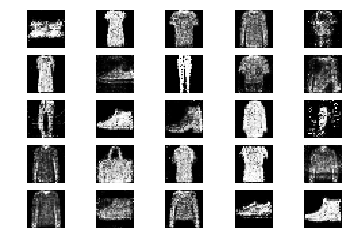

47601 [D loss: 0.587769, acc.: 67.19%] [G loss: 1.081080]
47602 [D loss: 0.646193, acc.: 62.50%] [G loss: 1.029814]
47603 [D loss: 0.545679, acc.: 75.00%] [G loss: 0.883692]
47604 [D loss: 0.640920, acc.: 50.00%] [G loss: 1.006438]
47605 [D loss: 0.607296, acc.: 71.88%] [G loss: 0.932285]
47606 [D loss: 0.663517, acc.: 60.94%] [G loss: 0.988337]
47607 [D loss: 0.660941, acc.: 68.75%] [G loss: 1.028428]
47608 [D loss: 0.658977, acc.: 59.38%] [G loss: 0.904733]
47609 [D loss: 0.667150, acc.: 56.25%] [G loss: 1.138185]
47610 [D loss: 0.673647, acc.: 50.00%] [G loss: 1.119228]
47611 [D loss: 0.703285, acc.: 60.94%] [G loss: 0.993309]
47612 [D loss: 0.703437, acc.: 59.38%] [G loss: 1.188915]
47613 [D loss: 0.691604, acc.: 56.25%] [G loss: 1.167887]
47614 [D loss: 0.633622, acc.: 67.19%] [G loss: 1.099274]
47615 [D loss: 0.655722, acc.: 59.38%] [G loss: 1.081050]
47616 [D loss: 0.652852, acc.: 67.19%] [G loss: 1.084051]
47617 [D loss: 0.665282, acc.: 59.38%] [G loss: 0.994214]
47618 [D loss:

47744 [D loss: 0.570348, acc.: 70.31%] [G loss: 0.966295]
47745 [D loss: 0.753687, acc.: 50.00%] [G loss: 1.031949]
47746 [D loss: 0.580628, acc.: 71.88%] [G loss: 1.148934]
47747 [D loss: 0.567786, acc.: 71.88%] [G loss: 1.155847]
47748 [D loss: 0.688087, acc.: 62.50%] [G loss: 1.259579]
47749 [D loss: 0.554694, acc.: 70.31%] [G loss: 1.121082]
47750 [D loss: 0.642200, acc.: 68.75%] [G loss: 1.050215]
47751 [D loss: 0.642459, acc.: 65.62%] [G loss: 1.039818]
47752 [D loss: 0.630392, acc.: 60.94%] [G loss: 0.976659]
47753 [D loss: 0.611413, acc.: 68.75%] [G loss: 0.954244]
47754 [D loss: 0.607115, acc.: 67.19%] [G loss: 0.941469]
47755 [D loss: 0.558890, acc.: 73.44%] [G loss: 0.952874]
47756 [D loss: 0.712572, acc.: 54.69%] [G loss: 1.132150]
47757 [D loss: 0.708632, acc.: 53.12%] [G loss: 1.080242]
47758 [D loss: 0.765440, acc.: 51.56%] [G loss: 0.988764]
47759 [D loss: 0.606056, acc.: 64.06%] [G loss: 1.046143]
47760 [D loss: 0.611066, acc.: 68.75%] [G loss: 0.974669]
47761 [D loss:

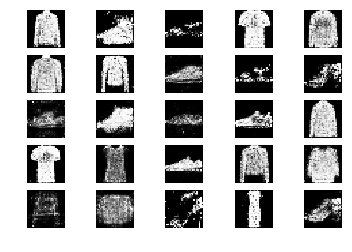

47801 [D loss: 0.750027, acc.: 51.56%] [G loss: 0.963378]
47802 [D loss: 0.522333, acc.: 76.56%] [G loss: 0.999620]
47803 [D loss: 0.638623, acc.: 60.94%] [G loss: 0.999237]
47804 [D loss: 0.551137, acc.: 71.88%] [G loss: 1.065398]
47805 [D loss: 0.659832, acc.: 57.81%] [G loss: 1.124679]
47806 [D loss: 0.621162, acc.: 67.19%] [G loss: 1.012463]
47807 [D loss: 0.621767, acc.: 60.94%] [G loss: 1.036482]
47808 [D loss: 0.524981, acc.: 70.31%] [G loss: 1.015107]
47809 [D loss: 0.737870, acc.: 56.25%] [G loss: 1.016038]
47810 [D loss: 0.677565, acc.: 62.50%] [G loss: 0.943132]
47811 [D loss: 0.630776, acc.: 68.75%] [G loss: 0.872543]
47812 [D loss: 0.636076, acc.: 62.50%] [G loss: 1.045997]
47813 [D loss: 0.542880, acc.: 70.31%] [G loss: 0.978966]
47814 [D loss: 0.660066, acc.: 62.50%] [G loss: 1.102671]
47815 [D loss: 0.617629, acc.: 67.19%] [G loss: 1.028289]
47816 [D loss: 0.606612, acc.: 64.06%] [G loss: 1.041775]
47817 [D loss: 0.634017, acc.: 64.06%] [G loss: 1.009498]
47818 [D loss:

47945 [D loss: 0.600308, acc.: 60.94%] [G loss: 0.932717]
47946 [D loss: 0.536944, acc.: 76.56%] [G loss: 1.015552]
47947 [D loss: 0.559831, acc.: 75.00%] [G loss: 0.897705]
47948 [D loss: 0.706510, acc.: 51.56%] [G loss: 0.966472]
47949 [D loss: 0.656535, acc.: 57.81%] [G loss: 0.963390]
47950 [D loss: 0.561597, acc.: 67.19%] [G loss: 1.030926]
47951 [D loss: 0.597288, acc.: 65.62%] [G loss: 1.095938]
47952 [D loss: 0.712731, acc.: 57.81%] [G loss: 0.967887]
47953 [D loss: 0.642433, acc.: 68.75%] [G loss: 1.144965]
47954 [D loss: 0.675604, acc.: 54.69%] [G loss: 1.031740]
47955 [D loss: 0.623493, acc.: 68.75%] [G loss: 0.901689]
47956 [D loss: 0.648147, acc.: 57.81%] [G loss: 1.060954]
47957 [D loss: 0.551015, acc.: 78.12%] [G loss: 0.949859]
47958 [D loss: 0.590718, acc.: 64.06%] [G loss: 1.004873]
47959 [D loss: 0.657090, acc.: 48.44%] [G loss: 1.121918]
47960 [D loss: 0.557395, acc.: 73.44%] [G loss: 0.998961]
47961 [D loss: 0.597721, acc.: 67.19%] [G loss: 1.025156]
47962 [D loss:

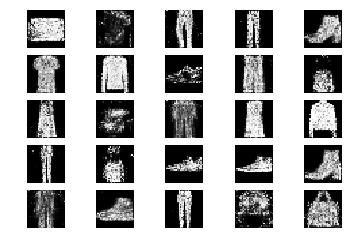

48001 [D loss: 0.647019, acc.: 57.81%] [G loss: 0.930755]
48002 [D loss: 0.606530, acc.: 71.88%] [G loss: 0.965075]
48003 [D loss: 0.575911, acc.: 73.44%] [G loss: 0.944617]
48004 [D loss: 0.566076, acc.: 68.75%] [G loss: 0.976575]
48005 [D loss: 0.604239, acc.: 67.19%] [G loss: 1.001029]
48006 [D loss: 0.623169, acc.: 70.31%] [G loss: 1.058010]
48007 [D loss: 0.597649, acc.: 67.19%] [G loss: 1.071366]
48008 [D loss: 0.595280, acc.: 68.75%] [G loss: 0.976864]
48009 [D loss: 0.624594, acc.: 67.19%] [G loss: 1.119083]
48010 [D loss: 0.671687, acc.: 65.62%] [G loss: 0.976919]
48011 [D loss: 0.616404, acc.: 70.31%] [G loss: 1.062058]
48012 [D loss: 0.546700, acc.: 78.12%] [G loss: 0.923105]
48013 [D loss: 0.679145, acc.: 59.38%] [G loss: 1.003816]
48014 [D loss: 0.602330, acc.: 70.31%] [G loss: 0.912132]
48015 [D loss: 0.683160, acc.: 62.50%] [G loss: 0.981515]
48016 [D loss: 0.688934, acc.: 59.38%] [G loss: 1.048584]
48017 [D loss: 0.583498, acc.: 65.62%] [G loss: 1.124819]
48018 [D loss:

48145 [D loss: 0.557596, acc.: 73.44%] [G loss: 0.971360]
48146 [D loss: 0.577609, acc.: 70.31%] [G loss: 1.158329]
48147 [D loss: 0.652298, acc.: 62.50%] [G loss: 0.922816]
48148 [D loss: 0.621090, acc.: 65.62%] [G loss: 1.005096]
48149 [D loss: 0.631683, acc.: 59.38%] [G loss: 1.041718]
48150 [D loss: 0.635541, acc.: 65.62%] [G loss: 0.900155]
48151 [D loss: 0.602273, acc.: 68.75%] [G loss: 0.925783]
48152 [D loss: 0.575447, acc.: 71.88%] [G loss: 0.871776]
48153 [D loss: 0.627503, acc.: 64.06%] [G loss: 0.923568]
48154 [D loss: 0.633387, acc.: 56.25%] [G loss: 1.074129]
48155 [D loss: 0.597503, acc.: 73.44%] [G loss: 0.969577]
48156 [D loss: 0.595743, acc.: 65.62%] [G loss: 0.850694]
48157 [D loss: 0.615506, acc.: 65.62%] [G loss: 1.003079]
48158 [D loss: 0.636442, acc.: 57.81%] [G loss: 1.101988]
48159 [D loss: 0.684245, acc.: 64.06%] [G loss: 0.937974]
48160 [D loss: 0.639269, acc.: 59.38%] [G loss: 0.960690]
48161 [D loss: 0.607131, acc.: 73.44%] [G loss: 1.147362]
48162 [D loss:

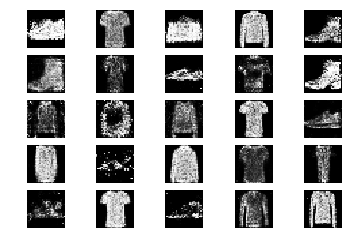

48201 [D loss: 0.765180, acc.: 50.00%] [G loss: 1.026896]
48202 [D loss: 0.670164, acc.: 60.94%] [G loss: 1.102740]
48203 [D loss: 0.616518, acc.: 62.50%] [G loss: 1.095503]
48204 [D loss: 0.616295, acc.: 70.31%] [G loss: 1.076453]
48205 [D loss: 0.574334, acc.: 68.75%] [G loss: 1.033485]
48206 [D loss: 0.603821, acc.: 68.75%] [G loss: 0.913267]
48207 [D loss: 0.683054, acc.: 64.06%] [G loss: 0.904953]
48208 [D loss: 0.621744, acc.: 70.31%] [G loss: 1.090229]
48209 [D loss: 0.575118, acc.: 78.12%] [G loss: 1.052509]
48210 [D loss: 0.633001, acc.: 64.06%] [G loss: 1.056516]
48211 [D loss: 0.579561, acc.: 70.31%] [G loss: 1.080978]
48212 [D loss: 0.637840, acc.: 64.06%] [G loss: 1.050608]
48213 [D loss: 0.581646, acc.: 70.31%] [G loss: 0.970888]
48214 [D loss: 0.717196, acc.: 50.00%] [G loss: 0.807696]
48215 [D loss: 0.655727, acc.: 56.25%] [G loss: 0.953215]
48216 [D loss: 0.633209, acc.: 57.81%] [G loss: 1.010205]
48217 [D loss: 0.567506, acc.: 65.62%] [G loss: 0.953083]
48218 [D loss:

48344 [D loss: 0.647925, acc.: 60.94%] [G loss: 1.192071]
48345 [D loss: 0.575376, acc.: 71.88%] [G loss: 0.986627]
48346 [D loss: 0.670765, acc.: 65.62%] [G loss: 0.952641]
48347 [D loss: 0.639481, acc.: 56.25%] [G loss: 1.101099]
48348 [D loss: 0.585408, acc.: 73.44%] [G loss: 1.041606]
48349 [D loss: 0.707398, acc.: 59.38%] [G loss: 1.082208]
48350 [D loss: 0.550175, acc.: 73.44%] [G loss: 1.090110]
48351 [D loss: 0.588059, acc.: 64.06%] [G loss: 0.955483]
48352 [D loss: 0.557326, acc.: 76.56%] [G loss: 0.971386]
48353 [D loss: 0.604679, acc.: 62.50%] [G loss: 1.023121]
48354 [D loss: 0.647931, acc.: 64.06%] [G loss: 1.062217]
48355 [D loss: 0.674755, acc.: 51.56%] [G loss: 1.084823]
48356 [D loss: 0.645749, acc.: 60.94%] [G loss: 1.083699]
48357 [D loss: 0.628161, acc.: 65.62%] [G loss: 0.966362]
48358 [D loss: 0.663440, acc.: 54.69%] [G loss: 1.008580]
48359 [D loss: 0.592329, acc.: 60.94%] [G loss: 1.046016]
48360 [D loss: 0.626563, acc.: 62.50%] [G loss: 1.041323]
48361 [D loss:

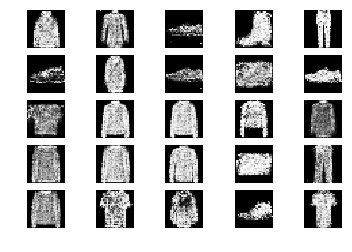

48401 [D loss: 0.625216, acc.: 62.50%] [G loss: 1.213741]
48402 [D loss: 0.576174, acc.: 68.75%] [G loss: 1.008528]
48403 [D loss: 0.653979, acc.: 71.88%] [G loss: 0.966374]
48404 [D loss: 0.650959, acc.: 60.94%] [G loss: 1.005149]
48405 [D loss: 0.596958, acc.: 64.06%] [G loss: 1.043243]
48406 [D loss: 0.604800, acc.: 60.94%] [G loss: 1.047116]
48407 [D loss: 0.607655, acc.: 60.94%] [G loss: 1.020906]
48408 [D loss: 0.619940, acc.: 70.31%] [G loss: 1.032482]
48409 [D loss: 0.714687, acc.: 54.69%] [G loss: 1.048019]
48410 [D loss: 0.610896, acc.: 67.19%] [G loss: 0.947521]
48411 [D loss: 0.737465, acc.: 57.81%] [G loss: 1.020882]
48412 [D loss: 0.630988, acc.: 60.94%] [G loss: 0.999927]
48413 [D loss: 0.511440, acc.: 73.44%] [G loss: 0.960024]
48414 [D loss: 0.606435, acc.: 65.62%] [G loss: 1.063658]
48415 [D loss: 0.653346, acc.: 59.38%] [G loss: 1.045349]
48416 [D loss: 0.613021, acc.: 60.94%] [G loss: 1.037141]
48417 [D loss: 0.715498, acc.: 51.56%] [G loss: 1.046862]
48418 [D loss:

48543 [D loss: 0.549910, acc.: 73.44%] [G loss: 0.943997]
48544 [D loss: 0.672842, acc.: 57.81%] [G loss: 1.048393]
48545 [D loss: 0.576321, acc.: 67.19%] [G loss: 1.020809]
48546 [D loss: 0.663377, acc.: 57.81%] [G loss: 0.927525]
48547 [D loss: 0.630516, acc.: 60.94%] [G loss: 0.939378]
48548 [D loss: 0.600566, acc.: 65.62%] [G loss: 0.927766]
48549 [D loss: 0.638686, acc.: 71.88%] [G loss: 1.006899]
48550 [D loss: 0.678705, acc.: 56.25%] [G loss: 1.030278]
48551 [D loss: 0.596727, acc.: 65.62%] [G loss: 1.108717]
48552 [D loss: 0.502486, acc.: 82.81%] [G loss: 0.971473]
48553 [D loss: 0.655060, acc.: 62.50%] [G loss: 0.975584]
48554 [D loss: 0.610167, acc.: 67.19%] [G loss: 1.017633]
48555 [D loss: 0.700762, acc.: 56.25%] [G loss: 1.058939]
48556 [D loss: 0.655934, acc.: 60.94%] [G loss: 0.982116]
48557 [D loss: 0.567338, acc.: 73.44%] [G loss: 1.054435]
48558 [D loss: 0.667043, acc.: 65.62%] [G loss: 1.087318]
48559 [D loss: 0.631108, acc.: 64.06%] [G loss: 0.927756]
48560 [D loss:

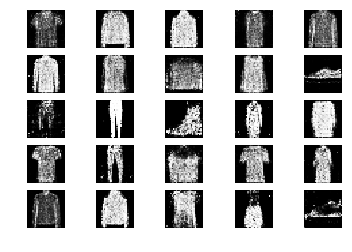

48601 [D loss: 0.610414, acc.: 59.38%] [G loss: 1.045488]
48602 [D loss: 0.710254, acc.: 59.38%] [G loss: 0.943747]
48603 [D loss: 0.715126, acc.: 57.81%] [G loss: 1.040022]
48604 [D loss: 0.715116, acc.: 54.69%] [G loss: 1.001759]
48605 [D loss: 0.593932, acc.: 73.44%] [G loss: 1.047265]
48606 [D loss: 0.599072, acc.: 64.06%] [G loss: 1.086461]
48607 [D loss: 0.591324, acc.: 64.06%] [G loss: 0.968782]
48608 [D loss: 0.597314, acc.: 62.50%] [G loss: 1.028847]
48609 [D loss: 0.566238, acc.: 70.31%] [G loss: 1.038300]
48610 [D loss: 0.637753, acc.: 57.81%] [G loss: 1.035804]
48611 [D loss: 0.606801, acc.: 62.50%] [G loss: 0.943218]
48612 [D loss: 0.628703, acc.: 64.06%] [G loss: 0.972346]
48613 [D loss: 0.649091, acc.: 65.62%] [G loss: 0.972286]
48614 [D loss: 0.576269, acc.: 68.75%] [G loss: 1.002648]
48615 [D loss: 0.565004, acc.: 75.00%] [G loss: 1.013205]
48616 [D loss: 0.703335, acc.: 56.25%] [G loss: 0.930587]
48617 [D loss: 0.620493, acc.: 62.50%] [G loss: 1.106383]
48618 [D loss:

48743 [D loss: 0.593240, acc.: 65.62%] [G loss: 1.062821]
48744 [D loss: 0.580591, acc.: 70.31%] [G loss: 1.072394]
48745 [D loss: 0.594168, acc.: 64.06%] [G loss: 1.055050]
48746 [D loss: 0.596014, acc.: 62.50%] [G loss: 1.026964]
48747 [D loss: 0.592160, acc.: 68.75%] [G loss: 0.952855]
48748 [D loss: 0.610099, acc.: 65.62%] [G loss: 1.057881]
48749 [D loss: 0.614649, acc.: 62.50%] [G loss: 0.994367]
48750 [D loss: 0.703492, acc.: 59.38%] [G loss: 0.854403]
48751 [D loss: 0.683948, acc.: 59.38%] [G loss: 1.057657]
48752 [D loss: 0.622344, acc.: 75.00%] [G loss: 0.994123]
48753 [D loss: 0.713943, acc.: 50.00%] [G loss: 0.894293]
48754 [D loss: 0.659618, acc.: 65.62%] [G loss: 0.980404]
48755 [D loss: 0.666124, acc.: 60.94%] [G loss: 1.020077]
48756 [D loss: 0.618564, acc.: 64.06%] [G loss: 1.129706]
48757 [D loss: 0.671227, acc.: 57.81%] [G loss: 1.250653]
48758 [D loss: 0.576796, acc.: 68.75%] [G loss: 1.089966]
48759 [D loss: 0.622051, acc.: 64.06%] [G loss: 1.103727]
48760 [D loss:

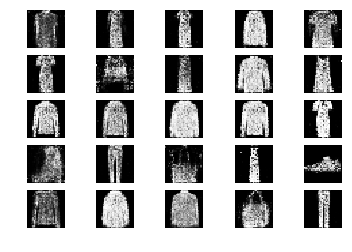

48801 [D loss: 0.667492, acc.: 56.25%] [G loss: 1.075490]
48802 [D loss: 0.612819, acc.: 64.06%] [G loss: 1.136332]
48803 [D loss: 0.615070, acc.: 64.06%] [G loss: 0.990681]
48804 [D loss: 0.704000, acc.: 56.25%] [G loss: 1.078463]
48805 [D loss: 0.681576, acc.: 56.25%] [G loss: 0.922115]
48806 [D loss: 0.647713, acc.: 59.38%] [G loss: 1.040601]
48807 [D loss: 0.637865, acc.: 67.19%] [G loss: 0.983684]
48808 [D loss: 0.682299, acc.: 60.94%] [G loss: 1.073103]
48809 [D loss: 0.638020, acc.: 62.50%] [G loss: 0.905428]
48810 [D loss: 0.673179, acc.: 54.69%] [G loss: 1.006373]
48811 [D loss: 0.604473, acc.: 68.75%] [G loss: 1.106454]
48812 [D loss: 0.577367, acc.: 78.12%] [G loss: 1.172232]
48813 [D loss: 0.662517, acc.: 59.38%] [G loss: 1.121906]
48814 [D loss: 0.594960, acc.: 68.75%] [G loss: 1.022136]
48815 [D loss: 0.628137, acc.: 62.50%] [G loss: 1.040652]
48816 [D loss: 0.620233, acc.: 65.62%] [G loss: 0.987872]
48817 [D loss: 0.621736, acc.: 65.62%] [G loss: 0.996815]
48818 [D loss:

48945 [D loss: 0.537570, acc.: 68.75%] [G loss: 1.058054]
48946 [D loss: 0.639103, acc.: 59.38%] [G loss: 1.020971]
48947 [D loss: 0.616973, acc.: 59.38%] [G loss: 1.049501]
48948 [D loss: 0.559366, acc.: 78.12%] [G loss: 0.927279]
48949 [D loss: 0.664594, acc.: 56.25%] [G loss: 0.904479]
48950 [D loss: 0.649348, acc.: 64.06%] [G loss: 0.961241]
48951 [D loss: 0.549422, acc.: 76.56%] [G loss: 1.009392]
48952 [D loss: 0.608366, acc.: 67.19%] [G loss: 0.993032]
48953 [D loss: 0.643566, acc.: 67.19%] [G loss: 0.934750]
48954 [D loss: 0.557879, acc.: 75.00%] [G loss: 0.958966]
48955 [D loss: 0.625674, acc.: 67.19%] [G loss: 1.041328]
48956 [D loss: 0.626285, acc.: 64.06%] [G loss: 0.988993]
48957 [D loss: 0.627779, acc.: 68.75%] [G loss: 1.009295]
48958 [D loss: 0.617807, acc.: 67.19%] [G loss: 0.974363]
48959 [D loss: 0.615777, acc.: 62.50%] [G loss: 0.996707]
48960 [D loss: 0.669642, acc.: 60.94%] [G loss: 0.931003]
48961 [D loss: 0.686536, acc.: 62.50%] [G loss: 0.959742]
48962 [D loss:

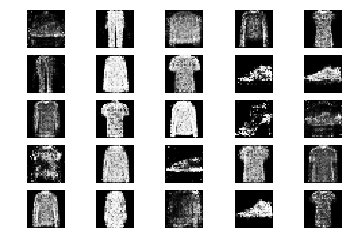

49001 [D loss: 0.673791, acc.: 62.50%] [G loss: 1.145895]
49002 [D loss: 0.622717, acc.: 64.06%] [G loss: 1.139715]
49003 [D loss: 0.612545, acc.: 67.19%] [G loss: 0.987876]
49004 [D loss: 0.664717, acc.: 60.94%] [G loss: 0.957315]
49005 [D loss: 0.609510, acc.: 64.06%] [G loss: 1.038656]
49006 [D loss: 0.679823, acc.: 62.50%] [G loss: 0.983840]
49007 [D loss: 0.732885, acc.: 62.50%] [G loss: 1.010551]
49008 [D loss: 0.695872, acc.: 50.00%] [G loss: 1.077494]
49009 [D loss: 0.600145, acc.: 68.75%] [G loss: 0.993648]
49010 [D loss: 0.632869, acc.: 62.50%] [G loss: 1.114049]
49011 [D loss: 0.558873, acc.: 68.75%] [G loss: 1.161453]
49012 [D loss: 0.669940, acc.: 57.81%] [G loss: 1.049332]
49013 [D loss: 0.588139, acc.: 73.44%] [G loss: 0.950819]
49014 [D loss: 0.578405, acc.: 71.88%] [G loss: 0.945529]
49015 [D loss: 0.695033, acc.: 54.69%] [G loss: 1.093360]
49016 [D loss: 0.611631, acc.: 68.75%] [G loss: 1.025193]
49017 [D loss: 0.539689, acc.: 76.56%] [G loss: 1.034387]
49018 [D loss:

49143 [D loss: 0.621298, acc.: 57.81%] [G loss: 1.016403]
49144 [D loss: 0.565400, acc.: 68.75%] [G loss: 1.098345]
49145 [D loss: 0.581343, acc.: 68.75%] [G loss: 1.082996]
49146 [D loss: 0.570832, acc.: 68.75%] [G loss: 1.127162]
49147 [D loss: 0.675422, acc.: 50.00%] [G loss: 1.006940]
49148 [D loss: 0.593347, acc.: 70.31%] [G loss: 1.045156]
49149 [D loss: 0.637387, acc.: 73.44%] [G loss: 1.099752]
49150 [D loss: 0.566720, acc.: 68.75%] [G loss: 1.038631]
49151 [D loss: 0.601872, acc.: 67.19%] [G loss: 1.055052]
49152 [D loss: 0.602571, acc.: 64.06%] [G loss: 1.165973]
49153 [D loss: 0.587598, acc.: 70.31%] [G loss: 1.150493]
49154 [D loss: 0.667241, acc.: 57.81%] [G loss: 1.020712]
49155 [D loss: 0.562197, acc.: 78.12%] [G loss: 0.971916]
49156 [D loss: 0.671562, acc.: 57.81%] [G loss: 0.933829]
49157 [D loss: 0.524423, acc.: 73.44%] [G loss: 1.038023]
49158 [D loss: 0.561761, acc.: 75.00%] [G loss: 1.103589]
49159 [D loss: 0.541817, acc.: 67.19%] [G loss: 1.069933]
49160 [D loss:

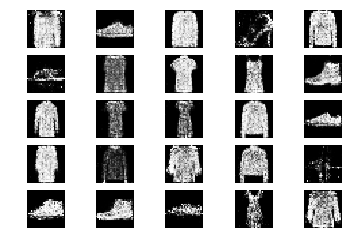

49201 [D loss: 0.618848, acc.: 65.62%] [G loss: 0.997251]
49202 [D loss: 0.601132, acc.: 56.25%] [G loss: 0.923041]
49203 [D loss: 0.650139, acc.: 60.94%] [G loss: 1.016465]
49204 [D loss: 0.547291, acc.: 73.44%] [G loss: 1.097229]
49205 [D loss: 0.655240, acc.: 64.06%] [G loss: 0.945065]
49206 [D loss: 0.541829, acc.: 70.31%] [G loss: 0.973020]
49207 [D loss: 0.583261, acc.: 65.62%] [G loss: 0.972731]
49208 [D loss: 0.726602, acc.: 54.69%] [G loss: 1.049927]
49209 [D loss: 0.649039, acc.: 56.25%] [G loss: 0.921012]
49210 [D loss: 0.697690, acc.: 56.25%] [G loss: 0.911961]
49211 [D loss: 0.576622, acc.: 73.44%] [G loss: 1.025075]
49212 [D loss: 0.601213, acc.: 68.75%] [G loss: 1.127009]
49213 [D loss: 0.614679, acc.: 67.19%] [G loss: 1.077805]
49214 [D loss: 0.616662, acc.: 60.94%] [G loss: 1.031618]
49215 [D loss: 0.579526, acc.: 71.88%] [G loss: 1.229657]
49216 [D loss: 0.684817, acc.: 57.81%] [G loss: 1.057503]
49217 [D loss: 0.586907, acc.: 70.31%] [G loss: 1.040469]
49218 [D loss:

49344 [D loss: 0.566566, acc.: 68.75%] [G loss: 1.105984]
49345 [D loss: 0.665637, acc.: 64.06%] [G loss: 0.974178]
49346 [D loss: 0.632529, acc.: 62.50%] [G loss: 1.043886]
49347 [D loss: 0.602922, acc.: 64.06%] [G loss: 0.954555]
49348 [D loss: 0.583335, acc.: 67.19%] [G loss: 1.096031]
49349 [D loss: 0.653817, acc.: 56.25%] [G loss: 1.053613]
49350 [D loss: 0.689099, acc.: 56.25%] [G loss: 1.032020]
49351 [D loss: 0.605033, acc.: 65.62%] [G loss: 1.098737]
49352 [D loss: 0.579495, acc.: 73.44%] [G loss: 1.052758]
49353 [D loss: 0.572532, acc.: 75.00%] [G loss: 1.016302]
49354 [D loss: 0.612192, acc.: 70.31%] [G loss: 1.067063]
49355 [D loss: 0.649408, acc.: 57.81%] [G loss: 1.113814]
49356 [D loss: 0.635138, acc.: 60.94%] [G loss: 1.103358]
49357 [D loss: 0.694850, acc.: 59.38%] [G loss: 0.997446]
49358 [D loss: 0.612545, acc.: 64.06%] [G loss: 1.007167]
49359 [D loss: 0.543702, acc.: 68.75%] [G loss: 1.114777]
49360 [D loss: 0.594479, acc.: 67.19%] [G loss: 1.101586]
49361 [D loss:

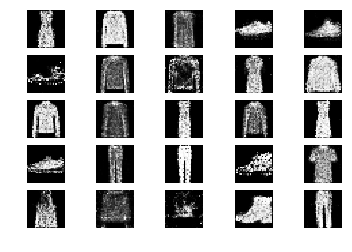

49401 [D loss: 0.594525, acc.: 70.31%] [G loss: 0.993071]
49402 [D loss: 0.599094, acc.: 70.31%] [G loss: 0.960479]
49403 [D loss: 0.626849, acc.: 57.81%] [G loss: 1.020355]
49404 [D loss: 0.656532, acc.: 64.06%] [G loss: 1.011626]
49405 [D loss: 0.640769, acc.: 59.38%] [G loss: 1.075363]
49406 [D loss: 0.609264, acc.: 65.62%] [G loss: 1.076671]
49407 [D loss: 0.539280, acc.: 73.44%] [G loss: 1.134543]
49408 [D loss: 0.590824, acc.: 70.31%] [G loss: 1.051961]
49409 [D loss: 0.671934, acc.: 56.25%] [G loss: 0.961646]
49410 [D loss: 0.661365, acc.: 64.06%] [G loss: 1.017540]
49411 [D loss: 0.552395, acc.: 73.44%] [G loss: 0.999220]
49412 [D loss: 0.661883, acc.: 60.94%] [G loss: 1.093054]
49413 [D loss: 0.659031, acc.: 62.50%] [G loss: 1.088949]
49414 [D loss: 0.659063, acc.: 60.94%] [G loss: 1.028941]
49415 [D loss: 0.623524, acc.: 59.38%] [G loss: 1.001556]
49416 [D loss: 0.551728, acc.: 75.00%] [G loss: 1.107740]
49417 [D loss: 0.624093, acc.: 65.62%] [G loss: 1.139410]
49418 [D loss:

49543 [D loss: 0.643304, acc.: 57.81%] [G loss: 1.037339]
49544 [D loss: 0.571920, acc.: 71.88%] [G loss: 1.012935]
49545 [D loss: 0.611208, acc.: 60.94%] [G loss: 0.985200]
49546 [D loss: 0.609357, acc.: 65.62%] [G loss: 1.012655]
49547 [D loss: 0.565090, acc.: 68.75%] [G loss: 1.051590]
49548 [D loss: 0.602767, acc.: 64.06%] [G loss: 1.143613]
49549 [D loss: 0.657520, acc.: 60.94%] [G loss: 0.950485]
49550 [D loss: 0.640283, acc.: 60.94%] [G loss: 1.124763]
49551 [D loss: 0.580747, acc.: 71.88%] [G loss: 1.231593]
49552 [D loss: 0.622906, acc.: 68.75%] [G loss: 1.125904]
49553 [D loss: 0.585974, acc.: 71.88%] [G loss: 0.935999]
49554 [D loss: 0.618940, acc.: 67.19%] [G loss: 1.050901]
49555 [D loss: 0.649532, acc.: 59.38%] [G loss: 1.145086]
49556 [D loss: 0.612774, acc.: 65.62%] [G loss: 1.033911]
49557 [D loss: 0.642553, acc.: 57.81%] [G loss: 1.077659]
49558 [D loss: 0.553071, acc.: 75.00%] [G loss: 1.109399]
49559 [D loss: 0.579687, acc.: 70.31%] [G loss: 0.851518]
49560 [D loss:

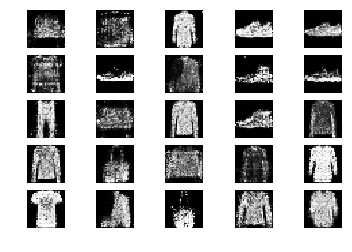

49601 [D loss: 0.639987, acc.: 57.81%] [G loss: 1.010391]
49602 [D loss: 0.666171, acc.: 60.94%] [G loss: 1.042276]
49603 [D loss: 0.590196, acc.: 65.62%] [G loss: 0.989603]
49604 [D loss: 0.656940, acc.: 62.50%] [G loss: 1.058408]
49605 [D loss: 0.590819, acc.: 67.19%] [G loss: 0.907548]
49606 [D loss: 0.662655, acc.: 65.62%] [G loss: 0.896480]
49607 [D loss: 0.637262, acc.: 67.19%] [G loss: 0.916875]
49608 [D loss: 0.693397, acc.: 51.56%] [G loss: 0.847210]
49609 [D loss: 0.638214, acc.: 67.19%] [G loss: 0.909136]
49610 [D loss: 0.659414, acc.: 62.50%] [G loss: 1.037612]
49611 [D loss: 0.602425, acc.: 67.19%] [G loss: 0.897050]
49612 [D loss: 0.598091, acc.: 60.94%] [G loss: 0.934143]
49613 [D loss: 0.649870, acc.: 64.06%] [G loss: 0.946006]
49614 [D loss: 0.623894, acc.: 67.19%] [G loss: 0.957795]
49615 [D loss: 0.555567, acc.: 78.12%] [G loss: 1.014674]
49616 [D loss: 0.633895, acc.: 60.94%] [G loss: 0.982757]
49617 [D loss: 0.623472, acc.: 62.50%] [G loss: 0.941440]
49618 [D loss:

49745 [D loss: 0.639688, acc.: 60.94%] [G loss: 0.958859]
49746 [D loss: 0.680940, acc.: 59.38%] [G loss: 1.032522]
49747 [D loss: 0.605944, acc.: 70.31%] [G loss: 1.068411]
49748 [D loss: 0.595272, acc.: 64.06%] [G loss: 1.046386]
49749 [D loss: 0.660002, acc.: 56.25%] [G loss: 0.928249]
49750 [D loss: 0.634263, acc.: 60.94%] [G loss: 1.031200]
49751 [D loss: 0.554423, acc.: 75.00%] [G loss: 1.027575]
49752 [D loss: 0.668115, acc.: 53.12%] [G loss: 1.051142]
49753 [D loss: 0.636028, acc.: 56.25%] [G loss: 1.055361]
49754 [D loss: 0.593538, acc.: 71.88%] [G loss: 0.891050]
49755 [D loss: 0.689069, acc.: 62.50%] [G loss: 0.970374]
49756 [D loss: 0.674151, acc.: 62.50%] [G loss: 1.029012]
49757 [D loss: 0.634932, acc.: 60.94%] [G loss: 1.124079]
49758 [D loss: 0.669359, acc.: 59.38%] [G loss: 1.145616]
49759 [D loss: 0.647382, acc.: 64.06%] [G loss: 0.931157]
49760 [D loss: 0.569250, acc.: 75.00%] [G loss: 1.003542]
49761 [D loss: 0.557412, acc.: 68.75%] [G loss: 1.032593]
49762 [D loss:

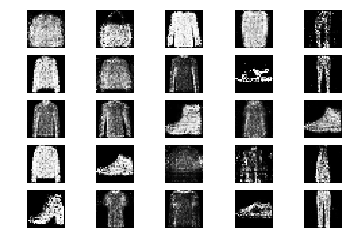

49801 [D loss: 0.618295, acc.: 60.94%] [G loss: 0.979343]
49802 [D loss: 0.605302, acc.: 67.19%] [G loss: 0.984610]
49803 [D loss: 0.693514, acc.: 54.69%] [G loss: 0.973919]
49804 [D loss: 0.627203, acc.: 56.25%] [G loss: 0.997744]
49805 [D loss: 0.669113, acc.: 65.62%] [G loss: 1.091173]
49806 [D loss: 0.556445, acc.: 71.88%] [G loss: 0.955837]
49807 [D loss: 0.609055, acc.: 67.19%] [G loss: 0.952002]
49808 [D loss: 0.693386, acc.: 53.12%] [G loss: 0.891392]
49809 [D loss: 0.567457, acc.: 75.00%] [G loss: 1.010033]
49810 [D loss: 0.665969, acc.: 60.94%] [G loss: 0.963094]
49811 [D loss: 0.673448, acc.: 62.50%] [G loss: 0.879948]
49812 [D loss: 0.661073, acc.: 54.69%] [G loss: 0.998805]
49813 [D loss: 0.578898, acc.: 78.12%] [G loss: 1.019235]
49814 [D loss: 0.726280, acc.: 56.25%] [G loss: 0.983505]
49815 [D loss: 0.643779, acc.: 60.94%] [G loss: 0.892493]
49816 [D loss: 0.704858, acc.: 51.56%] [G loss: 0.854741]
49817 [D loss: 0.548737, acc.: 73.44%] [G loss: 1.129646]
49818 [D loss:

49943 [D loss: 0.611026, acc.: 67.19%] [G loss: 0.979254]
49944 [D loss: 0.533867, acc.: 67.19%] [G loss: 1.080531]
49945 [D loss: 0.509999, acc.: 81.25%] [G loss: 1.085953]
49946 [D loss: 0.541782, acc.: 75.00%] [G loss: 1.152720]
49947 [D loss: 0.634579, acc.: 65.62%] [G loss: 1.049626]
49948 [D loss: 0.565665, acc.: 60.94%] [G loss: 1.030872]
49949 [D loss: 0.729018, acc.: 56.25%] [G loss: 0.938056]
49950 [D loss: 0.695564, acc.: 56.25%] [G loss: 0.976641]
49951 [D loss: 0.624949, acc.: 65.62%] [G loss: 1.157840]
49952 [D loss: 0.579018, acc.: 71.88%] [G loss: 1.112976]
49953 [D loss: 0.668955, acc.: 53.12%] [G loss: 1.277668]
49954 [D loss: 0.667676, acc.: 65.62%] [G loss: 1.042030]
49955 [D loss: 0.581826, acc.: 68.75%] [G loss: 0.984409]
49956 [D loss: 0.646876, acc.: 67.19%] [G loss: 1.174441]
49957 [D loss: 0.699204, acc.: 60.94%] [G loss: 0.969736]
49958 [D loss: 0.635493, acc.: 62.50%] [G loss: 0.929974]
49959 [D loss: 0.620840, acc.: 67.19%] [G loss: 1.004701]
49960 [D loss:

In [6]:
gan.train(epochs=50000, batch_size=32, sample_interval=200)

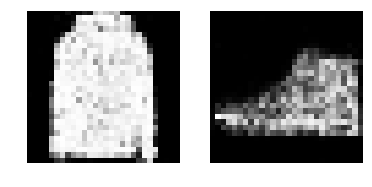

In [7]:
gan.sample_images(1,r=1,c=2, save_fig=True)